# University of Michigan 
# Master of Applied Data Science
### SIAD 699: Capstone
Team: James Yoon (jamyoon), Mario Feliciano (felicma), and James Tuccori (jtuccori)

Date: April 2023
____
# Social Media Sentiment & Predicting Trading Signals 

##### In this notebook, we add financials indicatiors and basic binary increase or decreasing indicators as features. We then run all the 177 features with 25,503 data points through an emsemble model of the top 5 interpretable linear models GBC, LR, LDA, ADA, and RC. 

##### The output of the notebook is the prediction of the model for the 7,340 testing data points, which will be used in Step 5 back testing.  Ensemble_Model_LR_ABC_LDA_GBC_RC.csv

In [3]:
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import RidgeClassifier
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LogisticRegression
from adspy_shared_utilities import plot_class_regions_for_classifier_subplot
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from adspy_shared_utilities import plot_decision_tree
from adspy_shared_utilities import plot_class_regions_for_classifier
from adspy_shared_utilities import plot_decision_tree
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from adspy_shared_utilities import plot_decision_tree
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.ensemble import VotingClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.ensemble import ExtraTreesClassifier
import pickle
import seaborn as sns
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import confusion_matrix
from sklearn.inspection import permutation_importance
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import AdaBoostClassifier
from finta import TA

Add new features for the financial indifcators from finta library. Also importing the Traing Data below from Step 2. Creating an expotential smoothing to help reduce significant variance in the close data. Then creating binary indicators of the columns and financial features to use as new features. 

In [2]:
INDICATORS = ['RSI', 'MACD', 'STOCH','ADL', 'ATR', 'MOM', 'MFI', 'ROC', 'OBV', 'CCI', 'EMV', 'VORTEX']
Df_hourly_merge = pd.read_csv('assets/MergeJMJPCHourly2019202_NewsGoogleApi_ActualLabel.csv')

def _exponential_smooth(data, alpha):
    """
    Function that exponentially smooths dataset so values are less 'rigid'
    :param alpha: weight factor to weight recent values more
    """
    
    return data.ewm(alpha=alpha).mean()

Indicatordata = _exponential_smooth(Df_hourly_merge[['Close', 'Open','High','Low','Volume']], 0.65)
def _get_indicator_data(data):
    """
    Function that uses the finta API to calculate technical indicators used as the features
    :return:
    """

    for indicator in INDICATORS:
        ind_data = eval('TA.' + indicator + '(data)')
        if not isinstance(ind_data, pd.DataFrame):
            ind_data = ind_data.to_frame()
        data = data.merge(ind_data, left_index=True, right_index=True)
    data.rename(columns={"14 period EMV.": '14 period EMV'}, inplace=True)

    # Also calculate moving averages for features
    data['ema50'] = data['Close'] / data['Close'].ewm(50).mean()
    data['ema21'] = data['Close'] / data['Close'].ewm(21).mean()
    data['ema15'] = data['Close'] / data['Close'].ewm(14).mean()
    data['ema5'] = data['Close'] / data['Close'].ewm(5).mean()

    # Instead of using the actual volume value (which changes over time), we normalize it with a moving volume average
    data['normVol'] = data['Volume'] / data['Volume'].ewm(5).mean()
   
    return data

Indicatordatafinal = _get_indicator_data(Indicatordata)

Indicatordatafinal = Indicatordatafinal.drop(['Close', 'Open', 'High', 'Low', 'Volume'], axis = 1)
Df_hourly_merge2 = pd.merge(Df_hourly_merge, Indicatordatafinal, left_index=True, right_index=True)

Df_hourly_merge2 = Df_hourly_merge2.drop(['time','hour','Open Time','_merge','Signal','Position', 'Signal35JMJ', 'Position35JMJ', 'Ignore'], axis = 1)




def binary(value):
  if value > 0:
    return 1
  else:
    return 0

columns = ['favorites', 'retweets', 'number_of_followers', 'following',
       'followers_following_ratio', '2x_retweets_+_favorites', 'polarity',
       'W1 Score', 'Bull_ratio', 'W Score With Bull Ratio', 'Open', 'High',
       'Low', 'Close', 'Volume', 'Quote Asset Volume', 'Number of Trades',
       'TB Base Volume', 'TB Quote Volume', '3MovingAverage', '5MovingAverage',
       'JMJ_3HMoving_averages', 'JMJ_5HMoving_averages', 
       '14 period RSI', 'MACD', 'SIGNAL', '14 period STOCH %K', 'MFV',
       '14 period ATR', 'MOM', '14 period MFI', 'ROC', 'OBV', '20 period CCI',
       '14 period EMV', 'VIm', 'VIp', 'ema50', 'ema21', 'ema15', 'ema5']


for column in columns: 
    Df_hourly_merge2['Binary{}'.format(column)]  = (Df_hourly_merge2[column] - Df_hourly_merge2[column].shift(1)).apply(binary)
    

In [3]:
len(Df_hourly_merge2)

25503

In [4]:
Df_hourly_merge2

,favorites,retweets,number_of_followers,following,followers_following_ratio,2x_retweets_+_favorites,polarity,W1 Score,Bull_ratio,W Score With Bull Ratio,...,BinaryROC,BinaryOBV,Binary20 period CCI,Binary14 period EMV,BinaryVIm,BinaryVIp,Binaryema50,Binaryema21,Binaryema15,Binaryema5
0,6.517857,1.276786,10592.354167,1652.068452,45.605159,9.071429,0.124241,0.264455,3.275000,0.866089,...,0,0,0,0,0,0,0,0,0,0
1,2.685230,0.479419,14341.610169,1852.799031,74.444302,3.644068,0.067950,0.097316,3.342105,0.325240,...,0,0,0,0,0,0,1,1,1,1
2,2.138107,0.670077,21769.074169,2449.731458,68.571009,3.478261,0.120056,0.144203,6.120000,0.882520,...,0,0,0,0,0,0,0,0,0,0
3,1.916462,0.670762,36958.090909,2790.968059,100.500076,3.257985,0.143717,0.110483,5.964286,0.658951,...,0,0,0,0,0,0,0,0,0,0
4,4.339394,0.921212,13345.724242,3208.639394,66.105667,6.181818,0.136780,0.199699,4.607143,0.920041,...,0,0,1,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25498,5.783333,0.659524,12129.000000,1975.276190,108.150291,7.102381,0.077630,0.078660,3.022222,0.237728,...,0,0,1,1,0,1,0,0,0,0
25499,3.011905,0.392857,14180.595238,1765.121429,31.755382,3.797619,0.095683,0.135134,4.277778,0.578073,...,0,0,0,1,0,1,0,0,0,0
25500,14.400000,2.407143,16161.992857,2084.061905,182.260151,19.214286,0.082271,0.107210,3.648649,0.391172,...,0,0,0,0,1,0,0,0,0,0
25501,21.570806,3.270153,11254.296296,1814.954248,428.484448,28.111111,0.070485,0.165014,1.887324,0.311435,...,0,1,0,0,1,0,1,1,1,1


In [6]:
Df_hourly_merge2.columns.values

array(['favorites', 'retweets', 'number_of_followers', 'following',
       'followers_following_ratio', '2x_retweets_+_favorites', 'polarity',
       'W1 Score', 'Bull_ratio', 'W Score With Bull Ratio', 'Open',
       'High', 'Low', 'Close', 'Volume', 'Quote Asset Volume',
       'Number of Trades', 'TB Base Volume', 'TB Quote Volume',
       '3MovingAverage', '5MovingAverage', 'JMJ_3HMoving_averages',
       'JMJ_5HMoving_averages', 'Actual_Label',
       'Bitcoin_Google_Trend_Score', 'BTC_Google_Trend_Score',
       'Mkt Sentiment', 'Crypto Sentiment',
       'Historically Optimal SMA(s-t)', 'Historically Optimal SMA(l-t)',
       'Historically Optimal WMA(s-t)', 'Historically Optimal WMA(l-t)',
       'Historically Optimal EMA(s-t)', 'Historically Optimal EMA(l-t)',
       'Twitter Hourly Favorites SMA(s-t)',
       'Twitter Hourly Favorites SMA(l-t)',
       'Twitter Hourly Favorites WMA(s-t)',
       'Twitter Hourly Favorites WMA(l-t)',
       'Twitter Hourly Favorites EMA(s-t)',


#### Identifying what exactly are the features and the label

In [7]:
data = Df_hourly_merge2
data = data.dropna()

feature_names_JMJ = ['favorites', 'retweets', 'number_of_followers', 'following',
       'followers_following_ratio', '2x_retweets_+_favorites', 'polarity',
       'W1 Score', 'Bull_ratio', 'W Score With Bull Ratio', 'Open',
       'High', 'Low', 'Close', 'Volume', 'Quote Asset Volume',
       'Number of Trades', 'TB Base Volume', 'TB Quote Volume',
       '3MovingAverage', '5MovingAverage', 'JMJ_3HMoving_averages',
       'JMJ_5HMoving_averages', 
       'Bitcoin_Google_Trend_Score', 'BTC_Google_Trend_Score',
       'Mkt Sentiment', 'Crypto Sentiment',
       'Historically Optimal SMA(s-t)', 'Historically Optimal SMA(l-t)',
       'Historically Optimal WMA(s-t)', 'Historically Optimal WMA(l-t)',
       'Historically Optimal EMA(s-t)', 'Historically Optimal EMA(l-t)',
       'Twitter Hourly Favorites SMA(s-t)',
       'Twitter Hourly Favorites SMA(l-t)',
       'Twitter Hourly Favorites WMA(s-t)',
       'Twitter Hourly Favorites WMA(l-t)',
       'Twitter Hourly Favorites EMA(s-t)',
       'Twitter Hourly Favorites EMA(l-t)',
       'Twitter Hourly Retweets SMA(s-t)',
       'Twitter Hourly Retweets SMA(l-t)',
       'Twitter Hourly Retweets WMA(s-t)',
       'Twitter Hourly Retweets WMA(l-t)',
       'Twitter Hourly Retweets EMA(s-t)',
       'Twitter Hourly Retweets EMA(l-t)',
       'Twitter Hourly Follower Exposure SMA(s-t)',
       'Twitter Hourly Follower Exposure SMA(l-t)',
       'Twitter Hourly Follower Exposure WMA(s-t)',
       'Twitter Hourly Follower Exposure WMA(l-t)',
       'Twitter Hourly Follower Exposure EMA(s-t)',
       'Twitter Hourly Follower Exposure EMA(l-t)',
       'Twitter Hourly Following Exposure SMA(s-t)',
       'Twitter Hourly Following Exposure SMA(l-t)',
       'Twitter Hourly Following Exposure WMA(s-t)',
       'Twitter Hourly Following Exposure WMA(l-t)',
       'Twitter Hourly Following Exposure EMA(s-t)',
       'Twitter Hourly Following Exposure EMA(l-t)',
       'Twitter Hourly Follower to Following Ratio SMA(s-t)',
       'Twitter Hourly Follower to Following Ratio SMA(l-t)',
       'Twitter Hourly Follower to Following Ratio WMA(s-t)',
       'Twitter Hourly Follower to Following Ratio WMA(l-t)',
       'Twitter Hourly Follower to Following Ratio EMA(s-t)',
       'Twitter Hourly Follower to Following Ratio EMA(l-t)',
       'Twitter Hourly 2x Retweets + Favorites SMA(s-t)',
       'Twitter Hourly 2x Retweets + Favorites SMA(l-t)',
       'Twitter Hourly 2x Retweets + Favorites WMA(s-t)',
       'Twitter Hourly 2x Retweets + Favorites WMA(l-t)',
       'Twitter Hourly 2x Retweets + Favorites EMA(s-t)',
       'Twitter Hourly 2x Retweets + Favorites EMA(l-t)',
       'Twitter Hourly Polarity Score SMA(s-t)',
       'Twitter Hourly Polarity Score SMA(l-t)',
       'Twitter Hourly Polarity Score WMA(s-t)',
       'Twitter Hourly Polarity Score WMA(l-t)',
       'Twitter Hourly Polarity Score EMA(s-t)',
       'Twitter Hourly Polarity Score EMA(l-t)',
       'Twitter W1 Score SMA(s-t)', 'Twitter W1 Score SMA(l-t)',
       'Twitter W1 Score WMA(s-t)', 'Twitter W1 Score WMA(l-t)',
       'Twitter W1 Score EMA(s-t)', 'Twitter W1 Score EMA(l-t)',
       'Twitter Hourly Bull Ratio SMA(s-t)',
       'Twitter Hourly Bull Ratio SMA(l-t)',
       'Twitter Hourly Bull Ratio WMA(s-t)',
       'Twitter Hourly Bull Ratio WMA(l-t)',
       'Twitter Hourly Bull Ratio EMA(s-t)',
       'Twitter Hourly Bull Ratio EMA(l-t)',
       'Twitter Hourly Weighted Bull Ratio SMA(s-t)',
       'Twitter Hourly Weighted Bull Ratio SMA(l-t)',
       'Twitter Hourly Weighted Bull Ratio WMA(s-t)',
       'Twitter Hourly Weighted Bull Ratio WMA(l-t)',
       'Twitter Hourly Weighted Bull Ratio EMA(s-t)',
       'Twitter Hourly Weighted Bull Ratio EMA(l-t)',
       'Quote Asset Volume SMA(s-t)', 'Quote Asset Volume SMA(l-t)',
       'Quote Asset Volume WMA(s-t)', 'Quote Asset Volume WMA(l-t)',
       'Quote Asset Volume EMA(s-t)', 'Quote Asset Volume EMA(l-t)',
       '# of Hourly Trades SMA(s-t)', '# of Hourly Trades SMA(l-t)',
       '# of Hourly Trades WMA(s-t)', '# of Hourly Trades WMA(l-t)',
       '# of Hourly Trades EMA(s-t)', '# of Hourly Trades EMA(l-t)',
       'TB Base Volume SMA(s-t)', 'TB Base Volume SMA(l-t)',
       'TB Base Volume WMA(s-t)', 'TB Base Volume WMA(l-t)',
       'TB Base Volume EMA(s-t)', 'TB Base Volume EMA(l-t)',
       'TB Quote Volume SMA(s-t)', 'TB Quote Volume SMA(l-t)',
       'TB Quote Volume WMA(s-t)', 'TB Quote Volume WMA(l-t)',
       'TB Quote Volume EMA(s-t)', 'TB Quote Volume EMA(l-t)',
       '14 period RSI', 'MACD', 'SIGNAL', '14 period STOCH %K', 'MFV',
       '14 period ATR', 'MOM', '14 period MFI', 'ROC', 'OBV',
       '20 period CCI', '14 period EMV', 'VIm', 'VIp', 'ema50', 'ema21',
       'ema15', 'ema5', 'normVol', 'Binaryfavorites', 'Binaryretweets',
       'Binarynumber_of_followers', 'Binaryfollowing',
       'Binaryfollowers_following_ratio', 'Binary2x_retweets_+_favorites',
       'Binarypolarity', 'BinaryW1 Score', 'BinaryBull_ratio',
       'BinaryW Score With Bull Ratio', 'BinaryOpen', 'BinaryHigh',
       'BinaryLow', 'BinaryClose', 'BinaryVolume',
       'BinaryQuote Asset Volume', 'BinaryNumber of Trades',
       'BinaryTB Base Volume', 'BinaryTB Quote Volume',
       'Binary3MovingAverage', 'Binary5MovingAverage',
       'BinaryJMJ_3HMoving_averages', 'BinaryJMJ_5HMoving_averages',
       'Binary14 period RSI', 'BinaryMACD', 'BinarySIGNAL',
       'Binary14 period STOCH %K', 'BinaryMFV', 'Binary14 period ATR',
       'BinaryMOM', 'Binary14 period MFI', 'BinaryROC', 'BinaryOBV',
       'Binary20 period CCI', 'Binary14 period EMV', 'BinaryVIm',
       'BinaryVIp', 'Binaryema50', 'Binaryema21', 'Binaryema15',
       'Binaryema5']

X_JMJ = data[feature_names_JMJ]
y_JMJ = data['Actual_Label']
target_names_JMJ = ['Buy', 'Yes',]


X_train, X_test, y_train, y_test = train_test_split(X_JMJ, y_JMJ, random_state=0, shuffle= False)

scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

#### Setting up the model and the gridsearch parameters for the top 5 models as functions, to to be used later

In [8]:
%%time
def _train_AdaBoostClassifier(X_train, y_train, X_test, y_test):

    """
    Function that uses random forest classifier to train the model
    :return:
    """
    
    # Create a new model
    abc = AdaBoostClassifier()
    
    # Dictionary of all values we want to test for n_estimators
    params_abc =  {
                'n_estimators': [20, 50, 70, 100],
                'learning_rate' : [0.001, 0.01, 0.1, 0.2]
                }
    
    # Use gridsearch to test all values for n_estimators
    abc_gs = GridSearchCV(abc, params_abc, cv=5)
    
    # Fit model to training data
    abc_gs.fit(X_train, y_train)
    
    # Save best model
    abc_best = abc_gs.best_estimator_
    
    # Check best n_estimators value
    print(abc_gs.best_params_)
    
    prediction = abc_best.predict(X_test)

    print(classification_report(y_test, prediction))
    print(confusion_matrix(y_test, prediction))
    
    return abc_best
    
abc_model = _train_AdaBoostClassifier(X_train_scaled, y_train, X_test_scaled, y_test)

{'learning_rate': 0.001, 'n_estimators': 20}
              precision    recall  f1-score   support

         0.0       0.53      0.56      0.55      3187
         1.0       0.54      0.51      0.52      3186

    accuracy                           0.54      6373
   macro avg       0.54      0.54      0.54      6373
weighted avg       0.54      0.54      0.54      6373

[[1800 1387]
 [1570 1616]]
CPU times: total: 22min 11s
Wall time: 22min 12s


In [9]:
%%time
def _train_RidgeClassified(X_train, y_train, X_test, y_test):

    """
    Function that uses random forest classifier to train the model
    :return:
    """
    
    # Create a new model
    rc = RidgeClassifier()
    
    # Dictionary of all values we want to test for n_estimators
    params_rc = {'alpha': [0, 1, 10, 20, 50, 100, 1000, 2000, 3000, 4000]}
    
    # Use gridsearch to test all values for n_estimators
    rc_gs = GridSearchCV(rc, params_rc, cv=5)
    
    # Fit model to training data
    rc_gs.fit(X_train, y_train)
    
    # Save best model
    rc_best = rc_gs.best_estimator_
    
    # Check best n_estimators value
    print(rc_gs.best_params_)
    
    prediction = rc_best.predict(X_test)

    print(classification_report(y_test, prediction))
    print(confusion_matrix(y_test, prediction))
    
    return rc_best
    
rc_model = _train_RidgeClassified(X_train_scaled, y_train, X_test_scaled, y_test)

{'alpha': 2000}
              precision    recall  f1-score   support

         0.0       0.55      0.41      0.47      3187
         1.0       0.53      0.66      0.59      3186

    accuracy                           0.53      6373
   macro avg       0.54      0.53      0.53      6373
weighted avg       0.54      0.53      0.53      6373

[[1292 1895]
 [1070 2116]]
CPU times: total: 16.8 s
Wall time: 4.34 s


In [10]:
%%time
def _train_LDA(X_train, y_train, X_test, y_test):
    
    # Create a new model
    lda = LinearDiscriminantAnalysis()
    
    
    param_lda = {
                'solver': ['svd', 'lsqr', 'eigen']
                                  
                 }
    
    # Use gridsearch to test all values for n_estimators
    lda_gs = GridSearchCV(lda, param_lda, cv=5)
    
    # Fit model to training data
    lda_gs.fit(X_train, y_train)
              
    # Save best model
    lda_best = lda_gs.best_estimator_
    
    # Check best n_estimators value
    print(lda_gs.best_params_)
    
    prediction = lda_best.predict(X_test)

    print(classification_report(y_test, prediction))
    print(confusion_matrix(y_test, prediction))
    
    return lda_best
    
    
lda_model = _train_LDA(X_train_scaled, y_train, X_test_scaled, y_test)

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.50      0.95      0.66      3187
         1.0       0.54      0.06      0.11      3186

    accuracy                           0.50      6373
   macro avg       0.52      0.50      0.38      6373
weighted avg       0.52      0.50      0.38      6373

[[3026  161]
 [3000  186]]
CPU times: total: 18 s
Wall time: 5.79 s


In [11]:
%%time
def _LogisticRegression(X_train, y_train, X_test, y_test):

    """
    Function that uses random forest classifier to train the model
    :return:
    """
    
    # Create a new model
    lr = LogisticRegression()
    
    # Dictionary of all values we want to test for n_estimators
    params_lr = {
                    'C': [0.01, 0.1, 1, 10, 100], 
                    "penalty":['l2'],
                    'solver': ['lbfgs'],
                    'max_iter':[1000]
        
        
        
                    }
    

    
    # Use gridsearch to test all values for n_estimators
    lr_gs = GridSearchCV(lr, params_lr, cv=5)
    
    # Fit model to training data
    lr_gs.fit(X_train, y_train)
    
    # Save best model
    lr_best = lr_gs.best_estimator_
    
    # Check best n_estimators value
    print(lr_gs.best_params_)
    
    prediction = lr_best.predict(X_test)

    print(classification_report(y_test, prediction))
    print(confusion_matrix(y_test, prediction))
    
    return lr_best
    
lr_model = _LogisticRegression(X_train_scaled, y_train, X_test_scaled, y_test)

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_mode

{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.55      0.38      0.45      3187
         1.0       0.53      0.69      0.60      3186

    accuracy                           0.54      6373
   macro avg       0.54      0.54      0.52      6373
weighted avg       0.54      0.54      0.52      6373

[[1206 1981]
 [ 973 2213]]
CPU times: total: 3min 19s
Wall time: 50 s


In [12]:
%%time
def _GradientBoosingClassifier(X_train, y_train, X_test, y_test):


    
    # Create a new model
    GBC = GradientBoostingClassifier()
    
    # Dictionary of all values we want to test for n_estimators
    params_nnclf = {
    "loss":["log_loss"],
    "learning_rate": [0.01, 0.1],
    "max_depth":[3,5],
    "criterion": ["friedman_mse"],
    "subsample":[0.5, 1.0],
    "n_estimators":[100]
    }

    
    # Use gridsearch to test all values for n_estimators
    GBC_gs = GridSearchCV(GBC, params_nnclf, cv=5)
    
    # Fit model to training data
    GBC_gs.fit(X_train, y_train)

    
    # Save best model
    GBC_best = GBC_gs.best_estimator_
    
    # Check best n_estimators value
    print(GBC_gs.best_params_)
    
    prediction = GBC_best.predict(X_test)

    print(classification_report(y_test, prediction))
    print(confusion_matrix(y_test, prediction))
    
    return GBC_best
    
GBC_model = _GradientBoosingClassifier(X_train_scaled, y_train, X_test_scaled, y_test)

{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.57      0.19      0.29      3187
         1.0       0.51      0.86      0.64      3186

    accuracy                           0.52      6373
   macro avg       0.54      0.52      0.47      6373
weighted avg       0.54      0.52      0.47      6373

[[ 611 2576]
 [ 452 2734]]
CPU times: total: 40min 59s
Wall time: 40min 59s


#### This is our ensemble model that takes the majority mode of either a 1 or 0 from the top 5 models.

In [13]:
%%time
def _ensemble_model( abc_model, rc_model, lda_model,lr_model,GBC_model, X_train, y_train, X_test, y_test):
    
    # Create a dictionary of our models
    estimators=[('abc', abc_model),('rc', rc_model),('lda', lda_model),('lr',lr_model), ('GBC', GBC_model)]
    
    # Create our voting classifier, inputting our models
    ensemble = VotingClassifier(estimators, voting='hard')
    
    #fit model to training data
    ensemble.fit(X_train, y_train)
    
    #test our model on the test data
    print(ensemble.score(X_test, y_test))
    
    prediction = ensemble.predict(X_test)

    print(classification_report(y_test, prediction))
    print(confusion_matrix(y_test, prediction))
    
    return ensemble
    
ensemble_model = _ensemble_model(abc_model, rc_model,lda_model,lr_model,GBC_model, X_train_scaled, y_train, X_test_scaled, y_test)


0.5364820335791621
              precision    recall  f1-score   support

         0.0       0.55      0.42      0.47      3187
         1.0       0.53      0.66      0.59      3186

    accuracy                           0.54      6373
   macro avg       0.54      0.54      0.53      6373
weighted avg       0.54      0.54      0.53      6373

[[1327 1860]
 [1094 2092]]
CPU times: total: 47.1 s
Wall time: 44 s


In [14]:
%%time
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

CPU times: total: 0 ns
Wall time: 0 ns


##### This code performs cross-validation to evaluate the performance of various machine learning models on a given dataset.  Specifically we are taking the 25,503 training data points, and doing a timeseries cros valiation, by looking back 7(168 hours) every 1 day (24 hours), the taking the overall performance of the top 5 models and the Ensemble Model in the end as out. 

In [15]:
%%time

def cross_Validation(data):

    # Split data into equal partitions of size len_train
    
    num_train = 24 # Increment of how many starting points (len(data) / num_train  =  number of train-test sets)
    len_train = 168 # Length of each train-test set
    
    # Lists to store the results from each model
    abc_RESULTS = []
    rc_RESULTS = []
    lda_RESULTS = []
    lr_RESULTS =[]
    GBC_RESULTS = []
    ensemble_RESULTS = []
    
    i = 0
    while True:
        
        # Partition the data into chunks of size len_train every num_train hours
        df = data.iloc[i * num_train : (i * num_train) + len_train]
        i += 1
        print(i * num_train, (i * num_train) + len_train)
        
        if len(df) < len_train:
            break
        
        y = df['Actual_Label']
        features = [x for x in df.columns if x not in ['Actual_Label']]
        X = df[features]

        X_train, X_test, y_train, y_test = train_test_split(X, y, train_size= 7 * len(X) // 10,shuffle=False)
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)
        
        abc_model = _train_AdaBoostClassifier(X_train_scaled, y_train,  X_test_scaled, y_test)
        rc_model = _train_RidgeClassified(X_train_scaled, y_train, X_test_scaled, y_test)
        lda_model = _train_LDA(X_train_scaled, y_train, X_test_scaled, y_test)
        lr_model = _LogisticRegression(X_train_scaled, y_train, X_test_scaled, y_test)
        GBC_model = _GradientBoosingClassifier(X_train_scaled, y_train, X_test_scaled, y_test)
        ensemble_model = _ensemble_model(abc_model, rc_model, lda_model,lr_model,GBC_model, X_train_scaled, y_train, X_test_scaled, y_test)

        
        abc_prediction = abc_model.predict(X_test_scaled)
        rc_prediction = rc_model.predict(X_test_scaled)
        lda_prediction = lda_model.predict(X_test_scaled)
        lr_prediction = lr_model.predict(X_test_scaled)
        GBC_prediction = GBC_model.predict(X_test_scaled)
        ensemble_prediction = ensemble_model.predict(X_test_scaled)
        
        print('abc prediction is ', abc_prediction)
        print('rc prediction is ', rc_prediction)
        print('lda prediction is ', lda_prediction)
        print('lr prediction is ', lr_prediction)
        print('GBC prediction is ', GBC_prediction)
        print('ensemble prediction is ', ensemble_prediction)
        print('truth values are ', y_test.values)
        
        abc_accuracy = accuracy_score(y_test.values, abc_prediction)
        rc_accuracy = accuracy_score(y_test.values, rc_prediction)
        lda_accuracy = accuracy_score(y_test.values, lda_prediction)
        lr_accuracy = accuracy_score(y_test.values, lr_prediction)
        GBC_accuracy = accuracy_score(y_test.values, GBC_prediction)
        ensemble_accuracy = accuracy_score(y_test.values, ensemble_prediction)
        
        print(abc_accuracy, rc_accuracy, lda_accuracy,lr_accuracy,GBC_accuracy, ensemble_accuracy)
        abc_RESULTS.append(abc_accuracy)
        rc_RESULTS.append(rc_accuracy)
        lda_RESULTS.append(lda_accuracy)
        lr_RESULTS.append(lr_accuracy)
        GBC_RESULTS.append(GBC_accuracy)
        ensemble_RESULTS.append(ensemble_accuracy)
        
        
    print('ABC Accuracy = ' + str( sum(abc_RESULTS) / len(abc_RESULTS)))
    print('RC Accuracy = ' + str( sum(rc_RESULTS) / len(rc_RESULTS)))
    print('LDA Accuracy = ' + str( sum(lda_RESULTS) / len(lda_RESULTS)))
    print('LR Accuracy = ' + str( sum(lr_RESULTS) / len(lr_RESULTS)))
    print('GBC Accuracy = ' + str( sum(GBC_RESULTS) / len(GBC_RESULTS)))
    print('Ensemble Accuracy = ' + str( sum(ensemble_RESULTS) / len(ensemble_RESULTS)))
    
    
cross_Validation(data)

24 192
{'learning_rate': 0.2, 'n_estimators': 50}
              precision    recall  f1-score   support

         0.0       0.70      0.50      0.58        28
         1.0       0.55      0.74      0.63        23

    accuracy                           0.61        51
   macro avg       0.62      0.62      0.61        51
weighted avg       0.63      0.61      0.60        51

[[14 14]
 [ 6 17]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.0205e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


{'alpha': 10}
              precision    recall  f1-score   support

         0.0       0.67      0.29      0.40        28
         1.0       0.49      0.83      0.61        23

    accuracy                           0.53        51
   macro avg       0.58      0.56      0.51        51
weighted avg       0.59      0.53      0.50        51

[[ 8 20]
 [ 4 19]]
{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.53      0.57      0.55        28
         1.0       0.43      0.39      0.41        23

    accuracy                           0.49        51
   macro avg       0.48      0.48      0.48        51
weighted avg       0.49      0.49      0.49        51

[[16 12]
 [14  9]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.64      0.32      0.43        28
         1.0       0.49      0.78      0.60        23

    accuracy                           0.53        51
   macro avg       0.56      0.55      0.51        51
weighted avg       0.57      0.53      0.51        51

[[ 9 19]
 [ 5 18]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.69      0.64      0.67        28
         1.0       0.60      0.65      0.63        23

    accuracy                           0.65        51
   macro avg       0.65      0.65      0.65        51
weighted avg       0.65      0.65      0.65        51

[[18 10]
 [ 8 15]]
0.5686274509803921
              precision    recall  f1-score   support

         0.0       0.71      0.36      0.48 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.98194e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.


{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.58      0.39      0.47        28
         1.0       0.47      0.65      0.55        23

    accuracy                           0.51        51
   macro avg       0.52      0.52      0.51        51
weighted avg       0.53      0.51      0.50        51

[[11 17]
 [ 8 15]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.78      0.25      0.38        28
         1.0       0.50      0.91      0.65        23

    accuracy                           0.55        51
   macro avg       0.64      0.58      0.51        51
weighted avg       0.65      0.55      0.50        51

[[ 7 21]
 [ 2 21]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.91      0.36      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.84263e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.87993e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.50      0.42      0.46        26
         1.0       0.48      0.56      0.52        25

    accuracy                           0.49        51
   macro avg       0.49      0.49      0.49        51
weighted avg       0.49      0.49      0.49        51

[[11 15]
 [11 14]]
{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.69      0.42      0.52        26
         1.0       0.57      0.80      0.67        25

    accuracy                           0.61        51
   macro avg       0.63      0.61      0.60        51
weighted avg       0.63      0.61      0.59        51

[[11 15]
 [ 5 20]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.53      0.62      0.57 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.6827e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.39971e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ri

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       1.00      0.11      0.20        27
         1.0       0.50      1.00      0.67        24

    accuracy                           0.53        51
   macro avg       0.75      0.56      0.43        51
weighted avg       0.76      0.53      0.42        51

[[ 3 24]
 [ 0 24]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.47      0.30      0.36        27
         1.0       0.44      0.62      0.52        24

    accuracy                           0.45        51
   macro avg       0.46      0.46      0.44        51
weighted avg       0.46      0.45      0.44        51

[[ 8 19]
 [ 9 15]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.54      0.26      0.35  

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.05437e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.86156e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.57      0.48      0.52        25
         1.0       0.57      0.65      0.61        26

    accuracy                           0.57        51
   macro avg       0.57      0.57      0.56        51
weighted avg       0.57      0.57      0.57        51

[[12 13]
 [ 9 17]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.59      0.40      0.48        25
         1.0       0.56      0.73      0.63        26

    accuracy                           0.57        51
   macro avg       0.57      0.57      0.55        51
weighted avg       0.57      0.57      0.56        51

[[10 15]
 [ 7 19]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       1.00      0.28      0.44

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.51075e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.45483e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.40      0.27      0.32        22
         1.0       0.56      0.69      0.62        29

    accuracy                           0.51        51
   macro avg       0.48      0.48      0.47        51
weighted avg       0.49      0.51      0.49        51

[[ 6 16]
 [ 9 20]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.44      0.77      0.56        22
         1.0       0.58      0.24      0.34        29

    accuracy                           0.47        51
   macro avg       0.51      0.51      0.45        51
weighted avg       0.52      0.47      0.43        51

[[17  5]
 [22  7]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.57      0.77      0.6

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.64005e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.69393e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.39      1.00      0.56        20
         1.0       0.00      0.00      0.00        31

    accuracy                           0.39        51
   macro avg       0.20      0.50      0.28        51
weighted avg       0.15      0.39      0.22        51

[[20  0]
 [31  0]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.45      0.75      0.57        20
         1.0       0.72      0.42      0.53        31

    accuracy                           0.55        51
   macro avg       0.59      0.58      0.55        51
weighted avg       0.62      0.55      0.54        51

[[15  5]
 [18 13]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.47      0.80      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.73528e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.67147e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       1.00      0.05      0.09        21
         1.0       0.60      1.00      0.75        30

    accuracy                           0.61        51
   macro avg       0.80      0.52      0.42        51
weighted avg       0.76      0.61      0.48        51

[[ 1 20]
 [ 0 30]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.45      0.48      0.47        21
         1.0       0.62      0.60      0.61        30

    accuracy                           0.55        51
   macro avg       0.54      0.54      0.54        51
weighted avg       0.55      0.55      0.55        51

[[10 11]
 [12 18]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.53      0.43      0.47 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.09884e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.5542e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        24
         1.0       0.53      1.00      0.69        27

    accuracy                           0.53        51
   macro avg       0.26      0.50      0.35        51
weighted avg       0.28      0.53      0.37        51

[[ 0 24]
 [ 0 27]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       1.00      0.21      0.34        24
         1.0       0.59      1.00      0.74        27

    accuracy                           0.63        51
   macro avg       0.79      0.60      0.54        51
weighted avg       0.78      0.63      0.55        51

[[ 5 19]
 [ 0 27]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.86      0.50      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.49862e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.8191e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.43      1.00      0.60        22
         1.0       0.00      0.00      0.00        29

    accuracy                           0.43        51
   macro avg       0.22      0.50      0.30        51
weighted avg       0.19      0.43      0.26        51

[[22  0]
 [29  0]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.64      0.41      0.50        22
         1.0       0.65      0.83      0.73        29

    accuracy                           0.65        51
   macro avg       0.65      0.62      0.61        51
weighted avg       0.65      0.65      0.63        51

[[ 9 13]
 [ 5 24]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.56      0.64      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.92045e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.41146e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.36      0.45      0.40        22
         1.0       0.48      0.38      0.42        29

    accuracy                           0.41        51
   macro avg       0.42      0.42      0.41        51
weighted avg       0.43      0.41      0.41        51

[[10 12]
 [18 11]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.49      0.77      0.60        22
         1.0       0.69      0.38      0.49        29

    accuracy                           0.55        51
   macro avg       0.59      0.58      0.54        51
weighted avg       0.60      0.55      0.54        51

[[17  5]
 [18 11]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.49      0.82      0.61  

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.3628e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in so

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.80      0.14      0.24        28
         1.0       0.48      0.96      0.64        23

    accuracy                           0.51        51
   macro avg       0.64      0.55      0.44        51
weighted avg       0.65      0.51      0.42        51

[[ 4 24]
 [ 1 22]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.64      0.25      0.36        28
         1.0       0.47      0.83      0.60        23

    accuracy                           0.51        51
   macro avg       0.56      0.54      0.48        51
weighted avg       0.56      0.51      0.47        51

[[ 7 21]
 [ 4 19]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.64      0.50      0.56

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.00211e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


0.49019607843137253
              precision    recall  f1-score   support

         0.0       0.57      0.29      0.38        28
         1.0       0.46      0.74      0.57        23

    accuracy                           0.49        51
   macro avg       0.52      0.51      0.47        51
weighted avg       0.52      0.49      0.46        51

[[ 8 20]
 [ 6 17]]
abc prediction is  [0. 0. 0. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
rc prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lda prediction is  [1. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lr prediction is  [0. 0. 1. 1. 1. 0. 1. 1. 0. 0. 1. 1. 1. 1. 0. 0. 0. 1. 1. 1. 0. 0. 0. 1.
 1. 1. 1. 1. 1. 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.48883e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.06427e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.42      0.62      0.50        24
         1.0       0.40      0.22      0.29        27

    accuracy                           0.41        51
   macro avg       0.41      0.42      0.39        51
weighted avg       0.41      0.41      0.39        51

[[15  9]
 [21  6]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        24
         1.0       0.53      1.00      0.69        27

    accuracy                           0.53        51
   macro avg       0.26      0.50      0.35        51
weighted avg       0.28      0.53      0.37        51

[[ 0 24]
 [ 0 27]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.75      0.12      0.21        24
         1.0       0.55      0.96      0.70        27

    accuracy                           0.57        51
   macro avg       0.65      0.54      0.46        51
weighted avg       0.65      0.57      0.47        51

[[ 3 21]
 [ 1 26]]
0.5294117647058824
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        24
         1.0       0.53      1.00      0.69        27

    accuracy                           0.53        51
   macro avg       0.26      0.50      0.35        51
weighted avg       0.28      0.53      0.37        51

[[ 0 24]
 [ 0 27]]
abc prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.01, 'n_estimators': 20}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        21
         1.0       0.59      1.00      0.74        30

    accuracy                           0.59        51
   macro avg       0.29      0.50      0.37        51
weighted avg       0.35      0.59      0.44        51

[[ 0 21]
 [ 0 30]]
{'alpha': 2000}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        21
         1.0       0.59      1.00      0.74        30

    accuracy                           0.59        51
   macro avg       0.29      0.50      0.37        51
weighted avg       0.35      0.59      0.44        51

[[ 0 21]
 [ 0 30]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.43      0.71      0.54        21
         1.0       0.62      0.33      0.43        30

    accuracy                           0.49        51
   macro avg       0.53      0.52      0.49        51
weighted avg       0.54      0.49      0.48        51

[[15  6]
 [20 10]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.19      0.28        21
         1.0       0.60      0.87      0.71        30

    accuracy                           0.59        51
   macro avg       0.55      0.53      0.49        51
weighted avg       0.56      0.59      0.53        51

[[ 4 17]
 [ 4 26]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.50      0.29      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.15572e-18): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned ma

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.41      1.00      0.58        21
         1.0       0.00      0.00      0.00        30

    accuracy                           0.41        51
   macro avg       0.21      0.50      0.29        51
weighted avg       0.17      0.41      0.24        51

[[21  0]
 [30  0]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.47      0.95      0.62        21
         1.0       0.88      0.23      0.37        30

    accuracy                           0.53        51
   macro avg       0.67      0.59      0.50        51
weighted avg       0.71      0.53      0.47        51

[[20  1]
 [23  7]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.53      0.43      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.91484e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


0.5686274509803921
              precision    recall  f1-score   support

         0.0       0.49      0.95      0.65        21
         1.0       0.90      0.30      0.45        30

    accuracy                           0.57        51
   macro avg       0.69      0.63      0.55        51
weighted avg       0.73      0.57      0.53        51

[[20  1]
 [21  9]]
abc prediction is  [1. 0. 1. 0. 0. 0. 0. 1. 1. 0. 0. 0. 1. 1. 0. 1. 1. 0. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 0. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1.
 1. 1. 1.]
rc prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 1. 1. 1. 0.
 0. 0. 0.]
lda prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lr prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 1. 0.
 1. 0. 0. 0. 0. 0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.41      1.00      0.58        21
         1.0       0.00      0.00      0.00        30

    accuracy                           0.41        51
   macro avg       0.21      0.50      0.29        51
weighted avg       0.17      0.41      0.24        51

[[21  0]
 [30  0]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        21
         1.0       0.59      1.00      0.74        30

    accuracy                           0.59        51
   macro avg       0.29      0.50      0.37        51
weighted avg       0.35      0.59      0.44        51

[[ 0 21]
 [ 0 30]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.54      0.33      0.41        21
         1.0       0.63      0.80      0.71        30

    accuracy                           0.61        51
   macro avg       0.59      0.57      0.56        51
weighted avg       0.59      0.61      0.58        51

[[ 7 14]
 [ 6 24]]
0.5882352941176471
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        21
         1.0       0.59      1.00      0.74        30

    accuracy                           0.59        51
   macro avg       0.29      0.50      0.37        51
weighted avg       0.35      0.59      0.44        51

[[ 0 21]
 [ 0 30]]
abc prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.1, 'n_estimators': 20}
              precision    recall  f1-score   support

         0.0       0.52      0.75      0.61        20
         1.0       0.77      0.55      0.64        31

    accuracy                           0.63        51
   macro avg       0.64      0.65      0.63        51
weighted avg       0.67      0.63      0.63        51

[[15  5]
 [14 17]]
{'alpha': 0}
              precision    recall  f1-score   support

         0.0       0.36      0.40      0.38        20
         1.0       0.59      0.55      0.57        31

    accuracy                           0.49        51
   macro avg       0.47      0.47      0.47        51
weighted avg       0.50      0.49      0.49        51

[[ 8 12]
 [14 17]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.14259e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.09668e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.39      1.00      0.56        20
         1.0       0.00      0.00      0.00        31

    accuracy                           0.39        51
   macro avg       0.20      0.50      0.28        51
weighted avg       0.15      0.39      0.22        51

[[20  0]
 [31  0]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.49      0.85      0.62        20
         1.0       0.81      0.42      0.55        31

    accuracy                           0.59        51
   macro avg       0.65      0.63      0.59        51
weighted avg       0.68      0.59      0.58        51

[[17  3]
 [18 13]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.45      0.50      0.48  

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


0.5686274509803921
              precision    recall  f1-score   support

         0.0       0.47      0.75      0.58        20
         1.0       0.74      0.45      0.56        31

    accuracy                           0.57        51
   macro avg       0.60      0.60      0.57        51
weighted avg       0.63      0.57      0.57        51

[[15  5]
 [17 14]]
abc prediction is  [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 1. 1. 1. 0. 1. 1. 0. 0. 0. 1. 0. 1.
 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 1. 1. 1. 0. 1. 0. 0. 0.
 0. 0. 0.]
rc prediction is  [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lda prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lr prediction is  [0. 0. 0. 1. 0. 0. 1. 1. 0. 0. 1. 0. 1. 1. 0. 0. 1. 1. 1. 1. 1. 0. 0. 0.
 1. 1. 0. 1. 0. 0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.33013e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.70094e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.50      0.33      0.40        24
         1.0       0.54      0.70      0.61        27

    accuracy                           0.53        51
   macro avg       0.52      0.52      0.51        51
weighted avg       0.52      0.53      0.51        51

[[ 8 16]
 [ 8 19]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.54      0.58      0.56        24
         1.0       0.60      0.56      0.58        27

    accuracy                           0.57        51
   macro avg       0.57      0.57      0.57        51
weighted avg       0.57      0.57      0.57        51

[[14 10]
 [12 15]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.46      0.54      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.55343e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.23579e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.66      0.79      0.72        29
         1.0       0.62      0.45      0.53        22

    accuracy                           0.65        51
   macro avg       0.64      0.62      0.62        51
weighted avg       0.64      0.65      0.64        51

[[23  6]
 [12 10]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.58      0.52      0.55        29
         1.0       0.44      0.50      0.47        22

    accuracy                           0.51        51
   macro avg       0.51      0.51      0.51        51
weighted avg       0.52      0.51      0.51        51

[[15 14]
 [11 11]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.62      0.28      0.3

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.76208e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.20766e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.52      0.38      0.44        29
         1.0       0.40      0.55      0.46        22

    accuracy                           0.45        51
   macro avg       0.46      0.46      0.45        51
weighted avg       0.47      0.45      0.45        51

[[11 18]
 [10 12]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.55      0.21      0.30        29
         1.0       0.42      0.77      0.55        22

    accuracy                           0.45        51
   macro avg       0.49      0.49      0.42        51
weighted avg       0.49      0.45      0.41        51

[[ 6 23]
 [ 5 17]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.78      0.24      0.37

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.08603e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.84995e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.48      0.88      0.62        24
         1.0       0.57      0.15      0.24        27

    accuracy                           0.49        51
   macro avg       0.52      0.51      0.43        51
weighted avg       0.53      0.49      0.42        51

[[21  3]
 [23  4]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.04      0.08        24
         1.0       0.53      0.96      0.68        27

    accuracy                           0.53        51
   macro avg       0.52      0.50      0.38        51
weighted avg       0.52      0.53      0.40        51

[[ 1 23]
 [ 1 26]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.46      0.46      0.46  

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.76411e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


{'alpha': 3000}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        20
         1.0       0.61      1.00      0.76        31

    accuracy                           0.61        51
   macro avg       0.30      0.50      0.38        51
weighted avg       0.37      0.61      0.46        51

[[ 0 20]
 [ 0 31]]
{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.35      0.60      0.44        20
         1.0       0.53      0.29      0.38        31

    accuracy                           0.41        51
   macro avg       0.44      0.45      0.41        51
weighted avg       0.46      0.41      0.40        51

[[12  8]
 [22  9]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.46      0.30      0.36        20
         1.0       0.63      0.77      0.70        31

    accuracy                           0.59        51
   macro avg       0.55      0.54      0.53        51
weighted avg       0.56      0.59      0.57        51

[[ 6 14]
 [ 7 24]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.36      0.45      0.40        20
         1.0       0.58      0.48      0.53        31

    accuracy                           0.47        51
   macro avg       0.47      0.47      0.46        51
weighted avg       0.49      0.47      0.48        51

[[ 9 11]
 [16 15]]
0.5098039215686274
              precision    recall  f1-score   support

         0.0       0.33      0.25      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.42184e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


{'alpha': 1}
              precision    recall  f1-score   support

         0.0       0.36      0.25      0.29        20
         1.0       0.59      0.71      0.65        31

    accuracy                           0.53        51
   macro avg       0.48      0.48      0.47        51
weighted avg       0.50      0.53      0.51        51

[[ 5 15]
 [ 9 22]]
{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.33      0.15      0.21        20
         1.0       0.60      0.81      0.68        31

    accuracy                           0.55        51
   macro avg       0.46      0.48      0.45        51
weighted avg       0.49      0.55      0.50        51

[[ 3 17]
 [ 6 25]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
4 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.46      0.30      0.36        20
         1.0       0.63      0.77      0.70        31

    accuracy                           0.59        51
   macro avg       0.55      0.54      0.53        51
weighted avg       0.56      0.59      0.57        51

[[ 6 14]
 [ 7 24]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.24      0.20      0.22        20
         1.0       0.53      0.58      0.55        31

    accuracy                           0.43        51
   macro avg       0.38      0.39      0.39        51
weighted avg       0.41      0.43      0.42        51

[[ 4 16]
 [13 18]]
0.5882352941176471
              precision    recall  f1-score   support

         0.0       0.44      0.20      0.28

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to 

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        24
         1.0       0.53      1.00      0.69        27

    accuracy                           0.53        51
   macro avg       0.26      0.50      0.35        51
weighted avg       0.28      0.53      0.37        51

[[ 0 24]
 [ 0 27]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.46      0.25      0.32        24
         1.0       0.53      0.74      0.62        27

    accuracy                           0.51        51
   macro avg       0.49      0.50      0.47        51
weighted avg       0.50      0.51      0.48        51

[[ 6 18]
 [ 7 20]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.44      0.29      0.35

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.60211e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.78266e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.42      0.52      0.46        25
         1.0       0.40      0.31      0.35        26

    accuracy                           0.41        51
   macro avg       0.41      0.41      0.41        51
weighted avg       0.41      0.41      0.40        51

[[13 12]
 [18  8]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.12      0.19        25
         1.0       0.51      0.88      0.65        26

    accuracy                           0.51        51
   macro avg       0.51      0.50      0.42        51
weighted avg       0.51      0.51      0.43        51

[[ 3 22]
 [ 3 23]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.43      0.72      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.37724e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.01551e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.62      0.35      0.44        23
         1.0       0.61      0.82      0.70        28

    accuracy                           0.61        51
   macro avg       0.61      0.58      0.57        51
weighted avg       0.61      0.61      0.58        51

[[ 8 15]
 [ 5 23]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.47      0.91      0.62        23
         1.0       0.67      0.14      0.24        28

    accuracy                           0.49        51
   macro avg       0.57      0.53      0.43        51
weighted avg       0.58      0.49      0.41        51

[[21  2]
 [24  4]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.47      0.35      0.4

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.31583e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.94769e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'alpha': 2000}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        23
         1.0       0.55      1.00      0.71        28

    accuracy                           0.55        51
   macro avg       0.27      0.50      0.35        51
weighted avg       0.30      0.55      0.39        51

[[ 0 23]
 [ 0 28]]
{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.45      1.00      0.62        23
         1.0       0.00      0.00      0.00        28

    accuracy                           0.45        51
   macro avg       0.23      0.50      0.31        51
weighted avg       0.20      0.45      0.28        51

[[23  0]
 [28  0]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.57      0.53        23
         1.0       0.60      0.54      0.57        28

    accuracy                           0.55        51
   macro avg       0.55      0.55      0.55        51
weighted avg       0.55      0.55      0.55        51

[[13 10]
 [13 15]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.57      0.57      0.57        23
         1.0       0.64      0.64      0.64        28

    accuracy                           0.61        51
   macro avg       0.60      0.60      0.60        51
weighted avg       0.61      0.61      0.61        51

[[13 10]
 [10 18]]
0.6470588235294118
              precision    recall  f1-score   support

         0.0       0.67      0.43      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.04307e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.71231e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.56      0.81      0.67        27
         1.0       0.58      0.29      0.39        24

    accuracy                           0.57        51
   macro avg       0.57      0.55      0.53        51
weighted avg       0.57      0.57      0.54        51

[[22  5]
 [17  7]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.56      0.74      0.63        27
         1.0       0.53      0.33      0.41        24

    accuracy                           0.55        51
   macro avg       0.54      0.54      0.52        51
weighted avg       0.55      0.55      0.53        51

[[20  7]
 [16  8]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.42      0.19      0.2

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.53177e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.87588e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.54      0.96      0.69        27
         1.0       0.67      0.08      0.15        24

    accuracy                           0.55        51
   macro avg       0.60      0.52      0.42        51
weighted avg       0.60      0.55      0.44        51

[[26  1]
 [22  2]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.65      0.56      0.60        27
         1.0       0.57      0.67      0.62        24

    accuracy                           0.61        51
   macro avg       0.61      0.61      0.61        51
weighted avg       0.61      0.61      0.61        51

[[15 12]
 [ 8 16]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.67      0.15      0.2

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.47      0.36      0.41        25
         1.0       0.50      0.62      0.55        26

    accuracy                           0.49        51
   macro avg       0.49      0.49      0.48        51
weighted avg       0.49      0.49      0.48        51

[[ 9 16]
 [10 16]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.59      0.52      0.55        25
         1.0       0.59      0.65      0.62        26

    accuracy                           0.59        51
   macro avg       0.59      0.59      0.59        51
weighted avg       0.59      0.59      0.59        51

[[13 12]
 [ 9 17]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.33      0.12      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.33264e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.45      1.00      0.62        23
         1.0       0.00      0.00      0.00        28

    accuracy                           0.45        51
   macro avg       0.23      0.50      0.31        51
weighted avg       0.20      0.45      0.28        51

[[23  0]
 [28  0]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.49      0.74      0.59        23
         1.0       0.62      0.36      0.45        28

    accuracy                           0.53        51
   macro avg       0.56      0.55      0.52        51
weighted avg       0.56      0.53      0.51        51

[[17  6]
 [18 10]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.50      0.57      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.86692e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


{'alpha': 1000}
              precision    recall  f1-score   support

         0.0       0.49      0.76      0.59        25
         1.0       0.50      0.23      0.32        26

    accuracy                           0.49        51
   macro avg       0.49      0.50      0.45        51
weighted avg       0.49      0.49      0.45        51

[[19  6]
 [20  6]]
{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.45      0.68      0.54        25
         1.0       0.38      0.19      0.26        26

    accuracy                           0.43        51
   macro avg       0.42      0.44      0.40        51
weighted avg       0.42      0.43      0.40        51

[[17  8]
 [21  5]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.48      0.84      0.61        25
         1.0       0.43      0.12      0.18        26

    accuracy                           0.47        51
   macro avg       0.45      0.48      0.40        51
weighted avg       0.45      0.47      0.39        51

[[21  4]
 [23  3]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.51      0.96      0.67        25
         1.0       0.75      0.12      0.20        26

    accuracy                           0.53        51
   macro avg       0.63      0.54      0.43        51
weighted avg       0.63      0.53      0.43        51

[[24  1]
 [23  3]]
0.5098039215686274
              precision    recall  f1-score   support

         0.0       0.50      0.84      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.56959e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.76925e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.50      0.04      0.07        28
         1.0       0.45      0.96      0.61        23

    accuracy                           0.45        51
   macro avg       0.47      0.50      0.34        51
weighted avg       0.48      0.45      0.31        51

[[ 1 27]
 [ 1 22]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.60      0.54      0.57        28
         1.0       0.50      0.57      0.53        23

    accuracy                           0.55        51
   macro avg       0.55      0.55      0.55        51
weighted avg       0.55      0.55      0.55        51

[[15 13]
 [10 13]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.67      0.71      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.04896e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.35965e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.50      0.17      0.25        24
         1.0       0.53      0.85      0.66        27

    accuracy                           0.53        51
   macro avg       0.52      0.51      0.45        51
weighted avg       0.52      0.53      0.47        51

[[ 4 20]
 [ 4 23]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.79      0.61        24
         1.0       0.62      0.30      0.40        27

    accuracy                           0.53        51
   macro avg       0.56      0.54      0.51        51
weighted avg       0.56      0.53      0.50        51

[[19  5]
 [19  8]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.47      0.58      0.52

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.33012e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.


{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.43      1.00      0.60        22
         1.0       0.00      0.00      0.00        29

    accuracy                           0.43        51
   macro avg       0.22      0.50      0.30        51
weighted avg       0.19      0.43      0.26        51

[[22  0]
 [29  0]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.48      0.73      0.58        22
         1.0       0.67      0.41      0.51        29

    accuracy                           0.55        51
   macro avg       0.58      0.57      0.55        51
weighted avg       0.59      0.55      0.54        51

[[16  6]
 [17 12]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.41      0.41      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.42429e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.00101e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        26
         1.0       0.49      1.00      0.66        25

    accuracy                           0.49        51
   macro avg       0.25      0.50      0.33        51
weighted avg       0.24      0.49      0.32        51

[[ 0 26]
 [ 0 25]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.60      0.35      0.44        26
         1.0       0.53      0.76      0.62        25

    accuracy                           0.55        51
   macro avg       0.56      0.55      0.53        51
weighted avg       0.56      0.55      0.53        51

[[ 9 17]
 [ 6 19]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.52      0.42      0.4

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        25
         1.0       0.51      1.00      0.68        26

    accuracy                           0.51        51
   macro avg       0.25      0.50      0.34        51
weighted avg       0.26      0.51      0.34        51

[[ 0 25]
 [ 0 26]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.67      0.16      0.26        25
         1.0       0.53      0.92      0.68        26

    accuracy                           0.55        51
   macro avg       0.60      0.54      0.47        51
weighted avg       0.60      0.55      0.47        51

[[ 4 21]
 [ 2 24]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       1.00      0.04      0.0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.01, 'n_estimators': 20}
              precision    recall  f1-score   support

         0.0       0.58      0.50      0.54        22
         1.0       0.66      0.72      0.69        29

    accuracy                           0.63        51
   macro avg       0.62      0.61      0.61        51
weighted avg       0.62      0.63      0.62        51

[[11 11]
 [ 8 21]]
{'alpha': 1000}
              precision    recall  f1-score   support

         0.0       0.69      0.41      0.51        22
         1.0       0.66      0.86      0.75        29

    accuracy                           0.67        51
   macro avg       0.68      0.64      0.63        51
weighted avg       0.67      0.67      0.65        51

[[ 9 13]
 [ 4 25]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.14835e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.45994e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.43      1.00      0.60        22
         1.0       0.00      0.00      0.00        29

    accuracy                           0.43        51
   macro avg       0.22      0.50      0.30        51
weighted avg       0.19      0.43      0.26        51

[[22  0]
 [29  0]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.60      0.41      0.49        22
         1.0       0.64      0.79      0.71        29

    accuracy                           0.63        51
   macro avg       0.62      0.60      0.60        51
weighted avg       0.62      0.63      0.61        51

[[ 9 13]
 [ 6 23]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.44      0.18      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.99174e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.88215e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.62      0.21      0.31        24
         1.0       0.56      0.89      0.69        27

    accuracy                           0.57        51
   macro avg       0.59      0.55      0.50        51
weighted avg       0.59      0.57      0.51        51

[[ 5 19]
 [ 3 24]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.58      0.62      0.60        24
         1.0       0.64      0.59      0.62        27

    accuracy                           0.61        51
   macro avg       0.61      0.61      0.61        51
weighted avg       0.61      0.61      0.61        51

[[15  9]
 [11 16]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.50      0.38      0.43 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.43205e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.88796e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.46      0.26      0.33        23
         1.0       0.55      0.75      0.64        28

    accuracy                           0.53        51
   macro avg       0.51      0.51      0.48        51
weighted avg       0.51      0.53      0.50        51

[[ 6 17]
 [ 7 21]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.36      0.22      0.27        23
         1.0       0.51      0.68      0.58        28

    accuracy                           0.47        51
   macro avg       0.44      0.45      0.43        51
weighted avg       0.44      0.47      0.44        51

[[ 5 18]
 [ 9 19]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.38      0.35      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.76596e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.28269e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       1.00      0.10      0.18        20
         1.0       0.63      1.00      0.78        31

    accuracy                           0.65        51
   macro avg       0.82      0.55      0.48        51
weighted avg       0.78      0.65      0.54        51

[[ 2 18]
 [ 0 31]]
{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.41      0.75      0.53        20
         1.0       0.64      0.29      0.40        31

    accuracy                           0.47        51
   macro avg       0.52      0.52      0.46        51
weighted avg       0.55      0.47      0.45        51

[[15  5]
 [22  9]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.38      0.65      0.48

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.03952e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


0.47058823529411764
              precision    recall  f1-score   support

         0.0       0.39      0.60      0.47        20
         1.0       0.60      0.39      0.47        31

    accuracy                           0.47        51
   macro avg       0.49      0.49      0.47        51
weighted avg       0.52      0.47      0.47        51

[[12  8]
 [19 12]]
abc prediction is  [0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 1. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1.
 1. 1. 1.]
rc prediction is  [1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lda prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1.
 1. 1. 1.]
lr prediction is  [0. 1. 0. 1. 1. 1. 0. 0. 0. 0. 0. 1. 0. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.15153e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.83314e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        23
         1.0       0.55      1.00      0.71        28

    accuracy                           0.55        51
   macro avg       0.27      0.50      0.35        51
weighted avg       0.30      0.55      0.39        51

[[ 0 23]
 [ 0 28]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.39      0.44        23
         1.0       0.58      0.68      0.62        28

    accuracy                           0.55        51
   macro avg       0.54      0.53      0.53        51
weighted avg       0.54      0.55      0.54        51

[[ 9 14]
 [ 9 19]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.49      1.00      0.66

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.29874e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in s

{'alpha': 1000}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        26
         1.0       0.49      1.00      0.66        25

    accuracy                           0.49        51
   macro avg       0.25      0.50      0.33        51
weighted avg       0.24      0.49      0.32        51

[[ 0 26]
 [ 0 25]]
{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.54      0.81      0.65        26
         1.0       0.58      0.28      0.38        25

    accuracy                           0.55        51
   macro avg       0.56      0.54      0.51        51
weighted avg       0.56      0.55      0.51        51

[[21  5]
 [18  7]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        26
         1.0       0.49      1.00      0.66        25

    accuracy                           0.49        51
   macro avg       0.25      0.50      0.33        51
weighted avg       0.24      0.49      0.32        51

[[ 0 26]
 [ 0 25]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.36      0.31      0.33        26
         1.0       0.38      0.44      0.41        25

    accuracy                           0.37        51
   macro avg       0.37      0.37      0.37        51
weighted avg       0.37      0.37      0.37        51

[[ 8 18]
 [14 11]]
0.5294117647058824
              precision    recall  f1-score   support

         0.0       0.54      0.50      0.52        26
         1.0       0.52      0.56      0.54        25

    accuracy                           0.53        51
   macro avg       0.53      0.53      0.53        51
weighted avg       0.53      0.53      0.53        51

[[13 13]
 [11 14]]
abc prediction is  [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.98636e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Prec

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.51      1.00      0.68        26
         1.0       0.00      0.00      0.00        25

    accuracy                           0.51        51
   macro avg       0.25      0.50      0.34        51
weighted avg       0.26      0.51      0.34        51

[[26  0]
 [25  0]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.58      0.54      0.56        26
         1.0       0.56      0.60      0.58        25

    accuracy                           0.57        51
   macro avg       0.57      0.57      0.57        51
weighted avg       0.57      0.57      0.57        51

[[14 12]
 [10 15]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.51      0.69      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.74185e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.6728e-18): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.54      0.68      0.60        28
         1.0       0.44      0.30      0.36        23

    accuracy                           0.51        51
   macro avg       0.49      0.49      0.48        51
weighted avg       0.50      0.51      0.49        51

[[19  9]
 [16  7]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.71      0.18      0.29        28
         1.0       0.48      0.91      0.63        23

    accuracy                           0.51        51
   macro avg       0.60      0.55      0.46        51
weighted avg       0.61      0.51      0.44        51

[[ 5 23]
 [ 2 21]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.81      0.46      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.96378e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.27069e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.45      1.00      0.62        23
         1.0       0.00      0.00      0.00        28

    accuracy                           0.45        51
   macro avg       0.23      0.50      0.31        51
weighted avg       0.20      0.45      0.28        51

[[23  0]
 [28  0]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.43      0.47        23
         1.0       0.58      0.64      0.61        28

    accuracy                           0.55        51
   macro avg       0.54      0.54      0.54        51
weighted avg       0.54      0.55      0.54        51

[[10 13]
 [10 18]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.43      0.70      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.09674e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


0.47058823529411764
              precision    recall  f1-score   support

         0.0       0.46      1.00      0.63        23
         1.0       1.00      0.04      0.07        28

    accuracy                           0.47        51
   macro avg       0.73      0.52      0.35        51
weighted avg       0.76      0.47      0.32        51

[[23  0]
 [27  1]]
abc prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
rc prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lda prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lr prediction is  [1. 1. 0. 1. 1. 0. 1. 0. 1. 1. 1. 0. 0. 1. 1. 0. 0. 1. 1. 0. 1. 0. 1. 1.
 0. 1. 1. 0. 1. 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.44901e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.44      0.33      0.38        24
         1.0       0.52      0.63      0.57        27

    accuracy                           0.49        51
   macro avg       0.48      0.48      0.47        51
weighted avg       0.48      0.49      0.48        51

[[ 8 16]
 [10 17]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.46      0.46      0.46        24
         1.0       0.52      0.52      0.52        27

    accuracy                           0.49        51
   macro avg       0.49      0.49      0.49        51
weighted avg       0.49      0.49      0.49        51

[[11 13]
 [13 14]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.50      0.79      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.48499e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.70485e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.47      0.35      0.40        26
         1.0       0.47      0.60      0.53        25

    accuracy                           0.47        51
   macro avg       0.47      0.47      0.46        51
weighted avg       0.47      0.47      0.46        51

[[ 9 17]
 [10 15]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.54      0.50      0.52        26
         1.0       0.52      0.56      0.54        25

    accuracy                           0.53        51
   macro avg       0.53      0.53      0.53        51
weighted avg       0.53      0.53      0.53        51

[[13 13]
 [11 14]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.50      0.27      0.3

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.42514e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.70395e-18): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.55      0.22      0.32        27
         1.0       0.47      0.79      0.59        24

    accuracy                           0.49        51
   macro avg       0.51      0.51      0.45        51
weighted avg       0.51      0.49      0.45        51

[[ 6 21]
 [ 5 19]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.56      0.19      0.28        27
         1.0       0.48      0.83      0.61        24

    accuracy                           0.49        51
   macro avg       0.52      0.51      0.44        51
weighted avg       0.52      0.49      0.43        51

[[ 5 22]
 [ 4 20]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.75      0.44      0.56

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.38715e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned ma

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        23
         1.0       0.55      1.00      0.71        28

    accuracy                           0.55        51
   macro avg       0.27      0.50      0.35        51
weighted avg       0.30      0.55      0.39        51

[[ 0 23]
 [ 0 28]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.80      0.17      0.29        23
         1.0       0.59      0.96      0.73        28

    accuracy                           0.61        51
   macro avg       0.69      0.57      0.51        51
weighted avg       0.68      0.61      0.53        51

[[ 4 19]
 [ 1 27]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.47      0.35      0.4

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.58978e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


0.5882352941176471
              precision    recall  f1-score   support

         0.0       0.75      0.13      0.22        23
         1.0       0.57      0.96      0.72        28

    accuracy                           0.59        51
   macro avg       0.66      0.55      0.47        51
weighted avg       0.65      0.59      0.50        51

[[ 3 20]
 [ 1 27]]
abc prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 0. 1. 1. 1. 1. 1. 0. 0. 0. 1. 0. 1. 0. 1. 0. 1. 1. 1. 0. 1. 0. 1. 0. 0.
 0. 0. 0.]
rc prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lda prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lr prediction is  [1. 1. 0. 0. 1. 0. 0. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.70031e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned ma

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        23
         1.0       0.55      1.00      0.71        28

    accuracy                           0.55        51
   macro avg       0.27      0.50      0.35        51
weighted avg       0.30      0.55      0.39        51

[[ 0 23]
 [ 0 28]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.62      0.35      0.44        23
         1.0       0.61      0.82      0.70        28

    accuracy                           0.61        51
   macro avg       0.61      0.58      0.57        51
weighted avg       0.61      0.61      0.58        51

[[ 8 15]
 [ 5 23]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.52      0.61      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.92383e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.4261e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ri

{'alpha': 1000}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        27
         1.0       0.47      1.00      0.64        24

    accuracy                           0.47        51
   macro avg       0.24      0.50      0.32        51
weighted avg       0.22      0.47      0.30        51

[[ 0 27]
 [ 0 24]]
{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.53      1.00      0.69        27
         1.0       0.00      0.00      0.00        24

    accuracy                           0.53        51
   macro avg       0.26      0.50      0.35        51
weighted avg       0.28      0.53      0.37        51

[[27  0]
 [24  0]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.71      0.19      0.29        27
         1.0       0.50      0.92      0.65        24

    accuracy                           0.53        51
   macro avg       0.61      0.55      0.47        51
weighted avg       0.61      0.53      0.46        51

[[ 5 22]
 [ 2 22]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.52      0.52      0.52        27
         1.0       0.46      0.46      0.46        24

    accuracy                           0.49        51
   macro avg       0.49      0.49      0.49        51
weighted avg       0.49      0.49      0.49        51

[[14 13]
 [13 11]]
0.47058823529411764
              precision    recall  f1-score   support

         0.0       0.50      0.37      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.7412e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.25462e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ri

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.53      0.65      0.59        26
         1.0       0.53      0.40      0.45        25

    accuracy                           0.53        51
   macro avg       0.53      0.53      0.52        51
weighted avg       0.53      0.53      0.52        51

[[17  9]
 [15 10]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.59      0.65      0.62        26
         1.0       0.59      0.52      0.55        25

    accuracy                           0.59        51
   macro avg       0.59      0.59      0.59        51
weighted avg       0.59      0.59      0.59        51

[[17  9]
 [12 13]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.67      0.62      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.80959e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


0.5490196078431373
              precision    recall  f1-score   support

         0.0       0.54      0.77      0.63        26
         1.0       0.57      0.32      0.41        25

    accuracy                           0.55        51
   macro avg       0.56      0.54      0.52        51
weighted avg       0.56      0.55      0.52        51

[[20  6]
 [17  8]]
abc prediction is  [0. 1. 0. 1. 0. 1. 1. 1. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.
 1. 1. 1. 0. 1. 0. 0. 0. 0. 0. 1. 1. 1. 1. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
rc prediction is  [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lda prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 1. 1. 0. 0. 1. 0. 0. 0. 0. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lr prediction is  [0. 0. 0. 0. 1. 1. 1. 1. 0. 0. 1. 0. 0. 0. 1. 1. 0. 0. 1. 0. 0. 0. 0. 1.
 1. 1. 1. 0. 1. 0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.58566e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.04812e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.56      0.76      0.65        29
         1.0       0.42      0.23      0.29        22

    accuracy                           0.53        51
   macro avg       0.49      0.49      0.47        51
weighted avg       0.50      0.53      0.49        51

[[22  7]
 [17  5]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.73      0.38      0.50        29
         1.0       0.50      0.82      0.62        22

    accuracy                           0.57        51
   macro avg       0.62      0.60      0.56        51
weighted avg       0.63      0.57      0.55        51

[[11 18]
 [ 4 18]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.70      0.24      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.55868e-18): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in s

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        30
         1.0       0.41      1.00      0.58        21

    accuracy                           0.41        51
   macro avg       0.21      0.50      0.29        51
weighted avg       0.17      0.41      0.24        51

[[ 0 30]
 [ 0 21]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.75      0.40      0.52        30
         1.0       0.49      0.81      0.61        21

    accuracy                           0.57        51
   macro avg       0.62      0.60      0.56        51
weighted avg       0.64      0.57      0.56        51

[[12 18]
 [ 4 17]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.58      0.23      0.3

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.10615e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.09718e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        22
         1.0       0.57      1.00      0.72        29

    accuracy                           0.57        51
   macro avg       0.28      0.50      0.36        51
weighted avg       0.32      0.57      0.41        51

[[ 0 22]
 [ 0 29]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.39      0.50      0.44        22
         1.0       0.52      0.41      0.46        29

    accuracy                           0.45        51
   macro avg       0.46      0.46      0.45        51
weighted avg       0.47      0.45      0.45        51

[[11 11]
 [17 12]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.48      0.45      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.7701e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.95715e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ri

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        19
         1.0       0.63      1.00      0.77        32

    accuracy                           0.63        51
   macro avg       0.31      0.50      0.39        51
weighted avg       0.39      0.63      0.48        51

[[ 0 19]
 [ 0 32]]
{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.40      1.00      0.57        19
         1.0       1.00      0.09      0.17        32

    accuracy                           0.43        51
   macro avg       0.70      0.55      0.37        51
weighted avg       0.77      0.43      0.32        51

[[19  0]
 [29  3]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.40      1.00      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.40      0.52      0.45        23
         1.0       0.48      0.36      0.41        28

    accuracy                           0.43        51
   macro avg       0.44      0.44      0.43        51
weighted avg       0.44      0.43      0.43        51

[[12 11]
 [18 10]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.45      0.61      0.52        23
         1.0       0.55      0.39      0.46        28

    accuracy                           0.49        51
   macro avg       0.50      0.50      0.49        51
weighted avg       0.51      0.49      0.49        51

[[14  9]
 [17 11]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.43      0.52      0.47  

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.72821e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.8606e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ri

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.67      0.27      0.39        22
         1.0       0.62      0.90      0.73        29

    accuracy                           0.63        51
   macro avg       0.64      0.58      0.56        51
weighted avg       0.64      0.63      0.58        51

[[ 6 16]
 [ 3 26]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.73      0.36      0.48        22
         1.0       0.65      0.90      0.75        29

    accuracy                           0.67        51
   macro avg       0.69      0.63      0.62        51
weighted avg       0.68      0.67      0.64        51

[[ 8 14]
 [ 3 26]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.48      0.68      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.13808e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.96489e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.43      1.00      0.60        22
         1.0       0.00      0.00      0.00        29

    accuracy                           0.43        51
   macro avg       0.22      0.50      0.30        51
weighted avg       0.19      0.43      0.26        51

[[22  0]
 [29  0]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.57      0.36      0.44        22
         1.0       0.62      0.79      0.70        29

    accuracy                           0.61        51
   macro avg       0.60      0.58      0.57        51
weighted avg       0.60      0.61      0.59        51

[[ 8 14]
 [ 6 23]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.55      0.77      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.59328e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.50372e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'alpha': 100}
              precision    recall  f1-score   support

         0.0       0.50      0.17      0.26        23
         1.0       0.56      0.86      0.68        28

    accuracy                           0.55        51
   macro avg       0.53      0.52      0.47        51
weighted avg       0.53      0.55      0.49        51

[[ 4 19]
 [ 4 24]]
{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       1.00      0.09      0.16        23
         1.0       0.57      1.00      0.73        28

    accuracy                           0.59        51
   macro avg       0.79      0.54      0.44        51
weighted avg       0.76      0.59      0.47        51

[[ 2 21]
 [ 0 28]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.67      0.09      0.15        23
         1.0       0.56      0.96      0.71        28

    accuracy                           0.57        51
   macro avg       0.61      0.53      0.43        51
weighted avg       0.61      0.57      0.46        51

[[ 2 21]
 [ 1 27]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.54      0.30      0.39        23
         1.0       0.58      0.79      0.67        28

    accuracy                           0.57        51
   macro avg       0.56      0.55      0.53        51
weighted avg       0.56      0.57      0.54        51

[[ 7 16]
 [ 6 22]]
0.5686274509803921
              precision    recall  f1-score   support

         0.0       0.60      0.13      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.10285e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.50229e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        26
         1.0       0.48      0.96      0.64        25

    accuracy                           0.47        51
   macro avg       0.24      0.48      0.32        51
weighted avg       0.24      0.47      0.31        51

[[ 0 26]
 [ 1 24]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.15      0.24        26
         1.0       0.49      0.84      0.62        25

    accuracy                           0.49        51
   macro avg       0.49      0.50      0.43        51
weighted avg       0.49      0.49      0.42        51

[[ 4 22]
 [ 4 21]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.44      0.15      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.001, 'n_estimators': 20}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        28
         1.0       0.45      1.00      0.62        23

    accuracy                           0.45        51
   macro avg       0.23      0.50      0.31        51
weighted avg       0.20      0.45      0.28        51

[[ 0 28]
 [ 0 23]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'alpha': 50}
              precision    recall  f1-score   support

         0.0       1.00      0.04      0.07        28
         1.0       0.46      1.00      0.63        23

    accuracy                           0.47        51
   macro avg       0.73      0.52      0.35        51
weighted avg       0.76      0.47      0.32        51

[[ 1 27]
 [ 0 23]]
{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.50      0.07      0.12        28
         1.0       0.45      0.91      0.60        23

    accuracy                           0.45        51
   macro avg       0.47      0.49      0.36        51
weighted avg       0.48      0.45      0.34        51

[[ 2 26]
 [ 2 21]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        28
         1.0       0.45      1.00      0.62        23

    accuracy                           0.45        51
   macro avg       0.23      0.50      0.31        51
weighted avg       0.20      0.45      0.28        51

[[ 0 28]
 [ 0 23]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        28
         1.0       0.45      1.00      0.62        23

    accuracy                           0.45        51
   macro avg       0.23      0.50      0.31        51
weighted avg       0.20      0.45      0.28        51

[[ 0 28]
 [ 0 23]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


0.45098039215686275
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        28
         1.0       0.45      1.00      0.62        23

    accuracy                           0.45        51
   macro avg       0.23      0.50      0.31        51
weighted avg       0.20      0.45      0.28        51

[[ 0 28]
 [ 0 23]]
abc prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
rc prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1.
 1. 1. 1.]
lda prediction is  [0. 0. 0. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lr prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.001, 'n_estimators': 20}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        24
         1.0       0.53      1.00      0.69        27

    accuracy                           0.53        51
   macro avg       0.26      0.50      0.35        51
weighted avg       0.28      0.53      0.37        51

[[ 0 24]
 [ 0 27]]
{'alpha': 50}
              precision    recall  f1-score   support

         0.0       0.74      0.71      0.72        24
         1.0       0.75      0.78      0.76        27

    accuracy                           0.75        51
   macro avg       0.74      0.74      0.74        51
weighted avg       0.74      0.75      0.74        51

[[17  7]
 [ 6 21]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.47      1.00      0.64        24
         1.0       0.00      0.00      0.00        27

    accuracy                           0.47        51
   macro avg       0.24      0.50      0.32        51
weighted avg       0.22      0.47      0.30        51

[[24  0]
 [27  0]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.74      0.71      0.72        24
         1.0       0.75      0.78      0.76        27

    accuracy                           0.75        51
   macro avg       0.74      0.74      0.74        51
weighted avg       0.74      0.75      0.74        51

[[17  7]
 [ 6 21]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.47      0.38      0.42

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.15896e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.58653e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.43      0.95      0.59        22
         1.0       0.50      0.03      0.06        29

    accuracy                           0.43        51
   macro avg       0.46      0.49      0.33        51
weighted avg       0.47      0.43      0.29        51

[[21  1]
 [28  1]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.56      0.41      0.47        22
         1.0       0.63      0.76      0.69        29

    accuracy                           0.61        51
   macro avg       0.60      0.58      0.58        51
weighted avg       0.60      0.61      0.60        51

[[ 9 13]
 [ 7 22]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.29      0.23      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.19805e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.62259e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        22
         1.0       0.57      1.00      0.72        29

    accuracy                           0.57        51
   macro avg       0.28      0.50      0.36        51
weighted avg       0.32      0.57      0.41        51

[[ 0 22]
 [ 0 29]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.53      0.77      0.63        22
         1.0       0.74      0.48      0.58        29

    accuracy                           0.61        51
   macro avg       0.63      0.63      0.61        51
weighted avg       0.65      0.61      0.60        51

[[17  5]
 [15 14]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.46      0.82      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.60224e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.74916e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.30      0.27      0.29        22
         1.0       0.48      0.52      0.50        29

    accuracy                           0.41        51
   macro avg       0.39      0.39      0.39        51
weighted avg       0.40      0.41      0.41        51

[[ 6 16]
 [14 15]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.54      0.59      0.57        22
         1.0       0.67      0.62      0.64        29

    accuracy                           0.61        51
   macro avg       0.60      0.61      0.60        51
weighted avg       0.61      0.61      0.61        51

[[13  9]
 [11 18]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.46      0.82      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.31628e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.78395e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classi

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.40      0.09      0.15        22
         1.0       0.57      0.90      0.69        29

    accuracy                           0.55        51
   macro avg       0.48      0.49      0.42        51
weighted avg       0.49      0.55      0.46        51

[[ 2 20]
 [ 3 26]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.71      0.23      0.34        22
         1.0       0.61      0.93      0.74        29

    accuracy                           0.63        51
   macro avg       0.66      0.58      0.54        51
weighted avg       0.66      0.63      0.57        51

[[ 5 17]
 [ 2 27]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.43      0.45      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        22
         1.0       0.57      1.00      0.72        29

    accuracy                           0.57        51
   macro avg       0.28      0.50      0.36        51
weighted avg       0.32      0.57      0.41        51

[[ 0 22]
 [ 0 29]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       1.00      0.23      0.37        22
         1.0       0.63      1.00      0.77        29

    accuracy                           0.67        51
   macro avg       0.82      0.61      0.57        51
weighted avg       0.79      0.67      0.60        51

[[ 5 17]
 [ 0 29]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.50      0.36      0.4

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.47514e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.64254e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.41      1.00      0.58        21
         1.0       0.00      0.00      0.00        30

    accuracy                           0.41        51
   macro avg       0.21      0.50      0.29        51
weighted avg       0.17      0.41      0.24        51

[[21  0]
 [30  0]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.52      0.62      0.57        21
         1.0       0.69      0.60      0.64        30

    accuracy                           0.61        51
   macro avg       0.61      0.61      0.60        51
weighted avg       0.62      0.61      0.61        51

[[13  8]
 [12 18]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.46      0.81      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.4308e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned mat

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.45      0.61      0.52        23
         1.0       0.55      0.39      0.46        28

    accuracy                           0.49        51
   macro avg       0.50      0.50      0.49        51
weighted avg       0.51      0.49      0.49        51

[[14  9]
 [17 11]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.47      0.70      0.56        23
         1.0       0.59      0.36      0.44        28

    accuracy                           0.51        51
   macro avg       0.53      0.53      0.50        51
weighted avg       0.54      0.51      0.50        51

[[16  7]
 [18 10]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.51      0.96      0.6

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.27872e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned ma

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        25
         1.0       0.51      1.00      0.68        26

    accuracy                           0.51        51
   macro avg       0.25      0.50      0.34        51
weighted avg       0.26      0.51      0.34        51

[[ 0 25]
 [ 0 26]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.60      0.24      0.34        25
         1.0       0.54      0.85      0.66        26

    accuracy                           0.55        51
   macro avg       0.57      0.54      0.50        51
weighted avg       0.57      0.55      0.50        51

[[ 6 19]
 [ 4 22]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.56      0.56      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.04424e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


0.5490196078431373
              precision    recall  f1-score   support

         0.0       0.67      0.16      0.26        25
         1.0       0.53      0.92      0.68        26

    accuracy                           0.55        51
   macro avg       0.60      0.54      0.47        51
weighted avg       0.60      0.55      0.47        51

[[ 4 21]
 [ 2 24]]
abc prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1.
 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 0.]
rc prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lda prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lr prediction is  [1. 0. 1. 1. 1. 1. 1. 0. 1. 1. 1. 0. 0. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 0.
 1. 1. 1. 1. 1. 1

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.52202e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.34456e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        24
         1.0       0.53      1.00      0.69        27

    accuracy                           0.53        51
   macro avg       0.26      0.50      0.35        51
weighted avg       0.28      0.53      0.37        51

[[ 0 24]
 [ 0 27]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.86      0.25      0.39        24
         1.0       0.59      0.96      0.73        27

    accuracy                           0.63        51
   macro avg       0.72      0.61      0.56        51
weighted avg       0.72      0.63      0.57        51

[[ 6 18]
 [ 1 26]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.71      0.21      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.0822e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned mat

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.47      1.00      0.64        24
         1.0       0.00      0.00      0.00        27

    accuracy                           0.47        51
   macro avg       0.24      0.50      0.32        51
weighted avg       0.22      0.47      0.30        51

[[24  0]
 [27  0]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       1.00      0.08      0.15        24
         1.0       0.55      1.00      0.71        27

    accuracy                           0.57        51
   macro avg       0.78      0.54      0.43        51
weighted avg       0.76      0.57      0.45        51

[[ 2 22]
 [ 0 27]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.69      0.46      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.78636e-18): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned ma

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.50      1.00      0.67        25
         1.0       1.00      0.04      0.07        26

    accuracy                           0.51        51
   macro avg       0.75      0.52      0.37        51
weighted avg       0.75      0.51      0.36        51

[[25  0]
 [25  1]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.58      0.28      0.38        25
         1.0       0.54      0.81      0.65        26

    accuracy                           0.55        51
   macro avg       0.56      0.54      0.51        51
weighted avg       0.56      0.55      0.51        51

[[ 7 18]
 [ 5 21]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.62      0.32      0.4

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


0.6274509803921569
              precision    recall  f1-score   support

         0.0       0.64      0.56      0.60        25
         1.0       0.62      0.69      0.65        26

    accuracy                           0.63        51
   macro avg       0.63      0.63      0.63        51
weighted avg       0.63      0.63      0.63        51

[[14 11]
 [ 8 18]]
abc prediction is  [1. 1. 1. 0. 1. 1. 1. 1. 1. 0. 0. 0. 0. 1. 1. 1. 0. 1. 1. 1. 1. 1. 0. 1.
 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 1. 1.
 1. 1. 1.]
rc prediction is  [0. 1. 1. 1. 1. 0. 0. 1. 0. 0. 0. 1. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 1. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 0. 0. 0. 1. 0.
 0. 0. 0.]
lda prediction is  [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lr prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 1. 1. 1. 1. 0. 1. 1. 1. 1. 0. 1. 1.
 1. 0. 1. 1. 1. 1

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.02044e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.08764e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'alpha': 20}
              precision    recall  f1-score   support

         0.0       0.76      0.48      0.59        27
         1.0       0.59      0.83      0.69        24

    accuracy                           0.65        51
   macro avg       0.68      0.66      0.64        51
weighted avg       0.68      0.65      0.64        51

[[13 14]
 [ 4 20]]
{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        27
         1.0       0.47      1.00      0.64        24

    accuracy                           0.47        51
   macro avg       0.24      0.50      0.32        51
weighted avg       0.22      0.47      0.30        51

[[ 0 27]
 [ 0 24]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
4 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.67      0.59      0.63        27
         1.0       0.59      0.67      0.63        24

    accuracy                           0.63        51
   macro avg       0.63      0.63      0.63        51
weighted avg       0.63      0.63      0.63        51

[[16 11]
 [ 8 16]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.60      0.22      0.32        27
         1.0       0.49      0.83      0.62        24

    accuracy                           0.51        51
   macro avg       0.54      0.53      0.47        51
weighted avg       0.55      0.51      0.46        51

[[ 6 21]
 [ 4 20]]
0.6078431372549019
              precision    recall  f1-score   support

         0.0       0.73      0.41      0.52 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.05128e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       1.00      0.09      0.16        23
         1.0       0.57      1.00      0.73        28

    accuracy                           0.59        51
   macro avg       0.79      0.54      0.44        51
weighted avg       0.76      0.59      0.47        51

[[ 2 21]
 [ 0 28]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.53      0.43      0.48        23
         1.0       0.59      0.68      0.63        28

    accuracy                           0.57        51
   macro avg       0.56      0.56      0.55        51
weighted avg       0.56      0.57      0.56        51

[[10 13]
 [ 9 19]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.50      0.26      0.34

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.12226e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.05104e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.43      0.91      0.58        22
         1.0       0.50      0.07      0.12        29

    accuracy                           0.43        51
   macro avg       0.46      0.49      0.35        51
weighted avg       0.47      0.43      0.32        51

[[20  2]
 [27  2]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.45      1.00      0.62        22
         1.0       1.00      0.07      0.13        29

    accuracy                           0.47        51
   macro avg       0.72      0.53      0.37        51
weighted avg       0.76      0.47      0.34        51

[[22  0]
 [27  2]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.42      0.86      0.57  

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.72352e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.8871e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        23
         1.0       0.55      1.00      0.71        28

    accuracy                           0.55        51
   macro avg       0.27      0.50      0.35        51
weighted avg       0.30      0.55      0.39        51

[[ 0 23]
 [ 0 28]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.04      0.08        23
         1.0       0.55      0.96      0.70        28

    accuracy                           0.55        51
   macro avg       0.53      0.50      0.39        51
weighted avg       0.53      0.55      0.42        51

[[ 1 22]
 [ 1 27]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.48      0.48      0.4

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        24
         1.0       0.53      1.00      0.69        27

    accuracy                           0.53        51
   macro avg       0.26      0.50      0.35        51
weighted avg       0.28      0.53      0.37        51

[[ 0 24]
 [ 0 27]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.12      0.20        24
         1.0       0.53      0.89      0.67        27

    accuracy                           0.53        51
   macro avg       0.52      0.51      0.43        51
weighted avg       0.52      0.53      0.45        51

[[ 3 21]
 [ 3 24]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.53      0.33      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.08714e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.53      1.00      0.69        27
         1.0       0.00      0.00      0.00        24

    accuracy                           0.53        51
   macro avg       0.26      0.50      0.35        51
weighted avg       0.28      0.53      0.37        51

[[27  0]
 [24  0]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        27
         1.0       0.47      1.00      0.64        24

    accuracy                           0.47        51
   macro avg       0.24      0.50      0.32        51
weighted avg       0.22      0.47      0.30        51

[[ 0 27]
 [ 0 24]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.60      0.33      0.43        27
         1.0       0.50      0.75      0.60        24

    accuracy                           0.53        51
   macro avg       0.55      0.54      0.51        51
weighted avg       0.55      0.53      0.51        51

[[ 9 18]
 [ 6 18]]
0.5098039215686274
              precision    recall  f1-score   support

         0.0       0.60      0.22      0.32        27
         1.0       0.49      0.83      0.62        24

    accuracy                           0.51        51
   macro avg       0.54      0.53      0.47        51
weighted avg       0.55      0.51      0.46        51

[[ 6 21]
 [ 4 20]]
abc prediction is  [0. 1. 0. 1. 1. 0. 0. 1. 1. 1. 0. 0. 1. 1. 1. 1. 1. 1. 0. 1. 0. 0. 0. 1.
 1. 1. 1. 1. 1. 0. 0. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.05316e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.8763e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.50      0.05      0.09        21
         1.0       0.59      0.97      0.73        30

    accuracy                           0.59        51
   macro avg       0.55      0.51      0.41        51
weighted avg       0.55      0.59      0.47        51

[[ 1 20]
 [ 1 29]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.24      0.32        21
         1.0       0.61      0.83      0.70        30

    accuracy                           0.59        51
   macro avg       0.55      0.54      0.51        51
weighted avg       0.56      0.59      0.55        51

[[ 5 16]
 [ 5 25]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.43      0.62      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

              precision    recall  f1-score   support

         0.0       0.39      0.83      0.54        18
         1.0       0.77      0.30      0.43        33

    accuracy                           0.49        51
   macro avg       0.58      0.57      0.49        51
weighted avg       0.64      0.49      0.47        51

[[15  3]
 [23 10]]
{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.35      1.00      0.52        18
         1.0       0.00      0.00      0.00        33

    accuracy                           0.35        51
   macro avg       0.18      0.50      0.26        51
weighted avg       0.12      0.35      0.18        51

[[18  0]
 [33  0]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
4 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.41      0.83      0.55        18
         1.0       0.79      0.33      0.47        33

    accuracy                           0.51        51
   macro avg       0.60      0.58      0.51        51
weighted avg       0.65      0.51      0.50        51

[[15  3]
 [22 11]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.35      1.00      0.52        18
         1.0       0.00      0.00      0.00        33

    accuracy                           0.35        51
   macro avg       0.18      0.50      0.26        51
weighted avg       0.12      0.35      0.18        51

[[18  0]
 [33  0]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


0.35294117647058826
              precision    recall  f1-score   support

         0.0       0.35      1.00      0.52        18
         1.0       0.00      0.00      0.00        33

    accuracy                           0.35        51
   macro avg       0.18      0.50      0.26        51
weighted avg       0.12      0.35      0.18        51

[[18  0]
 [33  0]]
abc prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
rc prediction is  [0. 1. 0. 0. 1. 1. 1. 1. 0. 1. 1. 0. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0.
 0. 0. 0.]
lda prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lr prediction is  [0. 1. 0. 0. 1. 1. 1. 0. 0. 1. 1. 0. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1.
 0. 0. 0. 0. 0. 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.1, 'n_estimators': 100}
              precision    recall  f1-score   support

         0.0       0.47      0.89      0.62        19
         1.0       0.87      0.41      0.55        32

    accuracy                           0.59        51
   macro avg       0.67      0.65      0.59        51
weighted avg       0.72      0.59      0.58        51

[[17  2]
 [19 13]]
{'alpha': 50}
              precision    recall  f1-score   support

         0.0       0.42      0.79      0.55        19
         1.0       0.73      0.34      0.47        32

    accuracy                           0.51        51
   macro avg       0.57      0.57      0.51        51
weighted avg       0.62      0.51      0.50        51

[[15  4]
 [21 11]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.52279e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.03074e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.42      0.74      0.54        19
         1.0       0.72      0.41      0.52        32

    accuracy                           0.53        51
   macro avg       0.57      0.57      0.53        51
weighted avg       0.61      0.53      0.53        51

[[14  5]
 [19 13]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.43      0.84      0.57        19
         1.0       0.79      0.34      0.48        32

    accuracy                           0.53        51
   macro avg       0.61      0.59      0.52        51
weighted avg       0.65      0.53      0.51        51

[[16  3]
 [21 11]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.33      0.26      0.2

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solut

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.45      0.54      0.49        24
         1.0       0.50      0.41      0.45        27

    accuracy                           0.47        51
   macro avg       0.47      0.47      0.47        51
weighted avg       0.48      0.47      0.47        51

[[13 11]
 [16 11]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.58      0.75      0.65        24
         1.0       0.70      0.52      0.60        27

    accuracy                           0.63        51
   macro avg       0.64      0.63      0.63        51
weighted avg       0.64      0.63      0.62        51

[[18  6]
 [13 14]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.70      0.29      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.71317e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.96949e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        24
         1.0       0.53      1.00      0.69        27

    accuracy                           0.53        51
   macro avg       0.26      0.50      0.35        51
weighted avg       0.28      0.53      0.37        51

[[ 0 24]
 [ 0 27]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.53      0.38      0.44        24
         1.0       0.56      0.70      0.62        27

    accuracy                           0.55        51
   macro avg       0.54      0.54      0.53        51
weighted avg       0.54      0.55      0.54        51

[[ 9 15]
 [ 8 19]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.53      1.00      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.45002e-17): result may not be ac

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.49      1.00      0.66        25
         1.0       0.00      0.00      0.00        26

    accuracy                           0.49        51
   macro avg       0.25      0.50      0.33        51
weighted avg       0.24      0.49      0.32        51

[[25  0]
 [26  0]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.56      0.56      0.56        25
         1.0       0.58      0.58      0.58        26

    accuracy                           0.57        51
   macro avg       0.57      0.57      0.57        51
weighted avg       0.57      0.57      0.57        51

[[14 11]
 [11 15]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.64      0.56      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.97384e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.01298e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        23
         1.0       0.53      0.93      0.68        28

    accuracy                           0.51        51
   macro avg       0.27      0.46      0.34        51
weighted avg       0.29      0.51      0.37        51

[[ 0 23]
 [ 2 26]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.60      0.13      0.21        23
         1.0       0.57      0.93      0.70        28

    accuracy                           0.57        51
   macro avg       0.58      0.53      0.46        51
weighted avg       0.58      0.57      0.48        51

[[ 3 20]
 [ 2 26]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.52      0.74      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.34532e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.03707e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.41      1.00      0.58        21
         1.0       0.00      0.00      0.00        30

    accuracy                           0.41        51
   macro avg       0.21      0.50      0.29        51
weighted avg       0.17      0.41      0.24        51

[[21  0]
 [30  0]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.45      0.81      0.58        21
         1.0       0.69      0.30      0.42        30

    accuracy                           0.51        51
   macro avg       0.57      0.55      0.50        51
weighted avg       0.59      0.51      0.48        51

[[17  4]
 [21  9]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.46      0.57      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.13622e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.9756e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ri

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        25
         1.0       0.51      1.00      0.68        26

    accuracy                           0.51        51
   macro avg       0.25      0.50      0.34        51
weighted avg       0.26      0.51      0.34        51

[[ 0 25]
 [ 0 26]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.20      0.04      0.07        25
         1.0       0.48      0.85      0.61        26

    accuracy                           0.45        51
   macro avg       0.34      0.44      0.34        51
weighted avg       0.34      0.45      0.34        51

[[ 1 24]
 [ 4 22]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.50      0.68      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.49      1.00      0.66        25
         1.0       0.00      0.00      0.00        26

    accuracy                           0.49        51
   macro avg       0.25      0.50      0.33        51
weighted avg       0.24      0.49      0.32        51

[[25  0]
 [26  0]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.61      0.44      0.51        25
         1.0       0.58      0.73      0.64        26

    accuracy                           0.59        51
   macro avg       0.59      0.59      0.58        51
weighted avg       0.59      0.59      0.58        51

[[11 14]
 [ 7 19]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.50      0.52      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.17457e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.81251e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.53      0.40      0.45        25
         1.0       0.53      0.65      0.59        26

    accuracy                           0.53        51
   macro avg       0.53      0.53      0.52        51
weighted avg       0.53      0.53      0.52        51

[[10 15]
 [ 9 17]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.52      0.92      0.67        25
         1.0       0.71      0.19      0.30        26

    accuracy                           0.55        51
   macro avg       0.62      0.56      0.48        51
weighted avg       0.62      0.55      0.48        51

[[23  2]
 [21  5]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.50      0.84      0.6

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.66385e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.34158e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.67      0.08      0.14        25
         1.0       0.52      0.96      0.68        26

    accuracy                           0.53        51
   macro avg       0.59      0.52      0.41        51
weighted avg       0.59      0.53      0.41        51

[[ 2 23]
 [ 1 25]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.61      0.44      0.51        25
         1.0       0.58      0.73      0.64        26

    accuracy                           0.59        51
   macro avg       0.59      0.59      0.58        51
weighted avg       0.59      0.59      0.58        51

[[11 14]
 [ 7 19]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.55      0.44      0.49 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        25
         1.0       0.51      1.00      0.68        26

    accuracy                           0.51        51
   macro avg       0.25      0.50      0.34        51
weighted avg       0.26      0.51      0.34        51

[[ 0 25]
 [ 0 26]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.57      0.48      0.52        25
         1.0       0.57      0.65      0.61        26

    accuracy                           0.57        51
   macro avg       0.57      0.57      0.56        51
weighted avg       0.57      0.57      0.57        51

[[12 13]
 [ 9 17]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       1.00      0.04      0.0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.1, 'n_estimators': 50}
              precision    recall  f1-score   support

         0.0       0.55      0.63      0.59        27
         1.0       0.50      0.42      0.45        24

    accuracy                           0.53        51
   macro avg       0.52      0.52      0.52        51
weighted avg       0.53      0.53      0.52        51

[[17 10]
 [14 10]]
{'alpha': 100}
              precision    recall  f1-score   support

         0.0       0.47      0.30      0.36        27
         1.0       0.44      0.62      0.52        24

    accuracy                           0.45        51
   macro avg       0.46      0.46      0.44        51
weighted avg       0.46      0.45      0.44        51

[[ 8 19]
 [ 9 15]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.1165e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.79452e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        27
         1.0       0.47      1.00      0.64        24

    accuracy                           0.47        51
   macro avg       0.24      0.50      0.32        51
weighted avg       0.22      0.47      0.30        51

[[ 0 27]
 [ 0 24]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.83      0.19      0.30        27
         1.0       0.51      0.96      0.67        24

    accuracy                           0.55        51
   macro avg       0.67      0.57      0.48        51
weighted avg       0.68      0.55      0.47        51

[[ 5 22]
 [ 1 23]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.50      0.41      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.10256e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.17565e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       1.00      0.04      0.08        25
         1.0       0.52      1.00      0.68        26

    accuracy                           0.53        51
   macro avg       0.76      0.52      0.38        51
weighted avg       0.76      0.53      0.39        51

[[ 1 24]
 [ 0 26]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.53      0.32      0.40        25
         1.0       0.53      0.73      0.61        26

    accuracy                           0.53        51
   macro avg       0.53      0.53      0.51        51
weighted avg       0.53      0.53      0.51        51

[[ 8 17]
 [ 7 19]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.50      0.40      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.71982e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.


{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.46      0.91      0.61        23
         1.0       0.60      0.11      0.18        28

    accuracy                           0.47        51
   macro avg       0.53      0.51      0.40        51
weighted avg       0.54      0.47      0.37        51

[[21  2]
 [25  3]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.45      0.83      0.58        23
         1.0       0.56      0.18      0.27        28

    accuracy                           0.47        51
   macro avg       0.50      0.50      0.43        51
weighted avg       0.51      0.47      0.41        51

[[19  4]
 [23  5]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.44      0.83      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.22539e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.23855e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       1.00      0.05      0.09        22
         1.0       0.58      1.00      0.73        29

    accuracy                           0.59        51
   macro avg       0.79      0.52      0.41        51
weighted avg       0.76      0.59      0.45        51

[[ 1 21]
 [ 0 29]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.41      0.32      0.36        22
         1.0       0.56      0.66      0.60        29

    accuracy                           0.51        51
   macro avg       0.49      0.49      0.48        51
weighted avg       0.50      0.51      0.50        51

[[ 7 15]
 [10 19]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.46      0.73      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.40      0.85      0.55        20
         1.0       0.67      0.19      0.30        31

    accuracy                           0.45        51
   macro avg       0.54      0.52      0.42        51
weighted avg       0.56      0.45      0.40        51

[[17  3]
 [25  6]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.39      0.80      0.52        20
         1.0       0.60      0.19      0.29        31

    accuracy                           0.43        51
   macro avg       0.50      0.50      0.41        51
weighted avg       0.52      0.43      0.38        51

[[16  4]
 [25  6]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.40      0.85      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.39      0.94      0.55        18
         1.0       0.86      0.18      0.30        33

    accuracy                           0.45        51
   macro avg       0.62      0.56      0.42        51
weighted avg       0.69      0.45      0.39        51

[[17  1]
 [27  6]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.44      1.00      0.61        18
         1.0       1.00      0.30      0.47        33

    accuracy                           0.55        51
   macro avg       0.72      0.65      0.54        51
weighted avg       0.80      0.55      0.52        51

[[18  0]
 [23 10]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.43      0.56      0.49 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.26577e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned ma

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.40      0.57      0.47        21
         1.0       0.57      0.40      0.47        30

    accuracy                           0.47        51
   macro avg       0.49      0.49      0.47        51
weighted avg       0.50      0.47      0.47        51

[[12  9]
 [18 12]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        21
         1.0       0.59      1.00      0.74        30

    accuracy                           0.59        51
   macro avg       0.29      0.50      0.37        51
weighted avg       0.35      0.59      0.44        51

[[ 0 21]
 [ 0 30]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.42      0.24      0.30        21
         1.0       0.59      0.77      0.67        30

    accuracy                           0.55        51
   macro avg       0.50      0.50      0.48        51
weighted avg       0.52      0.55      0.52        51

[[ 5 16]
 [ 7 23]]
0.6078431372549019
              precision    recall  f1-score   support

         0.0       0.67      0.10      0.17        21
         1.0       0.60      0.97      0.74        30

    accuracy                           0.61        51
   macro avg       0.64      0.53      0.46        51
weighted avg       0.63      0.61      0.51        51

[[ 2 19]
 [ 1 29]]
abc prediction is  [1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 0. 0. 1. 1. 0.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 0. 1. 1. 0. 1. 1.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.63151e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.30555e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.47      0.62      0.54        24
         1.0       0.53      0.37      0.43        27

    accuracy                           0.49        51
   macro avg       0.50      0.50      0.49        51
weighted avg       0.50      0.49      0.48        51

[[15  9]
 [17 10]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        24
         1.0       0.53      1.00      0.69        27

    accuracy                           0.53        51
   macro avg       0.26      0.50      0.35        51
weighted avg       0.28      0.53      0.37        51

[[ 0 24]
 [ 0 27]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.55      0.25      0.34        24
         1.0       0.55      0.81      0.66        27

    accuracy                           0.55        51
   macro avg       0.55      0.53      0.50        51
weighted avg       0.55      0.55      0.51        51

[[ 6 18]
 [ 5 22]]
0.5686274509803921
              precision    recall  f1-score   support

         0.0       1.00      0.08      0.15        24
         1.0       0.55      1.00      0.71        27

    accuracy                           0.57        51
   macro avg       0.78      0.54      0.43        51
weighted avg       0.76      0.57      0.45        51

[[ 2 22]
 [ 0 27]]
abc prediction is  [1. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 0. 1. 1. 1. 1. 0.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.29387e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned ma

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.48      0.80      0.60        25
         1.0       0.44      0.15      0.23        26

    accuracy                           0.47        51
   macro avg       0.46      0.48      0.41        51
weighted avg       0.46      0.47      0.41        51

[[20  5]
 [22  4]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        25
         1.0       0.49      0.92      0.64        26

    accuracy                           0.47        51
   macro avg       0.24      0.46      0.32        51
weighted avg       0.25      0.47      0.33        51

[[ 0 25]
 [ 2 24]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.66093e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.53477e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.67      0.09      0.16        22
         1.0       0.58      0.97      0.73        29

    accuracy                           0.59        51
   macro avg       0.62      0.53      0.44        51
weighted avg       0.62      0.59      0.48        51

[[ 2 20]
 [ 1 28]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.40      0.27      0.32        22
         1.0       0.56      0.69      0.62        29

    accuracy                           0.51        51
   macro avg       0.48      0.48      0.47        51
weighted avg       0.49      0.51      0.49        51

[[ 6 16]
 [ 9 20]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.50      0.41      0.45 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.77506e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.85022e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.43      0.86      0.58        22
         1.0       0.57      0.14      0.22        29

    accuracy                           0.45        51
   macro avg       0.50      0.50      0.40        51
weighted avg       0.51      0.45      0.37        51

[[19  3]
 [25  4]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.33      0.05      0.08        22
         1.0       0.56      0.93      0.70        29

    accuracy                           0.55        51
   macro avg       0.45      0.49      0.39        51
weighted avg       0.46      0.55      0.43        51

[[ 1 21]
 [ 2 27]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.47      0.82      0.6

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.23589e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned ma

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        24
         1.0       0.53      1.00      0.69        27

    accuracy                           0.53        51
   macro avg       0.26      0.50      0.35        51
weighted avg       0.28      0.53      0.37        51

[[ 0 24]
 [ 0 27]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        24
         1.0       0.53      1.00      0.69        27

    accuracy                           0.53        51
   macro avg       0.26      0.50      0.35        51
weighted avg       0.28      0.53      0.37        51

[[ 0 24]
 [ 0 27]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.36      0.17      0.23        24
         1.0       0.50      0.74      0.60        27

    accuracy                           0.47        51
   macro avg       0.43      0.45      0.41        51
weighted avg       0.44      0.47      0.42        51

[[ 4 20]
 [ 7 20]]
0.5294117647058824
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        24
         1.0       0.53      1.00      0.69        27

    accuracy                           0.53        51
   macro avg       0.26      0.50      0.35        51
weighted avg       0.28      0.53      0.37        51

[[ 0 24]
 [ 0 27]]
abc prediction is  [1. 1. 1. 1. 1. 0. 1. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 0. 1.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.001, 'n_estimators': 70}
              precision    recall  f1-score   support

         0.0       0.44      0.18      0.26        22
         1.0       0.57      0.83      0.68        29

    accuracy                           0.55        51
   macro avg       0.51      0.50      0.47        51
weighted avg       0.52      0.55      0.50        51

[[ 4 18]
 [ 5 24]]
{'alpha': 1000}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        22
         1.0       0.57      1.00      0.72        29

    accuracy                           0.57        51
   macro avg       0.28      0.50      0.36        51
weighted avg       0.32      0.57      0.41        51

[[ 0 22]
 [ 0 29]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.97806e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.00701e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classi

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.41      0.41      0.41        22
         1.0       0.55      0.55      0.55        29

    accuracy                           0.49        51
   macro avg       0.48      0.48      0.48        51
weighted avg       0.49      0.49      0.49        51

[[ 9 13]
 [13 16]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        22
         1.0       0.57      1.00      0.72        29

    accuracy                           0.57        51
   macro avg       0.28      0.50      0.36        51
weighted avg       0.32      0.57      0.41        51

[[ 0 22]
 [ 0 29]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.25      0.09      0.13        22
         1.0       0.53      0.79      0.64        29

    accuracy                           0.49        51
   macro avg       0.39      0.44      0.39        51
weighted avg       0.41      0.49      0.42        51

[[ 2 20]
 [ 6 23]]
0.5490196078431373
              precision    recall  f1-score   support

         0.0       0.33      0.05      0.08        22
         1.0       0.56      0.93      0.70        29

    accuracy                           0.55        51
   macro avg       0.45      0.49      0.39        51
weighted avg       0.46      0.55      0.43        51

[[ 1 21]
 [ 2 27]]
abc prediction is  [0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.45      1.00      0.62        23
         1.0       0.00      0.00      0.00        28

    accuracy                           0.45        51
   macro avg       0.23      0.50      0.31        51
weighted avg       0.20      0.45      0.28        51

[[23  0]
 [28  0]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        23
         1.0       0.55      1.00      0.71        28

    accuracy                           0.55        51
   macro avg       0.27      0.50      0.35        51
weighted avg       0.30      0.55      0.39        51

[[ 0 23]
 [ 0 28]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.75      0.26      0.39        23
         1.0       0.60      0.93      0.73        28

    accuracy                           0.63        51
   macro avg       0.68      0.59      0.56        51
weighted avg       0.67      0.63      0.58        51

[[ 6 17]
 [ 2 26]]
0.5490196078431373
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        23
         1.0       0.55      1.00      0.71        28

    accuracy                           0.55        51
   macro avg       0.27      0.50      0.35        51
weighted avg       0.30      0.55      0.39        51

[[ 0 23]
 [ 0 28]]
abc prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.2, 'n_estimators': 70}
              precision    recall  f1-score   support

         0.0       0.71      0.42      0.53        24
         1.0       0.62      0.85      0.72        27

    accuracy                           0.65        51
   macro avg       0.67      0.63      0.62        51
weighted avg       0.67      0.65      0.63        51

[[10 14]
 [ 4 23]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.28176e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.88102e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'alpha': 0}
              precision    recall  f1-score   support

         0.0       0.33      0.12      0.18        24
         1.0       0.50      0.78      0.61        27

    accuracy                           0.47        51
   macro avg       0.42      0.45      0.40        51
weighted avg       0.42      0.47      0.41        51

[[ 3 21]
 [ 6 21]]
{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.51      0.92      0.66        24
         1.0       0.75      0.22      0.34        27

    accuracy                           0.55        51
   macro avg       0.63      0.57      0.50        51
weighted avg       0.64      0.55      0.49        51

[[22  2]
 [21  6]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       1.00      0.04      0.08        24
         1.0       0.54      1.00      0.70        27

    accuracy                           0.55   

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.82729e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


0.6078431372549019
              precision    recall  f1-score   support

         0.0       0.83      0.21      0.33        24
         1.0       0.58      0.96      0.72        27

    accuracy                           0.61        51
   macro avg       0.71      0.59      0.53        51
weighted avg       0.70      0.61      0.54        51

[[ 5 19]
 [ 1 26]]
abc prediction is  [1. 0. 1. 0. 1. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 0. 0. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 0. 0. 1. 1. 0. 1. 1. 1. 0. 1. 1.
 0. 1. 1.]
rc prediction is  [0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0.
 0. 0. 0.]
lda prediction is  [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1.
 0. 1. 1.]
lr prediction is  [1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       1.00      0.03      0.07        29
         1.0       0.44      1.00      0.61        22

    accuracy                           0.45        51
   macro avg       0.72      0.52      0.34        51
weighted avg       0.76      0.45      0.30        51

[[ 1 28]
 [ 0 22]]
{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.67      0.21      0.32        29
         1.0       0.45      0.86      0.59        22

    accuracy                           0.49        51
   macro avg       0.56      0.54      0.45        51
weighted avg       0.57      0.49      0.44        51

[[ 6 23]
 [ 3 19]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.25      0.10      0.15 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.72187e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.67975e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'alpha': 50}
              precision    recall  f1-score   support

         0.0       0.73      0.30      0.42        27
         1.0       0.53      0.88      0.66        24

    accuracy                           0.57        51
   macro avg       0.63      0.59      0.54        51
weighted avg       0.63      0.57      0.53        51

[[ 8 19]
 [ 3 21]]
{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.53      1.00      0.69        27
         1.0       0.00      0.00      0.00        24

    accuracy                           0.53        51
   macro avg       0.26      0.50      0.35        51
weighted avg       0.28      0.53      0.37        51

[[27  0]
 [24  0]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.80      0.15      0.25        27
         1.0       0.50      0.96      0.66        24

    accuracy                           0.53        51
   macro avg       0.65      0.55      0.45        51
weighted avg       0.66      0.53      0.44        51

[[ 4 23]
 [ 1 23]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.58      0.26      0.36        27
         1.0       0.49      0.79      0.60        24

    accuracy                           0.51        51
   macro avg       0.54      0.53      0.48        51
weighted avg       0.54      0.51      0.47        51

[[ 7 20]
 [ 5 19]]
0.6078431372549019
              precision    recall  f1-score   support

         0.0       0.77      0.37      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.61944e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.63607e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       1.00      0.09      0.17        22
         1.0       0.59      1.00      0.74        29

    accuracy                           0.61        51
   macro avg       0.80      0.55      0.46        51
weighted avg       0.77      0.61      0.49        51

[[ 2 20]
 [ 0 29]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.47      0.64      0.54        22
         1.0       0.62      0.45      0.52        29

    accuracy                           0.53        51
   macro avg       0.54      0.54      0.53        51
weighted avg       0.55      0.53      0.53        51

[[14  8]
 [16 13]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.49      0.82      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.05811e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.


{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.44      0.83      0.58        23
         1.0       0.50      0.14      0.22        28

    accuracy                           0.45        51
   macro avg       0.47      0.48      0.40        51
weighted avg       0.47      0.45      0.38        51

[[19  4]
 [24  4]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.52      0.96      0.68        23
         1.0       0.89      0.29      0.43        28

    accuracy                           0.59        51
   macro avg       0.71      0.62      0.55        51
weighted avg       0.72      0.59      0.54        51

[[22  1]
 [20  8]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.52      0.57      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.46608e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.21019e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.39      1.00      0.56        20
         1.0       0.00      0.00      0.00        31

    accuracy                           0.39        51
   macro avg       0.20      0.50      0.28        51
weighted avg       0.15      0.39      0.22        51

[[20  0]
 [31  0]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.36      0.70      0.47        20
         1.0       0.50      0.19      0.28        31

    accuracy                           0.39        51
   macro avg       0.43      0.45      0.38        51
weighted avg       0.44      0.39      0.36        51

[[14  6]
 [25  6]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.35      0.35      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


{'alpha': 100}
              precision    recall  f1-score   support

         0.0       0.38      0.71      0.50        21
         1.0       0.50      0.20      0.29        30

    accuracy                           0.41        51
   macro avg       0.44      0.46      0.39        51
weighted avg       0.45      0.41      0.37        51

[[15  6]
 [24  6]]
{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.41      1.00      0.58        21
         1.0       0.00      0.00      0.00        30

    accuracy                           0.41        51
   macro avg       0.21      0.50      0.29        51
weighted avg       0.17      0.41      0.24        51

[[21  0]
 [30  0]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
4 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.39      0.71      0.51        21
         1.0       0.54      0.23      0.33        30

    accuracy                           0.43        51
   macro avg       0.47      0.47      0.42        51
weighted avg       0.48      0.43      0.40        51

[[15  6]
 [23  7]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.42      1.00      0.59        21
         1.0       1.00      0.03      0.06        30

    accuracy                           0.43        51
   macro avg       0.71      0.52      0.33        51
weighted avg       0.76      0.43      0.28        51

[[21  0]
 [29  1]]
0.43137254901960786
              precision    recall  f1-score   support

         0.0       0.42      1.00      

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.84458e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.68973e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.51      0.73      0.60        26
         1.0       0.50      0.28      0.36        25

    accuracy                           0.51        51
   macro avg       0.51      0.51      0.48        51
weighted avg       0.51      0.51      0.48        51

[[19  7]
 [18  7]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        26
         1.0       0.49      1.00      0.66        25

    accuracy                           0.49        51
   macro avg       0.25      0.50      0.33        51
weighted avg       0.24      0.49      0.32        51

[[ 0 26]
 [ 0 25]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.64      0.54      0.58        26
         1.0       0.59      0.68      0.63        25

    accuracy                           0.61        51
   macro avg       0.61      0.61      0.61        51
weighted avg       0.61      0.61      0.61        51

[[14 12]
 [ 8 17]]
0.5490196078431373
              precision    recall  f1-score   support

         0.0       0.62      0.31      0.41        26
         1.0       0.53      0.80      0.63        25

    accuracy                           0.55        51
   macro avg       0.57      0.55      0.52        51
weighted avg       0.57      0.55      0.52        51

[[ 8 18]
 [ 5 20]]
abc prediction is  [1. 1. 1. 1. 1. 0. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0.
 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.12721e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.65594e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.60      0.11      0.18        28
         1.0       0.46      0.91      0.61        23

    accuracy                           0.47        51
   macro avg       0.53      0.51      0.40        51
weighted avg       0.54      0.47      0.37        51

[[ 3 25]
 [ 2 21]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.11      0.18        28
         1.0       0.44      0.87      0.59        23

    accuracy                           0.45        51
   macro avg       0.47      0.49      0.38        51
weighted avg       0.47      0.45      0.36        51

[[ 3 25]
 [ 3 20]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.63      0.43      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.92063e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.27887e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.51      1.00      0.68        26
         1.0       0.00      0.00      0.00        25

    accuracy                           0.51        51
   macro avg       0.25      0.50      0.34        51
weighted avg       0.26      0.51      0.34        51

[[26  0]
 [25  0]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       1.00      0.12      0.21        26
         1.0       0.52      1.00      0.68        25

    accuracy                           0.55        51
   macro avg       0.76      0.56      0.45        51
weighted avg       0.77      0.55      0.44        51

[[ 3 23]
 [ 0 25]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.36      0.19      0.25

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.92067e-18): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


0.5098039215686274
              precision    recall  f1-score   support

         0.0       0.53      0.35      0.42        26
         1.0       0.50      0.68      0.58        25

    accuracy                           0.51        51
   macro avg       0.51      0.51      0.50        51
weighted avg       0.51      0.51      0.50        51

[[ 9 17]
 [ 8 17]]
abc prediction is  [1. 1. 0. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0.
 0. 0. 0.]
rc prediction is  [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lda prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lr prediction is  [0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.58449e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.08011e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        23
         1.0       0.55      1.00      0.71        28

    accuracy                           0.55        51
   macro avg       0.27      0.50      0.35        51
weighted avg       0.30      0.55      0.39        51

[[ 0 23]
 [ 0 28]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.62      0.78      0.69        23
         1.0       0.77      0.61      0.68        28

    accuracy                           0.69        51
   macro avg       0.70      0.69      0.69        51
weighted avg       0.70      0.69      0.69        51

[[18  5]
 [11 17]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.50      0.87      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.08011e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


0.6666666666666666
              precision    recall  f1-score   support

         0.0       0.60      0.78      0.68        23
         1.0       0.76      0.57      0.65        28

    accuracy                           0.67        51
   macro avg       0.68      0.68      0.67        51
weighted avg       0.69      0.67      0.66        51

[[18  5]
 [12 16]]
abc prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
rc prediction is  [0. 1. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.
 0. 0. 0.]
lda prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lr prediction is  [1. 1. 1. 0. 1. 1. 1. 1. 0. 1. 0. 1. 0. 0. 1. 1. 0. 1. 0. 0. 1. 0. 0. 0.
 1. 0. 0. 1. 0. 0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'alpha': 20}
              precision    recall  f1-score   support

         0.0       0.52      0.92      0.67        24
         1.0       0.78      0.26      0.39        27

    accuracy                           0.57        51
   macro avg       0.65      0.59      0.53        51
weighted avg       0.66      0.57      0.52        51

[[22  2]
 [20  7]]
{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.46      0.88      0.60        24
         1.0       0.40      0.07      0.12        27

    accuracy                           0.45        51
   macro avg       0.43      0.47      0.36        51
weighted avg       0.43      0.45      0.35        51

[[21  3]
 [25  2]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.52      0.92      0.67        24
         1.0       0.78      0.26      0.39        27

    accuracy                           0.57        51
   macro avg       0.65      0.59      0.53        51
weighted avg       0.66      0.57      0.52        51

[[22  2]
 [20  7]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.49      1.00      0.66        24
         1.0       1.00      0.07      0.14        27

    accuracy                           0.51        51
   macro avg       0.74      0.54      0.40        51
weighted avg       0.76      0.51      0.38        51

[[24  0]
 [25  2]]
0.47058823529411764
              precision    recall  f1-score   support

         0.0       0.47      0.96      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.81459e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned ma

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.40      0.81      0.54        21
         1.0       0.56      0.17      0.26        30

    accuracy                           0.43        51
   macro avg       0.48      0.49      0.40        51
weighted avg       0.49      0.43      0.37        51

[[17  4]
 [25  5]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.43      1.00      0.60        21
         1.0       1.00      0.07      0.12        30

    accuracy                           0.45        51
   macro avg       0.71      0.53      0.36        51
weighted avg       0.76      0.45      0.32        51

[[21  0]
 [28  2]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.49      0.86      0.6

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.06406e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


0.4117647058823529
              precision    recall  f1-score   support

         0.0       0.41      1.00      0.58        21
         1.0       0.00      0.00      0.00        30

    accuracy                           0.41        51
   macro avg       0.21      0.50      0.29        51
weighted avg       0.17      0.41      0.24        51

[[21  0]
 [30  0]]
abc prediction is  [0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
rc prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lda prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 0. 1. 1. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0.
 0. 0. 0.]
lr prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.1, 'n_estimators': 50}
              precision    recall  f1-score   support

         0.0       0.40      0.95      0.56        20
         1.0       0.67      0.06      0.12        31

    accuracy                           0.41        51
   macro avg       0.53      0.51      0.34        51
weighted avg       0.56      0.41      0.29        51

[[19  1]
 [29  2]]
{'alpha': 0}
              precision    recall  f1-score   support

         0.0       0.56      0.25      0.34        20
         1.0       0.64      0.87      0.74        31

    accuracy                           0.63        51
   macro avg       0.60      0.56      0.54        51
weighted avg       0.61      0.63      0.58        51

[[ 5 15]
 [ 4 27]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.26989e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.28093e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.50      0.20      0.29        20
         1.0       0.63      0.87      0.73        31

    accuracy                           0.61        51
   macro avg       0.56      0.54      0.51        51
weighted avg       0.58      0.61      0.56        51

[[ 4 16]
 [ 4 27]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.42      0.80      0.55        20
         1.0       0.69      0.29      0.41        31

    accuracy                           0.49        51
   macro avg       0.56      0.55      0.48        51
weighted avg       0.59      0.49      0.47        51

[[16  4]
 [22  9]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.40      0.85      0.54

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.94453e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned ma

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.33      0.16      0.21        19
         1.0       0.62      0.81      0.70        32

    accuracy                           0.57        51
   macro avg       0.48      0.49      0.46        51
weighted avg       0.51      0.57      0.52        51

[[ 3 16]
 [ 6 26]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.42      0.84      0.56        19
         1.0       0.77      0.31      0.44        32

    accuracy                           0.51        51
   macro avg       0.60      0.58      0.50        51
weighted avg       0.64      0.51      0.49        51

[[16  3]
 [22 10]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.37      0.68      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.00994e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.9617e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ri

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.51      1.00      0.68        26
         1.0       0.00      0.00      0.00        25

    accuracy                           0.51        51
   macro avg       0.25      0.50      0.34        51
weighted avg       0.26      0.51      0.34        51

[[26  0]
 [25  0]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.52      0.46      0.49        26
         1.0       0.50      0.56      0.53        25

    accuracy                           0.51        51
   macro avg       0.51      0.51      0.51        51
weighted avg       0.51      0.51      0.51        51

[[12 14]
 [11 14]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


0.5098039215686274
              precision    recall  f1-score   support

         0.0       0.57      0.15      0.24        26
         1.0       0.50      0.88      0.64        25

    accuracy                           0.51        51
   macro avg       0.54      0.52      0.44        51
weighted avg       0.54      0.51      0.44        51

[[ 4 22]
 [ 3 22]]
abc prediction is  [0. 0. 0. 1. 1. 0. 0. 1. 0. 0. 1. 0. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1.
 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
rc prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lda prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lr prediction is  [1. 1. 0. 1. 0. 0. 1. 1. 0. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 0. 0. 0. 0.
 0. 0. 0. 1. 0. 1

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.56338e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.06838e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.39      0.59      0.47        22
         1.0       0.50      0.31      0.38        29

    accuracy                           0.43        51
   macro avg       0.45      0.45      0.43        51
weighted avg       0.45      0.43      0.42        51

[[13  9]
 [20  9]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.38      0.23      0.29        22
         1.0       0.55      0.72      0.63        29

    accuracy                           0.51        51
   macro avg       0.47      0.48      0.46        51
weighted avg       0.48      0.51      0.48        51

[[ 5 17]
 [ 8 21]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.52      0.77      0.62

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

[[13  8]
 [18 12]]
{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.55      0.57      0.56        21
         1.0       0.69      0.67      0.68        30

    accuracy                           0.63        51
   macro avg       0.62      0.62      0.62        51
weighted avg       0.63      0.63      0.63        51

[[12  9]
 [10 20]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.47      0.95      0.62        21
         1.0       0.88      0.23      0.37        30

    accuracy                           0.53        51
   macro avg       0.67      0.59      0.50        51
weighted avg       0.71      0.53      0.47        51

[[20  1]
 [23  7]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.48      0.62      0.54        21
         1.0       0.67      0.53      0.59        30

    accuracy                           0.57        51
   macro avg       0.57      0.58      0.57        51
weighted avg       0.59      0.57      0.57        51

[[13  8]
 [14 16]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.75698e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


0.5882352941176471
              precision    recall  f1-score   support

         0.0       0.50      0.81      0.62        21
         1.0       0.76      0.43      0.55        30

    accuracy                           0.59        51
   macro avg       0.63      0.62      0.59        51
weighted avg       0.66      0.59      0.58        51

[[17  4]
 [17 13]]
abc prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
rc prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 0. 1. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0.
 0. 0. 0.]
lda prediction is  [1. 1. 1. 1. 1. 1. 0. 1. 1. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lr prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.02652e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.33508e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classi

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.50      0.14      0.22        28
         1.0       0.44      0.83      0.58        23

    accuracy                           0.45        51
   macro avg       0.47      0.48      0.40        51
weighted avg       0.47      0.45      0.38        51

[[ 4 24]
 [ 4 19]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        28
         1.0       0.45      1.00      0.62        23

    accuracy                           0.45        51
   macro avg       0.23      0.50      0.31        51
weighted avg       0.20      0.45      0.28        51

[[ 0 28]
 [ 0 23]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.53      0.36      0.43        28
         1.0       0.44      0.61      0.51        23

    accuracy                           0.47        51
   macro avg       0.48      0.48      0.47        51
weighted avg       0.49      0.47      0.46        51

[[10 18]
 [ 9 14]]
0.47058823529411764
              precision    recall  f1-score   support

         0.0       1.00      0.04      0.07        28
         1.0       0.46      1.00      0.63        23

    accuracy                           0.47        51
   macro avg       0.73      0.52      0.35        51
weighted avg       0.76      0.47      0.32        51

[[ 1 27]
 [ 0 23]]
abc prediction is  [1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.05908e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.91956e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classi

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.67      0.81      0.73        32
         1.0       0.50      0.32      0.39        19

    accuracy                           0.63        51
   macro avg       0.58      0.56      0.56        51
weighted avg       0.60      0.63      0.60        51

[[26  6]
 [13  6]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        32
         1.0       0.37      1.00      0.54        19

    accuracy                           0.37        51
   macro avg       0.19      0.50      0.27        51
weighted avg       0.14      0.37      0.20        51

[[ 0 32]
 [ 0 19]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       1.00      0.16      0.27        32
         1.0       0.41      1.00      0.58        19

    accuracy                           0.47        51
   macro avg       0.71      0.58      0.43        51
weighted avg       0.78      0.47      0.39        51

[[ 5 27]
 [ 0 19]]
0.37254901960784315
              precision    recall  f1-score   support

         0.0       0.50      0.03      0.06        32
         1.0       0.37      0.95      0.53        19

    accuracy                           0.37        51
   macro avg       0.43      0.49      0.29        51
weighted avg       0.45      0.37      0.23        51

[[ 1 31]
 [ 1 18]]
abc prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 1. 1. 1. 0. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.25974e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.23199e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'alpha': 2000}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        30
         1.0       0.41      1.00      0.58        21

    accuracy                           0.41        51
   macro avg       0.21      0.50      0.29        51
weighted avg       0.17      0.41      0.24        51

[[ 0 30]
 [ 0 21]]
{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.59      1.00      0.74        30
         1.0       0.00      0.00      0.00        21

    accuracy                           0.59        51
   macro avg       0.29      0.50      0.37        51
weighted avg       0.35      0.59      0.44        51

[[30  0]
 [21  0]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.10      0.17        30
         1.0       0.40      0.86      0.55        21

    accuracy                           0.41        51
   macro avg       0.45      0.48      0.36        51
weighted avg       0.46      0.41      0.32        51

[[ 3 27]
 [ 3 18]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.62      0.27      0.37        30
         1.0       0.42      0.76      0.54        21

    accuracy                           0.47        51
   macro avg       0.52      0.51      0.46        51
weighted avg       0.54      0.47      0.44        51

[[ 8 22]
 [ 5 16]]
0.45098039215686275
              precision    recall  f1-score   support

         0.0       0.62      0.17      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.81721e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.29973e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


{'alpha': 2000}
              precision    recall  f1-score   support

         0.0       0.43      1.00      0.60        22
         1.0       0.00      0.00      0.00        29

    accuracy                           0.43        51
   macro avg       0.22      0.50      0.30        51
weighted avg       0.19      0.43      0.26        51

[[22  0]
 [29  0]]
{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.44      0.18      0.26        22
         1.0       0.57      0.83      0.68        29

    accuracy                           0.55        51
   macro avg       0.51      0.50      0.47        51
weighted avg       0.52      0.55      0.50        51

[[ 4 18]
 [ 5 24]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.46      1.00      0.63        22
         1.0       1.00      0.10      0.19        29

    accuracy                           0.49        51
   macro avg       0.73      0.55      0.41        51
weighted avg       0.77      0.49      0.38        51

[[22  0]
 [26  3]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.39      0.32      0.35        22
         1.0       0.55      0.62      0.58        29

    accuracy                           0.49        51
   macro avg       0.47      0.47      0.47        51
weighted avg       0.48      0.49      0.48        51

[[ 7 15]
 [11 18]]
0.49019607843137253
              precision    recall  f1-score   support

         0.0       0.39      0.32      

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.02987e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.97154e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classi

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        21
         1.0       0.59      1.00      0.74        30

    accuracy                           0.59        51
   macro avg       0.29      0.50      0.37        51
weighted avg       0.35      0.59      0.44        51

[[ 0 21]
 [ 0 30]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.43      0.71      0.54        21
         1.0       0.62      0.33      0.43        30

    accuracy                           0.49        51
   macro avg       0.53      0.52      0.49        51
weighted avg       0.54      0.49      0.48        51

[[15  6]
 [20 10]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.41      0.52      0.46        21
         1.0       0.58      0.47      0.52        30

    accuracy                           0.49        51
   macro avg       0.50      0.50      0.49        51
weighted avg       0.51      0.49      0.49        51

[[11 10]
 [16 14]]
0.5294117647058824
              precision    recall  f1-score   support

         0.0       0.42      0.38      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.01799e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.90548e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.43      0.14      0.21        22
         1.0       0.57      0.86      0.68        29

    accuracy                           0.55        51
   macro avg       0.50      0.50      0.45        51
weighted avg       0.51      0.55      0.48        51

[[ 3 19]
 [ 4 25]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.42      0.82      0.55        22
         1.0       0.50      0.14      0.22        29

    accuracy                           0.43        51
   macro avg       0.46      0.48      0.39        51
weighted avg       0.46      0.43      0.36        51

[[18  4]
 [25  4]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.36      0.41      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.62114e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.95845e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classi

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        24
         1.0       0.53      1.00      0.69        27

    accuracy                           0.53        51
   macro avg       0.26      0.50      0.35        51
weighted avg       0.28      0.53      0.37        51

[[ 0 24]
 [ 0 27]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.52      0.67      0.58        24
         1.0       0.60      0.44      0.51        27

    accuracy                           0.55        51
   macro avg       0.56      0.56      0.55        51
weighted avg       0.56      0.55      0.54        51

[[16  8]
 [15 12]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.47      0.67      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.48      0.56      0.52        25
         1.0       0.50      0.42      0.46        26

    accuracy                           0.49        51
   macro avg       0.49      0.49      0.49        51
weighted avg       0.49      0.49      0.49        51

[[14 11]
 [15 11]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.45      0.40      0.43        25
         1.0       0.48      0.54      0.51        26

    accuracy                           0.47        51
   macro avg       0.47      0.47      0.47        51
weighted avg       0.47      0.47      0.47        51

[[10 15]
 [12 14]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.67      0.40      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.22116e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.3306e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ri

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.43      0.95      0.59        21
         1.0       0.75      0.10      0.18        30

    accuracy                           0.45        51
   macro avg       0.59      0.53      0.38        51
weighted avg       0.62      0.45      0.35        51

[[20  1]
 [27  3]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.52      0.71      0.60        21
         1.0       0.73      0.53      0.62        30

    accuracy                           0.61        51
   macro avg       0.62      0.62      0.61        51
weighted avg       0.64      0.61      0.61        51

[[15  6]
 [14 16]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.48      0.52      0.50

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.22573e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.29722e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.40      0.73      0.52        22
         1.0       0.45      0.17      0.25        29

    accuracy                           0.41        51
   macro avg       0.43      0.45      0.38        51
weighted avg       0.43      0.41      0.36        51

[[16  6]
 [24  5]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.75      0.14      0.23        22
         1.0       0.60      0.97      0.74        29

    accuracy                           0.61        51
   macro avg       0.67      0.55      0.48        51
weighted avg       0.66      0.61      0.52        51

[[ 3 19]
 [ 1 28]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.57      0.55      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.43      0.54      0.48        24
         1.0       0.48      0.37      0.42        27

    accuracy                           0.45        51
   macro avg       0.45      0.46      0.45        51
weighted avg       0.46      0.45      0.45        51

[[13 11]
 [17 10]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.21      0.29        24
         1.0       0.54      0.81      0.65        27

    accuracy                           0.53        51
   macro avg       0.52      0.51      0.47        51
weighted avg       0.52      0.53      0.48        51

[[ 5 19]
 [ 5 22]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.49      1.00      0.6

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.13367e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


{'alpha': 100}
              precision    recall  f1-score   support

         0.0       0.46      0.54      0.50        24
         1.0       0.52      0.44      0.48        27

    accuracy                           0.49        51
   macro avg       0.49      0.49      0.49        51
weighted avg       0.49      0.49      0.49        51

[[13 11]
 [15 12]]
{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.40      0.42      0.41        24
         1.0       0.46      0.44      0.45        27

    accuracy                           0.43        51
   macro avg       0.43      0.43      0.43        51
weighted avg       0.43      0.43      0.43        51

[[10 14]
 [15 12]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.47      0.58      0.52        24
         1.0       0.52      0.41      0.46        27

    accuracy                           0.49        51
   macro avg       0.50      0.50      0.49        51
weighted avg       0.50      0.49      0.49        51

[[14 10]
 [16 11]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.41      0.54      0.46        24
         1.0       0.42      0.30      0.35        27

    accuracy                           0.41        51
   macro avg       0.41      0.42      0.41        51
weighted avg       0.41      0.41      0.40        51

[[13 11]
 [19  8]]
0.45098039215686275
              precision    recall  f1-score   support

         0.0       0.43      0.50      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.50      0.24      0.32        25
         1.0       0.51      0.77      0.62        26

    accuracy                           0.51        51
   macro avg       0.51      0.50      0.47        51
weighted avg       0.51      0.51      0.47        51

[[ 6 19]
 [ 6 20]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.51      1.00      0.68        25
         1.0       1.00      0.08      0.14        26

    accuracy                           0.53        51
   macro avg       0.76      0.54      0.41        51
weighted avg       0.76      0.53      0.40        51

[[25  0]
 [24  2]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.49      1.00      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


0.49019607843137253
              precision    recall  f1-score   support

         0.0       0.49      1.00      0.66        25
         1.0       0.00      0.00      0.00        26

    accuracy                           0.49        51
   macro avg       0.25      0.50      0.33        51
weighted avg       0.24      0.49      0.32        51

[[25  0]
 [26  0]]
abc prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
rc prediction is  [1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 1. 1. 1. 0. 1. 0. 0. 0. 0. 0.
 1. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0. 1. 1. 1. 0. 1. 1. 1. 0. 1. 1. 1. 1.
 1. 0. 0.]
lda prediction is  [0. 0. 0. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1.
 1. 0. 1. 1. 1. 0. 0. 1. 1. 1. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lr prediction is  [1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.001, 'n_estimators': 50}
              precision    recall  f1-score   support

         0.0       0.56      0.70      0.62        27
         1.0       0.53      0.38      0.44        24

    accuracy                           0.55        51
   macro avg       0.54      0.54      0.53        51
weighted avg       0.54      0.55      0.54        51

[[19  8]
 [15  9]]
{'alpha': 1000}


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.91903e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.07094e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        27
         1.0       0.47      1.00      0.64        24

    accuracy                           0.47        51
   macro avg       0.24      0.50      0.32        51
weighted avg       0.22      0.47      0.30        51

[[ 0 27]
 [ 0 24]]
{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.57      0.15      0.24        27
         1.0       0.48      0.88      0.62        24

    accuracy                           0.49        51
   macro avg       0.52      0.51      0.43        51
weighted avg       0.53      0.49      0.42        51

[[ 4 23]
 [ 3 21]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       1.00      0.04      0.07        27
         1.0       0.48      1.00      0.65        24

    accuracy                           0.49        51
   ma

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.51157e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.80265e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.50      0.04      0.08        24
         1.0       0.53      0.96      0.68        27

    accuracy                           0.53        51
   macro avg       0.52      0.50      0.38        51
weighted avg       0.52      0.53      0.40        51

[[ 1 23]
 [ 1 26]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.54      0.52        24
         1.0       0.56      0.52      0.54        27

    accuracy                           0.53        51
   macro avg       0.53      0.53      0.53        51
weighted avg       0.53      0.53      0.53        51

[[13 11]
 [13 14]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.45      0.71      0.55

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.34116e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


0.5490196078431373
              precision    recall  f1-score   support

         0.0       0.52      0.46      0.49        24
         1.0       0.57      0.63      0.60        27

    accuracy                           0.55        51
   macro avg       0.55      0.54      0.54        51
weighted avg       0.55      0.55      0.55        51

[[11 13]
 [10 17]]
abc prediction is  [1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 1. 1.]
rc prediction is  [0. 0. 0. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lda prediction is  [0. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lr prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 0. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 1. 1.
 0. 0. 1. 0. 0. 1

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.04197e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.


{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        23
         1.0       0.55      1.00      0.71        28

    accuracy                           0.55        51
   macro avg       0.27      0.50      0.35        51
weighted avg       0.30      0.55      0.39        51

[[ 0 23]
 [ 0 28]]
{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.60      0.26      0.36        23
         1.0       0.59      0.86      0.70        28

    accuracy                           0.59        51
   macro avg       0.59      0.56      0.53        51
weighted avg       0.59      0.59      0.55        51

[[ 6 17]
 [ 4 24]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.56      0.61      0.58

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.5604e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.



{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.47      0.74      0.58        23
         1.0       0.60      0.32      0.42        28

    accuracy                           0.51        51
   macro avg       0.54      0.53      0.50        51
weighted avg       0.54      0.51      0.49        51

[[17  6]
 [19  9]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.17      0.26        23
         1.0       0.56      0.86      0.68        28

    accuracy                           0.55        51
   macro avg       0.53      0.52      0.47        51
weighted avg       0.53      0.55      0.49        51

[[ 4 19]
 [ 4 24]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


0.5686274509803921
              precision    recall  f1-score   support

         0.0       0.60      0.13      0.21        23
         1.0       0.57      0.93      0.70        28

    accuracy                           0.57        51
   macro avg       0.58      0.53      0.46        51
weighted avg       0.58      0.57      0.48        51

[[ 3 20]
 [ 2 26]]
abc prediction is  [0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 1. 0.
 0. 1. 1. 1. 0. 1. 1. 1. 0. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
rc prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 0. 0. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 0. 1. 1.]
lda prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 0. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lr prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 0. 1. 1.
 1. 1. 1. 1. 0. 0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.08723e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.45013e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.42      0.25      0.31        20
         1.0       0.62      0.77      0.69        31

    accuracy                           0.57        51
   macro avg       0.52      0.51      0.50        51
weighted avg       0.54      0.57      0.54        51

[[ 5 15]
 [ 7 24]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.38      0.50      0.43        20
         1.0       0.60      0.48      0.54        31

    accuracy                           0.49        51
   macro avg       0.49      0.49      0.49        51
weighted avg       0.52      0.49      0.50        51

[[10 10]
 [16 15]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.33      0.25      0.2

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.41554e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.88297e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        23
         1.0       0.54      0.96      0.69        28

    accuracy                           0.53        51
   macro avg       0.27      0.48      0.35        51
weighted avg       0.30      0.53      0.38        51

[[ 0 23]
 [ 1 27]]
{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        23
         1.0       0.55      1.00      0.71        28

    accuracy                           0.55        51
   macro avg       0.27      0.50      0.35        51
weighted avg       0.30      0.55      0.39        51

[[ 0 23]
 [ 0 28]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.46      0.48      0.47        23
         1.0       0.56      0.54      0.55        28

    accuracy                           0.51        51
   macro avg       0.51      0.51      0.51        51
weighted avg       0.51      0.51      0.51        51

[[11 12]
 [13 15]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.47      0.61      0.53        23
         1.0       0.57      0.43      0.49        28

    accuracy                           0.51        51
   macro avg       0.52      0.52      0.51        51
weighted avg       0.52      0.51      0.51        51

[[14  9]
 [16 12]]
0.45098039215686275
              precision    recall  f1-score   support

         0.0       0.31      0.17      

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.47989e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.19793e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.52      0.44      0.48        27
         1.0       0.46      0.54      0.50        24

    accuracy                           0.49        51
   macro avg       0.49      0.49      0.49        51
weighted avg       0.49      0.49      0.49        51

[[12 15]
 [11 13]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        27
         1.0       0.47      1.00      0.64        24

    accuracy                           0.47        51
   macro avg       0.24      0.50      0.32        51
weighted avg       0.22      0.47      0.30        51

[[ 0 27]
 [ 0 24]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.43      0.11      0.18        27
         1.0       0.45      0.83      0.59        24

    accuracy                           0.45        51
   macro avg       0.44      0.47      0.38        51
weighted avg       0.44      0.45      0.37        51

[[ 3 24]
 [ 4 20]]
0.45098039215686275
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        27
         1.0       0.46      0.96      0.62        24

    accuracy                           0.45        51
   macro avg       0.23      0.48      0.31        51
weighted avg       0.22      0.45      0.29        51

[[ 0 27]
 [ 1 23]]
abc prediction is  [1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.00301e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.92073e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'alpha': 1000}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        26
         1.0       0.49      1.00      0.66        25

    accuracy                           0.49        51
   macro avg       0.25      0.50      0.33        51
weighted avg       0.24      0.49      0.32        51

[[ 0 26]
 [ 0 25]]
{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       1.00      0.08      0.14        26
         1.0       0.51      1.00      0.68        25

    accuracy                           0.53        51
   macro avg       0.76      0.54      0.41        51
weighted avg       0.76      0.53      0.40        51

[[ 2 24]
 [ 0 25]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        26
         1.0       0.49      1.00      0.66        25

    accuracy                           0.49        51
   macro avg       0.25      0.50      0.33        51
weighted avg       0.24      0.49      0.32        51

[[ 0 26]
 [ 0 25]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.67      0.31      0.42        26
         1.0       0.54      0.84      0.66        25

    accuracy                           0.57        51
   macro avg       0.60      0.57      0.54        51
weighted avg       0.60      0.57      0.54        51

[[ 8 18]
 [ 4 21]]
0.5098039215686274
              precision    recall  f1-score   support

         0.0       1.00      0.04      0.07        26
         1.0       0.50      1.00      0.67        25

    accuracy                           0.51        51
   macro avg       0.75      0.52      0.37        51
weighted avg       0.75      0.51      0.36        51

[[ 1 25]
 [ 0 25]]
abc prediction is  [0. 1. 1. 0. 0. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.55      0.69      0.61        26
         1.0       0.56      0.40      0.47        25

    accuracy                           0.55        51
   macro avg       0.55      0.55      0.54        51
weighted avg       0.55      0.55      0.54        51

[[18  8]
 [15 10]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        26
         1.0       0.49      1.00      0.66        25

    accuracy                           0.49        51
   macro avg       0.25      0.50      0.33        51
weighted avg       0.24      0.49      0.32        51

[[ 0 26]
 [ 0 25]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.44      0.31      0.36        26
         1.0       0.45      0.60      0.52        25

    accuracy                           0.45        51
   macro avg       0.45      0.45      0.44        51
weighted avg       0.45      0.45      0.44        51

[[ 8 18]
 [10 15]]
0.49019607843137253
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        26
         1.0       0.49      1.00      0.66        25

    accuracy                           0.49        51
   macro avg       0.25      0.50      0.33        51
weighted avg       0.24      0.49      0.32        51

[[ 0 26]
 [ 0 25]]
abc prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.2, 'n_estimators': 70}
              precision    recall  f1-score   support

         0.0       0.44      0.76      0.56        21
         1.0       0.67      0.33      0.44        30

    accuracy                           0.51        51
   macro avg       0.56      0.55      0.50        51
weighted avg       0.58      0.51      0.49        51

[[16  5]
 [20 10]]
{'alpha': 0}
              precision    recall  f1-score   support

         0.0       0.43      1.00      0.60        21
         1.0       1.00      0.07      0.12        30

    accuracy                           0.45        51
   macro avg       0.71      0.53      0.36        51
weighted avg       0.76      0.45      0.32        51

[[21  0]
 [28  2]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.52486e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.99173e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.36      0.62      0.46        21
         1.0       0.47      0.23      0.31        30

    accuracy                           0.39        51
   macro avg       0.41      0.43      0.38        51
weighted avg       0.42      0.39      0.37        51

[[13  8]
 [23  7]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.41      0.95      0.57        21
         1.0       0.50      0.03      0.06        30

    accuracy                           0.41        51
   macro avg       0.45      0.49      0.32        51
weighted avg       0.46      0.41      0.27        51

[[20  1]
 [29  1]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.41      0.90      0.57  

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.09443e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.09162e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.47      0.36      0.41        25
         1.0       0.50      0.62      0.55        26

    accuracy                           0.49        51
   macro avg       0.49      0.49      0.48        51
weighted avg       0.49      0.49      0.48        51

[[ 9 16]
 [10 16]]
{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.49      0.72      0.58        25
         1.0       0.50      0.27      0.35        26

    accuracy                           0.49        51
   macro avg       0.49      0.49      0.47        51
weighted avg       0.49      0.49      0.46        51

[[18  7]
 [19  7]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.51      0.76      0.61

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.06836e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.27904e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.57      0.86      0.68        29
         1.0       0.43      0.14      0.21        22

    accuracy                           0.55        51
   macro avg       0.50      0.50      0.45        51
weighted avg       0.51      0.55      0.48        51

[[25  4]
 [19  3]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.60      0.41      0.49        29
         1.0       0.45      0.64      0.53        22

    accuracy                           0.51        51
   macro avg       0.53      0.53      0.51        51
weighted avg       0.54      0.51      0.51        51

[[12 17]
 [ 8 14]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.61      0.66      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.51217e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.


{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        28
         1.0       0.45      1.00      0.62        23

    accuracy                           0.45        51
   macro avg       0.23      0.50      0.31        51
weighted avg       0.20      0.45      0.28        51

[[ 0 28]
 [ 0 23]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.54      0.50      0.52        28
         1.0       0.44      0.48      0.46        23

    accuracy                           0.49        51
   macro avg       0.49      0.49      0.49        51
weighted avg       0.49      0.49      0.49        51

[[14 14]
 [12 11]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.54      0.25      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.29516e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.3382e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.45      0.19      0.27        26
         1.0       0.47      0.76      0.58        25

    accuracy                           0.47        51
   macro avg       0.46      0.48      0.43        51
weighted avg       0.46      0.47      0.42        51

[[ 5 21]
 [ 6 19]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.51      0.88      0.65        26
         1.0       0.50      0.12      0.19        25

    accuracy                           0.51        51
   macro avg       0.51      0.50      0.42        51
weighted avg       0.51      0.51      0.43        51

[[23  3]
 [22  3]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.53      0.88      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.64203e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.84246e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.62      0.30      0.40        27
         1.0       0.50      0.79      0.61        24

    accuracy                           0.53        51
   macro avg       0.56      0.54      0.51        51
weighted avg       0.56      0.53      0.50        51

[[ 8 19]
 [ 5 19]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.62      0.89      0.73        27
         1.0       0.75      0.38      0.50        24

    accuracy                           0.65        51
   macro avg       0.68      0.63      0.61        51
weighted avg       0.68      0.65      0.62        51

[[24  3]
 [15  9]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.51      0.85      0.6

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.29264e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


0.6470588235294118
              precision    recall  f1-score   support

         0.0       0.63      0.81      0.71        27
         1.0       0.69      0.46      0.55        24

    accuracy                           0.65        51
   macro avg       0.66      0.64      0.63        51
weighted avg       0.66      0.65      0.63        51

[[22  5]
 [13 11]]
abc prediction is  [0. 1. 1. 1. 1. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 1. 0.
 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.
 0. 0. 0.]
rc prediction is  [1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lda prediction is  [1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 0. 0. 0.]
lr prediction is  [1. 1. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.
 1. 1. 0. 0. 0. 0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.27946e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.47      1.00      0.64        24
         1.0       0.00      0.00      0.00        27

    accuracy                           0.47        51
   macro avg       0.24      0.50      0.32        51
weighted avg       0.22      0.47      0.30        51

[[24  0]
 [27  0]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.92      0.65        24
         1.0       0.71      0.19      0.29        27

    accuracy                           0.53        51
   macro avg       0.61      0.55      0.47        51
weighted avg       0.61      0.53      0.46        51

[[22  2]
 [22  5]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.51      1.00      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.36561e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.07352e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'alpha': 50}
              precision    recall  f1-score   support

         0.0       0.46      0.70      0.55        23
         1.0       0.56      0.32      0.41        28

    accuracy                           0.49        51
   macro avg       0.51      0.51      0.48        51
weighted avg       0.51      0.49      0.47        51

[[16  7]
 [19  9]]
{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.67      0.43      0.53        23
         1.0       0.64      0.82      0.72        28

    accuracy                           0.65        51
   macro avg       0.65      0.63      0.62        51
weighted avg       0.65      0.65      0.63        51

[[10 13]
 [ 5 23]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
4 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.47      0.70      0.56        23
         1.0       0.59      0.36      0.44        28

    accuracy                           0.51        51
   macro avg       0.53      0.53      0.50        51
weighted avg       0.54      0.51      0.50        51

[[16  7]
 [18 10]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.48      1.00      0.65        23
         1.0       1.00      0.11      0.19        28

    accuracy                           0.51        51
   macro avg       0.74      0.55      0.42        51
weighted avg       0.77      0.51      0.40        51

[[23  0]
 [25  3]]
0.5882352941176471
              precision    recall  f1-score   support

         0.0       0.53      0.87      0.6

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.8632e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.96158e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ri

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.38      0.95      0.55        19
         1.0       0.75      0.09      0.17        32

    accuracy                           0.41        51
   macro avg       0.57      0.52      0.36        51
weighted avg       0.61      0.41      0.31        51

[[18  1]
 [29  3]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.40      0.89      0.55        19
         1.0       0.75      0.19      0.30        32

    accuracy                           0.45        51
   macro avg       0.57      0.54      0.42        51
weighted avg       0.62      0.45      0.39        51

[[17  2]
 [26  6]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.35      0.84      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.27017e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.35      1.00      0.52        18
         1.0       0.00      0.00      0.00        33

    accuracy                           0.35        51
   macro avg       0.18      0.50      0.26        51
weighted avg       0.12      0.35      0.18        51

[[18  0]
 [33  0]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.47      0.44      0.46        18
         1.0       0.71      0.73      0.72        33

    accuracy                           0.63        51
   macro avg       0.59      0.59      0.59        51
weighted avg       0.62      0.63      0.62        51

[[ 8 10]
 [ 9 24]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.35      0.89      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.00486e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.14043e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        19
         1.0       0.63      1.00      0.77        32

    accuracy                           0.63        51
   macro avg       0.31      0.50      0.39        51
weighted avg       0.39      0.63      0.48        51

[[ 0 19]
 [ 0 32]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.40      0.21      0.28        19
         1.0       0.63      0.81      0.71        32

    accuracy                           0.59        51
   macro avg       0.52      0.51      0.49        51
weighted avg       0.55      0.59      0.55        51

[[ 4 15]
 [ 6 26]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.36      0.68      0.47

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       1.00      0.08      0.14        26
         1.0       0.51      1.00      0.68        25

    accuracy                           0.53        51
   macro avg       0.76      0.54      0.41        51
weighted avg       0.76      0.53      0.40        51

[[ 2 24]
 [ 0 25]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        26
         1.0       0.49      1.00      0.66        25

    accuracy                           0.49        51
   macro avg       0.25      0.50      0.33        51
weighted avg       0.24      0.49      0.32        51

[[ 0 26]
 [ 0 25]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.80      0.31      0.44        26
         1.0       0.56      0.92      0.70        25

    accuracy                           0.61        51
   macro avg       0.68      0.61      0.57        51
weighted avg       0.68      0.61      0.57        51

[[ 8 18]
 [ 2 23]]
0.49019607843137253
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        26
         1.0       0.49      1.00      0.66        25

    accuracy                           0.49        51
   macro avg       0.25      0.50      0.33        51
weighted avg       0.24      0.49      0.32        51

[[ 0 26]
 [ 0 25]]
abc prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.2, 'n_estimators': 70}
              precision    recall  f1-score   support

         0.0       0.50      0.24      0.32        25
         1.0       0.51      0.77      0.62        26

    accuracy                           0.51        51
   macro avg       0.51      0.50      0.47        51
weighted avg       0.51      0.51      0.47        51

[[ 6 19]
 [ 6 20]]
{'alpha': 20}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        25
         1.0       0.50      0.96      0.66        26

    accuracy                           0.49        51
   macro avg       0.25      0.48      0.33        51
weighted avg       0.25      0.49      0.34        51

[[ 0 25]
 [ 1 25]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.90263e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.98509e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.53      0.72      0.61        25
         1.0       0.59      0.38      0.47        26

    accuracy                           0.55        51
   macro avg       0.56      0.55      0.54        51
weighted avg       0.56      0.55      0.54        51

[[18  7]
 [16 10]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        25
         1.0       0.51      1.00      0.68        26

    accuracy                           0.51        51
   macro avg       0.25      0.50      0.34        51
weighted avg       0.26      0.51      0.34        51

[[ 0 25]
 [ 0 26]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.36      0.16      0.22        25
         1.0       0.47      0.73      0.58        26

    accuracy                           0.45        51
   macro avg       0.42      0.45      0.40        51
weighted avg       0.42      0.45      0.40        51

[[ 4 21]
 [ 7 19]]
0.47058823529411764
              precision    recall  f1-score   support

         0.0       0.25      0.04      0.07        25
         1.0       0.49      0.88      0.63        26

    accuracy                           0.47        51
   macro avg       0.37      0.46      0.35        51
weighted avg       0.37      0.47      0.36        51

[[ 1 24]
 [ 3 23]]
abc prediction is  [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.80539e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.2709e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ri

{'alpha': 1000}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        22
         1.0       0.57      1.00      0.72        29

    accuracy                           0.57        51
   macro avg       0.28      0.50      0.36        51
weighted avg       0.32      0.57      0.41        51

[[ 0 22]
 [ 0 29]]
{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.42      0.45      0.43        22
         1.0       0.56      0.52      0.54        29

    accuracy                           0.49        51
   macro avg       0.49      0.49      0.49        51
weighted avg       0.50      0.49      0.49        51

[[10 12]
 [14 15]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        22
         1.0       0.57      1.00      0.72        29

    accuracy                           0.57        51
   macro avg       0.28      0.50      0.36        51
weighted avg       0.32      0.57      0.41        51

[[ 0 22]
 [ 0 29]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.48      0.50      0.49        22
         1.0       0.61      0.59      0.60        29

    accuracy                           0.55        51
   macro avg       0.54      0.54      0.54        51
weighted avg       0.55      0.55      0.55        51

[[11 11]
 [12 17]]
0.5686274509803921
              precision    recall  f1-score   support

         0.0       0.50      0.27      0.35        22
         1.0       0.59      0.79      0.68        29

    accuracy                           0.57        51
   macro avg       0.54      0.53      0.51        51
weighted avg       0.55      0.57      0.54        51

[[ 6 16]
 [ 6 23]]
abc prediction is  [0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.55983e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Prec

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.39      0.90      0.55        20
         1.0       0.60      0.10      0.17        31

    accuracy                           0.41        51
   macro avg       0.50      0.50      0.36        51
weighted avg       0.52      0.41      0.32        51

[[18  2]
 [28  3]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.67      0.30      0.41        20
         1.0       0.67      0.90      0.77        31

    accuracy                           0.67        51
   macro avg       0.67      0.60      0.59        51
weighted avg       0.67      0.67      0.63        51

[[ 6 14]
 [ 3 28]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.39      0.75      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.1224e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.83137e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ri

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.43      1.00      0.60        22
         1.0       0.00      0.00      0.00        29

    accuracy                           0.43        51
   macro avg       0.22      0.50      0.30        51
weighted avg       0.19      0.43      0.26        51

[[22  0]
 [29  0]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.43      0.91      0.58        22
         1.0       0.50      0.07      0.12        29

    accuracy                           0.43        51
   macro avg       0.46      0.49      0.35        51
weighted avg       0.47      0.43      0.32        51

[[20  2]
 [27  2]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.43      1.00      0.6

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


0.43137254901960786
              precision    recall  f1-score   support

         0.0       0.43      0.95      0.59        22
         1.0       0.50      0.03      0.06        29

    accuracy                           0.43        51
   macro avg       0.46      0.49      0.33        51
weighted avg       0.47      0.43      0.29        51

[[21  1]
 [28  1]]
abc prediction is  [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.
 0. 0. 1.]
rc prediction is  [1. 0. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lda prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lr prediction is  [1. 0. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.00293e-18): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.93395e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

              precision    recall  f1-score   support

         0.0       0.55      0.92      0.69        26
         1.0       0.71      0.20      0.31        25

    accuracy                           0.57        51
   macro avg       0.63      0.56      0.50        51
weighted avg       0.63      0.57      0.50        51

[[24  2]
 [20  5]]
{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.55      0.69      0.61        26
         1.0       0.56      0.40      0.47        25

    accuracy                           0.55        51
   macro avg       0.55      0.55      0.54        51
weighted avg       0.55      0.55      0.54        51

[[18  8]
 [15 10]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.55      0.92      0.69        26
         1.0       0.71      0.20      0.31        25

    accuracy                           0.57        51
   macro avg       0.63      0.56      0.50        51
weighted avg       0.63      0.57      0.50        51

[[24  2]
 [20  5]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.68      0.50      0.58        26
         1.0       0.59      0.76      0.67        25

    accuracy                           0.63        51
   macro avg       0.64      0.63      0.62        51
weighted avg       0.64      0.63      0.62        51

[[13 13]
 [ 6 19]]
0.5882352941176471
              precision    recall  f1-score   support

         0.0       0.56      0.85      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.46427e-18): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.5283e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ri

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        27
         1.0       0.47      1.00      0.64        24

    accuracy                           0.47        51
   macro avg       0.24      0.50      0.32        51
weighted avg       0.22      0.47      0.30        51

[[ 0 27]
 [ 0 24]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.58      0.78      0.67        27
         1.0       0.60      0.38      0.46        24

    accuracy                           0.59        51
   macro avg       0.59      0.58      0.56        51
weighted avg       0.59      0.59      0.57        51

[[21  6]
 [15  9]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.40      0.15      0.2

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.95486e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.30255e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.33      0.29      0.31        21
         1.0       0.55      0.60      0.57        30

    accuracy                           0.47        51
   macro avg       0.44      0.44      0.44        51
weighted avg       0.46      0.47      0.46        51

[[ 6 15]
 [12 18]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.40      0.48      0.43        21
         1.0       0.58      0.50      0.54        30

    accuracy                           0.49        51
   macro avg       0.49      0.49      0.49        51
weighted avg       0.50      0.49      0.49        51

[[10 11]
 [15 15]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.43      0.71      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.05899e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.46288e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        17
         1.0       0.67      1.00      0.80        34

    accuracy                           0.67        51
   macro avg       0.33      0.50      0.40        51
weighted avg       0.44      0.67      0.53        51

[[ 0 17]
 [ 0 34]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.33      1.00      0.50        17
         1.0       0.00      0.00      0.00        34

    accuracy                           0.33        51
   macro avg       0.17      0.50      0.25        51
weighted avg       0.11      0.33      0.17        51

[[17  0]
 [34  0]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.34      1.00      0.51        17
         1.0       1.00      0.03      0.06        34

    accuracy                           0.35        51
   macro avg       0.67      0.51      0.28        51
weighted avg       0.78      0.35      0.21        51

[[17  0]
 [33  1]]
0.3333333333333333
              precision    recall  f1-score   support

         0.0       0.33      1.00      0.50        17
         1.0       0.00      0.00      0.00        34

    accuracy                           0.33        51
   macro avg       0.17      0.50      0.25        51
weighted avg       0.11      0.33      0.17        51

[[17  0]
 [34  0]]
abc prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.01, 'n_estimators': 70}
              precision    recall  f1-score   support

         0.0       0.36      0.59      0.45        22
         1.0       0.40      0.21      0.27        29

    accuracy                           0.37        51
   macro avg       0.38      0.40      0.36        51
weighted avg       0.38      0.37      0.35        51

[[13  9]
 [23  6]]
{'alpha': 1000}
              precision    recall  f1-score   support

         0.0       0.54      0.59      0.57        22
         1.0       0.67      0.62      0.64        29

    accuracy                           0.61        51
   macro avg       0.60      0.61      0.60        51
weighted avg       0.61      0.61      0.61        51

[[13  9]
 [11 18]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.52857e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.81926e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        22
         1.0       0.57      1.00      0.72        29

    accuracy                           0.57        51
   macro avg       0.28      0.50      0.36        51
weighted avg       0.32      0.57      0.41        51

[[ 0 22]
 [ 0 29]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.82      0.62        22
         1.0       0.73      0.38      0.50        29

    accuracy                           0.57        51
   macro avg       0.62      0.60      0.56        51
weighted avg       0.63      0.57      0.55        51

[[18  4]
 [18 11]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.40      0.73      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.07487e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.61578e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classi

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        25
         1.0       0.51      1.00      0.68        26

    accuracy                           0.51        51
   macro avg       0.25      0.50      0.34        51
weighted avg       0.26      0.51      0.34        51

[[ 0 25]
 [ 0 26]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.60      0.24      0.34        25
         1.0       0.54      0.85      0.66        26

    accuracy                           0.55        51
   macro avg       0.57      0.54      0.50        51
weighted avg       0.57      0.55      0.50        51

[[ 6 19]
 [ 4 22]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.50      0.32      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.56169e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.36396e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

              precision    recall  f1-score   support

         0.0       0.48      0.38      0.43        26
         1.0       0.47      0.56      0.51        25

    accuracy                           0.47        51
   macro avg       0.47      0.47      0.47        51
weighted avg       0.47      0.47      0.47        51

[[10 16]
 [11 14]]
{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.36      0.15      0.22        26
         1.0       0.45      0.72      0.55        25

    accuracy                           0.43        51
   macro avg       0.41      0.44      0.39        51
weighted avg       0.41      0.43      0.38        51

[[ 4 22]
 [ 7 18]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.47      0.27      0.34        26
         1.0       0.47      0.68      0.56        25

    accuracy                           0.47        51
   macro avg       0.47      0.47      0.45        51
weighted avg       0.47      0.47      0.45        51

[[ 7 19]
 [ 8 17]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.58      0.58      0.58        26
         1.0       0.56      0.56      0.56        25

    accuracy                           0.57        51
   macro avg       0.57      0.57      0.57        51
weighted avg       0.57      0.57      0.57        51

[[15 11]
 [11 14]]
0.45098039215686275
              precision    recall  f1-score   support

         0.0       0.45      0.35      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        29
         1.0       0.43      1.00      0.60        22

    accuracy                           0.43        51
   macro avg       0.22      0.50      0.30        51
weighted avg       0.19      0.43      0.26        51

[[ 0 29]
 [ 0 22]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.07      0.12        29
         1.0       0.43      0.91      0.58        22

    accuracy                           0.43        51
   macro avg       0.46      0.49      0.35        51
weighted avg       0.47      0.43      0.32        51

[[ 2 27]
 [ 2 20]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.57      0.72      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.09939e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.14958e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        30
         1.0       0.41      1.00      0.58        21

    accuracy                           0.41        51
   macro avg       0.21      0.50      0.29        51
weighted avg       0.17      0.41      0.24        51

[[ 0 30]
 [ 0 21]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        30
         1.0       0.41      1.00      0.58        21

    accuracy                           0.41        51
   macro avg       0.21      0.50      0.29        51
weighted avg       0.17      0.41      0.24        51

[[ 0 30]
 [ 0 21]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       1.00      0.07      0.12        30
         1.0       0.43      1.00      0.60        21

    accuracy                           0.45        51
   macro avg       0.71      0.53      0.36        51
weighted avg       0.76      0.45      0.32        51

[[ 2 28]
 [ 0 21]]
0.4117647058823529
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        30
         1.0       0.41      1.00      0.58        21

    accuracy                           0.41        51
   macro avg       0.21      0.50      0.29        51
weighted avg       0.17      0.41      0.24        51

[[ 0 30]
 [ 0 21]]
abc prediction is  [0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.2, 'n_estimators': 100}
              precision    recall  f1-score   support

         0.0       0.60      0.32      0.42        28
         1.0       0.47      0.74      0.58        23

    accuracy                           0.51        51
   macro avg       0.54      0.53      0.50        51
weighted avg       0.54      0.51      0.49        51

[[ 9 19]
 [ 6 17]]
{'alpha': 0}
              precision    recall  f1-score   support

         0.0       1.00      0.04      0.07        28
         1.0       0.46      1.00      0.63        23

    accuracy                           0.47        51
   macro avg       0.73      0.52      0.35        51
weighted avg       0.76      0.47      0.32        51

[[ 1 27]
 [ 0 23]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.33666e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.


{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       1.00      0.11      0.19        28
         1.0       0.48      1.00      0.65        23

    accuracy                           0.51        51
   macro avg       0.74      0.55      0.42        51
weighted avg       0.77      0.51      0.40        51

[[ 3 25]
 [ 0 23]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.68      0.68      0.68        28
         1.0       0.61      0.61      0.61        23

    accuracy                           0.65        51
   macro avg       0.64      0.64      0.64        51
weighted avg       0.65      0.65      0.65        51

[[19  9]
 [ 9 14]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.62      0.29      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


{'alpha': 20}
              precision    recall  f1-score   support

         0.0       0.62      0.59      0.60        27
         1.0       0.56      0.58      0.57        24

    accuracy                           0.59        51
   macro avg       0.59      0.59      0.59        51
weighted avg       0.59      0.59      0.59        51

[[16 11]
 [10 14]]
{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        27
         1.0       0.47      1.00      0.64        24

    accuracy                           0.47        51
   macro avg       0.24      0.50      0.32        51
weighted avg       0.22      0.47      0.30        51

[[ 0 27]
 [ 0 24]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.60      0.78      0.68        27
         1.0       0.62      0.42      0.50        24

    accuracy                           0.61        51
   macro avg       0.61      0.60      0.59        51
weighted avg       0.61      0.61      0.59        51

[[21  6]
 [14 10]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.53      0.30      0.38        27
         1.0       0.47      0.71      0.57        24

    accuracy                           0.49        51
   macro avg       0.50      0.50      0.47        51
weighted avg       0.50      0.49      0.47        51

[[ 8 19]
 [ 7 17]]
0.49019607843137253
              precision    recall  f1-score   support

         0.0       0.53      0.33      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.09927e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.90233e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.39      1.00      0.56        20
         1.0       0.00      0.00      0.00        31

    accuracy                           0.39        51
   macro avg       0.20      0.50      0.28        51
weighted avg       0.15      0.39      0.22        51

[[20  0]
 [31  0]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.40      0.95      0.57        20
         1.0       0.75      0.10      0.17        31

    accuracy                           0.43        51
   macro avg       0.58      0.52      0.37        51
weighted avg       0.61      0.43      0.33        51

[[19  1]
 [28  3]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.53      0.40      0.46

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.29732e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.65596e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       1.00      0.05      0.09        21
         1.0       0.60      1.00      0.75        30

    accuracy                           0.61        51
   macro avg       0.80      0.52      0.42        51
weighted avg       0.76      0.61      0.48        51

[[ 1 20]
 [ 0 30]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.44      0.19      0.27        21
         1.0       0.60      0.83      0.69        30

    accuracy                           0.57        51
   macro avg       0.52      0.51      0.48        51
weighted avg       0.53      0.57      0.52        51

[[ 4 17]
 [ 5 25]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.45      0.67      0.54 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.74371e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.83644e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.45      0.38      0.42        26
         1.0       0.45      0.52      0.48        25

    accuracy                           0.45        51
   macro avg       0.45      0.45      0.45        51
weighted avg       0.45      0.45      0.45        51

[[10 16]
 [12 13]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.65      0.58      0.61        26
         1.0       0.61      0.68      0.64        25

    accuracy                           0.63        51
   macro avg       0.63      0.63      0.63        51
weighted avg       0.63      0.63      0.63        51

[[15 11]
 [ 8 17]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.55      0.81      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.00408e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.01742e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.55      1.00      0.71        28
         1.0       0.00      0.00      0.00        23

    accuracy                           0.55        51
   macro avg       0.27      0.50      0.35        51
weighted avg       0.30      0.55      0.39        51

[[28  0]
 [23  0]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.57      0.86      0.69        28
         1.0       0.56      0.22      0.31        23

    accuracy                           0.57        51
   macro avg       0.56      0.54      0.50        51
weighted avg       0.56      0.57      0.52        51

[[24  4]
 [18  5]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.61      0.79      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.52      1.00      0.68        25
         1.0       1.00      0.12      0.21        26

    accuracy                           0.55        51
   macro avg       0.76      0.56      0.45        51
weighted avg       0.77      0.55      0.44        51

[[25  0]
 [23  3]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.58      0.72      0.64        25
         1.0       0.65      0.50      0.57        26

    accuracy                           0.61        51
   macro avg       0.62      0.61      0.60        51
weighted avg       0.62      0.61      0.60        51

[[18  7]
 [13 13]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.53      0.64      0.58  

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.76303e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.60353e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.64      0.30      0.41        23
         1.0       0.60      0.86      0.71        28

    accuracy                           0.61        51
   macro avg       0.62      0.58      0.56        51
weighted avg       0.62      0.61      0.57        51

[[ 7 16]
 [ 4 24]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.61      0.61      0.61        23
         1.0       0.68      0.68      0.68        28

    accuracy                           0.65        51
   macro avg       0.64      0.64      0.64        51
weighted avg       0.65      0.65      0.65        51

[[14  9]
 [ 9 19]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.48      0.48      0.4

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.54244e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.5353e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.37      1.00      0.54        19
         1.0       0.00      0.00      0.00        32

    accuracy                           0.37        51
   macro avg       0.19      0.50      0.27        51
weighted avg       0.14      0.37      0.20        51

[[19  0]
 [32  0]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.55      0.63      0.59        19
         1.0       0.76      0.69      0.72        32

    accuracy                           0.67        51
   macro avg       0.65      0.66      0.65        51
weighted avg       0.68      0.67      0.67        51

[[12  7]
 [10 22]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.46      0.32      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.52401e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.63465e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'alpha': 1000}
              precision    recall  f1-score   support

         0.0       0.43      0.57      0.49        21
         1.0       0.61      0.47      0.53        30

    accuracy                           0.51        51
   macro avg       0.52      0.52      0.51        51
weighted avg       0.53      0.51      0.51        51

[[12  9]
 [16 14]]
{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.32      0.43      0.37        21
         1.0       0.48      0.37      0.42        30

    accuracy                           0.39        51
   macro avg       0.40      0.40      0.39        51
weighted avg       0.41      0.39      0.40        51

[[ 9 12]
 [19 11]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
4 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.44      0.57      0.50        21
         1.0       0.62      0.50      0.56        30

    accuracy                           0.53        51
   macro avg       0.53      0.54      0.53        51
weighted avg       0.55      0.53      0.53        51

[[12  9]
 [15 15]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.40      0.48      0.43        21
         1.0       0.58      0.50      0.54        30

    accuracy                           0.49        51
   macro avg       0.49      0.49      0.49        51
weighted avg       0.50      0.49      0.49        51

[[10 11]
 [15 15]]
0.47058823529411764
              precision    recall  f1-score   support

         0.0       0.39      0.52      

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.08714e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.6476e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ri

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.47      1.00      0.64        24
         1.0       0.00      0.00      0.00        27

    accuracy                           0.47        51
   macro avg       0.24      0.50      0.32        51
weighted avg       0.22      0.47      0.30        51

[[24  0]
 [27  0]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.70      0.29      0.41        24
         1.0       0.59      0.89      0.71        27

    accuracy                           0.61        51
   macro avg       0.64      0.59      0.56        51
weighted avg       0.64      0.61      0.57        51

[[ 7 17]
 [ 3 24]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.45      0.54      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.49      0.75      0.59        24
         1.0       0.57      0.30      0.39        27

    accuracy                           0.51        51
   macro avg       0.53      0.52      0.49        51
weighted avg       0.53      0.51      0.48        51

[[18  6]
 [19  8]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.67      0.42      0.51        24
         1.0       0.61      0.81      0.70        27

    accuracy                           0.63        51
   macro avg       0.64      0.62      0.61        51
weighted avg       0.64      0.63      0.61        51

[[10 14]
 [ 5 22]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.52      0.92      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.58773e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.04918e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classi

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.50      0.69      0.58        29
         1.0       0.18      0.09      0.12        22

    accuracy                           0.43        51
   macro avg       0.34      0.39      0.35        51
weighted avg       0.36      0.43      0.38        51

[[20  9]
 [20  2]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       1.00      0.03      0.07        29
         1.0       0.44      1.00      0.61        22

    accuracy                           0.45        51
   macro avg       0.72      0.52      0.34        51
weighted avg       0.76      0.45      0.30        51

[[ 1 28]
 [ 0 22]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.67      0.28      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.60      0.58      0.59        26
         1.0       0.58      0.60      0.59        25

    accuracy                           0.59        51
   macro avg       0.59      0.59      0.59        51
weighted avg       0.59      0.59      0.59        51

[[15 11]
 [10 15]]
{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.57      0.62      0.59        26
         1.0       0.57      0.52      0.54        25

    accuracy                           0.57        51
   macro avg       0.57      0.57      0.57        51
weighted avg       0.57      0.57      0.57        51

[[16 10]
 [12 13]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.59      0.38      0.47 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.99784e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.


{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        24
         1.0       0.53      1.00      0.69        27

    accuracy                           0.53        51
   macro avg       0.26      0.50      0.35        51
weighted avg       0.28      0.53      0.37        51

[[ 0 24]
 [ 0 27]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.59      0.54      0.57        24
         1.0       0.62      0.67      0.64        27

    accuracy                           0.61        51
   macro avg       0.61      0.60      0.60        51
weighted avg       0.61      0.61      0.61        51

[[13 11]
 [ 9 18]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.52      0.71      0.60

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.65322e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.


{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.60      0.46      0.52        26
         1.0       0.55      0.68      0.61        25

    accuracy                           0.57        51
   macro avg       0.57      0.57      0.56        51
weighted avg       0.57      0.57      0.56        51

[[12 14]
 [ 8 17]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.45      0.54      0.49        26
         1.0       0.40      0.32      0.36        25

    accuracy                           0.43        51
   macro avg       0.43      0.43      0.42        51
weighted avg       0.43      0.43      0.42        51

[[14 12]
 [17  8]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.52      0.50      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.99943e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.


{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.40      0.07      0.12        28
         1.0       0.43      0.87      0.58        23

    accuracy                           0.43        51
   macro avg       0.42      0.47      0.35        51
weighted avg       0.42      0.43      0.33        51

[[ 2 26]
 [ 3 20]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.83      0.18      0.29        28
         1.0       0.49      0.96      0.65        23

    accuracy                           0.53        51
   macro avg       0.66      0.57      0.47        51
weighted avg       0.68      0.53      0.45        51

[[ 5 23]
 [ 1 22]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.50      0.29      0.3

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.5842e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.47901e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ri

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.53      0.76      0.62        25
         1.0       0.60      0.35      0.44        26

    accuracy                           0.55        51
   macro avg       0.56      0.55      0.53        51
weighted avg       0.56      0.55      0.53        51

[[19  6]
 [17  9]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.62      0.20      0.30        25
         1.0       0.53      0.88      0.67        26

    accuracy                           0.55        51
   macro avg       0.58      0.54      0.48        51
weighted avg       0.58      0.55      0.49        51

[[ 5 20]
 [ 3 23]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.55      0.68      0.6

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.01853e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.7838e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.45      0.22      0.29        23
         1.0       0.55      0.79      0.65        28

    accuracy                           0.53        51
   macro avg       0.50      0.50      0.47        51
weighted avg       0.51      0.53      0.49        51

[[ 5 18]
 [ 6 22]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.49      0.78      0.60        23
         1.0       0.64      0.32      0.43        28

    accuracy                           0.53        51
   macro avg       0.56      0.55      0.51        51
weighted avg       0.57      0.53      0.51        51

[[18  5]
 [19  9]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.41      0.61      0.4

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.47186e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.33874e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.38      0.95      0.54        20
         1.0       0.00      0.00      0.00        31

    accuracy                           0.37        51
   macro avg       0.19      0.47      0.27        51
weighted avg       0.15      0.37      0.21        51

[[19  1]
 [31  0]]
{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.48      0.65      0.55        20
         1.0       0.71      0.55      0.62        31

    accuracy                           0.59        51
   macro avg       0.59      0.60      0.59        51
weighted avg       0.62      0.59      0.59        51

[[13  7]
 [14 17]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.40      0.80      0.53 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.38232e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.36068e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'alpha': 1}
              precision    recall  f1-score   support

         0.0       0.43      0.50      0.47        20
         1.0       0.64      0.58      0.61        31

    accuracy                           0.55        51
   macro avg       0.54      0.54      0.54        51
weighted avg       0.56      0.55      0.55        51

[[10 10]
 [13 18]]
{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.47      0.70      0.56        20
         1.0       0.71      0.48      0.58        31

    accuracy                           0.57        51
   macro avg       0.59      0.59      0.57        51
weighted avg       0.62      0.57      0.57        51

[[14  6]
 [16 15]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.40      0.50      0.44        20
         1.0       0.62      0.52      0.56        31

    accuracy                           0.51        51
   macro avg       0.51      0.51      0.50        51
weighted avg       0.53      0.51      0.52        51

[[10 10]
 [15 16]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.47      0.75      0.58        20
         1.0       0.74      0.45      0.56        31

    accuracy                           0.57        51
   macro avg       0.60      0.60      0.57        51
weighted avg       0.63      0.57      0.57        51

[[15  5]
 [17 14]]
0.5098039215686274
              precision    recall  f1-score   support

         0.0       0.40      0.50      0.44 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.05456e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.04386e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        27
         1.0       0.47      1.00      0.64        24

    accuracy                           0.47        51
   macro avg       0.24      0.50      0.32        51
weighted avg       0.22      0.47      0.30        51

[[ 0 27]
 [ 0 24]]
{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.44      0.41      0.42        27
         1.0       0.38      0.42      0.40        24

    accuracy                           0.41        51
   macro avg       0.41      0.41      0.41        51
weighted avg       0.41      0.41      0.41        51

[[11 16]
 [14 10]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.86      0.22      0.35

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.10007e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.81272e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        27
         1.0       0.47      1.00      0.64        24

    accuracy                           0.47        51
   macro avg       0.24      0.50      0.32        51
weighted avg       0.22      0.47      0.30        51

[[ 0 27]
 [ 0 24]]
{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.67      0.07      0.13        27
         1.0       0.48      0.96      0.64        24

    accuracy                           0.49        51
   macro avg       0.57      0.52      0.39        51
weighted avg       0.58      0.49      0.37        51

[[ 2 25]
 [ 1 23]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.80      0.15      0.25

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.01, 'n_estimators': 100}
              precision    recall  f1-score   support

         0.0       0.33      0.19      0.24        21
         1.0       0.56      0.73      0.64        30

    accuracy                           0.51        51
   macro avg       0.45      0.46      0.44        51
weighted avg       0.47      0.51      0.47        51

[[ 4 17]
 [ 8 22]]
{'alpha': 2000}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        21
         1.0       0.59      1.00      0.74        30

    accuracy                           0.59        51
   macro avg       0.29      0.50      0.37        51
weighted avg       0.35      0.59      0.44        51

[[ 0 21]
 [ 0 30]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.06497e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.93158e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classi

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.48      0.48      0.48        21
         1.0       0.63      0.63      0.63        30

    accuracy                           0.57        51
   macro avg       0.55      0.55      0.55        51
weighted avg       0.57      0.57      0.57        51

[[10 11]
 [11 19]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.43      0.48      0.45        21
         1.0       0.61      0.57      0.59        30

    accuracy                           0.53        51
   macro avg       0.52      0.52      0.52        51
weighted avg       0.54      0.53      0.53        51

[[10 11]
 [13 17]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.50      0.57      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.49112e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.02465e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        22
         1.0       0.57      1.00      0.72        29

    accuracy                           0.57        51
   macro avg       0.28      0.50      0.36        51
weighted avg       0.32      0.57      0.41        51

[[ 0 22]
 [ 0 29]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.71      0.55      0.62        22
         1.0       0.71      0.83      0.76        29

    accuracy                           0.71        51
   macro avg       0.71      0.69      0.69        51
weighted avg       0.71      0.71      0.70        51

[[12 10]
 [ 5 24]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.57      0.77      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.7603e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\U

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.55      0.43      0.48        28
         1.0       0.45      0.57      0.50        23

    accuracy                           0.49        51
   macro avg       0.50      0.50      0.49        51
weighted avg       0.50      0.49      0.49        51

[[12 16]
 [10 13]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.73      0.29      0.41        28
         1.0       0.50      0.87      0.63        23

    accuracy                           0.55        51
   macro avg       0.61      0.58      0.52        51
weighted avg       0.62      0.55      0.51        51

[[ 8 20]
 [ 3 20]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.61      0.71      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.36909e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.98671e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.55      0.59      0.57        27
         1.0       0.50      0.46      0.48        24

    accuracy                           0.53        51
   macro avg       0.53      0.53      0.52        51
weighted avg       0.53      0.53      0.53        51

[[16 11]
 [13 11]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.68      0.48      0.57        27
         1.0       0.56      0.75      0.64        24

    accuracy                           0.61        51
   macro avg       0.62      0.62      0.60        51
weighted avg       0.63      0.61      0.60        51

[[13 14]
 [ 6 18]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.56      0.56      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.39949e-18): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.75      0.32      0.45        28
         1.0       0.51      0.87      0.65        23

    accuracy                           0.57        51
   macro avg       0.63      0.60      0.55        51
weighted avg       0.64      0.57      0.54        51

[[ 9 19]
 [ 3 20]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.04      0.07        28
         1.0       0.45      0.96      0.61        23

    accuracy                           0.45        51
   macro avg       0.47      0.50      0.34        51
weighted avg       0.48      0.45      0.31        51

[[ 1 27]
 [ 1 22]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.55      0.21      0.3

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.15827e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.15722e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.59      0.89      0.71        27
         1.0       0.70      0.29      0.41        24

    accuracy                           0.61        51
   macro avg       0.64      0.59      0.56        51
weighted avg       0.64      0.61      0.57        51

[[24  3]
 [17  7]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.68      0.56      0.61        27
         1.0       0.59      0.71      0.64        24

    accuracy                           0.63        51
   macro avg       0.63      0.63      0.63        51
weighted avg       0.64      0.63      0.63        51

[[15 12]
 [ 7 17]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.48      0.37      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.06114e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.74663e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.41      0.95      0.58        20
         1.0       0.80      0.13      0.22        31

    accuracy                           0.45        51
   macro avg       0.61      0.54      0.40        51
weighted avg       0.65      0.45      0.36        51

[[19  1]
 [27  4]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.44      0.70      0.54        20
         1.0       0.68      0.42      0.52        31

    accuracy                           0.53        51
   macro avg       0.56      0.56      0.53        51
weighted avg       0.59      0.53      0.53        51

[[14  6]
 [18 13]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.42      0.40      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.02611e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.90368e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.38      1.00      0.55        19
         1.0       1.00      0.03      0.06        32

    accuracy                           0.39        51
   macro avg       0.69      0.52      0.31        51
weighted avg       0.77      0.39      0.24        51

[[19  0]
 [31  1]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.37      0.79      0.50        19
         1.0       0.60      0.19      0.29        32

    accuracy                           0.41        51
   macro avg       0.48      0.49      0.39        51
weighted avg       0.51      0.41      0.37        51

[[15  4]
 [26  6]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.40      0.95      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.34      0.78      0.47        18
         1.0       0.60      0.18      0.28        33

    accuracy                           0.39        51
   macro avg       0.47      0.48      0.38        51
weighted avg       0.51      0.39      0.35        51

[[14  4]
 [27  6]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.56      0.56      0.56        18
         1.0       0.76      0.76      0.76        33

    accuracy                           0.69        51
   macro avg       0.66      0.66      0.66        51
weighted avg       0.69      0.69      0.69        51

[[10  8]
 [ 8 25]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.42      0.83      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.53666e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.04793e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.19      0.18      0.18        17
         1.0       0.60      0.62      0.61        34

    accuracy                           0.47        51
   macro avg       0.39      0.40      0.40        51
weighted avg       0.46      0.47      0.47        51

[[ 3 14]
 [13 21]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.67      0.47      0.55        17
         1.0       0.77      0.88      0.82        34

    accuracy                           0.75        51
   macro avg       0.72      0.68      0.69        51
weighted avg       0.74      0.75      0.73        51

[[ 8  9]
 [ 4 30]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.39      0.94      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.04466e-18): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned ma

{'alpha': 1000}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        26
         1.0       0.49      1.00      0.66        25

    accuracy                           0.49        51
   macro avg       0.25      0.50      0.33        51
weighted avg       0.24      0.49      0.32        51

[[ 0 26]
 [ 0 25]]
{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.50      0.46      0.48        26
         1.0       0.48      0.52      0.50        25

    accuracy                           0.49        51
   macro avg       0.49      0.49      0.49        51
weighted avg       0.49      0.49      0.49        51

[[12 14]
 [12 13]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        26
         1.0       0.49      1.00      0.66        25

    accuracy                           0.49        51
   macro avg       0.25      0.50      0.33        51
weighted avg       0.24      0.49      0.32        51

[[ 0 26]
 [ 0 25]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        26
         1.0       0.49      1.00      0.66        25

    accuracy                           0.49        51
   macro avg       0.25      0.50      0.33        51
weighted avg       0.24      0.49      0.32        51

[[ 0 26]
 [ 0 25]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


0.49019607843137253
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        26
         1.0       0.49      1.00      0.66        25

    accuracy                           0.49        51
   macro avg       0.25      0.50      0.33        51
weighted avg       0.24      0.49      0.32        51

[[ 0 26]
 [ 0 25]]
abc prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
rc prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lda prediction is  [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 1. 0. 1.
 0. 0. 1. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lr prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.01, 'n_estimators': 100}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        28
         1.0       0.45      1.00      0.62        23

    accuracy                           0.45        51
   macro avg       0.23      0.50      0.31        51
weighted avg       0.20      0.45      0.28        51

[[ 0 28]
 [ 0 23]]
{'alpha': 20}
              precision    recall  f1-score   support

         0.0       0.54      0.25      0.34        28
         1.0       0.45      0.74      0.56        23

    accuracy                           0.47        51
   macro avg       0.49      0.49      0.45        51
weighted avg       0.50      0.47      0.44        51

[[ 7 21]
 [ 6 17]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.58      0.25      0.35        28
         1.0       0.46      0.78      0.58        23

    accuracy                           0.49        51
   macro avg       0.52      0.52      0.47        51
weighted avg       0.53      0.49      0.45        51

[[ 7 21]
 [ 5 18]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.59      0.36      0.44        28
         1.0       0.47      0.70      0.56        23

    accuracy                           0.51        51
   macro avg       0.53      0.53      0.50        51
weighted avg       0.54      0.51      0.50        51

[[10 18]
 [ 7 16]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.50      0.04      0.07 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.11444e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.19284e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'alpha': 1000}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        25
         1.0       0.51      1.00      0.68        26

    accuracy                           0.51        51
   macro avg       0.25      0.50      0.34        51
weighted avg       0.26      0.51      0.34        51

[[ 0 25]
 [ 0 26]]
{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.49      1.00      0.66        25
         1.0       0.00      0.00      0.00        26

    accuracy                           0.49        51
   macro avg       0.25      0.50      0.33        51
weighted avg       0.24      0.49      0.32        51

[[25  0]
 [26  0]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.52      0.56      0.54        25
         1.0       0.54      0.50      0.52        26

    accuracy                           0.53        51
   macro avg       0.53      0.53      0.53        51
weighted avg       0.53      0.53      0.53        51

[[14 11]
 [13 13]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.58      0.44      0.50        25
         1.0       0.56      0.69      0.62        26

    accuracy                           0.57        51
   macro avg       0.57      0.57      0.56        51
weighted avg       0.57      0.57      0.56        51

[[11 14]
 [ 8 18]]
0.5294117647058824
              precision    recall  f1-score   support

         0.0       0.52      0.60      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.04495e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.87772e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.53      0.73      0.61        26
         1.0       0.53      0.32      0.40        25

    accuracy                           0.53        51
   macro avg       0.53      0.53      0.51        51
weighted avg       0.53      0.53      0.51        51

[[19  7]
 [17  8]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.44      0.15      0.23        26
         1.0       0.48      0.80      0.60        25

    accuracy                           0.47        51
   macro avg       0.46      0.48      0.41        51
weighted avg       0.46      0.47      0.41        51

[[ 4 22]
 [ 5 20]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.83      0.19      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.3138e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.16253e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ri

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.50      0.59      0.54        22
         1.0       0.64      0.55      0.59        29

    accuracy                           0.57        51
   macro avg       0.57      0.57      0.57        51
weighted avg       0.58      0.57      0.57        51

[[13  9]
 [13 16]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.48      0.64      0.55        22
         1.0       0.64      0.48      0.55        29

    accuracy                           0.55        51
   macro avg       0.56      0.56      0.55        51
weighted avg       0.57      0.55      0.55        51

[[14  8]
 [15 14]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.47      0.64      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.28685e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


0.5882352941176471
              precision    recall  f1-score   support

         0.0       0.52      0.59      0.55        22
         1.0       0.65      0.59      0.62        29

    accuracy                           0.59        51
   macro avg       0.59      0.59      0.59        51
weighted avg       0.60      0.59      0.59        51

[[13  9]
 [12 17]]
abc prediction is  [1. 0. 0. 0. 0. 1. 1. 0. 0. 1. 0. 1. 0. 1. 0. 1. 1. 1. 1. 1. 1. 0. 0. 0.
 0. 1. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0.
 1. 0. 1.]
rc prediction is  [0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lda prediction is  [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lr prediction is  [0. 0. 0. 0. 1. 1. 1. 0. 1. 1. 0. 1. 0. 1. 0. 1. 1. 0. 0. 0. 1. 0. 0. 1.
 1. 1. 1. 0. 0. 0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.06992e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.79384e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


{'alpha': 1000}
              precision    recall  f1-score   support

         0.0       0.50      0.83      0.62        23
         1.0       0.69      0.32      0.44        28

    accuracy                           0.55        51
   macro avg       0.60      0.57      0.53        51
weighted avg       0.61      0.55      0.52        51

[[19  4]
 [19  9]]
{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.46      1.00      0.63        23
         1.0       1.00      0.04      0.07        28

    accuracy                           0.47        51
   macro avg       0.73      0.52      0.35        51
weighted avg       0.76      0.47      0.32        51

[[23  0]
 [27  1]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
4 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.49      0.78      0.60        23
         1.0       0.64      0.32      0.43        28

    accuracy                           0.53        51
   macro avg       0.56      0.55      0.51        51
weighted avg       0.57      0.53      0.51        51

[[18  5]
 [19  9]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.55      0.74      0.63        23
         1.0       0.70      0.50      0.58        28

    accuracy                           0.61        51
   macro avg       0.62      0.62      0.61        51
weighted avg       0.63      0.61      0.60        51

[[17  6]
 [14 14]]
0.5294117647058824
              precision    recall  f1-score   support

         0.0       0.49      0.91      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.63064e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.97346e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.49      1.00      0.66        25
         1.0       0.00      0.00      0.00        26

    accuracy                           0.49        51
   macro avg       0.25      0.50      0.33        51
weighted avg       0.24      0.49      0.32        51

[[25  0]
 [26  0]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.52      0.44      0.48        25
         1.0       0.53      0.62      0.57        26

    accuracy                           0.53        51
   macro avg       0.53      0.53      0.52        51
weighted avg       0.53      0.53      0.53        51

[[11 14]
 [10 16]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.48      0.40      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.89695e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.07715e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.50      0.59      0.54        27
         1.0       0.42      0.33      0.37        24

    accuracy                           0.47        51
   macro avg       0.46      0.46      0.46        51
weighted avg       0.46      0.47      0.46        51

[[16 11]
 [16  8]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.33      0.07      0.12        27
         1.0       0.44      0.83      0.58        24

    accuracy                           0.43        51
   macro avg       0.39      0.45      0.35        51
weighted avg       0.39      0.43      0.34        51

[[ 2 25]
 [ 4 20]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.69      0.41      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.03666e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.55374e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.62      0.67      0.65        30
         1.0       0.47      0.43      0.45        21

    accuracy                           0.57        51
   macro avg       0.55      0.55      0.55        51
weighted avg       0.56      0.57      0.56        51

[[20 10]
 [12  9]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.56      0.17      0.26        30
         1.0       0.40      0.81      0.54        21

    accuracy                           0.43        51
   macro avg       0.48      0.49      0.40        51
weighted avg       0.49      0.43      0.37        51

[[ 5 25]
 [ 4 17]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.57      0.13      0.22  

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.43476e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.18601e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'alpha': 0}
              precision    recall  f1-score   support

         0.0       0.54      0.93      0.68        27
         1.0       0.60      0.12      0.21        24

    accuracy                           0.55        51
   macro avg       0.57      0.53      0.45        51
weighted avg       0.57      0.55      0.46        51

[[25  2]
 [21  3]]
{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.50      0.04      0.07        27
         1.0       0.47      0.96      0.63        24

    accuracy                           0.47        51
   macro avg       0.48      0.50      0.35        51
weighted avg       0.49      0.47      0.33        51

[[ 1 26]
 [ 1 23]]
{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.55      0.78      0.65        27
         1.0       0.54      0.29      0.38        24

    accuracy                           0.55      

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.97142e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


0.5294117647058824
              precision    recall  f1-score   support

         0.0       0.54      0.70      0.61        27
         1.0       0.50      0.33      0.40        24

    accuracy                           0.53        51
   macro avg       0.52      0.52      0.51        51
weighted avg       0.52      0.53      0.51        51

[[19  8]
 [16  8]]
abc prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 0. 0. 1. 1. 1. 1. 1. 1.
 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0.
 0. 0. 0.]
rc prediction is  [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.
 1. 1. 1.]
lda prediction is  [1. 0. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lr prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.
 0. 0. 0. 0. 0. 1

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.10725e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.20048e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.33      0.14      0.20        29
         1.0       0.36      0.64      0.46        22

    accuracy                           0.35        51
   macro avg       0.35      0.39      0.33        51
weighted avg       0.34      0.35      0.31        51

[[ 4 25]
 [ 8 14]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.59      1.00      0.74        29
         1.0       1.00      0.09      0.17        22

    accuracy                           0.61        51
   macro avg       0.80      0.55      0.46        51
weighted avg       0.77      0.61      0.49        51

[[29  0]
 [20  2]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.57      0.45      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.63      0.87      0.73        30
         1.0       0.60      0.29      0.39        21

    accuracy                           0.63        51
   macro avg       0.62      0.58      0.56        51
weighted avg       0.62      0.63      0.59        51

[[26  4]
 [15  6]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.59      0.67      0.62        30
         1.0       0.41      0.33      0.37        21

    accuracy                           0.53        51
   macro avg       0.50      0.50      0.50        51
weighted avg       0.52      0.53      0.52        51

[[20 10]
 [14  7]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.60      0.10      0.1

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.80      0.31      0.44        26
         1.0       0.56      0.92      0.70        25

    accuracy                           0.61        51
   macro avg       0.68      0.61      0.57        51
weighted avg       0.68      0.61      0.57        51

[[ 8 18]
 [ 2 23]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.53      0.92      0.68        26
         1.0       0.67      0.16      0.26        25

    accuracy                           0.55        51
   macro avg       0.60      0.54      0.47        51
weighted avg       0.60      0.55      0.47        51

[[24  2]
 [21  4]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.45      0.38      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.43051e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.43138e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


              precision    recall  f1-score   support

         0.0       0.53      1.00      0.69        26
         1.0       1.00      0.08      0.15        25

    accuracy                           0.55        51
   macro avg       0.77      0.54      0.42        51
weighted avg       0.76      0.55      0.43        51

[[26  0]
 [23  2]]
{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        26
         1.0       0.49      1.00      0.66        25

    accuracy                           0.49        51
   macro avg       0.25      0.50      0.33        51
weighted avg       0.24      0.49      0.32        51

[[ 0 26]
 [ 0 25]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.51      1.00      0.68        26
         1.0       0.00      0.00      0.00        25

    accuracy                           0.51        51
   macro avg       0.25      0.50      0.34        51
weighted avg       0.26      0.51      0.34        51

[[26  0]
 [25  0]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.51      1.00      0.68        26
         1.0       0.00      0.00      0.00        25

    accuracy                           0.51        51
   macro avg       0.25      0.50      0.34        51
weighted avg       0.26      0.51      0.34        51

[[26  0]
 [25  0]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


0.5294117647058824
              precision    recall  f1-score   support

         0.0       0.52      1.00      0.68        26
         1.0       1.00      0.04      0.08        25

    accuracy                           0.53        51
   macro avg       0.76      0.52      0.38        51
weighted avg       0.76      0.53      0.39        51

[[26  0]
 [24  1]]
abc prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 1. 0. 0.]
rc prediction is  [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lda prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lr prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.45      0.19      0.27        26
         1.0       0.47      0.76      0.58        25

    accuracy                           0.47        51
   macro avg       0.46      0.48      0.43        51
weighted avg       0.46      0.47      0.42        51

[[ 5 21]
 [ 6 19]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.51      1.00      0.68        26
         1.0       0.00      0.00      0.00        25

    accuracy                           0.51        51
   macro avg       0.25      0.50      0.34        51
weighted avg       0.26      0.51      0.34        51

[[26  0]
 [25  0]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.54      0.81      0.65        26
         1.0       0.58      0.28      0.38        25

    accuracy                           0.55        51
   macro avg       0.56      0.54      0.51        51
weighted avg       0.56      0.55      0.51        51

[[21  5]
 [18  7]]
0.5098039215686274
              precision    recall  f1-score   support

         0.0       0.51      1.00      0.68        26
         1.0       0.00      0.00      0.00        25

    accuracy                           0.51        51
   macro avg       0.25      0.50      0.34        51
weighted avg       0.26      0.51      0.34        51

[[26  0]
 [25  0]]
abc prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.1, 'n_estimators': 100}
              precision    recall  f1-score   support

         0.0       0.54      0.88      0.67        25
         1.0       0.70      0.27      0.39        26

    accuracy                           0.57        51
   macro avg       0.62      0.57      0.53        51
weighted avg       0.62      0.57      0.53        51

[[22  3]
 [19  7]]
{'alpha': 100}
              precision    recall  f1-score   support

         0.0       0.56      0.80      0.66        25
         1.0       0.67      0.38      0.49        26

    accuracy                           0.59        51
   macro avg       0.61      0.59      0.57        51
weighted avg       0.61      0.59      0.57        51

[[20  5]
 [16 10]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.53348e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.


{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.45      0.36      0.40        25
         1.0       0.48      0.58      0.53        26

    accuracy                           0.47        51
   macro avg       0.47      0.47      0.46        51
weighted avg       0.47      0.47      0.46        51

[[ 9 16]
 [11 15]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.96      0.66        25
         1.0       0.67      0.08      0.14        26

    accuracy                           0.51        51
   macro avg       0.58      0.52      0.40        51
weighted avg       0.58      0.51      0.39        51

[[24  1]
 [24  2]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.50      0.96      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.11258e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.00297e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.51      0.81      0.63        26
         1.0       0.50      0.20      0.29        25

    accuracy                           0.51        51
   macro avg       0.51      0.50      0.46        51
weighted avg       0.51      0.51      0.46        51

[[21  5]
 [20  5]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.63      0.85      0.72        26
         1.0       0.75      0.48      0.59        25

    accuracy                           0.67        51
   macro avg       0.69      0.66      0.65        51
weighted avg       0.69      0.67      0.65        51

[[22  4]
 [13 12]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.52      0.88      0.66

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.42668e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.


{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       1.00      0.07      0.13        29
         1.0       0.45      1.00      0.62        22

    accuracy                           0.47        51
   macro avg       0.72      0.53      0.37        51
weighted avg       0.76      0.47      0.34        51

[[ 2 27]
 [ 0 22]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.65      0.45      0.53        29
         1.0       0.48      0.68      0.57        22

    accuracy                           0.55        51
   macro avg       0.57      0.57      0.55        51
weighted avg       0.58      0.55      0.55        51

[[13 16]
 [ 7 15]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.65      0.38      0.4

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.09416e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.81624e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.52      0.89      0.66        27
         1.0       0.40      0.08      0.14        24

    accuracy                           0.51        51
   macro avg       0.46      0.49      0.40        51
weighted avg       0.46      0.51      0.41        51

[[24  3]
 [22  2]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.75      0.33      0.46        27
         1.0       0.54      0.88      0.67        24

    accuracy                           0.59        51
   macro avg       0.64      0.60      0.56        51
weighted avg       0.65      0.59      0.56        51

[[ 9 18]
 [ 3 21]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.64      0.26      0.3

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.41207e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


{'alpha': 0}
              precision    recall  f1-score   support

         0.0       0.57      0.18      0.28        22
         1.0       0.59      0.90      0.71        29

    accuracy                           0.59        51
   macro avg       0.58      0.54      0.49        51
weighted avg       0.58      0.59      0.52        51

[[ 4 18]
 [ 3 26]]
{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        22
         1.0       0.57      1.00      0.72        29

    accuracy                           0.57        51
   macro avg       0.28      0.50      0.36        51
weighted avg       0.32      0.57      0.41        51

[[ 0 22]
 [ 0 29]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
4 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.42      0.82      0.55        22
         1.0       0.50      0.14      0.22        29

    accuracy                           0.43        51
   macro avg       0.46      0.48      0.39        51
weighted avg       0.46      0.43      0.36        51

[[18  4]
 [25  4]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.53      0.36      0.43        22
         1.0       0.61      0.76      0.68        29

    accuracy                           0.59        51
   macro avg       0.57      0.56      0.55        51
weighted avg       0.58      0.59      0.57        51

[[ 8 14]
 [ 7 22]]
0.5490196078431373
              precision    recall  f1-score   support

         0.0       0.43      0.14      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.37655e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.50972e-18): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


              precision    recall  f1-score   support

         0.0       0.53      0.43      0.48        23
         1.0       0.59      0.68      0.63        28

    accuracy                           0.57        51
   macro avg       0.56      0.56      0.55        51
weighted avg       0.56      0.57      0.56        51

[[10 13]
 [ 9 19]]
{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.46      0.57      0.51        23
         1.0       0.57      0.46      0.51        28

    accuracy                           0.51        51
   macro avg       0.51      0.51      0.51        51
weighted avg       0.52      0.51      0.51        51

[[13 10]
 [15 13]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.25      0.09      0.13        23
         1.0       0.51      0.79      0.62        28

    accuracy                           0.47        51
   macro avg       0.38      0.44      0.37        51
weighted avg       0.39      0.47      0.40        51

[[ 2 21]
 [ 6 22]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.62      0.35      0.44        23
         1.0       0.61      0.82      0.70        28

    accuracy                           0.61        51
   macro avg       0.61      0.58      0.57        51
weighted avg       0.61      0.61      0.58        51

[[ 8 15]
 [ 5 23]]
0.6078431372549019
              precision    recall  f1-score   support

         0.0       0.71      0.22      0.3

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.6884e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.



{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.52      0.60      0.56        25
         1.0       0.55      0.46      0.50        26

    accuracy                           0.53        51
   macro avg       0.53      0.53      0.53        51
weighted avg       0.53      0.53      0.53        51

[[15 10]
 [14 12]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.75      0.60      0.67        25
         1.0       0.68      0.81      0.74        26

    accuracy                           0.71        51
   macro avg       0.71      0.70      0.70        51
weighted avg       0.71      0.71      0.70        51

[[15 10]
 [ 5 21]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.54      0.52      0.53

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.19525e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.01127e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       1.00      0.04      0.07        27
         1.0       0.48      1.00      0.65        24

    accuracy                           0.49        51
   macro avg       0.74      0.52      0.36        51
weighted avg       0.76      0.49      0.34        51

[[ 1 26]
 [ 0 24]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.82      0.33      0.47        27
         1.0       0.55      0.92      0.69        24

    accuracy                           0.61        51
   macro avg       0.68      0.62      0.58        51
weighted avg       0.69      0.61      0.57        51

[[ 9 18]
 [ 2 22]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.76      0.48      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.19423e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.53019e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.59      1.00      0.74        30
         1.0       0.00      0.00      0.00        21

    accuracy                           0.59        51
   macro avg       0.29      0.50      0.37        51
weighted avg       0.35      0.59      0.44        51

[[30  0]
 [21  0]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.71      0.40      0.51        30
         1.0       0.47      0.76      0.58        21

    accuracy                           0.55        51
   macro avg       0.59      0.58      0.55        51
weighted avg       0.61      0.55      0.54        51

[[12 18]
 [ 5 16]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.69      0.60      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.4447e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.52063e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ri

{'alpha': 100}
              precision    recall  f1-score   support

         0.0       0.61      0.34      0.44        32
         1.0       0.36      0.63      0.46        19

    accuracy                           0.45        51
   macro avg       0.49      0.49      0.45        51
weighted avg       0.52      0.45      0.45        51

[[11 21]
 [ 7 12]]
{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.65      0.97      0.78        32
         1.0       0.67      0.11      0.18        19

    accuracy                           0.65        51
   macro avg       0.66      0.54      0.48        51
weighted avg       0.65      0.65      0.55        51

[[31  1]
 [17  2]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.56      0.31      0.40        32
         1.0       0.33      0.58      0.42        19

    accuracy                           0.41        51
   macro avg       0.44      0.45      0.41        51
weighted avg       0.47      0.41      0.41        51

[[10 22]
 [ 8 11]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.63      0.38      0.47        32
         1.0       0.38      0.63      0.47        19

    accuracy                           0.47        51
   macro avg       0.50      0.50      0.47        51
weighted avg       0.54      0.47      0.47        51

[[12 20]
 [ 7 12]]
0.45098039215686275
              precision    recall  f1-score   support

         0.0       0.60      0.38      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.82884e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.88943e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.61      0.84      0.71        32
         1.0       0.29      0.11      0.15        19

    accuracy                           0.57        51
   macro avg       0.45      0.47      0.43        51
weighted avg       0.49      0.57      0.50        51

[[27  5]
 [17  2]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.69      0.56      0.62        32
         1.0       0.44      0.58      0.50        19

    accuracy                           0.57        51
   macro avg       0.57      0.57      0.56        51
weighted avg       0.60      0.57      0.58        51

[[18 14]
 [ 8 11]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.60      0.47      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.86122e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


0.5098039215686274
              precision    recall  f1-score   support

         0.0       0.62      0.56      0.59        32
         1.0       0.36      0.42      0.39        19

    accuracy                           0.51        51
   macro avg       0.49      0.49      0.49        51
weighted avg       0.52      0.51      0.52        51

[[18 14]
 [11  8]]
abc prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0.
 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
rc prediction is  [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lda prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1.
 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lr prediction is  [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 1. 1. 1

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.84043e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.4897e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ri

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.64      0.28      0.39        32
         1.0       0.38      0.74      0.50        19

    accuracy                           0.45        51
   macro avg       0.51      0.51      0.45        51
weighted avg       0.54      0.45      0.43        51

[[ 9 23]
 [ 5 14]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.71      0.38      0.49        32
         1.0       0.41      0.74      0.53        19

    accuracy                           0.51        51
   macro avg       0.56      0.56      0.51        51
weighted avg       0.60      0.51      0.50        51

[[12 20]
 [ 5 14]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.86      0.19      0.3

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.80888e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


0.39215686274509803
              precision    recall  f1-score   support

         0.0       0.55      0.19      0.28        32
         1.0       0.35      0.74      0.47        19

    accuracy                           0.39        51
   macro avg       0.45      0.46      0.38        51
weighted avg       0.47      0.39      0.35        51

[[ 6 26]
 [ 5 14]]
abc prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 0. 1. 1. 1. 1. 1.
 1. 1. 1.]
rc prediction is  [0. 0. 0. 1. 1. 1. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1.
 1. 1. 1.]
lda prediction is  [0. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0.
 0. 0. 0.]
lr prediction is  [0. 0. 0. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 0. 1. 1. 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.68005e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.32535e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        24
         1.0       0.53      1.00      0.69        27

    accuracy                           0.53        51
   macro avg       0.26      0.50      0.35        51
weighted avg       0.28      0.53      0.37        51

[[ 0 24]
 [ 0 27]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.48      1.00      0.65        24
         1.0       1.00      0.04      0.07        27

    accuracy                           0.49        51
   macro avg       0.74      0.52      0.36        51
weighted avg       0.76      0.49      0.34        51

[[24  0]
 [26  1]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.53      0.71      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.05138e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.10327e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.50      0.32      0.39        25
         1.0       0.51      0.69      0.59        26

    accuracy                           0.51        51
   macro avg       0.51      0.51      0.49        51
weighted avg       0.51      0.51      0.49        51

[[ 8 17]
 [ 8 18]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.48      0.88      0.62        25
         1.0       0.40      0.08      0.13        26

    accuracy                           0.47        51
   macro avg       0.44      0.48      0.37        51
weighted avg       0.44      0.47      0.37        51

[[22  3]
 [24  2]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.55      0.64      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.63406e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


0.5490196078431373
              precision    recall  f1-score   support

         0.0       0.54      0.60      0.57        25
         1.0       0.57      0.50      0.53        26

    accuracy                           0.55        51
   macro avg       0.55      0.55      0.55        51
weighted avg       0.55      0.55      0.55        51

[[15 10]
 [13 13]]
abc prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0.
 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
rc prediction is  [1. 0. 0. 1. 1. 0. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lda prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lr prediction is  [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 1. 1. 0. 0. 0.
 0. 0. 0. 0. 0. 0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.46271e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.65954e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


{'alpha': 100}
              precision    recall  f1-score   support

         0.0       0.39      0.95      0.55        20
         1.0       0.50      0.03      0.06        31

    accuracy                           0.39        51
   macro avg       0.44      0.49      0.31        51
weighted avg       0.46      0.39      0.25        51

[[19  1]
 [30  1]]
{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.26      0.40      0.31        20
         1.0       0.40      0.26      0.31        31

    accuracy                           0.31        51
   macro avg       0.33      0.33      0.31        51
weighted avg       0.34      0.31      0.31        51

[[ 8 12]
 [23  8]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.38      0.95      0.54        20
         1.0       0.00      0.00      0.00        31

    accuracy                           0.37        51
   macro avg       0.19      0.47      0.27        51
weighted avg       0.15      0.37      0.21        51

[[19  1]
 [31  0]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.35      0.40      0.37        20
         1.0       0.57      0.52      0.54        31

    accuracy                           0.47        51
   macro avg       0.46      0.46      0.46        51
weighted avg       0.48      0.47      0.48        51

[[ 8 12]
 [15 16]]
0.43137254901960786
              precision    recall  f1-score   support

         0.0       0.40      0.95      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.64487e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.19632e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classi

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.38      1.00      0.55        19
         1.0       1.00      0.03      0.06        32

    accuracy                           0.39        51
   macro avg       0.69      0.52      0.31        51
weighted avg       0.77      0.39      0.24        51

[[19  0]
 [31  1]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.37      1.00      0.54        19
         1.0       0.00      0.00      0.00        32

    accuracy                           0.37        51
   macro avg       0.19      0.50      0.27        51
weighted avg       0.14      0.37      0.20        51

[[19  0]
 [32  0]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.38      1.00      0.55        19
         1.0       1.00      0.03      0.06        32

    accuracy                           0.39        51
   macro avg       0.69      0.52      0.31        51
weighted avg       0.77      0.39      0.24        51

[[19  0]
 [31  1]]
0.37254901960784315
              precision    recall  f1-score   support

         0.0       0.37      1.00      0.54        19
         1.0       0.00      0.00      0.00        32

    accuracy                           0.37        51
   macro avg       0.19      0.50      0.27        51
weighted avg       0.14      0.37      0.20        51

[[19  0]
 [32  0]]
abc prediction is  [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.001, 'n_estimators': 70}
              precision    recall  f1-score   support

         0.0       0.53      0.40      0.45        25
         1.0       0.53      0.65      0.59        26

    accuracy                           0.53        51
   macro avg       0.53      0.53      0.52        51
weighted avg       0.53      0.53      0.52        51

[[10 15]
 [ 9 17]]
{'alpha': 2000}
              precision    recall  f1-score   support

         0.0       0.50      0.32      0.39        25
         1.0       0.51      0.69      0.59        26

    accuracy                           0.51        51
   macro avg       0.51      0.51      0.49        51
weighted avg       0.51      0.51      0.49        51

[[ 8 17]
 [ 8 18]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.96596e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.02762e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.45      0.20      0.28        25
         1.0       0.50      0.77      0.61        26

    accuracy                           0.49        51
   macro avg       0.48      0.48      0.44        51
weighted avg       0.48      0.49      0.45        51

[[ 5 20]
 [ 6 20]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.49      0.92      0.64        25
         1.0       0.50      0.08      0.13        26

    accuracy                           0.49        51
   macro avg       0.49      0.50      0.39        51
weighted avg       0.49      0.49      0.38        51

[[23  2]
 [24  2]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.45      0.72      0.55

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.00691e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned ma

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.52      1.00      0.68        26
         1.0       1.00      0.04      0.08        25

    accuracy                           0.53        51
   macro avg       0.76      0.52      0.38        51
weighted avg       0.76      0.53      0.39        51

[[26  0]
 [24  1]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.57      0.31      0.40        26
         1.0       0.51      0.76      0.61        25

    accuracy                           0.53        51
   macro avg       0.54      0.53      0.51        51
weighted avg       0.54      0.53      0.50        51

[[ 8 18]
 [ 6 19]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.50      0.62      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.79841e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.44      0.75      0.56        20
         1.0       0.71      0.39      0.50        31

    accuracy                           0.53        51
   macro avg       0.57      0.57      0.53        51
weighted avg       0.60      0.53      0.52        51

[[15  5]
 [19 12]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.43      0.90      0.58        20
         1.0       0.78      0.23      0.35        31

    accuracy                           0.49        51
   macro avg       0.60      0.56      0.47        51
weighted avg       0.64      0.49      0.44        51

[[18  2]
 [24  7]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.38      0.55      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.06409e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.60      0.14      0.22        22
         1.0       0.59      0.93      0.72        29

    accuracy                           0.59        51
   macro avg       0.59      0.53      0.47        51
weighted avg       0.59      0.59      0.51        51

[[ 3 19]
 [ 2 27]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.53      0.41      0.46        22
         1.0       0.62      0.72      0.67        29

    accuracy                           0.59        51
   macro avg       0.57      0.57      0.56        51
weighted avg       0.58      0.59      0.58        51

[[ 9 13]
 [ 8 21]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.46      0.50      0.4

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.001, 'n_estimators': 20}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        27
         1.0       0.47      1.00      0.64        24

    accuracy                           0.47        51
   macro avg       0.24      0.50      0.32        51
weighted avg       0.22      0.47      0.30        51

[[ 0 27]
 [ 0 24]]
{'alpha': 1000}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        27
         1.0       0.47      1.00      0.64        24

    accuracy                           0.47        51
   macro avg       0.24      0.50      0.32        51
weighted avg       0.22      0.47      0.30        51

[[ 0 27]
 [ 0 24]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.62      0.37      0.47        27
         1.0       0.51      0.75      0.61        24

    accuracy                           0.55        51
   macro avg       0.57      0.56      0.54        51
weighted avg       0.57      0.55      0.53        51

[[10 17]
 [ 6 18]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.04      0.07        27
         1.0       0.47      0.96      0.63        24

    accuracy                           0.47        51
   macro avg       0.48      0.50      0.35        51
weighted avg       0.49      0.47      0.33        51

[[ 1 26]
 [ 1 23]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.50      0.04      0.0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.01, 'n_estimators': 50}
              precision    recall  f1-score   support

         0.0       0.80      0.29      0.42        28
         1.0       0.51      0.91      0.66        23

    accuracy                           0.57        51
   macro avg       0.66      0.60      0.54        51
weighted avg       0.67      0.57      0.53        51

[[ 8 20]
 [ 2 21]]
{'alpha': 0}
              precision    recall  f1-score   support

         0.0       0.54      0.89      0.68        28
         1.0       0.40      0.09      0.14        23

    accuracy                           0.53        51
   macro avg       0.47      0.49      0.41        51
weighted avg       0.48      0.53      0.44        51

[[25  3]
 [21  2]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.35288e-18): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.41017e-18): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.56      1.00      0.72        28
         1.0       1.00      0.04      0.08        23

    accuracy                           0.57        51
   macro avg       0.78      0.52      0.40        51
weighted avg       0.76      0.57      0.43        51

[[28  0]
 [22  1]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       1.00      0.07      0.13        28
         1.0       0.47      1.00      0.64        23

    accuracy                           0.49        51
   macro avg       0.73      0.54      0.39        51
weighted avg       0.76      0.49      0.36        51

[[ 2 26]
 [ 0 23]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.90      0.32      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.61223e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.18908e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'alpha': 20}
              precision    recall  f1-score   support

         0.0       0.62      0.93      0.74        28
         1.0       0.78      0.30      0.44        23

    accuracy                           0.65        51
   macro avg       0.70      0.62      0.59        51
weighted avg       0.69      0.65      0.61        51

[[26  2]
 [16  7]]
{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.55      0.82      0.66        28
         1.0       0.44      0.17      0.25        23

    accuracy                           0.53        51
   macro avg       0.50      0.50      0.45        51
weighted avg       0.50      0.53      0.47        51

[[23  5]
 [19  4]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
4 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.66      0.75      0.70        28
         1.0       0.63      0.52      0.57        23

    accuracy                           0.65        51
   macro avg       0.64      0.64      0.64        51
weighted avg       0.65      0.65      0.64        51

[[21  7]
 [11 12]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.54      0.54      0.54        28
         1.0       0.43      0.43      0.43        23

    accuracy                           0.49        51
   macro avg       0.49      0.49      0.49        51
weighted avg       0.49      0.49      0.49        51

[[15 13]
 [13 10]]
0.6470588235294118
              precision    recall  f1-score   support

         0.0       0.62      0.93      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.87898e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.53947e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'alpha': 1}
              precision    recall  f1-score   support

         0.0       0.50      0.34      0.41        29
         1.0       0.39      0.55      0.45        22

    accuracy                           0.43        51
   macro avg       0.44      0.45      0.43        51
weighted avg       0.45      0.43      0.43        51

[[10 19]
 [10 12]]
{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.73      0.38      0.50        29
         1.0       0.50      0.82      0.62        22

    accuracy                           0.57        51
   macro avg       0.62      0.60      0.56        51
weighted avg       0.63      0.57      0.55        51

[[11 18]
 [ 4 18]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.71      0.41      0.52        29
         1.0       0.50      0.77      0.61        22

    accuracy                           0.57        51
   macro avg       0.60      0.59      0.56        51
weighted avg       0.62      0.57      0.56        51

[[12 17]
 [ 5 17]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.60      0.31      0.41        29
         1.0       0.44      0.73      0.55        22

    accuracy                           0.49        51
   macro avg       0.52      0.52      0.48        51
weighted avg       0.53      0.49      0.47        51

[[ 9 20]
 [ 6 16]]
0.5686274509803921
              precision    recall  f1-score   support

         0.0       0.71      0.41      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.04512e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.69321e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.46      0.96      0.62        24
         1.0       0.00      0.00      0.00        27

    accuracy                           0.45        51
   macro avg       0.23      0.48      0.31        51
weighted avg       0.22      0.45      0.29        51

[[23  1]
 [27  0]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.47      0.62      0.54        24
         1.0       0.53      0.37      0.43        27

    accuracy                           0.49        51
   macro avg       0.50      0.50      0.49        51
weighted avg       0.50      0.49      0.48        51

[[15  9]
 [17 10]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.67      0.08      0.15 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.06509e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in s

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        22
         1.0       0.57      1.00      0.72        29

    accuracy                           0.57        51
   macro avg       0.28      0.50      0.36        51
weighted avg       0.32      0.57      0.41        51

[[ 0 22]
 [ 0 29]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.42      0.91      0.57        22
         1.0       0.33      0.03      0.06        29

    accuracy                           0.41        51
   macro avg       0.38      0.47      0.32        51
weighted avg       0.37      0.41      0.28        51

[[20  2]
 [28  1]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.50      0.41      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.5087e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.89997e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ri

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        27
         1.0       0.47      1.00      0.64        24

    accuracy                           0.47        51
   macro avg       0.24      0.50      0.32        51
weighted avg       0.22      0.47      0.30        51

[[ 0 27]
 [ 0 24]]
{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.57      0.78      0.66        27
         1.0       0.57      0.33      0.42        24

    accuracy                           0.57        51
   macro avg       0.57      0.56      0.54        51
weighted avg       0.57      0.57      0.55        51

[[21  6]
 [16  8]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.63      0.70      0.67

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.07549e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


0.5294117647058824
              precision    recall  f1-score   support

         0.0       0.54      0.70      0.61        27
         1.0       0.50      0.33      0.40        24

    accuracy                           0.53        51
   macro avg       0.52      0.52      0.51        51
weighted avg       0.52      0.53      0.51        51

[[19  8]
 [16  8]]
abc prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
rc prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lda prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lr prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 1. 0. 1. 0.
 0. 0. 0. 0. 1. 1

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.27215e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.71769e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

              precision    recall  f1-score   support

         0.0       0.67      0.20      0.31        30
         1.0       0.43      0.86      0.57        21

    accuracy                           0.47        51
   macro avg       0.55      0.53      0.44        51
weighted avg       0.57      0.47      0.42        51

[[ 6 24]
 [ 3 18]]
{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       1.00      0.03      0.06        30
         1.0       0.42      1.00      0.59        21

    accuracy                           0.43        51
   macro avg       0.71      0.52      0.33        51
weighted avg       0.76      0.43      0.28        51

[[ 1 29]
 [ 0 21]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.64      0.30      0.41        30
         1.0       0.43      0.76      0.55        21

    accuracy                           0.49        51
   macro avg       0.54      0.53      0.48        51
weighted avg       0.56      0.49      0.47        51

[[ 9 21]
 [ 5 16]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.59      0.80      0.68        30
         1.0       0.40      0.19      0.26        21

    accuracy                           0.55        51
   macro avg       0.49      0.50      0.47        51
weighted avg       0.51      0.55      0.50        51

[[24  6]
 [17  4]]
0.5098039215686274
              precision    recall  f1-score   support

         0.0       0.69      0.30      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.50336e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.18369e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        27
         1.0       0.47      1.00      0.64        24

    accuracy                           0.47        51
   macro avg       0.24      0.50      0.32        51
weighted avg       0.22      0.47      0.30        51

[[ 0 27]
 [ 0 24]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.47      0.70      0.57        27
         1.0       0.27      0.12      0.17        24

    accuracy                           0.43        51
   macro avg       0.37      0.41      0.37        51
weighted avg       0.38      0.43      0.38        51

[[19  8]
 [21  3]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.60      0.67      0.63 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.24209e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


0.5294117647058824
              precision    recall  f1-score   support

         0.0       0.57      0.44      0.50        27
         1.0       0.50      0.62      0.56        24

    accuracy                           0.53        51
   macro avg       0.54      0.53      0.53        51
weighted avg       0.54      0.53      0.53        51

[[12 15]
 [ 9 15]]
abc prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 1. 0. 1. 0.
 1. 1. 0. 1. 0. 1. 1. 1. 1. 1. 1. 0. 0. 0. 1. 0. 0. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
rc prediction is  [0. 0. 0. 0. 0. 0. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lda prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lr prediction is  [0. 0. 1. 1. 0. 1. 0. 0. 0. 1. 1. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.31933e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.15914e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

              precision    recall  f1-score   support

         0.0       0.38      0.11      0.17        27
         1.0       0.44      0.79      0.57        24

    accuracy                           0.43        51
   macro avg       0.41      0.45      0.37        51
weighted avg       0.41      0.43      0.36        51

[[ 3 24]
 [ 5 19]]
{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.86      0.22      0.35        27
         1.0       0.52      0.96      0.68        24

    accuracy                           0.57        51
   macro avg       0.69      0.59      0.51        51
weighted avg       0.70      0.57      0.51        51

[[ 6 21]
 [ 1 23]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.47      0.26      0.33        27
         1.0       0.44      0.67      0.53        24

    accuracy                           0.45        51
   macro avg       0.46      0.46      0.43        51
weighted avg       0.46      0.45      0.43        51

[[ 7 20]
 [ 8 16]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.48      0.44      0.46        27
         1.0       0.42      0.46      0.44        24

    accuracy                           0.45        51
   macro avg       0.45      0.45      0.45        51
weighted avg       0.45      0.45      0.45        51

[[12 15]
 [13 11]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.97897e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


0.49019607843137253
              precision    recall  f1-score   support

         0.0       0.55      0.22      0.32        27
         1.0       0.47      0.79      0.59        24

    accuracy                           0.49        51
   macro avg       0.51      0.51      0.45        51
weighted avg       0.51      0.49      0.45        51

[[ 6 21]
 [ 5 19]]
abc prediction is  [1. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 1. 1. 1. 0. 1. 1.
 1. 1. 1. 1. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 1.]
rc prediction is  [0. 1. 0. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lda prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 0. 1. 1. 1. 1. 0. 1. 1. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1.
 1. 1. 1.]
lr prediction is  [0. 0. 0. 1. 1. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.61      0.67      0.63        30
         1.0       0.44      0.38      0.41        21

    accuracy                           0.55        51
   macro avg       0.53      0.52      0.52        51
weighted avg       0.54      0.55      0.54        51

[[20 10]
 [13  8]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.60      0.10      0.17        30
         1.0       0.41      0.90      0.57        21

    accuracy                           0.43        51
   macro avg       0.51      0.50      0.37        51
weighted avg       0.52      0.43      0.33        51

[[ 3 27]
 [ 2 19]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.60      0.40      0.48

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.65179e-18): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


0.4117647058823529
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        30
         1.0       0.41      1.00      0.58        21

    accuracy                           0.41        51
   macro avg       0.21      0.50      0.29        51
weighted avg       0.17      0.41      0.24        51

[[ 0 30]
 [ 0 21]]
abc prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
rc prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lda prediction is  [0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1.
 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 0. 0. 1.
 0. 1. 1.]
lr prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 0. 1. 1. 1. 0. 1. 1. 1. 0. 1.
 1. 1. 0. 1. 1. 1

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.001, 'n_estimators': 20}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        30
         1.0       0.41      1.00      0.58        21

    accuracy                           0.41        51
   macro avg       0.21      0.50      0.29        51
weighted avg       0.17      0.41      0.24        51

[[ 0 30]
 [ 0 21]]
{'alpha': 1}
              precision    recall  f1-score   support

         0.0       0.62      0.17      0.26        30
         1.0       0.42      0.86      0.56        21

    accuracy                           0.45        51
   macro avg       0.52      0.51      0.41        51
weighted avg       0.54      0.45      0.39        51

[[ 5 25]
 [ 3 18]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.57      0.90      0.70        30
         1.0       0.25      0.05      0.08        21

    accuracy                           0.55        51
   macro avg       0.41      0.47      0.39        51
weighted avg       0.44      0.55      0.45        51

[[27  3]
 [20  1]]
{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.83      0.17      0.28        30
         1.0       0.44      0.95      0.61        21

    accuracy                           0.49        51
   macro avg       0.64      0.56      0.44        51
weighted avg       0.67      0.49      0.41        51

[[ 5 25]
 [ 1 20]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.58      0.23      0.33

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.00746e-18): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.01991e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.03019e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       1.00      0.11      0.19        28
         1.0       0.48      1.00      0.65        23

    accuracy                           0.51        51
   macro avg       0.74      0.55      0.42        51
weighted avg       0.77      0.51      0.40        51

[[ 3 25]
 [ 0 23]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.54      0.71      0.62        28
         1.0       0.43      0.26      0.32        23

    accuracy                           0.51        51
   macro avg       0.48      0.49      0.47        51
weighted avg       0.49      0.51      0.48        51

[[20  8]
 [17  6]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.55      0.61      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.06511e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.08143e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.52      0.92      0.67        26
         1.0       0.60      0.12      0.20        25

    accuracy                           0.53        51
   macro avg       0.56      0.52      0.43        51
weighted avg       0.56      0.53      0.44        51

[[24  2]
 [22  3]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.51      1.00      0.68        26
         1.0       0.00      0.00      0.00        25

    accuracy                           0.51        51
   macro avg       0.25      0.50      0.34        51
weighted avg       0.26      0.51      0.34        51

[[26  0]
 [25  0]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.51      0.88      0.65        26
         1.0       0.50      0.12      0.19        25

    accuracy                           0.51        51
   macro avg       0.51      0.50      0.42        51
weighted avg       0.51      0.51      0.43        51

[[23  3]
 [22  3]]
0.5098039215686274
              precision    recall  f1-score   support

         0.0       0.51      1.00      0.68        26
         1.0       0.00      0.00      0.00        25

    accuracy                           0.51        51
   macro avg       0.25      0.50      0.34        51
weighted avg       0.26      0.51      0.34        51

[[26  0]
 [25  0]]
abc prediction is  [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 1. 1. 1. 0. 1. 1. 0. 1. 1. 0. 1. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 1. 1.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.2, 'n_estimators': 70}
              precision    recall  f1-score   support

         0.0       0.75      0.23      0.35        26
         1.0       0.53      0.92      0.68        25

    accuracy                           0.57        51
   macro avg       0.64      0.58      0.51        51
weighted avg       0.64      0.57      0.51        51

[[ 6 20]
 [ 2 23]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.53674e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.55706e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'alpha': 10}
              precision    recall  f1-score   support

         0.0       0.67      0.15      0.25        26
         1.0       0.51      0.92      0.66        25

    accuracy                           0.53        51
   macro avg       0.59      0.54      0.45        51
weighted avg       0.59      0.53      0.45        51

[[ 4 22]
 [ 2 23]]
{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.38      0.19      0.26        26
         1.0       0.45      0.68      0.54        25

    accuracy                           0.43        51
   macro avg       0.42      0.44      0.40        51
weighted avg       0.42      0.43      0.40        51

[[ 5 21]
 [ 8 17]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.75      0.23      0.35        26
         1.0       0.53      0.92      0.68        25

    accuracy                           0.57        51
   macro avg       0.64      0.58      0.51        51
weighted avg       0.64      0.57      0.51        51

[[ 6 20]
 [ 2 23]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.75      0.12      0.20        26
         1.0       0.51      0.96      0.67        25

    accuracy                           0.53        51
   macro avg       0.63      0.54      0.43        51
weighted avg       0.63      0.53      0.43        51

[[ 3 23]
 [ 1 24]]
0.5490196078431373
              precision    recall  f1-score   support

         0.0       1.00      0.12      0.2

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.22958e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned ma

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        27
         1.0       0.47      1.00      0.64        24

    accuracy                           0.47        51
   macro avg       0.24      0.50      0.32        51
weighted avg       0.22      0.47      0.30        51

[[ 0 27]
 [ 0 24]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.61      0.93      0.74        27
         1.0       0.80      0.33      0.47        24

    accuracy                           0.65        51
   macro avg       0.70      0.63      0.60        51
weighted avg       0.70      0.65      0.61        51

[[25  2]
 [16  8]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.57      0.85      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.15156e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.44086e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.66      0.82      0.73        33
         1.0       0.40      0.22      0.29        18

    accuracy                           0.61        51
   macro avg       0.53      0.52      0.51        51
weighted avg       0.57      0.61      0.57        51

[[27  6]
 [14  4]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.75      0.45      0.57        33
         1.0       0.42      0.72      0.53        18

    accuracy                           0.55        51
   macro avg       0.58      0.59      0.55        51
weighted avg       0.63      0.55      0.55        51

[[15 18]
 [ 5 13]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.71      0.61      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.09602e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


0.6862745098039216
              precision    recall  f1-score   support

         0.0       0.69      0.94      0.79        33
         1.0       0.67      0.22      0.33        18

    accuracy                           0.69        51
   macro avg       0.68      0.58      0.56        51
weighted avg       0.68      0.69      0.63        51

[[31  2]
 [14  4]]
abc prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0. 1.
 1. 1. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
rc prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lda prediction is  [0. 0. 1. 1. 1. 0. 1. 0. 1. 1. 0. 1. 1. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lr prediction is  [0. 1. 1. 0. 0. 1. 1. 1. 0. 0. 0. 0. 1. 1. 1. 0. 0. 1. 1. 1. 0. 0. 1. 1.
 0. 1. 0. 1. 1. 1

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.95496e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.57759e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.80      0.12      0.21        34
         1.0       0.35      0.94      0.51        17

    accuracy                           0.39        51
   macro avg       0.57      0.53      0.36        51
weighted avg       0.65      0.39      0.31        51

[[ 4 30]
 [ 1 16]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.69      0.26      0.38        34
         1.0       0.34      0.76      0.47        17

    accuracy                           0.43        51
   macro avg       0.52      0.51      0.43        51
weighted avg       0.58      0.43      0.41        51

[[ 9 25]
 [ 4 13]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.66      0.56      0.6

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.21565e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.29989e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.38      0.10      0.16        29
         1.0       0.40      0.77      0.52        22

    accuracy                           0.39        51
   macro avg       0.39      0.44      0.34        51
weighted avg       0.38      0.39      0.32        51

[[ 3 26]
 [ 5 17]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.57      0.59      0.58        29
         1.0       0.43      0.41      0.42        22

    accuracy                           0.51        51
   macro avg       0.50      0.50      0.50        51
weighted avg       0.51      0.51      0.51        51

[[17 12]
 [13  9]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.50      0.14      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.42421e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.92787e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.52      0.92      0.67        25
         1.0       0.71      0.19      0.30        26

    accuracy                           0.55        51
   macro avg       0.62      0.56      0.48        51
weighted avg       0.62      0.55      0.48        51

[[23  2]
 [21  5]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.49      1.00      0.66        25
         1.0       0.00      0.00      0.00        26

    accuracy                           0.49        51
   macro avg       0.25      0.50      0.33        51
weighted avg       0.24      0.49      0.32        51

[[25  0]
 [26  0]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.50      0.80      0.62        25
         1.0       0.55      0.23      0.32        26

    accuracy                           0.51        51
   macro avg       0.52      0.52      0.47        51
weighted avg       0.52      0.51      0.47        51

[[20  5]
 [20  6]]
0.5294117647058824
              precision    recall  f1-score   support

         0.0       0.51      1.00      0.68        25
         1.0       1.00      0.08      0.14        26

    accuracy                           0.53        51
   macro avg       0.76      0.54      0.41        51
weighted avg       0.76      0.53      0.40        51

[[25  0]
 [24  2]]
abc prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.5692e-18): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.04709e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.06783e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\P

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.52      0.58      0.55        26
         1.0       0.50      0.44      0.47        25

    accuracy                           0.51        51
   macro avg       0.51      0.51      0.51        51
weighted avg       0.51      0.51      0.51        51

[[15 11]
 [14 11]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.51      0.81      0.63        26
         1.0       0.50      0.20      0.29        25

    accuracy                           0.51        51
   macro avg       0.51      0.50      0.46        51
weighted avg       0.51      0.51      0.46        51

[[21  5]
 [20  5]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.54      0.81      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.10688e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.89283e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classi

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.36      0.15      0.21        27
         1.0       0.42      0.71      0.53        24

    accuracy                           0.41        51
   macro avg       0.39      0.43      0.37        51
weighted avg       0.39      0.41      0.36        51

[[ 4 23]
 [ 7 17]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.53      1.00      0.69        27
         1.0       0.00      0.00      0.00        24

    accuracy                           0.53        51
   macro avg       0.26      0.50      0.35        51
weighted avg       0.28      0.53      0.37        51

[[27  0]
 [24  0]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.53      0.63      0.58        27
         1.0       0.47      0.38      0.42        24

    accuracy                           0.51        51
   macro avg       0.50      0.50      0.50        51
weighted avg       0.50      0.51      0.50        51

[[17 10]
 [15  9]]
0.5490196078431373
              precision    recall  f1-score   support

         0.0       0.55      0.78      0.65        27
         1.0       0.54      0.29      0.38        24

    accuracy                           0.55        51
   macro avg       0.55      0.53      0.51        51
weighted avg       0.55      0.55      0.52        51

[[21  6]
 [17  7]]
abc prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.57      1.00      0.72        29
         1.0       0.00      0.00      0.00        22

    accuracy                           0.57        51
   macro avg       0.28      0.50      0.36        51
weighted avg       0.32      0.57      0.41        51

[[29  0]
 [22  0]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.59      0.90      0.71        29
         1.0       0.57      0.18      0.28        22

    accuracy                           0.59        51
   macro avg       0.58      0.54      0.49        51
weighted avg       0.58      0.59      0.52        51

[[26  3]
 [18  4]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.53      0.55      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.62617e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.4332e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ri

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        28
         1.0       0.45      1.00      0.62        23

    accuracy                           0.45        51
   macro avg       0.23      0.50      0.31        51
weighted avg       0.20      0.45      0.28        51

[[ 0 28]
 [ 0 23]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.55      0.96      0.70        28
         1.0       0.50      0.04      0.08        23

    accuracy                           0.55        51
   macro avg       0.53      0.50      0.39        51
weighted avg       0.53      0.55      0.42        51

[[27  1]
 [22  1]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.50      0.29      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.01553e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.


{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.53      0.85      0.66        27
         1.0       0.50      0.17      0.25        24

    accuracy                           0.53        51
   macro avg       0.52      0.51      0.45        51
weighted avg       0.52      0.53      0.47        51

[[23  4]
 [20  4]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.54      0.96      0.69        27
         1.0       0.67      0.08      0.15        24

    accuracy                           0.55        51
   macro avg       0.60      0.52      0.42        51
weighted avg       0.60      0.55      0.44        51

[[26  1]
 [22  2]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.53      0.70      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.59446e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.25188e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'alpha': 20}
              precision    recall  f1-score   support

         0.0       0.49      0.83      0.62        24
         1.0       0.60      0.22      0.32        27

    accuracy                           0.51        51
   macro avg       0.54      0.53      0.47        51
weighted avg       0.55      0.51      0.46        51

[[20  4]
 [21  6]]
{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.52      0.50      0.51        24
         1.0       0.57      0.59      0.58        27

    accuracy                           0.55        51
   macro avg       0.55      0.55      0.55        51
weighted avg       0.55      0.55      0.55        51

[[12 12]
 [11 16]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.48      0.96      0.64        24
         1.0       0.67      0.07      0.13        27

    accuracy                           0.49        51
   macro avg       0.57      0.52      0.39        51
weighted avg       0.58      0.49      0.37        51

[[23  1]
 [25  2]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.43      0.67      0.52        24
         1.0       0.43      0.22      0.29        27

    accuracy                           0.43        51
   macro avg       0.43      0.44      0.41        51
weighted avg       0.43      0.43      0.40        51

[[16  8]
 [21  6]]
0.49019607843137253
              precision    recall  f1-score   support

         0.0       0.48      0.92      

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.38      0.25      0.30        20
         1.0       0.61      0.74      0.67        31

    accuracy                           0.55        51
   macro avg       0.49      0.50      0.48        51
weighted avg       0.52      0.55      0.52        51

[[ 5 15]
 [ 8 23]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.38      0.90      0.53        20
         1.0       0.33      0.03      0.06        31

    accuracy                           0.37        51
   macro avg       0.35      0.47      0.29        51
weighted avg       0.35      0.37      0.24        51

[[18  2]
 [30  1]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.39      0.70      0.50

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.32028e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.19776e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        26
         1.0       0.48      0.96      0.64        25

    accuracy                           0.47        51
   macro avg       0.24      0.48      0.32        51
weighted avg       0.24      0.47      0.31        51

[[ 0 26]
 [ 1 24]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        26
         1.0       0.48      0.96      0.64        25

    accuracy                           0.47        51
   macro avg       0.24      0.48      0.32        51
weighted avg       0.24      0.47      0.31        51

[[ 0 26]
 [ 1 24]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.42      0.38      0.40

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.24325e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.32481e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.68      0.57      0.62        30
         1.0       0.50      0.62      0.55        21

    accuracy                           0.59        51
   macro avg       0.59      0.59      0.59        51
weighted avg       0.61      0.59      0.59        51

[[17 13]
 [ 8 13]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       1.00      0.03      0.06        30
         1.0       0.42      1.00      0.59        21

    accuracy                           0.43        51
   macro avg       0.71      0.52      0.33        51
weighted avg       0.76      0.43      0.28        51

[[ 1 29]
 [ 0 21]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.67      0.27      0.3

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.93178e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.


{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.48      0.88      0.62        25
         1.0       0.40      0.08      0.13        26

    accuracy                           0.47        51
   macro avg       0.44      0.48      0.37        51
weighted avg       0.44      0.47      0.37        51

[[22  3]
 [24  2]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.61      0.44      0.51        25
         1.0       0.58      0.73      0.64        26

    accuracy                           0.59        51
   macro avg       0.59      0.59      0.58        51
weighted avg       0.59      0.59      0.58        51

[[11 14]
 [ 7 19]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.60      0.12      0.2

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.51065e-18): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.38442e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.01314e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        24
         1.0       0.52      0.96      0.68        27

    accuracy                           0.51        51
   macro avg       0.26      0.48      0.34        51
weighted avg       0.28      0.51      0.36        51

[[ 0 24]
 [ 1 26]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.39      0.58      0.47        24
         1.0       0.33      0.19      0.24        27

    accuracy                           0.37        51
   macro avg       0.36      0.38      0.35        51
weighted avg       0.36      0.37      0.35        51

[[14 10]
 [22  5]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.53      0.38      0.44

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.37054e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.17224e-18): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        25
         1.0       0.51      1.00      0.68        26

    accuracy                           0.51        51
   macro avg       0.25      0.50      0.34        51
weighted avg       0.26      0.51      0.34        51

[[ 0 25]
 [ 0 26]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.22      0.08      0.12        25
         1.0       0.45      0.73      0.56        26

    accuracy                           0.41        51
   macro avg       0.34      0.41      0.34        51
weighted avg       0.34      0.41      0.34        51

[[ 2 23]
 [ 7 19]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.53      0.32      0.4

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.86945e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.01492e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.48      0.92      0.63        25
         1.0       0.33      0.04      0.07        26

    accuracy                           0.47        51
   macro avg       0.41      0.48      0.35        51
weighted avg       0.40      0.47      0.34        51

[[23  2]
 [25  1]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.45      0.56      0.50        25
         1.0       0.45      0.35      0.39        26

    accuracy                           0.45        51
   macro avg       0.45      0.45      0.45        51
weighted avg       0.45      0.45      0.44        51

[[14 11]
 [17  9]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.30      0.12      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.06065e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.317e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_rid

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.53      1.00      0.69        27
         1.0       0.00      0.00      0.00        24

    accuracy                           0.53        51
   macro avg       0.26      0.50      0.35        51
weighted avg       0.28      0.53      0.37        51

[[27  0]
 [24  0]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.53      0.89      0.67        27
         1.0       0.50      0.12      0.20        24

    accuracy                           0.53        51
   macro avg       0.52      0.51      0.43        51
weighted avg       0.52      0.53      0.45        51

[[24  3]
 [21  3]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.53      0.96      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


0.5294117647058824
              precision    recall  f1-score   support

         0.0       0.53      0.96      0.68        27
         1.0       0.50      0.04      0.08        24

    accuracy                           0.53        51
   macro avg       0.52      0.50      0.38        51
weighted avg       0.52      0.53      0.40        51

[[26  1]
 [23  1]]
abc prediction is  [1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0.
 0. 1. 0.]
rc prediction is  [0. 0. 0. 1. 0. 1. 1. 1. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 0. 0. 0. 0. 1. 1.
 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lda prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lr prediction is  [0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.36015e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.02571e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.38      0.23      0.29        26
         1.0       0.43      0.60      0.50        25

    accuracy                           0.41        51
   macro avg       0.40      0.42      0.39        51
weighted avg       0.40      0.41      0.39        51

[[ 6 20]
 [10 15]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.33      0.08      0.12        26
         1.0       0.47      0.84      0.60        25

    accuracy                           0.45        51
   macro avg       0.40      0.46      0.36        51
weighted avg       0.40      0.45      0.36        51

[[ 2 24]
 [ 4 21]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.47      0.31      0.37

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.38393e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.48749e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.56      0.20      0.29        25
         1.0       0.52      0.85      0.65        26

    accuracy                           0.53        51
   macro avg       0.54      0.52      0.47        51
weighted avg       0.54      0.53      0.47        51

[[ 5 20]
 [ 4 22]]
{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.67      0.32      0.43        25
         1.0       0.56      0.85      0.68        26

    accuracy                           0.59        51
   macro avg       0.62      0.58      0.55        51
weighted avg       0.61      0.59      0.56        51

[[ 8 17]
 [ 4 22]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.62      0.20      0.30

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.02155e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


0.5490196078431373
              precision    recall  f1-score   support

         0.0       0.58      0.28      0.38        25
         1.0       0.54      0.81      0.65        26

    accuracy                           0.55        51
   macro avg       0.56      0.54      0.51        51
weighted avg       0.56      0.55      0.51        51

[[ 7 18]
 [ 5 21]]
abc prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
rc prediction is  [0. 0. 0. 1. 1. 1. 0. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lda prediction is  [1. 0. 0. 0. 1. 1. 0. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1.
 0. 0. 0.]
lr prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.47476e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned ma

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.56      0.58      0.57        26
         1.0       0.54      0.52      0.53        25

    accuracy                           0.55        51
   macro avg       0.55      0.55      0.55        51
weighted avg       0.55      0.55      0.55        51

[[15 11]
 [12 13]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       1.00      0.04      0.07        26
         1.0       0.50      1.00      0.67        25

    accuracy                           0.51        51
   macro avg       0.75      0.52      0.37        51
weighted avg       0.75      0.51      0.36        51

[[ 1 25]
 [ 0 25]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.62      0.31      0.4

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.9434e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.13274e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ri

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.49      0.65      0.56        26
         1.0       0.44      0.28      0.34        25

    accuracy                           0.47        51
   macro avg       0.46      0.47      0.45        51
weighted avg       0.46      0.47      0.45        51

[[17  9]
 [18  7]]
{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.51      0.73      0.60        26
         1.0       0.50      0.28      0.36        25

    accuracy                           0.51        51
   macro avg       0.51      0.51      0.48        51
weighted avg       0.51      0.51      0.48        51

[[19  7]
 [18  7]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.42      0.31      0.36 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.01254e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.


{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.53      0.78      0.63        27
         1.0       0.45      0.21      0.29        24

    accuracy                           0.51        51
   macro avg       0.49      0.49      0.46        51
weighted avg       0.49      0.51      0.47        51

[[21  6]
 [19  5]]
{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.60      0.33      0.43        27
         1.0       0.50      0.75      0.60        24

    accuracy                           0.53        51
   macro avg       0.55      0.54      0.51        51
weighted avg       0.55      0.53      0.51        51

[[ 9 18]
 [ 6 18]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.33      0.04      0.07

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.28796e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.12106e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.50      0.44      0.47        27
         1.0       0.44      0.50      0.47        24

    accuracy                           0.47        51
   macro avg       0.47      0.47      0.47        51
weighted avg       0.47      0.47      0.47        51

[[12 15]
 [12 12]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.62      0.59      0.60        27
         1.0       0.56      0.58      0.57        24

    accuracy                           0.59        51
   macro avg       0.59      0.59      0.59        51
weighted avg       0.59      0.59      0.59        51

[[16 11]
 [10 14]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.67      0.30      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.15545e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned ma

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.75      0.11      0.19        28
         1.0       0.47      0.96      0.63        23

    accuracy                           0.49        51
   macro avg       0.61      0.53      0.41        51
weighted avg       0.62      0.49      0.39        51

[[ 3 25]
 [ 1 22]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.62      0.46      0.53        28
         1.0       0.50      0.65      0.57        23

    accuracy                           0.55        51
   macro avg       0.56      0.56      0.55        51
weighted avg       0.57      0.55      0.55        51

[[13 15]
 [ 8 15]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.54      0.46      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.91512e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.03545e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'alpha': 0}
              precision    recall  f1-score   support

         0.0       0.33      0.04      0.07        27
         1.0       0.46      0.92      0.61        24

    accuracy                           0.45        51
   macro avg       0.40      0.48      0.34        51
weighted avg       0.39      0.45      0.32        51

[[ 1 26]
 [ 2 22]]
{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.48      0.52      0.50        27
         1.0       0.41      0.38      0.39        24

    accuracy                           0.45        51
   macro avg       0.45      0.45      0.45        51
weighted avg       0.45      0.45      0.45        51

[[14 13]
 [15  9]]
{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.53      0.30      0.38        27
         1.0       0.47      0.71      0.57        24

    accuracy                           0.49      

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.73553e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


0.47058823529411764
              precision    recall  f1-score   support

         0.0       0.50      0.33      0.40        27
         1.0       0.45      0.62      0.53        24

    accuracy                           0.47        51
   macro avg       0.48      0.48      0.46        51
weighted avg       0.48      0.47      0.46        51

[[ 9 18]
 [ 9 15]]
abc prediction is  [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1.
 1. 1. 1. 0. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 1. 1. 1. 1.
 1. 1. 1.]
rc prediction is  [0. 0. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lda prediction is  [0. 0. 1. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0.
 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lr prediction is  [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 0. 1. 0. 1. 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.91369e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.


{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.61      0.79      0.69        28
         1.0       0.60      0.39      0.47        23

    accuracy                           0.61        51
   macro avg       0.61      0.59      0.58        51
weighted avg       0.61      0.61      0.59        51

[[22  6]
 [14  9]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.63      0.86      0.73        28
         1.0       0.69      0.39      0.50        23

    accuracy                           0.65        51
   macro avg       0.66      0.62      0.61        51
weighted avg       0.66      0.65      0.62        51

[[24  4]
 [14  9]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.47      0.32      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.2506e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.



{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.57      0.62      0.59        26
         1.0       0.57      0.52      0.54        25

    accuracy                           0.57        51
   macro avg       0.57      0.57      0.57        51
weighted avg       0.57      0.57      0.57        51

[[16 10]
 [12 13]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.53      0.77      0.62        26
         1.0       0.54      0.28      0.37        25

    accuracy                           0.53        51
   macro avg       0.53      0.52      0.50        51
weighted avg       0.53      0.53      0.50        51

[[20  6]
 [18  7]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.51      0.77      0.62 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.04666e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.07264e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'alpha': 1000}
              precision    recall  f1-score   support

         0.0       0.43      1.00      0.60        22
         1.0       0.00      0.00      0.00        29

    accuracy                           0.43        51
   macro avg       0.22      0.50      0.30        51
weighted avg       0.19      0.43      0.26        51

[[22  0]
 [29  0]]
{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.43      1.00      0.60        22
         1.0       0.00      0.00      0.00        29

    accuracy                           0.43        51
   macro avg       0.22      0.50      0.30        51
weighted avg       0.19      0.43      0.26        51

[[22  0]
 [29  0]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.45      1.00      0.62        22
         1.0       1.00      0.07      0.13        29

    accuracy                           0.47        51
   macro avg       0.72      0.53      0.37        51
weighted avg       0.76      0.47      0.34        51

[[22  0]
 [27  2]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.43      0.95      0.59        22
         1.0       0.50      0.03      0.06        29

    accuracy                           0.43        51
   macro avg       0.46      0.49      0.33        51
weighted avg       0.47      0.43      0.29        51

[[21  1]
 [28  1]]
0.43137254901960786
              precision    recall  f1-score   support

         0.0       0.43      1.00      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.001, 'n_estimators': 20}
              precision    recall  f1-score   support

         0.0       0.49      0.81      0.61        26
         1.0       0.38      0.12      0.18        25

    accuracy                           0.47        51
   macro avg       0.43      0.46      0.40        51
weighted avg       0.43      0.47      0.40        51

[[21  5]
 [22  3]]
{'alpha': 10}
              precision    recall  f1-score   support

         0.0       0.60      0.35      0.44        26
         1.0       0.53      0.76      0.62        25

    accuracy                           0.55        51
   macro avg       0.56      0.55      0.53        51
weighted avg       0.56      0.55      0.53        51

[[ 9 17]
 [ 6 19]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.88572e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned ma

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.50      0.08      0.13        26
         1.0       0.49      0.92      0.64        25

    accuracy                           0.49        51
   macro avg       0.49      0.50      0.39        51
weighted avg       0.49      0.49      0.38        51

[[ 2 24]
 [ 2 23]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.53      0.38      0.44        26
         1.0       0.50      0.64      0.56        25

    accuracy                           0.51        51
   macro avg       0.51      0.51      0.50        51
weighted avg       0.51      0.51      0.50        51

[[10 16]
 [ 9 16]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.50      0.23      0.32  

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.65339e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.4229e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ri

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.57      0.97      0.72        29
         1.0       0.50      0.05      0.08        22

    accuracy                           0.57        51
   macro avg       0.54      0.51      0.40        51
weighted avg       0.54      0.57      0.44        51

[[28  1]
 [21  1]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.54      0.48      0.51        29
         1.0       0.40      0.45      0.43        22

    accuracy                           0.47        51
   macro avg       0.47      0.47      0.47        51
weighted avg       0.48      0.47      0.47        51

[[14 15]
 [12 10]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.71      0.17      0.2

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.32206e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


0.47058823529411764
              precision    recall  f1-score   support

         0.0       0.57      0.28      0.37        29
         1.0       0.43      0.73      0.54        22

    accuracy                           0.47        51
   macro avg       0.50      0.50      0.46        51
weighted avg       0.51      0.47      0.45        51

[[ 8 21]
 [ 6 16]]
abc prediction is  [0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 0. 1. 0. 1. 1. 1. 1. 0. 0. 1. 0. 0. 0. 1. 1. 1. 0. 1. 0. 1. 1. 1. 1.
 1. 0. 0.]
rc prediction is  [0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lda prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lr prediction is  [0. 0. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 0. 1. 0. 0. 1.
 1. 1. 1. 1. 1. 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.45656e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.


{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.25      0.04      0.07        25
         1.0       0.49      0.88      0.63        26

    accuracy                           0.47        51
   macro avg       0.37      0.46      0.35        51
weighted avg       0.37      0.47      0.36        51

[[ 1 24]
 [ 3 23]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.89      0.32      0.47        25
         1.0       0.60      0.96      0.74        26

    accuracy                           0.65        51
   macro avg       0.74      0.64      0.60        51
weighted avg       0.74      0.65      0.61        51

[[ 8 17]
 [ 1 25]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.47      0.36      0.41

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.88476e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.4616e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ri

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.37      0.50      0.42        22
         1.0       0.48      0.34      0.40        29

    accuracy                           0.41        51
   macro avg       0.42      0.42      0.41        51
weighted avg       0.43      0.41      0.41        51

[[11 11]
 [19 10]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.44      1.00      0.61        22
         1.0       1.00      0.03      0.07        29

    accuracy                           0.45        51
   macro avg       0.72      0.52      0.34        51
weighted avg       0.76      0.45      0.30        51

[[22  0]
 [28  1]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.47      0.82      0.60 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.702e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.47106e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_rid

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.64      0.84      0.72        25
         1.0       0.78      0.54      0.64        26

    accuracy                           0.69        51
   macro avg       0.71      0.69      0.68        51
weighted avg       0.71      0.69      0.68        51

[[21  4]
 [12 14]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.96      0.66        25
         1.0       0.67      0.08      0.14        26

    accuracy                           0.51        51
   macro avg       0.58      0.52      0.40        51
weighted avg       0.58      0.51      0.39        51

[[24  1]
 [24  2]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.46      0.76      0.58

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.09443e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


0.5490196078431373
              precision    recall  f1-score   support

         0.0       0.52      0.96      0.68        25
         1.0       0.80      0.15      0.26        26

    accuracy                           0.55        51
   macro avg       0.66      0.56      0.47        51
weighted avg       0.66      0.55      0.46        51

[[24  1]
 [22  4]]
abc prediction is  [1. 1. 1. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
rc prediction is  [0. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lda prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 1. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lr prediction is  [0. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.52918e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.04948e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        29
         1.0       0.43      1.00      0.60        22

    accuracy                           0.43        51
   macro avg       0.22      0.50      0.30        51
weighted avg       0.19      0.43      0.26        51

[[ 0 29]
 [ 0 22]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.61      0.93      0.74        29
         1.0       0.71      0.23      0.34        22

    accuracy                           0.63        51
   macro avg       0.66      0.58      0.54        51
weighted avg       0.66      0.63      0.57        51

[[27  2]
 [17  5]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.67      0.55      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.06709e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


0.5490196078431373
              precision    recall  f1-score   support

         0.0       0.58      0.72      0.65        29
         1.0       0.47      0.32      0.38        22

    accuracy                           0.55        51
   macro avg       0.53      0.52      0.51        51
weighted avg       0.53      0.55      0.53        51

[[21  8]
 [15  7]]
abc prediction is  [0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
rc prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lda prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lr prediction is  [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1.
 1. 0. 1. 0. 0. 0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.57193e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.80262e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.50      0.32      0.39        25
         1.0       0.51      0.69      0.59        26

    accuracy                           0.51        51
   macro avg       0.51      0.51      0.49        51
weighted avg       0.51      0.51      0.49        51

[[ 8 17]
 [ 8 18]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.62      0.72      0.67        25
         1.0       0.68      0.58      0.62        26

    accuracy                           0.65        51
   macro avg       0.65      0.65      0.65        51
weighted avg       0.65      0.65      0.65        51

[[18  7]
 [11 15]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.49      1.00      0.66 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


0.6274509803921569
              precision    recall  f1-score   support

         0.0       0.59      0.80      0.68        25
         1.0       0.71      0.46      0.56        26

    accuracy                           0.63        51
   macro avg       0.65      0.63      0.62        51
weighted avg       0.65      0.63      0.62        51

[[20  5]
 [14 12]]
abc prediction is  [1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
rc prediction is  [0. 0. 0. 0. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lda prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lr prediction is  [1. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 0. 0. 1. 0. 1. 1.
 0. 1. 0. 0. 0. 0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.83959e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.


{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.49      0.81      0.61        26
         1.0       0.38      0.12      0.18        25

    accuracy                           0.47        51
   macro avg       0.43      0.46      0.40        51
weighted avg       0.43      0.47      0.40        51

[[21  5]
 [22  3]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.54      0.77      0.63        26
         1.0       0.57      0.32      0.41        25

    accuracy                           0.55        51
   macro avg       0.56      0.54      0.52        51
weighted avg       0.56      0.55      0.52        51

[[20  6]
 [17  8]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.54      0.81      0.6

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.24285e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.08517e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.33      0.07      0.11        29
         1.0       0.40      0.82      0.54        22

    accuracy                           0.39        51
   macro avg       0.37      0.44      0.33        51
weighted avg       0.36      0.39      0.30        51

[[ 2 27]
 [ 4 18]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.75      0.41      0.53        29
         1.0       0.51      0.82      0.63        22

    accuracy                           0.59        51
   macro avg       0.63      0.62      0.58        51
weighted avg       0.65      0.59      0.58        51

[[12 17]
 [ 4 18]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.44      0.14      0.2

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.62      0.48      0.54        27
         1.0       0.53      0.67      0.59        24

    accuracy                           0.57        51
   macro avg       0.58      0.57      0.57        51
weighted avg       0.58      0.57      0.57        51

[[13 14]
 [ 8 16]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.59      0.63      0.61        27
         1.0       0.55      0.50      0.52        24

    accuracy                           0.57        51
   macro avg       0.57      0.56      0.56        51
weighted avg       0.57      0.57      0.57        51

[[17 10]
 [12 12]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.67      0.59      0.6

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.72797e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.68908e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        24
         1.0       0.53      1.00      0.69        27

    accuracy                           0.53        51
   macro avg       0.26      0.50      0.35        51
weighted avg       0.28      0.53      0.37        51

[[ 0 24]
 [ 0 27]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.52      0.67      0.58        24
         1.0       0.60      0.44      0.51        27

    accuracy                           0.55        51
   macro avg       0.56      0.56      0.55        51
weighted avg       0.56      0.55      0.54        51

[[16  8]
 [15 12]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.48      0.62      0.55

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.06466e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.


{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.45      1.00      0.62        23
         1.0       0.00      0.00      0.00        28

    accuracy                           0.45        51
   macro avg       0.23      0.50      0.31        51
weighted avg       0.20      0.45      0.28        51

[[23  0]
 [28  0]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.51      0.83      0.63        23
         1.0       0.71      0.36      0.48        28

    accuracy                           0.57        51
   macro avg       0.61      0.59      0.55        51
weighted avg       0.62      0.57      0.55        51

[[19  4]
 [18 10]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.47      1.00      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.01545e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.65453e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.53      1.00      0.69        27
         1.0       0.00      0.00      0.00        24

    accuracy                           0.53        51
   macro avg       0.26      0.50      0.35        51
weighted avg       0.28      0.53      0.37        51

[[27  0]
 [24  0]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.57      0.93      0.70        27
         1.0       0.71      0.21      0.32        24

    accuracy                           0.59        51
   macro avg       0.64      0.57      0.51        51
weighted avg       0.64      0.59      0.52        51

[[25  2]
 [19  5]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.59      0.59      0.59 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.08807e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.00046e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.53      0.93      0.68        28
         1.0       0.00      0.00      0.00        23

    accuracy                           0.51        51
   macro avg       0.27      0.46      0.34        51
weighted avg       0.29      0.51      0.37        51

[[26  2]
 [23  0]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.56      0.79      0.66        28
         1.0       0.50      0.26      0.34        23

    accuracy                           0.55        51
   macro avg       0.53      0.52      0.50        51
weighted avg       0.54      0.55      0.52        51

[[22  6]
 [17  6]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.57      0.82      0.68  

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.43      0.65      0.52        23
         1.0       0.50      0.29      0.36        28

    accuracy                           0.45        51
   macro avg       0.46      0.47      0.44        51
weighted avg       0.47      0.45      0.43        51

[[15  8]
 [20  8]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.49      0.83      0.61        23
         1.0       0.67      0.29      0.40        28

    accuracy                           0.53        51
   macro avg       0.58      0.56      0.51        51
weighted avg       0.59      0.53      0.50        51

[[19  4]
 [20  8]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.37      0.48      0.4

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.98034e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.


{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        27
         1.0       0.45      0.92      0.60        24

    accuracy                           0.43        51
   macro avg       0.22      0.46      0.30        51
weighted avg       0.21      0.43      0.28        51

[[ 0 27]
 [ 2 22]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        27
         1.0       0.47      1.00      0.64        24

    accuracy                           0.47        51
   macro avg       0.24      0.50      0.32        51
weighted avg       0.22      0.47      0.30        51

[[ 0 27]
 [ 0 24]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.58      0.41      0.48        27
         1.0       0.50      0.67      0.57        24

    accuracy                           0.53        51
   macro avg       0.54      0.54      0.52        51
weighted avg       0.54      0.53      0.52        51

[[11 16]
 [ 8 16]]
0.5098039215686274
              precision    recall  f1-score   support

         0.0       0.67      0.15      0.24        27
         1.0       0.49      0.92      0.64        24

    accuracy                           0.51        51
   macro avg       0.58      0.53      0.44        51
weighted avg       0.58      0.51      0.43        51

[[ 4 23]
 [ 2 22]]
abc prediction is  [0. 1. 1. 0. 0. 1. 0. 1. 1. 0. 0. 0. 0. 1. 0. 1. 1. 1. 1. 1. 0. 1. 0. 0.
 0. 0. 0. 0. 1. 1. 0. 1. 1. 1. 1. 0. 0. 0. 1. 1. 0. 0. 1. 1. 1. 1. 0. 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.35439e-18): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.


{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.50      0.14      0.22        29
         1.0       0.42      0.82      0.55        22

    accuracy                           0.43        51
   macro avg       0.46      0.48      0.39        51
weighted avg       0.46      0.43      0.36        51

[[ 4 25]
 [ 4 18]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.55      0.41      0.47        29
         1.0       0.41      0.55      0.47        22

    accuracy                           0.47        51
   macro avg       0.48      0.48      0.47        51
weighted avg       0.49      0.47      0.47        51

[[12 17]
 [10 12]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.54      0.24      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.75151e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.


{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.90      0.29      0.44        31
         1.0       0.46      0.95      0.62        20

    accuracy                           0.55        51
   macro avg       0.68      0.62      0.53        51
weighted avg       0.73      0.55      0.51        51

[[ 9 22]
 [ 1 19]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.58      0.23      0.33        31
         1.0       0.38      0.75      0.51        20

    accuracy                           0.43        51
   macro avg       0.48      0.49      0.42        51
weighted avg       0.51      0.43      0.40        51

[[ 7 24]
 [ 5 15]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.50      0.23      0.31

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


{'alpha': 0}
              precision    recall  f1-score   support

         0.0       0.48      0.41      0.44        27
         1.0       0.43      0.50      0.46        24

    accuracy                           0.45        51
   macro avg       0.45      0.45      0.45        51
weighted avg       0.45      0.45      0.45        51

[[11 16]
 [12 12]]
{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        27
         1.0       0.47      1.00      0.64        24

    accuracy                           0.47        51
   macro avg       0.24      0.50      0.32        51
weighted avg       0.22      0.47      0.30        51

[[ 0 27]
 [ 0 24]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
4 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       1.00      0.04      0.07        27
         1.0       0.48      1.00      0.65        24

    accuracy                           0.49        51
   macro avg       0.74      0.52      0.36        51
weighted avg       0.76      0.49      0.34        51

[[ 1 26]
 [ 0 24]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.67      0.30      0.41        27
         1.0       0.51      0.83      0.63        24

    accuracy                           0.55        51
   macro avg       0.59      0.56      0.52        51
weighted avg       0.59      0.55      0.52        51

[[ 8 19]
 [ 4 20]]
0.47058823529411764
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.01, 'n_estimators': 50}
              precision    recall  f1-score   support

         0.0       0.33      0.12      0.18        24
         1.0       0.50      0.78      0.61        27

    accuracy                           0.47        51
   macro avg       0.42      0.45      0.40        51
weighted avg       0.42      0.47      0.41        51

[[ 3 21]
 [ 6 21]]
{'alpha': 2000}
              precision    recall  f1-score   support

         0.0       0.47      1.00      0.64        24
         1.0       0.00      0.00      0.00        27

    accuracy                           0.47        51
   macro avg       0.24      0.50      0.32        51
weighted avg       0.22      0.47      0.30        51

[[24  0]
 [27  0]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.47564e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.94239e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.47      1.00      0.64        24
         1.0       0.00      0.00      0.00        27

    accuracy                           0.47        51
   macro avg       0.24      0.50      0.32        51
weighted avg       0.22      0.47      0.30        51

[[24  0]
 [27  0]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.45      0.75      0.56        24
         1.0       0.45      0.19      0.26        27

    accuracy                           0.45        51
   macro avg       0.45      0.47      0.41        51
weighted avg       0.45      0.45      0.40        51

[[18  6]
 [22  5]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.58      0.29      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.62102e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.02233e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.44      0.77      0.56        22
         1.0       0.58      0.24      0.34        29

    accuracy                           0.47        51
   macro avg       0.51      0.51      0.45        51
weighted avg       0.52      0.47      0.43        51

[[17  5]
 [22  7]]
{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.46      0.59      0.52        22
         1.0       0.61      0.48      0.54        29

    accuracy                           0.53        51
   macro avg       0.54      0.54      0.53        51
weighted avg       0.55      0.53      0.53        51

[[13  9]
 [15 14]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.48      0.91      0.62 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.93282e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.3706e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classif

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.47      0.88      0.61        24
         1.0       0.50      0.11      0.18        27

    accuracy                           0.47        51
   macro avg       0.48      0.49      0.40        51
weighted avg       0.48      0.47      0.38        51

[[21  3]
 [24  3]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.44      0.46      0.45        24
         1.0       0.50      0.48      0.49        27

    accuracy                           0.47        51
   macro avg       0.47      0.47      0.47        51
weighted avg       0.47      0.47      0.47        51

[[11 13]
 [14 13]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.54      0.92      0.68 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.20299e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.96595e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

[[20  5]
 [17  9]]
{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.49      1.00      0.66        25
         1.0       0.00      0.00      0.00        26

    accuracy                           0.49        51
   macro avg       0.25      0.50      0.33        51
weighted avg       0.24      0.49      0.32        51

[[25  0]
 [26  0]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.20      0.04      0.07        25
         1.0       0.48      0.85      0.61        26

    accuracy                           0.45        51
   macro avg       0.34      0.44      0.34        51
weighted avg       0.34      0.45      0.34        51

[[ 1 24]
 [ 4 22]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.62      0.32      0.42        25
         1.0       0.55      0.81      0.66        26

    accuracy                           0.57        51
   macro avg       0.58      0.56      0.54        51
weighted avg       0.58      0.57      0.54        51

[[ 8 17]
 [ 5 21]]
0.5098039215686274
              precision    recall  f1-score   support

         0.0       0.50      0.08      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.57586e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.6824e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ri

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.67      0.64      0.65        28
         1.0       0.58      0.61      0.60        23

    accuracy                           0.63        51
   macro avg       0.62      0.63      0.63        51
weighted avg       0.63      0.63      0.63        51

[[18 10]
 [ 9 14]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.80      0.29      0.42        28
         1.0       0.51      0.91      0.66        23

    accuracy                           0.57        51
   macro avg       0.66      0.60      0.54        51
weighted avg       0.67      0.57      0.53        51

[[ 8 20]
 [ 2 21]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.50      0.18      0.2

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.10732e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.04681e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        27
         1.0       0.47      1.00      0.64        24

    accuracy                           0.47        51
   macro avg       0.24      0.50      0.32        51
weighted avg       0.22      0.47      0.30        51

[[ 0 27]
 [ 0 24]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.52      0.51        27
         1.0       0.43      0.42      0.43        24

    accuracy                           0.47        51
   macro avg       0.47      0.47      0.47        51
weighted avg       0.47      0.47      0.47        51

[[14 13]
 [14 10]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.52      0.52      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.70089e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.9842e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ri

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.57      0.93      0.71        29
         1.0       0.50      0.09      0.15        22

    accuracy                           0.57        51
   macro avg       0.54      0.51      0.43        51
weighted avg       0.54      0.57      0.47        51

[[27  2]
 [20  2]]
{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.59      0.83      0.69        29
         1.0       0.50      0.23      0.31        22

    accuracy                           0.57        51
   macro avg       0.54      0.53      0.50        51
weighted avg       0.55      0.57      0.52        51

[[24  5]
 [17  5]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.56      0.48      0.52

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.25679e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in s

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        28
         1.0       0.45      1.00      0.62        23

    accuracy                           0.45        51
   macro avg       0.23      0.50      0.31        51
weighted avg       0.20      0.45      0.28        51

[[ 0 28]
 [ 0 23]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.54      0.96      0.69        28
         1.0       0.00      0.00      0.00        23

    accuracy                           0.53        51
   macro avg       0.27      0.48      0.35        51
weighted avg       0.30      0.53      0.38        51

[[27  1]
 [23  0]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.54      0.68      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.93283e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.20137e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.58      0.97      0.72        30
         1.0       0.00      0.00      0.00        21

    accuracy                           0.57        51
   macro avg       0.29      0.48      0.36        51
weighted avg       0.34      0.57      0.43        51

[[29  1]
 [21  0]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.17      0.25        30
         1.0       0.39      0.76      0.52        21

    accuracy                           0.41        51
   macro avg       0.45      0.46      0.38        51
weighted avg       0.45      0.41      0.36        51

[[ 5 25]
 [ 5 16]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.57      0.57      0.57 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       1.00      0.04      0.07        28
         1.0       0.46      1.00      0.63        23

    accuracy                           0.47        51
   macro avg       0.73      0.52      0.35        51
weighted avg       0.76      0.47      0.32        51

[[ 1 27]
 [ 0 23]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.59      0.57      0.58        28
         1.0       0.50      0.52      0.51        23

    accuracy                           0.55        51
   macro avg       0.55      0.55      0.55        51
weighted avg       0.55      0.55      0.55        51

[[16 12]
 [11 12]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.56      0.32      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.06534e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.30395e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.50      0.85      0.63        27
         1.0       0.20      0.04      0.07        24

    accuracy                           0.47        51
   macro avg       0.35      0.45      0.35        51
weighted avg       0.36      0.47      0.37        51

[[23  4]
 [23  1]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.45      0.52      0.48        27
         1.0       0.35      0.29      0.32        24

    accuracy                           0.41        51
   macro avg       0.40      0.41      0.40        51
weighted avg       0.40      0.41      0.41        51

[[14 13]
 [17  7]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.45      0.33      0.38

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.94825e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.9552e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.65      0.73      0.69        30
         1.0       0.53      0.43      0.47        21

    accuracy                           0.61        51
   macro avg       0.59      0.58      0.58        51
weighted avg       0.60      0.61      0.60        51

[[22  8]
 [12  9]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.33      0.40        30
         1.0       0.35      0.52      0.42        21

    accuracy                           0.41        51
   macro avg       0.43      0.43      0.41        51
weighted avg       0.44      0.41      0.41        51

[[10 20]
 [10 11]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.64      0.23      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.80456e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.


{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.88      0.28      0.42        25
         1.0       0.58      0.96      0.72        26

    accuracy                           0.63        51
   macro avg       0.73      0.62      0.57        51
weighted avg       0.73      0.63      0.58        51

[[ 7 18]
 [ 1 25]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.04      0.07        25
         1.0       0.51      0.96      0.67        26

    accuracy                           0.51        51
   macro avg       0.51      0.50      0.37        51
weighted avg       0.51      0.51      0.38        51

[[ 1 24]
 [ 1 25]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


0.6078431372549019
              precision    recall  f1-score   support

         0.0       0.73      0.32      0.44        25
         1.0       0.57      0.88      0.70        26

    accuracy                           0.61        51
   macro avg       0.65      0.60      0.57        51
weighted avg       0.65      0.61      0.57        51

[[ 8 17]
 [ 3 23]]
abc prediction is  [0. 0. 0. 0. 0. 1. 0. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.
 0. 0. 0.]
rc prediction is  [0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1.
 0. 0. 0.]
lda prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lr prediction is  [1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.6051e-18): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.28932e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ri

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        19
         1.0       0.63      1.00      0.77        32

    accuracy                           0.63        51
   macro avg       0.31      0.50      0.39        51
weighted avg       0.39      0.63      0.48        51

[[ 0 19]
 [ 0 32]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.42      0.79      0.55        19
         1.0       0.73      0.34      0.47        32

    accuracy                           0.51        51
   macro avg       0.57      0.57      0.51        51
weighted avg       0.62      0.51      0.50        51

[[15  4]
 [21 11]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.37      0.74      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.36541e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.03263e-18): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.52      1.00      0.69        24
         1.0       1.00      0.19      0.31        27

    accuracy                           0.57        51
   macro avg       0.76      0.59      0.50        51
weighted avg       0.77      0.57      0.49        51

[[24  0]
 [22  5]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.47      0.67      0.55        24
         1.0       0.53      0.33      0.41        27

    accuracy                           0.49        51
   macro avg       0.50      0.50      0.48        51
weighted avg       0.50      0.49      0.48        51

[[16  8]
 [18  9]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.32      0.38      0.3

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        26
         1.0       0.49      1.00      0.66        25

    accuracy                           0.49        51
   macro avg       0.25      0.50      0.33        51
weighted avg       0.24      0.49      0.32        51

[[ 0 26]
 [ 0 25]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.53      0.31      0.39        26
         1.0       0.50      0.72      0.59        25

    accuracy                           0.51        51
   macro avg       0.52      0.51      0.49        51
weighted avg       0.52      0.51      0.49        51

[[ 8 18]
 [ 7 18]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.50      0.08      0.13

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.001, 'n_estimators': 20}
              precision    recall  f1-score   support

         0.0       0.43      0.59      0.50        22
         1.0       0.57      0.41      0.48        29

    accuracy                           0.49        51
   macro avg       0.50      0.50      0.49        51
weighted avg       0.51      0.49      0.49        51

[[13  9]
 [17 12]]
{'alpha': 2000}
              precision    recall  f1-score   support

         0.0       0.41      0.32      0.36        22
         1.0       0.56      0.66      0.60        29

    accuracy                           0.51        51
   macro avg       0.49      0.49      0.48        51
weighted avg       0.50      0.51      0.50        51

[[ 7 15]
 [10 19]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.65228e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.4641e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ri

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.43      1.00      0.60        22
         1.0       0.00      0.00      0.00        29

    accuracy                           0.43        51
   macro avg       0.22      0.50      0.30        51
weighted avg       0.19      0.43      0.26        51

[[22  0]
 [29  0]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.27      0.14      0.18        22
         1.0       0.53      0.72      0.61        29

    accuracy                           0.47        51
   macro avg       0.40      0.43      0.40        51
weighted avg       0.42      0.47      0.42        51

[[ 3 19]
 [ 8 21]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.42      0.82      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.06407e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned ma

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.68      0.50      0.58        26
         1.0       0.59      0.76      0.67        25

    accuracy                           0.63        51
   macro avg       0.64      0.63      0.62        51
weighted avg       0.64      0.63      0.62        51

[[13 13]
 [ 6 19]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.52      0.50      0.51        26
         1.0       0.50      0.52      0.51        25

    accuracy                           0.51        51
   macro avg       0.51      0.51      0.51        51
weighted avg       0.51      0.51      0.51        51

[[13 13]
 [12 13]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.54      0.50      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.08787e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.09547e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        26
         1.0       0.49      1.00      0.66        25

    accuracy                           0.49        51
   macro avg       0.25      0.50      0.33        51
weighted avg       0.24      0.49      0.32        51

[[ 0 26]
 [ 0 25]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.49      0.77      0.60        26
         1.0       0.40      0.16      0.23        25

    accuracy                           0.47        51
   macro avg       0.44      0.46      0.41        51
weighted avg       0.44      0.47      0.42        51

[[20  6]
 [21  4]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.49      0.69      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.01468e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.225e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_rid

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.55      1.00      0.71        28
         1.0       0.00      0.00      0.00        23

    accuracy                           0.55        51
   macro avg       0.27      0.50      0.35        51
weighted avg       0.30      0.55      0.39        51

[[28  0]
 [23  0]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.51      0.64      0.57        28
         1.0       0.38      0.26      0.31        23

    accuracy                           0.47        51
   macro avg       0.44      0.45      0.44        51
weighted avg       0.45      0.47      0.45        51

[[18 10]
 [17  6]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.57      0.96      0.7

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.45842e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.58314e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        30
         1.0       0.41      1.00      0.58        21

    accuracy                           0.41        51
   macro avg       0.21      0.50      0.29        51
weighted avg       0.17      0.41      0.24        51

[[ 0 30]
 [ 0 21]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.60      0.20      0.30        30
         1.0       0.41      0.81      0.55        21

    accuracy                           0.45        51
   macro avg       0.51      0.50      0.42        51
weighted avg       0.52      0.45      0.40        51

[[ 6 24]
 [ 4 17]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.52      0.43      0.47 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.55      1.00      0.71        28
         1.0       0.00      0.00      0.00        23

    accuracy                           0.55        51
   macro avg       0.27      0.50      0.35        51
weighted avg       0.30      0.55      0.39        51

[[28  0]
 [23  0]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.70      0.50      0.58        28
         1.0       0.55      0.74      0.63        23

    accuracy                           0.61        51
   macro avg       0.62      0.62      0.61        51
weighted avg       0.63      0.61      0.60        51

[[14 14]
 [ 6 17]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.67      0.36      0.4

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.07119e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.46008e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.52      0.60      0.56        25
         1.0       0.55      0.46      0.50        26

    accuracy                           0.53        51
   macro avg       0.53      0.53      0.53        51
weighted avg       0.53      0.53      0.53        51

[[15 10]
 [14 12]]
{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.52      0.92      0.67        25
         1.0       0.71      0.19      0.30        26

    accuracy                           0.55        51
   macro avg       0.62      0.56      0.48        51
weighted avg       0.62      0.55      0.48        51

[[23  2]
 [21  5]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.61      0.76      0.6

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.38777e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.9773e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ri

              precision    recall  f1-score   support

         0.0       0.55      0.88      0.68        25
         1.0       0.73      0.31      0.43        26

    accuracy                           0.59        51
   macro avg       0.64      0.59      0.55        51
weighted avg       0.64      0.59      0.55        51

[[22  3]
 [18  8]]
{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.46      0.24      0.32        25
         1.0       0.50      0.73      0.59        26

    accuracy                           0.49        51
   macro avg       0.48      0.49      0.45        51
weighted avg       0.48      0.49      0.46        51

[[ 6 19]
 [ 7 19]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.55      0.88      0.68        25
         1.0       0.73      0.31      0.43        26

    accuracy                           0.59        51
   macro avg       0.64      0.59      0.55        51
weighted avg       0.64      0.59      0.55        51

[[22  3]
 [18  8]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.56      0.92      0.70        25
         1.0       0.80      0.31      0.44        26

    accuracy                           0.61        51
   macro avg       0.68      0.61      0.57        51
weighted avg       0.68      0.61      0.57        51

[[23  2]
 [18  8]]
0.5686274509803921
              precision    recall  f1-score   support

         0.0       0.54      0.88      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.14042e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.


{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.54      1.00      0.70        26
         1.0       1.00      0.12      0.21        25

    accuracy                           0.57        51
   macro avg       0.77      0.56      0.46        51
weighted avg       0.77      0.57      0.46        51

[[26  0]
 [22  3]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.75      0.23      0.35        26
         1.0       0.53      0.92      0.68        25

    accuracy                           0.57        51
   macro avg       0.64      0.58      0.51        51
weighted avg       0.64      0.57      0.51        51

[[ 6 20]
 [ 2 23]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.42      0.19      0.26  

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'alpha': 0}
              precision    recall  f1-score   support

         0.0       0.55      0.42      0.48        26
         1.0       0.52      0.64      0.57        25

    accuracy                           0.53        51
   macro avg       0.53      0.53      0.52        51
weighted avg       0.53      0.53      0.52        51

[[11 15]
 [ 9 16]]
{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.60      0.23      0.33        26
         1.0       0.51      0.84      0.64        25

    accuracy                           0.53        51
   macro avg       0.56      0.54      0.48        51
weighted avg       0.56      0.53      0.48        51

[[ 6 20]
 [ 4 21]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.68      0.50      0.58        26
         1.0       0.59      0.76      0.67        25

    accuracy                           0.63        51
   macro avg       0.64      0.63      0.62        51
weighted avg       0.64      0.63      0.62        51

[[13 13]
 [ 6 19]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.56      0.73      0.63        26
         1.0       0.59      0.40      0.48        25

    accuracy                           0.57        51
   macro avg       0.57      0.57      0.55        51
weighted avg       0.57      0.57      0.56        51

[[19  7]
 [15 10]]
0.6078431372549019
              precision    recall  f1-score   support

         0.0       0.60      0.69      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.54      0.70      0.61        27
         1.0       0.50      0.33      0.40        24

    accuracy                           0.53        51
   macro avg       0.52      0.52      0.51        51
weighted avg       0.52      0.53      0.51        51

[[19  8]
 [16  8]]
{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.54      0.74      0.62        27
         1.0       0.50      0.29      0.37        24

    accuracy                           0.53        51
   macro avg       0.52      0.52      0.50        51
weighted avg       0.52      0.53      0.50        51

[[20  7]
 [17  7]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.58      0.70      0.6

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.7641e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.80339e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.51      0.89      0.65        27
         1.0       0.25      0.04      0.07        24

    accuracy                           0.49        51
   macro avg       0.38      0.47      0.36        51
weighted avg       0.39      0.49      0.38        51

[[24  3]
 [23  1]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.56      0.52      0.54        27
         1.0       0.50      0.54      0.52        24

    accuracy                           0.53        51
   macro avg       0.53      0.53      0.53        51
weighted avg       0.53      0.53      0.53        51

[[14 13]
 [11 13]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.56      0.93      0.6

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.37616e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        26
         1.0       0.47      0.92      0.62        25

    accuracy                           0.45        51
   macro avg       0.23      0.46      0.31        51
weighted avg       0.23      0.45      0.30        51

[[ 0 26]
 [ 2 23]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.52      0.50      0.51        26
         1.0       0.50      0.52      0.51        25

    accuracy                           0.51        51
   macro avg       0.51      0.51      0.51        51
weighted avg       0.51      0.51      0.51        51

[[13 13]
 [12 13]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.52      0.46      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.09416e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.38779e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.51      1.00      0.68        26
         1.0       0.00      0.00      0.00        25

    accuracy                           0.51        51
   macro avg       0.25      0.50      0.34        51
weighted avg       0.26      0.51      0.34        51

[[26  0]
 [25  0]]
{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.63      0.46      0.53        26
         1.0       0.56      0.72      0.63        25

    accuracy                           0.59        51
   macro avg       0.60      0.59      0.58        51
weighted avg       0.60      0.59      0.58        51

[[12 14]
 [ 7 18]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.59      0.50      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.68491e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.


{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.47      0.88      0.61        25
         1.0       0.25      0.04      0.07        26

    accuracy                           0.45        51
   macro avg       0.36      0.46      0.34        51
weighted avg       0.36      0.45      0.33        51

[[22  3]
 [25  1]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.58      0.44      0.50        25
         1.0       0.56      0.69      0.62        26

    accuracy                           0.57        51
   macro avg       0.57      0.57      0.56        51
weighted avg       0.57      0.57      0.56        51

[[11 14]
 [ 8 18]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.80      0.16      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.55528e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.01784e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.45      0.75      0.56        24
         1.0       0.45      0.19      0.26        27

    accuracy                           0.45        51
   macro avg       0.45      0.47      0.41        51
weighted avg       0.45      0.45      0.40        51

[[18  6]
 [22  5]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.67      0.25      0.36        24
         1.0       0.57      0.89      0.70        27

    accuracy                           0.59        51
   macro avg       0.62      0.57      0.53        51
weighted avg       0.62      0.59      0.54        51

[[ 6 18]
 [ 3 24]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       1.00      0.04      0.08  

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        24
         1.0       0.53      1.00      0.69        27

    accuracy                           0.53        51
   macro avg       0.26      0.50      0.35        51
weighted avg       0.28      0.53      0.37        51

[[ 0 24]
 [ 0 27]]
{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.55      0.46      0.50        24
         1.0       0.58      0.67      0.62        27

    accuracy                           0.57        51
   macro avg       0.57      0.56      0.56        51
weighted avg       0.57      0.57      0.56        51

[[11 13]
 [ 9 18]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.45      0.21      0.2

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.52      0.96      0.68        27
         1.0       0.00      0.00      0.00        24

    accuracy                           0.51        51
   macro avg       0.26      0.48      0.34        51
weighted avg       0.28      0.51      0.36        51

[[26  1]
 [24  0]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.90      0.33      0.49        27
         1.0       0.56      0.96      0.71        24

    accuracy                           0.63        51
   macro avg       0.73      0.65      0.60        51
weighted avg       0.74      0.63      0.59        51

[[ 9 18]
 [ 1 23]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.44      0.59      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.86756e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.48004e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.50      0.21      0.30        28
         1.0       0.44      0.74      0.55        23

    accuracy                           0.45        51
   macro avg       0.47      0.48      0.42        51
weighted avg       0.47      0.45      0.41        51

[[ 6 22]
 [ 6 17]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.82      0.50      0.62        28
         1.0       0.59      0.87      0.70        23

    accuracy                           0.67        51
   macro avg       0.71      0.68      0.66        51
weighted avg       0.72      0.67      0.66        51

[[14 14]
 [ 3 20]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.57      0.46      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.44037e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.33564e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        29
         1.0       0.43      1.00      0.60        22

    accuracy                           0.43        51
   macro avg       0.22      0.50      0.30        51
weighted avg       0.19      0.43      0.26        51

[[ 0 29]
 [ 0 22]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.64      0.72      0.68        29
         1.0       0.56      0.45      0.50        22

    accuracy                           0.61        51
   macro avg       0.60      0.59      0.59        51
weighted avg       0.60      0.61      0.60        51

[[21  8]
 [12 10]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.59      0.55      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.00849e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.81024e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.53      1.00      0.69        27
         1.0       0.00      0.00      0.00        24

    accuracy                           0.53        51
   macro avg       0.26      0.50      0.35        51
weighted avg       0.28      0.53      0.37        51

[[27  0]
 [24  0]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.71      0.44      0.55        27
         1.0       0.56      0.79      0.66        24

    accuracy                           0.61        51
   macro avg       0.63      0.62      0.60        51
weighted avg       0.64      0.61      0.60        51

[[12 15]
 [ 5 19]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.68      0.56      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.71614e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.


{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.49      1.00      0.66        25
         1.0       0.00      0.00      0.00        26

    accuracy                           0.49        51
   macro avg       0.25      0.50      0.33        51
weighted avg       0.24      0.49      0.32        51

[[25  0]
 [26  0]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.53      0.32      0.40        25
         1.0       0.53      0.73      0.61        26

    accuracy                           0.53        51
   macro avg       0.53      0.53      0.51        51
weighted avg       0.53      0.53      0.51        51

[[ 8 17]
 [ 7 19]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.33      0.12      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.40249e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.90951e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.80      0.15      0.26        26
         1.0       0.52      0.96      0.68        25

    accuracy                           0.55        51
   macro avg       0.66      0.56      0.47        51
weighted avg       0.66      0.55      0.46        51

[[ 4 22]
 [ 1 24]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       1.00      0.04      0.07        26
         1.0       0.50      1.00      0.67        25

    accuracy                           0.51        51
   macro avg       0.75      0.52      0.37        51
weighted avg       0.75      0.51      0.36        51

[[ 1 25]
 [ 0 25]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.48      0.38      0.4

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.40279e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.32707e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.48      0.58      0.53        24
         1.0       0.55      0.44      0.49        27

    accuracy                           0.51        51
   macro avg       0.51      0.51      0.51        51
weighted avg       0.52      0.51      0.51        51

[[14 10]
 [15 12]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.47      0.92      0.62        24
         1.0       0.50      0.07      0.13        27

    accuracy                           0.47        51
   macro avg       0.48      0.50      0.37        51
weighted avg       0.48      0.47      0.36        51

[[22  2]
 [25  2]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.50      0.71      0.59

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.18232e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.80079e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.52      1.00      0.68        26
         1.0       1.00      0.04      0.08        25

    accuracy                           0.53        51
   macro avg       0.76      0.52      0.38        51
weighted avg       0.76      0.53      0.39        51

[[26  0]
 [24  1]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.55      0.92      0.69        26
         1.0       0.71      0.20      0.31        25

    accuracy                           0.57        51
   macro avg       0.63      0.56      0.50        51
weighted avg       0.63      0.57      0.50        51

[[24  2]
 [20  5]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.57      0.88      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.96804e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.56469e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.50      0.80      0.62        25
         1.0       0.55      0.23      0.32        26

    accuracy                           0.51        51
   macro avg       0.52      0.52      0.47        51
weighted avg       0.52      0.51      0.47        51

[[20  5]
 [20  6]]
{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.43      0.40      0.42        25
         1.0       0.46      0.50      0.48        26

    accuracy                           0.45        51
   macro avg       0.45      0.45      0.45        51
weighted avg       0.45      0.45      0.45        51

[[10 15]
 [13 13]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.53      0.72      0.6

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.81294e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Prec

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.39      1.00      0.56        20
         1.0       0.00      0.00      0.00        31

    accuracy                           0.39        51
   macro avg       0.20      0.50      0.28        51
weighted avg       0.15      0.39      0.22        51

[[20  0]
 [31  0]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.43      1.00      0.61        20
         1.0       1.00      0.16      0.28        31

    accuracy                           0.49        51
   macro avg       0.72      0.58      0.44        51
weighted avg       0.78      0.49      0.41        51

[[20  0]
 [26  5]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.36      0.75      0.4

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.54248e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


              precision    recall  f1-score   support

         0.0       0.45      0.90      0.60        20
         1.0       0.82      0.29      0.43        31

    accuracy                           0.53        51
   macro avg       0.63      0.60      0.51        51
weighted avg       0.67      0.53      0.50        51

[[18  2]
 [22  9]]
{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.50      0.50      0.50        20
         1.0       0.68      0.68      0.68        31

    accuracy                           0.61        51
   macro avg       0.59      0.59      0.59        51
weighted avg       0.61      0.61      0.61        51

[[10 10]
 [10 21]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
4 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.40      0.70      0.51        20
         1.0       0.62      0.32      0.43        31

    accuracy                           0.47        51
   macro avg       0.51      0.51      0.47        51
weighted avg       0.54      0.47      0.46        51

[[14  6]
 [21 10]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.39      1.00      0.56        20
         1.0       0.00      0.00      0.00        31

    accuracy                           0.39        51
   macro avg       0.20      0.50      0.28        51
weighted avg       0.15      0.39      0.22        51

[[20  0]
 [31  0]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


0.5098039215686274
              precision    recall  f1-score   support

         0.0       0.44      1.00      0.62        20
         1.0       1.00      0.19      0.32        31

    accuracy                           0.51        51
   macro avg       0.72      0.60      0.47        51
weighted avg       0.78      0.51      0.44        51

[[20  0]
 [25  6]]
abc prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
rc prediction is  [1. 0. 0. 1. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 1. 1. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0.
 0. 0. 0.]
lda prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lr prediction is  [1. 0. 0. 1. 0. 1. 1. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.00376e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.29452e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        28
         1.0       0.43      0.91      0.58        23

    accuracy                           0.41        51
   macro avg       0.21      0.46      0.29        51
weighted avg       0.19      0.41      0.26        51

[[ 0 28]
 [ 2 21]]
{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.25      0.04      0.06        28
         1.0       0.43      0.87      0.57        23

    accuracy                           0.41        51
   macro avg       0.34      0.45      0.32        51
weighted avg       0.33      0.41      0.29        51

[[ 1 27]
 [ 3 20]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.43      0.11      0.17

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.85958e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.06133e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.57      1.00      0.72        29
         1.0       0.00      0.00      0.00        22

    accuracy                           0.57        51
   macro avg       0.28      0.50      0.36        51
weighted avg       0.32      0.57      0.41        51

[[29  0]
 [22  0]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.43      0.21      0.28        29
         1.0       0.38      0.64      0.47        22

    accuracy                           0.39        51
   macro avg       0.40      0.42      0.38        51
weighted avg       0.41      0.39      0.36        51

[[ 6 23]
 [ 8 14]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.47      0.28      0.3

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        26
         1.0       0.49      1.00      0.66        25

    accuracy                           0.49        51
   macro avg       0.25      0.50      0.33        51
weighted avg       0.24      0.49      0.32        51

[[ 0 26]
 [ 0 25]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.85      0.63        26
         1.0       0.43      0.12      0.19        25

    accuracy                           0.49        51
   macro avg       0.46      0.48      0.41        51
weighted avg       0.46      0.49      0.41        51

[[22  4]
 [22  3]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.52      0.54      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.87392e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.49359e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


{'alpha': 2000}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        22
         1.0       0.57      1.00      0.72        29

    accuracy                           0.57        51
   macro avg       0.28      0.50      0.36        51
weighted avg       0.32      0.57      0.41        51

[[ 0 22]
 [ 0 29]]
{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        22
         1.0       0.57      1.00      0.72        29

    accuracy                           0.57        51
   macro avg       0.28      0.50      0.36        51
weighted avg       0.32      0.57      0.41        51

[[ 0 22]
 [ 0 29]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.42      0.36      0.39        22
         1.0       0.56      0.62      0.59        29

    accuracy                           0.51        51
   macro avg       0.49      0.49      0.49        51
weighted avg       0.50      0.51      0.50        51

[[ 8 14]
 [11 18]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.43      0.41      0.42        22
         1.0       0.57      0.59      0.58        29

    accuracy                           0.51        51
   macro avg       0.50      0.50      0.50        51
weighted avg       0.51      0.51      0.51        51

[[ 9 13]
 [12 17]]
0.6078431372549019
              precision    recall  f1-score   support

         0.0       0.67      0.18      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.00966e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.83243e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classi

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.43      1.00      0.60        22
         1.0       0.00      0.00      0.00        29

    accuracy                           0.43        51
   macro avg       0.22      0.50      0.30        51
weighted avg       0.19      0.43      0.26        51

[[22  0]
 [29  0]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.35      0.32      0.33        22
         1.0       0.52      0.55      0.53        29

    accuracy                           0.45        51
   macro avg       0.43      0.43      0.43        51
weighted avg       0.44      0.45      0.45        51

[[ 7 15]
 [13 16]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.45      0.45      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.25649e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.00274e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.44      0.17      0.25        23
         1.0       0.55      0.82      0.66        28

    accuracy                           0.53        51
   macro avg       0.50      0.50      0.45        51
weighted avg       0.50      0.53      0.47        51

[[ 4 19]
 [ 5 23]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.45      0.39      0.42        23
         1.0       0.55      0.61      0.58        28

    accuracy                           0.51        51
   macro avg       0.50      0.50      0.50        51
weighted avg       0.50      0.51      0.51        51

[[ 9 14]
 [11 17]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.44      0.78      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.01351e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.01054e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        21
         1.0       0.56      0.90      0.69        30

    accuracy                           0.53        51
   macro avg       0.28      0.45      0.35        51
weighted avg       0.33      0.53      0.41        51

[[ 0 21]
 [ 3 27]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.43      0.57      0.49        21
         1.0       0.61      0.47      0.53        30

    accuracy                           0.51        51
   macro avg       0.52      0.52      0.51        51
weighted avg       0.53      0.51      0.51        51

[[12  9]
 [16 14]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.45      0.48      0.4

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.03923e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


0.5294117647058824
              precision    recall  f1-score   support

         0.0       0.45      0.67      0.54        21
         1.0       0.65      0.43      0.52        30

    accuracy                           0.53        51
   macro avg       0.55      0.55      0.53        51
weighted avg       0.57      0.53      0.53        51

[[14  7]
 [17 13]]
abc prediction is  [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
rc prediction is  [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 1.]
lda prediction is  [0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lr prediction is  [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0.
 1. 1. 1. 1. 1. 1

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.57471e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.


{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.47      1.00      0.64        24
         1.0       0.00      0.00      0.00        27

    accuracy                           0.47        51
   macro avg       0.24      0.50      0.32        51
weighted avg       0.22      0.47      0.30        51

[[24  0]
 [27  0]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        24
         1.0       0.53      1.00      0.69        27

    accuracy                           0.53        51
   macro avg       0.26      0.50      0.35        51
weighted avg       0.28      0.53      0.37        51

[[ 0 24]
 [ 0 27]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.47      1.00      0.64        24
         1.0       0.00      0.00      0.00        27

    accuracy                           0.47        51
   macro avg       0.24      0.50      0.32        51
weighted avg       0.22      0.47      0.30        51

[[24  0]
 [27  0]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


0.5098039215686274
              precision    recall  f1-score   support

         0.0       0.49      0.96      0.65        24
         1.0       0.75      0.11      0.19        27

    accuracy                           0.51        51
   macro avg       0.62      0.53      0.42        51
weighted avg       0.63      0.51      0.41        51

[[23  1]
 [24  3]]
abc prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 0. 1. 1. 0. 0. 1.
 0. 0. 1.]
rc prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 0. 1. 0. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lda prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lr prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.73286e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.51      1.00      0.68        26
         1.0       0.00      0.00      0.00        25

    accuracy                           0.51        51
   macro avg       0.25      0.50      0.34        51
weighted avg       0.26      0.51      0.34        51

[[26  0]
 [25  0]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        26
         1.0       0.49      1.00      0.66        25

    accuracy                           0.49        51
   macro avg       0.25      0.50      0.33        51
weighted avg       0.24      0.49      0.32        51

[[ 0 26]
 [ 0 25]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.54      0.27      0.36        26
         1.0       0.50      0.76      0.60        25

    accuracy                           0.51        51
   macro avg       0.52      0.51      0.48        51
weighted avg       0.52      0.51      0.48        51

[[ 7 19]
 [ 6 19]]
0.5490196078431373
              precision    recall  f1-score   support

         0.0       0.71      0.19      0.30        26
         1.0       0.52      0.92      0.67        25

    accuracy                           0.55        51
   macro avg       0.62      0.56      0.48        51
weighted avg       0.62      0.55      0.48        51

[[ 5 21]
 [ 2 23]]
abc prediction is  [1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0.
 0. 0. 1. 1. 1. 0. 0. 0. 0. 1. 0. 1. 0. 1. 1. 0. 1. 1. 1. 1. 0. 0. 0. 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.5296e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned mat

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.38      0.22      0.28        27
         1.0       0.40      0.58      0.47        24

    accuracy                           0.39        51
   macro avg       0.39      0.40      0.38        51
weighted avg       0.39      0.39      0.37        51

[[ 6 21]
 [10 14]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.48      0.41      0.44        27
         1.0       0.43      0.50      0.46        24

    accuracy                           0.45        51
   macro avg       0.45      0.45      0.45        51
weighted avg       0.45      0.45      0.45        51

[[11 16]
 [12 12]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.43      0.33      0.3

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.53      0.40      0.45        25
         1.0       0.53      0.65      0.59        26

    accuracy                           0.53        51
   macro avg       0.53      0.53      0.52        51
weighted avg       0.53      0.53      0.52        51

[[10 15]
 [ 9 17]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.44      0.60      0.51        25
         1.0       0.41      0.27      0.33        26

    accuracy                           0.43        51
   macro avg       0.43      0.43      0.42        51
weighted avg       0.43      0.43      0.42        51

[[15 10]
 [19  7]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.48      0.48      0.48

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.73471e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.30654e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.39      0.55      0.45        22
         1.0       0.50      0.34      0.41        29

    accuracy                           0.43        51
   macro avg       0.44      0.45      0.43        51
weighted avg       0.45      0.43      0.43        51

[[12 10]
 [19 10]]
{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.54      0.59      0.57        22
         1.0       0.67      0.62      0.64        29

    accuracy                           0.61        51
   macro avg       0.60      0.61      0.60        51
weighted avg       0.61      0.61      0.61        51

[[13  9]
 [11 18]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.37      0.45      0.4

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.63782e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.57134e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'learning_rate': 0.001, 'n_estimators': 20}
              precision    recall  f1-score   support

         0.0       0.50      0.48      0.49        23
         1.0       0.59      0.61      0.60        28

    accuracy                           0.55        51
   macro avg       0.54      0.54      0.54        51
weighted avg       0.55      0.55      0.55        51

[[11 12]
 [11 17]]
{'alpha': 0}
              precision    recall  f1-score   support

         0.0       0.41      0.39      0.40        23
         1.0       0.52      0.54      0.53        28

    accuracy                           0.47        51
   macro avg       0.46      0.46      0.46        51
weighted avg       0.47      0.47      0.47        51

[[ 9 14]
 [13 15]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.50      0.30      0.38        23
         1.0       0.57      0.75      0.65        28

    accuracy                           0.55        51
   macro avg       0.53      0.53      0.51        51
weighted avg       0.54      0.55      0.53        51

[[ 7 16]
 [ 7 21]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.67      0.17      0.28        23
         1.0       0.58      0.93      0.71        28

    accuracy                           0.59        51
   macro avg       0.62      0.55      0.49        51
weighted avg       0.62      0.59      0.52        51

[[ 4 19]
 [ 2 26]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.50      0.52      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.41209e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


0.49019607843137253
              precision    recall  f1-score   support

         0.0       0.40      0.26      0.32        23
         1.0       0.53      0.68      0.59        28

    accuracy                           0.49        51
   macro avg       0.46      0.47      0.45        51
weighted avg       0.47      0.49      0.47        51

[[ 6 17]
 [ 9 19]]
abc prediction is  [0. 1. 1. 1. 1. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1.
 1. 1. 1. 0. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 1. 1. 1. 1. 0.
 0. 0. 1.]
rc prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lda prediction is  [1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 0. 0. 0. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lr prediction is  [0. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 0. 0. 1. 1. 0. 0. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.94611e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.27838e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.37      1.00      0.54        19
         1.0       0.00      0.00      0.00        32

    accuracy                           0.37        51
   macro avg       0.19      0.50      0.27        51
weighted avg       0.14      0.37      0.20        51

[[19  0]
 [32  0]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.33      0.11      0.16        19
         1.0       0.62      0.88      0.73        32

    accuracy                           0.59        51
   macro avg       0.48      0.49      0.44        51
weighted avg       0.51      0.59      0.52        51

[[ 2 17]
 [ 4 28]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.37      0.58      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.4165e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.96469e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.33      0.06      0.10        18
         1.0       0.65      0.94      0.77        33

    accuracy                           0.63        51
   macro avg       0.49      0.50      0.43        51
weighted avg       0.54      0.63      0.53        51

[[ 1 17]
 [ 2 31]]
{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        18
         1.0       0.65      1.00      0.79        33

    accuracy                           0.65        51
   macro avg       0.32      0.50      0.39        51
weighted avg       0.42      0.65      0.51        51

[[ 0 18]
 [ 0 33]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.36      0.56      0.43        18
         1.0       0.65      0.45      0.54        33

    accuracy                           0.49        51
   macro avg       0.50      0.51      0.49        51
weighted avg       0.55      0.49      0.50        51

[[10  8]
 [18 15]]
0.49019607843137253
              precision    recall  f1-score   support

         0.0       0.32      0.39      0.35        18
         1.0       0.62      0.55      0.58        33

    accuracy                           0.49        51
   macro avg       0.47      0.47      0.47        51
weighted avg       0.51      0.49      0.50        51

[[ 7 11]
 [15 18]]
abc prediction is  [1. 0. 0. 1. 1. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 1. 0. 0. 0. 0. 1. 0. 1. 0. 1.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.46      0.46      0.46        28
         1.0       0.35      0.35      0.35        23

    accuracy                           0.41        51
   macro avg       0.41      0.41      0.41        51
weighted avg       0.41      0.41      0.41        51

[[13 15]
 [15  8]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        28
         1.0       0.45      1.00      0.62        23

    accuracy                           0.45        51
   macro avg       0.23      0.50      0.31        51
weighted avg       0.20      0.45      0.28        51

[[ 0 28]
 [ 0 23]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        28
         1.0       0.45      1.00      0.62        23

    accuracy                           0.45        51
   macro avg       0.23      0.50      0.31        51
weighted avg       0.20      0.45      0.28        51

[[ 0 28]
 [ 0 23]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


0.45098039215686275
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        28
         1.0       0.45      1.00      0.62        23

    accuracy                           0.45        51
   macro avg       0.23      0.50      0.31        51
weighted avg       0.20      0.45      0.28        51

[[ 0 28]
 [ 0 23]]
abc prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
rc prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lda prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lr prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.01, 'n_estimators': 50}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        30
         1.0       0.41      1.00      0.58        21

    accuracy                           0.41        51
   macro avg       0.21      0.50      0.29        51
weighted avg       0.17      0.41      0.24        51

[[ 0 30]
 [ 0 21]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'alpha': 1000}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        30
         1.0       0.41      1.00      0.58        21

    accuracy                           0.41        51
   macro avg       0.21      0.50      0.29        51
weighted avg       0.17      0.41      0.24        51

[[ 0 30]
 [ 0 21]]
{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.58      0.87      0.69        30
         1.0       0.33      0.10      0.15        21

    accuracy                           0.55        51
   macro avg       0.46      0.48      0.42        51
weighted avg       0.48      0.55      0.47        51

[[26  4]
 [19  2]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        30
         1.0       0.41      1.00      0.58        21

    accuracy                           0.41        51
   macro avg       0.21      0.50      0.29        51
weighted avg       0.17      0.41      0.24        51

[[ 0 30]
 [ 0 21]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        30
         1.0       0.41      1.00      0.58        21

    accuracy                           0.41        51
   macro avg       0.21      0.50      0.29        51
weighted avg       0.17      0.41      0.24        51

[[ 0 30]
 [ 0 21]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


0.4117647058823529
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        30
         1.0       0.41      1.00      0.58        21

    accuracy                           0.41        51
   macro avg       0.21      0.50      0.29        51
weighted avg       0.17      0.41      0.24        51

[[ 0 30]
 [ 0 21]]
abc prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
rc prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lda prediction is  [0. 0. 1. 1. 1. 1. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lr prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.001, 'n_estimators': 50}
              precision    recall  f1-score   support

         0.0       0.45      0.68      0.54        25
         1.0       0.38      0.19      0.26        26

    accuracy                           0.43        51
   macro avg       0.42      0.44      0.40        51
weighted avg       0.42      0.43      0.40        51

[[17  8]
 [21  5]]
{'alpha': 2000}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        25
         1.0       0.51      1.00      0.68        26

    accuracy                           0.51        51
   macro avg       0.25      0.50      0.34        51
weighted avg       0.26      0.51      0.34        51

[[ 0 25]
 [ 0 26]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.65866e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.33966e-18): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classi

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.49      0.96      0.65        25
         1.0       0.50      0.04      0.07        26

    accuracy                           0.49        51
   macro avg       0.49      0.50      0.36        51
weighted avg       0.49      0.49      0.35        51

[[24  1]
 [25  1]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.59      0.40      0.48        25
         1.0       0.56      0.73      0.63        26

    accuracy                           0.57        51
   macro avg       0.57      0.57      0.55        51
weighted avg       0.57      0.57      0.56        51

[[10 15]
 [ 7 19]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.53      0.76      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.64452e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


{'alpha': 0}
              precision    recall  f1-score   support

         0.0       0.49      1.00      0.66        23
         1.0       1.00      0.14      0.25        28

    accuracy                           0.53        51
   macro avg       0.74      0.57      0.45        51
weighted avg       0.77      0.53      0.43        51

[[23  0]
 [24  4]]
{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.49      1.00      0.66        23
         1.0       1.00      0.14      0.25        28

    accuracy                           0.53        51
   macro avg       0.74      0.57      0.45        51
weighted avg       0.77      0.53      0.43        51

[[23  0]
 [24  4]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.49      0.83      0.61        23
         1.0       0.67      0.29      0.40        28

    accuracy                           0.53        51
   macro avg       0.58      0.56      0.51        51
weighted avg       0.59      0.53      0.50        51

[[19  4]
 [20  8]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.51      1.00      0.68        23
         1.0       1.00      0.21      0.35        28

    accuracy                           0.57        51
   macro avg       0.76      0.61      0.51        51
weighted avg       0.78      0.57      0.50        51

[[23  0]
 [22  6]]
0.5294117647058824
              precision    recall  f1-score   support

         0.0       0.49      1.00      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.01642e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.09962e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.44      0.16      0.24        25
         1.0       0.50      0.81      0.62        26

    accuracy                           0.49        51
   macro avg       0.47      0.48      0.43        51
weighted avg       0.47      0.49      0.43        51

[[ 4 21]
 [ 5 21]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.52      0.56      0.54        25
         1.0       0.54      0.50      0.52        26

    accuracy                           0.53        51
   macro avg       0.53      0.53      0.53        51
weighted avg       0.53      0.53      0.53        51

[[14 11]
 [13 13]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.55      0.84      0.67

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.65648e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.


{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.51      0.87      0.65        23
         1.0       0.75      0.32      0.45        28

    accuracy                           0.57        51
   macro avg       0.63      0.60      0.55        51
weighted avg       0.64      0.57      0.54        51

[[20  3]
 [19  9]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.13      0.21        23
         1.0       0.56      0.89      0.68        28

    accuracy                           0.55        51
   macro avg       0.53      0.51      0.45        51
weighted avg       0.53      0.55      0.47        51

[[ 3 20]
 [ 3 25]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.49      0.96      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.34009e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.33562e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


{'alpha': 10}
              precision    recall  f1-score   support

         0.0       0.41      0.95      0.58        20
         1.0       0.80      0.13      0.22        31

    accuracy                           0.45        51
   macro avg       0.61      0.54      0.40        51
weighted avg       0.65      0.45      0.36        51

[[19  1]
 [27  4]]
{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.35      0.55      0.43        20
         1.0       0.55      0.35      0.43        31

    accuracy                           0.43        51
   macro avg       0.45      0.45      0.43        51
weighted avg       0.47      0.43      0.43        51

[[11  9]
 [20 11]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
5 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.42      0.90      0.57        20
         1.0       0.75      0.19      0.31        31

    accuracy                           0.47        51
   macro avg       0.58      0.55      0.44        51
weighted avg       0.62      0.47      0.41        51

[[18  2]
 [25  6]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.42      0.90      0.57        20
         1.0       0.75      0.19      0.31        31

    accuracy                           0.47        51
   macro avg       0.58      0.55      0.44        51
weighted avg       0.62      0.47      0.41        51

[[18  2]
 [25  6]]
0.47058823529411764
              precision    recall  f1-score   support

         0.0       0.42      0.95      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.08565e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.26002e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        22
         1.0       0.57      1.00      0.72        29

    accuracy                           0.57        51
   macro avg       0.28      0.50      0.36        51
weighted avg       0.32      0.57      0.41        51

[[ 0 22]
 [ 0 29]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.33      0.05      0.08        22
         1.0       0.56      0.93      0.70        29

    accuracy                           0.55        51
   macro avg       0.45      0.49      0.39        51
weighted avg       0.46      0.55      0.43        51

[[ 1 21]
 [ 2 27]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.60      0.55      0.57  

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.68938e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned ma

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.45      0.77      0.57        22
         1.0       0.62      0.28      0.38        29

    accuracy                           0.49        51
   macro avg       0.53      0.52      0.47        51
weighted avg       0.54      0.49      0.46        51

[[17  5]
 [21  8]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.43      0.27      0.33        22
         1.0       0.57      0.72      0.64        29

    accuracy                           0.53        51
   macro avg       0.50      0.50      0.48        51
weighted avg       0.51      0.53      0.51        51

[[ 6 16]
 [ 8 21]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.52      0.50      0.51

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.07772e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.


{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.43      1.00      0.60        22
         1.0       0.00      0.00      0.00        29

    accuracy                           0.43        51
   macro avg       0.22      0.50      0.30        51
weighted avg       0.19      0.43      0.26        51

[[22  0]
 [29  0]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.73      0.59        22
         1.0       0.68      0.45      0.54        29

    accuracy                           0.57        51
   macro avg       0.59      0.59      0.57        51
weighted avg       0.60      0.57      0.56        51

[[16  6]
 [16 13]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.40      0.64      0.4

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to 

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.48      0.70      0.57        23
         1.0       0.61      0.39      0.48        28

    accuracy                           0.53        51
   macro avg       0.55      0.54      0.52        51
weighted avg       0.55      0.53      0.52        51

[[16  7]
 [17 11]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        23
         1.0       0.54      0.96      0.69        28

    accuracy                           0.53        51
   macro avg       0.27      0.48      0.35        51
weighted avg       0.30      0.53      0.38        51

[[ 0 23]
 [ 1 27]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.56      0.83      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.8347e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.99858e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ri

{'alpha': 100}
              precision    recall  f1-score   support

         0.0       0.50      0.35      0.41        23
         1.0       0.57      0.71      0.63        28

    accuracy                           0.55        51
   macro avg       0.54      0.53      0.52        51
weighted avg       0.54      0.55      0.53        51

[[ 8 15]
 [ 8 20]]
{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.56      0.87      0.68        23
         1.0       0.80      0.43      0.56        28

    accuracy                           0.63        51
   macro avg       0.68      0.65      0.62        51
weighted avg       0.69      0.63      0.61        51

[[20  3]
 [16 12]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.44      0.35      0.39        23
         1.0       0.55      0.64      0.59        28

    accuracy                           0.51        51
   macro avg       0.49      0.50      0.49        51
weighted avg       0.50      0.51      0.50        51

[[ 8 15]
 [10 18]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.44      0.17      0.25        23
         1.0       0.55      0.82      0.66        28

    accuracy                           0.53        51
   macro avg       0.50      0.50      0.45        51
weighted avg       0.50      0.53      0.47        51

[[ 4 19]
 [ 5 23]]
0.5686274509803921
              precision    recall  f1-score   support

         0.0       0.52      0.48      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.45      0.80      0.58        25
         1.0       0.29      0.08      0.12        26

    accuracy                           0.43        51
   macro avg       0.37      0.44      0.35        51
weighted avg       0.37      0.43      0.35        51

[[20  5]
 [24  2]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       1.00      0.04      0.08        25
         1.0       0.52      1.00      0.68        26

    accuracy                           0.53        51
   macro avg       0.76      0.52      0.38        51
weighted avg       0.76      0.53      0.39        51

[[ 1 24]
 [ 0 26]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.50      0.04      0.0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.1, 'n_estimators': 70}
              precision    recall  f1-score   support

         0.0       0.57      1.00      0.72        26
         1.0       1.00      0.20      0.33        25

    accuracy                           0.61        51
   macro avg       0.78      0.60      0.53        51
weighted avg       0.78      0.61      0.53        51

[[26  0]
 [20  5]]
{'alpha': 100}
              precision    recall  f1-score   support

         0.0       0.50      0.04      0.07        26
         1.0       0.49      0.96      0.65        25

    accuracy                           0.49        51
   macro avg       0.49      0.50      0.36        51
weighted avg       0.49      0.49      0.35        51

[[ 1 25]
 [ 1 24]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.11635e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.80068e-18): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        26
         1.0       0.49      1.00      0.66        25

    accuracy                           0.49        51
   macro avg       0.25      0.50      0.33        51
weighted avg       0.24      0.49      0.32        51

[[ 0 26]
 [ 0 25]]
{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        26
         1.0       0.49      1.00      0.66        25

    accuracy                           0.49        51
   macro avg       0.25      0.50      0.33        51
weighted avg       0.24      0.49      0.32        51

[[ 0 26]
 [ 0 25]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.57      0.15      0.24        26
         1.0       0.50      0.88      0.64        25

    accuracy                           0.51        51
   macro avg       0.54      0.52      0.44        51
weighted avg       0.54      0.51      0.44        51

[[ 4 22]
 [ 3 22]]
0.5098039215686274
              precision    recall  f1-score   support

         0.0       1.00      0.04      0.07        26
         1.0       0.50      1.00      0.67        25

    accuracy                           0.51        51
   macro avg       0.75      0.52      0.37        51
weighted avg       0.75      0.51      0.36        51

[[ 1 25]
 [ 0 25]]
abc prediction is  [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.00622e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.43486e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.59      1.00      0.74        30
         1.0       0.00      0.00      0.00        21

    accuracy                           0.59        51
   macro avg       0.29      0.50      0.37        51
weighted avg       0.35      0.59      0.44        51

[[30  0]
 [21  0]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.60      0.10      0.17        30
         1.0       0.41      0.90      0.57        21

    accuracy                           0.43        51
   macro avg       0.51      0.50      0.37        51
weighted avg       0.52      0.43      0.33        51

[[ 3 27]
 [ 2 19]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.67      0.73      0.70 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.26057e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.01984e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.71      0.52      0.60        29
         1.0       0.53      0.73      0.62        22

    accuracy                           0.61        51
   macro avg       0.62      0.62      0.61        51
weighted avg       0.64      0.61      0.61        51

[[15 14]
 [ 6 16]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.54      0.24      0.33        29
         1.0       0.42      0.73      0.53        22

    accuracy                           0.45        51
   macro avg       0.48      0.48      0.43        51
weighted avg       0.49      0.45      0.42        51

[[ 7 22]
 [ 6 16]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.62      0.34      0.44 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        25
         1.0       0.51      1.00      0.68        26

    accuracy                           0.51        51
   macro avg       0.25      0.50      0.34        51
weighted avg       0.26      0.51      0.34        51

[[ 0 25]
 [ 0 26]]
{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.46      0.68      0.55        25
         1.0       0.43      0.23      0.30        26

    accuracy                           0.45        51
   macro avg       0.44      0.46      0.42        51
weighted avg       0.44      0.45      0.42        51

[[17  8]
 [20  6]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.45      0.20      0.28

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.95793e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.52834e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        25
         1.0       0.51      1.00      0.68        26

    accuracy                           0.51        51
   macro avg       0.25      0.50      0.34        51
weighted avg       0.26      0.51      0.34        51

[[ 0 25]
 [ 0 26]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.49      0.76      0.59        25
         1.0       0.50      0.23      0.32        26

    accuracy                           0.49        51
   macro avg       0.49      0.50      0.45        51
weighted avg       0.49      0.49      0.45        51

[[19  6]
 [20  6]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.53      0.32      0.40 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.76045e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.77537e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.49      0.96      0.65        23
         1.0       0.83      0.18      0.29        28

    accuracy                           0.53        51
   macro avg       0.66      0.57      0.47        51
weighted avg       0.68      0.53      0.45        51

[[22  1]
 [23  5]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.46      1.00      0.63        23
         1.0       1.00      0.04      0.07        28

    accuracy                           0.47        51
   macro avg       0.73      0.52      0.35        51
weighted avg       0.76      0.47      0.32        51

[[23  0]
 [27  1]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.44      0.65      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.01, 'n_estimators': 20}
              precision    recall  f1-score   support

         0.0       0.35      0.65      0.46        20
         1.0       0.50      0.23      0.31        31

    accuracy                           0.39        51
   macro avg       0.43      0.44      0.38        51
weighted avg       0.44      0.39      0.37        51

[[13  7]
 [24  7]]
{'alpha': 10}
              precision    recall  f1-score   support

         0.0       0.41      0.95      0.58        20
         1.0       0.80      0.13      0.22        31

    accuracy                           0.45        51
   macro avg       0.61      0.54      0.40        51
weighted avg       0.65      0.45      0.36        51

[[19  1]
 [27  4]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.39017e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.51099e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.35      0.30      0.32        20
         1.0       0.59      0.65      0.62        31

    accuracy                           0.51        51
   macro avg       0.47      0.47      0.47        51
weighted avg       0.50      0.51      0.50        51

[[ 6 14]
 [11 20]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.40      1.00      0.57        20
         1.0       1.00      0.03      0.06        31

    accuracy                           0.41        51
   macro avg       0.70      0.52      0.32        51
weighted avg       0.76      0.41      0.26        51

[[20  0]
 [30  1]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.38      0.90      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'alpha': 3000}
              precision    recall  f1-score   support

         0.0       0.50      0.55      0.52        22
         1.0       0.63      0.59      0.61        29

    accuracy                           0.57        51
   macro avg       0.56      0.57      0.56        51
weighted avg       0.57      0.57      0.57        51

[[12 10]
 [12 17]]
{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        22
         1.0       0.57      1.00      0.72        29

    accuracy                           0.57        51
   macro avg       0.28      0.50      0.36        51
weighted avg       0.32      0.57      0.41        51

[[ 0 22]
 [ 0 29]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.45      0.86      0.59        22
         1.0       0.67      0.21      0.32        29

    accuracy                           0.49        51
   macro avg       0.56      0.54      0.45        51
weighted avg       0.57      0.49      0.44        51

[[19  3]
 [23  6]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.41      0.86      0.56        22
         1.0       0.40      0.07      0.12        29

    accuracy                           0.41        51
   macro avg       0.41      0.47      0.34        51
weighted avg       0.41      0.41      0.31        51

[[19  3]
 [27  2]]
0.49019607843137253
              precision    recall  f1-score   support

         0.0       0.45      0.86      0.59

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.20115e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned ma

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       1.00      0.08      0.15        25
         1.0       0.53      1.00      0.69        26

    accuracy                           0.55        51
   macro avg       0.77      0.54      0.42        51
weighted avg       0.76      0.55      0.43        51

[[ 2 23]
 [ 0 26]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.83      0.20      0.32        25
         1.0       0.56      0.96      0.70        26

    accuracy                           0.59        51
   macro avg       0.69      0.58      0.51        51
weighted avg       0.69      0.59      0.52        51

[[ 5 20]
 [ 1 25]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.50      0.68      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.54322e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.85389e-18): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.52      0.96      0.68        27
         1.0       0.00      0.00      0.00        24

    accuracy                           0.51        51
   macro avg       0.26      0.48      0.34        51
weighted avg       0.28      0.51      0.36        51

[[26  1]
 [24  0]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.33      0.04      0.07        27
         1.0       0.46      0.92      0.61        24

    accuracy                           0.45        51
   macro avg       0.40      0.48      0.34        51
weighted avg       0.39      0.45      0.32        51

[[ 1 26]
 [ 2 22]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.65      0.41      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.46675e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.42525e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.57      0.43      0.49        28
         1.0       0.47      0.61      0.53        23

    accuracy                           0.51        51
   macro avg       0.52      0.52      0.51        51
weighted avg       0.52      0.51      0.51        51

[[12 16]
 [ 9 14]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        28
         1.0       0.45      1.00      0.62        23

    accuracy                           0.45        51
   macro avg       0.23      0.50      0.31        51
weighted avg       0.20      0.45      0.28        51

[[ 0 28]
 [ 0 23]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.59      0.61      0.60        28
         1.0       0.50      0.48      0.49        23

    accuracy                           0.55        51
   macro avg       0.54      0.54      0.54        51
weighted avg       0.55      0.55      0.55        51

[[17 11]
 [12 11]]
0.47058823529411764
              precision    recall  f1-score   support

         0.0       0.53      0.32      0.40        28
         1.0       0.44      0.65      0.53        23

    accuracy                           0.47        51
   macro avg       0.49      0.49      0.46        51
weighted avg       0.49      0.47      0.46        51

[[ 9 19]
 [ 8 15]]
abc prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.14805e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned ma

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.50      0.50      0.50        28
         1.0       0.39      0.39      0.39        23

    accuracy                           0.45        51
   macro avg       0.45      0.45      0.45        51
weighted avg       0.45      0.45      0.45        51

[[14 14]
 [14  9]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.62      0.29      0.39        28
         1.0       0.47      0.78      0.59        23

    accuracy                           0.51        51
   macro avg       0.54      0.53      0.49        51
weighted avg       0.55      0.51      0.48        51

[[ 8 20]
 [ 5 18]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.67      0.14      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.2311e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.01688e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ri

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.47      0.92      0.62        24
         1.0       0.50      0.07      0.13        27

    accuracy                           0.47        51
   macro avg       0.48      0.50      0.37        51
weighted avg       0.48      0.47      0.36        51

[[22  2]
 [25  2]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.51      0.83      0.63        24
         1.0       0.67      0.30      0.41        27

    accuracy                           0.55        51
   macro avg       0.59      0.56      0.52        51
weighted avg       0.59      0.55      0.52        51

[[20  4]
 [19  8]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.55      0.67      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.10686e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.10258e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.47      1.00      0.64        24
         1.0       0.00      0.00      0.00        27

    accuracy                           0.47        51
   macro avg       0.24      0.50      0.32        51
weighted avg       0.22      0.47      0.30        51

[[24  0]
 [27  0]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.47      0.88      0.61        24
         1.0       0.50      0.11      0.18        27

    accuracy                           0.47        51
   macro avg       0.48      0.49      0.40        51
weighted avg       0.48      0.47      0.38        51

[[21  3]
 [24  3]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.33      0.25      0.2

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.05921e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.21534e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

              precision    recall  f1-score   support

         0.0       0.67      0.46      0.55        26
         1.0       0.58      0.76      0.66        25

    accuracy                           0.61        51
   macro avg       0.62      0.61      0.60        51
weighted avg       0.62      0.61      0.60        51

[[12 14]
 [ 6 19]]
{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.51      1.00      0.68        26
         1.0       0.00      0.00      0.00        25

    accuracy                           0.51        51
   macro avg       0.25      0.50      0.34        51
weighted avg       0.26      0.51      0.34        51

[[26  0]
 [25  0]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
4 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.62      0.62      0.62        26
         1.0       0.60      0.60      0.60        25

    accuracy                           0.61        51
   macro avg       0.61      0.61      0.61        51
weighted avg       0.61      0.61      0.61        51

[[16 10]
 [10 15]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.60      0.12      0.19        26
         1.0       0.50      0.92      0.65        25

    accuracy                           0.51        51
   macro avg       0.55      0.52      0.42        51
weighted avg       0.55      0.51      0.42        51

[[ 3 23]
 [ 2 23]]
0.5882352941176471
              precision    recall  f1-score   support

         0.0       0.62      0.50      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.97993e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.27041e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.44      0.67      0.53        24
         1.0       0.47      0.26      0.33        27

    accuracy                           0.45        51
   macro avg       0.46      0.46      0.43        51
weighted avg       0.46      0.45      0.43        51

[[16  8]
 [20  7]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.53      0.88      0.66        24
         1.0       0.73      0.30      0.42        27

    accuracy                           0.57        51
   macro avg       0.63      0.59      0.54        51
weighted avg       0.63      0.57      0.53        51

[[21  3]
 [19  8]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.51      0.79      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.88883e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.92808e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.44      0.96      0.60        23
         1.0       0.00      0.00      0.00        28

    accuracy                           0.43        51
   macro avg       0.22      0.48      0.30        51
weighted avg       0.20      0.43      0.27        51

[[22  1]
 [28  0]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.48      1.00      0.65        23
         1.0       1.00      0.11      0.19        28

    accuracy                           0.51        51
   macro avg       0.74      0.55      0.42        51
weighted avg       0.77      0.51      0.40        51

[[23  0]
 [25  3]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.46      0.91      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.48254e-18): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.07324e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.30      0.12      0.18        24
         1.0       0.49      0.74      0.59        27

    accuracy                           0.45        51
   macro avg       0.39      0.43      0.38        51
weighted avg       0.40      0.45      0.39        51

[[ 3 21]
 [ 7 20]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.52      0.50      0.51        24
         1.0       0.57      0.59      0.58        27

    accuracy                           0.55        51
   macro avg       0.55      0.55      0.55        51
weighted avg       0.55      0.55      0.55        51

[[12 12]
 [11 16]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.45      0.58      0.51

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.28585e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.38045e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


{'alpha': 20}
              precision    recall  f1-score   support

         0.0       0.63      0.50      0.56        24
         1.0       0.62      0.74      0.68        27

    accuracy                           0.63        51
   macro avg       0.63      0.62      0.62        51
weighted avg       0.63      0.63      0.62        51

[[12 12]
 [ 7 20]]
{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        24
         1.0       0.53      1.00      0.69        27

    accuracy                           0.53        51
   macro avg       0.26      0.50      0.35        51
weighted avg       0.28      0.53      0.37        51

[[ 0 24]
 [ 0 27]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.73      0.46      0.56        24
         1.0       0.64      0.85      0.73        27

    accuracy                           0.67        51
   macro avg       0.69      0.66      0.65        51
weighted avg       0.68      0.67      0.65        51

[[11 13]
 [ 4 23]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.47      0.75      0.58        24
         1.0       0.54      0.26      0.35        27

    accuracy                           0.49        51
   macro avg       0.51      0.50      0.47        51
weighted avg       0.51      0.49      0.46        51

[[18  6]
 [20  7]]
0.6666666666666666
              precision    recall  f1-score   support

         0.0       0.71      0.50      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.9845e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.



{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.50      0.88      0.64        25
         1.0       0.57      0.15      0.24        26

    accuracy                           0.51        51
   macro avg       0.54      0.52      0.44        51
weighted avg       0.54      0.51      0.44        51

[[22  3]
 [22  4]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.52      0.64      0.57        25
         1.0       0.55      0.42      0.48        26

    accuracy                           0.53        51
   macro avg       0.53      0.53      0.52        51
weighted avg       0.53      0.53      0.52        51

[[16  9]
 [15 11]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.55      0.84      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.27187e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.22375e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.50      0.12      0.19        26
         1.0       0.49      0.88      0.63        25

    accuracy                           0.49        51
   macro avg       0.49      0.50      0.41        51
weighted avg       0.49      0.49      0.40        51

[[ 3 23]
 [ 3 22]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.57      0.50      0.53        26
         1.0       0.54      0.60      0.57        25

    accuracy                           0.55        51
   macro avg       0.55      0.55      0.55        51
weighted avg       0.55      0.55      0.55        51

[[13 13]
 [10 15]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.50      0.46      0.48

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.9168e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.66513e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ri

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        20
         1.0       0.61      1.00      0.76        31

    accuracy                           0.61        51
   macro avg       0.30      0.50      0.38        51
weighted avg       0.37      0.61      0.46        51

[[ 0 20]
 [ 0 31]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.39      0.75      0.52        20
         1.0       0.62      0.26      0.36        31

    accuracy                           0.45        51
   macro avg       0.51      0.50      0.44        51
weighted avg       0.53      0.45      0.42        51

[[15  5]
 [23  8]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.43      0.95      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.17126e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.05404e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.43      1.00      0.60        22
         1.0       0.00      0.00      0.00        29

    accuracy                           0.43        51
   macro avg       0.22      0.50      0.30        51
weighted avg       0.19      0.43      0.26        51

[[22  0]
 [29  0]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.43      0.91      0.58        22
         1.0       0.50      0.07      0.12        29

    accuracy                           0.43        51
   macro avg       0.46      0.49      0.35        51
weighted avg       0.47      0.43      0.32        51

[[20  2]
 [27  2]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.44      0.95      0.60

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.33      0.04      0.08        23
         1.0       0.54      0.93      0.68        28

    accuracy                           0.53        51
   macro avg       0.44      0.49      0.38        51
weighted avg       0.45      0.53      0.41        51

[[ 1 22]
 [ 2 26]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.62      0.22      0.32        23
         1.0       0.58      0.89      0.70        28

    accuracy                           0.59        51
   macro avg       0.60      0.56      0.51        51
weighted avg       0.60      0.59      0.53        51

[[ 5 18]
 [ 3 25]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.42      0.61      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.9365e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.52792e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.25      0.04      0.07        26
         1.0       0.47      0.88      0.61        25

    accuracy                           0.45        51
   macro avg       0.36      0.46      0.34        51
weighted avg       0.36      0.45      0.33        51

[[ 1 25]
 [ 3 22]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.55      0.23      0.32        26
         1.0       0.50      0.80      0.62        25

    accuracy                           0.51        51
   macro avg       0.52      0.52      0.47        51
weighted avg       0.52      0.51      0.47        51

[[ 6 20]
 [ 5 20]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.44      0.31      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.98325e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.11147e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.63      0.43      0.51        28
         1.0       0.50      0.70      0.58        23

    accuracy                           0.55        51
   macro avg       0.57      0.56      0.55        51
weighted avg       0.57      0.55      0.54        51

[[12 16]
 [ 7 16]]
{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.55      1.00      0.71        28
         1.0       0.00      0.00      0.00        23

    accuracy                           0.55        51
   macro avg       0.27      0.50      0.35        51
weighted avg       0.30      0.55      0.39        51

[[28  0]
 [23  0]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.58      0.75      0.66        28
         1.0       0.53      0.35      0.42        23

    accuracy                           0.57        51
   macro avg       0.56      0.55      0.54        51
weighted avg       0.56      0.57      0.55        51

[[21  7]
 [15  8]]
0.5882352941176471
              precision    recall  f1-score   support

         0.0       0.59      0.82      0.69        28
         1.0       0.58      0.30      0.40        23

    accuracy                           0.59        51
   macro avg       0.59      0.56      0.54        51
weighted avg       0.59      0.59      0.56        51

[[23  5]
 [16  7]]
abc prediction is  [1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.05974e-18): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.48012e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classi

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.59      1.00      0.74        30
         1.0       0.00      0.00      0.00        21

    accuracy                           0.59        51
   macro avg       0.29      0.50      0.37        51
weighted avg       0.35      0.59      0.44        51

[[30  0]
 [21  0]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.60      0.10      0.17        30
         1.0       0.41      0.90      0.57        21

    accuracy                           0.43        51
   macro avg       0.51      0.50      0.37        51
weighted avg       0.52      0.43      0.33        51

[[ 3 27]
 [ 2 19]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.59      1.00      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


0.5686274509803921
              precision    recall  f1-score   support

         0.0       0.61      0.77      0.68        30
         1.0       0.46      0.29      0.35        21

    accuracy                           0.57        51
   macro avg       0.53      0.53      0.51        51
weighted avg       0.55      0.57      0.54        51

[[23  7]
 [15  6]]
abc prediction is  [0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
rc prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lda prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lr prediction is  [0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 0. 1. 1. 1.
 1. 1. 1. 1. 1. 1

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.80214e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Prec

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.52      0.96      0.68        27
         1.0       0.00      0.00      0.00        24

    accuracy                           0.51        51
   macro avg       0.26      0.48      0.34        51
weighted avg       0.28      0.51      0.36        51

[[26  1]
 [24  0]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        27
         1.0       0.47      1.00      0.64        24

    accuracy                           0.47        51
   macro avg       0.24      0.50      0.32        51
weighted avg       0.22      0.47      0.30        51

[[ 0 27]
 [ 0 24]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        27
         1.0       0.47      1.00      0.64        24

    accuracy                           0.47        51
   macro avg       0.24      0.50      0.32        51
weighted avg       0.22      0.47      0.30        51

[[ 0 27]
 [ 0 24]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


0.47058823529411764
              precision    recall  f1-score   support

         0.0       0.50      0.04      0.07        27
         1.0       0.47      0.96      0.63        24

    accuracy                           0.47        51
   macro avg       0.48      0.50      0.35        51
weighted avg       0.49      0.47      0.33        51

[[ 1 26]
 [ 1 23]]
abc prediction is  [1. 1. 1. 0. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 1. 1.
 1. 1. 1.]
rc prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lda prediction is  [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lr prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.05673e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.76395e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.45      1.00      0.62        23
         1.0       0.00      0.00      0.00        28

    accuracy                           0.45        51
   macro avg       0.23      0.50      0.31        51
weighted avg       0.20      0.45      0.28        51

[[23  0]
 [28  0]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.43      0.83      0.57        23
         1.0       0.43      0.11      0.17        28

    accuracy                           0.43        51
   macro avg       0.43      0.47      0.37        51
weighted avg       0.43      0.43      0.35        51

[[19  4]
 [25  3]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.49      0.78      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.08181e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.58286e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        25
         1.0       0.51      1.00      0.68        26

    accuracy                           0.51        51
   macro avg       0.25      0.50      0.34        51
weighted avg       0.26      0.51      0.34        51

[[ 0 25]
 [ 0 26]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.55      0.48      0.51        25
         1.0       0.55      0.62      0.58        26

    accuracy                           0.55        51
   macro avg       0.55      0.55      0.55        51
weighted avg       0.55      0.55      0.55        51

[[12 13]
 [10 16]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.49      0.88      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.9978e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.



{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.47      1.00      0.64        24
         1.0       0.00      0.00      0.00        27

    accuracy                           0.47        51
   macro avg       0.24      0.50      0.32        51
weighted avg       0.22      0.47      0.30        51

[[24  0]
 [27  0]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.48      0.62      0.55        24
         1.0       0.55      0.41      0.47        27

    accuracy                           0.51        51
   macro avg       0.52      0.52      0.51        51
weighted avg       0.52      0.51      0.50        51

[[15  9]
 [16 11]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.42      0.58      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.24997e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.82693e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'alpha': 1000}
              precision    recall  f1-score   support

         0.0       0.54      0.88      0.67        24
         1.0       0.75      0.33      0.46        27

    accuracy                           0.59        51
   macro avg       0.64      0.60      0.56        51
weighted avg       0.65      0.59      0.56        51

[[21  3]
 [18  9]]
{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        24
         1.0       0.53      1.00      0.69        27

    accuracy                           0.53        51
   macro avg       0.26      0.50      0.35        51
weighted avg       0.28      0.53      0.37        51

[[ 0 24]
 [ 0 27]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.54      0.88      0.67        24
         1.0       0.75      0.33      0.46        27

    accuracy                           0.59        51
   macro avg       0.64      0.60      0.56        51
weighted avg       0.65      0.59      0.56        51

[[21  3]
 [18  9]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.51      0.75      0.61        24
         1.0       0.62      0.37      0.47        27

    accuracy                           0.55        51
   macro avg       0.57      0.56      0.54        51
weighted avg       0.57      0.55      0.53        51

[[18  6]
 [17 10]]
0.6078431372549019
              precision    recall  f1-score   support

         0.0       0.55      0.88      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.53529e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.47386e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        25
         1.0       0.51      1.00      0.68        26

    accuracy                           0.51        51
   macro avg       0.25      0.50      0.34        51
weighted avg       0.26      0.51      0.34        51

[[ 0 25]
 [ 0 26]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.40      0.24      0.30        25
         1.0       0.47      0.65      0.55        26

    accuracy                           0.45        51
   macro avg       0.44      0.45      0.42        51
weighted avg       0.44      0.45      0.43        51

[[ 6 19]
 [ 9 17]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.53      0.32      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.9216e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.76301e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ri

{'alpha': 0}
              precision    recall  f1-score   support

         0.0       0.50      0.04      0.08        24
         1.0       0.53      0.96      0.68        27

    accuracy                           0.53        51
   macro avg       0.52      0.50      0.38        51
weighted avg       0.52      0.53      0.40        51

[[ 1 23]
 [ 1 26]]
{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.14      0.04      0.06        24
         1.0       0.48      0.78      0.59        27

    accuracy                           0.43        51
   macro avg       0.31      0.41      0.33        51
weighted avg       0.32      0.43      0.34        51

[[ 1 23]
 [ 6 21]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.46      0.25      0.32        24
         1.0       0.53      0.74      0.62        27

    accuracy                           0.51        51
   macro avg       0.49      0.50      0.47        51
weighted avg       0.50      0.51      0.48        51

[[ 6 18]
 [ 7 20]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.54      0.29      0.38        24
         1.0       0.55      0.78      0.65        27

    accuracy                           0.55        51
   macro avg       0.55      0.53      0.51        51
weighted avg       0.55      0.55      0.52        51

[[ 7 17]
 [ 6 21]]
0.5098039215686274
              precision    recall  f1-score   support

         0.0       0.40      0.08      0.14

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.59      1.00      0.74        30
         1.0       0.00      0.00      0.00        21

    accuracy                           0.59        51
   macro avg       0.29      0.50      0.37        51
weighted avg       0.35      0.59      0.44        51

[[30  0]
 [21  0]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        30
         1.0       0.41      1.00      0.58        21

    accuracy                           0.41        51
   macro avg       0.21      0.50      0.29        51
weighted avg       0.17      0.41      0.24        51

[[ 0 30]
 [ 0 21]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.56      0.17      0.26        30
         1.0       0.40      0.81      0.54        21

    accuracy                           0.43        51
   macro avg       0.48      0.49      0.40        51
weighted avg       0.49      0.43      0.37        51

[[ 5 25]
 [ 4 17]]
0.37254901960784315
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        30
         1.0       0.39      0.90      0.54        21

    accuracy                           0.37        51
   macro avg       0.19      0.45      0.27        51
weighted avg       0.16      0.37      0.22        51

[[ 0 30]
 [ 2 19]]
abc prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.51793e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.77435e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.63      1.00      0.77        32
         1.0       0.00      0.00      0.00        19

    accuracy                           0.63        51
   macro avg       0.31      0.50      0.39        51
weighted avg       0.39      0.63      0.48        51

[[32  0]
 [19  0]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.62      0.94      0.75        32
         1.0       0.33      0.05      0.09        19

    accuracy                           0.61        51
   macro avg       0.48      0.50      0.42        51
weighted avg       0.52      0.61      0.50        51

[[30  2]
 [18  1]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.66      0.72      0.6

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.17799e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.05014e-18): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        28
         1.0       0.45      1.00      0.62        23

    accuracy                           0.45        51
   macro avg       0.23      0.50      0.31        51
weighted avg       0.20      0.45      0.28        51

[[ 0 28]
 [ 0 23]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.69      0.71      0.70        28
         1.0       0.64      0.61      0.62        23

    accuracy                           0.67        51
   macro avg       0.66      0.66      0.66        51
weighted avg       0.67      0.67      0.67        51

[[20  8]
 [ 9 14]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.67      0.14      0.24 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.61196e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.67      0.80      0.73        30
         1.0       0.60      0.43      0.50        21

    accuracy                           0.65        51
   macro avg       0.63      0.61      0.61        51
weighted avg       0.64      0.65      0.63        51

[[24  6]
 [12  9]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.57      0.90      0.70        30
         1.0       0.25      0.05      0.08        21

    accuracy                           0.55        51
   macro avg       0.41      0.47      0.39        51
weighted avg       0.44      0.55      0.45        51

[[27  3]
 [20  1]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.68      0.50      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.03184e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.


{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.67      0.25      0.36        32
         1.0       0.38      0.79      0.52        19

    accuracy                           0.45        51
   macro avg       0.53      0.52      0.44        51
weighted avg       0.56      0.45      0.42        51

[[ 8 24]
 [ 4 15]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.64      0.50      0.56        32
         1.0       0.38      0.53      0.44        19

    accuracy                           0.51        51
   macro avg       0.51      0.51      0.50        51
weighted avg       0.54      0.51      0.52        51

[[16 16]
 [ 9 10]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.63      0.75      0.69 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.81081e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.17517e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        24
         1.0       0.53      1.00      0.69        27

    accuracy                           0.53        51
   macro avg       0.26      0.50      0.35        51
weighted avg       0.28      0.53      0.37        51

[[ 0 24]
 [ 0 27]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.47      1.00      0.64        24
         1.0       0.00      0.00      0.00        27

    accuracy                           0.47        51
   macro avg       0.24      0.50      0.32        51
weighted avg       0.22      0.47      0.30        51

[[24  0]
 [27  0]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.46      0.96      0.62        24
         1.0       0.00      0.00      0.00        27

    accuracy                           0.45        51
   macro avg       0.23      0.48      0.31        51
weighted avg       0.22      0.45      0.29        51

[[23  1]
 [27  0]]
0.45098039215686275
              precision    recall  f1-score   support

         0.0       0.46      0.96      0.62        24
         1.0       0.00      0.00      0.00        27

    accuracy                           0.45        51
   macro avg       0.23      0.48      0.31        51
weighted avg       0.22      0.45      0.29        51

[[23  1]
 [27  0]]
abc prediction is  [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.43      0.76      0.55        21
         1.0       0.64      0.30      0.41        30

    accuracy                           0.49        51
   macro avg       0.54      0.53      0.48        51
weighted avg       0.56      0.49      0.47        51

[[16  5]
 [21  9]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.41      1.00      0.58        21
         1.0       0.00      0.00      0.00        30

    accuracy                           0.41        51
   macro avg       0.21      0.50      0.29        51
weighted avg       0.17      0.41      0.24        51

[[21  0]
 [30  0]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.40      0.81      0.53        21
         1.0       0.50      0.13      0.21        30

    accuracy                           0.41        51
   macro avg       0.45      0.47      0.37        51
weighted avg       0.46      0.41      0.34        51

[[17  4]
 [26  4]]
0.4117647058823529
              precision    recall  f1-score   support

         0.0       0.41      1.00      0.58        21
         1.0       0.00      0.00      0.00        30

    accuracy                           0.41        51
   macro avg       0.21      0.50      0.29        51
weighted avg       0.17      0.41      0.24        51

[[21  0]
 [30  0]]
abc prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.2, 'n_estimators': 70}
              precision    recall  f1-score   support

         0.0       0.38      0.73      0.50        22
         1.0       0.33      0.10      0.16        29

    accuracy                           0.37        51
   macro avg       0.36      0.42      0.33        51
weighted avg       0.35      0.37      0.31        51

[[16  6]
 [26  3]]
{'alpha': 0}
              precision    recall  f1-score   support

         0.0       0.42      0.64      0.51        22
         1.0       0.56      0.34      0.43        29

    accuracy                           0.47        51
   macro avg       0.49      0.49      0.47        51
weighted avg       0.50      0.47      0.46        51

[[14  8]
 [19 10]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.91387e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.38781e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.44      0.64      0.52        22
         1.0       0.58      0.38      0.46        29

    accuracy                           0.49        51
   macro avg       0.51      0.51      0.49        51
weighted avg       0.52      0.49      0.48        51

[[14  8]
 [18 11]]
{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.43      0.91      0.59        22
         1.0       0.60      0.10      0.18        29

    accuracy                           0.45        51
   macro avg       0.52      0.51      0.38        51
weighted avg       0.53      0.45      0.35        51

[[20  2]
 [26  3]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.45      1.00      0.6

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.67113e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


0.39215686274509803
              precision    recall  f1-score   support

         0.0       0.41      0.91      0.56        22
         1.0       0.00      0.00      0.00        29

    accuracy                           0.39        51
   macro avg       0.20      0.45      0.28        51
weighted avg       0.18      0.39      0.24        51

[[20  2]
 [29  0]]
abc prediction is  [0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0. 1. 0. 1. 1. 1. 0. 0. 0. 0. 0. 1. 0.
 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
rc prediction is  [0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 1. 0.]
lda prediction is  [1. 1. 1. 1. 1. 0. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0.
 0. 0. 0.]
lr prediction is  [0. 0. 1. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.16341e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.91936e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classi

              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        19
         1.0       0.63      1.00      0.77        32

    accuracy                           0.63        51
   macro avg       0.31      0.50      0.39        51
weighted avg       0.39      0.63      0.48        51

[[ 0 19]
 [ 0 32]]
{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.40      0.42      0.41        19
         1.0       0.65      0.62      0.63        32

    accuracy                           0.55        51
   macro avg       0.52      0.52      0.52        51
weighted avg       0.55      0.55      0.55        51

[[ 8 11]
 [12 20]]
{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.33      0.58      0.42        19
         1.0       0.56      0.31      0.40        32

    accuracy                           0.41        51
   macro

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.91936e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


0.5098039215686274
              precision    recall  f1-score   support

         0.0       0.38      0.47      0.42        19
         1.0       0.63      0.53      0.58        32

    accuracy                           0.51        51
   macro avg       0.50      0.50      0.50        51
weighted avg       0.53      0.51      0.52        51

[[ 9 10]
 [15 17]]
abc prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 1. 1. 1. 0. 1. 0. 0.
 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
rc prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lda prediction is  [0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lr prediction is  [0. 1. 1. 1. 0. 1. 1. 1. 1. 1. 0. 0. 1. 1. 0. 0. 1. 0. 0. 1. 1. 1. 1. 1.
 1. 1. 0. 0. 0. 0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.6625e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.55466e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classif

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.43      1.00      0.61        20
         1.0       1.00      0.16      0.28        31

    accuracy                           0.49        51
   macro avg       0.72      0.58      0.44        51
weighted avg       0.78      0.49      0.41        51

[[20  0]
 [26  5]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.52      0.55      0.54        20
         1.0       0.70      0.68      0.69        31

    accuracy                           0.63        51
   macro avg       0.61      0.61      0.61        51
weighted avg       0.63      0.63      0.63        51

[[11  9]
 [10 21]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.41      1.00      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.3464e-19): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.42748e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ri

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.67      0.30      0.41        27
         1.0       0.51      0.83      0.63        24

    accuracy                           0.55        51
   macro avg       0.59      0.56      0.52        51
weighted avg       0.59      0.55      0.52        51

[[ 8 19]
 [ 4 20]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        27
         1.0       0.47      1.00      0.64        24

    accuracy                           0.47        51
   macro avg       0.24      0.50      0.32        51
weighted avg       0.22      0.47      0.30        51

[[ 0 27]
 [ 0 24]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       1.00      0.11      0.20        27
         1.0       0.50      1.00      0.67        24

    accuracy                           0.53        51
   macro avg       0.75      0.56      0.43        51
weighted avg       0.76      0.53      0.42        51

[[ 3 24]
 [ 0 24]]
0.47058823529411764
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        27
         1.0       0.47      1.00      0.64        24

    accuracy                           0.47        51
   macro avg       0.24      0.50      0.32        51
weighted avg       0.22      0.47      0.30        51

[[ 0 27]
 [ 0 24]]
abc prediction is  [0. 0. 0. 1. 0. 0. 0. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 1. 0. 0. 0. 0.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.01, 'n_estimators': 50}
              precision    recall  f1-score   support

         0.0       1.00      0.12      0.22        32
         1.0       0.40      1.00      0.58        19

    accuracy                           0.45        51
   macro avg       0.70      0.56      0.40        51
weighted avg       0.78      0.45      0.35        51

[[ 4 28]
 [ 0 19]]
{'alpha': 10}
              precision    recall  f1-score   support

         0.0       0.71      0.16      0.26        32
         1.0       0.39      0.89      0.54        19

    accuracy                           0.43        51
   macro avg       0.55      0.53      0.40        51
weighted avg       0.59      0.43      0.36        51

[[ 5 27]
 [ 2 17]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.16032e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.012e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_rid

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.67      0.62      0.65        32
         1.0       0.43      0.47      0.45        19

    accuracy                           0.57        51
   macro avg       0.55      0.55      0.55        51
weighted avg       0.58      0.57      0.57        51

[[20 12]
 [10  9]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.64      0.22      0.33        32
         1.0       0.38      0.79      0.51        19

    accuracy                           0.43        51
   macro avg       0.51      0.50      0.42        51
weighted avg       0.54      0.43      0.39        51

[[ 7 25]
 [ 4 15]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.68      0.47      0.56 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.60      1.00      0.75        30
         1.0       1.00      0.05      0.09        21

    accuracy                           0.61        51
   macro avg       0.80      0.52      0.42        51
weighted avg       0.76      0.61      0.48        51

[[30  0]
 [20  1]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.60      0.10      0.17        30
         1.0       0.41      0.90      0.57        21

    accuracy                           0.43        51
   macro avg       0.51      0.50      0.37        51
weighted avg       0.52      0.43      0.33        51

[[ 3 27]
 [ 2 19]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.52      0.47      0.4

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.62883e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.08322e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.47      0.32      0.38        25
         1.0       0.50      0.65      0.57        26

    accuracy                           0.49        51
   macro avg       0.49      0.49      0.47        51
weighted avg       0.49      0.49      0.48        51

[[ 8 17]
 [ 9 17]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.49      1.00      0.66        25
         1.0       0.00      0.00      0.00        26

    accuracy                           0.49        51
   macro avg       0.25      0.50      0.33        51
weighted avg       0.24      0.49      0.32        51

[[25  0]
 [26  0]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.54      0.76      0.63        25
         1.0       0.62      0.38      0.48        26

    accuracy                           0.57        51
   macro avg       0.58      0.57      0.55        51
weighted avg       0.58      0.57      0.55        51

[[19  6]
 [16 10]]
0.5294117647058824
              precision    recall  f1-score   support

         0.0       0.51      0.96      0.67        25
         1.0       0.75      0.12      0.20        26

    accuracy                           0.53        51
   macro avg       0.63      0.54      0.43        51
weighted avg       0.63      0.53      0.43        51

[[24  1]
 [23  3]]
abc prediction is  [0. 1. 0. 1. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.04052e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.90646e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.59      0.74      0.66        27
         1.0       0.59      0.42      0.49        24

    accuracy                           0.59        51
   macro avg       0.59      0.58      0.57        51
weighted avg       0.59      0.59      0.58        51

[[20  7]
 [14 10]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.55      0.81      0.66        27
         1.0       0.55      0.25      0.34        24

    accuracy                           0.55        51
   macro avg       0.55      0.53      0.50        51
weighted avg       0.55      0.55      0.51        51

[[22  5]
 [18  6]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.54      0.52      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.46332e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


              precision    recall  f1-score   support

         0.0       0.67      0.19      0.30        31
         1.0       0.40      0.85      0.55        20

    accuracy                           0.45        51
   macro avg       0.54      0.52      0.42        51
weighted avg       0.56      0.45      0.40        51

[[ 6 25]
 [ 3 17]]
{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.58      0.48      0.53        31
         1.0       0.36      0.45      0.40        20

    accuracy                           0.47        51
   macro avg       0.47      0.47      0.46        51
weighted avg       0.49      0.47      0.48        51

[[15 16]
 [11  9]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.62      0.16      0.26        31
         1.0       0.40      0.85      0.54        20

    accuracy                           0.43        51
   macro avg       0.51      0.51      0.40        51
weighted avg       0.53      0.43      0.37        51

[[ 5 26]
 [ 3 17]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.80      0.26      0.39        31
         1.0       0.44      0.90      0.59        20

    accuracy                           0.51        51
   macro avg       0.62      0.58      0.49        51
weighted avg       0.66      0.51      0.47        51

[[ 8 23]
 [ 2 18]]
0.47058823529411764
              precision    recall  f1-score   support

         0.0       0.70      0.23      0.3

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.17946e-19): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.46827e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.50      0.59      0.54        29
         1.0       0.29      0.23      0.26        22

    accuracy                           0.43        51
   macro avg       0.40      0.41      0.40        51
weighted avg       0.41      0.43      0.42        51

[[17 12]
 [17  5]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.57      0.14      0.22        29
         1.0       0.43      0.86      0.58        22

    accuracy                           0.45        51
   macro avg       0.50      0.50      0.40        51
weighted avg       0.51      0.45      0.37        51

[[ 4 25]
 [ 3 19]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.69      0.31      0.43 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.77595e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned ma

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.54      1.00      0.70        27
         1.0       1.00      0.04      0.08        24

    accuracy                           0.55        51
   macro avg       0.77      0.52      0.39        51
weighted avg       0.76      0.55      0.41        51

[[27  0]
 [23  1]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.58      0.41      0.48        27
         1.0       0.50      0.67      0.57        24

    accuracy                           0.53        51
   macro avg       0.54      0.54      0.52        51
weighted avg       0.54      0.53      0.52        51

[[11 16]
 [ 8 16]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.53      0.37      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.83318e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.66523e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        26
         1.0       0.49      1.00      0.66        25

    accuracy                           0.49        51
   macro avg       0.25      0.50      0.33        51
weighted avg       0.24      0.49      0.32        51

[[ 0 26]
 [ 0 25]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.51      1.00      0.68        26
         1.0       0.00      0.00      0.00        25

    accuracy                           0.51        51
   macro avg       0.25      0.50      0.34        51
weighted avg       0.26      0.51      0.34        51

[[26  0]
 [25  0]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.45      0.58      0.51        26
         1.0       0.39      0.28      0.33        25

    accuracy                           0.43        51
   macro avg       0.42      0.43      0.42        51
weighted avg       0.42      0.43      0.42        51

[[15 11]
 [18  7]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.08516e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


0.5098039215686274
              precision    recall  f1-score   support

         0.0       0.52      0.42      0.47        26
         1.0       0.50      0.60      0.55        25

    accuracy                           0.51        51
   macro avg       0.51      0.51      0.51        51
weighted avg       0.51      0.51      0.51        51

[[11 15]
 [10 15]]
abc prediction is  [0. 0. 1. 1. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 0. 1. 0. 0. 0. 1. 0. 1. 1. 0. 1. 0. 0. 0. 0. 1. 1. 1. 0.
 0. 1. 1.]
rc prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lda prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lr prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.46334e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.


{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        28
         1.0       0.45      1.00      0.62        23

    accuracy                           0.45        51
   macro avg       0.23      0.50      0.31        51
weighted avg       0.20      0.45      0.28        51

[[ 0 28]
 [ 0 23]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.56      0.68      0.61        28
         1.0       0.47      0.35      0.40        23

    accuracy                           0.53        51
   macro avg       0.51      0.51      0.51        51
weighted avg       0.52      0.53      0.52        51

[[19  9]
 [15  8]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.42      0.39      0.4

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.0429e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.46491e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ri

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.44      0.91      0.59        23
         1.0       0.33      0.04      0.06        28

    accuracy                           0.43        51
   macro avg       0.39      0.47      0.33        51
weighted avg       0.38      0.43      0.30        51

[[21  2]
 [27  1]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.45      0.91      0.60        23
         1.0       0.50      0.07      0.12        28

    accuracy                           0.45        51
   macro avg       0.47      0.49      0.36        51
weighted avg       0.48      0.45      0.34        51

[[21  2]
 [26  2]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.50      0.74      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        23
         1.0       0.55      1.00      0.71        28

    accuracy                           0.55        51
   macro avg       0.27      0.50      0.35        51
weighted avg       0.30      0.55      0.39        51

[[ 0 23]
 [ 0 28]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.44      0.96      0.60        23
         1.0       0.00      0.00      0.00        28

    accuracy                           0.43        51
   macro avg       0.22      0.48      0.30        51
weighted avg       0.20      0.43      0.27        51

[[22  1]
 [28  0]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.45      0.87      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.001, 'n_estimators': 20}
              precision    recall  f1-score   support

         0.0       0.37      0.75      0.49        20
         1.0       0.50      0.16      0.24        31

    accuracy                           0.39        51
   macro avg       0.43      0.46      0.37        51
weighted avg       0.45      0.39      0.34        51

[[15  5]
 [26  5]]
{'alpha': 100}
              precision    recall  f1-score   support

         0.0       0.41      0.90      0.56        20
         1.0       0.71      0.16      0.26        31

    accuracy                           0.45        51
   macro avg       0.56      0.53      0.41        51
weighted avg       0.59      0.45      0.38        51

[[18  2]
 [26  5]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.0909e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.



{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.39      1.00      0.56        20
         1.0       0.00      0.00      0.00        31

    accuracy                           0.39        51
   macro avg       0.20      0.50      0.28        51
weighted avg       0.15      0.39      0.22        51

[[20  0]
 [31  0]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.40      0.85      0.54        20
         1.0       0.62      0.16      0.26        31

    accuracy                           0.43        51
   macro avg       0.51      0.51      0.40        51
weighted avg       0.53      0.43      0.37        51

[[17  3]
 [26  5]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.42      0.90      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.32048e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.16757e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.25      0.05      0.08        20
         1.0       0.60      0.90      0.72        31

    accuracy                           0.57        51
   macro avg       0.42      0.48      0.40        51
weighted avg       0.46      0.57      0.47        51

[[ 1 19]
 [ 3 28]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.33      0.50      0.40        20
         1.0       0.52      0.35      0.42        31

    accuracy                           0.41        51
   macro avg       0.43      0.43      0.41        51
weighted avg       0.45      0.41      0.41        51

[[10 10]
 [20 11]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.34      0.75      0.47

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.71024e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.23676e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.43      0.12      0.19        24
         1.0       0.52      0.85      0.65        27

    accuracy                           0.51        51
   macro avg       0.48      0.49      0.42        51
weighted avg       0.48      0.51      0.43        51

[[ 3 21]
 [ 4 23]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        24
         1.0       0.53      1.00      0.69        27

    accuracy                           0.53        51
   macro avg       0.26      0.50      0.35        51
weighted avg       0.28      0.53      0.37        51

[[ 0 24]
 [ 0 27]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.58      0.62      0.60        24
         1.0       0.64      0.59      0.62        27

    accuracy                           0.61        51
   macro avg       0.61      0.61      0.61        51
weighted avg       0.61      0.61      0.61        51

[[15  9]
 [11 16]]
0.5294117647058824
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        24
         1.0       0.53      1.00      0.69        27

    accuracy                           0.53        51
   macro avg       0.26      0.50      0.35        51
weighted avg       0.28      0.53      0.37        51

[[ 0 24]
 [ 0 27]]
abc prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.01, 'n_estimators': 50}
              precision    recall  f1-score   support

         0.0       0.59      0.61      0.60        28
         1.0       0.50      0.48      0.49        23

    accuracy                           0.55        51
   macro avg       0.54      0.54      0.54        51
weighted avg       0.55      0.55      0.55        51

[[17 11]
 [12 11]]
{'alpha': 1000}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        28
         1.0       0.45      1.00      0.62        23

    accuracy                           0.45        51
   macro avg       0.23      0.50      0.31        51
weighted avg       0.20      0.45      0.28        51

[[ 0 28]
 [ 0 23]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.68574e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.83822e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classi

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.48      0.36      0.41        28
         1.0       0.40      0.52      0.45        23

    accuracy                           0.43        51
   macro avg       0.44      0.44      0.43        51
weighted avg       0.44      0.43      0.43        51

[[10 18]
 [11 12]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        28
         1.0       0.45      1.00      0.62        23

    accuracy                           0.45        51
   macro avg       0.23      0.50      0.31        51
weighted avg       0.20      0.45      0.28        51

[[ 0 28]
 [ 0 23]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.54      0.46      0.50        28
         1.0       0.44      0.52      0.48        23

    accuracy                           0.49        51
   macro avg       0.49      0.49      0.49        51
weighted avg       0.50      0.49      0.49        51

[[13 15]
 [11 12]]
0.4117647058823529
              precision    recall  f1-score   support

         0.0       0.40      0.14      0.21        28
         1.0       0.41      0.74      0.53        23

    accuracy                           0.41        51
   macro avg       0.41      0.44      0.37        51
weighted avg       0.41      0.41      0.36        51

[[ 4 24]
 [ 6 17]]
abc prediction is  [0. 0. 0. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 0. 0. 0. 1. 1. 1. 1. 1. 1.
 1. 1. 0. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.62915e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.4869e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ri

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.50      0.44      0.47        25
         1.0       0.52      0.58      0.55        26

    accuracy                           0.51        51
   macro avg       0.51      0.51      0.51        51
weighted avg       0.51      0.51      0.51        51

[[11 14]
 [11 15]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.42      0.20      0.27        25
         1.0       0.49      0.73      0.58        26

    accuracy                           0.47        51
   macro avg       0.45      0.47      0.43        51
weighted avg       0.45      0.47      0.43        51

[[ 5 20]
 [ 7 19]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.55      0.92      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.46      0.83      0.59        23
         1.0       0.60      0.21      0.32        28

    accuracy                           0.49        51
   macro avg       0.53      0.52      0.45        51
weighted avg       0.54      0.49      0.44        51

[[19  4]
 [22  6]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.60      0.13      0.21        23
         1.0       0.57      0.93      0.70        28

    accuracy                           0.57        51
   macro avg       0.58      0.53      0.46        51
weighted avg       0.58      0.57      0.48        51

[[ 3 20]
 [ 2 26]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.52      0.52      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to 

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.33      0.17      0.22        24
         1.0       0.49      0.70      0.58        27

    accuracy                           0.45        51
   macro avg       0.41      0.44      0.40        51
weighted avg       0.41      0.45      0.41        51

[[ 4 20]
 [ 8 19]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.52      0.46      0.49        24
         1.0       0.57      0.63      0.60        27

    accuracy                           0.55        51
   macro avg       0.55      0.54      0.54        51
weighted avg       0.55      0.55      0.55        51

[[11 13]
 [10 17]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.49      0.79      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.83112e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.46      0.42      0.44        26
         1.0       0.44      0.48      0.46        25

    accuracy                           0.45        51
   macro avg       0.45      0.45      0.45        51
weighted avg       0.45      0.45      0.45        51

[[11 15]
 [13 12]]
{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.54      0.73      0.62        26
         1.0       0.56      0.36      0.44        25

    accuracy                           0.55        51
   macro avg       0.55      0.55      0.53        51
weighted avg       0.55      0.55      0.53        51

[[19  7]
 [16  9]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.58      0.73      0.64

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.40913e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.39372e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.48      0.92      0.63        25
         1.0       0.33      0.04      0.07        26

    accuracy                           0.47        51
   macro avg       0.41      0.48      0.35        51
weighted avg       0.40      0.47      0.34        51

[[23  2]
 [25  1]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.62      0.20      0.30        25
         1.0       0.53      0.88      0.67        26

    accuracy                           0.55        51
   macro avg       0.58      0.54      0.48        51
weighted avg       0.58      0.55      0.49        51

[[ 5 20]
 [ 3 23]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.53      0.80      0.63 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.69278e-18): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.70551e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.70      0.26      0.38        27
         1.0       0.51      0.88      0.65        24

    accuracy                           0.55        51
   macro avg       0.61      0.57      0.51        51
weighted avg       0.61      0.55      0.50        51

[[ 7 20]
 [ 3 21]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.60      0.22      0.32        27
         1.0       0.49      0.83      0.62        24

    accuracy                           0.51        51
   macro avg       0.54      0.53      0.47        51
weighted avg       0.55      0.51      0.46        51

[[ 6 21]
 [ 4 20]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.65      0.56      0.60 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.53      0.82      0.65        28
         1.0       0.38      0.13      0.19        23

    accuracy                           0.51        51
   macro avg       0.45      0.48      0.42        51
weighted avg       0.46      0.51      0.44        51

[[23  5]
 [20  3]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.60      0.11      0.18        28
         1.0       0.46      0.91      0.61        23

    accuracy                           0.47        51
   macro avg       0.53      0.51      0.40        51
weighted avg       0.54      0.47      0.37        51

[[ 3 25]
 [ 2 21]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.62      0.57      0.59  

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.41277e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.86773e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       1.00      0.05      0.10        20
         1.0       0.62      1.00      0.77        31

    accuracy                           0.63        51
   macro avg       0.81      0.53      0.43        51
weighted avg       0.77      0.63      0.50        51

[[ 1 19]
 [ 0 31]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.43      0.45      0.44        20
         1.0       0.63      0.61      0.62        31

    accuracy                           0.55        51
   macro avg       0.53      0.53      0.53        51
weighted avg       0.55      0.55      0.55        51

[[ 9 11]
 [12 19]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.50      0.70      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.38      0.79      0.52        19
         1.0       0.67      0.25      0.36        32

    accuracy                           0.45        51
   macro avg       0.53      0.52      0.44        51
weighted avg       0.56      0.45      0.42        51

[[15  4]
 [24  8]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.41      0.74      0.53        19
         1.0       0.71      0.38      0.49        32

    accuracy                           0.51        51
   macro avg       0.56      0.56      0.51        51
weighted avg       0.60      0.51      0.50        51

[[14  5]
 [20 12]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.41      0.58      0.4

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.6983e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.33772e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classif

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        28
         1.0       0.45      1.00      0.62        23

    accuracy                           0.45        51
   macro avg       0.23      0.50      0.31        51
weighted avg       0.20      0.45      0.28        51

[[ 0 28]
 [ 0 23]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.53      0.29      0.37        28
         1.0       0.44      0.70      0.54        23

    accuracy                           0.47        51
   macro avg       0.49      0.49      0.46        51
weighted avg       0.49      0.47      0.45        51

[[ 8 20]
 [ 7 16]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.53      0.29      0.3

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.16741e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.50719e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'alpha': 1000}
              precision    recall  f1-score   support

         0.0       1.00      0.04      0.08        24
         1.0       0.54      1.00      0.70        27

    accuracy                           0.55        51
   macro avg       0.77      0.52      0.39        51
weighted avg       0.76      0.55      0.41        51

[[ 1 23]
 [ 0 27]]
{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.35      0.38      0.36        24
         1.0       0.40      0.37      0.38        27

    accuracy                           0.37        51
   macro avg       0.37      0.37      0.37        51
weighted avg       0.37      0.37      0.37        51

[[ 9 15]
 [17 10]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
4 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.44      0.17      0.24        24
         1.0       0.52      0.81      0.64        27

    accuracy                           0.51        51
   macro avg       0.48      0.49      0.44        51
weighted avg       0.49      0.51      0.45        51

[[ 4 20]
 [ 5 22]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.43      0.42      0.43        24
         1.0       0.50      0.52      0.51        27

    accuracy                           0.47        51
   macro avg       0.47      0.47      0.47        51
weighted avg       0.47      0.47      0.47        51

[[10 14]
 [13 14]]
0.5098039215686274
              precision    recall  f1-score   support

         0.0       0.45      0.21      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.45      1.00      0.62        21
         1.0       1.00      0.13      0.24        30

    accuracy                           0.49        51
   macro avg       0.72      0.57      0.43        51
weighted avg       0.77      0.49      0.39        51

[[21  0]
 [26  4]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.44      1.00      0.61        21
         1.0       1.00      0.10      0.18        30

    accuracy                           0.47        51
   macro avg       0.72      0.55      0.40        51
weighted avg       0.77      0.47      0.36        51

[[21  0]
 [27  3]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.45      1.00      0.62 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        21
         1.0       0.59      1.00      0.74        30

    accuracy                           0.59        51
   macro avg       0.29      0.50      0.37        51
weighted avg       0.35      0.59      0.44        51

[[ 0 21]
 [ 0 30]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.31      0.19      0.24        21
         1.0       0.55      0.70      0.62        30

    accuracy                           0.49        51
   macro avg       0.43      0.45      0.43        51
weighted avg       0.45      0.49      0.46        51

[[ 4 17]
 [ 9 21]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.44      0.71      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.53264e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.00483e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        21
         1.0       0.59      1.00      0.74        30

    accuracy                           0.59        51
   macro avg       0.29      0.50      0.37        51
weighted avg       0.35      0.59      0.44        51

[[ 0 21]
 [ 0 30]]
{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.42      0.67      0.52        21
         1.0       0.61      0.37      0.46        30

    accuracy                           0.49        51
   macro avg       0.52      0.52      0.49        51
weighted avg       0.53      0.49      0.48        51

[[14  7]
 [19 11]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
4 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.36      0.19      0.25        21
         1.0       0.57      0.77      0.66        30

    accuracy                           0.53        51
   macro avg       0.47      0.48      0.45        51
weighted avg       0.49      0.53      0.49        51

[[ 4 17]
 [ 7 23]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.42      0.67      0.52        21
         1.0       0.61      0.37      0.46        30

    accuracy                           0.49        51
   macro avg       0.52      0.52      0.49        51
weighted avg       0.53      0.49      0.48        51

[[14  7]
 [19 11]]
0.49019607843137253
              precision    recall  f1-score   support

         0.0       0.37      0.33      

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.39744e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.3455e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.71      0.45      0.56        22
         1.0       0.68      0.86      0.76        29

    accuracy                           0.69        51
   macro avg       0.69      0.66      0.66        51
weighted avg       0.69      0.69      0.67        51

[[10 12]
 [ 4 25]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.39      0.82      0.53        22
         1.0       0.20      0.03      0.06        29

    accuracy                           0.37        51
   macro avg       0.30      0.43      0.29        51
weighted avg       0.28      0.37      0.26        51

[[18  4]
 [28  1]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.40      0.77      0.53

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.44476e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.2033e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.39      1.00      0.56        20
         1.0       0.00      0.00      0.00        31

    accuracy                           0.39        51
   macro avg       0.20      0.50      0.28        51
weighted avg       0.15      0.39      0.22        51

[[20  0]
 [31  0]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.40      0.95      0.57        20
         1.0       0.75      0.10      0.17        31

    accuracy                           0.43        51
   macro avg       0.58      0.52      0.37        51
weighted avg       0.61      0.43      0.33        51

[[19  1]
 [28  3]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.40      0.95      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.45358e-18): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.01331e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classi

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.44      0.19      0.27        21
         1.0       0.60      0.83      0.69        30

    accuracy                           0.57        51
   macro avg       0.52      0.51      0.48        51
weighted avg       0.53      0.57      0.52        51

[[ 4 17]
 [ 5 25]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       1.00      0.10      0.17        21
         1.0       0.61      1.00      0.76        30

    accuracy                           0.63        51
   macro avg       0.81      0.55      0.47        51
weighted avg       0.77      0.63      0.52        51

[[ 2 19]
 [ 0 30]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.52      0.52      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.88371e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.


{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.39      1.00      0.56        20
         1.0       0.00      0.00      0.00        31

    accuracy                           0.39        51
   macro avg       0.20      0.50      0.28        51
weighted avg       0.15      0.39      0.22        51

[[20  0]
 [31  0]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.05      0.09        20
         1.0       0.61      0.97      0.75        31

    accuracy                           0.61        51
   macro avg       0.56      0.51      0.42        51
weighted avg       0.57      0.61      0.49        51

[[ 1 19]
 [ 1 30]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.31      0.25      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.59355e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.47      1.00      0.64        24
         1.0       0.00      0.00      0.00        27

    accuracy                           0.47        51
   macro avg       0.24      0.50      0.32        51
weighted avg       0.22      0.47      0.30        51

[[24  0]
 [27  0]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        24
         1.0       0.52      0.96      0.68        27

    accuracy                           0.51        51
   macro avg       0.26      0.48      0.34        51
weighted avg       0.28      0.51      0.36        51

[[ 0 24]
 [ 1 26]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.44      0.46      0.4

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.12512e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\

              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        30
         1.0       0.41      1.00      0.58        21

    accuracy                           0.41        51
   macro avg       0.21      0.50      0.29        51
weighted avg       0.17      0.41      0.24        51

[[ 0 30]
 [ 0 21]]
{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.75      0.10      0.18        30
         1.0       0.43      0.95      0.59        21

    accuracy                           0.45        51
   macro avg       0.59      0.53      0.38        51
weighted avg       0.62      0.45      0.35        51

[[ 3 27]
 [ 1 20]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        30
         1.0       0.41      1.00      0.58        21

    accuracy                           0.41        51
   mac

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        30
         1.0       0.41      1.00      0.58        21

    accuracy                           0.41        51
   macro avg       0.21      0.50      0.29        51
weighted avg       0.17      0.41      0.24        51

[[ 0 30]
 [ 0 21]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


0.4117647058823529
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        30
         1.0       0.41      1.00      0.58        21

    accuracy                           0.41        51
   macro avg       0.21      0.50      0.29        51
weighted avg       0.17      0.41      0.24        51

[[ 0 30]
 [ 0 21]]
abc prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 0. 1. 1.]
rc prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lda prediction is  [0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lr prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.01, 'n_estimators': 20}
              precision    recall  f1-score   support

         0.0       0.50      1.00      0.67        25
         1.0       1.00      0.04      0.07        26

    accuracy                           0.51        51
   macro avg       0.75      0.52      0.37        51
weighted avg       0.75      0.51      0.36        51

[[25  0]
 [25  1]]
{'alpha': 1000}
              precision    recall  f1-score   support

         0.0       0.50      0.16      0.24        25
         1.0       0.51      0.85      0.64        26

    accuracy                           0.51        51
   macro avg       0.51      0.50      0.44        51
weighted avg       0.51      0.51      0.44        51

[[ 4 21]
 [ 4 22]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.02621e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.60667e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.50      0.04      0.07        25
         1.0       0.51      0.96      0.67        26

    accuracy                           0.51        51
   macro avg       0.51      0.50      0.37        51
weighted avg       0.51      0.51      0.38        51

[[ 1 24]
 [ 1 25]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.51      0.84      0.64        25
         1.0       0.60      0.23      0.33        26

    accuracy                           0.53        51
   macro avg       0.56      0.54      0.48        51
weighted avg       0.56      0.53      0.48        51

[[21  4]
 [20  6]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.52      0.92      0.6

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


{'alpha': 1000}
              precision    recall  f1-score   support

         0.0       0.50      0.75      0.60        24
         1.0       0.60      0.33      0.43        27

    accuracy                           0.53        51
   macro avg       0.55      0.54      0.51        51
weighted avg       0.55      0.53      0.51        51

[[18  6]
 [18  9]]
{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.47      1.00      0.64        24
         1.0       0.00      0.00      0.00        27

    accuracy                           0.47        51
   macro avg       0.24      0.50      0.32        51
weighted avg       0.22      0.47      0.30        51

[[24  0]
 [27  0]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
4 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.51      0.88      0.65        24
         1.0       0.70      0.26      0.38        27

    accuracy                           0.55        51
   macro avg       0.61      0.57      0.51        51
weighted avg       0.61      0.55      0.50        51

[[21  3]
 [20  7]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.48      0.58      0.53        24
         1.0       0.55      0.44      0.49        27

    accuracy                           0.51        51
   macro avg       0.51      0.51      0.51        51
weighted avg       0.52      0.51      0.51        51

[[14 10]
 [15 12]]
0.5294117647058824
              precision    recall  f1-score   support

         0.0       0.50      0.79      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.0223e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.76372e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ri

{'alpha': 1000}
              precision    recall  f1-score   support

         0.0       0.50      0.27      0.35        22
         1.0       0.59      0.79      0.68        29

    accuracy                           0.57        51
   macro avg       0.54      0.53      0.51        51
weighted avg       0.55      0.57      0.54        51

[[ 6 16]
 [ 6 23]]
{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        22
         1.0       0.57      1.00      0.72        29

    accuracy                           0.57        51
   macro avg       0.28      0.50      0.36        51
weighted avg       0.32      0.57      0.41        51

[[ 0 22]
 [ 0 29]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.47      0.41      0.44        22
         1.0       0.59      0.66      0.62        29

    accuracy                           0.55        51
   macro avg       0.53      0.53      0.53        51
weighted avg       0.54      0.55      0.54        51

[[ 9 13]
 [10 19]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.58      0.64      0.61        22
         1.0       0.70      0.66      0.68        29

    accuracy                           0.65        51
   macro avg       0.64      0.65      0.64        51
weighted avg       0.65      0.65      0.65        51

[[14  8]
 [10 19]]
0.5882352941176471
              precision    recall  f1-score   support

         0.0       0.55      0.27      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.07188e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.08946e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.42      0.41      0.42        27
         1.0       0.36      0.38      0.37        24

    accuracy                           0.39        51
   macro avg       0.39      0.39      0.39        51
weighted avg       0.39      0.39      0.39        51

[[11 16]
 [15  9]]
{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.49      0.81      0.61        27
         1.0       0.17      0.04      0.07        24

    accuracy                           0.45        51
   macro avg       0.33      0.43      0.34        51
weighted avg       0.34      0.45      0.35        51

[[22  5]
 [23  1]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.63      0.63      0.63

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.39935e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.77112e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'alpha': 0}
              precision    recall  f1-score   support

         0.0       0.62      0.50      0.55        26
         1.0       0.57      0.68      0.62        25

    accuracy                           0.59        51
   macro avg       0.59      0.59      0.59        51
weighted avg       0.59      0.59      0.59        51

[[13 13]
 [ 8 17]]
{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        26
         1.0       0.49      1.00      0.66        25

    accuracy                           0.49        51
   macro avg       0.25      0.50      0.33        51
weighted avg       0.24      0.49      0.32        51

[[ 0 26]
 [ 0 25]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.42      0.46        26
         1.0       0.48      0.56      0.52        25

    accuracy                           0.49        51
   macro avg       0.49      0.49      0.49        51
weighted avg       0.49      0.49      0.49        51

[[11 15]
 [11 14]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.59      0.73      0.66        26
         1.0       0.63      0.48      0.55        25

    accuracy                           0.61        51
   macro avg       0.61      0.61      0.60        51
weighted avg       0.61      0.61      0.60        51

[[19  7]
 [13 12]]
0.6274509803921569
              precision    recall  f1-score   support

         0.0       0.65      0.58      0.6

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.18998e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.3505e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ri

              precision    recall  f1-score   support

         0.0       1.00      0.04      0.08        24
         1.0       0.54      1.00      0.70        27

    accuracy                           0.55        51
   macro avg       0.77      0.52      0.39        51
weighted avg       0.76      0.55      0.41        51

[[ 1 23]
 [ 0 27]]
{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.47      1.00      0.64        24
         1.0       0.00      0.00      0.00        27

    accuracy                           0.47        51
   macro avg       0.24      0.50      0.32        51
weighted avg       0.22      0.47      0.30        51

[[24  0]
 [27  0]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.56      0.38      0.45        24
         1.0       0.57      0.74      0.65        27

    accuracy                           0.57        51
   macro avg       0.57      0.56      0.55        51
weighted avg       0.57      0.57      0.55        51

[[ 9 15]
 [ 7 20]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.48      0.67      0.56        24
         1.0       0.56      0.37      0.44        27

    accuracy                           0.51        51
   macro avg       0.52      0.52      0.50        51
weighted avg       0.52      0.51      0.50        51

[[16  8]
 [17 10]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.27702e-18): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


0.5686274509803921
              precision    recall  f1-score   support

         0.0       0.55      0.50      0.52        24
         1.0       0.59      0.63      0.61        27

    accuracy                           0.57        51
   macro avg       0.57      0.56      0.56        51
weighted avg       0.57      0.57      0.57        51

[[12 12]
 [10 17]]
abc prediction is  [1. 1. 1. 0. 0. 0. 0. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1.
 1. 1. 1.]
rc prediction is  [0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lda prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lr prediction is  [0. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.87937e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.53448e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.40      0.08      0.14        24
         1.0       0.52      0.89      0.66        27

    accuracy                           0.51        51
   macro avg       0.46      0.49      0.40        51
weighted avg       0.46      0.51      0.41        51

[[ 2 22]
 [ 3 24]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.29      0.37        24
         1.0       0.54      0.74      0.62        27

    accuracy                           0.53        51
   macro avg       0.52      0.52      0.50        51
weighted avg       0.52      0.53      0.50        51

[[ 7 17]
 [ 7 20]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.49      0.88      0.6

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.77242e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.13715e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

              precision    recall  f1-score   support

         0.0       0.48      0.42      0.45        26
         1.0       0.46      0.52      0.49        25

    accuracy                           0.47        51
   macro avg       0.47      0.47      0.47        51
weighted avg       0.47      0.47      0.47        51

[[11 15]
 [12 13]]
{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.51      1.00      0.68        26
         1.0       0.00      0.00      0.00        25

    accuracy                           0.51        51
   macro avg       0.25      0.50      0.34        51
weighted avg       0.26      0.51      0.34        51

[[26  0]
 [25  0]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.43      0.23      0.30        26
         1.0       0.46      0.68      0.55        25

    accuracy                           0.45        51
   macro avg       0.44      0.46      0.42        51
weighted avg       0.44      0.45      0.42        51

[[ 6 20]
 [ 8 17]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.53      0.92      0.68        26
         1.0       0.67      0.16      0.26        25

    accuracy                           0.55        51
   macro avg       0.60      0.54      0.47        51
weighted avg       0.60      0.55      0.47        51

[[24  2]
 [21  4]]
0.5686274509803921
              precision    recall  f1-score   support

         0.0       0.55      0.92      0.6

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.74876e-18): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned ma

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        30
         1.0       0.40      0.95      0.56        21

    accuracy                           0.39        51
   macro avg       0.20      0.48      0.28        51
weighted avg       0.16      0.39      0.23        51

[[ 0 30]
 [ 1 20]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.71      0.17      0.27        30
         1.0       0.43      0.90      0.58        21

    accuracy                           0.47        51
   macro avg       0.57      0.54      0.43        51
weighted avg       0.60      0.47      0.40        51

[[ 5 25]
 [ 2 19]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.60      0.83      0.69

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.57      0.67      0.62        30
         1.0       0.38      0.29      0.32        21

    accuracy                           0.51        51
   macro avg       0.47      0.48      0.47        51
weighted avg       0.49      0.51      0.50        51

[[20 10]
 [15  6]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.59      0.97      0.73        30
         1.0       0.50      0.05      0.09        21

    accuracy                           0.59        51
   macro avg       0.55      0.51      0.41        51
weighted avg       0.55      0.59      0.47        51

[[29  1]
 [20  1]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.58      0.73      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.39313e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.


{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.43      0.64      0.52        25
         1.0       0.36      0.19      0.25        26

    accuracy                           0.41        51
   macro avg       0.39      0.42      0.38        51
weighted avg       0.39      0.41      0.38        51

[[16  9]
 [21  5]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.68      0.58        25
         1.0       0.53      0.35      0.42        26

    accuracy                           0.51        51
   macro avg       0.51      0.51      0.50        51
weighted avg       0.51      0.51      0.50        51

[[17  8]
 [17  9]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.42      0.20      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.4698e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.35609e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.40      0.10      0.16        20
         1.0       0.61      0.90      0.73        31

    accuracy                           0.59        51
   macro avg       0.50      0.50      0.44        51
weighted avg       0.53      0.59      0.50        51

[[ 2 18]
 [ 3 28]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.43      1.00      0.61        20
         1.0       1.00      0.16      0.28        31

    accuracy                           0.49        51
   macro avg       0.72      0.58      0.44        51
weighted avg       0.78      0.49      0.41        51

[[20  0]
 [26  5]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.44      0.90      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.0213e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.27008e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ri

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.41      1.00      0.58        21
         1.0       0.00      0.00      0.00        30

    accuracy                           0.41        51
   macro avg       0.21      0.50      0.29        51
weighted avg       0.17      0.41      0.24        51

[[21  0]
 [30  0]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.43      1.00      0.60        21
         1.0       1.00      0.07      0.12        30

    accuracy                           0.45        51
   macro avg       0.71      0.53      0.36        51
weighted avg       0.76      0.45      0.32        51

[[21  0]
 [28  2]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.41      1.00      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


0.45098039215686275
              precision    recall  f1-score   support

         0.0       0.43      0.95      0.59        21
         1.0       0.75      0.10      0.18        30

    accuracy                           0.45        51
   macro avg       0.59      0.53      0.38        51
weighted avg       0.62      0.45      0.35        51

[[20  1]
 [27  3]]
abc prediction is  [0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 0. 0. 1. 0. 1. 1. 1. 1. 0. 0. 0. 0. 1. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
rc prediction is  [0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 1. 0. 0. 1. 0. 1. 1. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lda prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lr prediction is  [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.46      0.26      0.33        23
         1.0       0.55      0.75      0.64        28

    accuracy                           0.53        51
   macro avg       0.51      0.51      0.48        51
weighted avg       0.51      0.53      0.50        51

[[ 6 17]
 [ 7 21]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.83      0.62        23
         1.0       0.69      0.32      0.44        28

    accuracy                           0.55        51
   macro avg       0.60      0.57      0.53        51
weighted avg       0.61      0.55      0.52        51

[[19  4]
 [19  9]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.36      0.57      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.93959e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.07218e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        21
         1.0       0.59      1.00      0.74        30

    accuracy                           0.59        51
   macro avg       0.29      0.50      0.37        51
weighted avg       0.35      0.59      0.44        51

[[ 0 21]
 [ 0 30]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.43      0.48      0.45        21
         1.0       0.61      0.57      0.59        30

    accuracy                           0.53        51
   macro avg       0.52      0.52      0.52        51
weighted avg       0.54      0.53      0.53        51

[[10 11]
 [13 17]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.31      0.24      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.02845e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


0.5098039215686274
              precision    recall  f1-score   support

         0.0       0.25      0.10      0.14        21
         1.0       0.56      0.80      0.66        30

    accuracy                           0.51        51
   macro avg       0.40      0.45      0.40        51
weighted avg       0.43      0.51      0.44        51

[[ 2 19]
 [ 6 24]]
abc prediction is  [1. 1. 0. 1. 0. 1. 0. 1. 1. 1. 1. 0. 1. 1. 0. 0. 0. 1. 0. 0. 1. 1. 1. 1.
 1. 0. 1. 1. 0. 1. 0. 0. 0. 1. 1. 1. 0. 1. 1. 0. 0. 0. 1. 0. 1. 1. 1. 0.
 0. 0. 0.]
rc prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lda prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lr prediction is  [1. 1. 0. 1. 0. 1. 0. 0. 1. 1. 1. 0. 1. 1. 0. 0. 0. 1. 0. 0. 1. 1. 1. 1.
 1. 0. 0. 1. 0. 1

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.73479e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.28918e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.49      1.00      0.66        25
         1.0       0.00      0.00      0.00        26

    accuracy                           0.49        51
   macro avg       0.25      0.50      0.33        51
weighted avg       0.24      0.49      0.32        51

[[25  0]
 [26  0]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.64      0.28      0.39        25
         1.0       0.55      0.85      0.67        26

    accuracy                           0.57        51
   macro avg       0.59      0.56      0.53        51
weighted avg       0.59      0.57      0.53        51

[[ 7 18]
 [ 4 22]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.51      0.96      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.54      0.93      0.68        28
         1.0       0.33      0.04      0.08        23

    accuracy                           0.53        51
   macro avg       0.44      0.49      0.38        51
weighted avg       0.45      0.53      0.41        51

[[26  2]
 [22  1]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        28
         1.0       0.45      1.00      0.62        23

    accuracy                           0.45        51
   macro avg       0.23      0.50      0.31        51
weighted avg       0.20      0.45      0.28        51

[[ 0 28]
 [ 0 23]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.60      0.11      0.18        28
         1.0       0.46      0.91      0.61        23

    accuracy                           0.47        51
   macro avg       0.53      0.51      0.40        51
weighted avg       0.54      0.47      0.37        51

[[ 3 25]
 [ 2 21]]
0.45098039215686275
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        28
         1.0       0.45      1.00      0.62        23

    accuracy                           0.45        51
   macro avg       0.23      0.50      0.31        51
weighted avg       0.20      0.45      0.28        51

[[ 0 28]
 [ 0 23]]
abc prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.2, 'n_estimators': 100}
              precision    recall  f1-score   support

         0.0       0.33      0.83      0.47        18
         1.0       0.40      0.06      0.11        33

    accuracy                           0.33        51
   macro avg       0.36      0.45      0.29        51
weighted avg       0.37      0.33      0.23        51

[[15  3]
 [31  2]]
{'alpha': 100}


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.96952e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.66758e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

              precision    recall  f1-score   support

         0.0       0.37      0.78      0.50        18
         1.0       0.69      0.27      0.39        33

    accuracy                           0.45        51
   macro avg       0.53      0.53      0.45        51
weighted avg       0.58      0.45      0.43        51

[[14  4]
 [24  9]]
{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        18
         1.0       0.65      1.00      0.79        33

    accuracy                           0.65        51
   macro avg       0.32      0.50      0.39        51
weighted avg       0.42      0.65      0.51        51

[[ 0 18]
 [ 0 33]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
5 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.34      0.56      0.43        18
         1.0       0.64      0.42      0.51        33

    accuracy                           0.47        51
   macro avg       0.49      0.49      0.47        51
weighted avg       0.53      0.47      0.48        51

[[10  8]
 [19 14]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.33      0.67      0.44        18
         1.0       0.60      0.27      0.37        33

    accuracy                           0.41        51
   macro avg       0.47      0.47      0.41        51
weighted avg       0.51      0.41      0.40        51

[[12  6]
 [24  9]]
0.45098039215686275
              precision    recall  f1-score   support

         0.0       0.34      0.61      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.5156e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.07943e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ri

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.40      0.95      0.57        20
         1.0       0.75      0.10      0.17        31

    accuracy                           0.43        51
   macro avg       0.58      0.52      0.37        51
weighted avg       0.61      0.43      0.33        51

[[19  1]
 [28  3]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.43      1.00      0.61        20
         1.0       1.00      0.16      0.28        31

    accuracy                           0.49        51
   macro avg       0.72      0.58      0.44        51
weighted avg       0.78      0.49      0.41        51

[[20  0]
 [26  5]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.39      0.85      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'alpha': 1000}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        26
         1.0       0.49      1.00      0.66        25

    accuracy                           0.49        51
   macro avg       0.25      0.50      0.33        51
weighted avg       0.24      0.49      0.32        51

[[ 0 26]
 [ 0 25]]
{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        26
         1.0       0.49      1.00      0.66        25

    accuracy                           0.49        51
   macro avg       0.25      0.50      0.33        51
weighted avg       0.24      0.49      0.32        51

[[ 0 26]
 [ 0 25]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        26
         1.0       0.49      1.00      0.66        25

    accuracy                           0.49        51
   macro avg       0.25      0.50      0.33        51
weighted avg       0.24      0.49      0.32        51

[[ 0 26]
 [ 0 25]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.52      0.54      0.53        26
         1.0       0.50      0.48      0.49        25

    accuracy                           0.51        51
   macro avg       0.51      0.51      0.51        51
weighted avg       0.51      0.51      0.51        51

[[14 12]
 [13 12]]
0.49019607843137253
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        26
         1.0       0.49      1.00      0.66        25

    accuracy                           0.49        51
   macro avg       0.25      0.50      0.33        51
weighted avg       0.24      0.49      0.32        51

[[ 0 26]
 [ 0 25]]
abc prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.001, 'n_estimators': 100}
              precision    recall  f1-score   support

         0.0       0.42      0.90      0.58        21
         1.0       0.67      0.13      0.22        30

    accuracy                           0.45        51
   macro avg       0.54      0.52      0.40        51
weighted avg       0.57      0.45      0.37        51

[[19  2]
 [26  4]]
{'alpha': 1000}
              precision    recall  f1-score   support

         0.0       1.00      0.24      0.38        21
         1.0       0.65      1.00      0.79        30

    accuracy                           0.69        51
   macro avg       0.83      0.62      0.59        51
weighted avg       0.80      0.69      0.62        51

[[ 5 16]
 [ 0 30]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.52966e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.44468e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.35      0.29      0.32        21
         1.0       0.56      0.63      0.59        30

    accuracy                           0.49        51
   macro avg       0.46      0.46      0.45        51
weighted avg       0.47      0.49      0.48        51

[[ 6 15]
 [11 19]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.48      0.76      0.59        21
         1.0       0.72      0.43      0.54        30

    accuracy                           0.57        51
   macro avg       0.60      0.60      0.57        51
weighted avg       0.62      0.57      0.56        51

[[16  5]
 [17 13]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.42      0.62      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.29675e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.39389e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classi

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.43      0.38      0.40        24
         1.0       0.50      0.56      0.53        27

    accuracy                           0.47        51
   macro avg       0.46      0.47      0.46        51
weighted avg       0.47      0.47      0.47        51

[[ 9 15]
 [12 15]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.75      0.25      0.38        24
         1.0       0.58      0.93      0.71        27

    accuracy                           0.61        51
   macro avg       0.67      0.59      0.54        51
weighted avg       0.66      0.61      0.55        51

[[ 6 18]
 [ 2 25]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.54      0.62      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.99231e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned ma

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        26
         1.0       0.49      1.00      0.66        25

    accuracy                           0.49        51
   macro avg       0.25      0.50      0.33        51
weighted avg       0.24      0.49      0.32        51

[[ 0 26]
 [ 0 25]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        26
         1.0       0.49      1.00      0.66        25

    accuracy                           0.49        51
   macro avg       0.25      0.50      0.33        51
weighted avg       0.24      0.49      0.32        51

[[ 0 26]
 [ 0 25]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.64      0.54      0.58        26
         1.0       0.59      0.68      0.63        25

    accuracy                           0.61        51
   macro avg       0.61      0.61      0.61        51
weighted avg       0.61      0.61      0.61        51

[[14 12]
 [ 8 17]]
0.49019607843137253
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        26
         1.0       0.49      1.00      0.66        25

    accuracy                           0.49        51
   macro avg       0.25      0.50      0.33        51
weighted avg       0.24      0.49      0.32        51

[[ 0 26]
 [ 0 25]]
abc prediction is  [1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.001, 'n_estimators': 20}
              precision    recall  f1-score   support

         0.0       0.41      0.27      0.33        26
         1.0       0.44      0.60      0.51        25

    accuracy                           0.43        51
   macro avg       0.43      0.43      0.42        51
weighted avg       0.43      0.43      0.42        51

[[ 7 19]
 [10 15]]
{'alpha': 0}
              precision    recall  f1-score   support

         0.0       0.55      0.23      0.32        26
         1.0       0.50      0.80      0.62        25

    accuracy                           0.51        51
   macro avg       0.52      0.52      0.47        51
weighted avg       0.52      0.51      0.47        51

[[ 6 20]
 [ 5 20]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.77921e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.38925e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.51      1.00      0.68        26
         1.0       0.00      0.00      0.00        25

    accuracy                           0.51        51
   macro avg       0.25      0.50      0.34        51
weighted avg       0.26      0.51      0.34        51

[[26  0]
 [25  0]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.46      0.48        26
         1.0       0.48      0.52      0.50        25

    accuracy                           0.49        51
   macro avg       0.49      0.49      0.49        51
weighted avg       0.49      0.49      0.49        51

[[12 14]
 [12 13]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.59      0.62      0.6

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.22173e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


0.49019607843137253
              precision    recall  f1-score   support

         0.0       0.50      0.54      0.52        26
         1.0       0.48      0.44      0.46        25

    accuracy                           0.49        51
   macro avg       0.49      0.49      0.49        51
weighted avg       0.49      0.49      0.49        51

[[14 12]
 [14 11]]
abc prediction is  [0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
rc prediction is  [0. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lda prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lr prediction is  [1. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.93935e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.89852e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.38      0.71      0.49        21
         1.0       0.45      0.17      0.24        30

    accuracy                           0.39        51
   macro avg       0.41      0.44      0.37        51
weighted avg       0.42      0.39      0.35        51

[[15  6]
 [25  5]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.19      0.28        21
         1.0       0.60      0.87      0.71        30

    accuracy                           0.59        51
   macro avg       0.55      0.53      0.49        51
weighted avg       0.56      0.59      0.53        51

[[ 4 17]
 [ 4 26]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.54      0.71      0.61

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.9972e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.28573e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ri

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.34      0.94      0.50        18
         1.0       0.00      0.00      0.00        33

    accuracy                           0.33        51
   macro avg       0.17      0.47      0.25        51
weighted avg       0.12      0.33      0.18        51

[[17  1]
 [33  0]]
{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.37      0.78      0.50        18
         1.0       0.69      0.27      0.39        33

    accuracy                           0.45        51
   macro avg       0.53      0.53      0.45        51
weighted avg       0.58      0.45      0.43        51

[[14  4]
 [24  9]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.31      0.50      0.38 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.56979e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.93806e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.47      1.00      0.64        24
         1.0       0.00      0.00      0.00        27

    accuracy                           0.47        51
   macro avg       0.24      0.50      0.32        51
weighted avg       0.22      0.47      0.30        51

[[24  0]
 [27  0]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.52      0.67      0.58        24
         1.0       0.60      0.44      0.51        27

    accuracy                           0.55        51
   macro avg       0.56      0.56      0.55        51
weighted avg       0.56      0.55      0.54        51

[[16  8]
 [15 12]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.39      0.54      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.36794e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.4112e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ri

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        25
         1.0       0.51      1.00      0.68        26

    accuracy                           0.51        51
   macro avg       0.25      0.50      0.34        51
weighted avg       0.26      0.51      0.34        51

[[ 0 25]
 [ 0 26]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.56      0.20      0.29        25
         1.0       0.52      0.85      0.65        26

    accuracy                           0.53        51
   macro avg       0.54      0.52      0.47        51
weighted avg       0.54      0.53      0.47        51

[[ 5 20]
 [ 4 22]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.67      0.24      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.40457e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.22106e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.57      0.13      0.21        31
         1.0       0.39      0.85      0.53        20

    accuracy                           0.41        51
   macro avg       0.48      0.49      0.37        51
weighted avg       0.50      0.41      0.34        51

[[ 4 27]
 [ 3 17]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        31
         1.0       0.39      1.00      0.56        20

    accuracy                           0.39        51
   macro avg       0.20      0.50      0.28        51
weighted avg       0.15      0.39      0.22        51

[[ 0 31]
 [ 0 20]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.60      0.29      0.39        31
         1.0       0.39      0.70      0.50        20

    accuracy                           0.45        51
   macro avg       0.49      0.50      0.45        51
weighted avg       0.52      0.45      0.43        51

[[ 9 22]
 [ 6 14]]
0.39215686274509803
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        31
         1.0       0.39      1.00      0.56        20

    accuracy                           0.39        51
   macro avg       0.20      0.50      0.28        51
weighted avg       0.15      0.39      0.22        51

[[ 0 31]
 [ 0 20]]
abc prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 0. 0. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.01, 'n_estimators': 20}
              precision    recall  f1-score   support

         0.0       0.60      0.50      0.55        30
         1.0       0.42      0.52      0.47        21

    accuracy                           0.51        51
   macro avg       0.51      0.51      0.51        51
weighted avg       0.53      0.51      0.51        51

[[15 15]
 [10 11]]
{'alpha': 10}
              precision    recall  f1-score   support

         0.0       0.50      0.03      0.06        30
         1.0       0.41      0.95      0.57        21

    accuracy                           0.41        51
   macro avg       0.45      0.49      0.32        51
weighted avg       0.46      0.41      0.27        51

[[ 1 29]
 [ 1 20]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.07618e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.18088e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.67      0.13      0.22        30
         1.0       0.42      0.90      0.58        21

    accuracy                           0.45        51
   macro avg       0.54      0.52      0.40        51
weighted avg       0.57      0.45      0.37        51

[[ 4 26]
 [ 2 19]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.33      0.03      0.06        30
         1.0       0.40      0.90      0.55        21

    accuracy                           0.39        51
   macro avg       0.36      0.47      0.31        51
weighted avg       0.36      0.39      0.26        51

[[ 1 29]
 [ 2 19]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.67      0.07      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.63445e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.08089e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.47      1.00      0.64        24
         1.0       0.00      0.00      0.00        27

    accuracy                           0.47        51
   macro avg       0.24      0.50      0.32        51
weighted avg       0.22      0.47      0.30        51

[[24  0]
 [27  0]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.49      0.96      0.65        24
         1.0       0.75      0.11      0.19        27

    accuracy                           0.51        51
   macro avg       0.62      0.53      0.42        51
weighted avg       0.63      0.51      0.41        51

[[23  1]
 [24  3]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.50      0.58      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.16264e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


0.5098039215686274
              precision    recall  f1-score   support

         0.0       0.49      0.75      0.59        24
         1.0       0.57      0.30      0.39        27

    accuracy                           0.51        51
   macro avg       0.53      0.52      0.49        51
weighted avg       0.53      0.51      0.48        51

[[18  6]
 [19  8]]
abc prediction is  [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 1. 1. 0. 1.
 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.
 0. 0. 0.]
rc prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lda prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lr prediction is  [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 1. 0. 0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.01158e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.34684e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.45      0.96      0.61        23
         1.0       0.50      0.04      0.07        28

    accuracy                           0.45        51
   macro avg       0.47      0.50      0.34        51
weighted avg       0.48      0.45      0.31        51

[[22  1]
 [27  1]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.49      0.74      0.59        23
         1.0       0.62      0.36      0.45        28

    accuracy                           0.53        51
   macro avg       0.56      0.55      0.52        51
weighted avg       0.56      0.53      0.51        51

[[17  6]
 [18 10]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.50      0.83      0.6

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.04584e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.66674e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.40      0.90      0.55        21
         1.0       0.33      0.03      0.06        30

    accuracy                           0.39        51
   macro avg       0.36      0.47      0.31        51
weighted avg       0.36      0.39      0.26        51

[[19  2]
 [29  1]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.40      0.86      0.55        21
         1.0       0.50      0.10      0.17        30

    accuracy                           0.41        51
   macro avg       0.45      0.48      0.36        51
weighted avg       0.46      0.41      0.32        51

[[18  3]
 [27  3]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.46      1.00      0.63

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.49      0.92      0.64        26
         1.0       0.00      0.00      0.00        25

    accuracy                           0.47        51
   macro avg       0.24      0.46      0.32        51
weighted avg       0.25      0.47      0.33        51

[[24  2]
 [25  0]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.43      0.12      0.18        26
         1.0       0.48      0.84      0.61        25

    accuracy                           0.47        51
   macro avg       0.45      0.48      0.40        51
weighted avg       0.45      0.47      0.39        51

[[ 3 23]
 [ 4 21]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.27      0.12      0.1

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.74311e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.16204e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.67      0.20      0.31        30
         1.0       0.43      0.86      0.57        21

    accuracy                           0.47        51
   macro avg       0.55      0.53      0.44        51
weighted avg       0.57      0.47      0.42        51

[[ 6 24]
 [ 3 18]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.75      0.10      0.18        30
         1.0       0.43      0.95      0.59        21

    accuracy                           0.45        51
   macro avg       0.59      0.53      0.38        51
weighted avg       0.62      0.45      0.35        51

[[ 3 27]
 [ 1 20]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.59      0.73      0.66

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


0.45098039215686275
              precision    recall  f1-score   support

         0.0       0.67      0.13      0.22        30
         1.0       0.42      0.90      0.58        21

    accuracy                           0.45        51
   macro avg       0.54      0.52      0.40        51
weighted avg       0.57      0.45      0.37        51

[[ 4 26]
 [ 2 19]]
abc prediction is  [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
rc prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lda prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lr prediction is  [0. 0. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 0. 1. 1. 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.50581e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.6073e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ri

{'alpha': 10}
              precision    recall  f1-score   support

         0.0       0.57      0.46      0.51        26
         1.0       0.53      0.64      0.58        25

    accuracy                           0.55        51
   macro avg       0.55      0.55      0.55        51
weighted avg       0.55      0.55      0.55        51

[[12 14]
 [ 9 16]]
{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.54      0.54      0.54        26
         1.0       0.52      0.52      0.52        25

    accuracy                           0.53        51
   macro avg       0.53      0.53      0.53        51
weighted avg       0.53      0.53      0.53        51

[[14 12]
 [12 13]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.62      0.62      0.62        26
         1.0       0.60      0.60      0.60        25

    accuracy                           0.61        51
   macro avg       0.61      0.61      0.61        51
weighted avg       0.61      0.61      0.61        51

[[16 10]
 [10 15]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.48      0.54      0.51        26
         1.0       0.45      0.40      0.43        25

    accuracy                           0.47        51
   macro avg       0.47      0.47      0.47        51
weighted avg       0.47      0.47      0.47        51

[[14 12]
 [15 10]]
0.5882352941176471
              precision    recall  f1-score   support

         0.0       0.60      0.58      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.14329e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.47679e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.53      0.96      0.68        26
         1.0       0.75      0.12      0.21        25

    accuracy                           0.55        51
   macro avg       0.64      0.54      0.45        51
weighted avg       0.64      0.55      0.45        51

[[25  1]
 [22  3]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.53      0.65      0.59        26
         1.0       0.53      0.40      0.45        25

    accuracy                           0.53        51
   macro avg       0.53      0.53      0.52        51
weighted avg       0.53      0.53      0.52        51

[[17  9]
 [15 10]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.49      0.73      0.58

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.39209e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.62526e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'alpha': 20}
              precision    recall  f1-score   support

         0.0       0.80      0.46      0.59        26
         1.0       0.61      0.88      0.72        25

    accuracy                           0.67        51
   macro avg       0.71      0.67      0.65        51
weighted avg       0.71      0.67      0.65        51

[[12 14]
 [ 3 22]]
{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.53      0.62      0.57        26
         1.0       0.52      0.44      0.48        25

    accuracy                           0.53        51
   macro avg       0.53      0.53      0.52        51
weighted avg       0.53      0.53      0.53        51

[[16 10]
 [14 11]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.67      0.31      0.42        26
         1.0       0.54      0.84      0.66        25

    accuracy                           0.57        51
   macro avg       0.60      0.57      0.54        51
weighted avg       0.60      0.57      0.54        51

[[ 8 18]
 [ 4 21]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.67      0.23      0.34        26
         1.0       0.52      0.88      0.66        25

    accuracy                           0.55        51
   macro avg       0.60      0.56      0.50        51
weighted avg       0.60      0.55      0.50        51

[[ 6 20]
 [ 3 22]]
0.6470588235294118
              precision    recall  f1-score   support

         0.0       0.70      0.54      0.61

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.87507e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.60495e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.49      0.78      0.60        23
         1.0       0.64      0.32      0.43        28

    accuracy                           0.53        51
   macro avg       0.56      0.55      0.51        51
weighted avg       0.57      0.53      0.51        51

[[18  5]
 [19  9]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.74      0.60        23
         1.0       0.65      0.39      0.49        28

    accuracy                           0.55        51
   macro avg       0.57      0.57      0.54        51
weighted avg       0.58      0.55      0.54        51

[[17  6]
 [17 11]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.52      0.61      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.6151e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.



{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.44      0.44      0.44        27
         1.0       0.38      0.38      0.38        24

    accuracy                           0.41        51
   macro avg       0.41      0.41      0.41        51
weighted avg       0.41      0.41      0.41        51

[[12 15]
 [15  9]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.68      0.48      0.57        27
         1.0       0.56      0.75      0.64        24

    accuracy                           0.61        51
   macro avg       0.62      0.62      0.60        51
weighted avg       0.63      0.61      0.60        51

[[13 14]
 [ 6 18]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.71      0.44      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.69289e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.84744e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        25
         1.0       0.49      0.92      0.64        26

    accuracy                           0.47        51
   macro avg       0.24      0.46      0.32        51
weighted avg       0.25      0.47      0.33        51

[[ 0 25]
 [ 2 24]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.47      0.28      0.35        25
         1.0       0.50      0.69      0.58        26

    accuracy                           0.49        51
   macro avg       0.48      0.49      0.47        51
weighted avg       0.48      0.49      0.47        51

[[ 7 18]
 [ 8 18]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.36      0.32      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.66573e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.03391e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.41      1.00      0.58        21
         1.0       0.00      0.00      0.00        30

    accuracy                           0.41        51
   macro avg       0.21      0.50      0.29        51
weighted avg       0.17      0.41      0.24        51

[[21  0]
 [30  0]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.39      0.33      0.36        21
         1.0       0.58      0.63      0.60        30

    accuracy                           0.51        51
   macro avg       0.48      0.48      0.48        51
weighted avg       0.50      0.51      0.50        51

[[ 7 14]
 [11 19]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.40      0.48      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.29983e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.83269e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.49      0.72      0.58        25
         1.0       0.50      0.27      0.35        26

    accuracy                           0.49        51
   macro avg       0.49      0.49      0.47        51
weighted avg       0.49      0.49      0.46        51

[[18  7]
 [19  7]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.24      0.32        25
         1.0       0.51      0.77      0.62        26

    accuracy                           0.51        51
   macro avg       0.51      0.50      0.47        51
weighted avg       0.51      0.51      0.47        51

[[ 6 19]
 [ 6 20]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.59      0.40      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.62397e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


0.5294117647058824
              precision    recall  f1-score   support

         0.0       0.54      0.28      0.37        25
         1.0       0.53      0.77      0.62        26

    accuracy                           0.53        51
   macro avg       0.53      0.52      0.50        51
weighted avg       0.53      0.53      0.50        51

[[ 7 18]
 [ 6 20]]
abc prediction is  [0. 0. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1.
 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 0. 0. 1.
 1. 1. 1.]
rc prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lda prediction is  [1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 1. 1. 1. 1. 1.
 1. 1. 1.]
lr prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 0. 1

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.35478e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.19701e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        27
         1.0       0.47      1.00      0.64        24

    accuracy                           0.47        51
   macro avg       0.24      0.50      0.32        51
weighted avg       0.22      0.47      0.30        51

[[ 0 27]
 [ 0 24]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.55      0.59      0.57        27
         1.0       0.50      0.46      0.48        24

    accuracy                           0.53        51
   macro avg       0.53      0.53      0.52        51
weighted avg       0.53      0.53      0.53        51

[[16 11]
 [13 11]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.58      0.56      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.34932e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.43115e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.75      0.24      0.36        25
         1.0       0.56      0.92      0.70        26

    accuracy                           0.59        51
   macro avg       0.65      0.58      0.53        51
weighted avg       0.65      0.59      0.53        51

[[ 6 19]
 [ 2 24]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.59      0.64      0.62        25
         1.0       0.62      0.58      0.60        26

    accuracy                           0.61        51
   macro avg       0.61      0.61      0.61        51
weighted avg       0.61      0.61      0.61        51

[[16  9]
 [11 15]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.50      0.32      0.39

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.26242e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        22
         1.0       0.57      1.00      0.72        29

    accuracy                           0.57        51
   macro avg       0.28      0.50      0.36        51
weighted avg       0.32      0.57      0.41        51

[[ 0 22]
 [ 0 29]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.91      0.65        22
         1.0       0.82      0.31      0.45        29

    accuracy                           0.57        51
   macro avg       0.66      0.61      0.55        51
weighted avg       0.68      0.57      0.53        51

[[20  2]
 [20  9]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.58      0.68      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.63151e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.


{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.46      1.00      0.63        23
         1.0       1.00      0.04      0.07        28

    accuracy                           0.47        51
   macro avg       0.73      0.52      0.35        51
weighted avg       0.76      0.47      0.32        51

[[23  0]
 [27  1]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.55      0.70      0.62        23
         1.0       0.68      0.54      0.60        28

    accuracy                           0.61        51
   macro avg       0.62      0.62      0.61        51
weighted avg       0.62      0.61      0.61        51

[[16  7]
 [13 15]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.54      0.61      0.57 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.69512e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.87717e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.44      0.29      0.35        24
         1.0       0.51      0.67      0.58        27

    accuracy                           0.49        51
   macro avg       0.48      0.48      0.47        51
weighted avg       0.48      0.49      0.47        51

[[ 7 17]
 [ 9 18]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.65      0.46      0.54        24
         1.0       0.62      0.78      0.69        27

    accuracy                           0.63        51
   macro avg       0.63      0.62      0.61        51
weighted avg       0.63      0.63      0.62        51

[[11 13]
 [ 6 21]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.45      0.21      0.2

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.13295e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.99549e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.52      0.96      0.68        25
         1.0       0.80      0.15      0.26        26

    accuracy                           0.55        51
   macro avg       0.66      0.56      0.47        51
weighted avg       0.66      0.55      0.46        51

[[24  1]
 [22  4]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.52      0.92      0.67        25
         1.0       0.71      0.19      0.30        26

    accuracy                           0.55        51
   macro avg       0.62      0.56      0.48        51
weighted avg       0.62      0.55      0.48        51

[[23  2]
 [21  5]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.48      0.84      0.6

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.54429e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.71602e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        26
         1.0       0.49      1.00      0.66        25

    accuracy                           0.49        51
   macro avg       0.25      0.50      0.33        51
weighted avg       0.24      0.49      0.32        51

[[ 0 26]
 [ 0 25]]
{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.44      0.31      0.36        26
         1.0       0.45      0.60      0.52        25

    accuracy                           0.45        51
   macro avg       0.45      0.45      0.44        51
weighted avg       0.45      0.45      0.44        51

[[ 8 18]
 [10 15]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.86      0.23      0.3

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.00911e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.72172e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'alpha': 50}
              precision    recall  f1-score   support

         0.0       0.89      0.28      0.42        29
         1.0       0.50      0.95      0.66        22

    accuracy                           0.57        51
   macro avg       0.69      0.62      0.54        51
weighted avg       0.72      0.57      0.52        51

[[ 8 21]
 [ 1 21]]
{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.67      0.34      0.45        29
         1.0       0.47      0.77      0.59        22

    accuracy                           0.53        51
   macro avg       0.57      0.56      0.52        51
weighted avg       0.58      0.53      0.51        51

[[10 19]
 [ 5 17]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
4 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.86      0.21      0.33        29
         1.0       0.48      0.95      0.64        22

    accuracy                           0.53        51
   macro avg       0.67      0.58      0.48        51
weighted avg       0.69      0.53      0.46        51

[[ 6 23]
 [ 1 21]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       1.00      0.21      0.34        29
         1.0       0.49      1.00      0.66        22

    accuracy                           0.55        51
   macro avg       0.74      0.60      0.50        51
weighted avg       0.78      0.55      0.48        51

[[ 6 23]
 [ 0 22]]
0.6078431372549019
              precision    recall  f1-score   support

         0.0       0.91      0.34      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.29351e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.41071e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.51      0.92      0.66        26
         1.0       0.50      0.08      0.14        25

    accuracy                           0.51        51
   macro avg       0.51      0.50      0.40        51
weighted avg       0.51      0.51      0.40        51

[[24  2]
 [23  2]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.57      0.81      0.67        26
         1.0       0.64      0.36      0.46        25

    accuracy                           0.59        51
   macro avg       0.61      0.58      0.56        51
weighted avg       0.60      0.59      0.57        51

[[21  5]
 [16  9]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.56      0.54      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.4606e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.5359e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_rid

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.50      0.57      0.53        23
         1.0       0.60      0.54      0.57        28

    accuracy                           0.55        51
   macro avg       0.55      0.55      0.55        51
weighted avg       0.55      0.55      0.55        51

[[13 10]
 [13 15]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.45      0.78      0.57        23
         1.0       0.55      0.21      0.31        28

    accuracy                           0.47        51
   macro avg       0.50      0.50      0.44        51
weighted avg       0.50      0.47      0.43        51

[[18  5]
 [22  6]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.51      0.96      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.25459e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.19191e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.43      1.00      0.60        22
         1.0       0.00      0.00      0.00        29

    accuracy                           0.43        51
   macro avg       0.22      0.50      0.30        51
weighted avg       0.19      0.43      0.26        51

[[22  0]
 [29  0]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        22
         1.0       0.55      0.93      0.69        29

    accuracy                           0.53        51
   macro avg       0.28      0.47      0.35        51
weighted avg       0.31      0.53      0.39        51

[[ 0 22]
 [ 2 27]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.46      0.50      0.4

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.49218e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.40      0.22      0.29        27
         1.0       0.42      0.62      0.50        24

    accuracy                           0.41        51
   macro avg       0.41      0.42      0.39        51
weighted avg       0.41      0.41      0.39        51

[[ 6 21]
 [ 9 15]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.71      0.19      0.29        27
         1.0       0.50      0.92      0.65        24

    accuracy                           0.53        51
   macro avg       0.61      0.55      0.47        51
weighted avg       0.61      0.53      0.46        51

[[ 5 22]
 [ 2 22]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.52      0.41      0.46

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.5323e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.04013e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.58      0.90      0.70        29
         1.0       0.50      0.14      0.21        22

    accuracy                           0.57        51
   macro avg       0.54      0.52      0.46        51
weighted avg       0.54      0.57      0.49        51

[[26  3]
 [19  3]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.73      0.38      0.50        29
         1.0       0.50      0.82      0.62        22

    accuracy                           0.57        51
   macro avg       0.62      0.60      0.56        51
weighted avg       0.63      0.57      0.55        51

[[11 18]
 [ 4 18]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.56      0.62      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.85418e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.12121e-18): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.58      0.38      0.46        29
         1.0       0.44      0.64      0.52        22

    accuracy                           0.49        51
   macro avg       0.51      0.51      0.49        51
weighted avg       0.52      0.49      0.48        51

[[11 18]
 [ 8 14]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.56      0.52      0.54        29
         1.0       0.42      0.45      0.43        22

    accuracy                           0.49        51
   macro avg       0.49      0.49      0.49        51
weighted avg       0.50      0.49      0.49        51

[[15 14]
 [12 10]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.67      0.34      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.95568e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.05615e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.55      0.96      0.70        28
         1.0       0.50      0.04      0.08        23

    accuracy                           0.55        51
   macro avg       0.53      0.50      0.39        51
weighted avg       0.53      0.55      0.42        51

[[27  1]
 [22  1]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.58      0.79      0.67        28
         1.0       0.54      0.30      0.39        23

    accuracy                           0.57        51
   macro avg       0.56      0.55      0.53        51
weighted avg       0.56      0.57      0.54        51

[[22  6]
 [16  7]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.67      0.57      0.6

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.66273e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.9107e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ri

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        28
         1.0       0.45      1.00      0.62        23

    accuracy                           0.45        51
   macro avg       0.23      0.50      0.31        51
weighted avg       0.20      0.45      0.28        51

[[ 0 28]
 [ 0 23]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.56      1.00      0.72        28
         1.0       1.00      0.04      0.08        23

    accuracy                           0.57        51
   macro avg       0.78      0.52      0.40        51
weighted avg       0.76      0.57      0.43        51

[[28  0]
 [22  1]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.60      0.89      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.01707e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.37163e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'alpha': 20}
              precision    recall  f1-score   support

         0.0       0.51      0.71      0.60        28
         1.0       0.33      0.17      0.23        23

    accuracy                           0.47        51
   macro avg       0.42      0.44      0.41        51
weighted avg       0.43      0.47      0.43        51

[[20  8]
 [19  4]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        28
         1.0       0.45      1.00      0.62        23

    accuracy                           0.45        51
   macro avg       0.23      0.50      0.31        51
weighted avg       0.20      0.45      0.28        51

[[ 0 28]
 [ 0 23]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.57      0.86      0.69        28
         1.0       0.56      0.22      0.31        23

    accuracy                           0.57        51
   macro avg       0.56      0.54      0.50        51
weighted avg       0.56      0.57      0.52        51

[[24  4]
 [18  5]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.57      0.86      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.41808e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.20565e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.53      0.78      0.63        27
         1.0       0.45      0.21      0.29        24

    accuracy                           0.51        51
   macro avg       0.49      0.49      0.46        51
weighted avg       0.49      0.51      0.47        51

[[21  6]
 [19  5]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.51      0.74      0.61        27
         1.0       0.42      0.21      0.28        24

    accuracy                           0.49        51
   macro avg       0.46      0.47      0.44        51
weighted avg       0.47      0.49      0.45        51

[[20  7]
 [19  5]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.52      0.96      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.48383e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.62854e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.55      0.72      0.62        25
         1.0       0.61      0.42      0.50        26

    accuracy                           0.57        51
   macro avg       0.58      0.57      0.56        51
weighted avg       0.58      0.57      0.56        51

[[18  7]
 [15 11]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.54      0.60      0.57        25
         1.0       0.57      0.50      0.53        26

    accuracy                           0.55        51
   macro avg       0.55      0.55      0.55        51
weighted avg       0.55      0.55      0.55        51

[[15 10]
 [13 13]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.54      0.60      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.80418e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.70805e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

              precision    recall  f1-score   support

         0.0       0.47      1.00      0.64        24
         1.0       0.00      0.00      0.00        27

    accuracy                           0.47        51
   macro avg       0.24      0.50      0.32        51
weighted avg       0.22      0.47      0.30        51

[[24  0]
 [27  0]]
{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.47      1.00      0.64        24
         1.0       0.00      0.00      0.00        27

    accuracy                           0.47        51
   macro avg       0.24      0.50      0.32        51
weighted avg       0.22      0.47      0.30        51

[[24  0]
 [27  0]]
{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        24
         1.0       0.53      1.00      0.69        27

    accuracy                           0.53        51
   macro

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       1.00      0.08      0.15        24
         1.0       0.55      1.00      0.71        27

    accuracy                           0.57        51
   macro avg       0.78      0.54      0.43        51
weighted avg       0.76      0.57      0.45        51

[[ 2 22]
 [ 0 27]]
0.5294117647058824
              precision    recall  f1-score   support

         0.0       0.50      0.83      0.62        24
         1.0       0.64      0.26      0.37        27

    accuracy                           0.53        51
   macro avg       0.57      0.55      0.50        51
weighted avg       0.57      0.53      0.49        51

[[20  4]
 [20  7]]
abc prediction is  [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 0. 1. 1. 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.91519e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.78084e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        26
         1.0       0.49      1.00      0.66        25

    accuracy                           0.49        51
   macro avg       0.25      0.50      0.33        51
weighted avg       0.24      0.49      0.32        51

[[ 0 26]
 [ 0 25]]
{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.75      0.12      0.20        26
         1.0       0.51      0.96      0.67        25

    accuracy                           0.53        51
   macro avg       0.63      0.54      0.43        51
weighted avg       0.63      0.53      0.43        51

[[ 3 23]
 [ 1 24]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.57      0.31      0.4

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.66831e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.12133e-18): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.52      0.71      0.60        24
         1.0       0.61      0.41      0.49        27

    accuracy                           0.55        51
   macro avg       0.56      0.56      0.54        51
weighted avg       0.57      0.55      0.54        51

[[17  7]
 [16 11]]
{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.56      0.83      0.67        24
         1.0       0.73      0.41      0.52        27

    accuracy                           0.61        51
   macro avg       0.64      0.62      0.60        51
weighted avg       0.65      0.61      0.59        51

[[20  4]
 [16 11]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.51      0.79      0.62 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.88683e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


0.5686274509803921
              precision    recall  f1-score   support

         0.0       0.53      0.79      0.63        24
         1.0       0.67      0.37      0.48        27

    accuracy                           0.57        51
   macro avg       0.60      0.58      0.55        51
weighted avg       0.60      0.57      0.55        51

[[19  5]
 [17 10]]
abc prediction is  [1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 1. 0. 1. 1. 1.
 1. 1. 1.]
rc prediction is  [0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lda prediction is  [0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0. 1. 1. 0. 1. 0. 1. 1. 1. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 1. 0. 1. 1. 0. 0. 1. 1.
 1. 1. 1.]
lr prediction is  [1. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 1. 0.
 0. 0. 0. 0. 0. 0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.81965e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.63107e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.64      0.30      0.41        23
         1.0       0.60      0.86      0.71        28

    accuracy                           0.61        51
   macro avg       0.62      0.58      0.56        51
weighted avg       0.62      0.61      0.57        51

[[ 7 16]
 [ 4 24]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.46      0.83      0.59        23
         1.0       0.60      0.21      0.32        28

    accuracy                           0.49        51
   macro avg       0.53      0.52      0.45        51
weighted avg       0.54      0.49      0.44        51

[[19  4]
 [22  6]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.40      0.26      0.3

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.54109e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.02161e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.25      0.04      0.07        23
         1.0       0.53      0.89      0.67        28

    accuracy                           0.51        51
   macro avg       0.39      0.47      0.37        51
weighted avg       0.40      0.51      0.40        51

[[ 1 22]
 [ 3 25]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.70      0.58        23
         1.0       0.63      0.43      0.51        28

    accuracy                           0.55        51
   macro avg       0.57      0.56      0.55        51
weighted avg       0.57      0.55      0.54        51

[[16  7]
 [16 12]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.44      0.30      0.36

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.55131e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.9598e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ri

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.61      0.61      0.61        28
         1.0       0.52      0.52      0.52        23

    accuracy                           0.57        51
   macro avg       0.56      0.56      0.56        51
weighted avg       0.57      0.57      0.57        51

[[17 11]
 [11 12]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.55      0.39      0.46        28
         1.0       0.45      0.61      0.52        23

    accuracy                           0.49        51
   macro avg       0.50      0.50      0.49        51
weighted avg       0.51      0.49      0.49        51

[[11 17]
 [ 9 14]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.65      0.39      0.49 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.28249e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.52858e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.53      1.00      0.69        27
         1.0       0.00      0.00      0.00        24

    accuracy                           0.53        51
   macro avg       0.26      0.50      0.35        51
weighted avg       0.28      0.53      0.37        51

[[27  0]
 [24  0]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.88      0.26      0.40        27
         1.0       0.53      0.96      0.69        24

    accuracy                           0.59        51
   macro avg       0.70      0.61      0.54        51
weighted avg       0.71      0.59      0.53        51

[[ 7 20]
 [ 1 23]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.64      0.26      0.3

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        26
         1.0       0.49      1.00      0.66        25

    accuracy                           0.49        51
   macro avg       0.25      0.50      0.33        51
weighted avg       0.24      0.49      0.32        51

[[ 0 26]
 [ 0 25]]
{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.69      0.35      0.46        26
         1.0       0.55      0.84      0.67        25

    accuracy                           0.59        51
   macro avg       0.62      0.59      0.56        51
weighted avg       0.62      0.59      0.56        51

[[ 9 17]
 [ 4 21]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       1.00      0.12      0.21

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.62728e-18): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.99078e-18): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.06048e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       1.00      0.08      0.14        26
         1.0       0.51      1.00      0.68        25

    accuracy                           0.53        51
   macro avg       0.76      0.54      0.41        51
weighted avg       0.76      0.53      0.40        51

[[ 2 24]
 [ 0 25]]
{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.55      0.69      0.61        26
         1.0       0.56      0.40      0.47        25

    accuracy                           0.55        51
   macro avg       0.55      0.55      0.54        51
weighted avg       0.55      0.55      0.54        51

[[18  8]
 [15 10]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.62      0.50      0.55

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.81885e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.09777e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.62      0.67      0.64        24
         1.0       0.68      0.63      0.65        27

    accuracy                           0.65        51
   macro avg       0.65      0.65      0.65        51
weighted avg       0.65      0.65      0.65        51

[[16  8]
 [10 17]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.46      0.92      0.61        24
         1.0       0.33      0.04      0.07        27

    accuracy                           0.45        51
   macro avg       0.40      0.48      0.34        51
weighted avg       0.39      0.45      0.32        51

[[22  2]
 [26  1]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.51      0.79      0.6

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.68093e-19): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.79959e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.05986e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.33      0.04      0.07        25
         1.0       0.50      0.92      0.65        26

    accuracy                           0.49        51
   macro avg       0.42      0.48      0.36        51
weighted avg       0.42      0.49      0.37        51

[[ 1 24]
 [ 2 24]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.46      0.76      0.58        25
         1.0       0.40      0.15      0.22        26

    accuracy                           0.45        51
   macro avg       0.43      0.46      0.40        51
weighted avg       0.43      0.45      0.40        51

[[19  6]
 [22  4]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.49      0.76      0.59

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.5396e-18): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.3203e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       1.00      0.08      0.15        25
         1.0       0.53      1.00      0.69        26

    accuracy                           0.55        51
   macro avg       0.77      0.54      0.42        51
weighted avg       0.76      0.55      0.43        51

[[ 2 23]
 [ 0 26]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.52      0.96      0.68        25
         1.0       0.80      0.15      0.26        26

    accuracy                           0.55        51
   macro avg       0.66      0.56      0.47        51
weighted avg       0.66      0.55      0.46        51

[[24  1]
 [22  4]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.51      0.96      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.01653e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.90107e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'alpha': 100}
              precision    recall  f1-score   support

         0.0       0.48      0.40      0.43        25
         1.0       0.50      0.58      0.54        26

    accuracy                           0.49        51
   macro avg       0.49      0.49      0.49        51
weighted avg       0.49      0.49      0.49        51

[[10 15]
 [11 15]]
{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.33      0.04      0.07        25
         1.0       0.50      0.92      0.65        26

    accuracy                           0.49        51
   macro avg       0.42      0.48      0.36        51
weighted avg       0.42      0.49      0.37        51

[[ 1 24]
 [ 2 24]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.32      0.28      0.30        25
         1.0       0.38      0.42      0.40        26

    accuracy                           0.35        51
   macro avg       0.35      0.35      0.35        51
weighted avg       0.35      0.35      0.35        51

[[ 7 18]
 [15 11]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.41      0.28      0.33        25
         1.0       0.47      0.62      0.53        26

    accuracy                           0.45        51
   macro avg       0.44      0.45      0.43        51
weighted avg       0.44      0.45      0.44        51

[[ 7 18]
 [10 16]]
0.49019607843137253
              precision    recall  f1-score   support

         0.0       0.45      0.20      0.2

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.0214e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.84408e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ri

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.50      0.71      0.59        28
         1.0       0.27      0.13      0.18        23

    accuracy                           0.45        51
   macro avg       0.39      0.42      0.38        51
weighted avg       0.40      0.45      0.40        51

[[20  8]
 [20  3]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.89      0.29      0.43        28
         1.0       0.52      0.96      0.68        23

    accuracy                           0.59        51
   macro avg       0.71      0.62      0.55        51
weighted avg       0.72      0.59      0.54        51

[[ 8 20]
 [ 1 22]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       1.00      0.07      0.1

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.92178e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


0.5490196078431373
              precision    recall  f1-score   support

         0.0       1.00      0.18      0.30        28
         1.0       0.50      1.00      0.67        23

    accuracy                           0.55        51
   macro avg       0.75      0.59      0.48        51
weighted avg       0.77      0.55      0.47        51

[[ 5 23]
 [ 0 23]]
abc prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0.
 0. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 1. 0. 1. 1. 1. 1. 0. 1. 1. 1. 1.
 0. 0. 0.]
rc prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lda prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 1. 1. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1.
 1. 1. 1.]
lr prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0.
 1. 0. 1. 1. 1. 1

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'alpha': 4000}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        29
         1.0       0.43      1.00      0.60        22

    accuracy                           0.43        51
   macro avg       0.22      0.50      0.30        51
weighted avg       0.19      0.43      0.26        51

[[ 0 29]
 [ 0 22]]
{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.57      0.45      0.50        29
         1.0       0.43      0.55      0.48        22

    accuracy                           0.49        51
   macro avg       0.50      0.50      0.49        51
weighted avg       0.51      0.49      0.49        51

[[13 16]
 [10 12]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.71      0.34      0.47        29
         1.0       0.49      0.82      0.61        22

    accuracy                           0.55        51
   macro avg       0.60      0.58      0.54        51
weighted avg       0.62      0.55      0.53        51

[[10 19]
 [ 4 18]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.45      0.17      0.25        29
         1.0       0.40      0.73      0.52        22

    accuracy                           0.41        51
   macro avg       0.43      0.45      0.38        51
weighted avg       0.43      0.41      0.36        51

[[ 5 24]
 [ 6 16]]
0.39215686274509803
              precision    recall  f1-score   support

         0.0       0.00      0.00      

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.91208e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.


{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.56      0.30      0.39        30
         1.0       0.40      0.67      0.50        21

    accuracy                           0.45        51
   macro avg       0.48      0.48      0.45        51
weighted avg       0.50      0.45      0.44        51

[[ 9 21]
 [ 7 14]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.60      0.60      0.60        30
         1.0       0.43      0.43      0.43        21

    accuracy                           0.53        51
   macro avg       0.51      0.51      0.51        51
weighted avg       0.53      0.53      0.53        51

[[18 12]
 [12  9]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.71      0.50      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.51      1.00      0.68        26
         1.0       0.00      0.00      0.00        25

    accuracy                           0.51        51
   macro avg       0.25      0.50      0.34        51
weighted avg       0.26      0.51      0.34        51

[[26  0]
 [25  0]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.54      0.96      0.69        26
         1.0       0.80      0.16      0.27        25

    accuracy                           0.57        51
   macro avg       0.67      0.56      0.48        51
weighted avg       0.67      0.57      0.48        51

[[25  1]
 [21  4]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.56      0.54      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.96265e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.50959e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.56      0.58      0.57        26
         1.0       0.54      0.52      0.53        25

    accuracy                           0.55        51
   macro avg       0.55      0.55      0.55        51
weighted avg       0.55      0.55      0.55        51

[[15 11]
 [12 13]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.62      0.55        26
         1.0       0.47      0.36      0.41        25

    accuracy                           0.49        51
   macro avg       0.49      0.49      0.48        51
weighted avg       0.49      0.49      0.48        51

[[16 10]
 [16  9]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.50      0.69      0.58 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.044e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.90245e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_rid

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.36      0.43      0.39        23
         1.0       0.43      0.36      0.39        28

    accuracy                           0.39        51
   macro avg       0.40      0.40      0.39        51
weighted avg       0.40      0.39      0.39        51

[[10 13]
 [18 10]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.45      0.74      0.56        23
         1.0       0.54      0.25      0.34        28

    accuracy                           0.47        51
   macro avg       0.49      0.49      0.45        51
weighted avg       0.50      0.47      0.44        51

[[17  6]
 [21  7]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.46      0.83      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.92872e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.6111e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ri

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.52      0.44      0.48        25
         1.0       0.53      0.62      0.57        26

    accuracy                           0.53        51
   macro avg       0.53      0.53      0.52        51
weighted avg       0.53      0.53      0.53        51

[[11 14]
 [10 16]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.52      0.64      0.57        25
         1.0       0.55      0.42      0.48        26

    accuracy                           0.53        51
   macro avg       0.53      0.53      0.52        51
weighted avg       0.53      0.53      0.52        51

[[16  9]
 [15 11]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.67      0.56      0.61

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.71797e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.81258e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.60      0.84      0.70        31
         1.0       0.38      0.15      0.21        20

    accuracy                           0.57        51
   macro avg       0.49      0.49      0.46        51
weighted avg       0.51      0.57      0.51        51

[[26  5]
 [17  3]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.82      0.29      0.43        31
         1.0       0.45      0.90      0.60        20

    accuracy                           0.53        51
   macro avg       0.63      0.60      0.51        51
weighted avg       0.67      0.53      0.50        51

[[ 9 22]
 [ 2 18]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.68      0.48      0.57  

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        28
         1.0       0.45      1.00      0.62        23

    accuracy                           0.45        51
   macro avg       0.23      0.50      0.31        51
weighted avg       0.20      0.45      0.28        51

[[ 0 28]
 [ 0 23]]
{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.62      0.57      0.59        28
         1.0       0.52      0.57      0.54        23

    accuracy                           0.57        51
   macro avg       0.57      0.57      0.57        51
weighted avg       0.57      0.57      0.57        51

[[16 12]
 [10 13]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.60      0.43      0.50

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.37567e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in s

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.53      0.78      0.63        27
         1.0       0.45      0.21      0.29        24

    accuracy                           0.51        51
   macro avg       0.49      0.49      0.46        51
weighted avg       0.49      0.51      0.47        51

[[21  6]
 [19  5]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.66      0.70      0.68        27
         1.0       0.64      0.58      0.61        24

    accuracy                           0.65        51
   macro avg       0.65      0.64      0.64        51
weighted avg       0.65      0.65      0.65        51

[[19  8]
 [10 14]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.64      0.26      0.3

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.02873e-19): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.52958e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.60      0.12      0.21        24
         1.0       0.54      0.93      0.68        27

    accuracy                           0.55        51
   macro avg       0.57      0.53      0.45        51
weighted avg       0.57      0.55      0.46        51

[[ 3 21]
 [ 2 25]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.51      1.00      0.68        24
         1.0       1.00      0.15      0.26        27

    accuracy                           0.55        51
   macro avg       0.76      0.57      0.47        51
weighted avg       0.77      0.55      0.45        51

[[24  0]
 [23  4]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.50      0.71      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.46562e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.51      0.85      0.64        27
         1.0       0.33      0.08      0.13        24

    accuracy                           0.49        51
   macro avg       0.42      0.47      0.39        51
weighted avg       0.43      0.49      0.40        51

[[23  4]
 [22  2]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.53      0.93      0.68        27
         1.0       0.50      0.08      0.14        24

    accuracy                           0.53        51
   macro avg       0.52      0.50      0.41        51
weighted avg       0.52      0.53      0.42        51

[[25  2]
 [22  2]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.51      0.81      0.6

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.20135e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.90961e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.75      0.11      0.19        28
         1.0       0.47      0.96      0.63        23

    accuracy                           0.49        51
   macro avg       0.61      0.53      0.41        51
weighted avg       0.62      0.49      0.39        51

[[ 3 25]
 [ 1 22]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.58      0.68      0.62        28
         1.0       0.50      0.39      0.44        23

    accuracy                           0.55        51
   macro avg       0.54      0.53      0.53        51
weighted avg       0.54      0.55      0.54        51

[[19  9]
 [14  9]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.56      0.71      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.50      0.96      0.66        26
         1.0       0.00      0.00      0.00        25

    accuracy                           0.49        51
   macro avg       0.25      0.48      0.33        51
weighted avg       0.25      0.49      0.34        51

[[25  1]
 [25  0]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.53      1.00      0.69        26
         1.0       1.00      0.08      0.15        25

    accuracy                           0.55        51
   macro avg       0.77      0.54      0.42        51
weighted avg       0.76      0.55      0.43        51

[[26  0]
 [23  2]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.54      0.85      0.6

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.1, 'n_estimators': 100}
              precision    recall  f1-score   support

         0.0       0.59      0.82      0.69        28
         1.0       0.58      0.30      0.40        23

    accuracy                           0.59        51
   macro avg       0.59      0.56      0.54        51
weighted avg       0.59      0.59      0.56        51

[[23  5]
 [16  7]]
{'alpha': 20}
              precision    recall  f1-score   support

         0.0       0.64      0.32      0.43        28
         1.0       0.49      0.78      0.60        23

    accuracy                           0.53        51
   macro avg       0.56      0.55      0.51        51
weighted avg       0.57      0.53      0.51        51

[[ 9 19]
 [ 5 18]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.26781e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.


{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.75      0.11      0.19        28
         1.0       0.47      0.96      0.63        23

    accuracy                           0.49        51
   macro avg       0.61      0.53      0.41        51
weighted avg       0.62      0.49      0.39        51

[[ 3 25]
 [ 1 22]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       1.00      0.11      0.19        28
         1.0       0.48      1.00      0.65        23

    accuracy                           0.51        51
   macro avg       0.74      0.55      0.42        51
weighted avg       0.77      0.51      0.40        51

[[ 3 25]
 [ 0 23]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.56      0.64      0.60

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.94028e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.70743e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.55      0.67      0.60        27
         1.0       0.50      0.38      0.43        24

    accuracy                           0.53        51
   macro avg       0.52      0.52      0.51        51
weighted avg       0.52      0.53      0.52        51

[[18  9]
 [15  9]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.63      0.63      0.63        27
         1.0       0.58      0.58      0.58        24

    accuracy                           0.61        51
   macro avg       0.61      0.61      0.61        51
weighted avg       0.61      0.61      0.61        51

[[17 10]
 [10 14]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.53      0.33      0.4

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.47966e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.07364e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.43      0.62      0.51        24
         1.0       0.44      0.26      0.33        27

    accuracy                           0.43        51
   macro avg       0.43      0.44      0.42        51
weighted avg       0.43      0.43      0.41        51

[[15  9]
 [20  7]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.57      0.67      0.62        24
         1.0       0.65      0.56      0.60        27

    accuracy                           0.61        51
   macro avg       0.61      0.61      0.61        51
weighted avg       0.61      0.61      0.61        51

[[16  8]
 [12 15]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.64      0.38      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       1.00      0.06      0.11        18
         1.0       0.66      1.00      0.80        33

    accuracy                           0.67        51
   macro avg       0.83      0.53      0.45        51
weighted avg       0.78      0.67      0.55        51

[[ 1 17]
 [ 0 33]]
{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.20      0.06      0.09        18
         1.0       0.63      0.88      0.73        33

    accuracy                           0.59        51
   macro avg       0.42      0.47      0.41        51
weighted avg       0.48      0.59      0.51        51

[[ 1 17]
 [ 4 29]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.50      0.50      0.50 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.3841e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.00642e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.41      1.00      0.58        21
         1.0       0.00      0.00      0.00        30

    accuracy                           0.41        51
   macro avg       0.21      0.50      0.29        51
weighted avg       0.17      0.41      0.24        51

[[21  0]
 [30  0]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.14      0.05      0.07        21
         1.0       0.55      0.80      0.65        30

    accuracy                           0.49        51
   macro avg       0.34      0.42      0.36        51
weighted avg       0.38      0.49      0.41        51

[[ 1 20]
 [ 6 24]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.29      0.10      0.14

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.65017e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.05963e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


{'alpha': 2000}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        25
         1.0       0.51      1.00      0.68        26

    accuracy                           0.51        51
   macro avg       0.25      0.50      0.34        51
weighted avg       0.26      0.51      0.34        51

[[ 0 25]
 [ 0 26]]
{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        25
         1.0       0.51      1.00      0.68        26

    accuracy                           0.51        51
   macro avg       0.25      0.50      0.34        51
weighted avg       0.26      0.51      0.34        51

[[ 0 25]
 [ 0 26]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        25
         1.0       0.49      0.92      0.64        26

    accuracy                           0.47        51
   macro avg       0.24      0.46      0.32        51
weighted avg       0.25      0.47      0.33        51

[[ 0 25]
 [ 2 24]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.55      0.24      0.33        25
         1.0       0.53      0.81      0.64        26

    accuracy                           0.53        51
   macro avg       0.54      0.52      0.48        51
weighted avg       0.54      0.53      0.49        51

[[ 6 19]
 [ 5 21]]
0.49019607843137253
              precision    recall  f1-score   support

         0.0       0.00      0.00      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.0861e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.01399e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.50      0.92      0.65        25
         1.0       0.60      0.12      0.19        26

    accuracy                           0.51        51
   macro avg       0.55      0.52      0.42        51
weighted avg       0.55      0.51      0.42        51

[[23  2]
 [23  3]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.45      0.40      0.43        25
         1.0       0.48      0.54      0.51        26

    accuracy                           0.47        51
   macro avg       0.47      0.47      0.47        51
weighted avg       0.47      0.47      0.47        51

[[10 15]
 [12 14]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.49      0.72      0.58 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.26441e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.29181e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        27
         1.0       0.47      1.00      0.64        24

    accuracy                           0.47        51
   macro avg       0.24      0.50      0.32        51
weighted avg       0.22      0.47      0.30        51

[[ 0 27]
 [ 0 24]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.57      0.96      0.71        27
         1.0       0.80      0.17      0.28        24

    accuracy                           0.59        51
   macro avg       0.68      0.56      0.49        51
weighted avg       0.68      0.59      0.51        51

[[26  1]
 [20  4]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.64      0.67      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.29827e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.72184e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.52      0.88      0.66        26
         1.0       0.57      0.16      0.25        25

    accuracy                           0.53        51
   macro avg       0.55      0.52      0.45        51
weighted avg       0.55      0.53      0.46        51

[[23  3]
 [21  4]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.48      0.42      0.45        26
         1.0       0.46      0.52      0.49        25

    accuracy                           0.47        51
   macro avg       0.47      0.47      0.47        51
weighted avg       0.47      0.47      0.47        51

[[11 15]
 [12 13]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.47      0.58      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.05354e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.10073e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.58      0.24      0.34        29
         1.0       0.44      0.77      0.56        22

    accuracy                           0.47        51
   macro avg       0.51      0.51      0.45        51
weighted avg       0.52      0.47      0.43        51

[[ 7 22]
 [ 5 17]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.67      0.07      0.12        29
         1.0       0.44      0.95      0.60        22

    accuracy                           0.45        51
   macro avg       0.55      0.51      0.36        51
weighted avg       0.57      0.45      0.33        51

[[ 2 27]
 [ 1 21]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       1.00      0.07      0.1

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.1, 'n_estimators': 100}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        25
         1.0       0.51      1.00      0.68        26

    accuracy                           0.51        51
   macro avg       0.25      0.50      0.34        51
weighted avg       0.26      0.51      0.34        51

[[ 0 25]
 [ 0 26]]
{'alpha': 50}


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

              precision    recall  f1-score   support

         0.0       0.65      0.44      0.52        25
         1.0       0.59      0.77      0.67        26

    accuracy                           0.61        51
   macro avg       0.62      0.60      0.60        51
weighted avg       0.62      0.61      0.60        51

[[11 14]
 [ 6 20]]
{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        25
         1.0       0.51      1.00      0.68        26

    accuracy                           0.51        51
   macro avg       0.25      0.50      0.34        51
weighted avg       0.26      0.51      0.34        51

[[ 0 25]
 [ 0 26]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
4 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.53      0.84      0.65        25
         1.0       0.64      0.27      0.38        26

    accuracy                           0.55        51
   macro avg       0.58      0.55      0.51        51
weighted avg       0.58      0.55      0.51        51

[[21  4]
 [19  7]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.52      0.60      0.56        25
         1.0       0.55      0.46      0.50        26

    accuracy                           0.53        51
   macro avg       0.53      0.53      0.53        51
weighted avg       0.53      0.53      0.53        51

[[15 10]
 [14 12]]
0.5490196078431373
              precision    recall  f1-score   support

         0.0       0.57      0.32      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.30981e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.


{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.39      1.00      0.56        20
         1.0       0.00      0.00      0.00        31

    accuracy                           0.39        51
   macro avg       0.20      0.50      0.28        51
weighted avg       0.15      0.39      0.22        51

[[20  0]
 [31  0]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.40      0.85      0.54        20
         1.0       0.62      0.16      0.26        31

    accuracy                           0.43        51
   macro avg       0.51      0.51      0.40        51
weighted avg       0.53      0.43      0.37        51

[[17  3]
 [26  5]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.40      0.95      0.56

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.62079e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.


{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.35      1.00      0.52        18
         1.0       0.00      0.00      0.00        33

    accuracy                           0.35        51
   macro avg       0.18      0.50      0.26        51
weighted avg       0.12      0.35      0.18        51

[[18  0]
 [33  0]]
{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.36      0.89      0.51        18
         1.0       0.67      0.12      0.21        33

    accuracy                           0.39        51
   macro avg       0.51      0.51      0.36        51
weighted avg       0.56      0.39      0.31        51

[[16  2]
 [29  4]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.33      0.89      0.48

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.44      0.38      0.41        21
         1.0       0.61      0.67      0.63        30

    accuracy                           0.55        51
   macro avg       0.53      0.52      0.52        51
weighted avg       0.54      0.55      0.54        51

[[ 8 13]
 [10 20]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.42      0.76      0.54        21
         1.0       0.62      0.27      0.37        30

    accuracy                           0.47        51
   macro avg       0.52      0.51      0.46        51
weighted avg       0.54      0.47      0.44        51

[[16  5]
 [22  8]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.39      0.76      0.52  

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


0.43137254901960786
              precision    recall  f1-score   support

         0.0       0.38      0.62      0.47        21
         1.0       0.53      0.30      0.38        30

    accuracy                           0.43        51
   macro avg       0.46      0.46      0.43        51
weighted avg       0.47      0.43      0.42        51

[[13  8]
 [21  9]]
abc prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
rc prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lda prediction is  [1. 0. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lr prediction is  [1. 0. 1. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 0. 0.
 0. 1. 0. 0. 1. 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.99963e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Prec

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.47      0.60      0.53        25
         1.0       0.47      0.35      0.40        26

    accuracy                           0.47        51
   macro avg       0.47      0.47      0.46        51
weighted avg       0.47      0.47      0.46        51

[[15 10]
 [17  9]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        25
         1.0       0.51      1.00      0.68        26

    accuracy                           0.51        51
   macro avg       0.25      0.50      0.34        51
weighted avg       0.26      0.51      0.34        51

[[ 0 25]
 [ 0 26]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.52      0.56      0.54        25
         1.0       0.54      0.50      0.52        26

    accuracy                           0.53        51
   macro avg       0.53      0.53      0.53        51
weighted avg       0.53      0.53      0.53        51

[[14 11]
 [13 13]]
0.5294117647058824
              precision    recall  f1-score   support

         0.0       1.00      0.04      0.08        25
         1.0       0.52      1.00      0.68        26

    accuracy                           0.53        51
   macro avg       0.76      0.52      0.38        51
weighted avg       0.76      0.53      0.39        51

[[ 1 24]
 [ 0 26]]
abc prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.2215e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.09265e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classif

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        23
         1.0       0.55      1.00      0.71        28

    accuracy                           0.55        51
   macro avg       0.27      0.50      0.35        51
weighted avg       0.30      0.55      0.39        51

[[ 0 23]
 [ 0 28]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        23
         1.0       0.55      1.00      0.71        28

    accuracy                           0.55        51
   macro avg       0.27      0.50      0.35        51
weighted avg       0.30      0.55      0.39        51

[[ 0 23]
 [ 0 28]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.88      0.30      0.45        23
         1.0       0.63      0.96      0.76        28

    accuracy                           0.67        51
   macro avg       0.75      0.63      0.61        51
weighted avg       0.74      0.67      0.62        51

[[ 7 16]
 [ 1 27]]
0.5490196078431373
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        23
         1.0       0.55      1.00      0.71        28

    accuracy                           0.55        51
   macro avg       0.27      0.50      0.35        51
weighted avg       0.30      0.55      0.39        51

[[ 0 23]
 [ 0 28]]
abc prediction is  [1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 1. 0. 1. 1. 1. 1. 0. 1.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.2, 'n_estimators': 50}
              precision    recall  f1-score   support

         0.0       0.38      0.29      0.33        17
         1.0       0.68      0.76      0.72        34

    accuracy                           0.61        51
   macro avg       0.53      0.53      0.53        51
weighted avg       0.58      0.61      0.59        51

[[ 5 12]
 [ 8 26]]
{'alpha': 1000}
              precision    recall  f1-score   support

         0.0       0.43      0.18      0.25        17
         1.0       0.68      0.88      0.77        34

    accuracy                           0.65        51
   macro avg       0.56      0.53      0.51        51
weighted avg       0.60      0.65      0.60        51

[[ 3 14]
 [ 4 30]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.88199e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.


{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        17
         1.0       0.67      1.00      0.80        34

    accuracy                           0.67        51
   macro avg       0.33      0.50      0.40        51
weighted avg       0.44      0.67      0.53        51

[[ 0 17]
 [ 0 34]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.34      0.59      0.43        17
         1.0       0.68      0.44      0.54        34

    accuracy                           0.49        51
   macro avg       0.51      0.51      0.49        51
weighted avg       0.57      0.49      0.50        51

[[10  7]
 [19 15]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.31      0.65      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.76952e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in s

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        18
         1.0       0.65      1.00      0.79        33

    accuracy                           0.65        51
   macro avg       0.32      0.50      0.39        51
weighted avg       0.42      0.65      0.51        51

[[ 0 18]
 [ 0 33]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.43      0.67      0.52        18
         1.0       0.74      0.52      0.61        33

    accuracy                           0.57        51
   macro avg       0.58      0.59      0.56        51
weighted avg       0.63      0.57      0.58        51

[[12  6]
 [16 17]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.36      0.67      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.36      0.78      0.49        18
         1.0       0.67      0.24      0.36        33

    accuracy                           0.43        51
   macro avg       0.51      0.51      0.42        51
weighted avg       0.56      0.43      0.40        51

[[14  4]
 [25  8]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.39      0.94      0.55        18
         1.0       0.86      0.18      0.30        33

    accuracy                           0.45        51
   macro avg       0.62      0.56      0.42        51
weighted avg       0.69      0.45      0.39        51

[[17  1]
 [27  6]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.67      0.11      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.03848e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.47464e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.47      0.61      0.53        23
         1.0       0.57      0.43      0.49        28

    accuracy                           0.51        51
   macro avg       0.52      0.52      0.51        51
weighted avg       0.52      0.51      0.51        51

[[14  9]
 [16 12]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.13      0.21        23
         1.0       0.56      0.89      0.68        28

    accuracy                           0.55        51
   macro avg       0.53      0.51      0.45        51
weighted avg       0.53      0.55      0.47        51

[[ 3 20]
 [ 3 25]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.56      0.39      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.48002e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.77121e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.67      0.08      0.14        26
         1.0       0.50      0.96      0.66        25

    accuracy                           0.51        51
   macro avg       0.58      0.52      0.40        51
weighted avg       0.58      0.51      0.39        51

[[ 2 24]
 [ 1 24]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        26
         1.0       0.49      1.00      0.66        25

    accuracy                           0.49        51
   macro avg       0.25      0.50      0.33        51
weighted avg       0.24      0.49      0.32        51

[[ 0 26]
 [ 0 25]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.54      0.27      0.36        26
         1.0       0.50      0.76      0.60        25

    accuracy                           0.51        51
   macro avg       0.52      0.51      0.48        51
weighted avg       0.52      0.51      0.48        51

[[ 7 19]
 [ 6 19]]
0.49019607843137253
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        26
         1.0       0.49      1.00      0.66        25

    accuracy                           0.49        51
   macro avg       0.25      0.50      0.33        51
weighted avg       0.24      0.49      0.32        51

[[ 0 26]
 [ 0 25]]
abc prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 1. 1. 0. 1. 1. 0. 0. 1. 0. 0. 0. 0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.1, 'n_estimators': 20}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        25
         1.0       0.50      0.96      0.66        26

    accuracy                           0.49        51
   macro avg       0.25      0.48      0.33        51
weighted avg       0.25      0.49      0.34        51

[[ 0 25]
 [ 1 25]]
{'alpha': 100}
              precision    recall  f1-score   support

         0.0       0.55      0.24      0.33        25
         1.0       0.53      0.81      0.64        26

    accuracy                           0.53        51
   macro avg       0.54      0.52      0.48        51
weighted avg       0.54      0.53      0.49        51

[[ 6 19]
 [ 5 21]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.88737e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.96483e-18): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.01419e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.56      0.88      0.69        25
         1.0       0.75      0.35      0.47        26

    accuracy                           0.61        51
   macro avg       0.66      0.61      0.58        51
weighted avg       0.66      0.61      0.58        51

[[22  3]
 [17  9]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.24      0.32        25
         1.0       0.51      0.77      0.62        26

    accuracy                           0.51        51
   macro avg       0.51      0.50      0.47        51
weighted avg       0.51      0.51      0.47        51

[[ 6 19]
 [ 6 20]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.67      0.16      0.2

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.11466e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.05572e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.36      1.00      0.53        18
         1.0       1.00      0.03      0.06        33

    accuracy                           0.37        51
   macro avg       0.68      0.52      0.29        51
weighted avg       0.77      0.37      0.22        51

[[18  0]
 [32  1]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.27      0.33      0.30        18
         1.0       0.59      0.52      0.55        33

    accuracy                           0.45        51
   macro avg       0.43      0.42      0.42        51
weighted avg       0.48      0.45      0.46        51

[[ 6 12]
 [16 17]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.27      0.50      0.3

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.35865e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.5529e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ri

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.28      0.31      0.29        16
         1.0       0.67      0.63      0.65        35

    accuracy                           0.53        51
   macro avg       0.47      0.47      0.47        51
weighted avg       0.54      0.53      0.54        51

[[ 5 11]
 [13 22]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.38      0.75      0.50        16
         1.0       0.79      0.43      0.56        35

    accuracy                           0.53        51
   macro avg       0.58      0.59      0.53        51
weighted avg       0.66      0.53      0.54        51

[[12  4]
 [20 15]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.33      0.88      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.26091e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.56546e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.45      0.95      0.61        22
         1.0       0.75      0.10      0.18        29

    accuracy                           0.47        51
   macro avg       0.60      0.53      0.40        51
weighted avg       0.62      0.47      0.37        51

[[21  1]
 [26  3]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        22
         1.0       0.57      1.00      0.72        29

    accuracy                           0.57        51
   macro avg       0.28      0.50      0.36        51
weighted avg       0.32      0.57      0.41        51

[[ 0 22]
 [ 0 29]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.49      0.82      0.61        22
         1.0       0.71      0.34      0.47        29

    accuracy                           0.55        51
   macro avg       0.60      0.58      0.54        51
weighted avg       0.62      0.55      0.53        51

[[18  4]
 [19 10]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


0.5490196078431373
              precision    recall  f1-score   support

         0.0       0.49      0.82      0.61        22
         1.0       0.71      0.34      0.47        29

    accuracy                           0.55        51
   macro avg       0.60      0.58      0.54        51
weighted avg       0.62      0.55      0.53        51

[[18  4]
 [19 10]]
abc prediction is  [1. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
rc prediction is  [1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lda prediction is  [1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lr prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'alpha': 1000}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        28
         1.0       0.45      1.00      0.62        23

    accuracy                           0.45        51
   macro avg       0.23      0.50      0.31        51
weighted avg       0.20      0.45      0.28        51

[[ 0 28]
 [ 0 23]]
{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        28
         1.0       0.45      1.00      0.62        23

    accuracy                           0.45        51
   macro avg       0.23      0.50      0.31        51
weighted avg       0.20      0.45      0.28        51

[[ 0 28]
 [ 0 23]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        28
         1.0       0.45      1.00      0.62        23

    accuracy                           0.45        51
   macro avg       0.23      0.50      0.31        51
weighted avg       0.20      0.45      0.28        51

[[ 0 28]
 [ 0 23]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.62      0.36      0.45        28
         1.0       0.49      0.74      0.59        23

    accuracy                           0.53        51
   macro avg       0.56      0.55      0.52        51
weighted avg       0.56      0.53      0.51        51

[[10 18]
 [ 6 17]]
0.45098039215686275
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        28
         1.0       0.45      1.00      0.62        23

    accuracy                           0.45        51
   macro avg       0.23      0.50      0.31        51
weighted avg       0.20      0.45      0.28        51

[[ 0 28]
 [ 0 23]]
abc prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.001, 'n_estimators': 50}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        23
         1.0       0.55      1.00      0.71        28

    accuracy                           0.55        51
   macro avg       0.27      0.50      0.35        51
weighted avg       0.30      0.55      0.39        51

[[ 0 23]
 [ 0 28]]
{'alpha': 50}
              precision    recall  f1-score   support

         0.0       0.62      0.35      0.44        23
         1.0       0.61      0.82      0.70        28

    accuracy                           0.61        51
   macro avg       0.61      0.58      0.57        51
weighted avg       0.61      0.61      0.58        51

[[ 8 15]
 [ 5 23]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.45      1.00      0.62        23
         1.0       0.00      0.00      0.00        28

    accuracy                           0.45        51
   macro avg       0.23      0.50      0.31        51
weighted avg       0.20      0.45      0.28        51

[[23  0]
 [28  0]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.62      0.35      0.44        23
         1.0       0.61      0.82      0.70        28

    accuracy                           0.61        51
   macro avg       0.61      0.58      0.57        51
weighted avg       0.61      0.61      0.58        51

[[ 8 15]
 [ 5 23]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.45      0.22      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.05603e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned ma

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        19
         1.0       0.63      1.00      0.77        32

    accuracy                           0.63        51
   macro avg       0.31      0.50      0.39        51
weighted avg       0.39      0.63      0.48        51

[[ 0 19]
 [ 0 32]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.36      0.26      0.30        19
         1.0       0.62      0.72      0.67        32

    accuracy                           0.55        51
   macro avg       0.49      0.49      0.48        51
weighted avg       0.52      0.55      0.53        51

[[ 5 14]
 [ 9 23]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.46      0.84      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.95222e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned ma

{'alpha': 0}
              precision    recall  f1-score   support

         0.0       0.49      0.92      0.64        25
         1.0       0.50      0.08      0.13        26

    accuracy                           0.49        51
   macro avg       0.49      0.50      0.39        51
weighted avg       0.49      0.49      0.38        51

[[23  2]
 [24  2]]
{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.45      0.20      0.28        25
         1.0       0.50      0.77      0.61        26

    accuracy                           0.49        51
   macro avg       0.48      0.48      0.44        51
weighted avg       0.48      0.49      0.45        51

[[ 5 20]
 [ 6 20]]
{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.33      0.12      0.18        25
         1.0       0.48      0.77      0.59        26

    accuracy                           0.45      

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.05361e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


0.45098039215686275
              precision    recall  f1-score   support

         0.0       0.46      0.64      0.53        25
         1.0       0.44      0.27      0.33        26

    accuracy                           0.45        51
   macro avg       0.45      0.45      0.43        51
weighted avg       0.45      0.45      0.43        51

[[16  9]
 [19  7]]
abc prediction is  [0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
rc prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0.
 0. 0. 0.]
lda prediction is  [1. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lr prediction is  [1. 1. 0. 0. 0. 1. 1. 0. 1. 1. 1. 0. 0. 1. 1. 1. 1. 1. 0. 1. 0. 1. 0. 1.
 1. 1. 1. 1. 1. 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.96711e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned ma

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        29
         1.0       0.43      1.00      0.60        22

    accuracy                           0.43        51
   macro avg       0.22      0.50      0.30        51
weighted avg       0.19      0.43      0.26        51

[[ 0 29]
 [ 0 22]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.75      0.10      0.18        29
         1.0       0.45      0.95      0.61        22

    accuracy                           0.47        51
   macro avg       0.60      0.53      0.40        51
weighted avg       0.62      0.47      0.37        51

[[ 3 26]
 [ 1 21]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.53      0.28      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.72427e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.04541e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.59      1.00      0.74        30
         1.0       0.00      0.00      0.00        21

    accuracy                           0.59        51
   macro avg       0.29      0.50      0.37        51
weighted avg       0.35      0.59      0.44        51

[[30  0]
 [21  0]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        30
         1.0       0.41      1.00      0.58        21

    accuracy                           0.41        51
   macro avg       0.21      0.50      0.29        51
weighted avg       0.17      0.41      0.24        51

[[ 0 30]
 [ 0 21]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.71      0.17      0.27        30
         1.0       0.43      0.90      0.58        21

    accuracy                           0.47        51
   macro avg       0.57      0.54      0.43        51
weighted avg       0.60      0.47      0.40        51

[[ 5 25]
 [ 2 19]]
0.39215686274509803
              precision    recall  f1-score   support

         0.0       0.33      0.03      0.06        30
         1.0       0.40      0.90      0.55        21

    accuracy                           0.39        51
   macro avg       0.36      0.47      0.31        51
weighted avg       0.36      0.39      0.26        51

[[ 1 29]
 [ 2 19]]
abc prediction is  [1. 1. 0. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0.
 1. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.91843e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.8207e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ri

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.51      0.96      0.67        26
         1.0       0.50      0.04      0.07        25

    accuracy                           0.51        51
   macro avg       0.51      0.50      0.37        51
weighted avg       0.51      0.51      0.38        51

[[25  1]
 [24  1]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.60      0.96      0.74        26
         1.0       0.89      0.32      0.47        25

    accuracy                           0.65        51
   macro avg       0.74      0.64      0.60        51
weighted avg       0.74      0.65      0.61        51

[[25  1]
 [17  8]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.53      0.35      0.42  

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.84058e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.60864e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.58      1.00      0.73        29
         1.0       1.00      0.05      0.09        22

    accuracy                           0.59        51
   macro avg       0.79      0.52      0.41        51
weighted avg       0.76      0.59      0.45        51

[[29  0]
 [21  1]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.65      0.52      0.58        29
         1.0       0.50      0.64      0.56        22

    accuracy                           0.57        51
   macro avg       0.58      0.58      0.57        51
weighted avg       0.59      0.57      0.57        51

[[15 14]
 [ 8 14]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.57      0.59      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.67      0.14      0.23        29
         1.0       0.44      0.91      0.60        22

    accuracy                           0.47        51
   macro avg       0.56      0.52      0.41        51
weighted avg       0.57      0.47      0.39        51

[[ 4 25]
 [ 2 20]]
{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.73      0.28      0.40        29
         1.0       0.47      0.86      0.61        22

    accuracy                           0.53        51
   macro avg       0.60      0.57      0.51        51
weighted avg       0.62      0.53      0.49        51

[[ 8 21]
 [ 3 19]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.67      0.14      0.23 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.99002e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.36029e-18): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.56      0.50      0.53        28
         1.0       0.46      0.52      0.49        23

    accuracy                           0.51        51
   macro avg       0.51      0.51      0.51        51
weighted avg       0.52      0.51      0.51        51

[[14 14]
 [11 12]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.42      0.29      0.34        28
         1.0       0.38      0.52      0.44        23

    accuracy                           0.39        51
   macro avg       0.40      0.40      0.39        51
weighted avg       0.40      0.39      0.38        51

[[ 8 20]
 [11 12]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.41      0.32      0.3

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.87946e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.06013e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.33      0.04      0.07        25
         1.0       0.50      0.92      0.65        26

    accuracy                           0.49        51
   macro avg       0.42      0.48      0.36        51
weighted avg       0.42      0.49      0.37        51

[[ 1 24]
 [ 2 24]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.44      0.68      0.53        25
         1.0       0.33      0.15      0.21        26

    accuracy                           0.41        51
   macro avg       0.38      0.42      0.37        51
weighted avg       0.38      0.41      0.37        51

[[17  8]
 [22  4]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.50      0.60      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.52      0.58      0.55        26
         1.0       0.50      0.44      0.47        25

    accuracy                           0.51        51
   macro avg       0.51      0.51      0.51        51
weighted avg       0.51      0.51      0.51        51

[[15 11]
 [14 11]]
{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.60      0.35      0.44        26
         1.0       0.53      0.76      0.62        25

    accuracy                           0.55        51
   macro avg       0.56      0.55      0.53        51
weighted avg       0.56      0.55      0.53        51

[[ 9 17]
 [ 6 19]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.51      0.73      0.60

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.78874e-18): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.86911e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.74345e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.50      0.19      0.27        27
         1.0       0.46      0.79      0.58        24

    accuracy                           0.47        51
   macro avg       0.48      0.49      0.43        51
weighted avg       0.48      0.47      0.42        51

[[ 5 22]
 [ 5 19]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.53      1.00      0.69        27
         1.0       0.00      0.00      0.00        24

    accuracy                           0.53        51
   macro avg       0.26      0.50      0.35        51
weighted avg       0.28      0.53      0.37        51

[[27  0]
 [24  0]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.61      0.81      0.70        27
         1.0       0.67      0.42      0.51        24

    accuracy                           0.63        51
   macro avg       0.64      0.62      0.61        51
weighted avg       0.64      0.63      0.61        51

[[22  5]
 [14 10]]
0.5098039215686274
              precision    recall  f1-score   support

         0.0       0.52      0.89      0.66        27
         1.0       0.40      0.08      0.14        24

    accuracy                           0.51        51
   macro avg       0.46      0.49      0.40        51
weighted avg       0.46      0.51      0.41        51

[[24  3]
 [22  2]]
abc prediction is  [0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.1182e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.93783e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ri

{'alpha': 1000}
              precision    recall  f1-score   support

         0.0       0.49      1.00      0.66        25
         1.0       0.00      0.00      0.00        26

    accuracy                           0.49        51
   macro avg       0.25      0.50      0.33        51
weighted avg       0.24      0.49      0.32        51

[[25  0]
 [26  0]]
{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.49      1.00      0.66        25
         1.0       0.00      0.00      0.00        26

    accuracy                           0.49        51
   macro avg       0.25      0.50      0.33        51
weighted avg       0.24      0.49      0.32        51

[[25  0]
 [26  0]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.49      1.00      0.66        25
         1.0       0.00      0.00      0.00        26

    accuracy                           0.49        51
   macro avg       0.25      0.50      0.33        51
weighted avg       0.24      0.49      0.32        51

[[25  0]
 [26  0]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.39      0.48      0.43        25
         1.0       0.35      0.27      0.30        26

    accuracy                           0.37        51
   macro avg       0.37      0.37      0.37        51
weighted avg       0.37      0.37      0.37        51

[[12 13]
 [19  7]]
0.49019607843137253
              precision    recall  f1-score   support

         0.0       0.49      1.00      0.66        25
         1.0       0.00      0.00      0.00        26

    accuracy                           0.49        51
   macro avg       0.25      0.50      0.33        51
weighted avg       0.24      0.49      0.32        51

[[25  0]
 [26  0]]
abc prediction is  [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.001, 'n_estimators': 20}
              precision    recall  f1-score   support

         0.0       0.41      0.28      0.33        25
         1.0       0.47      0.62      0.53        26

    accuracy                           0.45        51
   macro avg       0.44      0.45      0.43        51
weighted avg       0.44      0.45      0.44        51

[[ 7 18]
 [10 16]]
{'alpha': 1}
              precision    recall  f1-score   support

         0.0       0.56      0.72      0.63        25
         1.0       0.63      0.46      0.53        26

    accuracy                           0.59        51
   macro avg       0.60      0.59      0.58        51
weighted avg       0.60      0.59      0.58        51

[[18  7]
 [14 12]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.63377e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.68628e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.49      0.88      0.63        25
         1.0       0.50      0.12      0.19        26

    accuracy                           0.49        51
   macro avg       0.49      0.50      0.41        51
weighted avg       0.49      0.49      0.40        51

[[22  3]
 [23  3]]
{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.52      0.64      0.57        25
         1.0       0.55      0.42      0.48        26

    accuracy                           0.53        51
   macro avg       0.53      0.53      0.52        51
weighted avg       0.53      0.53      0.52        51

[[16  9]
 [15 11]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.40      0.40      0.40 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.7419e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.0153e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_rid

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.53      0.64      0.58        25
         1.0       0.57      0.46      0.51        26

    accuracy                           0.55        51
   macro avg       0.55      0.55      0.55        51
weighted avg       0.55      0.55      0.55        51

[[16  9]
 [14 12]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.48      0.64      0.55        25
         1.0       0.50      0.35      0.41        26

    accuracy                           0.49        51
   macro avg       0.49      0.49      0.48        51
weighted avg       0.49      0.49      0.48        51

[[16  9]
 [17  9]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.38      0.20      0.2

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.01217e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.98263e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.49      0.96      0.65        25
         1.0       0.50      0.04      0.07        26

    accuracy                           0.49        51
   macro avg       0.49      0.50      0.36        51
weighted avg       0.49      0.49      0.35        51

[[24  1]
 [25  1]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.80      0.16      0.27        25
         1.0       0.54      0.96      0.69        26

    accuracy                           0.57        51
   macro avg       0.67      0.56      0.48        51
weighted avg       0.67      0.57      0.48        51

[[ 4 21]
 [ 1 25]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.44      0.32      0.3

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.40724e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


0.6274509803921569
              precision    recall  f1-score   support

         0.0       1.00      0.24      0.39        25
         1.0       0.58      1.00      0.73        26

    accuracy                           0.63        51
   macro avg       0.79      0.62      0.56        51
weighted avg       0.78      0.63      0.56        51

[[ 6 19]
 [ 0 26]]
abc prediction is  [0. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 1. 0. 1.
 1. 1. 1.]
rc prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lda prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 1. 1. 0.]
lr prediction is  [0. 1. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.06276e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.02137e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'alpha': 1}
              precision    recall  f1-score   support

         0.0       0.52      0.85      0.65        26
         1.0       0.56      0.20      0.29        25

    accuracy                           0.53        51
   macro avg       0.54      0.52      0.47        51
weighted avg       0.54      0.53      0.47        51

[[22  4]
 [20  5]]
{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.48      0.77      0.59        26
         1.0       0.33      0.12      0.18        25

    accuracy                           0.45        51
   macro avg       0.40      0.44      0.38        51
weighted avg       0.41      0.45      0.39        51

[[20  6]
 [22  3]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.56      0.88      0.69        26
         1.0       0.70      0.28      0.40        25

    accuracy                           0.59        51
   macro avg       0.63      0.58      0.54        51
weighted avg       0.63      0.59      0.55        51

[[23  3]
 [18  7]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.48      0.77      0.59        26
         1.0       0.33      0.12      0.18        25

    accuracy                           0.45        51
   macro avg       0.40      0.44      0.38        51
weighted avg       0.41      0.45      0.39        51

[[20  6]
 [22  3]]
0.5686274509803921
              precision    recall  f1-score   support

         0.0       0.55      0.92      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
4 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        29
         1.0       0.43      1.00      0.60        22

    accuracy                           0.43        51
   macro avg       0.22      0.50      0.30        51
weighted avg       0.19      0.43      0.26        51

[[ 0 29]
 [ 0 22]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.46      0.21      0.29        29
         1.0       0.39      0.68      0.50        22

    accuracy                           0.41        51
   macro avg       0.43      0.44      0.39        51
weighted avg       0.43      0.41      0.38        51

[[ 6 23]
 [ 7 15]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.45      0.17      0.25

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        28
         1.0       0.45      1.00      0.62        23

    accuracy                           0.45        51
   macro avg       0.23      0.50      0.31        51
weighted avg       0.20      0.45      0.28        51

[[ 0 28]
 [ 0 23]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.44      0.14      0.22        28
         1.0       0.43      0.78      0.55        23

    accuracy                           0.43        51
   macro avg       0.44      0.46      0.39        51
weighted avg       0.44      0.43      0.37        51

[[ 4 24]
 [ 5 18]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       1.00      0.04      0.0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.001, 'n_estimators': 20}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        23
         1.0       0.54      0.96      0.69        28

    accuracy                           0.53        51
   macro avg       0.27      0.48      0.35        51
weighted avg       0.30      0.53      0.38        51

[[ 0 23]
 [ 1 27]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.08166e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.89457e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


{'alpha': 2000}
              precision    recall  f1-score   support

         0.0       0.45      1.00      0.62        23
         1.0       0.00      0.00      0.00        28

    accuracy                           0.45        51
   macro avg       0.23      0.50      0.31        51
weighted avg       0.20      0.45      0.28        51

[[23  0]
 [28  0]]
{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.45      1.00      0.62        23
         1.0       0.00      0.00      0.00        28

    accuracy                           0.45        51
   macro avg       0.23      0.50      0.31        51
weighted avg       0.20      0.45      0.28        51

[[23  0]
 [28  0]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.38      0.43      0.41        23
         1.0       0.48      0.43      0.45        28

    accuracy                           0.43        51
   macro avg       0.43      0.43      0.43        51
weighted avg       0.44      0.43      0.43        51

[[10 13]
 [16 12]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.56      0.43      0.49        23
         1.0       0.61      0.71      0.66        28

    accuracy                           0.59        51
   macro avg       0.58      0.57      0.57        51
weighted avg       0.58      0.59      0.58        51

[[10 13]
 [ 8 20]]
0.45098039215686275
              precision    recall  f1-score   support

         0.0       0.41      0.52      

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.47      0.33      0.39        27
         1.0       0.44      0.58      0.50        24

    accuracy                           0.45        51
   macro avg       0.46      0.46      0.45        51
weighted avg       0.46      0.45      0.44        51

[[ 9 18]
 [10 14]]
{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.48      0.49        27
         1.0       0.44      0.46      0.45        24

    accuracy                           0.47        51
   macro avg       0.47      0.47      0.47        51
weighted avg       0.47      0.47      0.47        51

[[13 14]
 [13 11]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.57      0.89      0.70

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.80454e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.08e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridg

{'alpha': 0}
              precision    recall  f1-score   support

         0.0       0.59      0.90      0.71        30
         1.0       0.40      0.10      0.15        21

    accuracy                           0.57        51
   macro avg       0.49      0.50      0.43        51
weighted avg       0.51      0.57      0.48        51

[[27  3]
 [19  2]]
{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.67      0.20      0.31        30
         1.0       0.43      0.86      0.57        21

    accuracy                           0.47        51
   macro avg       0.55      0.53      0.44        51
weighted avg       0.57      0.47      0.42        51

[[ 6 24]
 [ 3 18]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.68      0.43      0.53        30
         1.0       0.47      0.71      0.57        21

    accuracy                           0.55        51
   macro avg       0.58      0.57      0.55        51
weighted avg       0.60      0.55      0.55        51

[[13 17]
 [ 6 15]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.67      0.33      0.44        30
         1.0       0.44      0.76      0.56        21

    accuracy                           0.51        51
   macro avg       0.56      0.55      0.50        51
weighted avg       0.58      0.51      0.49        51

[[10 20]
 [ 5 16]]
0.5490196078431373
              precision    recall  f1-score   support

         0.0       0.71      0.40      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.36583e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.26861e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.54      0.93      0.68        28
         1.0       0.33      0.04      0.08        23

    accuracy                           0.53        51
   macro avg       0.44      0.49      0.38        51
weighted avg       0.45      0.53      0.41        51

[[26  2]
 [22  1]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.69      0.32      0.44        28
         1.0       0.50      0.83      0.62        23

    accuracy                           0.55        51
   macro avg       0.60      0.57      0.53        51
weighted avg       0.61      0.55      0.52        51

[[ 9 19]
 [ 4 19]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.60      0.11      0.18 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.90942e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.27758e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.47      0.96      0.63        23
         1.0       0.75      0.11      0.19        28

    accuracy                           0.49        51
   macro avg       0.61      0.53      0.41        51
weighted avg       0.62      0.49      0.39        51

[[22  1]
 [25  3]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.49      1.00      0.66        23
         1.0       1.00      0.14      0.25        28

    accuracy                           0.53        51
   macro avg       0.74      0.57      0.45        51
weighted avg       0.77      0.53      0.43        51

[[23  0]
 [24  4]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.56      0.22      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.0856e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.80922e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.47      1.00      0.64        24
         1.0       0.00      0.00      0.00        27

    accuracy                           0.47        51
   macro avg       0.24      0.50      0.32        51
weighted avg       0.22      0.47      0.30        51

[[24  0]
 [27  0]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.51      1.00      0.68        24
         1.0       1.00      0.15      0.26        27

    accuracy                           0.55        51
   macro avg       0.76      0.57      0.47        51
weighted avg       0.77      0.55      0.45        51

[[24  0]
 [23  4]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.43      0.42      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.08696e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.


{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        26
         1.0       0.49      1.00      0.66        25

    accuracy                           0.49        51
   macro avg       0.25      0.50      0.33        51
weighted avg       0.24      0.49      0.32        51

[[ 0 26]
 [ 0 25]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.65      0.42      0.51        26
         1.0       0.56      0.76      0.64        25

    accuracy                           0.59        51
   macro avg       0.60      0.59      0.58        51
weighted avg       0.60      0.59      0.58        51

[[11 15]
 [ 6 19]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.62      0.69      0.65

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.64912e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


{'alpha': 2000}
              precision    recall  f1-score   support

         0.0       0.53      1.00      0.69        27
         1.0       0.00      0.00      0.00        24

    accuracy                           0.53        51
   macro avg       0.26      0.50      0.35        51
weighted avg       0.28      0.53      0.37        51

[[27  0]
 [24  0]]
{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.67      0.15      0.24        27
         1.0       0.49      0.92      0.64        24

    accuracy                           0.51        51
   macro avg       0.58      0.53      0.44        51
weighted avg       0.58      0.51      0.43        51

[[ 4 23]
 [ 2 22]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.55      0.96      0.70        27
         1.0       0.75      0.12      0.21        24

    accuracy                           0.57        51
   macro avg       0.65      0.54      0.46        51
weighted avg       0.65      0.57      0.47        51

[[26  1]
 [21  3]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.56      0.70      0.62        27
         1.0       0.53      0.38      0.44        24

    accuracy                           0.55        51
   macro avg       0.54      0.54      0.53        51
weighted avg       0.54      0.55      0.54        51

[[19  8]
 [15  9]]
0.5490196078431373
              precision    recall  f1-score   support

         0.0       0.56      0.74      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.58611e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.37266e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.47      0.74      0.58        23
         1.0       0.60      0.32      0.42        28

    accuracy                           0.51        51
   macro avg       0.54      0.53      0.50        51
weighted avg       0.54      0.51      0.49        51

[[17  6]
 [19  9]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.47      0.91      0.62        23
         1.0       0.67      0.14      0.24        28

    accuracy                           0.49        51
   macro avg       0.57      0.53      0.43        51
weighted avg       0.58      0.49      0.41        51

[[21  2]
 [24  4]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.51      0.91      0.6

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.77143e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.55072e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.49      0.96      0.65        25
         1.0       0.50      0.04      0.07        26

    accuracy                           0.49        51
   macro avg       0.49      0.50      0.36        51
weighted avg       0.49      0.49      0.35        51

[[24  1]
 [25  1]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.52      0.88      0.66        25
         1.0       0.67      0.23      0.34        26

    accuracy                           0.55        51
   macro avg       0.60      0.56      0.50        51
weighted avg       0.60      0.55      0.50        51

[[22  3]
 [20  6]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.56      0.72      0.6

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.62395e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.49444e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.50      0.29      0.36        28
         1.0       0.43      0.65      0.52        23

    accuracy                           0.45        51
   macro avg       0.46      0.47      0.44        51
weighted avg       0.47      0.45      0.43        51

[[ 8 20]
 [ 8 15]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       1.00      0.07      0.13        28
         1.0       0.47      1.00      0.64        23

    accuracy                           0.49        51
   macro avg       0.73      0.54      0.39        51
weighted avg       0.76      0.49      0.36        51

[[ 2 26]
 [ 0 23]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.55      0.43      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        26
         1.0       0.49      1.00      0.66        25

    accuracy                           0.49        51
   macro avg       0.25      0.50      0.33        51
weighted avg       0.24      0.49      0.32        51

[[ 0 26]
 [ 0 25]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.19      0.28        26
         1.0       0.49      0.80      0.61        25

    accuracy                           0.49        51
   macro avg       0.49      0.50      0.44        51
weighted avg       0.49      0.49      0.44        51

[[ 5 21]
 [ 5 20]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.1, 'n_estimators': 70}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        28
         1.0       0.45      1.00      0.62        23

    accuracy                           0.45        51
   macro avg       0.23      0.50      0.31        51
weighted avg       0.20      0.45      0.28        51

[[ 0 28]
 [ 0 23]]
{'alpha': 1}
              precision    recall  f1-score   support

         0.0       1.00      0.07      0.13        28
         1.0       0.47      1.00      0.64        23

    accuracy                           0.49        51
   macro avg       0.73      0.54      0.39        51
weighted avg       0.76      0.49      0.36        51

[[ 2 26]
 [ 0 23]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.55      0.79      0.65        28
         1.0       0.45      0.22      0.29        23

    accuracy                           0.53        51
   macro avg       0.50      0.50      0.47        51
weighted avg       0.51      0.53      0.49        51

[[22  6]
 [18  5]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       1.00      0.21      0.35        28
         1.0       0.51      1.00      0.68        23

    accuracy                           0.57        51
   macro avg       0.76      0.61      0.51        51
weighted avg       0.78      0.57      0.50        51

[[ 6 22]
 [ 0 23]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       1.00      0.07      0.1

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.77775e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.64213e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.49      0.96      0.65        24
         1.0       0.75      0.11      0.19        27

    accuracy                           0.51        51
   macro avg       0.62      0.53      0.42        51
weighted avg       0.63      0.51      0.41        51

[[23  1]
 [24  3]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.49      0.71      0.58        24
         1.0       0.56      0.33      0.42        27

    accuracy                           0.51        51
   macro avg       0.52      0.52      0.50        51
weighted avg       0.53      0.51      0.49        51

[[17  7]
 [18  9]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.54      0.54      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.87638e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.39799e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.57      0.50      0.53        26
         1.0       0.54      0.60      0.57        25

    accuracy                           0.55        51
   macro avg       0.55      0.55      0.55        51
weighted avg       0.55      0.55      0.55        51

[[13 13]
 [10 15]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.56      0.19      0.29        26
         1.0       0.50      0.84      0.63        25

    accuracy                           0.51        51
   macro avg       0.53      0.52      0.46        51
weighted avg       0.53      0.51      0.45        51

[[ 5 21]
 [ 4 21]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.50      0.04      0.07  

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        28
         1.0       0.45      1.00      0.62        23

    accuracy                           0.45        51
   macro avg       0.23      0.50      0.31        51
weighted avg       0.20      0.45      0.28        51

[[ 0 28]
 [ 0 23]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.56      1.00      0.72        28
         1.0       1.00      0.04      0.08        23

    accuracy                           0.57        51
   macro avg       0.78      0.52      0.40        51
weighted avg       0.76      0.57      0.43        51

[[28  0]
 [22  1]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.55      1.00      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


0.5686274509803921
              precision    recall  f1-score   support

         0.0       0.56      1.00      0.72        28
         1.0       1.00      0.04      0.08        23

    accuracy                           0.57        51
   macro avg       0.78      0.52      0.40        51
weighted avg       0.76      0.57      0.43        51

[[28  0]
 [22  1]]
abc prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
rc prediction is  [1. 1. 0. 0. 1. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1.
 0. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 1. 1. 0. 0. 0. 1. 1. 0. 0. 1. 0.
 0. 0. 0.]
lda prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lr prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.2795e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.94145e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ri

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.45      0.75      0.56        24
         1.0       0.45      0.19      0.26        27

    accuracy                           0.45        51
   macro avg       0.45      0.47      0.41        51
weighted avg       0.45      0.45      0.40        51

[[18  6]
 [22  5]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.96      0.66        24
         1.0       0.80      0.15      0.25        27

    accuracy                           0.53        51
   macro avg       0.65      0.55      0.45        51
weighted avg       0.66      0.53      0.44        51

[[23  1]
 [23  4]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.56      0.79      0.6

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.82225e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       1.00      0.05      0.09        22
         1.0       0.58      1.00      0.73        29

    accuracy                           0.59        51
   macro avg       0.79      0.52      0.41        51
weighted avg       0.76      0.59      0.45        51

[[ 1 21]
 [ 0 29]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.43      1.00      0.60        22
         1.0       0.00      0.00      0.00        29

    accuracy                           0.43        51
   macro avg       0.22      0.50      0.30        51
weighted avg       0.19      0.43      0.26        51

[[22  0]
 [29  0]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.52      0.73      0.60        22
         1.0       0.70      0.48      0.57        29

    accuracy                           0.59        51
   macro avg       0.61      0.61      0.59        51
weighted avg       0.62      0.59      0.59        51

[[16  6]
 [15 14]]
0.4117647058823529
              precision    recall  f1-score   support

         0.0       0.42      0.95      0.58        22
         1.0       0.00      0.00      0.00        29

    accuracy                           0.41        51
   macro avg       0.21      0.48      0.29        51
weighted avg       0.18      0.41      0.25        51

[[21  1]
 [29  0]]
abc prediction is  [0. 0. 0. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.10373e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.86313e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.47      1.00      0.64        23
         1.0       1.00      0.07      0.13        28

    accuracy                           0.49        51
   macro avg       0.73      0.54      0.39        51
weighted avg       0.76      0.49      0.36        51

[[23  0]
 [26  2]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.48      0.65      0.56        23
         1.0       0.60      0.43      0.50        28

    accuracy                           0.53        51
   macro avg       0.54      0.54      0.53        51
weighted avg       0.55      0.53      0.53        51

[[15  8]
 [16 12]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.46      0.83      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.18642e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.16969e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.46      0.88      0.60        25
         1.0       0.00      0.00      0.00        26

    accuracy                           0.43        51
   macro avg       0.23      0.44      0.30        51
weighted avg       0.22      0.43      0.30        51

[[22  3]
 [26  0]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.49      0.92      0.64        25
         1.0       0.50      0.08      0.13        26

    accuracy                           0.49        51
   macro avg       0.49      0.50      0.39        51
weighted avg       0.49      0.49      0.38        51

[[23  2]
 [24  2]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.49      0.96      0.65

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.10543e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.47      0.96      0.63        24
         1.0       0.50      0.04      0.07        27

    accuracy                           0.47        51
   macro avg       0.48      0.50      0.35        51
weighted avg       0.49      0.47      0.33        51

[[23  1]
 [26  1]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.48      0.88      0.62        24
         1.0       0.57      0.15      0.24        27

    accuracy                           0.49        51
   macro avg       0.52      0.51      0.43        51
weighted avg       0.53      0.49      0.42        51

[[21  3]
 [23  4]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.45      0.75      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        26
         1.0       0.49      1.00      0.66        25

    accuracy                           0.49        51
   macro avg       0.25      0.50      0.33        51
weighted avg       0.24      0.49      0.32        51

[[ 0 26]
 [ 0 25]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.59      0.77      0.67        26
         1.0       0.65      0.44      0.52        25

    accuracy                           0.61        51
   macro avg       0.62      0.60      0.60        51
weighted avg       0.62      0.61      0.60        51

[[20  6]
 [14 11]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.55      0.92      0.6

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.52375e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.10923e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classi

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.47      0.78      0.59        23
         1.0       0.62      0.29      0.39        28

    accuracy                           0.51        51
   macro avg       0.54      0.53      0.49        51
weighted avg       0.55      0.51      0.48        51

[[18  5]
 [20  8]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.53      0.35      0.42        23
         1.0       0.58      0.75      0.66        28

    accuracy                           0.57        51
   macro avg       0.56      0.55      0.54        51
weighted avg       0.56      0.57      0.55        51

[[ 8 15]
 [ 7 21]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.46      0.57      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.82526e-18): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.71516e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try 

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.43      1.00      0.60        21
         1.0       1.00      0.07      0.12        30

    accuracy                           0.45        51
   macro avg       0.71      0.53      0.36        51
weighted avg       0.76      0.45      0.32        51

[[21  0]
 [28  2]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.44      1.00      0.61        21
         1.0       1.00      0.10      0.18        30

    accuracy                           0.47        51
   macro avg       0.72      0.55      0.40        51
weighted avg       0.77      0.47      0.36        51

[[21  0]
 [27  3]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.43      0.86      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.87904e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned ma

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.71      0.19      0.30        26
         1.0       0.52      0.92      0.67        25

    accuracy                           0.55        51
   macro avg       0.62      0.56      0.48        51
weighted avg       0.62      0.55      0.48        51

[[ 5 21]
 [ 2 23]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.67      0.23      0.34        26
         1.0       0.52      0.88      0.66        25

    accuracy                           0.55        51
   macro avg       0.60      0.56      0.50        51
weighted avg       0.60      0.55      0.50        51

[[ 6 20]
 [ 3 22]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.58      0.85      0.6

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.97539e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.13302e-18): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.43      0.57      0.49        23
         1.0       0.52      0.39      0.45        28

    accuracy                           0.47        51
   macro avg       0.48      0.48      0.47        51
weighted avg       0.48      0.47      0.47        51

[[13 10]
 [17 11]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.51      1.00      0.68        23
         1.0       1.00      0.21      0.35        28

    accuracy                           0.57        51
   macro avg       0.76      0.61      0.51        51
weighted avg       0.78      0.57      0.50        51

[[23  0]
 [22  6]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.45      0.83      0.58  

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.60      0.30      0.40        20
         1.0       0.66      0.87      0.75        31

    accuracy                           0.65        51
   macro avg       0.63      0.59      0.57        51
weighted avg       0.64      0.65      0.61        51

[[ 6 14]
 [ 4 27]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.43      0.80      0.56        20
         1.0       0.71      0.32      0.44        31

    accuracy                           0.51        51
   macro avg       0.57      0.56      0.50        51
weighted avg       0.60      0.51      0.49        51

[[16  4]
 [21 10]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.50      0.50      0.50

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.41      1.00      0.58        21
         1.0       0.00      0.00      0.00        30

    accuracy                           0.41        51
   macro avg       0.21      0.50      0.29        51
weighted avg       0.17      0.41      0.24        51

[[21  0]
 [30  0]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.69      0.52      0.59        21
         1.0       0.71      0.83      0.77        30

    accuracy                           0.71        51
   macro avg       0.70      0.68      0.68        51
weighted avg       0.70      0.71      0.70        51

[[11 10]
 [ 5 25]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.49      0.81      0.6

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


0.5882352941176471
              precision    recall  f1-score   support

         0.0       0.50      0.62      0.55        21
         1.0       0.68      0.57      0.62        30

    accuracy                           0.59        51
   macro avg       0.59      0.59      0.59        51
weighted avg       0.61      0.59      0.59        51

[[13  8]
 [13 17]]
abc prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
rc prediction is  [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lda prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lr prediction is  [1. 0. 0. 0. 1. 0. 0. 1. 0. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.52      0.44      0.48        25
         1.0       0.53      0.62      0.57        26

    accuracy                           0.53        51
   macro avg       0.53      0.53      0.52        51
weighted avg       0.53      0.53      0.53        51

[[11 14]
 [10 16]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.80      0.16      0.27        25
         1.0       0.54      0.96      0.69        26

    accuracy                           0.57        51
   macro avg       0.67      0.56      0.48        51
weighted avg       0.67      0.57      0.48        51

[[ 4 21]
 [ 1 25]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.52      0.64      0.57

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.02526e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.14547e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        30
         1.0       0.41      1.00      0.58        21

    accuracy                           0.41        51
   macro avg       0.21      0.50      0.29        51
weighted avg       0.17      0.41      0.24        51

[[ 0 30]
 [ 0 21]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       1.00      0.27      0.42        30
         1.0       0.49      1.00      0.66        21

    accuracy                           0.57        51
   macro avg       0.74      0.63      0.54        51
weighted avg       0.79      0.57      0.52        51

[[ 8 22]
 [ 0 21]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.83      0.17      0.2

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.97742e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.51632e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.50      0.10      0.17        29
         1.0       0.42      0.86      0.57        22

    accuracy                           0.43        51
   macro avg       0.46      0.48      0.37        51
weighted avg       0.47      0.43      0.34        51

[[ 3 26]
 [ 3 19]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.75      0.10      0.18        29
         1.0       0.45      0.95      0.61        22

    accuracy                           0.47        51
   macro avg       0.60      0.53      0.40        51
weighted avg       0.62      0.47      0.37        51

[[ 3 26]
 [ 1 21]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.61      0.66      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.88326e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.20943e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.55      0.65      0.60        26
         1.0       0.55      0.44      0.49        25

    accuracy                           0.55        51
   macro avg       0.55      0.55      0.54        51
weighted avg       0.55      0.55      0.54        51

[[17  9]
 [14 11]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.59      0.50      0.54        26
         1.0       0.55      0.64      0.59        25

    accuracy                           0.57        51
   macro avg       0.57      0.57      0.57        51
weighted avg       0.57      0.57      0.57        51

[[13 13]
 [ 9 16]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.46      0.69      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.11111e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.79985e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.50      1.00      0.67        25
         1.0       1.00      0.04      0.07        26

    accuracy                           0.51        51
   macro avg       0.75      0.52      0.37        51
weighted avg       0.75      0.51      0.36        51

[[25  0]
 [25  1]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.52      0.48      0.50        25
         1.0       0.54      0.58      0.56        26

    accuracy                           0.53        51
   macro avg       0.53      0.53      0.53        51
weighted avg       0.53      0.53      0.53        51

[[12 13]
 [11 15]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.56      0.56      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.01909e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.44      0.96      0.60        23
         1.0       0.00      0.00      0.00        28

    accuracy                           0.43        51
   macro avg       0.22      0.48      0.30        51
weighted avg       0.20      0.43      0.27        51

[[22  1]
 [28  0]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      1.00      0.67        23
         1.0       1.00      0.18      0.30        28

    accuracy                           0.55        51
   macro avg       0.75      0.59      0.48        51
weighted avg       0.77      0.55      0.47        51

[[23  0]
 [23  5]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.50      0.65      0.57

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.53      1.00      0.69        27
         1.0       0.00      0.00      0.00        24

    accuracy                           0.53        51
   macro avg       0.26      0.50      0.35        51
weighted avg       0.28      0.53      0.37        51

[[27  0]
 [24  0]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.53      0.89      0.67        27
         1.0       0.50      0.12      0.20        24

    accuracy                           0.53        51
   macro avg       0.52      0.51      0.43        51
weighted avg       0.52      0.53      0.45        51

[[24  3]
 [21  3]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.56      0.93      0.6

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.01, 'n_estimators': 50}
              precision    recall  f1-score   support

         0.0       0.55      1.00      0.71        28
         1.0       0.00      0.00      0.00        23

    accuracy                           0.55        51
   macro avg       0.27      0.50      0.35        51
weighted avg       0.30      0.55      0.39        51

[[28  0]
 [23  0]]
{'alpha': 3000}
              precision    recall  f1-score   support

         0.0       0.55      1.00      0.71        28
         1.0       0.00      0.00      0.00        23

    accuracy                           0.55        51
   macro avg       0.27      0.50      0.35        51
weighted avg       0.30      0.55      0.39        51

[[28  0]
 [23  0]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.60      0.21      0.32        28
         1.0       0.46      0.83      0.59        23

    accuracy                           0.49        51
   macro avg       0.53      0.52      0.45        51
weighted avg       0.54      0.49      0.44        51

[[ 6 22]
 [ 4 19]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.56      0.82      0.67        28
         1.0       0.50      0.22      0.30        23

    accuracy                           0.55        51
   macro avg       0.53      0.52      0.48        51
weighted avg       0.53      0.55      0.50        51

[[23  5]
 [18  5]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.53      0.93      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.47585e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.2161e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ri

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.50      0.81      0.62        27
         1.0       0.29      0.08      0.13        24

    accuracy                           0.47        51
   macro avg       0.39      0.45      0.37        51
weighted avg       0.40      0.47      0.39        51

[[22  5]
 [22  2]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.67      0.07      0.13        27
         1.0       0.48      0.96      0.64        24

    accuracy                           0.49        51
   macro avg       0.57      0.52      0.39        51
weighted avg       0.58      0.49      0.37        51

[[ 2 25]
 [ 1 23]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.52      0.81      0.64  

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.0207e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.90392e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ri

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        27
         1.0       0.47      1.00      0.64        24

    accuracy                           0.47        51
   macro avg       0.24      0.50      0.32        51
weighted avg       0.22      0.47      0.30        51

[[ 0 27]
 [ 0 24]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.58      0.67      0.62        27
         1.0       0.55      0.46      0.50        24

    accuracy                           0.57        51
   macro avg       0.57      0.56      0.56        51
weighted avg       0.57      0.57      0.56        51

[[18  9]
 [13 11]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.57      1.00      0.73

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        23
         1.0       0.55      1.00      0.71        28

    accuracy                           0.55        51
   macro avg       0.27      0.50      0.35        51
weighted avg       0.30      0.55      0.39        51

[[ 0 23]
 [ 0 28]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.52      0.51        23
         1.0       0.59      0.57      0.58        28

    accuracy                           0.55        51
   macro avg       0.55      0.55      0.55        51
weighted avg       0.55      0.55      0.55        51

[[12 11]
 [12 16]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.50      0.91      0.65  

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.19007e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.16967e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.44      0.75      0.55        24
         1.0       0.40      0.15      0.22        27

    accuracy                           0.43        51
   macro avg       0.42      0.45      0.39        51
weighted avg       0.42      0.43      0.38        51

[[18  6]
 [23  4]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.44      0.33      0.38        24
         1.0       0.52      0.63      0.57        27

    accuracy                           0.49        51
   macro avg       0.48      0.48      0.47        51
weighted avg       0.48      0.49      0.48        51

[[ 8 16]
 [10 17]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.44      0.29      0.35 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.2074e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.34644e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.55      0.69      0.61        26
         1.0       0.56      0.40      0.47        25

    accuracy                           0.55        51
   macro avg       0.55      0.55      0.54        51
weighted avg       0.55      0.55      0.54        51

[[18  8]
 [15 10]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.33      0.08      0.12        26
         1.0       0.47      0.84      0.60        25

    accuracy                           0.45        51
   macro avg       0.40      0.46      0.36        51
weighted avg       0.40      0.45      0.36        51

[[ 2 24]
 [ 4 21]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.50      0.92      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.97269e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.47347e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        27
         1.0       0.47      1.00      0.64        24

    accuracy                           0.47        51
   macro avg       0.24      0.50      0.32        51
weighted avg       0.22      0.47      0.30        51

[[ 0 27]
 [ 0 24]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.80      0.15      0.25        27
         1.0       0.50      0.96      0.66        24

    accuracy                           0.53        51
   macro avg       0.65      0.55      0.45        51
weighted avg       0.66      0.53      0.44        51

[[ 4 23]
 [ 1 23]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.60      0.56      0.58

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.63268e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.93166e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        24
         1.0       0.53      1.00      0.69        27

    accuracy                           0.53        51
   macro avg       0.26      0.50      0.35        51
weighted avg       0.28      0.53      0.37        51

[[ 0 24]
 [ 0 27]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       1.00      0.04      0.08        24
         1.0       0.54      1.00      0.70        27

    accuracy                           0.55        51
   macro avg       0.77      0.52      0.39        51
weighted avg       0.76      0.55      0.41        51

[[ 1 23]
 [ 0 27]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.83      0.21      0.3

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.2, 'n_estimators': 50}
              precision    recall  f1-score   support

         0.0       0.42      0.58      0.49        19
         1.0       0.68      0.53      0.60        32

    accuracy                           0.55        51
   macro avg       0.55      0.56      0.54        51
weighted avg       0.58      0.55      0.56        51

[[11  8]
 [15 17]]
{'alpha': 20}
              precision    recall  f1-score   support

         0.0       0.43      0.79      0.56        19
         1.0       0.75      0.38      0.50        32

    accuracy                           0.53        51
   macro avg       0.59      0.58      0.53        51
weighted avg       0.63      0.53      0.52        51

[[15  4]
 [20 12]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.88211e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.


{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.37      1.00      0.54        19
         1.0       0.00      0.00      0.00        32

    accuracy                           0.37        51
   macro avg       0.19      0.50      0.27        51
weighted avg       0.14      0.37      0.20        51

[[19  0]
 [32  0]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.39      0.84      0.53        19
         1.0       0.70      0.22      0.33        32

    accuracy                           0.45        51
   macro avg       0.55      0.53      0.43        51
weighted avg       0.58      0.45      0.41        51

[[16  3]
 [25  7]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.47      0.84      0.60 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.14504e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.00781e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.59      0.42      0.49        24
         1.0       0.59      0.74      0.66        27

    accuracy                           0.59        51
   macro avg       0.59      0.58      0.57        51
weighted avg       0.59      0.59      0.58        51

[[10 14]
 [ 7 20]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        24
         1.0       0.53      1.00      0.69        27

    accuracy                           0.53        51
   macro avg       0.26      0.50      0.35        51
weighted avg       0.28      0.53      0.37        51

[[ 0 24]
 [ 0 27]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.57      0.33      0.42        24
         1.0       0.57      0.78      0.66        27

    accuracy                           0.57        51
   macro avg       0.57      0.56      0.54        51
weighted avg       0.57      0.57      0.55        51

[[ 8 16]
 [ 6 21]]
0.5490196078431373
              precision    recall  f1-score   support

         0.0       1.00      0.04      0.08        24
         1.0       0.54      1.00      0.70        27

    accuracy                           0.55        51
   macro avg       0.77      0.52      0.39        51
weighted avg       0.76      0.55      0.41        51

[[ 1 23]
 [ 0 27]]
abc prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 0. 1. 1. 1. 1. 0. 1. 0. 1. 1.
 1. 1. 1. 1. 1. 0. 1. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to 

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        28
         1.0       0.45      1.00      0.62        23

    accuracy                           0.45        51
   macro avg       0.23      0.50      0.31        51
weighted avg       0.20      0.45      0.28        51

[[ 0 28]
 [ 0 23]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        28
         1.0       0.45      1.00      0.62        23

    accuracy                           0.45        51
   macro avg       0.23      0.50      0.31        51
weighted avg       0.20      0.45      0.28        51

[[ 0 28]
 [ 0 23]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.52      0.46      0.49        28
         1.0       0.42      0.48      0.45        23

    accuracy                           0.47        51
   macro avg       0.47      0.47      0.47        51
weighted avg       0.48      0.47      0.47        51

[[13 15]
 [12 11]]
0.45098039215686275
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        28
         1.0       0.45      1.00      0.62        23

    accuracy                           0.45        51
   macro avg       0.23      0.50      0.31        51
weighted avg       0.20      0.45      0.28        51

[[ 0 28]
 [ 0 23]]
abc prediction is  [1. 1. 1. 1. 1. 1. 1. 0. 0. 1. 0. 1. 1. 1. 0. 0. 1. 1. 1. 1. 0. 0. 0. 0.
 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.1, 'n_estimators': 20}
              precision    recall  f1-score   support

         0.0       0.52      0.67      0.58        24
         1.0       0.60      0.44      0.51        27

    accuracy                           0.55        51
   macro avg       0.56      0.56      0.55        51
weighted avg       0.56      0.55      0.54        51

[[16  8]
 [15 12]]
{'alpha': 20}
              precision    recall  f1-score   support

         0.0       0.50      0.42      0.45        24
         1.0       0.55      0.63      0.59        27

    accuracy                           0.53        51
   macro avg       0.52      0.52      0.52        51
weighted avg       0.53      0.53      0.52        51

[[10 14]
 [10 17]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.58266e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.


{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.46      0.25      0.32        24
         1.0       0.53      0.74      0.62        27

    accuracy                           0.51        51
   macro avg       0.49      0.50      0.47        51
weighted avg       0.50      0.51      0.48        51

[[ 6 18]
 [ 7 20]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.42      0.45        24
         1.0       0.55      0.63      0.59        27

    accuracy                           0.53        51
   macro avg       0.52      0.52      0.52        51
weighted avg       0.53      0.53      0.52        51

[[10 14]
 [10 17]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.47      0.62      0.54

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.64012e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned ma

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        23
         1.0       0.55      1.00      0.71        28

    accuracy                           0.55        51
   macro avg       0.27      0.50      0.35        51
weighted avg       0.30      0.55      0.39        51

[[ 0 23]
 [ 0 28]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.47      0.30      0.37        23
         1.0       0.56      0.71      0.63        28

    accuracy                           0.53        51
   macro avg       0.51      0.51      0.50        51
weighted avg       0.52      0.53      0.51        51

[[ 7 16]
 [ 8 20]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.47      0.61      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.54504e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned ma

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.80      0.15      0.26        26
         1.0       0.52      0.96      0.68        25

    accuracy                           0.55        51
   macro avg       0.66      0.56      0.47        51
weighted avg       0.66      0.55      0.46        51

[[ 4 22]
 [ 1 24]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.23      0.32        26
         1.0       0.49      0.76      0.59        25

    accuracy                           0.49        51
   macro avg       0.49      0.50      0.45        51
weighted avg       0.49      0.49      0.45        51

[[ 6 20]
 [ 6 19]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.25      0.04      0.0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.08019e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.17178e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


              precision    recall  f1-score   support

         0.0       0.50      0.04      0.07        25
         1.0       0.51      0.96      0.67        26

    accuracy                           0.51        51
   macro avg       0.51      0.50      0.37        51
weighted avg       0.51      0.51      0.38        51

[[ 1 24]
 [ 1 25]]
{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        25
         1.0       0.48      0.88      0.62        26

    accuracy                           0.45        51
   macro avg       0.24      0.44      0.31        51
weighted avg       0.24      0.45      0.32        51

[[ 0 25]
 [ 3 23]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       1.00      0.16      0.28        25
         1.0       0.55      1.00      0.71        26

    accuracy                           0.59        51
   macro avg       0.78      0.58      0.49        51
weighted avg       0.77      0.59      0.50        51

[[ 4 21]
 [ 0 26]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.58      0.84      0.69        25
         1.0       0.73      0.42      0.54        26

    accuracy                           0.63        51
   macro avg       0.66      0.63      0.61        51
weighted avg       0.66      0.63      0.61        51

[[21  4]
 [15 11]]
0.5490196078431373
              precision    recall  f1-score   support

         0.0       1.00      0.08      0.15 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.38326e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.96655e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.51      1.00      0.68        26
         1.0       0.00      0.00      0.00        25

    accuracy                           0.51        51
   macro avg       0.25      0.50      0.34        51
weighted avg       0.26      0.51      0.34        51

[[26  0]
 [25  0]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.65      0.65      0.65        26
         1.0       0.64      0.64      0.64        25

    accuracy                           0.65        51
   macro avg       0.65      0.65      0.65        51
weighted avg       0.65      0.65      0.65        51

[[17  9]
 [ 9 16]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.58      0.85      0.6

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.55699e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


0.5686274509803921
              precision    recall  f1-score   support

         0.0       0.55      0.81      0.66        26
         1.0       0.62      0.32      0.42        25

    accuracy                           0.57        51
   macro avg       0.58      0.56      0.54        51
weighted avg       0.58      0.57      0.54        51

[[21  5]
 [17  8]]
abc prediction is  [1. 0. 1. 0. 0. 0. 1. 1. 1. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 1. 1. 1. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
rc prediction is  [1. 1. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lda prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lr prediction is  [0. 0. 1. 1. 1. 0. 0. 1. 1. 0. 1. 1. 1. 0. 1. 0. 0. 1. 0. 1. 1. 1. 0. 1.
 0. 0. 0. 1. 0. 0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.50      0.25      0.33        28
         1.0       0.43      0.70      0.53        23

    accuracy                           0.45        51
   macro avg       0.47      0.47      0.43        51
weighted avg       0.47      0.45      0.42        51

[[ 7 21]
 [ 7 16]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.80      0.29      0.42        28
         1.0       0.51      0.91      0.66        23

    accuracy                           0.57        51
   macro avg       0.66      0.60      0.54        51
weighted avg       0.67      0.57      0.53        51

[[ 8 20]
 [ 2 21]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.61      0.71      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.35383e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.16026e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.53      1.00      0.69        27
         1.0       0.00      0.00      0.00        24

    accuracy                           0.53        51
   macro avg       0.26      0.50      0.35        51
weighted avg       0.28      0.53      0.37        51

[[27  0]
 [24  0]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.71      0.63      0.67        27
         1.0       0.63      0.71      0.67        24

    accuracy                           0.67        51
   macro avg       0.67      0.67      0.67        51
weighted avg       0.67      0.67      0.67        51

[[17 10]
 [ 7 17]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.50      0.22      0.31

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.69656e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.19174e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.49      1.00      0.66        25
         1.0       0.00      0.00      0.00        26

    accuracy                           0.49        51
   macro avg       0.25      0.50      0.33        51
weighted avg       0.24      0.49      0.32        51

[[25  0]
 [26  0]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.70      0.64      0.67        25
         1.0       0.68      0.73      0.70        26

    accuracy                           0.69        51
   macro avg       0.69      0.69      0.69        51
weighted avg       0.69      0.69      0.69        51

[[16  9]
 [ 7 19]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.67      0.40      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.77731e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.89001e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       1.00      0.04      0.08        24
         1.0       0.54      1.00      0.70        27

    accuracy                           0.55        51
   macro avg       0.77      0.52      0.39        51
weighted avg       0.76      0.55      0.41        51

[[ 1 23]
 [ 0 27]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.52      0.46      0.49        24
         1.0       0.57      0.63      0.60        27

    accuracy                           0.55        51
   macro avg       0.55      0.54      0.54        51
weighted avg       0.55      0.55      0.55        51

[[11 13]
 [10 17]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.58      0.29      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.05517e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.


{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        26
         1.0       0.49      1.00      0.66        25

    accuracy                           0.49        51
   macro avg       0.25      0.50      0.33        51
weighted avg       0.24      0.49      0.32        51

[[ 0 26]
 [ 0 25]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.70      0.27      0.39        26
         1.0       0.54      0.88      0.67        25

    accuracy                           0.57        51
   macro avg       0.62      0.57      0.53        51
weighted avg       0.62      0.57      0.53        51

[[ 7 19]
 [ 3 22]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.55      0.42      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.03273e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.66693e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

              precision    recall  f1-score   support

         0.0       0.45      0.83      0.58        23
         1.0       0.56      0.18      0.27        28

    accuracy                           0.47        51
   macro avg       0.50      0.50      0.43        51
weighted avg       0.51      0.47      0.41        51

[[19  4]
 [23  5]]
{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.48      0.96      0.64        23
         1.0       0.80      0.14      0.24        28

    accuracy                           0.51        51
   macro avg       0.64      0.55      0.44        51
weighted avg       0.65      0.51      0.42        51

[[22  1]
 [24  4]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.45      0.78      0.57        23
         1.0       0.55      0.21      0.31        28

    accuracy                           0.47        51
   macro avg       0.50      0.50      0.44        51
weighted avg       0.50      0.47      0.43        51

[[18  5]
 [22  6]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.44      0.70      0.54        23
         1.0       0.53      0.29      0.37        28

    accuracy                           0.47        51
   macro avg       0.49      0.49      0.46        51
weighted avg       0.49      0.47      0.45        51

[[16  7]
 [20  8]]
0.47058823529411764
              precision    recall  f1-score   support

         0.0       0.45      0.78      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.76961e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.25077e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.60      0.55      0.57        22
         1.0       0.68      0.72      0.70        29

    accuracy                           0.65        51
   macro avg       0.64      0.63      0.64        51
weighted avg       0.64      0.65      0.64        51

[[12 10]
 [ 8 21]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.43      0.59      0.50        22
         1.0       0.57      0.41      0.48        29

    accuracy                           0.49        51
   macro avg       0.50      0.50      0.49        51
weighted avg       0.51      0.49      0.49        51

[[13  9]
 [17 12]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.45      0.82      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.25508e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.58496e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.42      0.90      0.57        20
         1.0       0.75      0.19      0.31        31

    accuracy                           0.47        51
   macro avg       0.58      0.55      0.44        51
weighted avg       0.62      0.47      0.41        51

[[18  2]
 [25  6]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.47      0.75      0.58        20
         1.0       0.74      0.45      0.56        31

    accuracy                           0.57        51
   macro avg       0.60      0.60      0.57        51
weighted avg       0.63      0.57      0.57        51

[[15  5]
 [17 14]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.41      1.00      0.58

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.04232e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.0648e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ri

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.38      1.00      0.55        18
         1.0       1.00      0.12      0.22        33

    accuracy                           0.43        51
   macro avg       0.69      0.56      0.39        51
weighted avg       0.78      0.43      0.34        51

[[18  0]
 [29  4]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.37      0.78      0.50        18
         1.0       0.69      0.27      0.39        33

    accuracy                           0.45        51
   macro avg       0.53      0.53      0.45        51
weighted avg       0.58      0.45      0.43        51

[[14  4]
 [24  9]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.30      0.44      0.3

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.73668e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.20288e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.24      0.31      0.27        16
         1.0       0.63      0.54      0.58        35

    accuracy                           0.47        51
   macro avg       0.44      0.43      0.43        51
weighted avg       0.51      0.47      0.49        51

[[ 5 11]
 [16 19]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.32      0.75      0.44        16
         1.0       0.69      0.26      0.37        35

    accuracy                           0.41        51
   macro avg       0.50      0.50      0.41        51
weighted avg       0.57      0.41      0.40        51

[[12  4]
 [26  9]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.29      0.69      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.90325e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.68968e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'alpha': 1000}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        22
         1.0       0.57      1.00      0.72        29

    accuracy                           0.57        51
   macro avg       0.28      0.50      0.36        51
weighted avg       0.32      0.57      0.41        51

[[ 0 22]
 [ 0 29]]
{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.43      1.00      0.60        22
         1.0       0.00      0.00      0.00        29

    accuracy                           0.43        51
   macro avg       0.22      0.50      0.30        51
weighted avg       0.19      0.43      0.26        51

[[22  0]
 [29  0]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        22
         1.0       0.57      1.00      0.72        29

    accuracy                           0.57        51
   macro avg       0.28      0.50      0.36        51
weighted avg       0.32      0.57      0.41        51

[[ 0 22]
 [ 0 29]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       1.00      0.05      0.09        22
         1.0       0.58      1.00      0.73        29

    accuracy                           0.59        51
   macro avg       0.79      0.52      0.41        51
weighted avg       0.76      0.59      0.45        51

[[ 1 21]
 [ 0 29]]
0.5686274509803921
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        22
         1.0       0.57      1.00      0.72        29

    accuracy                           0.57        51
   macro avg       0.28      0.50      0.36        51
weighted avg       0.32      0.57      0.41        51

[[ 0 22]
 [ 0 29]]
abc prediction is  [0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.1, 'n_estimators': 100}
              precision    recall  f1-score   support

         0.0       0.44      0.32      0.37        25
         1.0       0.48      0.62      0.54        26

    accuracy                           0.47        51
   macro avg       0.46      0.47      0.46        51
weighted avg       0.47      0.47      0.46        51

[[ 8 17]
 [10 16]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.05143e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.46404e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'alpha': 100}
              precision    recall  f1-score   support

         0.0       0.50      0.04      0.07        25
         1.0       0.51      0.96      0.67        26

    accuracy                           0.51        51
   macro avg       0.51      0.50      0.37        51
weighted avg       0.51      0.51      0.38        51

[[ 1 24]
 [ 1 25]]
{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.47      0.36      0.41        25
         1.0       0.50      0.62      0.55        26

    accuracy                           0.49        51
   macro avg       0.49      0.49      0.48        51
weighted avg       0.49      0.49      0.48        51

[[ 9 16]
 [10 16]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
4 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        25
         1.0       0.51      1.00      0.68        26

    accuracy                           0.51        51
   macro avg       0.25      0.50      0.34        51
weighted avg       0.26      0.51      0.34        51

[[ 0 25]
 [ 0 26]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.43      0.12      0.19        25
         1.0       0.50      0.85      0.63        26

    accuracy                           0.49        51
   macro avg       0.46      0.48      0.41        51
weighted avg       0.46      0.49      0.41        51

[[ 3 22]
 [ 4 22]]
0.49019607843137253
              precision    recall  f1-score   support

         0.0       0.43      0.12      0.19        25
         1.0       0.50      0.85      0.63        26

    accuracy                           0.49        51
   macro avg       0.46      0.48      0.41        51
weighted avg       0.46      0.49      0.41        51

[[ 3 22]
 [ 4 22]]
abc prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 0. 0. 0. 1. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solut

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.36      0.48      0.41        21
         1.0       0.52      0.40      0.45        30

    accuracy                           0.43        51
   macro avg       0.44      0.44      0.43        51
weighted avg       0.45      0.43      0.43        51

[[10 11]
 [18 12]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        21
         1.0       0.59      1.00      0.74        30

    accuracy                           0.59        51
   macro avg       0.29      0.50      0.37        51
weighted avg       0.35      0.59      0.44        51

[[ 0 21]
 [ 0 30]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.45      0.86      0.59        21
         1.0       0.73      0.27      0.39        30

    accuracy                           0.51        51
   macro avg       0.59      0.56      0.49        51
weighted avg       0.61      0.51      0.47        51

[[18  3]
 [22  8]]
0.5098039215686274
              precision    recall  f1-score   support

         0.0       0.40      0.38      0.39        21
         1.0       0.58      0.60      0.59        30

    accuracy                           0.51        51
   macro avg       0.49      0.49      0.49        51
weighted avg       0.51      0.51      0.51        51

[[ 8 13]
 [12 18]]
abc prediction is  [0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.21397e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.69796e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.17588e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.50      0.28      0.36        18
         1.0       0.68      0.85      0.76        33

    accuracy                           0.65        51
   macro avg       0.59      0.56      0.56        51
weighted avg       0.62      0.65      0.62        51

[[ 5 13]
 [ 5 28]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.43      0.17      0.24        18
         1.0       0.66      0.88      0.75        33

    accuracy                           0.63        51
   macro avg       0.54      0.52      0.50        51
weighted avg       0.58      0.63      0.57        51

[[ 3 15]
 [ 4 29]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.55      0.33      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.4821e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.15838e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ri

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.32      1.00      0.48        16
         1.0       1.00      0.03      0.06        35

    accuracy                           0.33        51
   macro avg       0.66      0.51      0.27        51
weighted avg       0.79      0.33      0.19        51

[[16  0]
 [34  1]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        16
         1.0       0.69      1.00      0.81        35

    accuracy                           0.69        51
   macro avg       0.34      0.50      0.41        51
weighted avg       0.47      0.69      0.56        51

[[ 0 16]
 [ 0 35]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.38      0.56      0.45        16
         1.0       0.74      0.57      0.65        35

    accuracy                           0.57        51
   macro avg       0.56      0.57      0.55        51
weighted avg       0.63      0.57      0.58        51

[[ 9  7]
 [15 20]]
0.6666666666666666
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        16
         1.0       0.68      0.97      0.80        35

    accuracy                           0.67        51
   macro avg       0.34      0.49      0.40        51
weighted avg       0.47      0.67      0.55        51

[[ 0 16]
 [ 1 34]]
abc prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 0. 1. 0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.12837e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.74721e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classi

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.48      1.00      0.65        23
         1.0       1.00      0.11      0.19        28

    accuracy                           0.51        51
   macro avg       0.74      0.55      0.42        51
weighted avg       0.77      0.51      0.40        51

[[23  0]
 [25  3]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.09      0.15        23
         1.0       0.55      0.93      0.69        28

    accuracy                           0.55        51
   macro avg       0.53      0.51      0.42        51
weighted avg       0.53      0.55      0.45        51

[[ 2 21]
 [ 2 26]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.47      0.70      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.43621e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.1887e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ri

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.55      1.00      0.71        28
         1.0       0.00      0.00      0.00        23

    accuracy                           0.55        51
   macro avg       0.27      0.50      0.35        51
weighted avg       0.30      0.55      0.39        51

[[28  0]
 [23  0]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        28
         1.0       0.45      1.00      0.62        23

    accuracy                           0.45        51
   macro avg       0.23      0.50      0.31        51
weighted avg       0.20      0.45      0.28        51

[[ 0 28]
 [ 0 23]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.53      0.64      0.58        28
         1.0       0.41      0.30      0.35        23

    accuracy                           0.49        51
   macro avg       0.47      0.47      0.47        51
weighted avg       0.48      0.49      0.48        51

[[18 10]
 [16  7]]
0.4117647058823529
              precision    recall  f1-score   support

         0.0       0.33      0.07      0.12        28
         1.0       0.42      0.83      0.56        23

    accuracy                           0.41        51
   macro avg       0.38      0.45      0.34        51
weighted avg       0.37      0.41      0.32        51

[[ 2 26]
 [ 4 19]]
abc prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 1. 1. 1. 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.97803e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.71519e-18): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.43      0.95      0.59        22
         1.0       0.50      0.03      0.06        29

    accuracy                           0.43        51
   macro avg       0.46      0.49      0.33        51
weighted avg       0.47      0.43      0.29        51

[[21  1]
 [28  1]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.05      0.08        22
         1.0       0.57      0.97      0.72        29

    accuracy                           0.57        51
   macro avg       0.54      0.51      0.40        51
weighted avg       0.54      0.57      0.44        51

[[ 1 21]
 [ 1 28]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.52      0.50      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.20578e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


0.6078431372549019
              precision    recall  f1-score   support

         0.0       0.55      0.55      0.55        22
         1.0       0.66      0.66      0.66        29

    accuracy                           0.61        51
   macro avg       0.60      0.60      0.60        51
weighted avg       0.61      0.61      0.61        51

[[12 10]
 [10 19]]
abc prediction is  [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
rc prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lda prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lr prediction is  [0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'alpha': 2000}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        23
         1.0       0.55      1.00      0.71        28

    accuracy                           0.55        51
   macro avg       0.27      0.50      0.35        51
weighted avg       0.30      0.55      0.39        51

[[ 0 23]
 [ 0 28]]
{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.45      0.91      0.60        23
         1.0       0.50      0.07      0.12        28

    accuracy                           0.45        51
   macro avg       0.47      0.49      0.36        51
weighted avg       0.48      0.45      0.34        51

[[21  2]
 [26  2]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        23
         1.0       0.55      1.00      0.71        28

    accuracy                           0.55        51
   macro avg       0.27      0.50      0.35        51
weighted avg       0.30      0.55      0.39        51

[[ 0 23]
 [ 0 28]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.62      0.22      0.32        23
         1.0       0.58      0.89      0.70        28

    accuracy                           0.59        51
   macro avg       0.60      0.56      0.51        51
weighted avg       0.60      0.59      0.53        51

[[ 5 18]
 [ 3 25]]
0.5490196078431373
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        23
         1.0       0.55      1.00      0.71        28

    accuracy                           0.55        51
   macro avg       0.27      0.50      0.35        51
weighted avg       0.30      0.55      0.39        51

[[ 0 23]
 [ 0 28]]
abc prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.001, 'n_estimators': 20}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        24
         1.0       0.53      1.00      0.69        27

    accuracy                           0.53        51
   macro avg       0.26      0.50      0.35        51
weighted avg       0.28      0.53      0.37        51

[[ 0 24]
 [ 0 27]]
{'alpha': 2000}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        24
         1.0       0.53      1.00      0.69        27

    accuracy                           0.53        51
   macro avg       0.26      0.50      0.35        51
weighted avg       0.28      0.53      0.37        51

[[ 0 24]
 [ 0 27]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.43      0.62      0.51        24
         1.0       0.44      0.26      0.33        27

    accuracy                           0.43        51
   macro avg       0.43      0.44      0.42        51
weighted avg       0.43      0.43      0.41        51

[[15  9]
 [20  7]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.58      0.54        24
         1.0       0.57      0.48      0.52        27

    accuracy                           0.53        51
   macro avg       0.53      0.53      0.53        51
weighted avg       0.53      0.53      0.53        51

[[14 10]
 [14 13]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.38      0.25      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'alpha': 0}
              precision    recall  f1-score   support

         0.0       0.52      1.00      0.68        26
         1.0       1.00      0.04      0.08        25

    accuracy                           0.53        51
   macro avg       0.76      0.52      0.38        51
weighted avg       0.76      0.53      0.39        51

[[26  0]
 [24  1]]
{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.51      1.00      0.68        26
         1.0       0.00      0.00      0.00        25

    accuracy                           0.51        51
   macro avg       0.25      0.50      0.34        51
weighted avg       0.26      0.51      0.34        51

[[26  0]
 [25  0]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
5 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.56      0.35      0.43        26
         1.0       0.51      0.72      0.60        25

    accuracy                           0.53        51
   macro avg       0.54      0.53      0.51        51
weighted avg       0.54      0.53      0.51        51

[[ 9 17]
 [ 7 18]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.17      0.04      0.06        26
         1.0       0.44      0.80      0.57        25

    accuracy                           0.41        51
   macro avg       0.31      0.42      0.32        51
weighted avg       0.30      0.41      0.31        51

[[ 1 25]
 [ 5 20]]
0.5294117647058824
              precision    recall  f1-score   support

         0.0       0.56      0.35      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.46027e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.76717e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.45      1.00      0.62        23
         1.0       0.00      0.00      0.00        28

    accuracy                           0.45        51
   macro avg       0.23      0.50      0.31        51
weighted avg       0.20      0.45      0.28        51

[[23  0]
 [28  0]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.73      0.35      0.47        23
         1.0       0.62      0.89      0.74        28

    accuracy                           0.65        51
   macro avg       0.68      0.62      0.60        51
weighted avg       0.67      0.65      0.62        51

[[ 8 15]
 [ 3 25]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.45      0.22      0.29

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.6086e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.81245e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.39      1.00      0.56        18
         1.0       1.00      0.15      0.26        33

    accuracy                           0.45        51
   macro avg       0.70      0.58      0.41        51
weighted avg       0.79      0.45      0.37        51

[[18  0]
 [28  5]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.45      1.00      0.62        18
         1.0       1.00      0.33      0.50        33

    accuracy                           0.57        51
   macro avg       0.72      0.67      0.56        51
weighted avg       0.81      0.57      0.54        51

[[18  0]
 [22 11]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.56      0.56      0.56  

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.56583e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.621e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.28      0.86      0.42        14
         1.0       0.75      0.16      0.27        37

    accuracy                           0.35        51
   macro avg       0.51      0.51      0.34        51
weighted avg       0.62      0.35      0.31        51

[[12  2]
 [31  6]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.32      0.71      0.44        14
         1.0       0.80      0.43      0.56        37

    accuracy                           0.51        51
   macro avg       0.56      0.57      0.50        51
weighted avg       0.67      0.51      0.53        51

[[10  4]
 [21 16]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.30      0.93      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.88215e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.04401e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.50      0.20      0.29        20
         1.0       0.63      0.87      0.73        31

    accuracy                           0.61        51
   macro avg       0.56      0.54      0.51        51
weighted avg       0.58      0.61      0.56        51

[[ 4 16]
 [ 4 27]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.39      0.35      0.37        20
         1.0       0.61      0.65      0.62        31

    accuracy                           0.53        51
   macro avg       0.50      0.50      0.50        51
weighted avg       0.52      0.53      0.52        51

[[ 7 13]
 [11 20]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.39      1.00      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


0.5882352941176471
              precision    recall  f1-score   support

         0.0       0.48      0.55      0.51        20
         1.0       0.68      0.61      0.64        31

    accuracy                           0.59        51
   macro avg       0.58      0.58      0.58        51
weighted avg       0.60      0.59      0.59        51

[[11  9]
 [12 19]]
abc prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1.
 0. 0. 1.]
rc prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0.
 1. 1. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lda prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0.
 0. 0. 0.]
lr prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.2622e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.83531e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ri

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        28
         1.0       0.45      1.00      0.62        23

    accuracy                           0.45        51
   macro avg       0.23      0.50      0.31        51
weighted avg       0.20      0.45      0.28        51

[[ 0 28]
 [ 0 23]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        28
         1.0       0.45      1.00      0.62        23

    accuracy                           0.45        51
   macro avg       0.23      0.50      0.31        51
weighted avg       0.20      0.45      0.28        51

[[ 0 28]
 [ 0 23]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.40      0.07      0.12        28
         1.0       0.43      0.87      0.58        23

    accuracy                           0.43        51
   macro avg       0.42      0.47      0.35        51
weighted avg       0.42      0.43      0.33        51

[[ 2 26]
 [ 3 20]]
0.45098039215686275
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        28
         1.0       0.45      1.00      0.62        23

    accuracy                           0.45        51
   macro avg       0.23      0.50      0.31        51
weighted avg       0.20      0.45      0.28        51

[[ 0 28]
 [ 0 23]]
abc prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.001, 'n_estimators': 20}
              precision    recall  f1-score   support

         0.0       0.50      1.00      0.67        25
         1.0       1.00      0.04      0.07        26

    accuracy                           0.51        51
   macro avg       0.75      0.52      0.37        51
weighted avg       0.75      0.51      0.36        51

[[25  0]
 [25  1]]
{'alpha': 1000}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        25
         1.0       0.51      1.00      0.68        26

    accuracy                           0.51        51
   macro avg       0.25      0.50      0.34        51
weighted avg       0.26      0.51      0.34        51

[[ 0 25]
 [ 0 26]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.6756e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Preci

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.49      1.00      0.66        25
         1.0       0.00      0.00      0.00        26

    accuracy                           0.49        51
   macro avg       0.25      0.50      0.33        51
weighted avg       0.24      0.49      0.32        51

[[25  0]
 [26  0]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        25
         1.0       0.51      1.00      0.68        26

    accuracy                           0.51        51
   macro avg       0.25      0.50      0.34        51
weighted avg       0.26      0.51      0.34        51

[[ 0 25]
 [ 0 26]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.58      0.28      0.38        25
         1.0       0.54      0.81      0.65        26

    accuracy                           0.55        51
   macro avg       0.56      0.54      0.51        51
weighted avg       0.56      0.55      0.51        51

[[ 7 18]
 [ 5 21]]
0.5294117647058824
              precision    recall  f1-score   support

         0.0       1.00      0.04      0.08        25
         1.0       0.52      1.00      0.68        26

    accuracy                           0.53        51
   macro avg       0.76      0.52      0.38        51
weighted avg       0.76      0.53      0.39        51

[[ 1 24]
 [ 0 26]]
abc prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.70352e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.45      1.00      0.62        23
         1.0       0.00      0.00      0.00        28

    accuracy                           0.45        51
   macro avg       0.23      0.50      0.31        51
weighted avg       0.20      0.45      0.28        51

[[23  0]
 [28  0]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.47      0.70      0.56        23
         1.0       0.59      0.36      0.44        28

    accuracy                           0.51        51
   macro avg       0.53      0.53      0.50        51
weighted avg       0.54      0.51      0.50        51

[[16  7]
 [18 10]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.52      0.52      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.33698e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Prec

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.53      0.78      0.63        27
         1.0       0.45      0.21      0.29        24

    accuracy                           0.51        51
   macro avg       0.49      0.49      0.46        51
weighted avg       0.49      0.51      0.47        51

[[21  6]
 [19  5]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        27
         1.0       0.47      1.00      0.64        24

    accuracy                           0.47        51
   macro avg       0.24      0.50      0.32        51
weighted avg       0.22      0.47      0.30        51

[[ 0 27]
 [ 0 24]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.78      0.26      0.39        27
         1.0       0.52      0.92      0.67        24

    accuracy                           0.57        51
   macro avg       0.65      0.59      0.53        51
weighted avg       0.66      0.57      0.52        51

[[ 7 20]
 [ 2 22]]
0.5294117647058824
              precision    recall  f1-score   support

         0.0       0.71      0.19      0.29        27
         1.0       0.50      0.92      0.65        24

    accuracy                           0.53        51
   macro avg       0.61      0.55      0.47        51
weighted avg       0.61      0.53      0.46        51

[[ 5 22]
 [ 2 22]]
abc prediction is  [1. 0. 0. 0. 0. 0. 1. 1. 0. 1. 1. 1. 1. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.81909e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.22184e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'alpha': 20}
              precision    recall  f1-score   support

         0.0       0.43      0.48      0.46        27
         1.0       0.33      0.29      0.31        24

    accuracy                           0.39        51
   macro avg       0.38      0.39      0.38        51
weighted avg       0.39      0.39      0.39        51

[[13 14]
 [17  7]]
{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.57      0.78      0.66        27
         1.0       0.57      0.33      0.42        24

    accuracy                           0.57        51
   macro avg       0.57      0.56      0.54        51
weighted avg       0.57      0.57      0.55        51

[[21  6]
 [16  8]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.52      0.41      0.46        27
         1.0       0.47      0.58      0.52        24

    accuracy                           0.49        51
   macro avg       0.50      0.50      0.49        51
weighted avg       0.50      0.49      0.49        51

[[11 16]
 [10 14]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.53      0.30      0.38        27
         1.0       0.47      0.71      0.57        24

    accuracy                           0.49        51
   macro avg       0.50      0.50      0.47        51
weighted avg       0.50      0.49      0.47        51

[[ 8 19]
 [ 7 17]]
0.47058823529411764
              precision    recall  f1-score   support

         0.0       0.50      0.37      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.85528e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.74297e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.42      0.57      0.48        23
         1.0       0.50      0.36      0.42        28

    accuracy                           0.45        51
   macro avg       0.46      0.46      0.45        51
weighted avg       0.46      0.45      0.45        51

[[13 10]
 [18 10]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.42      0.87      0.56        23
         1.0       0.00      0.00      0.00        28

    accuracy                           0.39        51
   macro avg       0.21      0.43      0.28        51
weighted avg       0.19      0.39      0.25        51

[[20  3]
 [28  0]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.45      0.96      0.6

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.0301e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


0.43137254901960786
              precision    recall  f1-score   support

         0.0       0.44      0.96      0.60        23
         1.0       0.00      0.00      0.00        28

    accuracy                           0.43        51
   macro avg       0.22      0.48      0.30        51
weighted avg       0.20      0.43      0.27        51

[[22  1]
 [28  0]]
abc prediction is  [1. 1. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
rc prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 1. 0. 0. 1. 1.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lda prediction is  [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lr prediction is  [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.41      1.00      0.58        21
         1.0       0.00      0.00      0.00        30

    accuracy                           0.41        51
   macro avg       0.21      0.50      0.29        51
weighted avg       0.17      0.41      0.24        51

[[21  0]
 [30  0]]
{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.43      1.00      0.60        21
         1.0       1.00      0.07      0.12        30

    accuracy                           0.45        51
   macro avg       0.71      0.53      0.36        51
weighted avg       0.76      0.45      0.32        51

[[21  0]
 [28  2]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.42      0.90      0.58

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.1, 'n_estimators': 100}
              precision    recall  f1-score   support

         0.0       0.50      0.29      0.37        24
         1.0       0.54      0.74      0.62        27

    accuracy                           0.53        51
   macro avg       0.52      0.52      0.50        51
weighted avg       0.52      0.53      0.50        51

[[ 7 17]
 [ 7 20]]
{'alpha': 1}
              precision    recall  f1-score   support

         0.0       0.25      0.08      0.12        24
         1.0       0.49      0.78      0.60        27

    accuracy                           0.45        51
   macro avg       0.37      0.43      0.36        51
weighted avg       0.38      0.45      0.38        51

[[ 2 22]
 [ 6 21]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.36801e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned ma

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.43      0.12      0.19        24
         1.0       0.52      0.85      0.65        27

    accuracy                           0.51        51
   macro avg       0.48      0.49      0.42        51
weighted avg       0.48      0.51      0.43        51

[[ 3 21]
 [ 4 23]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.53      0.38      0.44        24
         1.0       0.56      0.70      0.62        27

    accuracy                           0.55        51
   macro avg       0.54      0.54      0.53        51
weighted avg       0.54      0.55      0.54        51

[[ 9 15]
 [ 8 19]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.53      0.38      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.91216e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.80385e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       1.00      0.12      0.21        26
         1.0       0.52      1.00      0.68        25

    accuracy                           0.55        51
   macro avg       0.76      0.56      0.45        51
weighted avg       0.77      0.55      0.44        51

[[ 3 23]
 [ 0 25]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.58      0.27      0.37        26
         1.0       0.51      0.80      0.62        25

    accuracy                           0.53        51
   macro avg       0.55      0.53      0.50        51
weighted avg       0.55      0.53      0.49        51

[[ 7 19]
 [ 5 20]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.48      0.50      0.4

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.93932e-19): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.55642e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.81784e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.36      0.41      0.38        22
         1.0       0.50      0.45      0.47        29

    accuracy                           0.43        51
   macro avg       0.43      0.43      0.43        51
weighted avg       0.44      0.43      0.43        51

[[ 9 13]
 [16 13]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.39      0.59      0.47        22
         1.0       0.50      0.31      0.38        29

    accuracy                           0.43        51
   macro avg       0.45      0.45      0.43        51
weighted avg       0.45      0.43      0.42        51

[[13  9]
 [20  9]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.42      0.77      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.22268e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.


{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.41      0.90      0.56        20
         1.0       0.71      0.16      0.26        31

    accuracy                           0.45        51
   macro avg       0.56      0.53      0.41        51
weighted avg       0.59      0.45      0.38        51

[[18  2]
 [26  5]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.40      0.85      0.55        20
         1.0       0.67      0.19      0.30        31

    accuracy                           0.45        51
   macro avg       0.54      0.52      0.42        51
weighted avg       0.56      0.45      0.40        51

[[17  3]
 [25  6]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.41      0.45      0.43 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to 

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.50      0.68      0.58        25
         1.0       0.53      0.35      0.42        26

    accuracy                           0.51        51
   macro avg       0.51      0.51      0.50        51
weighted avg       0.51      0.51      0.50        51

[[17  8]
 [17  9]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        25
         1.0       0.51      1.00      0.68        26

    accuracy                           0.51        51
   macro avg       0.25      0.50      0.34        51
weighted avg       0.26      0.51      0.34        51

[[ 0 25]
 [ 0 26]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.50      0.20      0.29        25
         1.0       0.51      0.81      0.63        26

    accuracy                           0.51        51
   macro avg       0.51      0.50      0.46        51
weighted avg       0.51      0.51      0.46        51

[[ 5 20]
 [ 5 21]]
0.47058823529411764
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        25
         1.0       0.49      0.92      0.64        26

    accuracy                           0.47        51
   macro avg       0.24      0.46      0.32        51
weighted avg       0.25      0.47      0.33        51

[[ 0 25]
 [ 2 24]]
abc prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 1. 0. 0. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.7428e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.



{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.55      0.93      0.69        29
         1.0       0.00      0.00      0.00        22

    accuracy                           0.53        51
   macro avg       0.28      0.47      0.35        51
weighted avg       0.31      0.53      0.39        51

[[27  2]
 [22  0]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        29
         1.0       0.43      1.00      0.60        22

    accuracy                           0.43        51
   macro avg       0.22      0.50      0.30        51
weighted avg       0.19      0.43      0.26        51

[[ 0 29]
 [ 0 22]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.52      0.55      0.53        29
         1.0       0.35      0.32      0.33        22

    accuracy                           0.45        51
   macro avg       0.43      0.43      0.43        51
weighted avg       0.44      0.45      0.45        51

[[16 13]
 [15  7]]
0.5098039215686274
              precision    recall  f1-score   support

         0.0       0.56      0.69      0.62        29
         1.0       0.40      0.27      0.32        22

    accuracy                           0.51        51
   macro avg       0.48      0.48      0.47        51
weighted avg       0.49      0.51      0.49        51

[[20  9]
 [16  6]]
abc prediction is  [0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 0. 0. 1. 1. 0. 0. 0. 0.
 1. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.06595e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.


{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.53      1.00      0.69        27
         1.0       0.00      0.00      0.00        24

    accuracy                           0.53        51
   macro avg       0.26      0.50      0.35        51
weighted avg       0.28      0.53      0.37        51

[[27  0]
 [24  0]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.56      0.74      0.63        27
         1.0       0.53      0.33      0.41        24

    accuracy                           0.55        51
   macro avg       0.54      0.54      0.52        51
weighted avg       0.55      0.55      0.53        51

[[20  7]
 [16  8]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.47      0.59      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.82435e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.01575e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        27
         1.0       0.47      1.00      0.64        24

    accuracy                           0.47        51
   macro avg       0.24      0.50      0.32        51
weighted avg       0.22      0.47      0.30        51

[[ 0 27]
 [ 0 24]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.46      0.41      0.43        27
         1.0       0.41      0.46      0.43        24

    accuracy                           0.43        51
   macro avg       0.43      0.43      0.43        51
weighted avg       0.43      0.43      0.43        51

[[11 16]
 [13 11]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.51      0.81      0.63

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.01575e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


0.45098039215686275
              precision    recall  f1-score   support

         0.0       0.49      0.78      0.60        27
         1.0       0.25      0.08      0.12        24

    accuracy                           0.45        51
   macro avg       0.37      0.43      0.36        51
weighted avg       0.38      0.45      0.38        51

[[21  6]
 [22  2]]
abc prediction is  [0. 0. 0. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
rc prediction is  [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lda prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lr prediction is  [0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 0. 0. 1. 1. 0.
 0. 1. 0. 0. 0. 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.11289e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned ma

{'alpha': 3000}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        27
         1.0       0.47      1.00      0.64        24

    accuracy                           0.47        51
   macro avg       0.24      0.50      0.32        51
weighted avg       0.22      0.47      0.30        51

[[ 0 27]
 [ 0 24]]
{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.42      0.37      0.39        27
         1.0       0.37      0.42      0.39        24

    accuracy                           0.39        51
   macro avg       0.39      0.39      0.39        51
weighted avg       0.39      0.39      0.39        51

[[10 17]
 [14 10]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.44      0.15      0.22        27
         1.0       0.45      0.79      0.58        24

    accuracy                           0.45        51
   macro avg       0.45      0.47      0.40        51
weighted avg       0.45      0.45      0.39        51

[[ 4 23]
 [ 5 19]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.50      0.22      0.31        27
         1.0       0.46      0.75      0.57        24

    accuracy                           0.47        51
   macro avg       0.48      0.49      0.44        51
weighted avg       0.48      0.47      0.43        51

[[ 6 21]
 [ 6 18]]
0.39215686274509803
              precision    recall  f1-score   support

         0.0       0.30      0.11      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.83126e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.06282e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'alpha': 1000}
              precision    recall  f1-score   support

         0.0       0.47      0.62      0.54        24
         1.0       0.53      0.37      0.43        27

    accuracy                           0.49        51
   macro avg       0.50      0.50      0.49        51
weighted avg       0.50      0.49      0.48        51

[[15  9]
 [17 10]]
{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.47      1.00      0.64        24
         1.0       0.00      0.00      0.00        27

    accuracy                           0.47        51
   macro avg       0.24      0.50      0.32        51
weighted avg       0.22      0.47      0.30        51

[[24  0]
 [27  0]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
4 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.33      0.17      0.22        24
         1.0       0.49      0.70      0.58        27

    accuracy                           0.45        51
   macro avg       0.41      0.44      0.40        51
weighted avg       0.41      0.45      0.41        51

[[ 4 20]
 [ 8 19]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.55      0.50      0.52        24
         1.0       0.59      0.63      0.61        27

    accuracy                           0.57        51
   macro avg       0.57      0.56      0.56        51
weighted avg       0.57      0.57      0.57        51

[[12 12]
 [10 17]]
0.49019607843137253
              precision    recall  f1-score   support

         0.0       0.46      0.50      

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.63808e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.04609e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classi

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        25
         1.0       0.51      1.00      0.68        26

    accuracy                           0.51        51
   macro avg       0.25      0.50      0.34        51
weighted avg       0.26      0.51      0.34        51

[[ 0 25]
 [ 0 26]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.58      0.84      0.69        25
         1.0       0.73      0.42      0.54        26

    accuracy                           0.63        51
   macro avg       0.66      0.63      0.61        51
weighted avg       0.66      0.63      0.61        51

[[21  4]
 [15 11]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.47      0.36      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.51      0.96      0.67        26
         1.0       0.50      0.04      0.07        25

    accuracy                           0.51        51
   macro avg       0.51      0.50      0.37        51
weighted avg       0.51      0.51      0.38        51

[[25  1]
 [24  1]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.58      0.85      0.69        26
         1.0       0.69      0.36      0.47        25

    accuracy                           0.61        51
   macro avg       0.64      0.60      0.58        51
weighted avg       0.63      0.61      0.58        51

[[22  4]
 [16  9]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.58      0.58      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.55631e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.39557e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.62      0.17      0.26        30
         1.0       0.42      0.86      0.56        21

    accuracy                           0.45        51
   macro avg       0.52      0.51      0.41        51
weighted avg       0.54      0.45      0.39        51

[[ 5 25]
 [ 3 18]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.23      0.32        30
         1.0       0.38      0.67      0.48        21

    accuracy                           0.41        51
   macro avg       0.44      0.45      0.40        51
weighted avg       0.45      0.41      0.39        51

[[ 7 23]
 [ 7 14]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.63      0.57      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.39768e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.45443e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.56      0.62      0.59        32
         1.0       0.20      0.16      0.18        19

    accuracy                           0.45        51
   macro avg       0.38      0.39      0.38        51
weighted avg       0.42      0.45      0.43        51

[[20 12]
 [16  3]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       1.00      0.06      0.12        32
         1.0       0.39      1.00      0.56        19

    accuracy                           0.41        51
   macro avg       0.69      0.53      0.34        51
weighted avg       0.77      0.41      0.28        51

[[ 2 30]
 [ 0 19]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.83      0.16      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.03687e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


0.4117647058823529
              precision    recall  f1-score   support

         0.0       1.00      0.06      0.12        32
         1.0       0.39      1.00      0.56        19

    accuracy                           0.41        51
   macro avg       0.69      0.53      0.34        51
weighted avg       0.77      0.41      0.28        51

[[ 2 30]
 [ 0 19]]
abc prediction is  [0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
rc prediction is  [0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lda prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lr prediction is  [0. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.34636e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned ma

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.55      0.67      0.60        27
         1.0       0.50      0.38      0.43        24

    accuracy                           0.53        51
   macro avg       0.52      0.52      0.51        51
weighted avg       0.52      0.53      0.52        51

[[18  9]
 [15  9]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.57      0.15      0.24        27
         1.0       0.48      0.88      0.62        24

    accuracy                           0.49        51
   macro avg       0.52      0.51      0.43        51
weighted avg       0.53      0.49      0.42        51

[[ 4 23]
 [ 3 21]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.62      0.56      0.59  

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.09709e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.21541e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classi

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.40      0.09      0.14        23
         1.0       0.54      0.89      0.68        28

    accuracy                           0.53        51
   macro avg       0.47      0.49      0.41        51
weighted avg       0.48      0.53      0.44        51

[[ 2 21]
 [ 3 25]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.47      0.96      0.63        23
         1.0       0.75      0.11      0.19        28

    accuracy                           0.49        51
   macro avg       0.61      0.53      0.41        51
weighted avg       0.62      0.49      0.39        51

[[22  1]
 [25  3]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.50      0.22      0.3

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.57981e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.37      0.52      0.43        21
         1.0       0.52      0.37      0.43        30

    accuracy                           0.43        51
   macro avg       0.45      0.45      0.43        51
weighted avg       0.46      0.43      0.43        51

[[11 10]
 [19 11]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.43      0.95      0.59        21
         1.0       0.75      0.10      0.18        30

    accuracy                           0.45        51
   macro avg       0.59      0.53      0.38        51
weighted avg       0.62      0.45      0.35        51

[[20  1]
 [27  3]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.45      0.81      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.76123e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.45      0.96      0.61        23
         1.0       0.50      0.04      0.07        28

    accuracy                           0.45        51
   macro avg       0.47      0.50      0.34        51
weighted avg       0.48      0.45      0.31        51

[[22  1]
 [27  1]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.47      1.00      0.64        23
         1.0       1.00      0.07      0.13        28

    accuracy                           0.49        51
   macro avg       0.73      0.54      0.39        51
weighted avg       0.76      0.49      0.36        51

[[23  0]
 [26  2]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.42      0.35      0.3

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.10714e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.57431e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.50      0.27      0.35        26
         1.0       0.49      0.72      0.58        25

    accuracy                           0.49        51
   macro avg       0.49      0.49      0.47        51
weighted avg       0.49      0.49      0.46        51

[[ 7 19]
 [ 7 18]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.04      0.07        26
         1.0       0.49      0.96      0.65        25

    accuracy                           0.49        51
   macro avg       0.49      0.50      0.36        51
weighted avg       0.49      0.49      0.35        51

[[ 1 25]
 [ 1 24]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.57      0.65      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.22266e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


0.47058823529411764
              precision    recall  f1-score   support

         0.0       0.43      0.12      0.18        26
         1.0       0.48      0.84      0.61        25

    accuracy                           0.47        51
   macro avg       0.45      0.48      0.40        51
weighted avg       0.45      0.47      0.39        51

[[ 3 23]
 [ 4 21]]
abc prediction is  [1. 1. 1. 1. 1. 1. 0. 1. 1. 0. 0. 0. 0. 1. 0. 1. 1. 0. 1. 1. 1. 0. 1. 0.
 1. 1. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 1. 1. 1. 0. 0. 1. 1. 1.
 1. 1. 0.]
rc prediction is  [1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lda prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lr prediction is  [1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.52978e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.56043e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'alpha': 100}
              precision    recall  f1-score   support

         0.0       0.54      0.58      0.56        24
         1.0       0.60      0.56      0.58        27

    accuracy                           0.57        51
   macro avg       0.57      0.57      0.57        51
weighted avg       0.57      0.57      0.57        51

[[14 10]
 [12 15]]
{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.67      0.17      0.27        24
         1.0       0.56      0.93      0.69        27

    accuracy                           0.57        51
   macro avg       0.61      0.55      0.48        51
weighted avg       0.61      0.57      0.49        51

[[ 4 20]
 [ 2 25]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
4 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.57      0.50      0.53        24
         1.0       0.60      0.67      0.63        27

    accuracy                           0.59        51
   macro avg       0.59      0.58      0.58        51
weighted avg       0.59      0.59      0.59        51

[[12 12]
 [ 9 18]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.53      0.88      0.66        24
         1.0       0.73      0.30      0.42        27

    accuracy                           0.57        51
   macro avg       0.63      0.59      0.54        51
weighted avg       0.63      0.57      0.53        51

[[21  3]
 [19  8]]
0.5686274509803921
              precision    recall  f1-score   support

         0.0       0.55      0.50      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.0987e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.3788e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.57      1.00      0.72        29
         1.0       0.00      0.00      0.00        22

    accuracy                           0.57        51
   macro avg       0.28      0.50      0.36        51
weighted avg       0.32      0.57      0.41        51

[[29  0]
 [22  0]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       1.00      0.17      0.29        29
         1.0       0.48      1.00      0.65        22

    accuracy                           0.53        51
   macro avg       0.74      0.59      0.47        51
weighted avg       0.77      0.53      0.45        51

[[ 5 24]
 [ 0 22]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.48      0.38      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.83254e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.51      0.78      0.62        27
         1.0       0.40      0.17      0.24        24

    accuracy                           0.49        51
   macro avg       0.46      0.47      0.43        51
weighted avg       0.46      0.49      0.44        51

[[21  6]
 [20  4]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.80      0.15      0.25        27
         1.0       0.50      0.96      0.66        24

    accuracy                           0.53        51
   macro avg       0.65      0.55      0.45        51
weighted avg       0.66      0.53      0.44        51

[[ 4 23]
 [ 1 23]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.50      0.33      0.4

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.01821e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.6388e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ri

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        23
         1.0       0.55      1.00      0.71        28

    accuracy                           0.55        51
   macro avg       0.27      0.50      0.35        51
weighted avg       0.30      0.55      0.39        51

[[ 0 23]
 [ 0 28]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.45      0.83      0.58        23
         1.0       0.56      0.18      0.27        28

    accuracy                           0.47        51
   macro avg       0.50      0.50      0.43        51
weighted avg       0.51      0.47      0.41        51

[[19  4]
 [23  5]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.46      0.91      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.61228e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.49368e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.48      1.00      0.65        24
         1.0       1.00      0.04      0.07        27

    accuracy                           0.49        51
   macro avg       0.74      0.52      0.36        51
weighted avg       0.76      0.49      0.34        51

[[24  0]
 [26  1]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.52      0.58      0.55        24
         1.0       0.58      0.52      0.55        27

    accuracy                           0.55        51
   macro avg       0.55      0.55      0.55        51
weighted avg       0.55      0.55      0.55        51

[[14 10]
 [13 14]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.57      0.67      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.10601e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.21888e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.62      0.67      0.65        30
         1.0       0.47      0.43      0.45        21

    accuracy                           0.57        51
   macro avg       0.55      0.55      0.55        51
weighted avg       0.56      0.57      0.56        51

[[20 10]
 [12  9]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.60      0.30      0.40        30
         1.0       0.42      0.71      0.53        21

    accuracy                           0.47        51
   macro avg       0.51      0.51      0.46        51
weighted avg       0.52      0.47      0.45        51

[[ 9 21]
 [ 6 15]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.59      0.33      0.4

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.60      0.93      0.72        27
         1.0       0.78      0.29      0.42        24

    accuracy                           0.63        51
   macro avg       0.69      0.61      0.57        51
weighted avg       0.68      0.63      0.58        51

[[25  2]
 [17  7]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.77      0.37      0.50        27
         1.0       0.55      0.88      0.68        24

    accuracy                           0.61        51
   macro avg       0.66      0.62      0.59        51
weighted avg       0.67      0.61      0.58        51

[[10 17]
 [ 3 21]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.55      0.59      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.0772e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.08348e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


{'alpha': 1}
              precision    recall  f1-score   support

         0.0       0.62      0.33      0.43        24
         1.0       0.58      0.81      0.68        27

    accuracy                           0.59        51
   macro avg       0.60      0.57      0.55        51
weighted avg       0.60      0.59      0.56        51

[[ 8 16]
 [ 5 22]]
{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.44      0.75      0.55        24
         1.0       0.40      0.15      0.22        27

    accuracy                           0.43        51
   macro avg       0.42      0.45      0.39        51
weighted avg       0.42      0.43      0.38        51

[[18  6]
 [23  4]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       1.00      0.17      0.29        24
         1.0       0.57      1.00      0.73        27

    accuracy                           0.61        51
   macro avg       0.79      0.58      0.51        51
weighted avg       0.77      0.61      0.52        51

[[ 4 20]
 [ 0 27]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.52      0.50      0.51        24
         1.0       0.57      0.59      0.58        27

    accuracy                           0.55        51
   macro avg       0.55      0.55      0.55        51
weighted avg       0.55      0.55      0.55        51

[[12 12]
 [11 16]]
0.6078431372549019
              precision    recall  f1-score   support

         0.0       0.67      0.33      0.4

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.38908e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.56679e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.25      0.04      0.07        25
         1.0       0.49      0.88      0.63        26

    accuracy                           0.47        51
   macro avg       0.37      0.46      0.35        51
weighted avg       0.37      0.47      0.36        51

[[ 1 24]
 [ 3 23]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.56      0.20      0.29        25
         1.0       0.52      0.85      0.65        26

    accuracy                           0.53        51
   macro avg       0.54      0.52      0.47        51
weighted avg       0.54      0.53      0.47        51

[[ 5 20]
 [ 4 22]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.62      0.32      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.54909e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.61364e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.51      1.00      0.68        26
         1.0       0.00      0.00      0.00        25

    accuracy                           0.51        51
   macro avg       0.25      0.50      0.34        51
weighted avg       0.26      0.51      0.34        51

[[26  0]
 [25  0]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.48      0.54      0.51        26
         1.0       0.45      0.40      0.43        25

    accuracy                           0.47        51
   macro avg       0.47      0.47      0.47        51
weighted avg       0.47      0.47      0.47        51

[[14 12]
 [15 10]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.47      0.54      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.69477e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.92273e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.33      0.04      0.07        24
         1.0       0.52      0.93      0.67        27

    accuracy                           0.51        51
   macro avg       0.43      0.48      0.37        51
weighted avg       0.43      0.51      0.39        51

[[ 1 23]
 [ 2 25]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.52      1.00      0.69        24
         1.0       1.00      0.19      0.31        27

    accuracy                           0.57        51
   macro avg       0.76      0.59      0.50        51
weighted avg       0.77      0.57      0.49        51

[[24  0]
 [22  5]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.48      1.00      0.6

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.49      1.00      0.66        25
         1.0       0.00      0.00      0.00        26

    accuracy                           0.49        51
   macro avg       0.25      0.50      0.33        51
weighted avg       0.24      0.49      0.32        51

[[25  0]
 [26  0]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.48      0.52      0.50        25
         1.0       0.50      0.46      0.48        26

    accuracy                           0.49        51
   macro avg       0.49      0.49      0.49        51
weighted avg       0.49      0.49      0.49        51

[[13 12]
 [14 12]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.45      0.56      0.50 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.95524e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


0.49019607843137253
              precision    recall  f1-score   support

         0.0       0.49      1.00      0.66        25
         1.0       0.00      0.00      0.00        26

    accuracy                           0.49        51
   macro avg       0.25      0.50      0.33        51
weighted avg       0.24      0.49      0.32        51

[[25  0]
 [26  0]]
abc prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
rc prediction is  [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lda prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lr prediction is  [0. 1. 0. 1. 0. 0. 1. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 1. 0. 0. 1. 1. 0.
 0. 0. 1. 1. 0. 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.01, 'n_estimators': 20}
              precision    recall  f1-score   support

         0.0       0.42      0.62      0.50        24
         1.0       0.40      0.22      0.29        27

    accuracy                           0.41        51
   macro avg       0.41      0.42      0.39        51
weighted avg       0.41      0.41      0.39        51

[[15  9]
 [21  6]]
{'alpha': 1}
              precision    recall  f1-score   support

         0.0       0.40      0.50      0.44        24
         1.0       0.43      0.33      0.38        27

    accuracy                           0.41        51
   macro avg       0.41      0.42      0.41        51
weighted avg       0.42      0.41      0.41        51

[[12 12]
 [18  9]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.52724e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.55985e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        24
         1.0       0.53      1.00      0.69        27

    accuracy                           0.53        51
   macro avg       0.26      0.50      0.35        51
weighted avg       0.28      0.53      0.37        51

[[ 0 24]
 [ 0 27]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.38      0.43        24
         1.0       0.55      0.67      0.60        27

    accuracy                           0.53        51
   macro avg       0.52      0.52      0.51        51
weighted avg       0.52      0.53      0.52        51

[[ 9 15]
 [ 9 18]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.47      0.62      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.66494e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.36616e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.35      0.83      0.49        18
         1.0       0.62      0.15      0.24        33

    accuracy                           0.39        51
   macro avg       0.49      0.49      0.37        51
weighted avg       0.53      0.39      0.33        51

[[15  3]
 [28  5]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.37      1.00      0.54        18
         1.0       1.00      0.06      0.11        33

    accuracy                           0.39        51
   macro avg       0.68      0.53      0.33        51
weighted avg       0.78      0.39      0.26        51

[[18  0]
 [31  2]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.36      0.94      0.52

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.69916e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.1483e-18): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ri

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.35      1.00      0.52        18
         1.0       0.00      0.00      0.00        33

    accuracy                           0.35        51
   macro avg       0.18      0.50      0.26        51
weighted avg       0.12      0.35      0.18        51

[[18  0]
 [33  0]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.40      0.89      0.55        18
         1.0       0.82      0.27      0.41        33

    accuracy                           0.49        51
   macro avg       0.61      0.58      0.48        51
weighted avg       0.67      0.49      0.46        51

[[16  2]
 [24  9]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.39      0.94      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.95737e-18): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in s

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.35      0.72      0.47        18
         1.0       0.64      0.27      0.38        33

    accuracy                           0.43        51
   macro avg       0.50      0.50      0.43        51
weighted avg       0.54      0.43      0.41        51

[[13  5]
 [24  9]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        18
         1.0       0.65      1.00      0.79        33

    accuracy                           0.65        51
   macro avg       0.32      0.50      0.39        51
weighted avg       0.42      0.65      0.51        51

[[ 0 18]
 [ 0 33]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.33      0.17      0.22        18
         1.0       0.64      0.82      0.72        33

    accuracy                           0.59        51
   macro avg       0.49      0.49      0.47        51
weighted avg       0.53      0.59      0.54        51

[[ 3 15]
 [ 6 27]]
0.6274509803921569
              precision    recall  f1-score   support

         0.0       0.33      0.06      0.10        18
         1.0       0.65      0.94      0.77        33

    accuracy                           0.63        51
   macro avg       0.49      0.50      0.43        51
weighted avg       0.54      0.63      0.53        51

[[ 1 17]
 [ 2 31]]
abc prediction is  [1. 0. 0. 1. 1. 0. 0. 1. 1. 0. 1. 0. 1. 1. 1. 1. 0. 1. 0. 0. 0. 1. 1. 1.
 1. 1. 0. 1. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.93068e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.01762e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.42      0.81      0.56        21
         1.0       0.64      0.23      0.34        30

    accuracy                           0.47        51
   macro avg       0.53      0.52      0.45        51
weighted avg       0.55      0.47      0.43        51

[[17  4]
 [23  7]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        21
         1.0       0.59      1.00      0.74        30

    accuracy                           0.59        51
   macro avg       0.29      0.50      0.37        51
weighted avg       0.35      0.59      0.44        51

[[ 0 21]
 [ 0 30]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.50      0.24      0.32        21
         1.0       0.61      0.83      0.70        30

    accuracy                           0.59        51
   macro avg       0.55      0.54      0.51        51
weighted avg       0.56      0.59      0.55        51

[[ 5 16]
 [ 5 25]]
0.43137254901960786
              precision    recall  f1-score   support

         0.0       0.17      0.10      0.12        21
         1.0       0.51      0.67      0.58        30

    accuracy                           0.43        51
   macro avg       0.34      0.38      0.35        51
weighted avg       0.37      0.43      0.39        51

[[ 2 19]
 [10 20]]
abc prediction is  [0. 0. 0. 0. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 0. 0. 1. 1. 0.
 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.36911e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.52226e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.43      1.00      0.60        22
         1.0       0.00      0.00      0.00        29

    accuracy                           0.43        51
   macro avg       0.22      0.50      0.30        51
weighted avg       0.19      0.43      0.26        51

[[22  0]
 [29  0]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        22
         1.0       0.57      1.00      0.72        29

    accuracy                           0.57        51
   macro avg       0.28      0.50      0.36        51
weighted avg       0.32      0.57      0.41        51

[[ 0 22]
 [ 0 29]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.42      0.36      0.39        22
         1.0       0.56      0.62      0.59        29

    accuracy                           0.51        51
   macro avg       0.49      0.49      0.49        51
weighted avg       0.50      0.51      0.50        51

[[ 8 14]
 [11 18]]
0.5686274509803921
              precision    recall  f1-score   support

         0.0       0.50      0.32      0.39        22
         1.0       0.59      0.76      0.67        29

    accuracy                           0.57        51
   macro avg       0.55      0.54      0.53        51
weighted avg       0.55      0.57      0.55        51

[[ 7 15]
 [ 7 22]]
abc prediction is  [1. 1. 0. 0. 1. 1. 0. 0. 1. 1. 1. 1. 1. 0. 0. 1. 0. 0. 0. 0. 0. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.18379e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.55608e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.43      0.78      0.55        23
         1.0       0.44      0.14      0.22        28

    accuracy                           0.43        51
   macro avg       0.44      0.46      0.39        51
weighted avg       0.44      0.43      0.37        51

[[18  5]
 [24  4]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        23
         1.0       0.55      1.00      0.71        28

    accuracy                           0.55        51
   macro avg       0.27      0.50      0.35        51
weighted avg       0.30      0.55      0.39        51

[[ 0 23]
 [ 0 28]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.46      0.26      0.33        23
         1.0       0.55      0.75      0.64        28

    accuracy                           0.53        51
   macro avg       0.51      0.51      0.48        51
weighted avg       0.51      0.53      0.50        51

[[ 6 17]
 [ 7 21]]
0.5882352941176471
              precision    recall  f1-score   support

         0.0       0.75      0.13      0.22        23
         1.0       0.57      0.96      0.72        28

    accuracy                           0.59        51
   macro avg       0.66      0.55      0.47        51
weighted avg       0.65      0.59      0.50        51

[[ 3 20]
 [ 1 27]]
abc prediction is  [1. 1. 0. 1. 1. 1. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 0. 0.
 0. 0. 0. 0. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.9245e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.67323e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ri

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.46      0.48      0.47        23
         1.0       0.56      0.54      0.55        28

    accuracy                           0.51        51
   macro avg       0.51      0.51      0.51        51
weighted avg       0.51      0.51      0.51        51

[[11 12]
 [13 15]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        23
         1.0       0.55      1.00      0.71        28

    accuracy                           0.55        51
   macro avg       0.27      0.50      0.35        51
weighted avg       0.30      0.55      0.39        51

[[ 0 23]
 [ 0 28]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.45      0.57      0.50        23
         1.0       0.55      0.43      0.48        28

    accuracy                           0.49        51
   macro avg       0.50      0.50      0.49        51
weighted avg       0.50      0.49      0.49        51

[[13 10]
 [16 12]]
0.5686274509803921
              precision    recall  f1-score   support

         0.0       0.67      0.09      0.15        23
         1.0       0.56      0.96      0.71        28

    accuracy                           0.57        51
   macro avg       0.61      0.53      0.43        51
weighted avg       0.61      0.57      0.46        51

[[ 2 21]
 [ 1 27]]
abc prediction is  [0. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.67523e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in s

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        25
         1.0       0.51      1.00      0.68        26

    accuracy                           0.51        51
   macro avg       0.25      0.50      0.34        51
weighted avg       0.26      0.51      0.34        51

[[ 0 25]
 [ 0 26]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.04      0.07        25
         1.0       0.51      0.96      0.67        26

    accuracy                           0.51        51
   macro avg       0.51      0.50      0.37        51
weighted avg       0.51      0.51      0.38        51

[[ 1 24]
 [ 1 25]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.40      0.40      0.4

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.91349e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.9499e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ri

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        27
         1.0       0.47      1.00      0.64        24

    accuracy                           0.47        51
   macro avg       0.24      0.50      0.32        51
weighted avg       0.22      0.47      0.30        51

[[ 0 27]
 [ 0 24]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        27
         1.0       0.47      1.00      0.64        24

    accuracy                           0.47        51
   macro avg       0.24      0.50      0.32        51
weighted avg       0.22      0.47      0.30        51

[[ 0 27]
 [ 0 24]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.67      0.22      0.33        27
         1.0       0.50      0.88      0.64        24

    accuracy                           0.53        51
   macro avg       0.58      0.55      0.48        51
weighted avg       0.59      0.53      0.48        51

[[ 6 21]
 [ 3 21]]
0.47058823529411764
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        27
         1.0       0.47      1.00      0.64        24

    accuracy                           0.47        51
   macro avg       0.24      0.50      0.32        51
weighted avg       0.22      0.47      0.30        51

[[ 0 27]
 [ 0 24]]
abc prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.2, 'n_estimators': 100}
              precision    recall  f1-score   support

         0.0       0.47      0.87      0.61        23
         1.0       0.62      0.18      0.28        28

    accuracy                           0.49        51
   macro avg       0.55      0.52      0.44        51
weighted avg       0.55      0.49      0.43        51

[[20  3]
 [23  5]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.52475e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned ma

{'alpha': 50}
              precision    recall  f1-score   support

         0.0       0.46      0.78      0.58        23
         1.0       0.58      0.25      0.35        28

    accuracy                           0.49        51
   macro avg       0.52      0.52      0.47        51
weighted avg       0.53      0.49      0.45        51

[[18  5]
 [21  7]]
{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.45      0.57      0.50        23
         1.0       0.55      0.43      0.48        28

    accuracy                           0.49        51
   macro avg       0.50      0.50      0.49        51
weighted avg       0.50      0.49      0.49        51

[[13 10]
 [16 12]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
4 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.54      0.65      0.59        23
         1.0       0.65      0.54      0.59        28

    accuracy                           0.59        51
   macro avg       0.59      0.59      0.59        51
weighted avg       0.60      0.59      0.59        51

[[15  8]
 [13 15]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.44      0.78      0.56        23
         1.0       0.50      0.18      0.26        28

    accuracy                           0.45        51
   macro avg       0.47      0.48      0.41        51
weighted avg       0.47      0.45      0.40        51

[[18  5]
 [23  5]]
0.49019607843137253
              precision    recall  f1-score   support

         0.0       0.46      0.83      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.07819e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.57203e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        19
         1.0       0.63      1.00      0.77        32

    accuracy                           0.63        51
   macro avg       0.31      0.50      0.39        51
weighted avg       0.39      0.63      0.48        51

[[ 0 19]
 [ 0 32]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.41      1.00      0.58        19
         1.0       1.00      0.16      0.27        32

    accuracy                           0.47        51
   macro avg       0.71      0.58      0.43        51
weighted avg       0.78      0.47      0.39        51

[[19  0]
 [27  5]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.40      1.00      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.36378e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.19285e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.50      0.14      0.22        21
         1.0       0.60      0.90      0.72        30

    accuracy                           0.59        51
   macro avg       0.55      0.52      0.47        51
weighted avg       0.56      0.59      0.52        51

[[ 3 18]
 [ 3 27]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.37      0.62      0.46        21
         1.0       0.50      0.27      0.35        30

    accuracy                           0.41        51
   macro avg       0.44      0.44      0.41        51
weighted avg       0.45      0.41      0.40        51

[[13  8]
 [22  8]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.44      0.71      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.49322e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.54178e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        22
         1.0       0.57      1.00      0.72        29

    accuracy                           0.57        51
   macro avg       0.28      0.50      0.36        51
weighted avg       0.32      0.57      0.41        51

[[ 0 22]
 [ 0 29]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.23      0.31        22
         1.0       0.59      0.83      0.69        29

    accuracy                           0.57        51
   macro avg       0.54      0.53      0.50        51
weighted avg       0.55      0.57      0.52        51

[[ 5 17]
 [ 5 24]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.33      0.32      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.02971e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.25523e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classi

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.43      1.00      0.60        22
         1.0       0.00      0.00      0.00        29

    accuracy                           0.43        51
   macro avg       0.22      0.50      0.30        51
weighted avg       0.19      0.43      0.26        51

[[22  0]
 [29  0]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        22
         1.0       0.57      1.00      0.72        29

    accuracy                           0.57        51
   macro avg       0.28      0.50      0.36        51
weighted avg       0.32      0.57      0.41        51

[[ 0 22]
 [ 0 29]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.41      0.59      0.48        22
         1.0       0.53      0.34      0.42        29

    accuracy                           0.45        51
   macro avg       0.47      0.47      0.45        51
weighted avg       0.47      0.45      0.44        51

[[13  9]
 [19 10]]
0.49019607843137253
              precision    recall  f1-score   support

         0.0       0.43      0.55      0.48        22
         1.0       0.57      0.45      0.50        29

    accuracy                           0.49        51
   macro avg       0.50      0.50      0.49        51
weighted avg       0.51      0.49      0.49        51

[[12 10]
 [16 13]]
abc prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.89744e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.91876e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.37      1.00      0.54        19
         1.0       0.00      0.00      0.00        32

    accuracy                           0.37        51
   macro avg       0.19      0.50      0.27        51
weighted avg       0.14      0.37      0.20        51

[[19  0]
 [32  0]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        19
         1.0       0.63      1.00      0.77        32

    accuracy                           0.63        51
   macro avg       0.31      0.50      0.39        51
weighted avg       0.39      0.63      0.48        51

[[ 0 19]
 [ 0 32]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.37      0.74      0.49        19
         1.0       0.62      0.25      0.36        32

    accuracy                           0.43        51
   macro avg       0.49      0.49      0.42        51
weighted avg       0.52      0.43      0.41        51

[[14  5]
 [24  8]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.82142e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


0.5098039215686274
              precision    recall  f1-score   support

         0.0       0.38      0.47      0.42        19
         1.0       0.63      0.53      0.58        32

    accuracy                           0.51        51
   macro avg       0.50      0.50      0.50        51
weighted avg       0.53      0.51      0.52        51

[[ 9 10]
 [15 17]]
abc prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.
 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
rc prediction is  [0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.
 0. 0. 0.]
lda prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lr prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.35027e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.65825e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classi

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.50      0.87      0.63        23
         1.0       0.73      0.29      0.41        28

    accuracy                           0.55        51
   macro avg       0.61      0.58      0.52        51
weighted avg       0.62      0.55      0.51        51

[[20  3]
 [20  8]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        23
         1.0       0.55      1.00      0.71        28

    accuracy                           0.55        51
   macro avg       0.27      0.50      0.35        51
weighted avg       0.30      0.55      0.39        51

[[ 0 23]
 [ 0 28]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        23
         1.0       0.55      1.00      0.71        28

    accuracy                           0.55        51
   macro avg       0.27      0.50      0.35        51
weighted avg       0.30      0.55      0.39        51

[[ 0 23]
 [ 0 28]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


0.5490196078431373
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        23
         1.0       0.55      1.00      0.71        28

    accuracy                           0.55        51
   macro avg       0.27      0.50      0.35        51
weighted avg       0.30      0.55      0.39        51

[[ 0 23]
 [ 0 28]]
abc prediction is  [0. 0. 0. 0. 0. 1. 1. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 1. 0.]
rc prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lda prediction is  [0. 0. 0. 0. 1. 1. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 0. 1. 1.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lr prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.2, 'n_estimators': 70}
              precision    recall  f1-score   support

         0.0       0.48      0.44      0.46        25
         1.0       0.50      0.54      0.52        26

    accuracy                           0.49        51
   macro avg       0.49      0.49      0.49        51
weighted avg       0.49      0.49      0.49        51

[[11 14]
 [12 14]]
{'alpha': 1000}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        25
         1.0       0.51      1.00      0.68        26

    accuracy                           0.51        51
   macro avg       0.25      0.50      0.34        51
weighted avg       0.26      0.51      0.34        51

[[ 0 25]
 [ 0 26]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.73092e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.49      1.00      0.66        25
         1.0       0.00      0.00      0.00        26

    accuracy                           0.49        51
   macro avg       0.25      0.50      0.33        51
weighted avg       0.24      0.49      0.32        51

[[25  0]
 [26  0]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.45      0.36      0.40        25
         1.0       0.48      0.58      0.53        26

    accuracy                           0.47        51
   macro avg       0.47      0.47      0.46        51
weighted avg       0.47      0.47      0.46        51

[[ 9 16]
 [11 15]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.47      0.28      0.35  

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.62429e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.35      1.00      0.52        18
         1.0       0.00      0.00      0.00        33

    accuracy                           0.35        51
   macro avg       0.18      0.50      0.26        51
weighted avg       0.12      0.35      0.18        51

[[18  0]
 [33  0]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.29      0.28      0.29        18
         1.0       0.62      0.64      0.63        33

    accuracy                           0.51        51
   macro avg       0.46      0.46      0.46        51
weighted avg       0.50      0.51      0.51        51

[[ 5 13]
 [12 21]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.35      1.00      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


0.39215686274509803
              precision    recall  f1-score   support

         0.0       0.37      1.00      0.54        18
         1.0       1.00      0.06      0.11        33

    accuracy                           0.39        51
   macro avg       0.68      0.53      0.33        51
weighted avg       0.78      0.39      0.26        51

[[18  0]
 [31  2]]
abc prediction is  [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
rc prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lda prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lr prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1.
 1. 0. 1. 1. 0. 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.59082e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.06166e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classi

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        23
         1.0       0.55      1.00      0.71        28

    accuracy                           0.55        51
   macro avg       0.27      0.50      0.35        51
weighted avg       0.30      0.55      0.39        51

[[ 0 23]
 [ 0 28]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.25      0.04      0.07        23
         1.0       0.53      0.89      0.67        28

    accuracy                           0.51        51
   macro avg       0.39      0.47      0.37        51
weighted avg       0.40      0.51      0.40        51

[[ 1 22]
 [ 3 25]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.41      0.52      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.001, 'n_estimators': 50}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        29
         1.0       0.43      1.00      0.60        22

    accuracy                           0.43        51
   macro avg       0.22      0.50      0.30        51
weighted avg       0.19      0.43      0.26        51

[[ 0 29]
 [ 0 22]]
{'alpha': 1000}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        29
         1.0       0.43      1.00      0.60        22

    accuracy                           0.43        51
   macro avg       0.22      0.50      0.30        51
weighted avg       0.19      0.43      0.26        51

[[ 0 29]
 [ 0 22]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.43      0.41      0.42        29
         1.0       0.26      0.27      0.27        22

    accuracy                           0.35        51
   macro avg       0.34      0.34      0.34        51
weighted avg       0.36      0.35      0.35        51

[[12 17]
 [16  6]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        29
         1.0       0.43      1.00      0.60        22

    accuracy                           0.43        51
   macro avg       0.22      0.50      0.30        51
weighted avg       0.19      0.43      0.26        51

[[ 0 29]
 [ 0 22]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.80      0.28      0.41        29
         1.0       0.49      0.91      0.63        22

    accuracy                           0.55        51
   macro avg       0.64      0.59      0.52        51
weighted avg       0.67      0.55      0.51        51

[[ 8 21]
 [ 2 20]]
0.43137254901960786
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        29
         1.0       0.43      1.00      0.60        22

    accuracy                           0.43        51
   macro avg       0.22      0.50      0.30        51
weighted avg       0.19      0.43      0.26        51

[[ 0 29]
 [ 0 22]]
abc prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.1, 'n_estimators': 50}
              precision    recall  f1-score   support

         0.0       0.64      0.36      0.46        25
         1.0       0.57      0.81      0.67        26

    accuracy                           0.59        51
   macro avg       0.61      0.58      0.56        51
weighted avg       0.60      0.59      0.57        51

[[ 9 16]
 [ 5 21]]
{'alpha': 1000}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        25
         1.0       0.51      1.00      0.68        26

    accuracy                           0.51        51
   macro avg       0.25      0.50      0.34        51
weighted avg       0.26      0.51      0.34        51

[[ 0 25]
 [ 0 26]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.63511e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.09648e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.35787e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        25
         1.0       0.51      1.00      0.68        26

    accuracy                           0.51        51
   macro avg       0.25      0.50      0.34        51
weighted avg       0.26      0.51      0.34        51

[[ 0 25]
 [ 0 26]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        25
         1.0       0.51      1.00      0.68        26

    accuracy                           0.51        51
   macro avg       0.25      0.50      0.34        51
weighted avg       0.26      0.51      0.34        51

[[ 0 25]
 [ 0 26]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.67      0.24      0.35        25
         1.0       0.55      0.88      0.68        26

    accuracy                           0.57        51
   macro avg       0.61      0.56      0.51        51
weighted avg       0.61      0.57      0.52        51

[[ 6 19]
 [ 3 23]]
0.5098039215686274
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        25
         1.0       0.51      1.00      0.68        26

    accuracy                           0.51        51
   macro avg       0.25      0.50      0.34        51
weighted avg       0.26      0.51      0.34        51

[[ 0 25]
 [ 0 26]]
abc prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 0. 1. 0. 1. 1. 1. 1. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.001, 'n_estimators': 20}
              precision    recall  f1-score   support

         0.0       0.57      0.59      0.58        22
         1.0       0.68      0.66      0.67        29

    accuracy                           0.63        51
   macro avg       0.62      0.62      0.62        51
weighted avg       0.63      0.63      0.63        51

[[13  9]
 [10 19]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


{'alpha': 2000}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        22
         1.0       0.57      1.00      0.72        29

    accuracy                           0.57        51
   macro avg       0.28      0.50      0.36        51
weighted avg       0.32      0.57      0.41        51

[[ 0 22]
 [ 0 29]]
{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.43      1.00      0.60        22
         1.0       0.00      0.00      0.00        29

    accuracy                           0.43        51
   macro avg       0.22      0.50      0.30        51
weighted avg       0.19      0.43      0.26        51

[[22  0]
 [29  0]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.25      0.05      0.08        22
         1.0       0.55      0.90      0.68        29

    accuracy                           0.53        51
   macro avg       0.40      0.47      0.38        51
weighted avg       0.42      0.53      0.42        51

[[ 1 21]
 [ 3 26]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.47      0.77      0.59        22
         1.0       0.67      0.34      0.45        29

    accuracy                           0.53        51
   macro avg       0.57      0.56      0.52        51
weighted avg       0.58      0.53      0.51        51

[[17  5]
 [19 10]]
0.6078431372549019
              precision    recall  f1-score   support

         0.0       0.56      0.45      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.22204e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.09224e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classi

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.41      1.00      0.58        21
         1.0       0.00      0.00      0.00        30

    accuracy                           0.41        51
   macro avg       0.21      0.50      0.29        51
weighted avg       0.17      0.41      0.24        51

[[21  0]
 [30  0]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.44      0.86      0.58        21
         1.0       0.70      0.23      0.35        30

    accuracy                           0.49        51
   macro avg       0.57      0.55      0.47        51
weighted avg       0.59      0.49      0.44        51

[[18  3]
 [23  7]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.60      0.29      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.31916e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.65397e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.41      0.91      0.56        22
         1.0       0.00      0.00      0.00        29

    accuracy                           0.39        51
   macro avg       0.20      0.45      0.28        51
weighted avg       0.18      0.39      0.24        51

[[20  2]
 [29  0]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.41      0.68      0.51        22
         1.0       0.50      0.24      0.33        29

    accuracy                           0.43        51
   macro avg       0.45      0.46      0.42        51
weighted avg       0.46      0.43      0.40        51

[[15  7]
 [22  7]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.58      0.32      0.41

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\si

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.47      0.35      0.40        23
         1.0       0.56      0.68      0.61        28

    accuracy                           0.53        51
   macro avg       0.51      0.51      0.51        51
weighted avg       0.52      0.53      0.52        51

[[ 8 15]
 [ 9 19]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.42      0.22      0.29        23
         1.0       0.54      0.75      0.63        28

    accuracy                           0.51        51
   macro avg       0.48      0.48      0.46        51
weighted avg       0.48      0.51      0.47        51

[[ 5 18]
 [ 7 21]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.48      0.65      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.70136e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.40207e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


{'alpha': 1}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        23
         1.0       0.54      0.96      0.69        28

    accuracy                           0.53        51
   macro avg       0.27      0.48      0.35        51
weighted avg       0.30      0.53      0.38        51

[[ 0 23]
 [ 1 27]]
{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        23
         1.0       0.55      1.00      0.71        28

    accuracy                           0.55        51
   macro avg       0.27      0.50      0.35        51
weighted avg       0.30      0.55      0.39        51

[[ 0 23]
 [ 0 28]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.60      0.13      0.21        23
         1.0       0.57      0.93      0.70        28

    accuracy                           0.57        51
   macro avg       0.58      0.53      0.46        51
weighted avg       0.58      0.57      0.48        51

[[ 3 20]
 [ 2 26]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        23
         1.0       0.51      0.86      0.64        28

    accuracy                           0.47        51
   macro avg       0.26      0.43      0.32        51
weighted avg       0.28      0.47      0.35        51

[[ 0 23]
 [ 4 24]]
0.5490196078431373
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.01, 'n_estimators': 100}
              precision    recall  f1-score   support

         0.0       0.14      0.04      0.06        25
         1.0       0.45      0.77      0.57        26

    accuracy                           0.41        51
   macro avg       0.30      0.40      0.32        51
weighted avg       0.30      0.41      0.32        51

[[ 1 24]
 [ 6 20]]
{'alpha': 1}
              precision    recall  f1-score   support

         0.0       0.49      0.72      0.58        25
         1.0       0.50      0.27      0.35        26

    accuracy                           0.49        51
   macro avg       0.49      0.49      0.47        51
weighted avg       0.49      0.49      0.46        51

[[18  7]
 [19  7]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.26876e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.03008e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.52      0.92      0.67        25
         1.0       0.71      0.19      0.30        26

    accuracy                           0.55        51
   macro avg       0.62      0.56      0.48        51
weighted avg       0.62      0.55      0.48        51

[[23  2]
 [21  5]]
{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.49      0.72      0.58        25
         1.0       0.50      0.27      0.35        26

    accuracy                           0.49        51
   macro avg       0.49      0.49      0.47        51
weighted avg       0.49      0.49      0.46        51

[[18  7]
 [19  7]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.36      0.16      0.2

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'alpha': 2000}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        20
         1.0       0.61      1.00      0.76        31

    accuracy                           0.61        51
   macro avg       0.30      0.50      0.38        51
weighted avg       0.37      0.61      0.46        51

[[ 0 20]
 [ 0 31]]
{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        20
         1.0       0.61      1.00      0.76        31

    accuracy                           0.61        51
   macro avg       0.30      0.50      0.38        51
weighted avg       0.37      0.61      0.46        51

[[ 0 20]
 [ 0 31]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.41      0.35      0.38        20
         1.0       0.62      0.68      0.65        31

    accuracy                           0.55        51
   macro avg       0.51      0.51      0.51        51
weighted avg       0.54      0.55      0.54        51

[[ 7 13]
 [10 21]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.41      0.75      0.53        20
         1.0       0.64      0.29      0.40        31

    accuracy                           0.47        51
   macro avg       0.52      0.52      0.46        51
weighted avg       0.55      0.47      0.45        51

[[15  5]
 [22  9]]
0.6078431372549019
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.001, 'n_estimators': 20}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        19
         1.0       0.63      1.00      0.77        32

    accuracy                           0.63        51
   macro avg       0.31      0.50      0.39        51
weighted avg       0.39      0.63      0.48        51

[[ 0 19]
 [ 0 32]]
{'alpha': 10}
              precision    recall  f1-score   support

         0.0       0.40      0.11      0.17        19
         1.0       0.63      0.91      0.74        32

    accuracy                           0.61        51
   macro avg       0.52      0.51      0.46        51
weighted avg       0.54      0.61      0.53        51

[[ 2 17]
 [ 3 29]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.36      0.84      0.51        19
         1.0       0.57      0.12      0.21        32

    accuracy                           0.39        51
   macro avg       0.47      0.48      0.36        51
weighted avg       0.49      0.39      0.32        51

[[16  3]
 [28  4]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        19
         1.0       0.63      1.00      0.77        32

    accuracy                           0.63        51
   macro avg       0.31      0.50      0.39        51
weighted avg       0.39      0.63      0.48        51

[[ 0 19]
 [ 0 32]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.33      0.37      0.35        19
         1.0       0.60      0.56      0.58        32

    accuracy                           0.49        51
   macro avg       0.47      0.47      0.47        51
weighted avg       0.50      0.49      0.49        51

[[ 7 12]
 [14 18]]
0.6078431372549019
              precision    recall  f1-score   support

         0.0       0.40      0.11      0.17        19
         1.0       0.63      0.91      0.74        32

    accuracy                           0.61        51
   macro avg       0.52      0.51      0.46        51
weighted avg       0.54      0.61      0.53        51

[[ 2 17]
 [ 3 29]]
abc prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.61044e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.43577e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classi

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        22
         1.0       0.57      1.00      0.72        29

    accuracy                           0.57        51
   macro avg       0.28      0.50      0.36        51
weighted avg       0.32      0.57      0.41        51

[[ 0 22]
 [ 0 29]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.61      0.50      0.55        22
         1.0       0.67      0.76      0.71        29

    accuracy                           0.65        51
   macro avg       0.64      0.63      0.63        51
weighted avg       0.64      0.65      0.64        51

[[11 11]
 [ 7 22]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.46      0.50      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        25
         1.0       0.51      1.00      0.68        26

    accuracy                           0.51        51
   macro avg       0.25      0.50      0.34        51
weighted avg       0.26      0.51      0.34        51

[[ 0 25]
 [ 0 26]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.04      0.07        25
         1.0       0.51      0.96      0.67        26

    accuracy                           0.51        51
   macro avg       0.51      0.50      0.37        51
weighted avg       0.51      0.51      0.38        51

[[ 1 24]
 [ 1 25]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.62      0.32      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.6373e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.19015e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.25      0.03      0.06        30
         1.0       0.38      0.86      0.53        21

    accuracy                           0.37        51
   macro avg       0.32      0.45      0.29        51
weighted avg       0.30      0.37      0.25        51

[[ 1 29]
 [ 3 18]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.65      0.43      0.52        30
         1.0       0.45      0.67      0.54        21

    accuracy                           0.53        51
   macro avg       0.55      0.55      0.53        51
weighted avg       0.57      0.53      0.53        51

[[13 17]
 [ 7 14]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.60      0.83      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.25041e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.53734e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


{'alpha': 2000}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        29
         1.0       0.43      1.00      0.60        22

    accuracy                           0.43        51
   macro avg       0.22      0.50      0.30        51
weighted avg       0.19      0.43      0.26        51

[[ 0 29]
 [ 0 22]]
{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        29
         1.0       0.43      1.00      0.60        22

    accuracy                           0.43        51
   macro avg       0.22      0.50      0.30        51
weighted avg       0.19      0.43      0.26        51

[[ 0 29]
 [ 0 22]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.65      0.45      0.53        29
         1.0       0.48      0.68      0.57        22

    accuracy                           0.55        51
   macro avg       0.57      0.57      0.55        51
weighted avg       0.58      0.55      0.55        51

[[13 16]
 [ 7 15]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.59      0.76      0.67        29
         1.0       0.50      0.32      0.39        22

    accuracy                           0.57        51
   macro avg       0.55      0.54      0.53        51
weighted avg       0.55      0.57      0.55        51

[[22  7]
 [15  7]]
0.5098039215686274
              precision    recall  f1-score   support

         0.0       0.67      0.28      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.19896e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.


{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.33      0.04      0.07        25
         1.0       0.50      0.92      0.65        26

    accuracy                           0.49        51
   macro avg       0.42      0.48      0.36        51
weighted avg       0.42      0.49      0.37        51

[[ 1 24]
 [ 2 24]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.46      0.76      0.58        25
         1.0       0.40      0.15      0.22        26

    accuracy                           0.45        51
   macro avg       0.43      0.46      0.40        51
weighted avg       0.43      0.45      0.40        51

[[19  6]
 [22  4]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.47      0.68      0.56

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.47403e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.75712e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.53      0.36      0.43        22
         1.0       0.61      0.76      0.68        29

    accuracy                           0.59        51
   macro avg       0.57      0.56      0.55        51
weighted avg       0.58      0.59      0.57        51

[[ 8 14]
 [ 7 22]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.43      1.00      0.60        22
         1.0       0.00      0.00      0.00        29

    accuracy                           0.43        51
   macro avg       0.22      0.50      0.30        51
weighted avg       0.19      0.43      0.26        51

[[22  0]
 [29  0]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.43      0.55      0.48        22
         1.0       0.57      0.45      0.50        29

    accuracy                           0.49        51
   macro avg       0.50      0.50      0.49        51
weighted avg       0.51      0.49      0.49        51

[[12 10]
 [16 13]]
0.43137254901960786
              precision    recall  f1-score   support

         0.0       0.43      0.95      0.59        22
         1.0       0.50      0.03      0.06        29

    accuracy                           0.43        51
   macro avg       0.46      0.49      0.33        51
weighted avg       0.47      0.43      0.29        51

[[21  1]
 [28  1]]
abc prediction is  [1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        26
         1.0       0.49      1.00      0.66        25

    accuracy                           0.49        51
   macro avg       0.25      0.50      0.33        51
weighted avg       0.24      0.49      0.32        51

[[ 0 26]
 [ 0 25]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.53      0.88      0.67        26
         1.0       0.62      0.20      0.30        25

    accuracy                           0.55        51
   macro avg       0.58      0.54      0.48        51
weighted avg       0.58      0.55      0.49        51

[[23  3]
 [20  5]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.62      0.69      0.65

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.77567e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.


{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.61      0.45      0.52        31
         1.0       0.39      0.55      0.46        20

    accuracy                           0.49        51
   macro avg       0.50      0.50      0.49        51
weighted avg       0.52      0.49      0.49        51

[[14 17]
 [ 9 11]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.65      0.55      0.60        31
         1.0       0.44      0.55      0.49        20

    accuracy                           0.55        51
   macro avg       0.55      0.55      0.54        51
weighted avg       0.57      0.55      0.55        51

[[17 14]
 [ 9 11]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.68      0.42      0.52

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.71      0.17      0.28        29
         1.0       0.45      0.91      0.61        22

    accuracy                           0.49        51
   macro avg       0.58      0.54      0.44        51
weighted avg       0.60      0.49      0.42        51

[[ 5 24]
 [ 2 20]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       1.00      0.10      0.19        29
         1.0       0.46      1.00      0.63        22

    accuracy                           0.49        51
   macro avg       0.73      0.55      0.41        51
weighted avg       0.77      0.49      0.38        51

[[ 3 26]
 [ 0 22]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.61      0.38      0.4

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.00069e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.28517e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


{'alpha': 1000}
              precision    recall  f1-score   support

         0.0       0.44      0.80      0.57        25
         1.0       0.17      0.04      0.06        26

    accuracy                           0.41        51
   macro avg       0.31      0.42      0.32        51
weighted avg       0.30      0.41      0.31        51

[[20  5]
 [25  1]]
{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.49      1.00      0.66        25
         1.0       0.00      0.00      0.00        26

    accuracy                           0.49        51
   macro avg       0.25      0.50      0.33        51
weighted avg       0.24      0.49      0.32        51

[[25  0]
 [26  0]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.41      0.68      0.52        25
         1.0       0.20      0.08      0.11        26

    accuracy                           0.37        51
   macro avg       0.31      0.38      0.31        51
weighted avg       0.31      0.37      0.31        51

[[17  8]
 [24  2]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.59      0.64      0.62        25
         1.0       0.62      0.58      0.60        26

    accuracy                           0.61        51
   macro avg       0.61      0.61      0.61        51
weighted avg       0.61      0.61      0.61        51

[[16  9]
 [11 15]]
0.4117647058823529
              precision    recall  f1-score   support

         0.0       0.44      0.76      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.53408e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.94251e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.50      0.50      0.50        24
         1.0       0.56      0.56      0.56        27

    accuracy                           0.53        51
   macro avg       0.53      0.53      0.53        51
weighted avg       0.53      0.53      0.53        51

[[12 12]
 [12 15]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.35      0.54      0.43        24
         1.0       0.21      0.11      0.15        27

    accuracy                           0.31        51
   macro avg       0.28      0.33      0.29        51
weighted avg       0.28      0.31      0.28        51

[[13 11]
 [24  3]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.60      0.38      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.53146e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.49368e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classi

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.53      0.65      0.59        26
         1.0       0.53      0.40      0.45        25

    accuracy                           0.53        51
   macro avg       0.53      0.53      0.52        51
weighted avg       0.53      0.53      0.52        51

[[17  9]
 [15 10]]
{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.53      0.62      0.57        26
         1.0       0.52      0.44      0.48        25

    accuracy                           0.53        51
   macro avg       0.53      0.53      0.52        51
weighted avg       0.53      0.53      0.53        51

[[16 10]
 [14 11]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.71      0.77      0.74

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.09668e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.59605e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classi

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.57      0.44      0.50        27
         1.0       0.50      0.62      0.56        24

    accuracy                           0.53        51
   macro avg       0.54      0.53      0.53        51
weighted avg       0.54      0.53      0.53        51

[[12 15]
 [ 9 15]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.68      0.63      0.65        27
         1.0       0.62      0.67      0.64        24

    accuracy                           0.65        51
   macro avg       0.65      0.65      0.65        51
weighted avg       0.65      0.65      0.65        51

[[17 10]
 [ 8 16]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.86      0.44      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        24
         1.0       0.51      0.93      0.66        27

    accuracy                           0.49        51
   macro avg       0.26      0.46      0.33        51
weighted avg       0.27      0.49      0.35        51

[[ 0 24]
 [ 2 25]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.54      0.88      0.67        24
         1.0       0.75      0.33      0.46        27

    accuracy                           0.59        51
   macro avg       0.64      0.60      0.56        51
weighted avg       0.65      0.59      0.56        51

[[21  3]
 [18  9]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.49      0.71      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.48964e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.04849e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.44      0.70      0.54        23
         1.0       0.53      0.29      0.37        28

    accuracy                           0.47        51
   macro avg       0.49      0.49      0.46        51
weighted avg       0.49      0.47      0.45        51

[[16  7]
 [20  8]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.44      0.65      0.53        23
         1.0       0.53      0.32      0.40        28

    accuracy                           0.47        51
   macro avg       0.49      0.49      0.46        51
weighted avg       0.49      0.47      0.46        51

[[15  8]
 [19  9]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.52      0.65      0.58

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.04909e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.18211e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


{'alpha': 100}
              precision    recall  f1-score   support

         0.0       0.52      0.92      0.67        26
         1.0       0.60      0.12      0.20        25

    accuracy                           0.53        51
   macro avg       0.56      0.52      0.43        51
weighted avg       0.56      0.53      0.44        51

[[24  2]
 [22  3]]
{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.51      1.00      0.68        26
         1.0       0.00      0.00      0.00        25

    accuracy                           0.51        51
   macro avg       0.25      0.50      0.34        51
weighted avg       0.26      0.51      0.34        51

[[26  0]
 [25  0]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.51      0.88      0.65        26
         1.0       0.50      0.12      0.19        25

    accuracy                           0.51        51
   macro avg       0.51      0.50      0.42        51
weighted avg       0.51      0.51      0.43        51

[[23  3]
 [22  3]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.56      0.77      0.65        26
         1.0       0.60      0.36      0.45        25

    accuracy                           0.57        51
   macro avg       0.58      0.56      0.55        51
weighted avg       0.58      0.57      0.55        51

[[20  6]
 [16  9]]
0.5294117647058824
              precision    recall  f1-score   support

         0.0       0.52      0.92      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.98046e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.83911e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.57      1.00      0.72        29
         1.0       0.00      0.00      0.00        22

    accuracy                           0.57        51
   macro avg       0.28      0.50      0.36        51
weighted avg       0.32      0.57      0.41        51

[[29  0]
 [22  0]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.59      0.79      0.68        29
         1.0       0.50      0.27      0.35        22

    accuracy                           0.57        51
   macro avg       0.54      0.53      0.51        51
weighted avg       0.55      0.57      0.54        51

[[23  6]
 [16  6]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.56      0.17      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.58661e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.36825e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.51      1.00      0.68        26
         1.0       0.00      0.00      0.00        25

    accuracy                           0.51        51
   macro avg       0.25      0.50      0.34        51
weighted avg       0.26      0.51      0.34        51

[[26  0]
 [25  0]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.49      0.73      0.58        26
         1.0       0.42      0.20      0.27        25

    accuracy                           0.47        51
   macro avg       0.45      0.47      0.43        51
weighted avg       0.45      0.47      0.43        51

[[19  7]
 [20  5]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.53      0.88      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.61586e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.34464e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.58      0.37      0.45        30
         1.0       0.41      0.62      0.49        21

    accuracy                           0.47        51
   macro avg       0.49      0.49      0.47        51
weighted avg       0.51      0.47      0.47        51

[[11 19]
 [ 8 13]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.61      0.63      0.62        30
         1.0       0.45      0.43      0.44        21

    accuracy                           0.55        51
   macro avg       0.53      0.53      0.53        51
weighted avg       0.55      0.55      0.55        51

[[19 11]
 [12  9]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.76      0.63      0.6

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.07792e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


0.5686274509803921
              precision    recall  f1-score   support

         0.0       0.61      0.77      0.68        30
         1.0       0.46      0.29      0.35        21

    accuracy                           0.57        51
   macro avg       0.53      0.53      0.51        51
weighted avg       0.55      0.57      0.54        51

[[23  7]
 [15  6]]
abc prediction is  [0. 0. 0. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 1. 1. 1. 1. 0. 0.
 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
rc prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lda prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 0. 1. 1. 1. 0. 0. 0. 0. 0.
 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lr prediction is  [0. 0. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 0. 0. 1. 0. 1. 1. 0. 0.
 0. 0. 0. 0. 0. 0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       1.00      0.04      0.07        28
         1.0       0.46      1.00      0.63        23

    accuracy                           0.47        51
   macro avg       0.73      0.52      0.35        51
weighted avg       0.76      0.47      0.32        51

[[ 1 27]
 [ 0 23]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.56      1.00      0.72        28
         1.0       1.00      0.04      0.08        23

    accuracy                           0.57        51
   macro avg       0.78      0.52      0.40        51
weighted avg       0.76      0.57      0.43        51

[[28  0]
 [22  1]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.59      0.82      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.25      0.10      0.14        21
         1.0       0.56      0.80      0.66        30

    accuracy                           0.51        51
   macro avg       0.40      0.45      0.40        51
weighted avg       0.43      0.51      0.44        51

[[ 2 19]
 [ 6 24]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.41      1.00      0.58        21
         1.0       0.00      0.00      0.00        30

    accuracy                           0.41        51
   macro avg       0.21      0.50      0.29        51
weighted avg       0.17      0.41      0.24        51

[[21  0]
 [30  0]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.40      0.86      0.55        21
         1.0       0.50      0.10      0.17        30

    accuracy                           0.41        51
   macro avg       0.45      0.48      0.36        51
weighted avg       0.46      0.41      0.32        51

[[18  3]
 [27  3]]
0.4117647058823529
              precision    recall  f1-score   support

         0.0       0.41      0.95      0.57        21
         1.0       0.50      0.03      0.06        30

    accuracy                           0.41        51
   macro avg       0.45      0.49      0.32        51
weighted avg       0.46      0.41      0.27        51

[[20  1]
 [29  1]]
abc prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.09307e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.09228e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.40      0.09      0.15        22
         1.0       0.57      0.90      0.69        29

    accuracy                           0.55        51
   macro avg       0.48      0.49      0.42        51
weighted avg       0.49      0.55      0.46        51

[[ 2 20]
 [ 3 26]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.48      1.00      0.65        22
         1.0       1.00      0.17      0.29        29

    accuracy                           0.53        51
   macro avg       0.74      0.59      0.47        51
weighted avg       0.77      0.53      0.45        51

[[22  0]
 [24  5]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.42      0.91      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.28035e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.28382e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.50      0.59      0.54        22
         1.0       0.64      0.55      0.59        29

    accuracy                           0.57        51
   macro avg       0.57      0.57      0.57        51
weighted avg       0.58      0.57      0.57        51

[[13  9]
 [13 16]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.38      0.14      0.20        22
         1.0       0.56      0.83      0.67        29

    accuracy                           0.53        51
   macro avg       0.47      0.48      0.43        51
weighted avg       0.48      0.53      0.47        51

[[ 3 19]
 [ 5 24]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.44      0.73      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.41872e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.18569e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


{'alpha': 10}
              precision    recall  f1-score   support

         0.0       0.42      0.65      0.51        20
         1.0       0.65      0.42      0.51        31

    accuracy                           0.51        51
   macro avg       0.53      0.53      0.51        51
weighted avg       0.56      0.51      0.51        51

[[13  7]
 [18 13]]
{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.39      1.00      0.56        20
         1.0       0.00      0.00      0.00        31

    accuracy                           0.39        51
   macro avg       0.20      0.50      0.28        51
weighted avg       0.15      0.39      0.22        51

[[20  0]
 [31  0]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.32      0.45      0.38        20
         1.0       0.52      0.39      0.44        31

    accuracy                           0.41        51
   macro avg       0.42      0.42      0.41        51
weighted avg       0.44      0.41      0.42        51

[[ 9 11]
 [19 12]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.38      0.85      0.52        20
         1.0       0.50      0.10      0.16        31

    accuracy                           0.39        51
   macro avg       0.44      0.47      0.34        51
weighted avg       0.45      0.39      0.30        51

[[17  3]
 [28  3]]
0.4117647058823529
              precision    recall  f1-score   support

         0.0       0.37      0.70      0.4

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.41419e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned ma

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.52      0.96      0.68        25
         1.0       0.80      0.15      0.26        26

    accuracy                           0.55        51
   macro avg       0.66      0.56      0.47        51
weighted avg       0.66      0.55      0.46        51

[[24  1]
 [22  4]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        25
         1.0       0.51      1.00      0.68        26

    accuracy                           0.51        51
   macro avg       0.25      0.50      0.34        51
weighted avg       0.26      0.51      0.34        51

[[ 0 25]
 [ 0 26]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.50      0.04      0.07        25
         1.0       0.51      0.96      0.67        26

    accuracy                           0.51        51
   macro avg       0.51      0.50      0.37        51
weighted avg       0.51      0.51      0.38        51

[[ 1 24]
 [ 1 25]]
0.5098039215686274
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        25
         1.0       0.51      1.00      0.68        26

    accuracy                           0.51        51
   macro avg       0.25      0.50      0.34        51
weighted avg       0.26      0.51      0.34        51

[[ 0 25]
 [ 0 26]]
abc prediction is  [1. 1. 1. 1. 0. 0. 1. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.01, 'n_estimators': 70}
              precision    recall  f1-score   support

         0.0       0.35      0.35      0.35        23
         1.0       0.46      0.46      0.46        28

    accuracy                           0.41        51
   macro avg       0.41      0.41      0.41        51
weighted avg       0.41      0.41      0.41        51

[[ 8 15]
 [15 13]]
{'alpha': 50}
              precision    recall  f1-score   support

         0.0       0.38      0.26      0.31        23
         1.0       0.51      0.64      0.57        28

    accuracy                           0.47        51
   macro avg       0.44      0.45      0.44        51
weighted avg       0.45      0.47      0.45        51

[[ 6 17]
 [10 18]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.32206e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.56652e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.44      0.61      0.51        23
         1.0       0.53      0.36      0.43        28

    accuracy                           0.47        51
   macro avg       0.48      0.48      0.47        51
weighted avg       0.49      0.47      0.46        51

[[14  9]
 [18 10]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.38      0.26      0.31        23
         1.0       0.51      0.64      0.57        28

    accuracy                           0.47        51
   macro avg       0.44      0.45      0.44        51
weighted avg       0.45      0.47      0.45        51

[[ 6 17]
 [10 18]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.14      0.04      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.76567e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.41      1.00      0.58        21
         1.0       0.00      0.00      0.00        30

    accuracy                           0.41        51
   macro avg       0.21      0.50      0.29        51
weighted avg       0.17      0.41      0.24        51

[[21  0]
 [30  0]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.42      0.81      0.56        21
         1.0       0.64      0.23      0.34        30

    accuracy                           0.47        51
   macro avg       0.53      0.52      0.45        51
weighted avg       0.55      0.47      0.43        51

[[17  4]
 [23  7]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.41      0.95      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.52      0.70      0.59        23
         1.0       0.65      0.46      0.54        28

    accuracy                           0.57        51
   macro avg       0.58      0.58      0.57        51
weighted avg       0.59      0.57      0.56        51

[[16  7]
 [15 13]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.42      0.61      0.50        23
         1.0       0.50      0.32      0.39        28

    accuracy                           0.45        51
   macro avg       0.46      0.47      0.45        51
weighted avg       0.47      0.45      0.44        51

[[14  9]
 [19  9]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.48      0.96      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.86384e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.43836e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.47      1.00      0.64        24
         1.0       0.00      0.00      0.00        27

    accuracy                           0.47        51
   macro avg       0.24      0.50      0.32        51
weighted avg       0.22      0.47      0.30        51

[[24  0]
 [27  0]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        24
         1.0       0.51      0.93      0.66        27

    accuracy                           0.49        51
   macro avg       0.26      0.46      0.33        51
weighted avg       0.27      0.49      0.35        51

[[ 0 24]
 [ 2 25]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.57      0.33      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
4 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.44      0.95      0.61        21
         1.0       0.83      0.17      0.28        30

    accuracy                           0.49        51
   macro avg       0.64      0.56      0.44        51
weighted avg       0.67      0.49      0.41        51

[[20  1]
 [25  5]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.43      0.90      0.58        21
         1.0       0.71      0.17      0.27        30

    accuracy                           0.47        51
   macro avg       0.57      0.54      0.43        51
weighted avg       0.60      0.47      0.40        51

[[19  2]
 [25  5]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.41      0.95      0.57

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.87109e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.54722e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        23
         1.0       0.55      1.00      0.71        28

    accuracy                           0.55        51
   macro avg       0.27      0.50      0.35        51
weighted avg       0.30      0.55      0.39        51

[[ 0 23]
 [ 0 28]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.36      0.17      0.24        23
         1.0       0.53      0.75      0.62        28

    accuracy                           0.49        51
   macro avg       0.44      0.46      0.43        51
weighted avg       0.45      0.49      0.45        51

[[ 4 19]
 [ 7 21]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.60      0.13      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.08378e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.92955e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

              precision    recall  f1-score   support

         0.0       0.49      0.67      0.56        27
         1.0       0.36      0.21      0.26        24

    accuracy                           0.45        51
   macro avg       0.42      0.44      0.41        51
weighted avg       0.43      0.45      0.42        51

[[18  9]
 [19  5]]
{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.50      0.52      0.51        27
         1.0       0.43      0.42      0.43        24

    accuracy                           0.47        51
   macro avg       0.47      0.47      0.47        51
weighted avg       0.47      0.47      0.47        51

[[14 13]
 [14 10]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.54      0.56      0.55        27
         1.0       0.48      0.46      0.47        24

    accuracy                           0.51        51
   macro avg       0.51      0.51      0.51        51
weighted avg       0.51      0.51      0.51        51

[[15 12]
 [13 11]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.67      0.52      0.58        27
         1.0       0.57      0.71      0.63        24

    accuracy                           0.61        51
   macro avg       0.62      0.61      0.61        51
weighted avg       0.62      0.61      0.61        51

[[14 13]
 [ 7 17]]
0.47058823529411764
              precision    recall  f1-score   support

         0.0       0.50      0.41      0.4

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.35893e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.32493e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'alpha': 1000}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        25
         1.0       0.51      1.00      0.68        26

    accuracy                           0.51        51
   macro avg       0.25      0.50      0.34        51
weighted avg       0.26      0.51      0.34        51

[[ 0 25]
 [ 0 26]]
{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.62      0.32      0.42        25
         1.0       0.55      0.81      0.66        26

    accuracy                           0.57        51
   macro avg       0.58      0.56      0.54        51
weighted avg       0.58      0.57      0.54        51

[[ 8 17]
 [ 5 21]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.43      0.60      0.50        25
         1.0       0.38      0.23      0.29        26

    accuracy                           0.41        51
   macro avg       0.40      0.42      0.39        51
weighted avg       0.40      0.41      0.39        51

[[15 10]
 [20  6]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.50      0.88      0.64        25
         1.0       0.57      0.15      0.24        26

    accuracy                           0.51        51
   macro avg       0.54      0.52      0.44        51
weighted avg       0.54      0.51      0.44        51

[[22  3]
 [22  4]]
0.47058823529411764
              precision    recall  f1-score   support

         0.0       0.47      0.56      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.3105e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.42815e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classif

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.30      0.14      0.19        22
         1.0       0.54      0.76      0.63        29

    accuracy                           0.49        51
   macro avg       0.42      0.45      0.41        51
weighted avg       0.43      0.49      0.44        51

[[ 3 19]
 [ 7 22]]
{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.48      0.50      0.49        22
         1.0       0.61      0.59      0.60        29

    accuracy                           0.55        51
   macro avg       0.54      0.54      0.54        51
weighted avg       0.55      0.55      0.55        51

[[11 11]
 [12 17]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.50      0.32      0.39 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.94072e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.03791e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        21
         1.0       0.59      1.00      0.74        30

    accuracy                           0.59        51
   macro avg       0.29      0.50      0.37        51
weighted avg       0.35      0.59      0.44        51

[[ 0 21]
 [ 0 30]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.37      0.48      0.42        21
         1.0       0.54      0.43      0.48        30

    accuracy                           0.45        51
   macro avg       0.46      0.45      0.45        51
weighted avg       0.47      0.45      0.45        51

[[10 11]
 [17 13]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.40      0.67      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.11653e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.98736e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.54      0.54      0.54        24
         1.0       0.59      0.59      0.59        27

    accuracy                           0.57        51
   macro avg       0.57      0.57      0.57        51
weighted avg       0.57      0.57      0.57        51

[[13 11]
 [11 16]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.47      0.79      0.59        24
         1.0       0.55      0.22      0.32        27

    accuracy                           0.49        51
   macro avg       0.51      0.51      0.45        51
weighted avg       0.51      0.49      0.45        51

[[19  5]
 [21  6]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.29      0.29      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.47035e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.13227e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        26
         1.0       0.49      1.00      0.66        25

    accuracy                           0.49        51
   macro avg       0.25      0.50      0.33        51
weighted avg       0.24      0.49      0.32        51

[[ 0 26]
 [ 0 25]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.43      0.23      0.30        26
         1.0       0.46      0.68      0.55        25

    accuracy                           0.45        51
   macro avg       0.44      0.46      0.42        51
weighted avg       0.44      0.45      0.42        51

[[ 6 20]
 [ 8 17]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.46      0.42      0.4

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.16604e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.86558e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.45      0.91      0.61        22
         1.0       0.71      0.17      0.28        29

    accuracy                           0.49        51
   macro avg       0.58      0.54      0.44        51
weighted avg       0.60      0.49      0.42        51

[[20  2]
 [24  5]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.45      0.68      0.55        22
         1.0       0.61      0.38      0.47        29

    accuracy                           0.51        51
   macro avg       0.53      0.53      0.51        51
weighted avg       0.54      0.51      0.50        51

[[15  7]
 [18 11]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.44      0.95      0.6

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.50      0.92      0.65        25
         1.0       0.60      0.12      0.19        26

    accuracy                           0.51        51
   macro avg       0.55      0.52      0.42        51
weighted avg       0.55      0.51      0.42        51

[[23  2]
 [23  3]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.55      0.48      0.51        25
         1.0       0.55      0.62      0.58        26

    accuracy                           0.55        51
   macro avg       0.55      0.55      0.55        51
weighted avg       0.55      0.55      0.55        51

[[12 13]
 [10 16]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.53      0.76      0.6

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.04541e-18): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.25035e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.58      0.66      0.61        29
         1.0       0.44      0.36      0.40        22

    accuracy                           0.53        51
   macro avg       0.51      0.51      0.51        51
weighted avg       0.52      0.53      0.52        51

[[19 10]
 [14  8]]
{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.34      0.41        29
         1.0       0.39      0.55      0.45        22

    accuracy                           0.43        51
   macro avg       0.44      0.45      0.43        51
weighted avg       0.45      0.43      0.43        51

[[10 19]
 [10 12]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.61      0.59      0.60

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.59      1.00      0.74        30
         1.0       0.00      0.00      0.00        21

    accuracy                           0.59        51
   macro avg       0.29      0.50      0.37        51
weighted avg       0.35      0.59      0.44        51

[[30  0]
 [21  0]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.33      0.03      0.06        30
         1.0       0.40      0.90      0.55        21

    accuracy                           0.39        51
   macro avg       0.36      0.47      0.31        51
weighted avg       0.36      0.39      0.26        51

[[ 1 29]
 [ 2 19]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.43      0.10      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.03014e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.29978e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.50      0.48      0.49        27
         1.0       0.44      0.46      0.45        24

    accuracy                           0.47        51
   macro avg       0.47      0.47      0.47        51
weighted avg       0.47      0.47      0.47        51

[[13 14]
 [13 11]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.52      0.51        27
         1.0       0.43      0.42      0.43        24

    accuracy                           0.47        51
   macro avg       0.47      0.47      0.47        51
weighted avg       0.47      0.47      0.47        51

[[14 13]
 [14 10]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.62      0.37      0.4

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.61      1.00      0.76        31
         1.0       0.00      0.00      0.00        20

    accuracy                           0.61        51
   macro avg       0.30      0.50      0.38        51
weighted avg       0.37      0.61      0.46        51

[[31  0]
 [20  0]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.64      0.45      0.53        31
         1.0       0.41      0.60      0.49        20

    accuracy                           0.51        51
   macro avg       0.53      0.53      0.51        51
weighted avg       0.55      0.51      0.51        51

[[14 17]
 [ 8 12]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.68      0.74      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.98559e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.07963e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.57      0.97      0.72        29
         1.0       0.50      0.05      0.08        22

    accuracy                           0.57        51
   macro avg       0.54      0.51      0.40        51
weighted avg       0.54      0.57      0.44        51

[[28  1]
 [21  1]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.61      0.97      0.75        29
         1.0       0.80      0.18      0.30        22

    accuracy                           0.63        51
   macro avg       0.70      0.57      0.52        51
weighted avg       0.69      0.63      0.55        51

[[28  1]
 [18  4]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.58      0.52      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to 

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        23
         1.0       0.55      1.00      0.71        28

    accuracy                           0.55        51
   macro avg       0.27      0.50      0.35        51
weighted avg       0.30      0.55      0.39        51

[[ 0 23]
 [ 0 28]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.45      1.00      0.62        23
         1.0       0.00      0.00      0.00        28

    accuracy                           0.45        51
   macro avg       0.23      0.50      0.31        51
weighted avg       0.20      0.45      0.28        51

[[23  0]
 [28  0]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.61      0.74      0.67        23
         1.0       0.74      0.61      0.67        28

    accuracy                           0.67        51
   macro avg       0.67      0.67      0.67        51
weighted avg       0.68      0.67      0.67        51

[[17  6]
 [11 17]]
0.6274509803921569
              precision    recall  f1-score   support

         0.0       0.57      0.74      0.64        23
         1.0       0.71      0.54      0.61        28

    accuracy                           0.63        51
   macro avg       0.64      0.64      0.63        51
weighted avg       0.65      0.63      0.63        51

[[17  6]
 [13 15]]
abc prediction is  [0. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 1. 1. 1. 0. 0. 0. 0.
 0. 0. 0. 1. 1. 1. 1. 1. 1. 0. 0. 1. 1. 1. 1. 0. 1. 1. 1. 0. 0. 0. 0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.32173e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.43913e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.36      0.24      0.29        21
         1.0       0.57      0.70      0.63        30

    accuracy                           0.51        51
   macro avg       0.46      0.47      0.46        51
weighted avg       0.48      0.51      0.49        51

[[ 5 16]
 [ 9 21]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.67      0.57      0.62        21
         1.0       0.73      0.80      0.76        30

    accuracy                           0.71        51
   macro avg       0.70      0.69      0.69        51
weighted avg       0.70      0.71      0.70        51

[[12  9]
 [ 6 24]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.60      0.43      0.50 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.4903e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.84979e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ri

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.47      0.70      0.56        20
         1.0       0.71      0.48      0.58        31

    accuracy                           0.57        51
   macro avg       0.59      0.59      0.57        51
weighted avg       0.62      0.57      0.57        51

[[14  6]
 [16 15]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.70      0.58        20
         1.0       0.74      0.55      0.63        31

    accuracy                           0.61        51
   macro avg       0.62      0.62      0.61        51
weighted avg       0.65      0.61      0.61        51

[[14  6]
 [14 17]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.45      0.65      0.53 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.14397e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.


{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.45      1.00      0.62        23
         1.0       0.00      0.00      0.00        28

    accuracy                           0.45        51
   macro avg       0.23      0.50      0.31        51
weighted avg       0.20      0.45      0.28        51

[[23  0]
 [28  0]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.60      0.65      0.63        23
         1.0       0.69      0.64      0.67        28

    accuracy                           0.65        51
   macro avg       0.65      0.65      0.65        51
weighted avg       0.65      0.65      0.65        51

[[15  8]
 [10 18]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.48      0.57      0.52  

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.50      0.81      0.62        26
         1.0       0.44      0.16      0.24        25

    accuracy                           0.49        51
   macro avg       0.47      0.48      0.43        51
weighted avg       0.47      0.49      0.43        51

[[21  5]
 [21  4]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.67      0.15      0.25        26
         1.0       0.51      0.92      0.66        25

    accuracy                           0.53        51
   macro avg       0.59      0.54      0.45        51
weighted avg       0.59      0.53      0.45        51

[[ 4 22]
 [ 2 23]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.51      0.88      0.6

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.27597e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.67259e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.31      0.17      0.22        23
         1.0       0.50      0.68      0.58        28

    accuracy                           0.45        51
   macro avg       0.40      0.43      0.40        51
weighted avg       0.41      0.45      0.42        51

[[ 4 19]
 [ 9 19]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.57      0.52      0.55        23
         1.0       0.63      0.68      0.66        28

    accuracy                           0.61        51
   macro avg       0.60      0.60      0.60        51
weighted avg       0.61      0.61      0.61        51

[[12 11]
 [ 9 19]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.53      0.87      0.6

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.32848e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.76691e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.36      0.22      0.27        23
         1.0       0.51      0.68      0.58        28

    accuracy                           0.47        51
   macro avg       0.44      0.45      0.43        51
weighted avg       0.44      0.47      0.44        51

[[ 5 18]
 [ 9 19]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.60      0.52      0.56        23
         1.0       0.65      0.71      0.68        28

    accuracy                           0.63        51
   macro avg       0.62      0.62      0.62        51
weighted avg       0.62      0.63      0.62        51

[[12 11]
 [ 8 20]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.67      0.35      0.4

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.26344e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.43      0.14      0.21        22
         1.0       0.57      0.86      0.68        29

    accuracy                           0.55        51
   macro avg       0.50      0.50      0.45        51
weighted avg       0.51      0.55      0.48        51

[[ 3 19]
 [ 4 25]]
{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.65      0.50      0.56        22
         1.0       0.68      0.79      0.73        29

    accuracy                           0.67        51
   macro avg       0.66      0.65      0.65        51
weighted avg       0.66      0.67      0.66        51

[[11 11]
 [ 6 23]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.50      0.95      0.66 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


0.6666666666666666
              precision    recall  f1-score   support

         0.0       0.61      0.64      0.62        22
         1.0       0.71      0.69      0.70        29

    accuracy                           0.67        51
   macro avg       0.66      0.66      0.66        51
weighted avg       0.67      0.67      0.67        51

[[14  8]
 [ 9 20]]
abc prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
rc prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1.
 0. 0. 0.]
lda prediction is  [0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lr prediction is  [0. 0. 1. 0. 0. 0. 1. 1. 0. 1. 1. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 1.
 1. 0. 1. 1. 1. 1

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.0492e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.04472e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ri

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        22
         1.0       0.57      1.00      0.72        29

    accuracy                           0.57        51
   macro avg       0.28      0.50      0.36        51
weighted avg       0.32      0.57      0.41        51

[[ 0 22]
 [ 0 29]]
{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.46      0.27      0.34        22
         1.0       0.58      0.76      0.66        29

    accuracy                           0.55        51
   macro avg       0.52      0.52      0.50        51
weighted avg       0.53      0.55      0.52        51

[[ 6 16]
 [ 7 22]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.45      0.86      0.59

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.35367e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.82435e-18): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        21
         1.0       0.59      1.00      0.74        30

    accuracy                           0.59        51
   macro avg       0.29      0.50      0.37        51
weighted avg       0.35      0.59      0.44        51

[[ 0 21]
 [ 0 30]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.29      0.10      0.14        21
         1.0       0.57      0.83      0.68        30

    accuracy                           0.53        51
   macro avg       0.43      0.46      0.41        51
weighted avg       0.45      0.53      0.46        51

[[ 2 19]
 [ 5 25]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.45      0.86      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.12281e-18): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.


{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        19
         1.0       0.63      1.00      0.77        32

    accuracy                           0.63        51
   macro avg       0.31      0.50      0.39        51
weighted avg       0.39      0.63      0.48        51

[[ 0 19]
 [ 0 32]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.40      0.63      0.49        19
         1.0       0.67      0.44      0.53        32

    accuracy                           0.51        51
   macro avg       0.53      0.53      0.51        51
weighted avg       0.57      0.51      0.51        51

[[12  7]
 [18 14]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.34      0.79      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\si

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.33      0.05      0.08        22
         1.0       0.56      0.93      0.70        29

    accuracy                           0.55        51
   macro avg       0.45      0.49      0.39        51
weighted avg       0.46      0.55      0.43        51

[[ 1 21]
 [ 2 27]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.05      0.08        22
         1.0       0.57      0.97      0.72        29

    accuracy                           0.57        51
   macro avg       0.54      0.51      0.40        51
weighted avg       0.54      0.57      0.44        51

[[ 1 21]
 [ 1 28]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.47      0.64      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.05384e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned ma

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.67      0.32      0.43        25
         1.0       0.56      0.85      0.68        26

    accuracy                           0.59        51
   macro avg       0.62      0.58      0.55        51
weighted avg       0.61      0.59      0.56        51

[[ 8 17]
 [ 4 22]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        25
         1.0       0.51      1.00      0.68        26

    accuracy                           0.51        51
   macro avg       0.25      0.50      0.34        51
weighted avg       0.26      0.51      0.34        51

[[ 0 25]
 [ 0 26]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.73      0.32      0.44        25
         1.0       0.57      0.88      0.70        26

    accuracy                           0.61        51
   macro avg       0.65      0.60      0.57        51
weighted avg       0.65      0.61      0.57        51

[[ 8 17]
 [ 3 23]]
0.5294117647058824
              precision    recall  f1-score   support

         0.0       0.67      0.08      0.14        25
         1.0       0.52      0.96      0.68        26

    accuracy                           0.53        51
   macro avg       0.59      0.52      0.41        51
weighted avg       0.59      0.53      0.41        51

[[ 2 23]
 [ 1 25]]
abc prediction is  [1. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 0. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.34788e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.87762e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classi

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.43      1.00      0.60        22
         1.0       0.00      0.00      0.00        29

    accuracy                           0.43        51
   macro avg       0.22      0.50      0.30        51
weighted avg       0.19      0.43      0.26        51

[[22  0]
 [29  0]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.67      0.09      0.16        22
         1.0       0.58      0.97      0.73        29

    accuracy                           0.59        51
   macro avg       0.62      0.53      0.44        51
weighted avg       0.62      0.59      0.48        51

[[ 2 20]
 [ 1 28]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.47      0.68      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.26539e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.72444e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.41      0.82      0.55        22
         1.0       0.43      0.10      0.17        29

    accuracy                           0.41        51
   macro avg       0.42      0.46      0.36        51
weighted avg       0.42      0.41      0.33        51

[[18  4]
 [26  3]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.36      0.42        22
         1.0       0.60      0.72      0.66        29

    accuracy                           0.57        51
   macro avg       0.55      0.54      0.54        51
weighted avg       0.56      0.57      0.55        51

[[ 8 14]
 [ 8 21]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.38      0.64      0.4

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.21166e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.65195e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.50      0.88      0.64        24
         1.0       0.67      0.22      0.33        27

    accuracy                           0.53        51
   macro avg       0.58      0.55      0.48        51
weighted avg       0.59      0.53      0.48        51

[[21  3]
 [21  6]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.42      0.21      0.28        24
         1.0       0.51      0.74      0.61        27

    accuracy                           0.49        51
   macro avg       0.46      0.47      0.44        51
weighted avg       0.47      0.49      0.45        51

[[ 5 19]
 [ 7 20]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.46      0.75      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.71259e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.73293e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.45      1.00      0.62        23
         1.0       0.00      0.00      0.00        28

    accuracy                           0.45        51
   macro avg       0.23      0.50      0.31        51
weighted avg       0.20      0.45      0.28        51

[[23  0]
 [28  0]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       1.00      0.09      0.16        23
         1.0       0.57      1.00      0.73        28

    accuracy                           0.59        51
   macro avg       0.79      0.54      0.44        51
weighted avg       0.76      0.59      0.47        51

[[ 2 21]
 [ 0 28]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.50      0.13      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.80109e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.38413e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       1.00      0.04      0.08        25
         1.0       0.52      1.00      0.68        26

    accuracy                           0.53        51
   macro avg       0.76      0.52      0.38        51
weighted avg       0.76      0.53      0.39        51

[[ 1 24]
 [ 0 26]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.61      0.88      0.72        25
         1.0       0.80      0.46      0.59        26

    accuracy                           0.67        51
   macro avg       0.71      0.67      0.65        51
weighted avg       0.71      0.67      0.65        51

[[22  3]
 [14 12]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.58      0.28      0.38 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.64961e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.


{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.42      0.42      0.42        24
         1.0       0.48      0.48      0.48        27

    accuracy                           0.45        51
   macro avg       0.45      0.45      0.45        51
weighted avg       0.45      0.45      0.45        51

[[10 14]
 [14 13]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.42      0.45        24
         1.0       0.55      0.63      0.59        27

    accuracy                           0.53        51
   macro avg       0.52      0.52      0.52        51
weighted avg       0.53      0.53      0.52        51

[[10 14]
 [10 17]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.44      0.29      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.69956e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.26352e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'alpha': 50}
              precision    recall  f1-score   support

         0.0       0.54      0.84      0.66        25
         1.0       0.67      0.31      0.42        26

    accuracy                           0.57        51
   macro avg       0.60      0.57      0.54        51
weighted avg       0.60      0.57      0.54        51

[[21  4]
 [18  8]]
{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.52      0.64      0.57        25
         1.0       0.55      0.42      0.48        26

    accuracy                           0.53        51
   macro avg       0.53      0.53      0.52        51
weighted avg       0.53      0.53      0.52        51

[[16  9]
 [15 11]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.54      0.84      0.66        25
         1.0       0.67      0.31      0.42        26

    accuracy                           0.57        51
   macro avg       0.60      0.57      0.54        51
weighted avg       0.60      0.57      0.54        51

[[21  4]
 [18  8]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.50      0.28      0.36        25
         1.0       0.51      0.73      0.60        26

    accuracy                           0.51        51
   macro avg       0.51      0.51      0.48        51
weighted avg       0.51      0.51      0.48        51

[[ 7 18]
 [ 7 19]]
0.5882352941176471
              precision    recall  f1-score   support

         0.0       0.58      0.56      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.48      0.88      0.62        24
         1.0       0.57      0.15      0.24        27

    accuracy                           0.49        51
   macro avg       0.52      0.51      0.43        51
weighted avg       0.53      0.49      0.42        51

[[21  3]
 [23  4]]
{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.54      0.58      0.56        24
         1.0       0.60      0.56      0.58        27

    accuracy                           0.57        51
   macro avg       0.57      0.57      0.57        51
weighted avg       0.57      0.57      0.57        51

[[14 10]
 [12 15]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.54      0.88      0.67 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.83705e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.09543e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        26
         1.0       0.49      1.00      0.66        25

    accuracy                           0.49        51
   macro avg       0.25      0.50      0.33        51
weighted avg       0.24      0.49      0.32        51

[[ 0 26]
 [ 0 25]]
{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.45      0.19      0.27        26
         1.0       0.47      0.76      0.58        25

    accuracy                           0.47        51
   macro avg       0.46      0.48      0.43        51
weighted avg       0.46      0.47      0.42        51

[[ 5 21]
 [ 6 19]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.62      0.31      0.41        26
         1.0       0.53      0.80      0.63        25

    accuracy                           0.55        51
   macro avg       0.57      0.55      0.52        51
weighted avg       0.57      0.55      0.52        51

[[ 8 18]
 [ 5 20]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.52      0.42      0.47        26
         1.0       0.50      0.60      0.55        25

    accuracy                           0.51        51
   macro avg       0.51      0.51      0.51        51
weighted avg       0.51      0.51      0.51        51

[[11 15]
 [10 15]]
0.5294117647058824
              precision    recall  f1-score   support

         0.0       0.62      0.19      0.29 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.99042e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.52384e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        22
         1.0       0.57      1.00      0.72        29

    accuracy                           0.57        51
   macro avg       0.28      0.50      0.36        51
weighted avg       0.32      0.57      0.41        51

[[ 0 22]
 [ 0 29]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.46      0.55      0.50        22
         1.0       0.60      0.52      0.56        29

    accuracy                           0.53        51
   macro avg       0.53      0.53      0.53        51
weighted avg       0.54      0.53      0.53        51

[[12 10]
 [14 15]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.39      0.50      0.44

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.09185e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.71332e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'alpha': 1000}
              precision    recall  f1-score   support

         0.0       0.50      0.41      0.45        22
         1.0       0.61      0.69      0.65        29

    accuracy                           0.57        51
   macro avg       0.55      0.55      0.55        51
weighted avg       0.56      0.57      0.56        51

[[ 9 13]
 [ 9 20]]
{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.43      1.00      0.60        22
         1.0       0.00      0.00      0.00        29

    accuracy                           0.43        51
   macro avg       0.22      0.50      0.30        51
weighted avg       0.19      0.43      0.26        51

[[22  0]
 [29  0]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
4 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.46      0.50      0.48        22
         1.0       0.59      0.55      0.57        29

    accuracy                           0.53        51
   macro avg       0.53      0.53      0.52        51
weighted avg       0.53      0.53      0.53        51

[[11 11]
 [13 16]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.38      0.45      0.42        22
         1.0       0.52      0.45      0.48        29

    accuracy                           0.45        51
   macro avg       0.45      0.45      0.45        51
weighted avg       0.46      0.45      0.45        51

[[10 12]
 [16 13]]
0.4117647058823529
              precision    recall  f1-score   support

         0.0       0.36      0.45      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.01435e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.


{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.57      0.48      0.52        27
         1.0       0.50      0.58      0.54        24

    accuracy                           0.53        51
   macro avg       0.53      0.53      0.53        51
weighted avg       0.53      0.53      0.53        51

[[13 14]
 [10 14]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       1.00      0.07      0.14        27
         1.0       0.49      1.00      0.66        24

    accuracy                           0.51        51
   macro avg       0.74      0.54      0.40        51
weighted avg       0.76      0.51      0.38        51

[[ 2 25]
 [ 0 24]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       1.00      0.07      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
4 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       1.00      0.19      0.31        27
         1.0       0.52      1.00      0.69        24

    accuracy                           0.57        51
   macro avg       0.76      0.59      0.50        51
weighted avg       0.77      0.57      0.49        51

[[ 5 22]
 [ 0 24]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.57      0.30      0.39        27
         1.0       0.49      0.75      0.59        24

    accuracy                           0.51        51
   macro avg       0.53      0.52      0.49        51
weighted avg       0.53      0.51      0.48        51

[[ 8 19]
 [ 6 18]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.40      0.15      0.2

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.82655e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.13912e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.37      0.62      0.46        24
         1.0       0.10      0.04      0.05        27

    accuracy                           0.31        51
   macro avg       0.23      0.33      0.26        51
weighted avg       0.23      0.31      0.25        51

[[15  9]
 [26  1]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.48      0.42      0.44        24
         1.0       0.53      0.59      0.56        27

    accuracy                           0.51        51
   macro avg       0.50      0.50      0.50        51
weighted avg       0.51      0.51      0.51        51

[[10 14]
 [11 16]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.41      0.50      0.4

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.62484e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


0.43137254901960786
              precision    recall  f1-score   support

         0.0       0.42      0.54      0.47        24
         1.0       0.45      0.33      0.38        27

    accuracy                           0.43        51
   macro avg       0.43      0.44      0.43        51
weighted avg       0.44      0.43      0.43        51

[[13 11]
 [18  9]]
abc prediction is  [0. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 0. 1. 0.
 0. 0. 1.]
rc prediction is  [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 1. 1.
 0. 1. 0.]
lda prediction is  [0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lr prediction is  [1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 1. 1. 1. 1. 1. 0. 1.
 1. 0. 0. 1. 0. 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.99029e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.77419e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        22
         1.0       0.57      1.00      0.72        29

    accuracy                           0.57        51
   macro avg       0.28      0.50      0.36        51
weighted avg       0.32      0.57      0.41        51

[[ 0 22]
 [ 0 29]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.45      0.86      0.59        22
         1.0       0.67      0.21      0.32        29

    accuracy                           0.49        51
   macro avg       0.56      0.54      0.45        51
weighted avg       0.57      0.49      0.44        51

[[19  3]
 [23  6]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.44      0.36      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.07998e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.02806e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.45      1.00      0.62        23
         1.0       0.00      0.00      0.00        28

    accuracy                           0.45        51
   macro avg       0.23      0.50      0.31        51
weighted avg       0.20      0.45      0.28        51

[[23  0]
 [28  0]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.38      0.52      0.44        23
         1.0       0.42      0.29      0.34        28

    accuracy                           0.39        51
   macro avg       0.40      0.40      0.39        51
weighted avg       0.40      0.39      0.38        51

[[12 11]
 [20  8]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.36      0.52      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.16183e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.92533e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.52      0.54      0.53        26
         1.0       0.50      0.48      0.49        25

    accuracy                           0.51        51
   macro avg       0.51      0.51      0.51        51
weighted avg       0.51      0.51      0.51        51

[[14 12]
 [13 12]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.75      0.23      0.35        26
         1.0       0.53      0.92      0.68        25

    accuracy                           0.57        51
   macro avg       0.64      0.58      0.51        51
weighted avg       0.64      0.57      0.51        51

[[ 6 20]
 [ 2 23]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.71      0.19      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.46825e-18): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        26
         1.0       0.49      1.00      0.66        25

    accuracy                           0.49        51
   macro avg       0.25      0.50      0.33        51
weighted avg       0.24      0.49      0.32        51

[[ 0 26]
 [ 0 25]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.69      0.42      0.52        26
         1.0       0.57      0.80      0.67        25

    accuracy                           0.61        51
   macro avg       0.63      0.61      0.60        51
weighted avg       0.63      0.61      0.59        51

[[11 15]
 [ 5 20]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.48      0.38      0.43

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.24607e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.


{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.43      0.50      0.46        26
         1.0       0.38      0.32      0.35        25

    accuracy                           0.41        51
   macro avg       0.41      0.41      0.41        51
weighted avg       0.41      0.41      0.41        51

[[13 13]
 [17  8]]
{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.55      0.92      0.69        26
         1.0       0.71      0.20      0.31        25

    accuracy                           0.57        51
   macro avg       0.63      0.56      0.50        51
weighted avg       0.63      0.57      0.50        51

[[24  2]
 [20  5]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.47      0.77      0.58 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.49      1.00      0.66        25
         1.0       0.00      0.00      0.00        26

    accuracy                           0.49        51
   macro avg       0.25      0.50      0.33        51
weighted avg       0.24      0.49      0.32        51

[[25  0]
 [26  0]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.54      0.52      0.53        25
         1.0       0.56      0.58      0.57        26

    accuracy                           0.55        51
   macro avg       0.55      0.55      0.55        51
weighted avg       0.55      0.55      0.55        51

[[13 12]
 [11 15]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.54      0.88      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.87796e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.79807e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.59      0.82      0.69        28
         1.0       0.58      0.30      0.40        23

    accuracy                           0.59        51
   macro avg       0.59      0.56      0.54        51
weighted avg       0.59      0.59      0.56        51

[[23  5]
 [16  7]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.67      0.29      0.40        28
         1.0       0.49      0.83      0.61        23

    accuracy                           0.53        51
   macro avg       0.58      0.56      0.51        51
weighted avg       0.59      0.53      0.50        51

[[ 8 20]
 [ 4 19]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.52      0.39      0.45

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.79785e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.03373e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.57      1.00      0.72        29
         1.0       0.00      0.00      0.00        22

    accuracy                           0.57        51
   macro avg       0.28      0.50      0.36        51
weighted avg       0.32      0.57      0.41        51

[[29  0]
 [22  0]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.61      0.66      0.63        29
         1.0       0.50      0.45      0.48        22

    accuracy                           0.57        51
   macro avg       0.56      0.55      0.55        51
weighted avg       0.56      0.57      0.57        51

[[19 10]
 [12 10]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.65      0.83      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.10992e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.


{'alpha': 0}
              precision    recall  f1-score   support

         0.0       0.60      0.90      0.72        31
         1.0       0.25      0.05      0.08        20

    accuracy                           0.57        51
   macro avg       0.42      0.48      0.40        51
weighted avg       0.46      0.57      0.47        51

[[28  3]
 [19  1]]
{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        31
         1.0       0.39      1.00      0.56        20

    accuracy                           0.39        51
   macro avg       0.20      0.50      0.28        51
weighted avg       0.15      0.39      0.22        51

[[ 0 31]
 [ 0 20]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.70      0.68      0.69        31
         1.0       0.52      0.55      0.54        20

    accuracy                           0.63   

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.10992e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


0.6470588235294118
              precision    recall  f1-score   support

         0.0       0.71      0.71      0.71        31
         1.0       0.55      0.55      0.55        20

    accuracy                           0.65        51
   macro avg       0.63      0.63      0.63        51
weighted avg       0.65      0.65      0.65        51

[[22  9]
 [ 9 11]]
abc prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 0.]
rc prediction is  [1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lda prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lr prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 0. 0. 0. 0.
 0. 0. 0. 0. 1. 1

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.98123e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.56982e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        28
         1.0       0.45      1.00      0.62        23

    accuracy                           0.45        51
   macro avg       0.23      0.50      0.31        51
weighted avg       0.20      0.45      0.28        51

[[ 0 28]
 [ 0 23]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.56      0.50      0.53        28
         1.0       0.46      0.52      0.49        23

    accuracy                           0.51        51
   macro avg       0.51      0.51      0.51        51
weighted avg       0.52      0.51      0.51        51

[[14 14]
 [11 12]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.73      0.29      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.51991e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


0.5882352941176471
              precision    recall  f1-score   support

         0.0       0.89      0.29      0.43        28
         1.0       0.52      0.96      0.68        23

    accuracy                           0.59        51
   macro avg       0.71      0.62      0.55        51
weighted avg       0.72      0.59      0.54        51

[[ 8 20]
 [ 1 22]]
abc prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
rc prediction is  [1. 0. 0. 1. 1. 1. 0. 1. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lda prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lr prediction is  [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.26233e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.19199e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        25
         1.0       0.51      1.00      0.68        26

    accuracy                           0.51        51
   macro avg       0.25      0.50      0.34        51
weighted avg       0.26      0.51      0.34        51

[[ 0 25]
 [ 0 26]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.52      1.00      0.68        25
         1.0       1.00      0.12      0.21        26

    accuracy                           0.55        51
   macro avg       0.76      0.56      0.45        51
weighted avg       0.77      0.55      0.44        51

[[25  0]
 [23  3]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.54      0.52      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.02941e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.


{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.46      0.46      0.46        28
         1.0       0.35      0.35      0.35        23

    accuracy                           0.41        51
   macro avg       0.41      0.41      0.41        51
weighted avg       0.41      0.41      0.41        51

[[13 15]
 [15  8]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.63      0.96      0.76        28
         1.0       0.88      0.30      0.45        23

    accuracy                           0.67        51
   macro avg       0.75      0.63      0.61        51
weighted avg       0.74      0.67      0.62        51

[[27  1]
 [16  7]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.63      0.86      0.73  

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.64      0.24      0.35        29
         1.0       0.45      0.82      0.58        22

    accuracy                           0.49        51
   macro avg       0.54      0.53      0.47        51
weighted avg       0.56      0.49      0.45        51

[[ 7 22]
 [ 4 18]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.58      0.72      0.65        29
         1.0       0.47      0.32      0.38        22

    accuracy                           0.55        51
   macro avg       0.53      0.52      0.51        51
weighted avg       0.53      0.55      0.53        51

[[21  8]
 [15  7]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.67      0.21      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.52788e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.63385e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.57      0.75      0.65        28
         1.0       0.50      0.30      0.38        23

    accuracy                           0.55        51
   macro avg       0.53      0.53      0.51        51
weighted avg       0.54      0.55      0.53        51

[[21  7]
 [16  7]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.57      0.46      0.51        28
         1.0       0.46      0.57      0.51        23

    accuracy                           0.51        51
   macro avg       0.51      0.51      0.51        51
weighted avg       0.52      0.51      0.51        51

[[13 15]
 [10 13]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.86      0.21      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.42078e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.49555e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.58      0.50      0.54        28
         1.0       0.48      0.57      0.52        23

    accuracy                           0.53        51
   macro avg       0.53      0.53      0.53        51
weighted avg       0.54      0.53      0.53        51

[[14 14]
 [10 13]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.52      0.86      0.65        28
         1.0       0.20      0.04      0.07        23

    accuracy                           0.49        51
   macro avg       0.36      0.45      0.36        51
weighted avg       0.38      0.49      0.39        51

[[24  4]
 [22  1]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.53      0.75      0.62

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.55621e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.00673e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classi

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.61      1.00      0.76        31
         1.0       0.00      0.00      0.00        20

    accuracy                           0.61        51
   macro avg       0.30      0.50      0.38        51
weighted avg       0.37      0.61      0.46        51

[[31  0]
 [20  0]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.61      1.00      0.76        31
         1.0       0.00      0.00      0.00        20

    accuracy                           0.61        51
   macro avg       0.30      0.50      0.38        51
weighted avg       0.37      0.61      0.46        51

[[31  0]
 [20  0]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.64      0.90      0.75        31
         1.0       0.57      0.20      0.30        20

    accuracy                           0.63        51
   macro avg       0.60      0.55      0.52        51
weighted avg       0.61      0.63      0.57        51

[[28  3]
 [16  4]]
0.6078431372549019
              precision    recall  f1-score   support

         0.0       0.61      1.00      0.76        31
         1.0       0.00      0.00      0.00        20

    accuracy                           0.61        51
   macro avg       0.30      0.50      0.38        51
weighted avg       0.37      0.61      0.46        51

[[31  0]
 [20  0]]
abc prediction is  [1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 1. 1. 1.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 1. 0. 0. 1.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.2, 'n_estimators': 20}
              precision    recall  f1-score   support

         0.0       0.57      0.75      0.65        28
         1.0       0.50      0.30      0.38        23

    accuracy                           0.55        51
   macro avg       0.53      0.53      0.51        51
weighted avg       0.54      0.55      0.53        51

[[21  7]
 [16  7]]
{'alpha': 20}
              precision    recall  f1-score   support

         0.0       0.56      1.00      0.72        28
         1.0       1.00      0.04      0.08        23

    accuracy                           0.57        51
   macro avg       0.78      0.52      0.40        51
weighted avg       0.76      0.57      0.43        51

[[28  0]
 [22  1]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.77317e-18): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.61867e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.88959e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       1.00      0.18      0.30        28
         1.0       0.50      1.00      0.67        23

    accuracy                           0.55        51
   macro avg       0.75      0.59      0.48        51
weighted avg       0.77      0.55      0.47        51

[[ 5 23]
 [ 0 23]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.57      1.00      0.73        28
         1.0       1.00      0.09      0.16        23

    accuracy                           0.59        51
   macro avg       0.79      0.54      0.44        51
weighted avg       0.76      0.59      0.47        51

[[28  0]
 [21  2]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.56      0.79      0.66 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.74029e-18): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.96765e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.69882e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.45      0.36      0.40        25
         1.0       0.48      0.58      0.53        26

    accuracy                           0.47        51
   macro avg       0.47      0.47      0.46        51
weighted avg       0.47      0.47      0.46        51

[[ 9 16]
 [11 15]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.49      1.00      0.66        25
         1.0       0.00      0.00      0.00        26

    accuracy                           0.49        51
   macro avg       0.25      0.50      0.33        51
weighted avg       0.24      0.49      0.32        51

[[25  0]
 [26  0]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.47      0.72      0.57        25
         1.0       0.46      0.23      0.31        26

    accuracy                           0.47        51
   macro avg       0.47      0.48      0.44        51
weighted avg       0.47      0.47      0.44        51

[[18  7]
 [20  6]]
0.47058823529411764
              precision    recall  f1-score   support

         0.0       0.47      0.76      0.58        25
         1.0       0.45      0.19      0.27        26

    accuracy                           0.47        51
   macro avg       0.46      0.48      0.43        51
weighted avg       0.46      0.47      0.42        51

[[19  6]
 [21  5]]
abc prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0.
 0. 1. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.12846e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.


{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.42      1.00      0.59        21
         1.0       1.00      0.03      0.06        30

    accuracy                           0.43        51
   macro avg       0.71      0.52      0.33        51
weighted avg       0.76      0.43      0.28        51

[[21  0]
 [29  1]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.41      1.00      0.58        21
         1.0       0.00      0.00      0.00        30

    accuracy                           0.41        51
   macro avg       0.21      0.50      0.29        51
weighted avg       0.17      0.41      0.24        51

[[21  0]
 [30  0]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.46      0.52      0.49        21
         1.0       0.63      0.57      0.60        30

    accuracy                           0.55        51
   macro avg       0.54      0.55      0.54        51
weighted avg       0.56      0.55      0.55        51

[[11 10]
 [13 17]]
0.47058823529411764
              precision    recall  f1-score   support

         0.0       0.43      0.95      0.60        21
         1.0       0.80      0.13      0.23        30

    accuracy                           0.47        51
   macro avg       0.62      0.54      0.41        51
weighted avg       0.65      0.47      0.38        51

[[20  1]
 [26  4]]
abc prediction is  [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 1. 1. 1. 1. 0. 1. 0. 0. 1. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.45438e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned ma

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        20
         1.0       0.61      1.00      0.76        31

    accuracy                           0.61        51
   macro avg       0.30      0.50      0.38        51
weighted avg       0.37      0.61      0.46        51

[[ 0 20]
 [ 0 31]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.42      0.90      0.57        20
         1.0       0.75      0.19      0.31        31

    accuracy                           0.47        51
   macro avg       0.58      0.55      0.44        51
weighted avg       0.62      0.47      0.41        51

[[18  2]
 [25  6]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.12      0.05      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


0.3333333333333333
              precision    recall  f1-score   support

         0.0       0.25      0.35      0.29        20
         1.0       0.43      0.32      0.37        31

    accuracy                           0.33        51
   macro avg       0.34      0.34      0.33        51
weighted avg       0.36      0.33      0.34        51

[[ 7 13]
 [21 10]]
abc prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1.
 0. 0. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0.
 0. 0. 0.]
rc prediction is  [1. 1. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 1. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lda prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lr prediction is  [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.98259e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.43407e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.64236e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\

{'alpha': 0}
              precision    recall  f1-score   support

         0.0       0.48      0.88      0.62        25
         1.0       0.40      0.08      0.13        26

    accuracy                           0.47        51
   macro avg       0.44      0.48      0.37        51
weighted avg       0.44      0.47      0.37        51

[[22  3]
 [24  2]]
{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.47      0.68      0.56        25
         1.0       0.47      0.27      0.34        26

    accuracy                           0.47        51
   macro avg       0.47      0.47      0.45        51
weighted avg       0.47      0.47      0.45        51

[[17  8]
 [19  7]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.67      0.08      0.14        25
         1.0       0.52      0.96      0.68        26

    accuracy                           0.53    

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.11956e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


0.5098039215686274
              precision    recall  f1-score   support

         0.0       0.50      0.84      0.63        25
         1.0       0.56      0.19      0.29        26

    accuracy                           0.51        51
   macro avg       0.53      0.52      0.46        51
weighted avg       0.53      0.51      0.45        51

[[21  4]
 [21  5]]
abc prediction is  [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 1. 1. 0. 1.
 1. 0. 1.]
rc prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1.
 1. 1. 1.]
lda prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lr prediction is  [1. 1. 1. 1. 0. 0. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.47896e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.44507e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classi

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        28
         1.0       0.45      1.00      0.62        23

    accuracy                           0.45        51
   macro avg       0.23      0.50      0.31        51
weighted avg       0.20      0.45      0.28        51

[[ 0 28]
 [ 0 23]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.75      0.11      0.19        28
         1.0       0.47      0.96      0.63        23

    accuracy                           0.49        51
   macro avg       0.61      0.53      0.41        51
weighted avg       0.62      0.49      0.39        51

[[ 3 25]
 [ 1 22]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.45      0.18      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.001, 'n_estimators': 20}
              precision    recall  f1-score   support

         0.0       0.60      0.29      0.39        31
         1.0       0.39      0.70      0.50        20

    accuracy                           0.45        51
   macro avg       0.49      0.50      0.45        51
weighted avg       0.52      0.45      0.43        51

[[ 9 22]
 [ 6 14]]
{'alpha': 20}
              precision    recall  f1-score   support

         0.0       0.75      0.19      0.31        31
         1.0       0.42      0.90      0.57        20

    accuracy                           0.47        51
   macro avg       0.58      0.55      0.44        51
weighted avg       0.62      0.47      0.41        51

[[ 6 25]
 [ 2 18]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.0613e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.



{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.75      0.29      0.42        31
         1.0       0.44      0.85      0.58        20

    accuracy                           0.51        51
   macro avg       0.59      0.57      0.50        51
weighted avg       0.63      0.51      0.48        51

[[ 9 22]
 [ 3 17]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.62      0.16      0.26        31
         1.0       0.40      0.85      0.54        20

    accuracy                           0.43        51
   macro avg       0.51      0.51      0.40        51
weighted avg       0.53      0.43      0.37        51

[[ 5 26]
 [ 3 17]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.61      0.35      0.45

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.11393e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.78778e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


{'alpha': 50}
              precision    recall  f1-score   support

         0.0       0.62      0.46      0.53        28
         1.0       0.50      0.65      0.57        23

    accuracy                           0.55        51
   macro avg       0.56      0.56      0.55        51
weighted avg       0.57      0.55      0.55        51

[[13 15]
 [ 8 15]]
{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.54      0.71      0.62        28
         1.0       0.43      0.26      0.32        23

    accuracy                           0.51        51
   macro avg       0.48      0.49      0.47        51
weighted avg       0.49      0.51      0.48        51

[[20  8]
 [17  6]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.63      0.43      0.51        28
         1.0       0.50      0.70      0.58        23

    accuracy                           0.55        51
   macro avg       0.57      0.56      0.55        51
weighted avg       0.57      0.55      0.54        51

[[12 16]
 [ 7 16]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.38      0.11      0.17        28
         1.0       0.42      0.78      0.55        23

    accuracy                           0.41        51
   macro avg       0.40      0.44      0.36        51
weighted avg       0.39      0.41      0.34        51

[[ 3 25]
 [ 5 18]]
0.5686274509803921
              precision    recall  f1-score   support

         0.0       0.69      0.39      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.1741e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.46712e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ri

              precision    recall  f1-score   support

         0.0       0.45      1.00      0.62        23
         1.0       0.00      0.00      0.00        28

    accuracy                           0.45        51
   macro avg       0.23      0.50      0.31        51
weighted avg       0.20      0.45      0.28        51

[[23  0]
 [28  0]]
{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.40      0.09      0.14        23
         1.0       0.54      0.89      0.68        28

    accuracy                           0.53        51
   macro avg       0.47      0.49      0.41        51
weighted avg       0.48      0.53      0.44        51

[[ 2 21]
 [ 3 25]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.46      0.91      0.61        23
         1.0       0.60      0.11      0.18        28

    accuracy                           0.47        51
   ma

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.47053e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.48761e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.38      0.24      0.29        21
         1.0       0.58      0.73      0.65        30

    accuracy                           0.53        51
   macro avg       0.48      0.49      0.47        51
weighted avg       0.50      0.53      0.50        51

[[ 5 16]
 [ 8 22]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.36      0.19      0.25        21
         1.0       0.57      0.77      0.66        30

    accuracy                           0.53        51
   macro avg       0.47      0.48      0.45        51
weighted avg       0.49      0.53      0.49        51

[[ 4 17]
 [ 7 23]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.42      0.90      0.58 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.85997e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.82033e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.50      0.50      0.50        26
         1.0       0.48      0.48      0.48        25

    accuracy                           0.49        51
   macro avg       0.49      0.49      0.49        51
weighted avg       0.49      0.49      0.49        51

[[13 13]
 [13 12]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.55      0.81      0.66        26
         1.0       0.62      0.32      0.42        25

    accuracy                           0.57        51
   macro avg       0.58      0.56      0.54        51
weighted avg       0.58      0.57      0.54        51

[[21  5]
 [17  8]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.52      0.65      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.71038e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.064e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_rid

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        31
         1.0       0.39      1.00      0.56        20

    accuracy                           0.39        51
   macro avg       0.20      0.50      0.28        51
weighted avg       0.15      0.39      0.22        51

[[ 0 31]
 [ 0 20]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.65      0.48      0.56        31
         1.0       0.43      0.60      0.50        20

    accuracy                           0.53        51
   macro avg       0.54      0.54      0.53        51
weighted avg       0.56      0.53      0.53        51

[[15 16]
 [ 8 12]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.55      0.19      0.2

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.1013e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.80325e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classif

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.53      0.61      0.57        28
         1.0       0.42      0.35      0.38        23

    accuracy                           0.49        51
   macro avg       0.48      0.48      0.47        51
weighted avg       0.48      0.49      0.48        51

[[17 11]
 [15  8]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.65      0.39      0.49        28
         1.0       0.50      0.74      0.60        23

    accuracy                           0.55        51
   macro avg       0.57      0.57      0.54        51
weighted avg       0.58      0.55      0.54        51

[[11 17]
 [ 6 17]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.56      0.32      0.41 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.20098e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.17148e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.0763e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\P

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.45      1.00      0.62        23
         1.0       0.00      0.00      0.00        28

    accuracy                           0.45        51
   macro avg       0.23      0.50      0.31        51
weighted avg       0.20      0.45      0.28        51

[[23  0]
 [28  0]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.47      0.83      0.60        23
         1.0       0.64      0.25      0.36        28

    accuracy                           0.51        51
   macro avg       0.56      0.54      0.48        51
weighted avg       0.56      0.51      0.47        51

[[19  4]
 [21  7]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.50      0.83      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.04649e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.02342e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'alpha': 3000}
              precision    recall  f1-score   support

         0.0       0.41      0.38      0.39        24
         1.0       0.48      0.52      0.50        27

    accuracy                           0.45        51
   macro avg       0.45      0.45      0.45        51
weighted avg       0.45      0.45      0.45        51

[[ 9 15]
 [13 14]]
{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        24
         1.0       0.53      1.00      0.69        27

    accuracy                           0.53        51
   macro avg       0.26      0.50      0.35        51
weighted avg       0.28      0.53      0.37        51

[[ 0 24]
 [ 0 27]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.41      0.67      0.51        24
         1.0       0.33      0.15      0.21        27

    accuracy                           0.39        51
   macro avg       0.37      0.41      0.36        51
weighted avg       0.37      0.39      0.35        51

[[16  8]
 [23  4]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.50      0.83      0.62        24
         1.0       0.64      0.26      0.37        27

    accuracy                           0.53        51
   macro avg       0.57      0.55      0.50        51
weighted avg       0.57      0.53      0.49        51

[[20  4]
 [20  7]]
0.45098039215686275
              precision    recall  f1-score   support

         0.0       0.41      0.38      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.09164e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.66621e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        23
         1.0       0.55      1.00      0.71        28

    accuracy                           0.55        51
   macro avg       0.27      0.50      0.35        51
weighted avg       0.30      0.55      0.39        51

[[ 0 23]
 [ 0 28]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.44      0.74      0.55        23
         1.0       0.50      0.21      0.30        28

    accuracy                           0.45        51
   macro avg       0.47      0.48      0.42        51
weighted avg       0.47      0.45      0.41        51

[[17  6]
 [22  6]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.42      0.74      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.42      0.95      0.58        21
         1.0       0.67      0.07      0.12        30

    accuracy                           0.43        51
   macro avg       0.54      0.51      0.35        51
weighted avg       0.56      0.43      0.31        51

[[20  1]
 [28  2]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.41      1.00      0.58        21
         1.0       0.00      0.00      0.00        30

    accuracy                           0.41        51
   macro avg       0.21      0.50      0.29        51
weighted avg       0.17      0.41      0.24        51

[[21  0]
 [30  0]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.42      0.95      0.58        21
         1.0       0.67      0.07      0.12        30

    accuracy                           0.43        51
   macro avg       0.54      0.51      0.35        51
weighted avg       0.56      0.43      0.31        51

[[20  1]
 [28  2]]
0.4117647058823529
              precision    recall  f1-score   support

         0.0       0.41      1.00      0.58        21
         1.0       0.00      0.00      0.00        30

    accuracy                           0.41        51
   macro avg       0.21      0.50      0.29        51
weighted avg       0.17      0.41      0.24        51

[[21  0]
 [30  0]]
abc prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.1, 'n_estimators': 20}
              precision    recall  f1-score   support

         0.0       0.42      0.77      0.55        22
         1.0       0.55      0.21      0.30        29

    accuracy                           0.45        51
   macro avg       0.49      0.49      0.42        51
weighted avg       0.49      0.45      0.41        51

[[17  5]
 [23  6]]
{'alpha': 3000}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        22
         1.0       0.57      1.00      0.72        29

    accuracy                           0.57        51
   macro avg       0.28      0.50      0.36        51
weighted avg       0.32      0.57      0.41        51

[[ 0 22]
 [ 0 29]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.12273e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.43      1.00      0.60        22
         1.0       0.00      0.00      0.00        29

    accuracy                           0.43        51
   macro avg       0.22      0.50      0.30        51
weighted avg       0.19      0.43      0.26        51

[[22  0]
 [29  0]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.47      0.77      0.59        22
         1.0       0.67      0.34      0.45        29

    accuracy                           0.53        51
   macro avg       0.57      0.56      0.52        51
weighted avg       0.58      0.53      0.51        51

[[17  5]
 [19 10]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.44      0.32      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.68946e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.9942e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.40      0.90      0.56        21
         1.0       0.50      0.07      0.12        30

    accuracy                           0.41        51
   macro avg       0.45      0.49      0.34        51
weighted avg       0.46      0.41      0.30        51

[[19  2]
 [28  2]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        21
         1.0       0.59      1.00      0.74        30

    accuracy                           0.59        51
   macro avg       0.29      0.50      0.37        51
weighted avg       0.35      0.59      0.44        51

[[ 0 21]
 [ 0 30]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.38      0.43      0.40        21
         1.0       0.56      0.50      0.53        30

    accuracy                           0.47        51
   macro avg       0.47      0.46      0.46        51
weighted avg       0.48      0.47      0.47        51

[[ 9 12]
 [15 15]]
0.5686274509803921
              precision    recall  f1-score   support

         0.0       0.45      0.24      0.31        21
         1.0       0.60      0.80      0.69        30

    accuracy                           0.57        51
   macro avg       0.53      0.52      0.50        51
weighted avg       0.54      0.57      0.53        51

[[ 5 16]
 [ 6 24]]
abc prediction is  [1. 1. 1. 1. 0. 0. 0. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
5 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.38      0.52      0.44        21
         1.0       0.55      0.40      0.46        30

    accuracy                           0.45        51
   macro avg       0.46      0.46      0.45        51
weighted avg       0.48      0.45      0.45        51

[[11 10]
 [18 12]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.42      0.86      0.56        21
         1.0       0.62      0.17      0.26        30

    accuracy                           0.45        51
   macro avg       0.52      0.51      0.41        51
weighted avg       0.54      0.45      0.39        51

[[18  3]
 [25  5]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.48      0.76      0.59

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.93996e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.83665e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.56      0.18      0.27        28
         1.0       0.45      0.83      0.58        23

    accuracy                           0.47        51
   macro avg       0.50      0.50      0.43        51
weighted avg       0.51      0.47      0.41        51

[[ 5 23]
 [ 4 19]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        28
         1.0       0.45      1.00      0.62        23

    accuracy                           0.45        51
   macro avg       0.23      0.50      0.31        51
weighted avg       0.20      0.45      0.28        51

[[ 0 28]
 [ 0 23]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.60      0.86      0.71        28
         1.0       0.64      0.30      0.41        23

    accuracy                           0.61        51
   macro avg       0.62      0.58      0.56        51
weighted avg       0.62      0.61      0.57        51

[[24  4]
 [16  7]]
0.49019607843137253
              precision    recall  f1-score   support

         0.0       1.00      0.07      0.13        28
         1.0       0.47      1.00      0.64        23

    accuracy                           0.49        51
   macro avg       0.73      0.54      0.39        51
weighted avg       0.76      0.49      0.36        51

[[ 2 26]
 [ 0 23]]
abc prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.29094e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.06852e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.55      0.46      0.50        26
         1.0       0.52      0.60      0.56        25

    accuracy                           0.53        51
   macro avg       0.53      0.53      0.53        51
weighted avg       0.53      0.53      0.53        51

[[12 14]
 [10 15]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.62      0.77      0.69        26
         1.0       0.68      0.52      0.59        25

    accuracy                           0.65        51
   macro avg       0.65      0.64      0.64        51
weighted avg       0.65      0.65      0.64        51

[[20  6]
 [12 13]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.58      0.42      0.4

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.781e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matr

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.48      0.96      0.64        25
         1.0       0.00      0.00      0.00        26

    accuracy                           0.47        51
   macro avg       0.24      0.48      0.32        51
weighted avg       0.24      0.47      0.31        51

[[24  1]
 [26  0]]
{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.53      0.40      0.45        25
         1.0       0.53      0.65      0.59        26

    accuracy                           0.53        51
   macro avg       0.53      0.53      0.52        51
weighted avg       0.53      0.53      0.52        51

[[10 15]
 [ 9 17]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.52      0.48      0.50

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.07912e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.50724e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.50      0.27      0.35        22
         1.0       0.59      0.79      0.68        29

    accuracy                           0.57        51
   macro avg       0.54      0.53      0.51        51
weighted avg       0.55      0.57      0.54        51

[[ 6 16]
 [ 6 23]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.38      0.14      0.20        22
         1.0       0.56      0.83      0.67        29

    accuracy                           0.53        51
   macro avg       0.47      0.48      0.43        51
weighted avg       0.48      0.53      0.47        51

[[ 3 19]
 [ 5 24]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.25      0.05      0.08 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.33615e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.00113e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       1.00      0.08      0.15        24
         1.0       0.55      1.00      0.71        27

    accuracy                           0.57        51
   macro avg       0.78      0.54      0.43        51
weighted avg       0.76      0.57      0.45        51

[[ 2 22]
 [ 0 27]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.25      0.04      0.07        24
         1.0       0.51      0.89      0.65        27

    accuracy                           0.49        51
   macro avg       0.38      0.47      0.36        51
weighted avg       0.39      0.49      0.38        51

[[ 1 23]
 [ 3 24]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.46      0.25      0.3

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.34778e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.83092e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.50      0.33      0.40        24
         1.0       0.54      0.70      0.61        27

    accuracy                           0.53        51
   macro avg       0.52      0.52      0.51        51
weighted avg       0.52      0.53      0.51        51

[[ 8 16]
 [ 8 19]]
{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.46      0.88      0.60        24
         1.0       0.40      0.07      0.12        27

    accuracy                           0.45        51
   macro avg       0.43      0.47      0.36        51
weighted avg       0.43      0.45      0.35        51

[[21  3]
 [25  2]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.54      0.62      0.58 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
4 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.56      0.18      0.27        28
         1.0       0.45      0.83      0.58        23

    accuracy                           0.47        51
   macro avg       0.50      0.50      0.43        51
weighted avg       0.51      0.47      0.41        51

[[ 5 23]
 [ 4 19]]
{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.54      0.46      0.50        28
         1.0       0.44      0.52      0.48        23

    accuracy                           0.49        51
   macro avg       0.49      0.49      0.49        51
weighted avg       0.50      0.49      0.49        51

[[13 15]
 [11 12]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.74      0.50      0.60

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.59121e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.49127e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        28
         1.0       0.45      1.00      0.62        23

    accuracy                           0.45        51
   macro avg       0.23      0.50      0.31        51
weighted avg       0.20      0.45      0.28        51

[[ 0 28]
 [ 0 23]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.55      0.86      0.67        28
         1.0       0.43      0.13      0.20        23

    accuracy                           0.53        51
   macro avg       0.49      0.49      0.43        51
weighted avg       0.49      0.53      0.46        51

[[24  4]
 [20  3]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.56      0.86      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.59755e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.53211e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.52      0.39      0.45        28
         1.0       0.43      0.57      0.49        23

    accuracy                           0.47        51
   macro avg       0.48      0.48      0.47        51
weighted avg       0.48      0.47      0.47        51

[[11 17]
 [10 13]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.57      0.89      0.69        28
         1.0       0.57      0.17      0.27        23

    accuracy                           0.57        51
   macro avg       0.57      0.53      0.48        51
weighted avg       0.57      0.57      0.50        51

[[25  3]
 [19  4]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.50      0.46      0.48 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.13399e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.39858e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.50      0.85      0.63        27
         1.0       0.20      0.04      0.07        24

    accuracy                           0.47        51
   macro avg       0.35      0.45      0.35        51
weighted avg       0.36      0.47      0.37        51

[[23  4]
 [23  1]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.49      0.67      0.56        27
         1.0       0.36      0.21      0.26        24

    accuracy                           0.45        51
   macro avg       0.42      0.44      0.41        51
weighted avg       0.43      0.45      0.42        51

[[18  9]
 [19  5]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.63      0.44      0.52 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.6655e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.821e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridg

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.67      0.59      0.63        27
         1.0       0.59      0.67      0.63        24

    accuracy                           0.63        51
   macro avg       0.63      0.63      0.63        51
weighted avg       0.63      0.63      0.63        51

[[16 11]
 [ 8 16]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.62      0.48      0.54        27
         1.0       0.53      0.67      0.59        24

    accuracy                           0.57        51
   macro avg       0.58      0.57      0.57        51
weighted avg       0.58      0.57      0.57        51

[[13 14]
 [ 8 16]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.58      0.26      0.36

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.05371e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


0.5686274509803921
              precision    recall  f1-score   support

         0.0       0.78      0.26      0.39        27
         1.0       0.52      0.92      0.67        24

    accuracy                           0.57        51
   macro avg       0.65      0.59      0.53        51
weighted avg       0.66      0.57      0.52        51

[[ 7 20]
 [ 2 22]]
abc prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 0. 0. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
rc prediction is  [1. 0. 1. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lda prediction is  [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lr prediction is  [1. 0. 1. 0. 1. 1. 1. 1. 1. 0. 0. 0. 1. 1. 0. 1. 0. 0. 1. 0. 1. 1. 1. 1.
 1. 0. 1. 1. 0. 1

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.1193e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.17725e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        28
         1.0       0.45      1.00      0.62        23

    accuracy                           0.45        51
   macro avg       0.23      0.50      0.31        51
weighted avg       0.20      0.45      0.28        51

[[ 0 28]
 [ 0 23]]
{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.67      0.07      0.13        28
         1.0       0.46      0.96      0.62        23

    accuracy                           0.47        51
   macro avg       0.56      0.51      0.37        51
weighted avg       0.57      0.47      0.35        51

[[ 2 26]
 [ 1 22]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.58      0.39      0.47

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.03071e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned ma

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.73      0.29      0.41        28
         1.0       0.50      0.87      0.63        23

    accuracy                           0.55        51
   macro avg       0.61      0.58      0.52        51
weighted avg       0.62      0.55      0.51        51

[[ 8 20]
 [ 3 20]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       1.00      0.11      0.19        28
         1.0       0.48      1.00      0.65        23

    accuracy                           0.51        51
   macro avg       0.74      0.55      0.42        51
weighted avg       0.77      0.51      0.40        51

[[ 3 25]
 [ 0 23]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       1.00      0.04      0.07

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.90891e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.25964e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        28
         1.0       0.45      1.00      0.62        23

    accuracy                           0.45        51
   macro avg       0.23      0.50      0.31        51
weighted avg       0.20      0.45      0.28        51

[[ 0 28]
 [ 0 23]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.55      0.57      0.56        28
         1.0       0.45      0.43      0.44        23

    accuracy                           0.51        51
   macro avg       0.50      0.50      0.50        51
weighted avg       0.51      0.51      0.51        51

[[16 12]
 [13 10]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.55      0.64      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.50959e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Prec

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.50      0.07      0.13        27
         1.0       0.47      0.92      0.62        24

    accuracy                           0.47        51
   macro avg       0.48      0.50      0.37        51
weighted avg       0.48      0.47      0.36        51

[[ 2 25]
 [ 2 22]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       1.00      0.11      0.20        27
         1.0       0.50      1.00      0.67        24

    accuracy                           0.53        51
   macro avg       0.75      0.56      0.43        51
weighted avg       0.76      0.53      0.42        51

[[ 3 24]
 [ 0 24]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.63      0.44      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
4 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.38      0.57      0.46        23
         1.0       0.41      0.25      0.31        28

    accuracy                           0.39        51
   macro avg       0.40      0.41      0.38        51
weighted avg       0.40      0.39      0.38        51

[[13 10]
 [21  7]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.48      1.00      0.65        23
         1.0       1.00      0.11      0.19        28

    accuracy                           0.51        51
   macro avg       0.74      0.55      0.42        51
weighted avg       0.77      0.51      0.40        51

[[23  0]
 [25  3]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.52      0.57      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.72518e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.03952e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        25
         1.0       0.51      1.00      0.68        26

    accuracy                           0.51        51
   macro avg       0.25      0.50      0.34        51
weighted avg       0.26      0.51      0.34        51

[[ 0 25]
 [ 0 26]]
{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        25
         1.0       0.50      0.96      0.66        26

    accuracy                           0.49        51
   macro avg       0.25      0.48      0.33        51
weighted avg       0.25      0.49      0.34        51

[[ 0 25]
 [ 1 25]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.75      0.12      0.21

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.5663e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


0.5098039215686274
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        25
         1.0       0.51      1.00      0.68        26

    accuracy                           0.51        51
   macro avg       0.25      0.50      0.34        51
weighted avg       0.26      0.51      0.34        51

[[ 0 25]
 [ 0 26]]
abc prediction is  [0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1.
 0. 1. 1.]
rc prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 0. 0. 0. 0. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lda prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lr prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 0. 1. 1. 1. 1

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.01, 'n_estimators': 70}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        29
         1.0       0.43      1.00      0.60        22

    accuracy                           0.43        51
   macro avg       0.22      0.50      0.30        51
weighted avg       0.19      0.43      0.26        51

[[ 0 29]
 [ 0 22]]
{'alpha': 1000}
              precision    recall  f1-score   support

         0.0       0.61      0.38      0.47        29
         1.0       0.45      0.68      0.55        22

    accuracy                           0.51        51
   macro avg       0.53      0.53      0.51        51
weighted avg       0.54      0.51      0.50        51

[[11 18]
 [ 7 15]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.70      0.72      0.71        29
         1.0       0.62      0.59      0.60        22

    accuracy                           0.67        51
   macro avg       0.66      0.66      0.66        51
weighted avg       0.67      0.67      0.67        51

[[21  8]
 [ 9 13]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.64      0.24      0.35        29
         1.0       0.45      0.82      0.58        22

    accuracy                           0.49        51
   macro avg       0.54      0.53      0.47        51
weighted avg       0.56      0.49      0.45        51

[[ 7 22]
 [ 4 18]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.69      0.31      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.45      0.67      0.54        27
         1.0       0.18      0.08      0.11        24

    accuracy                           0.39        51
   macro avg       0.32      0.38      0.33        51
weighted avg       0.32      0.39      0.34        51

[[18  9]
 [22  2]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       1.00      0.04      0.07        27
         1.0       0.48      1.00      0.65        24

    accuracy                           0.49        51
   macro avg       0.74      0.52      0.36        51
weighted avg       0.76      0.49      0.34        51

[[ 1 26]
 [ 0 24]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.45      0.19      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.01, 'n_estimators': 20}
              precision    recall  f1-score   support

         0.0       0.46      0.91      0.61        23
         1.0       0.60      0.11      0.18        28

    accuracy                           0.47        51
   macro avg       0.53      0.51      0.40        51
weighted avg       0.54      0.47      0.37        51

[[21  2]
 [25  3]]
{'alpha': 0}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        23
         1.0       0.55      1.00      0.71        28

    accuracy                           0.55        51
   macro avg       0.27      0.50      0.35        51
weighted avg       0.30      0.55      0.39        51

[[ 0 23]
 [ 0 28]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.83922e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.38667e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classi

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.50      0.04      0.08        23
         1.0       0.55      0.96      0.70        28

    accuracy                           0.55        51
   macro avg       0.53      0.50      0.39        51
weighted avg       0.53      0.55      0.42        51

[[ 1 22]
 [ 1 27]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.67      0.52      0.59        23
         1.0       0.67      0.79      0.72        28

    accuracy                           0.67        51
   macro avg       0.67      0.65      0.65        51
weighted avg       0.67      0.67      0.66        51

[[12 11]
 [ 6 22]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.45      0.74      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.38667e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


0.6666666666666666
              precision    recall  f1-score   support

         0.0       0.67      0.52      0.59        23
         1.0       0.67      0.79      0.72        28

    accuracy                           0.67        51
   macro avg       0.67      0.65      0.65        51
weighted avg       0.67      0.67      0.66        51

[[12 11]
 [ 6 22]]
abc prediction is  [0. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
rc prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lda prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lr prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 0. 0. 0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.04435e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.31945e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.52      0.68      0.59        25
         1.0       0.56      0.38      0.45        26

    accuracy                           0.53        51
   macro avg       0.54      0.53      0.52        51
weighted avg       0.54      0.53      0.52        51

[[17  8]
 [16 10]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.58      0.76      0.66        25
         1.0       0.67      0.46      0.55        26

    accuracy                           0.61        51
   macro avg       0.62      0.61      0.60        51
weighted avg       0.62      0.61      0.60        51

[[19  6]
 [14 12]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.54      0.80      0.6

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.01951e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


0.5490196078431373
              precision    recall  f1-score   support

         0.0       0.53      0.72      0.61        25
         1.0       0.59      0.38      0.47        26

    accuracy                           0.55        51
   macro avg       0.56      0.55      0.54        51
weighted avg       0.56      0.55      0.54        51

[[18  7]
 [16 10]]
abc prediction is  [1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
rc prediction is  [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lda prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 0.
 0. 0. 0.]
lr prediction is  [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0.
 0. 0. 0. 0. 0. 1

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.68      0.90      0.78        31
         1.0       0.70      0.35      0.47        20

    accuracy                           0.69        51
   macro avg       0.69      0.63      0.62        51
weighted avg       0.69      0.69      0.66        51

[[28  3]
 [13  7]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.74      0.74      0.74        31
         1.0       0.60      0.60      0.60        20

    accuracy                           0.69        51
   macro avg       0.67      0.67      0.67        51
weighted avg       0.69      0.69      0.69        51

[[23  8]
 [ 8 12]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.74      0.84      0.7

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.59      1.00      0.74        30
         1.0       0.00      0.00      0.00        21

    accuracy                           0.59        51
   macro avg       0.29      0.50      0.37        51
weighted avg       0.35      0.59      0.44        51

[[30  0]
 [21  0]]
{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.72      0.70      0.71        30
         1.0       0.59      0.62      0.60        21

    accuracy                           0.67        51
   macro avg       0.66      0.66      0.66        51
weighted avg       0.67      0.67      0.67        51

[[21  9]
 [ 8 13]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.73      0.53      0.62 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.62      0.40      0.49        25
         1.0       0.57      0.77      0.66        26

    accuracy                           0.59        51
   macro avg       0.60      0.58      0.57        51
weighted avg       0.60      0.59      0.57        51

[[10 15]
 [ 6 20]]
{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.65      0.60      0.63        25
         1.0       0.64      0.69      0.67        26

    accuracy                           0.65        51
   macro avg       0.65      0.65      0.65        51
weighted avg       0.65      0.65      0.65        51

[[15 10]
 [ 8 18]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.54      0.52      0.53 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.22482e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.34116e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.56      0.21      0.30        24
         1.0       0.55      0.85      0.67        27

    accuracy                           0.55        51
   macro avg       0.55      0.53      0.48        51
weighted avg       0.55      0.55      0.50        51

[[ 5 19]
 [ 4 23]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.54      0.83      0.66        24
         1.0       0.71      0.37      0.49        27

    accuracy                           0.59        51
   macro avg       0.63      0.60      0.57        51
weighted avg       0.63      0.59      0.57        51

[[20  4]
 [17 10]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.50      0.83      0.62

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'alpha': 1}
              precision    recall  f1-score   support

         0.0       0.57      0.35      0.43        23
         1.0       0.59      0.79      0.68        28

    accuracy                           0.59        51
   macro avg       0.58      0.57      0.55        51
weighted avg       0.58      0.59      0.57        51

[[ 8 15]
 [ 6 22]]
{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        23
         1.0       0.55      1.00      0.71        28

    accuracy                           0.55        51
   macro avg       0.27      0.50      0.35        51
weighted avg       0.30      0.55      0.39        51

[[ 0 23]
 [ 0 28]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
4 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.54      0.30      0.39        23
         1.0       0.58      0.79      0.67        28

    accuracy                           0.57        51
   macro avg       0.56      0.55      0.53        51
weighted avg       0.56      0.57      0.54        51

[[ 7 16]
 [ 6 22]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.44      0.83      0.58        23
         1.0       0.50      0.14      0.22        28

    accuracy                           0.45        51
   macro avg       0.47      0.48      0.40        51
weighted avg       0.47      0.45      0.38        51

[[19  4]
 [24  4]]
0.5882352941176471
              precision    recall  f1-score   support

         0.0       0.56      0.39      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.60786e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.06107e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.33      0.16      0.22        25
         1.0       0.46      0.69      0.55        26

    accuracy                           0.43        51
   macro avg       0.40      0.43      0.39        51
weighted avg       0.40      0.43      0.39        51

[[ 4 21]
 [ 8 18]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.43      0.52      0.47        25
         1.0       0.43      0.35      0.38        26

    accuracy                           0.43        51
   macro avg       0.43      0.43      0.43        51
weighted avg       0.43      0.43      0.43        51

[[13 12]
 [17  9]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.45      0.36      0.40  

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.58901e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.30753e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classi

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.59      0.71      0.65        28
         1.0       0.53      0.39      0.45        23

    accuracy                           0.57        51
   macro avg       0.56      0.55      0.55        51
weighted avg       0.56      0.57      0.56        51

[[20  8]
 [14  9]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.43      0.11      0.17        28
         1.0       0.43      0.83      0.57        23

    accuracy                           0.43        51
   macro avg       0.43      0.47      0.37        51
weighted avg       0.43      0.43      0.35        51

[[ 3 25]
 [ 4 19]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.44      0.14      0.2

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        25
         1.0       0.51      1.00      0.68        26

    accuracy                           0.51        51
   macro avg       0.25      0.50      0.34        51
weighted avg       0.26      0.51      0.34        51

[[ 0 25]
 [ 0 26]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.75      0.12      0.21        25
         1.0       0.53      0.96      0.68        26

    accuracy                           0.55        51
   macro avg       0.64      0.54      0.45        51
weighted avg       0.64      0.55      0.45        51

[[ 3 22]
 [ 1 25]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.1, 'n_estimators': 20}
              precision    recall  f1-score   support

         0.0       0.53      1.00      0.69        27
         1.0       0.00      0.00      0.00        24

    accuracy                           0.53        51
   macro avg       0.26      0.50      0.35        51
weighted avg       0.28      0.53      0.37        51

[[27  0]
 [24  0]]
{'alpha': 100}
              precision    recall  f1-score   support

         0.0       0.57      0.78      0.66        27
         1.0       0.57      0.33      0.42        24

    accuracy                           0.57        51
   macro avg       0.57      0.56      0.54        51
weighted avg       0.57      0.57      0.55        51

[[21  6]
 [16  8]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.53      1.00      0.69        27
         1.0       0.00      0.00      0.00        24

    accuracy                           0.53        51
   macro avg       0.26      0.50      0.35        51
weighted avg       0.28      0.53      0.37        51

[[27  0]
 [24  0]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.58      0.70      0.63        27
         1.0       0.56      0.42      0.48        24

    accuracy                           0.57        51
   macro avg       0.57      0.56      0.55        51
weighted avg       0.57      0.57      0.56        51

[[19  8]
 [14 10]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.53      1.00      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


0.5294117647058824
              precision    recall  f1-score   support

         0.0       0.53      1.00      0.69        27
         1.0       0.00      0.00      0.00        24

    accuracy                           0.53        51
   macro avg       0.26      0.50      0.35        51
weighted avg       0.28      0.53      0.37        51

[[27  0]
 [24  0]]
abc prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
rc prediction is  [1. 1. 0. 1. 1. 1. 1. 0. 0. 1. 1. 1. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 1. 0. 0. 0.
 0. 0. 0.]
lda prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lr prediction is  [1. 1. 0. 1. 1. 1. 1. 0. 1. 1. 1. 1. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 1

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.2, 'n_estimators': 20}
              precision    recall  f1-score   support

         0.0       0.63      0.90      0.74        30
         1.0       0.62      0.24      0.34        21

    accuracy                           0.63        51
   macro avg       0.63      0.57      0.54        51
weighted avg       0.63      0.63      0.58        51

[[27  3]
 [16  5]]
{'alpha': 50}
              precision    recall  f1-score   support

         0.0       0.75      0.40      0.52        30
         1.0       0.49      0.81      0.61        21

    accuracy                           0.57        51
   macro avg       0.62      0.60      0.56        51
weighted avg       0.64      0.57      0.56        51

[[12 18]
 [ 4 17]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.6712e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.95659e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ri

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.56      0.77      0.65        30
         1.0       0.30      0.14      0.19        21

    accuracy                           0.51        51
   macro avg       0.43      0.45      0.42        51
weighted avg       0.45      0.51      0.46        51

[[23  7]
 [18  3]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.75      0.40      0.52        30
         1.0       0.49      0.81      0.61        21

    accuracy                           0.57        51
   macro avg       0.62      0.60      0.56        51
weighted avg       0.64      0.57      0.56        51

[[12 18]
 [ 4 17]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.74      0.47      0.57

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.32194e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.83534e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


{'alpha': 1}
              precision    recall  f1-score   support

         0.0       0.80      0.32      0.46        25
         1.0       0.59      0.92      0.72        26

    accuracy                           0.63        51
   macro avg       0.69      0.62      0.59        51
weighted avg       0.69      0.63      0.59        51

[[ 8 17]
 [ 2 24]]
{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.50      1.00      0.67        25
         1.0       1.00      0.04      0.07        26

    accuracy                           0.51        51
   macro avg       0.75      0.52      0.37        51
weighted avg       0.75      0.51      0.36        51

[[25  0]
 [25  1]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
4 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.67      0.32      0.43        25
         1.0       0.56      0.85      0.68        26

    accuracy                           0.59        51
   macro avg       0.62      0.58      0.55        51
weighted avg       0.61      0.59      0.56        51

[[ 8 17]
 [ 4 22]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.52      0.88      0.66        25
         1.0       0.67      0.23      0.34        26

    accuracy                           0.55        51
   macro avg       0.60      0.56      0.50        51
weighted avg       0.60      0.55      0.50        51

[[22  3]
 [20  6]]
0.5882352941176471
              precision    recall  f1-score   support

         0.0       0.57      0.64      0.60

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'alpha': 50}
              precision    recall  f1-score   support

         0.0       0.38      0.89      0.53        18
         1.0       0.78      0.21      0.33        33

    accuracy                           0.45        51
   macro avg       0.58      0.55      0.43        51
weighted avg       0.64      0.45      0.40        51

[[16  2]
 [26  7]]
{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.40      0.33      0.36        18
         1.0       0.67      0.73      0.70        33

    accuracy                           0.59        51
   macro avg       0.53      0.53      0.53        51
weighted avg       0.57      0.59      0.58        51

[[ 6 12]
 [ 9 24]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
4 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.35      1.00      0.52        18
         1.0       0.00      0.00      0.00        33

    accuracy                           0.35        51
   macro avg       0.18      0.50      0.26        51
weighted avg       0.12      0.35      0.18        51

[[18  0]
 [33  0]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.35      0.89      0.50        18
         1.0       0.60      0.09      0.16        33

    accuracy                           0.37        51
   macro avg       0.47      0.49      0.33        51
weighted avg       0.51      0.37      0.28        51

[[16  2]
 [30  3]]
0.37254901960784315
              precision    recall  f1-score   support

         0.0       0.36      1.00      0.53        18
         1.0       1.00      0.03      0.06        33

    accuracy                           0.37        51
   macro avg       0.68      0.52      0.29        51
weighted avg       0.77      0.37      0.22        51

[[18  0]
 [32  1]]
abc prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.42      0.86      0.57        22
         1.0       0.50      0.10      0.17        29

    accuracy                           0.43        51
   macro avg       0.46      0.48      0.37        51
weighted avg       0.47      0.43      0.34        51

[[19  3]
 [26  3]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.47      0.68      0.56        22
         1.0       0.63      0.41      0.50        29

    accuracy                           0.53        51
   macro avg       0.55      0.55      0.53        51
weighted avg       0.56      0.53      0.52        51

[[15  7]
 [17 12]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.48      0.95      0.64  

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.00416e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.07716e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.49      1.00      0.66        25
         1.0       0.00      0.00      0.00        26

    accuracy                           0.49        51
   macro avg       0.25      0.50      0.33        51
weighted avg       0.24      0.49      0.32        51

[[25  0]
 [26  0]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.61      0.56      0.58        25
         1.0       0.61      0.65      0.63        26

    accuracy                           0.61        51
   macro avg       0.61      0.61      0.61        51
weighted avg       0.61      0.61      0.61        51

[[14 11]
 [ 9 17]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.55      0.48      0.51

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.1903e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.74906e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ri

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.51      0.73      0.60        26
         1.0       0.50      0.28      0.36        25

    accuracy                           0.51        51
   macro avg       0.51      0.51      0.48        51
weighted avg       0.51      0.51      0.48        51

[[19  7]
 [18  7]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.52      0.58      0.55        26
         1.0       0.50      0.44      0.47        25

    accuracy                           0.51        51
   macro avg       0.51      0.51      0.51        51
weighted avg       0.51      0.51      0.51        51

[[15 11]
 [14 11]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.55      0.46      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.68581e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


0.5294117647058824
              precision    recall  f1-score   support

         0.0       0.53      0.65      0.59        26
         1.0       0.53      0.40      0.45        25

    accuracy                           0.53        51
   macro avg       0.53      0.53      0.52        51
weighted avg       0.53      0.53      0.52        51

[[17  9]
 [15 10]]
abc prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
rc prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lda prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lr prediction is  [1. 0. 1. 1. 1. 0. 1. 1. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 1. 1.
 0. 1. 0. 1. 1. 0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.84543e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned ma

{'alpha': 100}
              precision    recall  f1-score   support

         0.0       0.60      0.12      0.19        26
         1.0       0.50      0.92      0.65        25

    accuracy                           0.51        51
   macro avg       0.55      0.52      0.42        51
weighted avg       0.55      0.51      0.42        51

[[ 3 23]
 [ 2 23]]
{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.62      0.19      0.29        26
         1.0       0.51      0.88      0.65        25

    accuracy                           0.53        51
   macro avg       0.57      0.54      0.47        51
weighted avg       0.57      0.53      0.47        51

[[ 5 21]
 [ 3 22]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.80      0.15      0.26        26
         1.0       0.52      0.96      0.68        25

    accuracy                           0.55        51
   macro avg       0.66      0.56      0.47        51
weighted avg       0.66      0.55      0.46        51

[[ 4 22]
 [ 1 24]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.63      0.46      0.53        26
         1.0       0.56      0.72      0.63        25

    accuracy                           0.59        51
   macro avg       0.60      0.59      0.58        51
weighted avg       0.60      0.59      0.58        51

[[12 14]
 [ 7 18]]
0.5098039215686274
              precision    recall  f1-score   support

         0.0       0.67      0.08      0.1

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.10497e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.87233e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.57      0.79      0.67        29
         1.0       0.45      0.23      0.30        22

    accuracy                           0.55        51
   macro avg       0.51      0.51      0.48        51
weighted avg       0.52      0.55      0.51        51

[[23  6]
 [17  5]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.07      0.12        29
         1.0       0.43      0.91      0.58        22

    accuracy                           0.43        51
   macro avg       0.46      0.49      0.35        51
weighted avg       0.47      0.43      0.32        51

[[ 2 27]
 [ 2 20]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.55      0.38      0.4

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.09324e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.61      0.38      0.47        29
         1.0       0.45      0.68      0.55        22

    accuracy                           0.51        51
   macro avg       0.53      0.53      0.51        51
weighted avg       0.54      0.51      0.50        51

[[11 18]
 [ 7 15]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.53      0.31      0.39        29
         1.0       0.41      0.64      0.50        22

    accuracy                           0.45        51
   macro avg       0.47      0.47      0.45        51
weighted avg       0.48      0.45      0.44        51

[[ 9 20]
 [ 8 14]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.67      0.48      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.97194e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.12843e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


{'alpha': 10}
              precision    recall  f1-score   support

         0.0       0.50      0.08      0.13        26
         1.0       0.49      0.92      0.64        25

    accuracy                           0.49        51
   macro avg       0.49      0.50      0.39        51
weighted avg       0.49      0.49      0.38        51

[[ 2 24]
 [ 2 23]]
{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.50      0.42      0.46        26
         1.0       0.48      0.56      0.52        25

    accuracy                           0.49        51
   macro avg       0.49      0.49      0.49        51
weighted avg       0.49      0.49      0.49        51

[[11 15]
 [11 14]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.08      0.13        26
         1.0       0.49      0.92      0.64        25

    accuracy                           0.49        51
   macro avg       0.49      0.50      0.39        51
weighted avg       0.49      0.49      0.38        51

[[ 2 24]
 [ 2 23]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.45      0.65      0.53        26
         1.0       0.31      0.16      0.21        25

    accuracy                           0.41        51
   macro avg       0.38      0.41      0.37        51
weighted avg       0.38      0.41      0.37        51

[[17  9]
 [21  4]]
0.4117647058823529
              precision    recall  f1-score   support

         0.0       0.38      0.23      0.29 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.70237e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.95152e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.43      0.40      0.42        25
         1.0       0.46      0.50      0.48        26

    accuracy                           0.45        51
   macro avg       0.45      0.45      0.45        51
weighted avg       0.45      0.45      0.45        51

[[10 15]
 [13 13]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.52      0.96      0.68        25
         1.0       0.80      0.15      0.26        26

    accuracy                           0.55        51
   macro avg       0.66      0.56      0.47        51
weighted avg       0.66      0.55      0.46        51

[[24  1]
 [22  4]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.51      0.88      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.85458e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.


{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.60      0.40      0.48        30
         1.0       0.42      0.62      0.50        21

    accuracy                           0.49        51
   macro avg       0.51      0.51      0.49        51
weighted avg       0.53      0.49      0.49        51

[[12 18]
 [ 8 13]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.56      0.90      0.69        30
         1.0       0.00      0.00      0.00        21

    accuracy                           0.53        51
   macro avg       0.28      0.45      0.35        51
weighted avg       0.33      0.53      0.41        51

[[27  3]
 [21  0]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.55      0.57      0.56 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.10177e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.


{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.33      0.04      0.06        28
         1.0       0.44      0.91      0.59        23

    accuracy                           0.43        51
   macro avg       0.39      0.47      0.33        51
weighted avg       0.38      0.43      0.30        51

[[ 1 27]
 [ 2 21]]
{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.59      0.96      0.73        28
         1.0       0.80      0.17      0.29        23

    accuracy                           0.61        51
   macro avg       0.69      0.57      0.51        51
weighted avg       0.68      0.61      0.53        51

[[27  1]
 [19  4]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.57      0.29      0.38 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.72038e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.


{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.45      1.00      0.62        23
         1.0       0.00      0.00      0.00        28

    accuracy                           0.45        51
   macro avg       0.23      0.50      0.31        51
weighted avg       0.20      0.45      0.28        51

[[23  0]
 [28  0]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.47      0.96      0.63        23
         1.0       0.75      0.11      0.19        28

    accuracy                           0.49        51
   macro avg       0.61      0.53      0.41        51
weighted avg       0.62      0.49      0.39        51

[[22  1]
 [25  3]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.46      0.74      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.43      0.29      0.34        21
         1.0       0.59      0.73      0.66        30

    accuracy                           0.55        51
   macro avg       0.51      0.51      0.50        51
weighted avg       0.53      0.55      0.53        51

[[ 6 15]
 [ 8 22]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.41      0.90      0.57        21
         1.0       0.60      0.10      0.17        30

    accuracy                           0.43        51
   macro avg       0.51      0.50      0.37        51
weighted avg       0.52      0.43      0.33        51

[[19  2]
 [27  3]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.41      1.00      0.58 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


0.45098039215686275
              precision    recall  f1-score   support

         0.0       0.43      0.95      0.59        21
         1.0       0.75      0.10      0.18        30

    accuracy                           0.45        51
   macro avg       0.59      0.53      0.38        51
weighted avg       0.62      0.45      0.35        51

[[20  1]
 [27  3]]
abc prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
rc prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 1. 1. 0.]
lda prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lr prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.53      0.92      0.68        26
         1.0       0.67      0.16      0.26        25

    accuracy                           0.55        51
   macro avg       0.60      0.54      0.47        51
weighted avg       0.60      0.55      0.47        51

[[24  2]
 [21  4]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.52      0.46      0.49        26
         1.0       0.50      0.56      0.53        25

    accuracy                           0.51        51
   macro avg       0.51      0.51      0.51        51
weighted avg       0.51      0.51      0.51        51

[[12 14]
 [11 14]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.53      0.81      0.6

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.75573e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


0.5490196078431373
              precision    recall  f1-score   support

         0.0       0.57      0.46      0.51        26
         1.0       0.53      0.64      0.58        25

    accuracy                           0.55        51
   macro avg       0.55      0.55      0.55        51
weighted avg       0.55      0.55      0.55        51

[[12 14]
 [ 9 16]]
abc prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
rc prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lda prediction is  [1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lr prediction is  [1. 1. 1. 1. 1. 0. 0. 0. 0. 1. 1. 1. 1. 1. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0.
 1. 1. 0. 1. 1. 1

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.46683e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.57425e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.59      1.00      0.74        29
         1.0       1.00      0.09      0.17        22

    accuracy                           0.61        51
   macro avg       0.80      0.55      0.46        51
weighted avg       0.77      0.61      0.49        51

[[29  0]
 [20  2]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.67      0.14      0.23        29
         1.0       0.44      0.91      0.60        22

    accuracy                           0.47        51
   macro avg       0.56      0.52      0.41        51
weighted avg       0.57      0.47      0.39        51

[[ 4 25]
 [ 2 20]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.54      0.48      0.51

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.37556e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.52678e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'alpha': 0}
              precision    recall  f1-score   support

         0.0       0.56      0.71      0.63        31
         1.0       0.25      0.15      0.19        20

    accuracy                           0.49        51
   macro avg       0.41      0.43      0.41        51
weighted avg       0.44      0.49      0.46        51

[[22  9]
 [17  3]]
{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.61      0.65      0.62        31
         1.0       0.39      0.35      0.37        20

    accuracy                           0.53        51
   macro avg       0.50      0.50      0.50        51
weighted avg       0.52      0.53      0.52        51

[[20 11]
 [13  7]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.67      0.39      0.49        31
         1.0       0.42      0.70      0.53        20

    accuracy                           0.51    

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.51509e-19): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


0.43137254901960786
              precision    recall  f1-score   support

         0.0       0.54      0.42      0.47        31
         1.0       0.33      0.45      0.38        20

    accuracy                           0.43        51
   macro avg       0.44      0.43      0.43        51
weighted avg       0.46      0.43      0.44        51

[[13 18]
 [11  9]]
abc prediction is  [0. 1. 1. 1. 1. 1. 1. 0. 0. 0. 1. 1. 0. 1. 1. 1. 0. 0. 1. 0. 0. 0. 0. 0.
 1. 0. 1. 0. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 0. 0. 0.
 0. 0. 0.]
rc prediction is  [0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lda prediction is  [1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 0. 1. 1. 1. 1. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lr prediction is  [0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 0. 1. 1. 0. 0. 0. 0. 1.
 0. 0. 0. 0. 1. 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.51      0.89      0.65        27
         1.0       0.25      0.04      0.07        24

    accuracy                           0.49        51
   macro avg       0.38      0.47      0.36        51
weighted avg       0.39      0.49      0.38        51

[[24  3]
 [23  1]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.54      0.81      0.65        27
         1.0       0.50      0.21      0.29        24

    accuracy                           0.53        51
   macro avg       0.52      0.51      0.47        51
weighted avg       0.52      0.53      0.48        51

[[22  5]
 [19  5]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.67      0.37      0.4

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.2, 'n_estimators': 100}
              precision    recall  f1-score   support

         0.0       0.55      1.00      0.71        28
         1.0       0.00      0.00      0.00        23

    accuracy                           0.55        51
   macro avg       0.27      0.50      0.35        51
weighted avg       0.30      0.55      0.39        51

[[28  0]
 [23  0]]
{'alpha': 3000}
              precision    recall  f1-score   support

         0.0       0.55      1.00      0.71        28
         1.0       0.00      0.00      0.00        23

    accuracy                           0.55        51
   macro avg       0.27      0.50      0.35        51
weighted avg       0.30      0.55      0.39        51

[[28  0]
 [23  0]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        28
         1.0       0.45      1.00      0.62        23

    accuracy                           0.45        51
   macro avg       0.23      0.50      0.31        51
weighted avg       0.20      0.45      0.28        51

[[ 0 28]
 [ 0 23]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.46      0.48        28
         1.0       0.40      0.43      0.42        23

    accuracy                           0.45        51
   macro avg       0.45      0.45      0.45        51
weighted avg       0.45      0.45      0.45        51

[[13 15]
 [13 10]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.43      0.11      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.12998e-18): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.72019e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.7342e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\P

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.65      0.83      0.73        29
         1.0       0.64      0.41      0.50        22

    accuracy                           0.65        51
   macro avg       0.65      0.62      0.61        51
weighted avg       0.65      0.65      0.63        51

[[24  5]
 [13  9]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.61      0.66      0.63        29
         1.0       0.50      0.45      0.48        22

    accuracy                           0.57        51
   macro avg       0.56      0.55      0.55        51
weighted avg       0.56      0.57      0.57        51

[[19 10]
 [12 10]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.57      0.55      0.56  

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.05995e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.54      0.93      0.68        27
         1.0       0.60      0.12      0.21        24

    accuracy                           0.55        51
   macro avg       0.57      0.53      0.45        51
weighted avg       0.57      0.55      0.46        51

[[25  2]
 [21  3]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.60      0.56      0.58        27
         1.0       0.54      0.58      0.56        24

    accuracy                           0.57        51
   macro avg       0.57      0.57      0.57        51
weighted avg       0.57      0.57      0.57        51

[[15 12]
 [10 14]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.59      0.37      0.4

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.58122e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.36646e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.47      1.00      0.64        24
         1.0       0.00      0.00      0.00        27

    accuracy                           0.47        51
   macro avg       0.24      0.50      0.32        51
weighted avg       0.22      0.47      0.30        51

[[24  0]
 [27  0]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        24
         1.0       0.53      1.00      0.69        27

    accuracy                           0.53        51
   macro avg       0.26      0.50      0.35        51
weighted avg       0.28      0.53      0.37        51

[[ 0 24]
 [ 0 27]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.63      0.50      0.56        24
         1.0       0.62      0.74      0.68        27

    accuracy                           0.63        51
   macro avg       0.63      0.62      0.62        51
weighted avg       0.63      0.63      0.62        51

[[12 12]
 [ 7 20]]
0.5294117647058824
              precision    recall  f1-score   support

         0.0       0.50      0.29      0.37        24
         1.0       0.54      0.74      0.62        27

    accuracy                           0.53        51
   macro avg       0.52      0.52      0.50        51
weighted avg       0.52      0.53      0.50        51

[[ 7 17]
 [ 7 20]]
abc prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0.
 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.25147e-18): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.41792e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.47      1.00      0.64        24
         1.0       0.00      0.00      0.00        27

    accuracy                           0.47        51
   macro avg       0.24      0.50      0.32        51
weighted avg       0.22      0.47      0.30        51

[[24  0]
 [27  0]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.52      0.71      0.60        24
         1.0       0.61      0.41      0.49        27

    accuracy                           0.55        51
   macro avg       0.56      0.56      0.54        51
weighted avg       0.57      0.55      0.54        51

[[17  7]
 [16 11]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.49      0.71      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.0386e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.12132e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.70      0.24      0.36        29
         1.0       0.46      0.86      0.60        22

    accuracy                           0.51        51
   macro avg       0.58      0.55      0.48        51
weighted avg       0.60      0.51      0.46        51

[[ 7 22]
 [ 3 19]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.71      0.86      0.78        29
         1.0       0.75      0.55      0.63        22

    accuracy                           0.73        51
   macro avg       0.73      0.70      0.71        51
weighted avg       0.73      0.73      0.72        51

[[25  4]
 [10 12]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.59      0.66      0.6

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.8833e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.



{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.78      0.21      0.33        34
         1.0       0.36      0.88      0.51        17

    accuracy                           0.43        51
   macro avg       0.57      0.54      0.42        51
weighted avg       0.64      0.43      0.39        51

[[ 7 27]
 [ 2 15]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.68      0.76      0.72        34
         1.0       0.38      0.29      0.33        17

    accuracy                           0.61        51
   macro avg       0.53      0.53      0.53        51
weighted avg       0.58      0.61      0.59        51

[[26  8]
 [12  5]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.62      0.59      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.26953e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


[[11 17]
 [12 11]]
{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       1.00      0.07      0.13        28
         1.0       0.47      1.00      0.64        23

    accuracy                           0.49        51
   macro avg       0.73      0.54      0.39        51
weighted avg       0.76      0.49      0.36        51

[[ 2 26]
 [ 0 23]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
4 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.55      0.39      0.46        28
         1.0       0.45      0.61      0.52        23

    accuracy                           0.49        51
   macro avg       0.50      0.50      0.49        51
weighted avg       0.51      0.49      0.49        51

[[11 17]
 [ 9 14]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.67      0.64      0.65        28
         1.0       0.58      0.61      0.60        23

    accuracy                           0.63        51
   macro avg       0.62      0.63      0.63        51
weighted avg       0.63      0.63      0.63        51

[[18 10]
 [ 9 14]]
0.47058823529411764
              precision    recall  f1-score   support

         0.0       0.53      0.36      0.4

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.24771e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.42392e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classi

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        23
         1.0       0.55      1.00      0.71        28

    accuracy                           0.55        51
   macro avg       0.27      0.50      0.35        51
weighted avg       0.30      0.55      0.39        51

[[ 0 23]
 [ 0 28]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.45      1.00      0.62        23
         1.0       0.00      0.00      0.00        28

    accuracy                           0.45        51
   macro avg       0.23      0.50      0.31        51
weighted avg       0.20      0.45      0.28        51

[[23  0]
 [28  0]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.48      1.00      0.65        23
         1.0       1.00      0.11      0.19        28

    accuracy                           0.51        51
   macro avg       0.74      0.55      0.42        51
weighted avg       0.77      0.51      0.40        51

[[23  0]
 [25  3]]
0.49019607843137253
              precision    recall  f1-score   support

         0.0       0.47      1.00      0.64        23
         1.0       1.00      0.07      0.13        28

    accuracy                           0.49        51
   macro avg       0.73      0.54      0.39        51
weighted avg       0.76      0.49      0.36        51

[[23  0]
 [26  2]]
abc prediction is  [0. 0. 0. 1. 1. 1. 1. 0. 0. 0. 0. 1. 1. 1. 1. 0. 1. 0. 1. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.98211e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.00878e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classi

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.46      0.46      0.46        26
         1.0       0.44      0.44      0.44        25

    accuracy                           0.45        51
   macro avg       0.45      0.45      0.45        51
weighted avg       0.45      0.45      0.45        51

[[12 14]
 [14 11]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.51      1.00      0.68        26
         1.0       0.00      0.00      0.00        25

    accuracy                           0.51        51
   macro avg       0.25      0.50      0.34        51
weighted avg       0.26      0.51      0.34        51

[[26  0]
 [25  0]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.50      0.65      0.57        26
         1.0       0.47      0.32      0.38        25

    accuracy                           0.49        51
   macro avg       0.49      0.49      0.47        51
weighted avg       0.49      0.49      0.48        51

[[17  9]
 [17  8]]
0.47058823529411764
              precision    recall  f1-score   support

         0.0       0.49      0.85      0.62        26
         1.0       0.33      0.08      0.13        25

    accuracy                           0.47        51
   macro avg       0.41      0.46      0.37        51
weighted avg       0.41      0.47      0.38        51

[[22  4]
 [23  2]]
abc prediction is  [1. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 0. 0. 1. 0. 1. 1. 1. 1. 1. 0.
 0. 1. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 0. 0. 0. 0. 1. 1. 1. 0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.62032e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.62379e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        26
         1.0       0.48      0.96      0.64        25

    accuracy                           0.47        51
   macro avg       0.24      0.48      0.32        51
weighted avg       0.24      0.47      0.31        51

[[ 0 26]
 [ 1 24]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.51      1.00      0.68        26
         1.0       0.00      0.00      0.00        25

    accuracy                           0.51        51
   macro avg       0.25      0.50      0.34        51
weighted avg       0.26      0.51      0.34        51

[[26  0]
 [25  0]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.53      0.73      0.61        26
         1.0       0.53      0.32      0.40        25

    accuracy                           0.53        51
   macro avg       0.53      0.53      0.51        51
weighted avg       0.53      0.53      0.51        51

[[19  7]
 [17  8]]
0.47058823529411764
              precision    recall  f1-score   support

         0.0       0.49      0.92      0.64        26
         1.0       0.00      0.00      0.00        25

    accuracy                           0.47        51
   macro avg       0.24      0.46      0.32        51
weighted avg       0.25      0.47      0.33        51

[[24  2]
 [25  0]]
abc prediction is  [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 1. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.92837e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.43519e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.51      0.92      0.66        26
         1.0       0.50      0.08      0.14        25

    accuracy                           0.51        51
   macro avg       0.51      0.50      0.40        51
weighted avg       0.51      0.51      0.40        51

[[24  2]
 [23  2]]
{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.96      0.66        26
         1.0       0.00      0.00      0.00        25

    accuracy                           0.49        51
   macro avg       0.25      0.48      0.33        51
weighted avg       0.25      0.49      0.34        51

[[25  1]
 [25  0]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.52      0.85      0.6

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.2, 'n_estimators': 70}
              precision    recall  f1-score   support

         0.0       0.49      1.00      0.66        25
         1.0       0.00      0.00      0.00        26

    accuracy                           0.49        51
   macro avg       0.25      0.50      0.33        51
weighted avg       0.24      0.49      0.32        51

[[25  0]
 [26  0]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'alpha': 0}
              precision    recall  f1-score   support

         0.0       0.53      0.84      0.65        25
         1.0       0.64      0.27      0.38        26

    accuracy                           0.55        51
   macro avg       0.58      0.55      0.51        51
weighted avg       0.58      0.55      0.51        51

[[21  4]
 [19  7]]
{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.50      0.04      0.07        25
         1.0       0.51      0.96      0.67        26

    accuracy                           0.51        51
   macro avg       0.51      0.50      0.37        51
weighted avg       0.51      0.51      0.38        51

[[ 1 24]
 [ 1 25]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.46      0.76      0.58        25
         1.0       0.40      0.15      0.22        26

    accuracy                           0.45        51
   macro avg       0.43      0.46      0.40        51
weighted avg       0.43      0.45      0.40        51

[[19  6]
 [22  4]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.50      1.00      0.67        25
         1.0       1.00      0.04      0.07        26

    accuracy                           0.51        51
   macro avg       0.75      0.52      0.37        51
weighted avg       0.75      0.51      0.36        51

[[25  0]
 [25  1]]
0.49019607843137253
              precision    recall  f1-score   support

         0.0       0.49      0.84      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.76529e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.28717e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        24
         1.0       0.53      1.00      0.69        27

    accuracy                           0.53        51
   macro avg       0.26      0.50      0.35        51
weighted avg       0.28      0.53      0.37        51

[[ 0 24]
 [ 0 27]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.47      0.79      0.59        24
         1.0       0.55      0.22      0.32        27

    accuracy                           0.49        51
   macro avg       0.51      0.51      0.45        51
weighted avg       0.51      0.49      0.45        51

[[19  5]
 [21  6]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.36      0.17      0.23

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.12152e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


0.5686274509803921
              precision    recall  f1-score   support

         0.0       0.53      0.71      0.61        24
         1.0       0.63      0.44      0.52        27

    accuracy                           0.57        51
   macro avg       0.58      0.58      0.56        51
weighted avg       0.58      0.57      0.56        51

[[17  7]
 [15 12]]
abc prediction is  [0. 0. 1. 1. 1. 1. 1. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 1. 0. 0. 0. 0. 1. 0. 1. 1. 0. 1. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 1. 0.
 0. 0. 0.]
rc prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 1. 0. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 1. 1. 0.
 1. 1. 0.]
lda prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lr prediction is  [0. 0. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.0904e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.74066e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.31      0.25      0.28        20
         1.0       0.57      0.65      0.61        31

    accuracy                           0.49        51
   macro avg       0.44      0.45      0.44        51
weighted avg       0.47      0.49      0.48        51

[[ 5 15]
 [11 20]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.39      0.60      0.47        20
         1.0       0.60      0.39      0.47        31

    accuracy                           0.47        51
   macro avg       0.49      0.49      0.47        51
weighted avg       0.52      0.47      0.47        51

[[12  8]
 [19 12]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.45      1.00      0.6

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.53043e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.02644e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.55      1.00      0.71        27
         1.0       1.00      0.08      0.15        24

    accuracy                           0.57        51
   macro avg       0.78      0.54      0.43        51
weighted avg       0.76      0.57      0.45        51

[[27  0]
 [22  2]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.51      0.67      0.58        27
         1.0       0.44      0.29      0.35        24

    accuracy                           0.49        51
   macro avg       0.48      0.48      0.47        51
weighted avg       0.48      0.49      0.47        51

[[18  9]
 [17  7]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.61      0.41      0.4

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.78706e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.44      0.33      0.38        24
         1.0       0.52      0.63      0.57        27

    accuracy                           0.49        51
   macro avg       0.48      0.48      0.47        51
weighted avg       0.48      0.49      0.48        51

[[ 8 16]
 [10 17]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.71      0.21      0.32        24
         1.0       0.57      0.93      0.70        27

    accuracy                           0.59        51
   macro avg       0.64      0.57      0.51        51
weighted avg       0.64      0.59      0.52        51

[[ 5 19]
 [ 2 25]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.42      0.46      0.4

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.4656e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


              precision    recall  f1-score   support

         0.0       0.43      0.76      0.55        21
         1.0       0.64      0.30      0.41        30

    accuracy                           0.49        51
   macro avg       0.54      0.53      0.48        51
weighted avg       0.56      0.49      0.47        51

[[16  5]
 [21  9]]
{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.39      0.76      0.52        21
         1.0       0.50      0.17      0.25        30

    accuracy                           0.41        51
   macro avg       0.45      0.46      0.38        51
weighted avg       0.45      0.41      0.36        51

[[16  5]
 [25  5]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.47      0.86      0.61        21
         1.0       0.77      0.33      0.47        30

    accuracy                           0.55        51
   macro avg       0.62      0.60      0.54        51
weighted avg       0.65      0.55      0.52        51

[[18  3]
 [20 10]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.43      0.95      0.60        21
         1.0       0.80      0.13      0.23        30

    accuracy                           0.47        51
   macro avg       0.62      0.54      0.41        51
weighted avg       0.65      0.47      0.38        51

[[20  1]
 [26  4]]
0.43137254901960786
              precision    recall  f1-score   support

         0.0       0.42      0.95      

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.51101e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.


{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.53      1.00      0.69        27
         1.0       0.00      0.00      0.00        24

    accuracy                           0.53        51
   macro avg       0.26      0.50      0.35        51
weighted avg       0.28      0.53      0.37        51

[[27  0]
 [24  0]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.62      0.37      0.47        27
         1.0       0.51      0.75      0.61        24

    accuracy                           0.55        51
   macro avg       0.57      0.56      0.54        51
weighted avg       0.57      0.55      0.53        51

[[10 17]
 [ 6 18]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.59      0.70      0.64

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        30
         1.0       0.41      1.00      0.58        21

    accuracy                           0.41        51
   macro avg       0.21      0.50      0.29        51
weighted avg       0.17      0.41      0.24        51

[[ 0 30]
 [ 0 21]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.53      0.27      0.36        30
         1.0       0.39      0.67      0.49        21

    accuracy                           0.43        51
   macro avg       0.46      0.47      0.42        51
weighted avg       0.47      0.43      0.41        51

[[ 8 22]
 [ 7 14]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.62      0.17      0.2

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.67      0.22      0.33        27
         1.0       0.50      0.88      0.64        24

    accuracy                           0.53        51
   macro avg       0.58      0.55      0.48        51
weighted avg       0.59      0.53      0.48        51

[[ 6 21]
 [ 3 21]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.58      0.41      0.48        27
         1.0       0.50      0.67      0.57        24

    accuracy                           0.53        51
   macro avg       0.54      0.54      0.52        51
weighted avg       0.54      0.53      0.52        51

[[11 16]
 [ 8 16]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.60      0.33      0.43 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.01105e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Prec

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.51      0.69      0.59        26
         1.0       0.50      0.32      0.39        25

    accuracy                           0.51        51
   macro avg       0.51      0.51      0.49        51
weighted avg       0.51      0.51      0.49        51

[[18  8]
 [17  8]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.61      0.96      0.75        26
         1.0       0.90      0.36      0.51        25

    accuracy                           0.67        51
   macro avg       0.75      0.66      0.63        51
weighted avg       0.75      0.67      0.63        51

[[25  1]
 [16  9]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.33      0.31      0.3

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.19083e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.36577e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'alpha': 2000}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        24
         1.0       0.53      1.00      0.69        27

    accuracy                           0.53        51
   macro avg       0.26      0.50      0.35        51
weighted avg       0.28      0.53      0.37        51

[[ 0 24]
 [ 0 27]]
{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.46      0.92      0.61        24
         1.0       0.33      0.04      0.07        27

    accuracy                           0.45        51
   macro avg       0.40      0.48      0.34        51
weighted avg       0.39      0.45      0.32        51

[[22  2]
 [26  1]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        24
         1.0       0.49      0.85      0.62        27

    accuracy                           0.45        51
   macro avg       0.24      0.43      0.31        51
weighted avg       0.26      0.45      0.33        51

[[ 0 24]
 [ 4 23]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.42      0.21      0.28        24
         1.0       0.51      0.74      0.61        27

    accuracy                           0.49        51
   macro avg       0.46      0.47      0.44        51
weighted avg       0.47      0.49      0.45        51

[[ 5 19]
 [ 7 20]]
0.5098039215686274
              precision    recall  f1-score   support

         0.0       0.40      0.08      0.1

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.1511e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.00207e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ri

{'alpha': 2000}
              precision    recall  f1-score   support

         0.0       0.49      1.00      0.66        25
         1.0       0.00      0.00      0.00        26

    accuracy                           0.49        51
   macro avg       0.25      0.50      0.33        51
weighted avg       0.24      0.49      0.32        51

[[25  0]
 [26  0]]
{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.75      0.12      0.21        25
         1.0       0.53      0.96      0.68        26

    accuracy                           0.55        51
   macro avg       0.64      0.54      0.45        51
weighted avg       0.64      0.55      0.45        51

[[ 3 22]
 [ 1 25]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.45      0.76      0.57        25
         1.0       0.33      0.12      0.17        26

    accuracy                           0.43        51
   macro avg       0.39      0.44      0.37        51
weighted avg       0.39      0.43      0.37        51

[[19  6]
 [23  3]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.45      0.60      0.52        25
         1.0       0.44      0.31      0.36        26

    accuracy                           0.45        51
   macro avg       0.45      0.45      0.44        51
weighted avg       0.45      0.45      0.44        51

[[15 10]
 [18  8]]
0.45098039215686275
              precision    recall  f1-score   support

         0.0       0.46      0.64      

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        28
         1.0       0.45      1.00      0.62        23

    accuracy                           0.45        51
   macro avg       0.23      0.50      0.31        51
weighted avg       0.20      0.45      0.28        51

[[ 0 28]
 [ 0 23]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.48      0.39      0.43        28
         1.0       0.39      0.48      0.43        23

    accuracy                           0.43        51
   macro avg       0.44      0.44      0.43        51
weighted avg       0.44      0.43      0.43        51

[[11 17]
 [12 11]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.50      0.43      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.67517e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.11596e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.49      1.00      0.66        25
         1.0       0.00      0.00      0.00        26

    accuracy                           0.49        51
   macro avg       0.25      0.50      0.33        51
weighted avg       0.24      0.49      0.32        51

[[25  0]
 [26  0]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.65      0.52      0.58        25
         1.0       0.61      0.73      0.67        26

    accuracy                           0.63        51
   macro avg       0.63      0.63      0.62        51
weighted avg       0.63      0.63      0.62        51

[[13 12]
 [ 7 19]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.64      0.36      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.29534e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.54502e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.50      0.04      0.07        26
         1.0       0.49      0.96      0.65        25

    accuracy                           0.49        51
   macro avg       0.49      0.50      0.36        51
weighted avg       0.49      0.49      0.35        51

[[ 1 25]
 [ 1 24]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.55      0.42      0.48        26
         1.0       0.52      0.64      0.57        25

    accuracy                           0.53        51
   macro avg       0.53      0.53      0.52        51
weighted avg       0.53      0.53      0.52        51

[[11 15]
 [ 9 16]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.57      0.46      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.50666e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.


{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.60      0.77      0.68        31
         1.0       0.36      0.20      0.26        20

    accuracy                           0.55        51
   macro avg       0.48      0.49      0.47        51
weighted avg       0.51      0.55      0.51        51

[[24  7]
 [16  4]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.03      0.06        31
         1.0       0.39      0.95      0.55        20

    accuracy                           0.39        51
   macro avg       0.44      0.49      0.31        51
weighted avg       0.46      0.39      0.25        51

[[ 1 30]
 [ 1 19]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.50      0.16      0.24 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.14525e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.


{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        30
         1.0       0.41      1.00      0.58        21

    accuracy                           0.41        51
   macro avg       0.21      0.50      0.29        51
weighted avg       0.17      0.41      0.24        51

[[ 0 30]
 [ 0 21]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.62      0.53      0.57        30
         1.0       0.44      0.52      0.48        21

    accuracy                           0.53        51
   macro avg       0.53      0.53      0.52        51
weighted avg       0.54      0.53      0.53        51

[[16 14]
 [10 11]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.56      0.30      0.39

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.49      1.00      0.66        24
         1.0       1.00      0.07      0.14        27

    accuracy                           0.51        51
   macro avg       0.74      0.54      0.40        51
weighted avg       0.76      0.51      0.38        51

[[24  0]
 [25  2]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.47      1.00      0.64        24
         1.0       0.00      0.00      0.00        27

    accuracy                           0.47        51
   macro avg       0.24      0.50      0.32        51
weighted avg       0.22      0.47      0.30        51

[[24  0]
 [27  0]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.47      0.79      0.59        24
         1.0       0.55      0.22      0.32        27

    accuracy                           0.49        51
   macro avg       0.51      0.51      0.45        51
weighted avg       0.51      0.49      0.45        51

[[19  5]
 [21  6]]
0.47058823529411764
              precision    recall  f1-score   support

         0.0       0.47      1.00      0.64        24
         1.0       0.00      0.00      0.00        27

    accuracy                           0.47        51
   macro avg       0.24      0.50      0.32        51
weighted avg       0.22      0.47      0.30        51

[[24  0]
 [27  0]]
abc prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.001, 'n_estimators': 100}
              precision    recall  f1-score   support

         0.0       0.67      0.28      0.39        29
         1.0       0.46      0.82      0.59        22

    accuracy                           0.51        51
   macro avg       0.56      0.55      0.49        51
weighted avg       0.58      0.51      0.48        51

[[ 8 21]
 [ 4 18]]
{'alpha': 50}
              precision    recall  f1-score   support

         0.0       0.69      0.62      0.65        29
         1.0       0.56      0.64      0.60        22

    accuracy                           0.63        51
   macro avg       0.63      0.63      0.63        51
weighted avg       0.64      0.63      0.63        51

[[18 11]
 [ 8 14]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.36256e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.


{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.53      0.79      0.64        29
         1.0       0.25      0.09      0.13        22

    accuracy                           0.49        51
   macro avg       0.39      0.44      0.39        51
weighted avg       0.41      0.49      0.42        51

[[23  6]
 [20  2]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.68      0.59      0.63        29
         1.0       0.54      0.64      0.58        22

    accuracy                           0.61        51
   macro avg       0.61      0.61      0.61        51
weighted avg       0.62      0.61      0.61        51

[[17 12]
 [ 8 14]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.65      0.38      0.48

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.25      0.04      0.07        23
         1.0       0.53      0.89      0.67        28

    accuracy                           0.51        51
   macro avg       0.39      0.47      0.37        51
weighted avg       0.40      0.51      0.40        51

[[ 1 22]
 [ 3 25]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.42      0.22      0.29        23
         1.0       0.54      0.75      0.63        28

    accuracy                           0.51        51
   macro avg       0.48      0.48      0.46        51
weighted avg       0.48      0.51      0.47        51

[[ 5 18]
 [ 7 21]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.52      0.57      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.13564e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


{'alpha': 100}
              precision    recall  f1-score   support

         0.0       0.29      0.53      0.38        17
         1.0       0.60      0.35      0.44        34

    accuracy                           0.41        51
   macro avg       0.45      0.44      0.41        51
weighted avg       0.50      0.41      0.42        51

[[ 9  8]
 [22 12]]
{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.50      0.18      0.26        17
         1.0       0.69      0.91      0.78        34

    accuracy                           0.67        51
   macro avg       0.59      0.54      0.52        51
weighted avg       0.63      0.67      0.61        51

[[ 3 14]
 [ 3 31]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.35      0.82      0.49        17
         1.0       0.73      0.24      0.36        34

    accuracy                           0.43        51
   macro avg       0.54      0.53      0.42        51
weighted avg       0.60      0.43      0.40        51

[[14  3]
 [26  8]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.36      0.76      0.49        17
         1.0       0.73      0.32      0.45        34

    accuracy                           0.47        51
   macro avg       0.55      0.54      0.47        51
weighted avg       0.61      0.47      0.46        51

[[13  4]
 [23 11]]
0.45098039215686275
              precision    recall  f1-score   support

         0.0       0.31      0.53      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.35      1.00      0.52        18
         1.0       0.00      0.00      0.00        33

    accuracy                           0.35        51
   macro avg       0.18      0.50      0.26        51
weighted avg       0.12      0.35      0.18        51

[[18  0]
 [33  0]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.36      1.00      0.53        18
         1.0       1.00      0.03      0.06        33

    accuracy                           0.37        51
   macro avg       0.68      0.52      0.29        51
weighted avg       0.77      0.37      0.22        51

[[18  0]
 [32  1]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.38      1.00      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.53317e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.80723e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.50      0.91      0.65        22
         1.0       0.82      0.31      0.45        29

    accuracy                           0.57        51
   macro avg       0.66      0.61      0.55        51
weighted avg       0.68      0.57      0.53        51

[[20  2]
 [20  9]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        22
         1.0       0.57      1.00      0.72        29

    accuracy                           0.57        51
   macro avg       0.28      0.50      0.36        51
weighted avg       0.32      0.57      0.41        51

[[ 0 22]
 [ 0 29]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.42      0.82      0.55        22
         1.0       0.50      0.14      0.22        29

    accuracy                           0.43        51
   macro avg       0.46      0.48      0.39        51
weighted avg       0.46      0.43      0.36        51

[[18  4]
 [25  4]]
0.6078431372549019
              precision    recall  f1-score   support

         0.0       0.54      0.68      0.60        22
         1.0       0.70      0.55      0.62        29

    accuracy                           0.61        51
   macro avg       0.62      0.62      0.61        51
weighted avg       0.63      0.61      0.61        51

[[15  7]
 [13 16]]
abc prediction is  [0. 0. 1. 1. 0. 1. 0. 0. 0. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.49      1.00      0.66        25
         1.0       0.00      0.00      0.00        26

    accuracy                           0.49        51
   macro avg       0.25      0.50      0.33        51
weighted avg       0.24      0.49      0.32        51

[[25  0]
 [26  0]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        25
         1.0       0.51      1.00      0.68        26

    accuracy                           0.51        51
   macro avg       0.25      0.50      0.34        51
weighted avg       0.26      0.51      0.34        51

[[ 0 25]
 [ 0 26]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.36      0.32      0.34        25
         1.0       0.41      0.46      0.44        26

    accuracy                           0.39        51
   macro avg       0.39      0.39      0.39        51
weighted avg       0.39      0.39      0.39        51

[[ 8 17]
 [14 12]]
0.5098039215686274
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        25
         1.0       0.51      1.00      0.68        26

    accuracy                           0.51        51
   macro avg       0.25      0.50      0.34        51
weighted avg       0.26      0.51      0.34        51

[[ 0 25]
 [ 0 26]]
abc prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.01, 'n_estimators': 70}
              precision    recall  f1-score   support

         0.0       0.42      0.46      0.44        24
         1.0       0.48      0.44      0.46        27

    accuracy                           0.45        51
   macro avg       0.45      0.45      0.45        51
weighted avg       0.45      0.45      0.45        51

[[11 13]
 [15 12]]
{'alpha': 1000}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        24
         1.0       0.53      1.00      0.69        27

    accuracy                           0.53        51
   macro avg       0.26      0.50      0.35        51
weighted avg       0.28      0.53      0.37        51

[[ 0 24]
 [ 0 27]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.20154e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.041e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_rid

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.47      1.00      0.64        24
         1.0       0.00      0.00      0.00        27

    accuracy                           0.47        51
   macro avg       0.24      0.50      0.32        51
weighted avg       0.22      0.47      0.30        51

[[24  0]
 [27  0]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.60      0.12      0.21        24
         1.0       0.54      0.93      0.68        27

    accuracy                           0.55        51
   macro avg       0.57      0.53      0.45        51
weighted avg       0.57      0.55      0.46        51

[[ 3 21]
 [ 2 25]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.48      0.42      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        23
         1.0       0.55      1.00      0.71        28

    accuracy                           0.55        51
   macro avg       0.27      0.50      0.35        51
weighted avg       0.30      0.55      0.39        51

[[ 0 23]
 [ 0 28]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.71      0.22      0.33        23
         1.0       0.59      0.93      0.72        28

    accuracy                           0.61        51
   macro avg       0.65      0.57      0.53        51
weighted avg       0.65      0.61      0.55        51

[[ 5 18]
 [ 2 26]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.46      1.00      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.50      0.10      0.16        21
         1.0       0.60      0.93      0.73        30

    accuracy                           0.59        51
   macro avg       0.55      0.51      0.44        51
weighted avg       0.56      0.59      0.49        51

[[ 2 19]
 [ 2 28]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        21
         1.0       0.59      1.00      0.74        30

    accuracy                           0.59        51
   macro avg       0.29      0.50      0.37        51
weighted avg       0.35      0.59      0.44        51

[[ 0 21]
 [ 0 30]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.43      0.29      0.34        21
         1.0       0.59      0.73      0.66        30

    accuracy                           0.55        51
   macro avg       0.51      0.51      0.50        51
weighted avg       0.53      0.55      0.53        51

[[ 6 15]
 [ 8 22]]
0.5882352941176471
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        21
         1.0       0.59      1.00      0.74        30

    accuracy                           0.59        51
   macro avg       0.29      0.50      0.37        51
weighted avg       0.35      0.59      0.44        51

[[ 0 21]
 [ 0 30]]
abc prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.01, 'n_estimators': 70}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        22
         1.0       0.57      1.00      0.72        29

    accuracy                           0.57        51
   macro avg       0.28      0.50      0.36        51
weighted avg       0.32      0.57      0.41        51

[[ 0 22]
 [ 0 29]]
{'alpha': 2000}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        22
         1.0       0.57      1.00      0.72        29

    accuracy                           0.57        51
   macro avg       0.28      0.50      0.36        51
weighted avg       0.32      0.57      0.41        51

[[ 0 22]
 [ 0 29]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.45      0.86      0.59        22
         1.0       0.67      0.21      0.32        29

    accuracy                           0.49        51
   macro avg       0.56      0.54      0.45        51
weighted avg       0.57      0.49      0.44        51

[[19  3]
 [23  6]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.23      0.31        22
         1.0       0.59      0.83      0.69        29

    accuracy                           0.57        51
   macro avg       0.54      0.53      0.50        51
weighted avg       0.55      0.57      0.52        51

[[ 5 17]
 [ 5 24]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.69      0.50      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.60308e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.10043e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.53      0.93      0.68        27
         1.0       0.50      0.08      0.14        24

    accuracy                           0.53        51
   macro avg       0.52      0.50      0.41        51
weighted avg       0.52      0.53      0.42        51

[[25  2]
 [22  2]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        27
         1.0       0.47      1.00      0.64        24

    accuracy                           0.47        51
   macro avg       0.24      0.50      0.32        51
weighted avg       0.22      0.47      0.30        51

[[ 0 27]
 [ 0 24]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.71      0.56      0.63        27
         1.0       0.60      0.75      0.67        24

    accuracy                           0.65        51
   macro avg       0.66      0.65      0.65        51
weighted avg       0.66      0.65      0.64        51

[[15 12]
 [ 6 18]]
0.47058823529411764
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        27
         1.0       0.47      1.00      0.64        24

    accuracy                           0.47        51
   macro avg       0.24      0.50      0.32        51
weighted avg       0.22      0.47      0.30        51

[[ 0 27]
 [ 0 24]]
abc prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.001, 'n_estimators': 20}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        23
         1.0       0.55      1.00      0.71        28

    accuracy                           0.55        51
   macro avg       0.27      0.50      0.35        51
weighted avg       0.30      0.55      0.39        51

[[ 0 23]
 [ 0 28]]
{'alpha': 1000}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        23
         1.0       0.55      1.00      0.71        28

    accuracy                           0.55        51
   macro avg       0.27      0.50      0.35        51
weighted avg       0.30      0.55      0.39        51

[[ 0 23]
 [ 0 28]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.47      0.30      0.37        23
         1.0       0.56      0.71      0.63        28

    accuracy                           0.53        51
   macro avg       0.51      0.51      0.50        51
weighted avg       0.52      0.53      0.51        51

[[ 7 16]
 [ 8 20]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.42      0.48      0.45        23
         1.0       0.52      0.46      0.49        28

    accuracy                           0.47        51
   macro avg       0.47      0.47      0.47        51
weighted avg       0.48      0.47      0.47        51

[[11 12]
 [15 13]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.60      0.13      0.21

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.01321e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.7979e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ri

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.44      0.95      0.60        22
         1.0       0.67      0.07      0.12        29

    accuracy                           0.45        51
   macro avg       0.55      0.51      0.36        51
weighted avg       0.57      0.45      0.33        51

[[21  1]
 [27  2]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.18      0.27        22
         1.0       0.58      0.86      0.69        29

    accuracy                           0.57        51
   macro avg       0.54      0.52      0.48        51
weighted avg       0.55      0.57      0.51        51

[[ 4 18]
 [ 4 25]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.49      0.82      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.69137e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned ma

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        30
         1.0       0.41      1.00      0.58        21

    accuracy                           0.41        51
   macro avg       0.21      0.50      0.29        51
weighted avg       0.17      0.41      0.24        51

[[ 0 30]
 [ 0 21]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       1.00      0.03      0.06        30
         1.0       0.42      1.00      0.59        21

    accuracy                           0.43        51
   macro avg       0.71      0.52      0.33        51
weighted avg       0.76      0.43      0.28        51

[[ 1 29]
 [ 0 21]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.59      1.00      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


0.43137254901960786
              precision    recall  f1-score   support

         0.0       1.00      0.03      0.06        30
         1.0       0.42      1.00      0.59        21

    accuracy                           0.43        51
   macro avg       0.71      0.52      0.33        51
weighted avg       0.76      0.43      0.28        51

[[ 1 29]
 [ 0 21]]
abc prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 1. 1.]
rc prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lda prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lr prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 0. 1. 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.49464e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.96704e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


{'alpha': 1}
              precision    recall  f1-score   support

         0.0       0.67      0.53      0.59        30
         1.0       0.48      0.62      0.54        21

    accuracy                           0.57        51
   macro avg       0.57      0.58      0.57        51
weighted avg       0.59      0.57      0.57        51

[[16 14]
 [ 8 13]]
{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.65      0.43      0.52        30
         1.0       0.45      0.67      0.54        21

    accuracy                           0.53        51
   macro avg       0.55      0.55      0.53        51
weighted avg       0.57      0.53      0.53        51

[[13 17]
 [ 7 14]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       1.00      0.10      0.18        30
         1.0       0.44      1.00      0.61        21

    accuracy                           0.47        51
   macro avg       0.72      0.55      0.40        51
weighted avg       0.77      0.47      0.36        51

[[ 3 27]
 [ 0 21]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.82      0.30      0.44        30
         1.0       0.47      0.90      0.62        21

    accuracy                           0.55        51
   macro avg       0.65      0.60      0.53        51
weighted avg       0.68      0.55      0.51        51

[[ 9 21]
 [ 2 19]]
0.49019607843137253
              precision    recall  f1-score   support

         0.0       0.75      0.20      

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.98742e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.78715e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        25
         1.0       0.50      0.96      0.66        26

    accuracy                           0.49        51
   macro avg       0.25      0.48      0.33        51
weighted avg       0.25      0.49      0.34        51

[[ 0 25]
 [ 1 25]]
{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.62      0.52      0.57        25
         1.0       0.60      0.69      0.64        26

    accuracy                           0.61        51
   macro avg       0.61      0.61      0.60        51
weighted avg       0.61      0.61      0.60        51

[[13 12]
 [ 8 18]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.50      0.36      0.42

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.84994e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.02243e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.47      1.00      0.64        24
         1.0       0.00      0.00      0.00        27

    accuracy                           0.47        51
   macro avg       0.24      0.50      0.32        51
weighted avg       0.22      0.47      0.30        51

[[24  0]
 [27  0]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.44      0.50      0.47        24
         1.0       0.50      0.44      0.47        27

    accuracy                           0.47        51
   macro avg       0.47      0.47      0.47        51
weighted avg       0.47      0.47      0.47        51

[[12 12]
 [15 12]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.47      0.29      0.36 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.43133e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.68599e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.43      1.00      0.60        22
         1.0       0.00      0.00      0.00        29

    accuracy                           0.43        51
   macro avg       0.22      0.50      0.30        51
weighted avg       0.19      0.43      0.26        51

[[22  0]
 [29  0]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.42      0.77      0.55        22
         1.0       0.55      0.21      0.30        29

    accuracy                           0.45        51
   macro avg       0.49      0.49      0.42        51
weighted avg       0.49      0.45      0.41        51

[[17  5]
 [23  6]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.45      0.86      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.87191e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


0.4117647058823529
              precision    recall  f1-score   support

         0.0       0.41      0.82      0.55        22
         1.0       0.43      0.10      0.17        29

    accuracy                           0.41        51
   macro avg       0.42      0.46      0.36        51
weighted avg       0.42      0.41      0.33        51

[[18  4]
 [26  3]]
abc prediction is  [0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
rc prediction is  [0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lda prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lr prediction is  [0. 0. 0. 1. 1. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.08776e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.07627e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


{'alpha': 3000}
              precision    recall  f1-score   support

         0.0       0.44      0.33      0.38        24
         1.0       0.52      0.63      0.57        27

    accuracy                           0.49        51
   macro avg       0.48      0.48      0.47        51
weighted avg       0.48      0.49      0.48        51

[[ 8 16]
 [10 17]]
{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.50      0.08      0.14        24
         1.0       0.53      0.93      0.68        27

    accuracy                           0.53        51
   macro avg       0.52      0.50      0.41        51
weighted avg       0.52      0.53      0.42        51

[[ 2 22]
 [ 2 25]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.61      0.46      0.52        24
         1.0       0.61      0.74      0.67        27

    accuracy                           0.61        51
   macro avg       0.61      0.60      0.60        51
weighted avg       0.61      0.61      0.60        51

[[11 13]
 [ 7 20]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.43      0.62      0.51        24
         1.0       0.44      0.26      0.33        27

    accuracy                           0.43        51
   macro avg       0.43      0.44      0.42        51
weighted avg       0.43      0.43      0.41        51

[[15  9]
 [20  7]]
0.49019607843137253
              precision    recall  f1-score   support

         0.0       0.46      0.46      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.26424e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.75379e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.45      1.00      0.62        23
         1.0       0.00      0.00      0.00        28

    accuracy                           0.45        51
   macro avg       0.23      0.50      0.31        51
weighted avg       0.20      0.45      0.28        51

[[23  0]
 [28  0]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.52      0.70      0.59        23
         1.0       0.65      0.46      0.54        28

    accuracy                           0.57        51
   macro avg       0.58      0.58      0.57        51
weighted avg       0.59      0.57      0.56        51

[[16  7]
 [15 13]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.43      0.91      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.56655e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.62028e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'alpha': 0}
              precision    recall  f1-score   support

         0.0       0.57      0.17      0.26        24
         1.0       0.55      0.89      0.68        27

    accuracy                           0.55        51
   macro avg       0.56      0.53      0.47        51
weighted avg       0.56      0.55      0.48        51

[[ 4 20]
 [ 3 24]]
{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.53      0.75      0.62        24
         1.0       0.65      0.41      0.50        27

    accuracy                           0.57        51
   macro avg       0.59      0.58      0.56        51
weighted avg       0.59      0.57      0.56        51

[[18  6]
 [16 11]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.48      0.54      0.51        24
         1.0       0.54      0.48      0.51        27

    accuracy                           0.51        51
   macro avg       0.51      0.51      0.51        51
weighted avg       0.51      0.51      0.51        51

[[13 11]
 [14 13]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.36      0.17      0.23        24
         1.0       0.50      0.74      0.60        27

    accuracy                           0.47        51
   macro avg       0.43      0.45      0.41        51
weighted avg       0.44      0.47      0.42        51

[[ 4 20]
 [ 7 20]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.23532e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


0.43137254901960786
              precision    recall  f1-score   support

         0.0       0.27      0.12      0.17        24
         1.0       0.47      0.70      0.57        27

    accuracy                           0.43        51
   macro avg       0.37      0.41      0.37        51
weighted avg       0.38      0.43      0.38        51

[[ 3 21]
 [ 8 19]]
abc prediction is  [1. 1. 1. 1. 1. 0. 1. 0. 0. 1. 1. 1. 0. 1. 1. 1. 0. 1. 0. 1. 0. 1. 1. 1.
 1. 1. 0. 0. 0. 0. 1. 1. 1. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 0. 1. 0. 1.
 1. 1. 0.]
rc prediction is  [0. 0. 1. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lda prediction is  [1. 1. 0. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 1. 0. 0. 0. 0.
 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lr prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 1. 1.
 0. 0. 1. 1. 0. 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.99164e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


{'alpha': 10}
              precision    recall  f1-score   support

         0.0       0.37      0.43      0.40        23
         1.0       0.46      0.39      0.42        28

    accuracy                           0.41        51
   macro avg       0.41      0.41      0.41        51
weighted avg       0.42      0.41      0.41        51

[[10 13]
 [17 11]]
{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.48      0.91      0.63        23
         1.0       0.71      0.18      0.29        28

    accuracy                           0.51        51
   macro avg       0.60      0.55      0.46        51
weighted avg       0.61      0.51      0.44        51

[[21  2]
 [23  5]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.41      0.52      0.46        23
         1.0       0.50      0.39      0.44        28

    accuracy                           0.45        51
   macro avg       0.46      0.46      0.45        51
weighted avg       0.46      0.45      0.45        51

[[12 11]
 [17 11]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.30      0.13      0.18        23
         1.0       0.51      0.75      0.61        28

    accuracy                           0.47        51
   macro avg       0.41      0.44      0.40        51
weighted avg       0.42      0.47      0.42        51

[[ 3 20]
 [ 7 21]]
0.39215686274509803
              precision    recall  f1-score   support

         0.0       0.36      0.43      0.3

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.04426e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.84141e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classi

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        22
         1.0       0.57      1.00      0.72        29

    accuracy                           0.57        51
   macro avg       0.28      0.50      0.36        51
weighted avg       0.32      0.57      0.41        51

[[ 0 22]
 [ 0 29]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        22
         1.0       0.56      0.97      0.71        29

    accuracy                           0.55        51
   macro avg       0.28      0.48      0.35        51
weighted avg       0.32      0.55      0.40        51

[[ 0 22]
 [ 1 28]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.43      0.86      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.68148e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.51793e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.57      0.52      0.55        23
         1.0       0.63      0.68      0.66        28

    accuracy                           0.61        51
   macro avg       0.60      0.60      0.60        51
weighted avg       0.61      0.61      0.61        51

[[12 11]
 [ 9 19]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       1.00      0.04      0.08        23
         1.0       0.56      1.00      0.72        28

    accuracy                           0.57        51
   macro avg       0.78      0.52      0.40        51
weighted avg       0.76      0.57      0.43        51

[[ 1 22]
 [ 0 28]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.56      0.39      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.00609e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.99144e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.38      0.21      0.27        24
         1.0       0.50      0.70      0.58        27

    accuracy                           0.47        51
   macro avg       0.44      0.46      0.43        51
weighted avg       0.45      0.47      0.44        51

[[ 5 19]
 [ 8 19]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.78      0.29      0.42        24
         1.0       0.60      0.93      0.72        27

    accuracy                           0.63        51
   macro avg       0.69      0.61      0.57        51
weighted avg       0.68      0.63      0.58        51

[[ 7 17]
 [ 2 25]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.46      0.46      0.46 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.80339e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.26887e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        30
         1.0       0.41      1.00      0.58        21

    accuracy                           0.41        51
   macro avg       0.21      0.50      0.29        51
weighted avg       0.17      0.41      0.24        51

[[ 0 30]
 [ 0 21]]
{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.55      0.40      0.46        30
         1.0       0.38      0.52      0.44        21

    accuracy                           0.45        51
   macro avg       0.46      0.46      0.45        51
weighted avg       0.48      0.45      0.45        51

[[12 18]
 [10 11]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       1.00      0.13      0.24        30
         1.0       0.45      1.00      0.62        21

    accuracy                           0.49        51
   ma

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.01, 'n_estimators': 100}
              precision    recall  f1-score   support

         0.0       0.58      0.23      0.33        30
         1.0       0.41      0.76      0.53        21

    accuracy                           0.45        51
   macro avg       0.50      0.50      0.43        51
weighted avg       0.51      0.45      0.42        51

[[ 7 23]
 [ 5 16]]
{'alpha': 0}
              precision    recall  f1-score   support

         0.0       0.50      0.07      0.12        30
         1.0       0.40      0.90      0.56        21

    accuracy                           0.41        51
   macro avg       0.45      0.49      0.34        51
weighted avg       0.46      0.41      0.30        51

[[ 2 28]
 [ 2 19]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.28003e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.80647e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       1.00      0.03      0.06        30
         1.0       0.42      1.00      0.59        21

    accuracy                           0.43        51
   macro avg       0.71      0.52      0.33        51
weighted avg       0.76      0.43      0.28        51

[[ 1 29]
 [ 0 21]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.57      0.53      0.55        30
         1.0       0.39      0.43      0.41        21

    accuracy                           0.49        51
   macro avg       0.48      0.48      0.48        51
weighted avg       0.50      0.49      0.49        51

[[16 14]
 [12  9]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.57      0.53      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.80647e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


0.47058823529411764
              precision    recall  f1-score   support

         0.0       0.67      0.20      0.31        30
         1.0       0.43      0.86      0.57        21

    accuracy                           0.47        51
   macro avg       0.55      0.53      0.44        51
weighted avg       0.57      0.47      0.42        51

[[ 6 24]
 [ 3 18]]
abc prediction is  [0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 0. 0. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
rc prediction is  [1. 1. 0. 0. 1. 1. 1. 1. 1. 1. 0. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lda prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lr prediction is  [1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 1. 1. 0. 1. 1. 1. 0. 1. 1. 0. 0.
 0. 1. 0. 0. 1. 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.86635e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.37148e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.57      0.31      0.40        26
         1.0       0.51      0.76      0.61        25

    accuracy                           0.53        51
   macro avg       0.54      0.53      0.51        51
weighted avg       0.54      0.53      0.50        51

[[ 8 18]
 [ 6 19]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.54      1.00      0.70        26
         1.0       1.00      0.12      0.21        25

    accuracy                           0.57        51
   macro avg       0.77      0.56      0.46        51
weighted avg       0.77      0.57      0.46        51

[[26  0]
 [22  3]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.53      0.62      0.57  

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.44      0.83      0.58        24
         1.0       0.33      0.07      0.12        27

    accuracy                           0.43        51
   macro avg       0.39      0.45      0.35        51
weighted avg       0.39      0.43      0.34        51

[[20  4]
 [25  2]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.47      0.71      0.57        24
         1.0       0.53      0.30      0.38        27

    accuracy                           0.49        51
   macro avg       0.50      0.50      0.47        51
weighted avg       0.50      0.49      0.47        51

[[17  7]
 [19  8]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.53      0.88      0.66

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.54157e-18): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.30421e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'alpha': 2000}
              precision    recall  f1-score   support

         0.0       0.55      1.00      0.71        28
         1.0       0.00      0.00      0.00        23

    accuracy                           0.55        51
   macro avg       0.27      0.50      0.35        51
weighted avg       0.30      0.55      0.39        51

[[28  0]
 [23  0]]
{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.40      0.07      0.12        28
         1.0       0.43      0.87      0.58        23

    accuracy                           0.43        51
   macro avg       0.42      0.47      0.35        51
weighted avg       0.42      0.43      0.33        51

[[ 2 26]
 [ 3 20]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.67      0.36      0.47        28
         1.0       0.50      0.78      0.61        23

    accuracy                           0.55        51
   macro avg       0.58      0.57      0.54        51
weighted avg       0.59      0.55      0.53        51

[[10 18]
 [ 5 18]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.54      0.50      0.52        28
         1.0       0.44      0.48      0.46        23

    accuracy                           0.49        51
   macro avg       0.49      0.49      0.49        51
weighted avg       0.49      0.49      0.49        51

[[14 14]
 [12 11]]
0.5490196078431373
              precision    recall  f1-score   support

         0.0       0.73      0.29      0.41

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.03004e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.58894e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.56      0.54      0.55        26
         1.0       0.54      0.56      0.55        25

    accuracy                           0.55        51
   macro avg       0.55      0.55      0.55        51
weighted avg       0.55      0.55      0.55        51

[[14 12]
 [11 14]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.54      0.27      0.36        26
         1.0       0.50      0.76      0.60        25

    accuracy                           0.51        51
   macro avg       0.52      0.51      0.48        51
weighted avg       0.52      0.51      0.48        51

[[ 7 19]
 [ 6 19]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.54      0.54      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.98988e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned ma

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.57      0.19      0.29        21
         1.0       0.61      0.90      0.73        30

    accuracy                           0.61        51
   macro avg       0.59      0.55      0.51        51
weighted avg       0.60      0.61      0.55        51

[[ 4 17]
 [ 3 27]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.38      0.76      0.51        21
         1.0       0.44      0.13      0.21        30

    accuracy                           0.39        51
   macro avg       0.41      0.45      0.36        51
weighted avg       0.42      0.39      0.33        51

[[16  5]
 [26  4]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.49      0.81      0.6

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.19037e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned ma

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.40      0.85      0.55        20
         1.0       0.67      0.19      0.30        31

    accuracy                           0.45        51
   macro avg       0.54      0.52      0.42        51
weighted avg       0.56      0.45      0.40        51

[[17  3]
 [25  6]]
{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.38      0.90      0.54        20
         1.0       0.50      0.06      0.11        31

    accuracy                           0.39        51
   macro avg       0.44      0.48      0.33        51
weighted avg       0.45      0.39      0.28        51

[[18  2]
 [29  2]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.39      0.65      0.49

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.11903e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.05354e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       1.00      0.05      0.09        22
         1.0       0.58      1.00      0.73        29

    accuracy                           0.59        51
   macro avg       0.79      0.52      0.41        51
weighted avg       0.76      0.59      0.45        51

[[ 1 21]
 [ 0 29]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.43      0.45      0.44        22
         1.0       0.57      0.55      0.56        29

    accuracy                           0.51        51
   macro avg       0.50      0.50      0.50        51
weighted avg       0.51      0.51      0.51        51

[[10 12]
 [13 16]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.20      0.09      0.1

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.65889e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


0.5686274509803921
              precision    recall  f1-score   support

         0.0       0.50      0.14      0.21        22
         1.0       0.58      0.90      0.70        29

    accuracy                           0.57        51
   macro avg       0.54      0.52      0.46        51
weighted avg       0.54      0.57      0.49        51

[[ 3 19]
 [ 3 26]]
abc prediction is  [1. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
rc prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lda prediction is  [1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lr prediction is  [1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.46181e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.80549e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.75      0.14      0.24        21
         1.0       0.62      0.97      0.75        30

    accuracy                           0.63        51
   macro avg       0.68      0.55      0.50        51
weighted avg       0.67      0.63      0.54        51

[[ 3 18]
 [ 1 29]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       1.00      0.10      0.17        21
         1.0       0.61      1.00      0.76        30

    accuracy                           0.63        51
   macro avg       0.81      0.55      0.47        51
weighted avg       0.77      0.63      0.52        51

[[ 2 19]
 [ 0 30]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.64      0.43      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.77663e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.26095e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.41      0.32      0.36        22
         1.0       0.56      0.66      0.60        29

    accuracy                           0.51        51
   macro avg       0.49      0.49      0.48        51
weighted avg       0.50      0.51      0.50        51

[[ 7 15]
 [10 19]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.45      0.45      0.45        22
         1.0       0.59      0.59      0.59        29

    accuracy                           0.53        51
   macro avg       0.52      0.52      0.52        51
weighted avg       0.53      0.53      0.53        51

[[10 12]
 [12 17]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.50      0.45      0.4

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.25965e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in s

{'alpha': 100}
              precision    recall  f1-score   support

         0.0       0.62      0.19      0.29        27
         1.0       0.49      0.88      0.63        24

    accuracy                           0.51        51
   macro avg       0.56      0.53      0.46        51
weighted avg       0.56      0.51      0.45        51

[[ 5 22]
 [ 3 21]]
{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.57      1.00      0.73        27
         1.0       1.00      0.17      0.29        24

    accuracy                           0.61        51
   macro avg       0.79      0.58      0.51        51
weighted avg       0.77      0.61      0.52        51

[[27  0]
 [20  4]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       1.00      0.04      0.07        27
         1.0       0.48      1.00      0.65        24

    accuracy                           0.49        51
   macro avg       0.74      0.52      0.36        51
weighted avg       0.76      0.49      0.34        51

[[ 1 26]
 [ 0 24]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.50      0.30      0.37        27
         1.0       0.46      0.67      0.54        24

    accuracy                           0.47        51
   macro avg       0.48      0.48      0.46        51
weighted avg       0.48      0.47      0.45        51

[[ 8 19]
 [ 8 16]]
0.5490196078431373
              precision    recall  f1-score   support

         0.0       0.75      0.22      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.79976e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.43323e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

              precision    recall  f1-score   support

         0.0       0.64      0.35      0.45        26
         1.0       0.54      0.80      0.65        25

    accuracy                           0.57        51
   macro avg       0.59      0.57      0.55        51
weighted avg       0.59      0.57      0.55        51

[[ 9 17]
 [ 5 20]]
{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.47      0.31      0.37        26
         1.0       0.47      0.64      0.54        25

    accuracy                           0.47        51
   macro avg       0.47      0.47      0.46        51
weighted avg       0.47      0.47      0.46        51

[[ 8 18]
 [ 9 16]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.64      0.35      0.45        26
         1.0       0.54      0.80      0.65        25

    accuracy                           0.57        51
   macro avg       0.59      0.57      0.55        51
weighted avg       0.59      0.57      0.55        51

[[ 9 17]
 [ 5 20]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.56      0.19      0.29        26
         1.0       0.50      0.84      0.63        25

    accuracy                           0.51        51
   macro avg       0.53      0.52      0.46        51
weighted avg       0.53      0.51      0.45        51

[[ 5 21]
 [ 4 21]]
0.5098039215686274
              precision    recall  f1-score   support

         0.0       0.55      0.23      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.26802e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.36009e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.44      0.58      0.50        24
         1.0       0.47      0.33      0.39        27

    accuracy                           0.45        51
   macro avg       0.46      0.46      0.45        51
weighted avg       0.46      0.45      0.44        51

[[14 10]
 [18  9]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.56      0.21      0.30        24
         1.0       0.55      0.85      0.67        27

    accuracy                           0.55        51
   macro avg       0.55      0.53      0.48        51
weighted avg       0.55      0.55      0.50        51

[[ 5 19]
 [ 4 23]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.50      0.08      0.1

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.78129e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.97032e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.38      0.43      0.41        23
         1.0       0.48      0.43      0.45        28

    accuracy                           0.43        51
   macro avg       0.43      0.43      0.43        51
weighted avg       0.44      0.43      0.43        51

[[10 13]
 [16 12]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.45      0.65      0.54        23
         1.0       0.56      0.36      0.43        28

    accuracy                           0.49        51
   macro avg       0.51      0.50      0.49        51
weighted avg       0.51      0.49      0.48        51

[[15  8]
 [18 10]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.46      0.74      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.13196e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.40448e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        23
         1.0       0.55      1.00      0.71        28

    accuracy                           0.55        51
   macro avg       0.27      0.50      0.35        51
weighted avg       0.30      0.55      0.39        51

[[ 0 23]
 [ 0 28]]
{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.46      1.00      0.63        23
         1.0       1.00      0.04      0.07        28

    accuracy                           0.47        51
   macro avg       0.73      0.52      0.35        51
weighted avg       0.76      0.47      0.32        51

[[23  0]
 [27  1]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.48      0.96      0.6

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.90727e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.65863e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        26
         1.0       0.49      1.00      0.66        25

    accuracy                           0.49        51
   macro avg       0.25      0.50      0.33        51
weighted avg       0.24      0.49      0.32        51

[[ 0 26]
 [ 0 25]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.77      0.61        26
         1.0       0.45      0.20      0.28        25

    accuracy                           0.49        51
   macro avg       0.48      0.48      0.44        51
weighted avg       0.48      0.49      0.45        51

[[20  6]
 [20  5]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.50      0.73      0.59 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.62649e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.08938e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.29      0.23      0.26        22
         1.0       0.50      0.59      0.54        29

    accuracy                           0.43        51
   macro avg       0.40      0.41      0.40        51
weighted avg       0.41      0.43      0.42        51

[[ 5 17]
 [12 17]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.41      0.45        22
         1.0       0.61      0.69      0.65        29

    accuracy                           0.57        51
   macro avg       0.55      0.55      0.55        51
weighted avg       0.56      0.57      0.56        51

[[ 9 13]
 [ 9 20]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.55      0.55      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.48      0.43      0.45        23
         1.0       0.57      0.61      0.59        28

    accuracy                           0.53        51
   macro avg       0.52      0.52      0.52        51
weighted avg       0.53      0.53      0.53        51

[[10 13]
 [11 17]]
{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.59      0.70      0.64        23
         1.0       0.71      0.61      0.65        28

    accuracy                           0.65        51
   macro avg       0.65      0.65      0.65        51
weighted avg       0.66      0.65      0.65        51

[[16  7]
 [11 17]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.58      0.30      0.40

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.26099e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.49      1.00      0.66        25
         1.0       0.00      0.00      0.00        26

    accuracy                           0.49        51
   macro avg       0.25      0.50      0.33        51
weighted avg       0.24      0.49      0.32        51

[[25  0]
 [26  0]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.71      0.20      0.31        25
         1.0       0.55      0.92      0.69        26

    accuracy                           0.57        51
   macro avg       0.63      0.56      0.50        51
weighted avg       0.63      0.57      0.50        51

[[ 5 20]
 [ 2 24]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.59      0.40      0.48 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.27528e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.10436e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.47      0.54      0.50        26
         1.0       0.43      0.36      0.39        25

    accuracy                           0.45        51
   macro avg       0.45      0.45      0.45        51
weighted avg       0.45      0.45      0.45        51

[[14 12]
 [16  9]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.57      0.81      0.67        26
         1.0       0.64      0.36      0.46        25

    accuracy                           0.59        51
   macro avg       0.61      0.58      0.56        51
weighted avg       0.60      0.59      0.57        51

[[21  5]
 [16  9]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.57      0.65      0.6

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.99822e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned ma

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.48      0.96      0.64        25
         1.0       0.00      0.00      0.00        26

    accuracy                           0.47        51
   macro avg       0.24      0.48      0.32        51
weighted avg       0.24      0.47      0.31        51

[[24  1]
 [26  0]]
{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.47      0.84      0.60        25
         1.0       0.33      0.08      0.12        26

    accuracy                           0.45        51
   macro avg       0.40      0.46      0.36        51
weighted avg       0.40      0.45      0.36        51

[[21  4]
 [24  2]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.48      0.52      0.50 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.001, 'n_estimators': 20}
              precision    recall  f1-score   support

         0.0       0.52      1.00      0.68        26
         1.0       1.00      0.04      0.08        25

    accuracy                           0.53        51
   macro avg       0.76      0.52      0.38        51
weighted avg       0.76      0.53      0.39        51

[[26  0]
 [24  1]]
{'alpha': 0}
              precision    recall  f1-score   support

         0.0       0.47      0.58      0.52        26
         1.0       0.42      0.32      0.36        25

    accuracy                           0.45        51
   macro avg       0.44      0.45      0.44        51
weighted avg       0.45      0.45      0.44        51

[[15 11]
 [17  8]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.1039e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.4939e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_rid

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.52      1.00      0.68        26
         1.0       1.00      0.04      0.08        25

    accuracy                           0.53        51
   macro avg       0.76      0.52      0.38        51
weighted avg       0.76      0.53      0.39        51

[[26  0]
 [24  1]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.53      0.88      0.67        26
         1.0       0.62      0.20      0.30        25

    accuracy                           0.55        51
   macro avg       0.58      0.54      0.48        51
weighted avg       0.58      0.55      0.49        51

[[23  3]
 [20  5]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.52      0.65      0.58

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.76613e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


0.5098039215686274
              precision    recall  f1-score   support

         0.0       0.51      0.92      0.66        26
         1.0       0.50      0.08      0.14        25

    accuracy                           0.51        51
   macro avg       0.51      0.50      0.40        51
weighted avg       0.51      0.51      0.40        51

[[24  2]
 [23  2]]
abc prediction is  [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
rc prediction is  [1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lda prediction is  [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lr prediction is  [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0.
 1. 1. 1. 0. 1. 1

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.42      0.61      0.50        23
         1.0       0.50      0.32      0.39        28

    accuracy                           0.45        51
   macro avg       0.46      0.47      0.45        51
weighted avg       0.47      0.45      0.44        51

[[14  9]
 [19  9]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.42      0.43      0.43        23
         1.0       0.52      0.50      0.51        28

    accuracy                           0.47        51
   macro avg       0.47      0.47      0.47        51
weighted avg       0.47      0.47      0.47        51

[[10 13]
 [14 14]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.43      0.52      0.47 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.57504e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.62635e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.46      0.96      0.62        23
         1.0       0.67      0.07      0.13        28

    accuracy                           0.47        51
   macro avg       0.56      0.51      0.37        51
weighted avg       0.57      0.47      0.35        51

[[22  1]
 [26  2]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.53      0.91      0.67        23
         1.0       0.82      0.32      0.46        28

    accuracy                           0.59        51
   macro avg       0.67      0.62      0.56        51
weighted avg       0.69      0.59      0.55        51

[[21  2]
 [19  9]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.45      0.96      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.70529e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.03994e-18): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        27
         1.0       0.47      1.00      0.64        24

    accuracy                           0.47        51
   macro avg       0.24      0.50      0.32        51
weighted avg       0.22      0.47      0.30        51

[[ 0 27]
 [ 0 24]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.56      0.56      0.56        27
         1.0       0.50      0.50      0.50        24

    accuracy                           0.53        51
   macro avg       0.53      0.53      0.53        51
weighted avg       0.53      0.53      0.53        51

[[15 12]
 [12 12]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.46      0.44      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.0904e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.00757e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.48      0.74      0.58        27
         1.0       0.22      0.08      0.12        24

    accuracy                           0.43        51
   macro avg       0.35      0.41      0.35        51
weighted avg       0.36      0.43      0.36        51

[[20  7]
 [22  2]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.80      0.15      0.25        27
         1.0       0.50      0.96      0.66        24

    accuracy                           0.53        51
   macro avg       0.65      0.55      0.45        51
weighted avg       0.66      0.53      0.44        51

[[ 4 23]
 [ 1 23]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.60      0.44      0.51  

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.01833e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.01068e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        25
         1.0       0.51      1.00      0.68        26

    accuracy                           0.51        51
   macro avg       0.25      0.50      0.34        51
weighted avg       0.26      0.51      0.34        51

[[ 0 25]
 [ 0 26]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.44      0.32      0.37        25
         1.0       0.48      0.62      0.54        26

    accuracy                           0.47        51
   macro avg       0.46      0.47      0.46        51
weighted avg       0.47      0.47      0.46        51

[[ 8 17]
 [10 16]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.42      0.32      0.36

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.79028e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.52958e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.36      0.42      0.38        24
         1.0       0.39      0.33      0.36        27

    accuracy                           0.37        51
   macro avg       0.37      0.38      0.37        51
weighted avg       0.38      0.37      0.37        51

[[10 14]
 [18  9]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.27      0.17      0.21        24
         1.0       0.44      0.59      0.51        27

    accuracy                           0.39        51
   macro avg       0.36      0.38      0.36        51
weighted avg       0.36      0.39      0.37        51

[[ 4 20]
 [11 16]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.50      0.62      0.56  

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.15502e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.


{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.47      1.00      0.64        24
         1.0       0.00      0.00      0.00        27

    accuracy                           0.47        51
   macro avg       0.24      0.50      0.32        51
weighted avg       0.22      0.47      0.30        51

[[24  0]
 [27  0]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       1.00      0.04      0.08        24
         1.0       0.54      1.00      0.70        27

    accuracy                           0.55        51
   macro avg       0.77      0.52      0.39        51
weighted avg       0.76      0.55      0.41        51

[[ 1 23]
 [ 0 27]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.50      0.08      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.43      1.00      0.60        22
         1.0       0.00      0.00      0.00        29

    accuracy                           0.43        51
   macro avg       0.22      0.50      0.30        51
weighted avg       0.19      0.43      0.26        51

[[22  0]
 [29  0]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.43      0.82      0.56        22
         1.0       0.56      0.17      0.26        29

    accuracy                           0.45        51
   macro avg       0.49      0.50      0.41        51
weighted avg       0.50      0.45      0.39        51

[[18  4]
 [24  5]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.41      0.68      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.49317e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.00717e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.43      0.91      0.58        22
         1.0       0.50      0.07      0.12        29

    accuracy                           0.43        51
   macro avg       0.46      0.49      0.35        51
weighted avg       0.47      0.43      0.32        51

[[20  2]
 [27  2]]
{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.47      0.64      0.54        22
         1.0       0.62      0.45      0.52        29

    accuracy                           0.53        51
   macro avg       0.54      0.54      0.53        51
weighted avg       0.55      0.53      0.53        51

[[14  8]
 [16 13]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.47      0.73      0.57

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.05754e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.386e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_rid

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.49      0.78      0.60        23
         1.0       0.64      0.32      0.43        28

    accuracy                           0.53        51
   macro avg       0.56      0.55      0.51        51
weighted avg       0.57      0.53      0.51        51

[[18  5]
 [19  9]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.63      0.83      0.72        23
         1.0       0.81      0.61      0.69        28

    accuracy                           0.71        51
   macro avg       0.72      0.72      0.71        51
weighted avg       0.73      0.71      0.70        51

[[19  4]
 [11 17]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.58      0.61      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.70712e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.99123e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       1.00      0.04      0.08        23
         1.0       0.56      1.00      0.72        28

    accuracy                           0.57        51
   macro avg       0.78      0.52      0.40        51
weighted avg       0.76      0.57      0.43        51

[[ 1 22]
 [ 0 28]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.74      0.60        23
         1.0       0.65      0.39      0.49        28

    accuracy                           0.55        51
   macro avg       0.57      0.57      0.54        51
weighted avg       0.58      0.55      0.54        51

[[17  6]
 [17 11]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.47      0.96      0.6

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.18543e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.13485e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        25
         1.0       0.51      1.00      0.68        26

    accuracy                           0.51        51
   macro avg       0.25      0.50      0.34        51
weighted avg       0.26      0.51      0.34        51

[[ 0 25]
 [ 0 26]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.54      0.56      0.55        25
         1.0       0.56      0.54      0.55        26

    accuracy                           0.55        51
   macro avg       0.55      0.55      0.55        51
weighted avg       0.55      0.55      0.55        51

[[14 11]
 [12 14]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.59      0.64      0.6

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.38171e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.07915e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.49      1.00      0.66        25
         1.0       0.00      0.00      0.00        26

    accuracy                           0.49        51
   macro avg       0.25      0.50      0.33        51
weighted avg       0.24      0.49      0.32        51

[[25  0]
 [26  0]]
{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.87      0.52      0.65        25
         1.0       0.67      0.92      0.77        26

    accuracy                           0.73        51
   macro avg       0.77      0.72      0.71        51
weighted avg       0.76      0.73      0.71        51

[[13 12]
 [ 2 24]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.47      0.32      0.38 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.63772e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.37751e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'alpha': 1000}
              precision    recall  f1-score   support

         0.0       0.48      0.44      0.46        25
         1.0       0.50      0.54      0.52        26

    accuracy                           0.49        51
   macro avg       0.49      0.49      0.49        51
weighted avg       0.49      0.49      0.49        51

[[11 14]
 [12 14]]
{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.49      0.84      0.62        25
         1.0       0.50      0.15      0.24        26

    accuracy                           0.49        51
   macro avg       0.49      0.50      0.43        51
weighted avg       0.49      0.49      0.42        51

[[21  4]
 [22  4]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.48      0.48      0.48        25
         1.0       0.50      0.50      0.50        26

    accuracy                           0.49        51
   macro avg       0.49      0.49      0.49        51
weighted avg       0.49      0.49      0.49        51

[[12 13]
 [13 13]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.44      0.32      0.37        25
         1.0       0.48      0.62      0.54        26

    accuracy                           0.47        51
   macro avg       0.46      0.47      0.46        51
weighted avg       0.47      0.47      0.46        51

[[ 8 17]
 [10 16]]
0.5098039215686274
              precision    recall  f1-score   support

         0.0       0.50      0.56      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.88205e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.95877e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.51      0.88      0.65        26
         1.0       0.50      0.12      0.19        25

    accuracy                           0.51        51
   macro avg       0.51      0.50      0.42        51
weighted avg       0.51      0.51      0.43        51

[[23  3]
 [22  3]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.44      0.27      0.33        26
         1.0       0.46      0.64      0.53        25

    accuracy                           0.45        51
   macro avg       0.45      0.45      0.43        51
weighted avg       0.45      0.45      0.43        51

[[ 7 19]
 [ 9 16]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.50      0.38      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.10322e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.90963e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

[[ 0 27]
 [ 1 23]]
{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.58      0.67      0.62        27
         1.0       0.55      0.46      0.50        24

    accuracy                           0.57        51
   macro avg       0.57      0.56      0.56        51
weighted avg       0.57      0.57      0.56        51

[[18  9]
 [13 11]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.44      0.15      0.22        27
         1.0       0.45      0.79      0.58        24

    accuracy                           0.45        51
   macro avg       0.45      0.47      0.40        51
weighted avg       0.45      0.45      0.39        51

[[ 4 23]
 [ 5 19]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.52      0.41      0.46        27
         1.0       0.47      0.58      0.52        24

    accuracy                           0.49        51
   macro avg       0.50      0.50      0.49        51
weighted avg       0.50      0.49      0.49        51

[[11 16]
 [10 14]]
0.49019607843137253
              precision    recall  f1-score   support

         0.0       0.53      0.30      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.21201e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.95469e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classi

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.51      0.71      0.60        28
         1.0       0.33      0.17      0.23        23

    accuracy                           0.47        51
   macro avg       0.42      0.44      0.41        51
weighted avg       0.43      0.47      0.43        51

[[20  8]
 [19  4]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        28
         1.0       0.45      1.00      0.62        23

    accuracy                           0.45        51
   macro avg       0.23      0.50      0.31        51
weighted avg       0.20      0.45      0.28        51

[[ 0 28]
 [ 0 23]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        28
         1.0       0.45      1.00      0.62        23

    accuracy                           0.45        51
   macro avg       0.23      0.50      0.31        51
weighted avg       0.20      0.45      0.28        51

[[ 0 28]
 [ 0 23]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


0.45098039215686275
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        28
         1.0       0.45      1.00      0.62        23

    accuracy                           0.45        51
   macro avg       0.23      0.50      0.31        51
weighted avg       0.20      0.45      0.28        51

[[ 0 28]
 [ 0 23]]
abc prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
rc prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lda prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lr prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.01, 'n_estimators': 50}
              precision    recall  f1-score   support

         0.0       0.38      0.71      0.50        21
         1.0       0.50      0.20      0.29        30

    accuracy                           0.41        51
   macro avg       0.44      0.46      0.39        51
weighted avg       0.45      0.41      0.37        51

[[15  6]
 [24  6]]
{'alpha': 2000}
              precision    recall  f1-score   support

         0.0       0.41      1.00      0.58        21
         1.0       0.00      0.00      0.00        30

    accuracy                           0.41        51
   macro avg       0.21      0.50      0.29        51
weighted avg       0.17      0.41      0.24        51

[[21  0]
 [30  0]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.9707e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.12396e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ri

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.41      1.00      0.58        21
         1.0       0.00      0.00      0.00        30

    accuracy                           0.41        51
   macro avg       0.21      0.50      0.29        51
weighted avg       0.17      0.41      0.24        51

[[21  0]
 [30  0]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.42      1.00      0.59        21
         1.0       1.00      0.03      0.06        30

    accuracy                           0.43        51
   macro avg       0.71      0.52      0.33        51
weighted avg       0.76      0.43      0.28        51

[[21  0]
 [29  1]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.46      0.81      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.2, 'n_estimators': 20}
              precision    recall  f1-score   support

         0.0       0.50      0.38      0.43        24
         1.0       0.55      0.67      0.60        27

    accuracy                           0.53        51
   macro avg       0.52      0.52      0.51        51
weighted avg       0.52      0.53      0.52        51

[[ 9 15]
 [ 9 18]]
{'alpha': 2000}
              precision    recall  f1-score   support

         0.0       0.47      1.00      0.64        24
         1.0       0.00      0.00      0.00        27

    accuracy                           0.47        51
   macro avg       0.24      0.50      0.32        51
weighted avg       0.22      0.47      0.30        51

[[24  0]
 [27  0]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.70755e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.60203e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.83591e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.44      0.50      0.47        24
         1.0       0.50      0.44      0.47        27

    accuracy                           0.47        51
   macro avg       0.47      0.47      0.47        51
weighted avg       0.47      0.47      0.47        51

[[12 12]
 [15 12]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.48      0.96      0.64        24
         1.0       0.67      0.07      0.13        27

    accuracy                           0.49        51
   macro avg       0.57      0.52      0.39        51
weighted avg       0.58      0.49      0.37        51

[[23  1]
 [25  2]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.50      0.58      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.59      0.53      0.56        30
         1.0       0.42      0.48      0.44        21

    accuracy                           0.51        51
   macro avg       0.50      0.50      0.50        51
weighted avg       0.52      0.51      0.51        51

[[16 14]
 [11 10]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.59      0.43      0.50        30
         1.0       0.41      0.57      0.48        21

    accuracy                           0.49        51
   macro avg       0.50      0.50      0.49        51
weighted avg       0.52      0.49      0.49        51

[[13 17]
 [ 9 12]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.64      0.83      0.7

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.80605e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.


{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        31
         1.0       0.39      1.00      0.56        20

    accuracy                           0.39        51
   macro avg       0.20      0.50      0.28        51
weighted avg       0.15      0.39      0.22        51

[[ 0 31]
 [ 0 20]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.65      0.65      0.65        31
         1.0       0.45      0.45      0.45        20

    accuracy                           0.57        51
   macro avg       0.55      0.55      0.55        51
weighted avg       0.57      0.57      0.57        51

[[20 11]
 [11  9]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.58      0.45      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.03815e-18): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.66366e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classi

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.50      0.08      0.13        26
         1.0       0.49      0.92      0.64        25

    accuracy                           0.49        51
   macro avg       0.49      0.50      0.39        51
weighted avg       0.49      0.49      0.38        51

[[ 2 24]
 [ 2 23]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.51      1.00      0.68        26
         1.0       0.00      0.00      0.00        25

    accuracy                           0.51        51
   macro avg       0.25      0.50      0.34        51
weighted avg       0.26      0.51      0.34        51

[[26  0]
 [25  0]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.58      0.73      0.64        26
         1.0       0.61      0.44      0.51        25

    accuracy                           0.59        51
   macro avg       0.59      0.59      0.58        51
weighted avg       0.59      0.59      0.58        51

[[19  7]
 [14 11]]
0.5490196078431373
              precision    recall  f1-score   support

         0.0       0.54      0.77      0.63        26
         1.0       0.57      0.32      0.41        25

    accuracy                           0.55        51
   macro avg       0.56      0.54      0.52        51
weighted avg       0.56      0.55      0.52        51

[[20  6]
 [17  8]]
abc prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.67752e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.18942e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.59      0.86      0.70        28
         1.0       0.60      0.26      0.36        23

    accuracy                           0.59        51
   macro avg       0.59      0.56      0.53        51
weighted avg       0.59      0.59      0.55        51

[[24  4]
 [17  6]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.58      0.75      0.66        28
         1.0       0.53      0.35      0.42        23

    accuracy                           0.57        51
   macro avg       0.56      0.55      0.54        51
weighted avg       0.56      0.57      0.55        51

[[21  7]
 [15  8]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.59      0.57      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.60      0.32      0.42        28
         1.0       0.47      0.74      0.58        23

    accuracy                           0.51        51
   macro avg       0.54      0.53      0.50        51
weighted avg       0.54      0.51      0.49        51

[[ 9 19]
 [ 6 17]]
{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.04      0.07        28
         1.0       0.45      0.96      0.61        23

    accuracy                           0.45        51
   macro avg       0.47      0.50      0.34        51
weighted avg       0.48      0.45      0.31        51

[[ 1 27]
 [ 1 22]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.75      0.21      0.33

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.08429e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.16291e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.45      0.45      0.45        22
         1.0       0.59      0.59      0.59        29

    accuracy                           0.53        51
   macro avg       0.52      0.52      0.52        51
weighted avg       0.53      0.53      0.53        51

[[10 12]
 [12 17]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.44      1.00      0.61        22
         1.0       1.00      0.03      0.07        29

    accuracy                           0.45        51
   macro avg       0.72      0.52      0.34        51
weighted avg       0.76      0.45      0.30        51

[[22  0]
 [28  1]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.50      0.59      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.1621e-18): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.10466e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.83732e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\P

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.44      0.35      0.39        20
         1.0       0.63      0.71      0.67        31

    accuracy                           0.57        51
   macro avg       0.53      0.53      0.53        51
weighted avg       0.55      0.57      0.56        51

[[ 7 13]
 [ 9 22]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.40      0.85      0.54        20
         1.0       0.62      0.16      0.26        31

    accuracy                           0.43        51
   macro avg       0.51      0.51      0.40        51
weighted avg       0.53      0.43      0.37        51

[[17  3]
 [26  5]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.38      0.90      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.92408e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


0.45098039215686275
              precision    recall  f1-score   support

         0.0       0.41      0.90      0.56        20
         1.0       0.71      0.16      0.26        31

    accuracy                           0.45        51
   macro avg       0.56      0.53      0.41        51
weighted avg       0.59      0.45      0.38        51

[[18  2]
 [26  5]]
abc prediction is  [1. 1. 1. 1. 0. 0. 1. 1. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 1. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1.
 0. 0. 0.]
rc prediction is  [1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 1. 0. 1. 1. 0. 0. 0. 0. 1. 1. 0. 1. 1. 0. 1. 1. 0. 0. 0.
 0. 0. 1.]
lda prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 0. 0. 0. 1. 1. 1. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lr prediction is  [1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.37691e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.10301e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'alpha': 0}
              precision    recall  f1-score   support

         0.0       0.53      0.36      0.43        22
         1.0       0.61      0.76      0.68        29

    accuracy                           0.59        51
   macro avg       0.57      0.56      0.55        51
weighted avg       0.58      0.59      0.57        51

[[ 8 14]
 [ 7 22]]
{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.43      1.00      0.60        22
         1.0       0.00      0.00      0.00        29

    accuracy                           0.43        51
   macro avg       0.22      0.50      0.30        51
weighted avg       0.19      0.43      0.26        51

[[22  0]
 [29  0]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.41      0.32      0.36        22
         1.0       0.56      0.66      0.60        29

    accuracy                           0.51    

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.47599e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


0.5490196078431373
              precision    recall  f1-score   support

         0.0       0.48      0.55      0.51        22
         1.0       0.62      0.55      0.58        29

    accuracy                           0.55        51
   macro avg       0.55      0.55      0.55        51
weighted avg       0.56      0.55      0.55        51

[[12 10]
 [13 16]]
abc prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.
 1. 1. 0.]
rc prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.
 0. 0. 0.]
lda prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lr prediction is  [1. 0. 1. 1. 1. 1. 1. 0. 1. 0. 0. 1. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 0. 0. 1. 1. 1. 1

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.07094e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.82079e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.50      0.91      0.65        23
         1.0       0.78      0.25      0.38        28

    accuracy                           0.55        51
   macro avg       0.64      0.58      0.51        51
weighted avg       0.65      0.55      0.50        51

[[21  2]
 [21  7]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.45      0.96      0.61        23
         1.0       0.50      0.04      0.07        28

    accuracy                           0.45        51
   macro avg       0.47      0.50      0.34        51
weighted avg       0.48      0.45      0.31        51

[[22  1]
 [27  1]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.46      0.91      0.6

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.11699e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


0.45098039215686275
              precision    recall  f1-score   support

         0.0       0.45      0.96      0.61        23
         1.0       0.50      0.04      0.07        28

    accuracy                           0.45        51
   macro avg       0.47      0.50      0.34        51
weighted avg       0.48      0.45      0.31        51

[[22  1]
 [27  1]]
abc prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 1.]
rc prediction is  [1. 0. 1. 1. 1. 1. 1. 0. 1. 1. 0. 1. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lda prediction is  [0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lr prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.89523e-18): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.14655e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.46689e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.58      0.90      0.70        29
         1.0       0.50      0.14      0.21        22

    accuracy                           0.57        51
   macro avg       0.54      0.52      0.46        51
weighted avg       0.54      0.57      0.49        51

[[26  3]
 [19  3]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.58      0.38      0.46        29
         1.0       0.44      0.64      0.52        22

    accuracy                           0.49        51
   macro avg       0.51      0.51      0.49        51
weighted avg       0.52      0.49      0.48        51

[[11 18]
 [ 8 14]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.64      0.72      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.01046e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.45831e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.59      0.68      0.63        28
         1.0       0.53      0.43      0.48        23

    accuracy                           0.57        51
   macro avg       0.56      0.56      0.55        51
weighted avg       0.56      0.57      0.56        51

[[19  9]
 [13 10]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        28
         1.0       0.45      1.00      0.62        23

    accuracy                           0.45        51
   macro avg       0.23      0.50      0.31        51
weighted avg       0.20      0.45      0.28        51

[[ 0 28]
 [ 0 23]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.63      0.43      0.51        28
         1.0       0.50      0.70      0.58        23

    accuracy                           0.55        51
   macro avg       0.57      0.56      0.55        51
weighted avg       0.57      0.55      0.54        51

[[12 16]
 [ 7 16]]
0.47058823529411764
              precision    recall  f1-score   support

         0.0       0.60      0.11      0.18        28
         1.0       0.46      0.91      0.61        23

    accuracy                           0.47        51
   macro avg       0.53      0.51      0.40        51
weighted avg       0.54      0.47      0.37        51

[[ 3 25]
 [ 2 21]]
abc prediction is  [0. 1. 1. 1. 1. 1. 1. 0. 0. 1. 0. 0. 1. 0. 0. 1. 0. 1. 1. 1. 1. 1. 1. 1.
 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.83447e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.00896e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.52      0.67      0.58        24
         1.0       0.60      0.44      0.51        27

    accuracy                           0.55        51
   macro avg       0.56      0.56      0.55        51
weighted avg       0.56      0.55      0.54        51

[[16  8]
 [15 12]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.54      0.52        24
         1.0       0.56      0.52      0.54        27

    accuracy                           0.53        51
   macro avg       0.53      0.53      0.53        51
weighted avg       0.53      0.53      0.53        51

[[13 11]
 [13 14]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.53      0.75      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.43      1.00      0.60        22
         1.0       0.00      0.00      0.00        29

    accuracy                           0.43        51
   macro avg       0.22      0.50      0.30        51
weighted avg       0.19      0.43      0.26        51

[[22  0]
 [29  0]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.44      0.64      0.52        22
         1.0       0.58      0.38      0.46        29

    accuracy                           0.49        51
   macro avg       0.51      0.51      0.49        51
weighted avg       0.52      0.49      0.48        51

[[14  8]
 [18 11]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.44      0.82      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.50      0.04      0.08        23
         1.0       0.55      0.96      0.70        28

    accuracy                           0.55        51
   macro avg       0.53      0.50      0.39        51
weighted avg       0.53      0.55      0.42        51

[[ 1 22]
 [ 1 27]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.20      0.04      0.07        23
         1.0       0.52      0.86      0.65        28

    accuracy                           0.49        51
   macro avg       0.36      0.45      0.36        51
weighted avg       0.38      0.49      0.39        51

[[ 1 22]
 [ 4 24]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.40      0.35      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.18402e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.16823e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.54      0.56      0.55        25
         1.0       0.56      0.54      0.55        26

    accuracy                           0.55        51
   macro avg       0.55      0.55      0.55        51
weighted avg       0.55      0.55      0.55        51

[[14 11]
 [12 14]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.67      0.08      0.14        25
         1.0       0.52      0.96      0.68        26

    accuracy                           0.53        51
   macro avg       0.59      0.52      0.41        51
weighted avg       0.59      0.53      0.41        51

[[ 2 23]
 [ 1 25]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.50      0.12      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.75412e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.85656e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.49      1.00      0.66        25
         1.0       0.00      0.00      0.00        26

    accuracy                           0.49        51
   macro avg       0.25      0.50      0.33        51
weighted avg       0.24      0.49      0.32        51

[[25  0]
 [26  0]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.55      0.44      0.49        25
         1.0       0.55      0.65      0.60        26

    accuracy                           0.55        51
   macro avg       0.55      0.55      0.54        51
weighted avg       0.55      0.55      0.54        51

[[11 14]
 [ 9 17]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.56      0.72      0.63 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.4308e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


0.47058823529411764
              precision    recall  f1-score   support

         0.0       0.47      0.64      0.54        25
         1.0       0.47      0.31      0.37        26

    accuracy                           0.47        51
   macro avg       0.47      0.47      0.46        51
weighted avg       0.47      0.47      0.46        51

[[16  9]
 [18  8]]
abc prediction is  [0. 1. 1. 1. 1. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0.
 0. 1. 1.]
rc prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lda prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lr prediction is  [1. 1. 0. 0. 1. 0. 0. 0. 1. 1. 1. 1. 0. 1. 0. 0. 0. 1. 1. 1. 1. 1. 0. 1.
 0. 1. 0. 0. 1. 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.05176e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.04878e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

[[ 6 17]
 [ 4 24]]
{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        23
         1.0       0.55      1.00      0.71        28

    accuracy                           0.55        51
   macro avg       0.27      0.50      0.35        51
weighted avg       0.30      0.55      0.39        51

[[ 0 23]
 [ 0 28]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.25      0.04      0.07        23
         1.0       0.53      0.89      0.67        28

    accuracy                           0.51        51
   macro avg       0.39      0.47      0.37        51
weighted avg       0.40      0.51      0.40        51

[[ 1 22]
 [ 3 25]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.30      0.13      0.18        23
         1.0       0.51      0.75      0.61        28

    accuracy                           0.47        51
   macro avg       0.41      0.44      0.40        51
weighted avg       0.42      0.47      0.42        51

[[ 3 20]
 [ 7 21]]
0.5098039215686274
              precision    recall  f1-score   support

         0.0       0.25      0.04      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.07859e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned ma

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.40      0.52      0.45        23
         1.0       0.48      0.36      0.41        28

    accuracy                           0.43        51
   macro avg       0.44      0.44      0.43        51
weighted avg       0.44      0.43      0.43        51

[[12 11]
 [18 10]]
{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.78      0.61        23
         1.0       0.67      0.36      0.47        28

    accuracy                           0.55        51
   macro avg       0.58      0.57      0.54        51
weighted avg       0.59      0.55      0.53        51

[[18  5]
 [18 10]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.49      0.96      0.6

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.49068e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


0.49019607843137253
              precision    recall  f1-score   support

         0.0       0.45      0.61      0.52        23
         1.0       0.55      0.39      0.46        28

    accuracy                           0.49        51
   macro avg       0.50      0.50      0.49        51
weighted avg       0.51      0.49      0.49        51

[[14  9]
 [17 11]]
abc prediction is  [0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0.
 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0.
 0. 0. 0.]
rc prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lda prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lr prediction is  [0. 1. 1. 1. 1. 1. 1. 0. 1. 0. 1. 1. 0. 0. 1. 0. 1. 1. 1. 1. 1. 0. 0. 0.
 0. 0. 0. 0. 0. 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.26841e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.83399e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        23
         1.0       0.55      1.00      0.71        28

    accuracy                           0.55        51
   macro avg       0.27      0.50      0.35        51
weighted avg       0.30      0.55      0.39        51

[[ 0 23]
 [ 0 28]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.47      0.91      0.62        23
         1.0       0.67      0.14      0.24        28

    accuracy                           0.49        51
   macro avg       0.57      0.53      0.43        51
weighted avg       0.58      0.49      0.41        51

[[21  2]
 [24  4]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.42      0.70      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.33495e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.66843e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

              precision    recall  f1-score   support

         0.0       0.62      0.31      0.41        26
         1.0       0.53      0.80      0.63        25

    accuracy                           0.55        51
   macro avg       0.57      0.55      0.52        51
weighted avg       0.57      0.55      0.52        51

[[ 8 18]
 [ 5 20]]
{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        26
         1.0       0.49      1.00      0.66        25

    accuracy                           0.49        51
   macro avg       0.25      0.50      0.33        51
weighted avg       0.24      0.49      0.32        51

[[ 0 26]
 [ 0 25]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.73      0.31      0.43        26
         1.0       0.55      0.88      0.68        25

    accuracy                           0.59        51
   macro avg       0.64      0.59      0.55        51
weighted avg       0.64      0.59      0.55        51

[[ 8 18]
 [ 3 22]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.55      0.62      0.58        26
         1.0       0.55      0.48      0.51        25

    accuracy                           0.55        51
   macro avg       0.55      0.55      0.55        51
weighted avg       0.55      0.55      0.55        51

[[16 10]
 [13 12]]
0.5490196078431373
              precision    recall  f1-score   support

         0.0       0.62      0.31      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.25958e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.89912e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        29
         1.0       0.43      1.00      0.60        22

    accuracy                           0.43        51
   macro avg       0.22      0.50      0.30        51
weighted avg       0.19      0.43      0.26        51

[[ 0 29]
 [ 0 22]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.72      0.45      0.55        29
         1.0       0.52      0.77      0.62        22

    accuracy                           0.59        51
   macro avg       0.62      0.61      0.59        51
weighted avg       0.63      0.59      0.58        51

[[13 16]
 [ 5 17]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.54      0.48      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.08792e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.05824e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.57      0.86      0.69        28
         1.0       0.56      0.22      0.31        23

    accuracy                           0.57        51
   macro avg       0.56      0.54      0.50        51
weighted avg       0.56      0.57      0.52        51

[[24  4]
 [18  5]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.62      0.46      0.53        28
         1.0       0.50      0.65      0.57        23

    accuracy                           0.55        51
   macro avg       0.56      0.56      0.55        51
weighted avg       0.57      0.55      0.55        51

[[13 15]
 [ 8 15]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.55      0.79      0.6

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.45      0.91      0.60        23
         1.0       0.50      0.07      0.12        28

    accuracy                           0.45        51
   macro avg       0.47      0.49      0.36        51
weighted avg       0.48      0.45      0.34        51

[[21  2]
 [26  2]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.45      1.00      0.62        23
         1.0       0.00      0.00      0.00        28

    accuracy                           0.45        51
   macro avg       0.23      0.50      0.31        51
weighted avg       0.20      0.45      0.28        51

[[23  0]
 [28  0]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.46      1.00      0.63        23
         1.0       1.00      0.04      0.07        28

    accuracy                           0.47        51
   macro avg       0.73      0.52      0.35        51
weighted avg       0.76      0.47      0.32        51

[[23  0]
 [27  1]]
0.45098039215686275
              precision    recall  f1-score   support

         0.0       0.45      1.00      0.62        23
         1.0       0.00      0.00      0.00        28

    accuracy                           0.45        51
   macro avg       0.23      0.50      0.31        51
weighted avg       0.20      0.45      0.28        51

[[23  0]
 [28  0]]
abc prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.1, 'n_estimators': 100}
              precision    recall  f1-score   support

         0.0       0.44      0.17      0.25        23
         1.0       0.55      0.82      0.66        28

    accuracy                           0.53        51
   macro avg       0.50      0.50      0.45        51
weighted avg       0.50      0.53      0.47        51

[[ 4 19]
 [ 5 23]]
{'alpha': 100}
              precision    recall  f1-score   support

         0.0       0.41      0.61      0.49        23
         1.0       0.47      0.29      0.36        28

    accuracy                           0.43        51
   macro avg       0.44      0.45      0.42        51
weighted avg       0.44      0.43      0.42        51

[[14  9]
 [20  8]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.84138e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.02296e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        23
         1.0       0.55      1.00      0.71        28

    accuracy                           0.55        51
   macro avg       0.27      0.50      0.35        51
weighted avg       0.30      0.55      0.39        51

[[ 0 23]
 [ 0 28]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.47      0.70      0.56        23
         1.0       0.59      0.36      0.44        28

    accuracy                           0.51        51
   macro avg       0.53      0.53      0.50        51
weighted avg       0.54      0.51      0.50        51

[[16  7]
 [18 10]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.46      0.83      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.86441e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned ma

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        29
         1.0       0.43      1.00      0.60        22

    accuracy                           0.43        51
   macro avg       0.22      0.50      0.30        51
weighted avg       0.19      0.43      0.26        51

[[ 0 29]
 [ 0 22]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.56      0.17      0.26        29
         1.0       0.43      0.82      0.56        22

    accuracy                           0.45        51
   macro avg       0.49      0.50      0.41        51
weighted avg       0.50      0.45      0.39        51

[[ 5 24]
 [ 4 18]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.40      0.34      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


0.4117647058823529
              precision    recall  f1-score   support

         0.0       0.40      0.07      0.12        29
         1.0       0.41      0.86      0.56        22

    accuracy                           0.41        51
   macro avg       0.41      0.47      0.34        51
weighted avg       0.41      0.41      0.31        51

[[ 2 27]
 [ 3 19]]
abc prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 1. 1. 1.
 0. 0. 0.]
rc prediction is  [0. 0. 1. 1. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lda prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lr prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 0. 0. 1. 1. 1. 1. 0. 0. 0. 1. 1.
 0. 0. 1. 1. 1. 1

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.94154e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.12076e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        29
         1.0       0.43      1.00      0.60        22

    accuracy                           0.43        51
   macro avg       0.22      0.50      0.30        51
weighted avg       0.19      0.43      0.26        51

[[ 0 29]
 [ 0 22]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        29
         1.0       0.42      0.95      0.58        22

    accuracy                           0.41        51
   macro avg       0.21      0.48      0.29        51
weighted avg       0.18      0.41      0.25        51

[[ 0 29]
 [ 1 21]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.67      0.07      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.001, 'n_estimators': 100}
              precision    recall  f1-score   support

         0.0       0.49      1.00      0.66        25
         1.0       0.00      0.00      0.00        26

    accuracy                           0.49        51
   macro avg       0.25      0.50      0.33        51
weighted avg       0.24      0.49      0.32        51

[[25  0]
 [26  0]]
{'alpha': 1000}
              precision    recall  f1-score   support

         0.0       0.49      1.00      0.66        25
         1.0       0.00      0.00      0.00        26

    accuracy                           0.49        51
   macro avg       0.25      0.50      0.33        51
weighted avg       0.24      0.49      0.32        51

[[25  0]
 [26  0]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        25
         1.0       0.49      0.92      0.64        26

    accuracy                           0.47        51
   macro avg       0.24      0.46      0.32        51
weighted avg       0.25      0.47      0.33        51

[[ 0 25]
 [ 2 24]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      1.00      0.67        25
         1.0       1.00      0.04      0.07        26

    accuracy                           0.51        51
   macro avg       0.75      0.52      0.37        51
weighted avg       0.75      0.51      0.36        51

[[25  0]
 [25  1]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.49      1.00      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


0.49019607843137253
              precision    recall  f1-score   support

         0.0       0.49      1.00      0.66        25
         1.0       0.00      0.00      0.00        26

    accuracy                           0.49        51
   macro avg       0.25      0.50      0.33        51
weighted avg       0.24      0.49      0.32        51

[[25  0]
 [26  0]]
abc prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
rc prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lda prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lr prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.01, 'n_estimators': 20}
              precision    recall  f1-score   support

         0.0       0.83      0.18      0.29        28
         1.0       0.49      0.96      0.65        23

    accuracy                           0.53        51
   macro avg       0.66      0.57      0.47        51
weighted avg       0.68      0.53      0.45        51

[[ 5 23]
 [ 1 22]]
{'alpha': 50}
              precision    recall  f1-score   support

         0.0       0.57      0.61      0.59        28
         1.0       0.48      0.43      0.45        23

    accuracy                           0.53        51
   macro avg       0.52      0.52      0.52        51
weighted avg       0.53      0.53      0.53        51

[[17 11]
 [13 10]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.44976e-18): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.34781e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.59      0.46      0.52        28
         1.0       0.48      0.61      0.54        23

    accuracy                           0.53        51
   macro avg       0.54      0.54      0.53        51
weighted avg       0.54      0.53      0.53        51

[[13 15]
 [ 9 14]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.55      0.57      0.56        28
         1.0       0.45      0.43      0.44        23

    accuracy                           0.51        51
   macro avg       0.50      0.50      0.50        51
weighted avg       0.51      0.51      0.51        51

[[16 12]
 [13 10]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.62      0.54      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.00591e-18): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.48414e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.11166e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        28
         1.0       0.45      1.00      0.62        23

    accuracy                           0.45        51
   macro avg       0.23      0.50      0.31        51
weighted avg       0.20      0.45      0.28        51

[[ 0 28]
 [ 0 23]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.67      0.14      0.24        28
         1.0       0.47      0.91      0.62        23

    accuracy                           0.49        51
   macro avg       0.57      0.53      0.43        51
weighted avg       0.58      0.49      0.41        51

[[ 4 24]
 [ 2 21]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.58      0.54      0.56 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.16671e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.67019e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.57      0.46      0.51        28
         1.0       0.46      0.57      0.51        23

    accuracy                           0.51        51
   macro avg       0.51      0.51      0.51        51
weighted avg       0.52      0.51      0.51        51

[[13 15]
 [10 13]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.73      0.29      0.41        28
         1.0       0.50      0.87      0.63        23

    accuracy                           0.55        51
   macro avg       0.61      0.58      0.52        51
weighted avg       0.62      0.55      0.51        51

[[ 8 20]
 [ 3 20]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.80      0.29      0.42

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'alpha': 50}
              precision    recall  f1-score   support

         0.0       0.67      0.07      0.12        30
         1.0       0.42      0.95      0.58        21

    accuracy                           0.43        51
   macro avg       0.54      0.51      0.35        51
weighted avg       0.56      0.43      0.31        51

[[ 2 28]
 [ 1 20]]
{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.50      0.17      0.25        30
         1.0       0.39      0.76      0.52        21

    accuracy                           0.41        51
   macro avg       0.45      0.46      0.38        51
weighted avg       0.45      0.41      0.36        51

[[ 5 25]
 [ 5 16]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.67      0.07      0.12        30
         1.0       0.42      0.95      0.58        21

    accuracy                           0.43        51
   macro avg       0.54      0.51      0.35        51
weighted avg       0.56      0.43      0.31        51

[[ 2 28]
 [ 1 20]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.58      0.60      0.59        30
         1.0       0.40      0.38      0.39        21

    accuracy                           0.51        51
   macro avg       0.49      0.49      0.49        51
weighted avg       0.51      0.51      0.51        51

[[18 12]
 [13  8]]
0.43137254901960786
              precision    recall  f1-score   support

         0.0       0.67      0.07      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.61847e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.57791e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.47      1.00      0.64        24
         1.0       0.00      0.00      0.00        27

    accuracy                           0.47        51
   macro avg       0.24      0.50      0.32        51
weighted avg       0.22      0.47      0.30        51

[[24  0]
 [27  0]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.52      0.71      0.60        24
         1.0       0.61      0.41      0.49        27

    accuracy                           0.55        51
   macro avg       0.56      0.56      0.54        51
weighted avg       0.57      0.55      0.54        51

[[17  7]
 [16 11]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.45      0.62      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.09903e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.81808e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classi

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.47      0.92      0.62        24
         1.0       0.50      0.07      0.13        27

    accuracy                           0.47        51
   macro avg       0.48      0.50      0.37        51
weighted avg       0.48      0.47      0.36        51

[[22  2]
 [25  2]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.48      0.96      0.64        24
         1.0       0.67      0.07      0.13        27

    accuracy                           0.49        51
   macro avg       0.57      0.52      0.39        51
weighted avg       0.58      0.49      0.37        51

[[23  1]
 [25  2]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.46      0.71      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.2488e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\U

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.56      0.50      0.53        30
         1.0       0.38      0.43      0.40        21

    accuracy                           0.47        51
   macro avg       0.47      0.46      0.46        51
weighted avg       0.48      0.47      0.47        51

[[15 15]
 [12  9]]
{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.64      0.23      0.34        30
         1.0       0.42      0.81      0.56        21

    accuracy                           0.47        51
   macro avg       0.53      0.52      0.45        51
weighted avg       0.55      0.47      0.43        51

[[ 7 23]
 [ 4 17]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.73      0.63      0.6

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.09538e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.49475e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        27
         1.0       0.47      1.00      0.64        24

    accuracy                           0.47        51
   macro avg       0.24      0.50      0.32        51
weighted avg       0.22      0.47      0.30        51

[[ 0 27]
 [ 0 24]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.58      0.78      0.67        27
         1.0       0.60      0.38      0.46        24

    accuracy                           0.59        51
   macro avg       0.59      0.58      0.56        51
weighted avg       0.59      0.59      0.57        51

[[21  6]
 [15  9]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.59      0.59      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.19336e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.74106e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        28
         1.0       0.44      0.96      0.60        23

    accuracy                           0.43        51
   macro avg       0.22      0.48      0.30        51
weighted avg       0.20      0.43      0.27        51

[[ 0 28]
 [ 1 22]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.56      0.86      0.68        28
         1.0       0.50      0.17      0.26        23

    accuracy                           0.55        51
   macro avg       0.53      0.52      0.47        51
weighted avg       0.53      0.55      0.49        51

[[24  4]
 [19  4]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.48      0.54      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.65218e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.03225e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.71      0.36      0.48        28
         1.0       0.51      0.83      0.63        23

    accuracy                           0.57        51
   macro avg       0.61      0.59      0.55        51
weighted avg       0.62      0.57      0.55        51

[[10 18]
 [ 4 19]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.63      0.79      0.70        28
         1.0       0.62      0.43      0.51        23

    accuracy                           0.63        51
   macro avg       0.63      0.61      0.61        51
weighted avg       0.63      0.63      0.61        51

[[22  6]
 [13 10]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.52      0.61      0.56  

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.31409e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


0.5098039215686274
              precision    recall  f1-score   support

         0.0       0.54      0.75      0.63        28
         1.0       0.42      0.22      0.29        23

    accuracy                           0.51        51
   macro avg       0.48      0.48      0.46        51
weighted avg       0.48      0.51      0.47        51

[[21  7]
 [18  5]]
abc prediction is  [0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 0.
 0. 1. 1. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.
 1. 1. 1.]
rc prediction is  [0. 0. 0. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lda prediction is  [1. 1. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 0. 1. 0. 0. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0.
 0. 0. 0.]
lr prediction is  [0. 1. 0. 0. 1. 1. 1. 0. 1. 1. 1. 1. 0. 0. 0. 0. 0. 1. 0. 0. 1. 1. 0. 0.
 1. 0. 1. 1. 1. 0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        27
         1.0       0.47      1.00      0.64        24

    accuracy                           0.47        51
   macro avg       0.24      0.50      0.32        51
weighted avg       0.22      0.47      0.30        51

[[ 0 27]
 [ 0 24]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.52      0.93      0.67        27
         1.0       0.33      0.04      0.07        24

    accuracy                           0.51        51
   macro avg       0.43      0.48      0.37        51
weighted avg       0.43      0.51      0.39        51

[[25  2]
 [23  1]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.48      0.41      0.44

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.94213e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.56806e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.47      1.00      0.64        24
         1.0       0.00      0.00      0.00        27

    accuracy                           0.47        51
   macro avg       0.24      0.50      0.32        51
weighted avg       0.22      0.47      0.30        51

[[24  0]
 [27  0]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.47      0.71      0.57        24
         1.0       0.53      0.30      0.38        27

    accuracy                           0.49        51
   macro avg       0.50      0.50      0.47        51
weighted avg       0.50      0.49      0.47        51

[[17  7]
 [19  8]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.50      0.62      0.56 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.67      0.10      0.17        21
         1.0       0.60      0.97      0.74        30

    accuracy                           0.61        51
   macro avg       0.64      0.53      0.46        51
weighted avg       0.63      0.61      0.51        51

[[ 2 19]
 [ 1 29]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.47      0.76      0.58        21
         1.0       0.71      0.40      0.51        30

    accuracy                           0.55        51
   macro avg       0.59      0.58      0.55        51
weighted avg       0.61      0.55      0.54        51

[[16  5]
 [18 12]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.43      0.86      0.57 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.89855e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.68227e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

              precision    recall  f1-score   support

         0.0       0.51      1.00      0.68        25
         1.0       1.00      0.08      0.14        26

    accuracy                           0.53        51
   macro avg       0.76      0.54      0.41        51
weighted avg       0.76      0.53      0.40        51

[[25  0]
 [24  2]]
{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        25
         1.0       0.51      1.00      0.68        26

    accuracy                           0.51        51
   macro avg       0.25      0.50      0.34        51
weighted avg       0.26      0.51      0.34        51

[[ 0 25]
 [ 0 26]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.57      0.68      0.62        25
         1.0       0.62      0.50      0.55        26

    accuracy                           0.59        51
   macro avg       0.59      0.59      0.59        51
weighted avg       0.59      0.59      0.59        51

[[17  8]
 [13 13]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.55      0.84      0.67        25
         1.0       0.69      0.35      0.46        26

    accuracy                           0.59        51
   macro avg       0.62      0.59      0.56        51
weighted avg       0.62      0.59      0.56        51

[[21  4]
 [17  9]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


0.5294117647058824
              precision    recall  f1-score   support

         0.0       0.52      0.60      0.56        25
         1.0       0.55      0.46      0.50        26

    accuracy                           0.53        51
   macro avg       0.53      0.53      0.53        51
weighted avg       0.53      0.53      0.53        51

[[15 10]
 [14 12]]
abc prediction is  [1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.
 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 0. 0.]
rc prediction is  [1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lda prediction is  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
lr prediction is  [1. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 1. 1. 0.
 0. 0. 0. 0. 1. 1

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.51136e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.0813e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ri

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.25      0.04      0.07        26
         1.0       0.47      0.88      0.61        25

    accuracy                           0.45        51
   macro avg       0.36      0.46      0.34        51
weighted avg       0.36      0.45      0.33        51

[[ 1 25]
 [ 3 22]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.60      0.35      0.44        26
         1.0       0.53      0.76      0.62        25

    accuracy                           0.55        51
   macro avg       0.56      0.55      0.53        51
weighted avg       0.56      0.55      0.53        51

[[ 9 17]
 [ 6 19]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.57      0.46      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.0185e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.30451e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ri

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.54      0.54      0.54        26
         1.0       0.52      0.52      0.52        25

    accuracy                           0.53        51
   macro avg       0.53      0.53      0.53        51
weighted avg       0.53      0.53      0.53        51

[[14 12]
 [12 13]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.63      0.65      0.64        26
         1.0       0.62      0.60      0.61        25

    accuracy                           0.63        51
   macro avg       0.63      0.63      0.63        51
weighted avg       0.63      0.63      0.63        51

[[17  9]
 [10 15]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.68      0.65      0.67

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.36221e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=3.12686e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.47      0.33      0.39        24
         1.0       0.53      0.67      0.59        27

    accuracy                           0.51        51
   macro avg       0.50      0.50      0.49        51
weighted avg       0.50      0.51      0.50        51

[[ 8 16]
 [ 9 18]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.75      0.38      0.50        24
         1.0       0.62      0.89      0.73        27

    accuracy                           0.65        51
   macro avg       0.68      0.63      0.61        51
weighted avg       0.68      0.65      0.62        51

[[ 9 15]
 [ 3 24]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.54      0.29      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.37326e-18): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned ma

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        22
         1.0       0.57      1.00      0.72        29

    accuracy                           0.57        51
   macro avg       0.28      0.50      0.36        51
weighted avg       0.32      0.57      0.41        51

[[ 0 22]
 [ 0 29]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.41      0.50      0.45        22
         1.0       0.54      0.45      0.49        29

    accuracy                           0.47        51
   macro avg       0.47      0.47      0.47        51
weighted avg       0.48      0.47      0.47        51

[[11 11]
 [16 13]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.43      0.59      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.34098e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.71549e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.75      0.13      0.22        23
         1.0       0.57      0.96      0.72        28

    accuracy                           0.59        51
   macro avg       0.66      0.55      0.47        51
weighted avg       0.65      0.59      0.50        51

[[ 3 20]
 [ 1 27]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.43      0.70      0.53        23
         1.0       0.50      0.25      0.33        28

    accuracy                           0.45        51
   macro avg       0.47      0.47      0.43        51
weighted avg       0.47      0.45      0.42        51

[[16  7]
 [21  7]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.37      0.43      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.08578e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.25164e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classi

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.40      0.08      0.13        25
         1.0       0.50      0.88      0.64        26

    accuracy                           0.49        51
   macro avg       0.45      0.48      0.39        51
weighted avg       0.45      0.49      0.39        51

[[ 2 23]
 [ 3 23]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.96      0.66        25
         1.0       0.67      0.08      0.14        26

    accuracy                           0.51        51
   macro avg       0.58      0.52      0.40        51
weighted avg       0.58      0.51      0.39        51

[[24  1]
 [24  2]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.41      0.52      0.4

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.02687e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.99902e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        29
         1.0       0.43      1.00      0.60        22

    accuracy                           0.43        51
   macro avg       0.22      0.50      0.30        51
weighted avg       0.19      0.43      0.26        51

[[ 0 29]
 [ 0 22]]
{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.57      1.00      0.72        29
         1.0       0.00      0.00      0.00        22

    accuracy                           0.57        51
   macro avg       0.28      0.50      0.36        51
weighted avg       0.32      0.57      0.41        51

[[29  0]
 [22  0]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        29
         1.0       0.43      1.00      0.60        22

    accuracy                           0.43        51
   ma

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.53      0.31      0.39        29
         1.0       0.41      0.64      0.50        22

    accuracy                           0.45        51
   macro avg       0.47      0.47      0.45        51
weighted avg       0.48      0.45      0.44        51

[[ 9 20]
 [ 8 14]]
0.39215686274509803
              precision    recall  f1-score   support

         0.0       0.43      0.21      0.28        29
         1.0       0.38      0.64      0.47        22

    accuracy                           0.39        51
   macro avg       0.40      0.42      0.38        51
weighted avg       0.41      0.39      0.36        51

[[ 6 23]
 [ 8 14]]
abc prediction is  [1. 1. 0. 0. 1. 0. 1. 0. 1. 0. 0. 1. 1. 0. 0. 1. 0. 0. 1. 1. 1. 0. 0. 1.
 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 1. 1. 0. 1. 1. 1. 1. 1.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.13805e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.7402e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ri

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.47      1.00      0.64        24
         1.0       0.00      0.00      0.00        27

    accuracy                           0.47        51
   macro avg       0.24      0.50      0.32        51
weighted avg       0.22      0.47      0.30        51

[[24  0]
 [27  0]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.47      0.67      0.55        24
         1.0       0.53      0.33      0.41        27

    accuracy                           0.49        51
   macro avg       0.50      0.50      0.48        51
weighted avg       0.50      0.49      0.48        51

[[16  8]
 [18  9]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.53      0.38      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.7322e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


0.5294117647058824
              precision    recall  f1-score   support

         0.0       0.50      0.42      0.45        24
         1.0       0.55      0.63      0.59        27

    accuracy                           0.53        51
   macro avg       0.52      0.52      0.52        51
weighted avg       0.53      0.53      0.52        51

[[10 14]
 [10 17]]
abc prediction is  [1. 1. 1. 1. 0. 1. 1. 0. 1. 1. 0. 1. 0. 1. 1. 1. 1. 0. 0. 0. 0. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 0. 1. 0. 1. 0. 0. 1. 0. 0. 1. 0. 0. 1. 1. 1. 1. 1.
 1. 1. 1.]
rc prediction is  [1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 0.]
lda prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
lr prediction is  [0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 1. 1. 0. 0. 0. 1. 1. 0. 1. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.09279e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.90966e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'alpha': 20}
              precision    recall  f1-score   support

         0.0       0.44      0.46      0.45        26
         1.0       0.42      0.40      0.41        25

    accuracy                           0.43        51
   macro avg       0.43      0.43      0.43        51
weighted avg       0.43      0.43      0.43        51

[[12 14]
 [15 10]]
{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.51      1.00      0.68        26
         1.0       0.00      0.00      0.00        25

    accuracy                           0.51        51
   macro avg       0.25      0.50      0.34        51
weighted avg       0.26      0.51      0.34        51

[[26  0]
 [25  0]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.46      0.50      0.48        26
         1.0       0.43      0.40      0.42        25

    accuracy                           0.45        51
   macro avg       0.45      0.45      0.45        51
weighted avg       0.45      0.45      0.45        51

[[13 13]
 [15 10]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.58      0.54      0.56        26
         1.0       0.56      0.60      0.58        25

    accuracy                           0.57        51
   macro avg       0.57      0.57      0.57        51
weighted avg       0.57      0.57      0.57        51

[[14 12]
 [10 15]]
0.43137254901960786
              precision    recall  f1-score   support

         0.0       0.46      0.65      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.66015e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.78257e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        28
         1.0       0.45      1.00      0.62        23

    accuracy                           0.45        51
   macro avg       0.23      0.50      0.31        51
weighted avg       0.20      0.45      0.28        51

[[ 0 28]
 [ 0 23]]
{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.55      0.43      0.48        28
         1.0       0.45      0.57      0.50        23

    accuracy                           0.49        51
   macro avg       0.50      0.50      0.49        51
weighted avg       0.50      0.49      0.49        51

[[12 16]
 [10 13]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.73      0.68      0.7

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.1135e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.9927e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.47      1.00      0.64        24
         1.0       0.00      0.00      0.00        27

    accuracy                           0.47        51
   macro avg       0.24      0.50      0.32        51
weighted avg       0.22      0.47      0.30        51

[[24  0]
 [27  0]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.79      0.61        24
         1.0       0.62      0.30      0.40        27

    accuracy                           0.53        51
   macro avg       0.56      0.54      0.51        51
weighted avg       0.56      0.53      0.50        51

[[19  5]
 [19  8]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.56      0.62      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.07886e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.05684e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.67      0.34      0.45        29
         1.0       0.47      0.77      0.59        22

    accuracy                           0.53        51
   macro avg       0.57      0.56      0.52        51
weighted avg       0.58      0.53      0.51        51

[[10 19]
 [ 5 17]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.53      0.66      0.58        29
         1.0       0.33      0.23      0.27        22

    accuracy                           0.47        51
   macro avg       0.43      0.44      0.43        51
weighted avg       0.44      0.47      0.45        51

[[19 10]
 [17  5]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.58      0.48      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=6.80517e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.2979e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ri

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.72      0.51      0.60        35
         1.0       0.35      0.56      0.43        16

    accuracy                           0.53        51
   macro avg       0.53      0.54      0.51        51
weighted avg       0.60      0.53      0.55        51

[[18 17]
 [ 7  9]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.67      0.17      0.27        35
         1.0       0.31      0.81      0.45        16

    accuracy                           0.37        51
   macro avg       0.49      0.49      0.36        51
weighted avg       0.55      0.37      0.33        51

[[ 6 29]
 [ 3 13]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.70      0.46      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.41431e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.54474e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


{'alpha': 1000}
              precision    recall  f1-score   support

         0.0       0.78      0.24      0.37        29
         1.0       0.48      0.91      0.62        22

    accuracy                           0.53        51
   macro avg       0.63      0.58      0.50        51
weighted avg       0.65      0.53      0.48        51

[[ 7 22]
 [ 2 20]]
{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.57      1.00      0.72        29
         1.0       0.00      0.00      0.00        22

    accuracy                           0.57        51
   macro avg       0.28      0.50      0.36        51
weighted avg       0.32      0.57      0.41        51

[[29  0]
 [22  0]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       1.00      0.03      0.07        29
         1.0       0.44      1.00      0.61        22

    accuracy                           0.45        51
   macro avg       0.72      0.52      0.34        51
weighted avg       0.76      0.45      0.30        51

[[ 1 28]
 [ 0 22]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.62      0.45      0.52        29
         1.0       0.47      0.64      0.54        22

    accuracy                           0.53        51
   macro avg       0.54      0.54      0.53        51
weighted avg       0.55      0.53      0.53        51

[[13 16]
 [ 8 14]]
0.49019607843137253
              precision    recall  f1-score   support

         0.0       0.58      0.38      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.55343e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.62499e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'alpha': 1000}
              precision    recall  f1-score   support

         0.0       0.53      1.00      0.69        27
         1.0       0.00      0.00      0.00        24

    accuracy                           0.53        51
   macro avg       0.26      0.50      0.35        51
weighted avg       0.28      0.53      0.37        51

[[27  0]
 [24  0]]
{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.53      1.00      0.69        27
         1.0       0.00      0.00      0.00        24

    accuracy                           0.53        51
   macro avg       0.26      0.50      0.35        51
weighted avg       0.28      0.53      0.37        51

[[27  0]
 [24  0]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.53      1.00      0.69        27
         1.0       0.00      0.00      0.00        24

    accuracy                           0.53        51
   macro avg       0.26      0.50      0.35        51
weighted avg       0.28      0.53      0.37        51

[[27  0]
 [24  0]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.52      0.44      0.48        27
         1.0       0.46      0.54      0.50        24

    accuracy                           0.49        51
   macro avg       0.49      0.49      0.49        51
weighted avg       0.49      0.49      0.49        51

[[12 15]
 [11 13]]
0.5294117647058824
              precision    recall  f1-score   support

         0.0       0.53      1.00      0.69        27
         1.0       0.00      0.00      0.00        24

    accuracy                           0.53        51
   macro avg       0.26      0.50      0.35        51
weighted avg       0.28      0.53      0.37        51

[[27  0]
 [24  0]]
abc prediction is  [1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 0. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'learning_rate': 0.1, 'n_estimators': 50}
              precision    recall  f1-score   support

         0.0       0.47      0.28      0.35        25
         1.0       0.50      0.69      0.58        26

    accuracy                           0.49        51
   macro avg       0.48      0.49      0.47        51
weighted avg       0.48      0.49      0.47        51

[[ 7 18]
 [ 8 18]]
{'alpha': 1000}
              precision    recall  f1-score   support

         0.0       0.49      1.00      0.66        25
         1.0       0.00      0.00      0.00        26

    accuracy                           0.49        51
   macro avg       0.25      0.50      0.33        51
weighted avg       0.24      0.49      0.32        51

[[25  0]
 [26  0]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.02752e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        25
         1.0       0.51      1.00      0.68        26

    accuracy                           0.51        51
   macro avg       0.25      0.50      0.34        51
weighted avg       0.26      0.51      0.34        51

[[ 0 25]
 [ 0 26]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.52      0.96      0.68        25
         1.0       0.80      0.15      0.26        26

    accuracy                           0.55        51
   macro avg       0.66      0.56      0.47        51
weighted avg       0.66      0.55      0.46        51

[[24  1]
 [22  4]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.50      0.28      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.25726e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.87946e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.64918e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.50      0.04      0.07        25
         1.0       0.51      0.96      0.67        26

    accuracy                           0.51        51
   macro avg       0.51      0.50      0.37        51
weighted avg       0.51      0.51      0.38        51

[[ 1 24]
 [ 1 25]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.51      0.84      0.64        25
         1.0       0.60      0.23      0.33        26

    accuracy                           0.53        51
   macro avg       0.56      0.54      0.48        51
weighted avg       0.56      0.53      0.48        51

[[21  4]
 [20  6]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.67      0.40      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C

              precision    recall  f1-score   support

         0.0       0.57      1.00      0.72        29
         1.0       0.00      0.00      0.00        22

    accuracy                           0.57        51
   macro avg       0.28      0.50      0.36        51
weighted avg       0.32      0.57      0.41        51

[[29  0]
 [22  0]]
{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.48      0.41      0.44        29
         1.0       0.35      0.41      0.38        22

    accuracy                           0.41        51
   macro avg       0.41      0.41      0.41        51
weighted avg       0.42      0.41      0.41        51

[[12 17]
 [13  9]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.58      1.00      0.73        29
         1.0       1.00      0.05      0.09        22

    accuracy                           0.59        51
   mac

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.20945e-18): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.18954e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.65      0.82      0.73        34
         1.0       0.25      0.12      0.16        17

    accuracy                           0.59        51
   macro avg       0.45      0.47      0.44        51
weighted avg       0.52      0.59      0.54        51

[[28  6]
 [15  2]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.72      0.38      0.50        34
         1.0       0.36      0.71      0.48        17

    accuracy                           0.49        51
   macro avg       0.54      0.54      0.49        51
weighted avg       0.60      0.49      0.49        51

[[13 21]
 [ 5 12]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.71      0.44      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.31047e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


              precision    recall  f1-score   support

         0.0       0.62      0.42      0.50        31
         1.0       0.40      0.60      0.48        20

    accuracy                           0.49        51
   macro avg       0.51      0.51      0.49        51
weighted avg       0.53      0.49      0.49        51

[[13 18]
 [ 8 12]]
{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.61      1.00      0.76        31
         1.0       0.00      0.00      0.00        20

    accuracy                           0.61        51
   macro avg       0.30      0.50      0.38        51
weighted avg       0.37      0.61      0.46        51

[[31  0]
 [20  0]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
4 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 605, in fit
    self._solve_eigen(
  File "C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\discriminant_analysis.py", line 445, in _solve_eigen
  

{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.59      0.42      0.49        31
         1.0       0.38      0.55      0.45        20

    accuracy                           0.47        51
   macro avg       0.49      0.48      0.47        51
weighted avg       0.51      0.47      0.47        51

[[13 18]
 [ 9 11]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.67      0.06      0.12        31
         1.0       0.40      0.95      0.56        20

    accuracy                           0.41        51
   macro avg       0.53      0.51      0.34        51
weighted avg       0.56      0.41      0.29        51

[[ 2 29]
 [ 1 19]]
0.45098039215686275
              precision    recall  f1-score   support

         0.0       0.57      0.39      0.

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=5.46316e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.82351e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classi

{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        24
         1.0       0.53      1.00      0.69        27

    accuracy                           0.53        51
   macro avg       0.26      0.50      0.35        51
weighted avg       0.28      0.53      0.37        51

[[ 0 24]
 [ 0 27]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.47      1.00      0.64        24
         1.0       0.00      0.00      0.00        27

    accuracy                           0.47        51
   macro avg       0.24      0.50      0.32        51
weighted avg       0.22      0.47      0.30        51

[[24  0]
 [27  0]]


C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.46      0.96      0.62        24
         1.0       0.00      0.00      0.00        27

    accuracy                           0.45        51
   macro avg       0.23      0.48      0.31        51
weighted avg       0.22      0.45      0.29        51

[[23  1]
 [27  0]]
0.47058823529411764
              precision    recall  f1-score   support

         0.0       0.47      0.96      0.63        24
         1.0       0.50      0.04      0.07        27

    accuracy                           0.47        51
   macro avg       0.48      0.50      0.35        51
weighted avg       0.49      0.47      0.33        51

[[23  1]
 [26  1]]
abc prediction is  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 0.
 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 1. 0. 0. 0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.54026e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=8.54054e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.62      0.52      0.57        25
         1.0       0.60      0.69      0.64        26

    accuracy                           0.61        51
   macro avg       0.61      0.61      0.60        51
weighted avg       0.61      0.61      0.60        51

[[13 12]
 [ 8 18]]
{'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.47      0.56      0.51        25
         1.0       0.48      0.38      0.43        26

    accuracy                           0.47        51
   macro avg       0.47      0.47      0.47        51
weighted avg       0.47      0.47      0.47        51

[[14 11]
 [16 10]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.53      0.76      0.62

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=9.90088e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.


{'solver': 'lsqr'}
              precision    recall  f1-score   support

         0.0       0.61      0.71      0.66        28
         1.0       0.56      0.43      0.49        23

    accuracy                           0.59        51
   macro avg       0.58      0.57      0.57        51
weighted avg       0.58      0.59      0.58        51

[[20  8]
 [13 10]]
{'C': 0.01, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.53      0.64      0.58        28
         1.0       0.41      0.30      0.35        23

    accuracy                           0.49        51
   macro avg       0.47      0.47      0.47        51
weighted avg       0.48      0.49      0.48        51

[[18 10]
 [16  7]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.55      0.64      0

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=7.16167e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.


{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.51      0.75      0.61        28
         1.0       0.30      0.13      0.18        23

    accuracy                           0.47        51
   macro avg       0.41      0.44      0.40        51
weighted avg       0.42      0.47      0.42        51

[[21  7]
 [20  3]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.44      0.14      0.22        28
         1.0       0.43      0.78      0.55        23

    accuracy                           0.43        51
   macro avg       0.44      0.46      0.39        51
weighted avg       0.44      0.43      0.37        51

[[ 4 24]
 [ 5 18]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
              precision    recall  f1-score   support

         0.0       0.72      0.46      0.5

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.06838e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=2.30458e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.48      1.00      0.65        24
         1.0       1.00      0.04      0.07        27

    accuracy                           0.49        51
   macro avg       0.74      0.52      0.36        51
weighted avg       0.76      0.49      0.34        51

[[24  0]
 [26  1]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.46      0.92      0.61        24
         1.0       0.33      0.04      0.07        27

    accuracy                           0.45        51
   macro avg       0.40      0.48      0.34        51
weighted avg       0.39      0.45      0.32        51

[[22  2]
 [26  1]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.50      0.58      0.54 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.64172e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.02416e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_r

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.48      0.80      0.60        25
         1.0       0.44      0.15      0.23        26

    accuracy                           0.47        51
   macro avg       0.46      0.48      0.41        51
weighted avg       0.46      0.47      0.41        51

[[20  5]
 [22  4]]
{'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.57      0.96      0.72        25
         1.0       0.89      0.31      0.46        26

    accuracy                           0.63        51
   macro avg       0.73      0.63      0.59        51
weighted avg       0.73      0.63      0.58        51

[[24  1]
 [18  8]]
{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.59      0.80      0.68 

C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:251: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=1.10171e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning: Ill-conditioned matrix (rcond=4.37424e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)
C:\Users\mario\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection

{'solver': 'svd'}
              precision    recall  f1-score   support

         0.0       0.47      0.92      0.62        24
         1.0       0.50      0.07      0.13        27

    accuracy                           0.47        51
   macro avg       0.48      0.50      0.37        51
weighted avg       0.48      0.47      0.36        51

[[22  2]
 [25  2]]
{'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

         0.0       0.50      0.75      0.60        24
         1.0       0.60      0.33      0.43        27

    accuracy                           0.53        51
   macro avg       0.55      0.54      0.51        51
weighted avg       0.55      0.53      0.51        51

[[18  6]
 [18  9]]
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
              precision    recall  f1-score   support

         0.0       0.48      0.92      0.63

In [16]:
ensemble_model

VotingClassifier(estimators=[('abc',
                              AdaBoostClassifier(learning_rate=0.001,
                                                 n_estimators=20)),
                             ('rc', RidgeClassifier(alpha=2000)),
                             ('lda', LinearDiscriminantAnalysis(solver='lsqr')),
                             ('lr', LogisticRegression(C=0.01, max_iter=1000)),
                             ('GBC',
                              GradientBoostingClassifier(learning_rate=0.01,
                                                         subsample=0.5))])

### SAVING  MODEL

In [22]:
import pickle
#saving model
pkl_filename = 'model/news_Google_api_ensemble_model_JT2019to2022_24n168_final.pkl'
with open(pkl_filename, 'wb') as file:
    pickle.dump(ensemble_model, file)

### LOADING MODEL:

In [4]:
import pickle
pkl_filename = 'model/news_Google_api_ensemble_model_JT2019to2022_24n168_final.pkl'
with open(pkl_filename, 'rb') as file: 
    Model2 = pickle.load(file)

# TESTING RESULTS

### Testing with Whole Data

#### Importing the 7,340 testing dat apoints, adding the same financial indicators, binary feautres, then testing the performance of our model on the unseen data

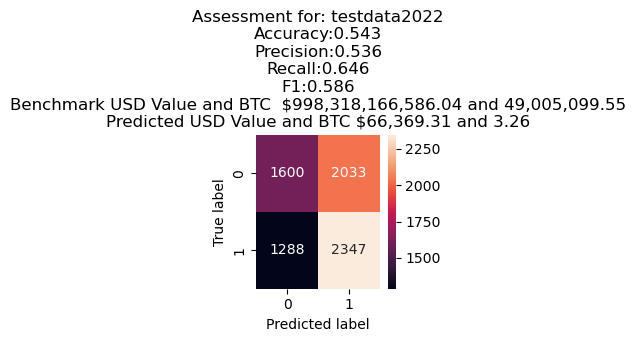

In [5]:
INDICATORS = ['RSI', 'MACD', 'STOCH','ADL', 'ATR', 'MOM', 'MFI', 'ROC', 'OBV', 'CCI', 'EMV', 'VORTEX']

testdata2022 ='assets/TEST_MergeJMJPCHourly2019202_NewsGoogleApi_ActualLabel.csv'

files= [testdata2022]

def binary(value):
    if value > 0:
        return 1
    else:
        return 0

def _exponential_smooth(data, alpha):
    """
    Function that exponentially smooths dataset so values are less 'rigid'
    :param alpha: weight factor to weight recent values more
    """
    
    return data.ewm(alpha=alpha).mean()

def _get_indicator_data(data):
    """
    Function that uses the finta API to calculate technical indicators used as the features
    :return:
    """

    for indicator in INDICATORS:
        ind_data = eval('TA.' + indicator + '(data)')
        if not isinstance(ind_data, pd.DataFrame):
            ind_data = ind_data.to_frame()
        data = data.merge(ind_data, left_index=True, right_index=True)
    data.rename(columns={"14 period EMV.": '14 period EMV'}, inplace=True)

    # Also calculate moving averages for features
    data['ema50'] = data['Close'] / data['Close'].ewm(50).mean()
    data['ema21'] = data['Close'] / data['Close'].ewm(21).mean()
    data['ema15'] = data['Close'] / data['Close'].ewm(14).mean()
    data['ema5'] = data['Close'] / data['Close'].ewm(5).mean()

    # Instead of using the actual volume value (which changes over time), we normalize it with a moving volume average
    data['normVol'] = data['Volume'] / data['Volume'].ewm(5).mean()

    return data


for file,x in zip(files, ['testdata2022']):
    PredictDF= pd.read_csv(file)
    prediction = (PredictDF.shift(-1)['Close'] >= PredictDF['Close'])
    prediction = prediction.iloc[:-1]
    PredictDF['Actual_Label'] = prediction.astype(int)
    PredictDF= PredictDF.dropna()
    
    Indicatordata = _exponential_smooth(PredictDF[['Close', 'Open','High','Low','Volume']], 0.65)

    Indicatordatafinal = _get_indicator_data(Indicatordata)

    Indicatordatafinal = Indicatordatafinal.drop(['Close', 'Open', 'High', 'Low', 'Volume'], axis = 1)
    PredictDF = pd.merge(PredictDF, Indicatordatafinal, left_index=True, right_index=True)
    PredictDF = PredictDF.drop(['time','hour','Open Time','_merge','Signal','Position', 'Signal35JMJ', 'Position35JMJ', 'Ignore'], axis = 1)

    
    
    
    
    columns = ['favorites', 'retweets', 'number_of_followers', 'following',
           'followers_following_ratio', '2x_retweets_+_favorites', 'polarity',
           'W1 Score', 'Bull_ratio', 'W Score With Bull Ratio', 'Open', 'High',
           'Low', 'Close', 'Volume', 'Quote Asset Volume', 'Number of Trades',
           'TB Base Volume', 'TB Quote Volume', '3MovingAverage', '5MovingAverage',
           'JMJ_3HMoving_averages', 'JMJ_5HMoving_averages', 
           '14 period RSI', 'MACD', 'SIGNAL', '14 period STOCH %K', 'MFV',
           '14 period ATR', 'MOM', '14 period MFI', 'ROC', 'OBV', '20 period CCI',
           '14 period EMV', 'VIm', 'VIp', 'ema50', 'ema21', 'ema15', 'ema5']


    for column in columns: 
        PredictDF['Binary{}'.format(column)]  = (PredictDF[column] - PredictDF[column].shift(1)).apply(binary)
    

    PredictDF = PredictDF.dropna()
    
    feature_names_JMJ = ['favorites', 'retweets', 'number_of_followers', 'following',
       'followers_following_ratio', '2x_retweets_+_favorites', 'polarity',
       'W1 Score', 'Bull_ratio', 'W Score With Bull Ratio', 'Open',
       'High', 'Low', 'Close', 'Volume', 'Quote Asset Volume',
       'Number of Trades', 'TB Base Volume', 'TB Quote Volume',
       '3MovingAverage', '5MovingAverage', 'JMJ_3HMoving_averages',
        'Bitcoin_Google_Trend_Score', 'BTC_Google_Trend_Score',
       'JMJ_5HMoving_averages', 'Mkt Sentiment',
       'Crypto Sentiment', 'Historically Optimal SMA(s-t)',
       'Historically Optimal SMA(l-t)', 'Historically Optimal WMA(s-t)',
       'Historically Optimal WMA(l-t)', 'Historically Optimal EMA(s-t)',
       'Historically Optimal EMA(l-t)',
       'Twitter Hourly Favorites SMA(s-t)',
       'Twitter Hourly Favorites SMA(l-t)',
       'Twitter Hourly Favorites WMA(s-t)',
       'Twitter Hourly Favorites WMA(l-t)',
       'Twitter Hourly Favorites EMA(s-t)',
       'Twitter Hourly Favorites EMA(l-t)',
       'Twitter Hourly Retweets SMA(s-t)',
       'Twitter Hourly Retweets SMA(l-t)',
       'Twitter Hourly Retweets WMA(s-t)',
       'Twitter Hourly Retweets WMA(l-t)',
       'Twitter Hourly Retweets EMA(s-t)',
       'Twitter Hourly Retweets EMA(l-t)',
       'Twitter Hourly Follower Exposure SMA(s-t)',
       'Twitter Hourly Follower Exposure SMA(l-t)',
       'Twitter Hourly Follower Exposure WMA(s-t)',
       'Twitter Hourly Follower Exposure WMA(l-t)',
       'Twitter Hourly Follower Exposure EMA(s-t)',
       'Twitter Hourly Follower Exposure EMA(l-t)',
       'Twitter Hourly Following Exposure SMA(s-t)',
       'Twitter Hourly Following Exposure SMA(l-t)',
       'Twitter Hourly Following Exposure WMA(s-t)',
       'Twitter Hourly Following Exposure WMA(l-t)',
       'Twitter Hourly Following Exposure EMA(s-t)',
       'Twitter Hourly Following Exposure EMA(l-t)',
       'Twitter Hourly Follower to Following Ratio SMA(s-t)',
       'Twitter Hourly Follower to Following Ratio SMA(l-t)',
       'Twitter Hourly Follower to Following Ratio WMA(s-t)',
       'Twitter Hourly Follower to Following Ratio WMA(l-t)',
       'Twitter Hourly Follower to Following Ratio EMA(s-t)',
       'Twitter Hourly Follower to Following Ratio EMA(l-t)',
       'Twitter Hourly 2x Retweets + Favorites SMA(s-t)',
       'Twitter Hourly 2x Retweets + Favorites SMA(l-t)',
       'Twitter Hourly 2x Retweets + Favorites WMA(s-t)',
       'Twitter Hourly 2x Retweets + Favorites WMA(l-t)',
       'Twitter Hourly 2x Retweets + Favorites EMA(s-t)',
       'Twitter Hourly 2x Retweets + Favorites EMA(l-t)',
       'Twitter Hourly Polarity Score SMA(s-t)',
       'Twitter Hourly Polarity Score SMA(l-t)',
       'Twitter Hourly Polarity Score WMA(s-t)',
       'Twitter Hourly Polarity Score WMA(l-t)',
       'Twitter Hourly Polarity Score EMA(s-t)',
       'Twitter Hourly Polarity Score EMA(l-t)',
       'Twitter W1 Score SMA(s-t)', 'Twitter W1 Score SMA(l-t)',
       'Twitter W1 Score WMA(s-t)', 'Twitter W1 Score WMA(l-t)',
       'Twitter W1 Score EMA(s-t)', 'Twitter W1 Score EMA(l-t)',
       'Twitter Hourly Bull Ratio SMA(s-t)',
       'Twitter Hourly Bull Ratio SMA(l-t)',
       'Twitter Hourly Bull Ratio WMA(s-t)',
       'Twitter Hourly Bull Ratio WMA(l-t)',
       'Twitter Hourly Bull Ratio EMA(s-t)',
       'Twitter Hourly Bull Ratio EMA(l-t)',
       'Twitter Hourly Weighted Bull Ratio SMA(s-t)',
       'Twitter Hourly Weighted Bull Ratio SMA(l-t)',
       'Twitter Hourly Weighted Bull Ratio WMA(s-t)',
       'Twitter Hourly Weighted Bull Ratio WMA(l-t)',
       'Twitter Hourly Weighted Bull Ratio EMA(s-t)',
       'Twitter Hourly Weighted Bull Ratio EMA(l-t)',
       'Quote Asset Volume SMA(s-t)', 'Quote Asset Volume SMA(l-t)',
       'Quote Asset Volume WMA(s-t)', 'Quote Asset Volume WMA(l-t)',
       'Quote Asset Volume EMA(s-t)', 'Quote Asset Volume EMA(l-t)',
       '# of Hourly Trades SMA(s-t)', '# of Hourly Trades SMA(l-t)',
       '# of Hourly Trades WMA(s-t)', '# of Hourly Trades WMA(l-t)',
       '# of Hourly Trades EMA(s-t)', '# of Hourly Trades EMA(l-t)',
       'TB Base Volume SMA(s-t)', 'TB Base Volume SMA(l-t)',
       'TB Base Volume WMA(s-t)', 'TB Base Volume WMA(l-t)',
       'TB Base Volume EMA(s-t)', 'TB Base Volume EMA(l-t)',
       'TB Quote Volume SMA(s-t)', 'TB Quote Volume SMA(l-t)',
       'TB Quote Volume WMA(s-t)', 'TB Quote Volume WMA(l-t)',
       'TB Quote Volume EMA(s-t)', 'TB Quote Volume EMA(l-t)',
       '14 period RSI', 'MACD', 'SIGNAL', '14 period STOCH %K', 'MFV',
       '14 period ATR', 'MOM', '14 period MFI', 'ROC', 'OBV',
       '20 period CCI', '14 period EMV', 'VIm', 'VIp', 'ema50', 'ema21',
       'ema15', 'ema5', 'normVol', 'Binaryfavorites', 'Binaryretweets',
       'Binarynumber_of_followers', 'Binaryfollowing',
       'Binaryfollowers_following_ratio', 'Binary2x_retweets_+_favorites',
       'Binarypolarity', 'BinaryW1 Score', 'BinaryBull_ratio',
       'BinaryW Score With Bull Ratio', 'BinaryOpen', 'BinaryHigh',
       'BinaryLow', 'BinaryClose', 'BinaryVolume',
       'BinaryQuote Asset Volume', 'BinaryNumber of Trades',
       'BinaryTB Base Volume', 'BinaryTB Quote Volume',
       'Binary3MovingAverage', 'Binary5MovingAverage',
       'BinaryJMJ_3HMoving_averages', 'BinaryJMJ_5HMoving_averages',
       'Binary14 period RSI', 'BinaryMACD', 'BinarySIGNAL',
       'Binary14 period STOCH %K', 'BinaryMFV', 'Binary14 period ATR',
       'BinaryMOM', 'Binary14 period MFI', 'BinaryROC', 'BinaryOBV',
       'Binary20 period CCI', 'Binary14 period EMV', 'BinaryVIm',
       'BinaryVIp', 'Binaryema50', 'Binaryema21', 'Binaryema15',
       'Binaryema5']
    X_test = PredictDF[feature_names_JMJ]
    y_test = PredictDF['Actual_Label']

    scaler = MinMaxScaler()
    X_train_scaled = scaler.fit_transform(X_test)
    X_test_scaled = scaler.transform(X_test)

    predict_y=  Model2.predict(X_test_scaled)
    PredictDF['Predicted_Label']= predict_y


    confusion_mc = confusion_matrix(PredictDF['Actual_Label'], PredictDF['Predicted_Label'])
    df_cm = pd.DataFrame(confusion_mc, 
                         index = [i for i in range(0,2)], columns = [i for i in range(0,2)])


    PredictDF['ValueActual'] =0
    PredictDF['BTCValueActual'] =0
    if PredictDF.loc[PredictDF.index[0],'Actual_Label']==0.0:
        PredictDF.loc[PredictDF.index[0],'ValueActual']=100000
    else:
        PredictDF.loc[PredictDF.index[0],'BTCValueActual']=round((100000/PredictDF.loc[PredictDF.index[0],'Close']),5)


    for current in range(1, len(PredictDF.index)):
        previous = current - 1

        if PredictDF.loc[PredictDF.index[current],'Actual_Label']==0 and PredictDF.loc[PredictDF.index[previous],'BTCValueActual']==0:
            PredictDF.loc[PredictDF.index[current],'ValueActual']=PredictDF.loc[PredictDF.index[previous],'ValueActual']
        elif PredictDF.loc[PredictDF.index[current],'Actual_Label']==1 and PredictDF.loc[PredictDF.index[previous],'ValueActual'] ==0 :
            PredictDF.loc[PredictDF.index[current],'ValueActual']= 0
            PredictDF.loc[PredictDF.index[current],'BTCValueActual']=round(PredictDF.loc[PredictDF.index[previous],'BTCValueActual'],3)
        elif PredictDF.loc[PredictDF.index[current],'Actual_Label']==1:
            PredictDF.loc[PredictDF.index[current],'BTCValueActual'] = round((PredictDF.loc[PredictDF.index[previous],'ValueActual']/PredictDF.loc[PredictDF.index[current],'Close']),5)
        else:
            PredictDF.loc[PredictDF.index[current],'ValueActual'] = round((PredictDF.loc[PredictDF.index[previous],'BTCValueActual'] *PredictDF.loc[PredictDF.index[current],'Close']),3)


    PredictDF['ValuePredicted'] =0
    PredictDF['BTCValuePredicted'] =0
    if PredictDF.loc[PredictDF.index[0],'Predicted_Label']==0.0:
        PredictDF.loc[PredictDF.index[0],'ValuePredicted']=100000
    else:
        PredictDF.loc[PredictDF.index[0],'BTCValuePredicted']=round((100000/PredictDF.loc[PredictDF.index[0],'Close']),5)


    for current in range(1, len(PredictDF.index)):
        previous = current - 1

        if PredictDF.loc[PredictDF.index[current],'Predicted_Label']==0 and PredictDF.loc[PredictDF.index[previous],'BTCValuePredicted']==0:
            PredictDF.loc[PredictDF.index[current],'ValuePredicted']=PredictDF.loc[PredictDF.index[previous],'ValuePredicted']
        elif PredictDF.loc[PredictDF.index[current],'Predicted_Label']==1 and PredictDF.loc[PredictDF.index[previous],'ValuePredicted'] ==0 :
            PredictDF.loc[PredictDF.index[current],'ValuePredicted']= 0
            PredictDF.loc[PredictDF.index[current],'BTCValuePredicted']=round(PredictDF.loc[PredictDF.index[previous],'BTCValuePredicted'],3)
        elif PredictDF.loc[PredictDF.index[current],'Predicted_Label']==1:
            PredictDF.loc[PredictDF.index[current],'BTCValuePredicted'] = round((PredictDF.loc[PredictDF.index[previous],'ValuePredicted']/PredictDF.loc[PredictDF.index[current],'Close']),5)
        else:
            PredictDF.loc[PredictDF.index[current],'ValuePredicted'] = round((PredictDF.loc[PredictDF.index[previous],'BTCValuePredicted'] *PredictDF.loc[PredictDF.index[current],'Close']),3)
    df = PredictDF.mask(PredictDF==0).ffill().iloc[[-1]]
    LastPredictvalue = df['ValuePredicted'].values[0]
    LastPredictBTC = df['BTCValuePredicted'].values[0]
    plt.figure(figsize=(2,2))
    sns.heatmap(df_cm, annot=True, fmt='g')
    plt.title('Assessment for: {}\nAccuracy:{:.3f}\nPrecision:{:.3f}\nRecall:{:.3f}\nF1:{:.3f}\nBenchmark USD Value and BTC  ${:,.2f} and {:,.2f}\nPredicted USD Value and BTC ${:,.2f} and {:,.2f}'.format(x, accuracy_score(PredictDF['Actual_Label'],PredictDF['Predicted_Label']),
                                                                        precision_score(PredictDF['Actual_Label'],PredictDF['Predicted_Label']),
                                                                                    recall_score(PredictDF['Actual_Label'], PredictDF['Predicted_Label']),
                                                                                    f1_score(PredictDF['Actual_Label'], PredictDF['Predicted_Label']),
                                                                                     max(PredictDF['ValueActual']),max(PredictDF['BTCValueActual']),
                                                                                     LastPredictvalue,LastPredictBTC
                                                                                    ))
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

### Exporting Predictions

In [16]:
INDICATORS = ['RSI', 'MACD', 'STOCH','ADL', 'ATR', 'MOM', 'MFI', 'ROC', 'OBV', 'CCI', 'EMV', 'VORTEX']

testdata2022 ='assets/newfeatures/TEST_MergeJMJPCHourly2019202_NewsGoogleApi_ActualLabel.csv'

files= [testdata2022]

def binary(value):
    if value > 0:
        return 1
    else:
        return 0

def _exponential_smooth(data, alpha):
    """
    Function that exponentially smooths dataset so values are less 'rigid'
    :param alpha: weight factor to weight recent values more
    """
    
    return data.ewm(alpha=alpha).mean()

def _get_indicator_data(data):
    """
    Function that uses the finta API to calculate technical indicators used as the features
    :return:
    """

    for indicator in INDICATORS:
        ind_data = eval('TA.' + indicator + '(data)')
        if not isinstance(ind_data, pd.DataFrame):
            ind_data = ind_data.to_frame()
        data = data.merge(ind_data, left_index=True, right_index=True)
    data.rename(columns={"14 period EMV.": '14 period EMV'}, inplace=True)

    # Also calculate moving averages for features
    data['ema50'] = data['Close'] / data['Close'].ewm(50).mean()
    data['ema21'] = data['Close'] / data['Close'].ewm(21).mean()
    data['ema15'] = data['Close'] / data['Close'].ewm(14).mean()
    data['ema5'] = data['Close'] / data['Close'].ewm(5).mean()

    # Instead of using the actual volume value (which changes over time), we normalize it with a moving volume average
    data['normVol'] = data['Volume'] / data['Volume'].ewm(5).mean()

    return data


for file,x in zip(files, ['testdata2022']):
    PredictDF= pd.read_csv(file)
    prediction = (PredictDF.shift(-1)['Close'] >= PredictDF['Close'])
    prediction = prediction.iloc[:-1]
    PredictDF['Actual_Label'] = prediction.astype(int)
    PredictDF= PredictDF.dropna()
    
    Indicatordata = _exponential_smooth(PredictDF[['Close', 'Open','High','Low','Volume']], 0.65)

    Indicatordatafinal = _get_indicator_data(Indicatordata)

    Indicatordatafinal = Indicatordatafinal.drop(['Close', 'Open', 'High', 'Low', 'Volume'], axis = 1)
    PredictDF = pd.merge(PredictDF, Indicatordatafinal, left_index=True, right_index=True)
    PredictDF = PredictDF.drop(['time','hour','Open Time','_merge','Signal','Position', 'Signal35JMJ', 'Position35JMJ', 'Ignore'], axis = 1)

    
    
    
    
    columns = ['favorites', 'retweets', 'number_of_followers', 'following',
           'followers_following_ratio', '2x_retweets_+_favorites', 'polarity',
           'W1 Score', 'Bull_ratio', 'W Score With Bull Ratio', 'Open', 'High',
           'Low', 'Close', 'Volume', 'Quote Asset Volume', 'Number of Trades',
           'TB Base Volume', 'TB Quote Volume', '3MovingAverage', '5MovingAverage',
           'JMJ_3HMoving_averages', 'JMJ_5HMoving_averages', 
           '14 period RSI', 'MACD', 'SIGNAL', '14 period STOCH %K', 'MFV',
           '14 period ATR', 'MOM', '14 period MFI', 'ROC', 'OBV', '20 period CCI',
           '14 period EMV', 'VIm', 'VIp', 'ema50', 'ema21', 'ema15', 'ema5']


    for column in columns: 
        PredictDF['Binary{}'.format(column)]  = (PredictDF[column] - PredictDF[column].shift(1)).apply(binary)
    

    PredictDF = PredictDF.dropna()
    
    feature_names_JMJ = ['favorites', 'retweets', 'number_of_followers', 'following',
       'followers_following_ratio', '2x_retweets_+_favorites', 'polarity',
       'W1 Score', 'Bull_ratio', 'W Score With Bull Ratio', 'Open',
       'High', 'Low', 'Close', 'Volume', 'Quote Asset Volume',
       'Number of Trades', 'TB Base Volume', 'TB Quote Volume',
       '3MovingAverage', '5MovingAverage', 'JMJ_3HMoving_averages',
        'Bitcoin_Google_Trend_Score', 'BTC_Google_Trend_Score',
       'JMJ_5HMoving_averages', 'Mkt Sentiment',
       'Crypto Sentiment', 'Historically Optimal SMA(s-t)',
       'Historically Optimal SMA(l-t)', 'Historically Optimal WMA(s-t)',
       'Historically Optimal WMA(l-t)', 'Historically Optimal EMA(s-t)',
       'Historically Optimal EMA(l-t)',
       'Twitter Hourly Favorites SMA(s-t)',
       'Twitter Hourly Favorites SMA(l-t)',
       'Twitter Hourly Favorites WMA(s-t)',
       'Twitter Hourly Favorites WMA(l-t)',
       'Twitter Hourly Favorites EMA(s-t)',
       'Twitter Hourly Favorites EMA(l-t)',
       'Twitter Hourly Retweets SMA(s-t)',
       'Twitter Hourly Retweets SMA(l-t)',
       'Twitter Hourly Retweets WMA(s-t)',
       'Twitter Hourly Retweets WMA(l-t)',
       'Twitter Hourly Retweets EMA(s-t)',
       'Twitter Hourly Retweets EMA(l-t)',
       'Twitter Hourly Follower Exposure SMA(s-t)',
       'Twitter Hourly Follower Exposure SMA(l-t)',
       'Twitter Hourly Follower Exposure WMA(s-t)',
       'Twitter Hourly Follower Exposure WMA(l-t)',
       'Twitter Hourly Follower Exposure EMA(s-t)',
       'Twitter Hourly Follower Exposure EMA(l-t)',
       'Twitter Hourly Following Exposure SMA(s-t)',
       'Twitter Hourly Following Exposure SMA(l-t)',
       'Twitter Hourly Following Exposure WMA(s-t)',
       'Twitter Hourly Following Exposure WMA(l-t)',
       'Twitter Hourly Following Exposure EMA(s-t)',
       'Twitter Hourly Following Exposure EMA(l-t)',
       'Twitter Hourly Follower to Following Ratio SMA(s-t)',
       'Twitter Hourly Follower to Following Ratio SMA(l-t)',
       'Twitter Hourly Follower to Following Ratio WMA(s-t)',
       'Twitter Hourly Follower to Following Ratio WMA(l-t)',
       'Twitter Hourly Follower to Following Ratio EMA(s-t)',
       'Twitter Hourly Follower to Following Ratio EMA(l-t)',
       'Twitter Hourly 2x Retweets + Favorites SMA(s-t)',
       'Twitter Hourly 2x Retweets + Favorites SMA(l-t)',
       'Twitter Hourly 2x Retweets + Favorites WMA(s-t)',
       'Twitter Hourly 2x Retweets + Favorites WMA(l-t)',
       'Twitter Hourly 2x Retweets + Favorites EMA(s-t)',
       'Twitter Hourly 2x Retweets + Favorites EMA(l-t)',
       'Twitter Hourly Polarity Score SMA(s-t)',
       'Twitter Hourly Polarity Score SMA(l-t)',
       'Twitter Hourly Polarity Score WMA(s-t)',
       'Twitter Hourly Polarity Score WMA(l-t)',
       'Twitter Hourly Polarity Score EMA(s-t)',
       'Twitter Hourly Polarity Score EMA(l-t)',
       'Twitter W1 Score SMA(s-t)', 'Twitter W1 Score SMA(l-t)',
       'Twitter W1 Score WMA(s-t)', 'Twitter W1 Score WMA(l-t)',
       'Twitter W1 Score EMA(s-t)', 'Twitter W1 Score EMA(l-t)',
       'Twitter Hourly Bull Ratio SMA(s-t)',
       'Twitter Hourly Bull Ratio SMA(l-t)',
       'Twitter Hourly Bull Ratio WMA(s-t)',
       'Twitter Hourly Bull Ratio WMA(l-t)',
       'Twitter Hourly Bull Ratio EMA(s-t)',
       'Twitter Hourly Bull Ratio EMA(l-t)',
       'Twitter Hourly Weighted Bull Ratio SMA(s-t)',
       'Twitter Hourly Weighted Bull Ratio SMA(l-t)',
       'Twitter Hourly Weighted Bull Ratio WMA(s-t)',
       'Twitter Hourly Weighted Bull Ratio WMA(l-t)',
       'Twitter Hourly Weighted Bull Ratio EMA(s-t)',
       'Twitter Hourly Weighted Bull Ratio EMA(l-t)',
       'Quote Asset Volume SMA(s-t)', 'Quote Asset Volume SMA(l-t)',
       'Quote Asset Volume WMA(s-t)', 'Quote Asset Volume WMA(l-t)',
       'Quote Asset Volume EMA(s-t)', 'Quote Asset Volume EMA(l-t)',
       '# of Hourly Trades SMA(s-t)', '# of Hourly Trades SMA(l-t)',
       '# of Hourly Trades WMA(s-t)', '# of Hourly Trades WMA(l-t)',
       '# of Hourly Trades EMA(s-t)', '# of Hourly Trades EMA(l-t)',
       'TB Base Volume SMA(s-t)', 'TB Base Volume SMA(l-t)',
       'TB Base Volume WMA(s-t)', 'TB Base Volume WMA(l-t)',
       'TB Base Volume EMA(s-t)', 'TB Base Volume EMA(l-t)',
       'TB Quote Volume SMA(s-t)', 'TB Quote Volume SMA(l-t)',
       'TB Quote Volume WMA(s-t)', 'TB Quote Volume WMA(l-t)',
       'TB Quote Volume EMA(s-t)', 'TB Quote Volume EMA(l-t)',
       '14 period RSI', 'MACD', 'SIGNAL', '14 period STOCH %K', 'MFV',
       '14 period ATR', 'MOM', '14 period MFI', 'ROC', 'OBV',
       '20 period CCI', '14 period EMV', 'VIm', 'VIp', 'ema50', 'ema21',
       'ema15', 'ema5', 'normVol', 'Binaryfavorites', 'Binaryretweets',
       'Binarynumber_of_followers', 'Binaryfollowing',
       'Binaryfollowers_following_ratio', 'Binary2x_retweets_+_favorites',
       'Binarypolarity', 'BinaryW1 Score', 'BinaryBull_ratio',
       'BinaryW Score With Bull Ratio', 'BinaryOpen', 'BinaryHigh',
       'BinaryLow', 'BinaryClose', 'BinaryVolume',
       'BinaryQuote Asset Volume', 'BinaryNumber of Trades',
       'BinaryTB Base Volume', 'BinaryTB Quote Volume',
       'Binary3MovingAverage', 'Binary5MovingAverage',
       'BinaryJMJ_3HMoving_averages', 'BinaryJMJ_5HMoving_averages',
       'Binary14 period RSI', 'BinaryMACD', 'BinarySIGNAL',
       'Binary14 period STOCH %K', 'BinaryMFV', 'Binary14 period ATR',
       'BinaryMOM', 'Binary14 period MFI', 'BinaryROC', 'BinaryOBV',
       'Binary20 period CCI', 'Binary14 period EMV', 'BinaryVIm',
       'BinaryVIp', 'Binaryema50', 'Binaryema21', 'Binaryema15',
       'Binaryema5']
    X_test = PredictDF[feature_names_JMJ]
    y_test = PredictDF['Actual_Label']

    scaler = MinMaxScaler()
    X_train_scaled = scaler.fit_transform(X_test)
    X_test_scaled = scaler.transform(X_test)

    predict_y=  Model2.predict(X_test_scaled)
    PredictDF['Predicted_Label']= predict_y



In [18]:
PredictDF

,favorites,retweets,number_of_followers,following,followers_following_ratio,2x_retweets_+_favorites,polarity,W1 Score,Bull_ratio,W Score With Bull Ratio,...,BinaryOBV,Binary20 period CCI,Binary14 period EMV,BinaryVIm,BinaryVIp,Binaryema50,Binaryema21,Binaryema15,Binaryema5,Predicted_Label
14,9.797619,0.745238,16514.150000,1498.323810,63.299076,11.288095,0.113520,0.128081,4.256410,0.545164,...,0,1,0,0,0,0,0,0,0,1.0
15,39.326190,3.390476,16099.623810,1672.185714,110.504489,46.107143,0.087327,0.253405,2.500000,0.633513,...,0,0,0,1,0,0,0,0,0,1.0
16,5.369048,0.550000,11057.442857,1828.021429,133.780075,6.469048,0.093584,0.222649,2.450000,0.545491,...,0,1,0,1,0,0,0,0,1,1.0
17,14.495238,1.890476,25029.171429,1882.980952,662.631886,18.276190,0.090903,0.173174,2.500000,0.432936,...,1,1,1,0,1,1,1,1,1,1.0
18,13.329545,1.281818,22107.427273,2018.227273,479.791704,15.893182,0.095774,0.263250,3.395833,0.893952,...,1,1,1,0,1,1,1,1,1,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7263,10.030952,2.557143,12561.900000,906.071429,406.088057,15.145238,0.094200,0.365355,3.066667,1.120422,...,1,1,1,0,1,1,1,1,1,1.0
7264,9.507143,3.530952,10695.850000,805.514286,264.229345,16.569048,0.075146,0.250643,2.518519,0.631248,...,0,1,1,0,1,0,0,0,1,1.0
7265,17.957143,4.402381,22596.990476,846.535714,217.348828,26.761905,0.104180,0.403896,2.941176,1.187930,...,0,0,0,1,1,0,1,1,1,1.0
7266,4.788095,1.021429,21378.707143,730.971429,172.471290,6.830952,0.097456,0.310215,4.176471,1.295602,...,1,1,0,1,0,1,1,1,1,0.0


In [19]:
PredictDF.to_csv('predictions/Ensemble_Model_LR_ABC_LDA_GBC_RC.csv')